# Assignment 3

## A bit of info before you start.


> ***First and foremost, dont use AI to code. Use it to understand and then write code yourself. Use AI to verify if the code you wrote it correct, that will help you learn far far more.***

> ***Implement Stuff from sratch. Use cv2 functions only when numpy implementation can be extremely tedious.***



You will need to use your own image for this assignment, which you need to import into here.
If you cant fetch your image from any APIs that dont need credentials, then :
To preserve an image in Google Colab without a continuous runtime or using Google Drive, you can use base64 string encoding of images ( its really simple )

First, begin by normally uploading the image into the contents folders as you normally do in colab or fetch it using Drive or any API.

To get the base64 string :
```
import base64
with open("your_image.jpg", "rb") as img_file:
    print(base64.b64encode(img_file.read()).decode())
```

Note that the base64 string is a very long string, click on the three dot icon to the left of the current code cell and click on <code> Copy Cell Output </code> to easily copy it to your clipboard.

Then, to embed the string into your Jupyter Notebook :
```
from PIL import Image
import io
import base64
import matplotlib.pyplot as plt
import numpy as np

# PASTE BASE64 STRING HERE
base64_image = "iVBORw0K..."  # long base64 string

img_data = base64.b64decode(base64_image)
img = Image.open(io.BytesIO(img_data))

plt.imshow(img)
plt.axis("off")
```
The string is really long so, use a multiline string in python ( syntax : """ """ )

Otherwise, you can also choose to use any API ( try researching on https://picsum.photos/ )

## SECTION 1 : Preparations

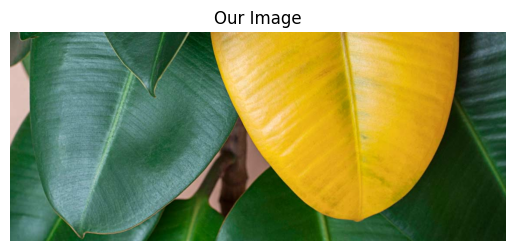

In [71]:
# @title
from PIL import Image
import io
import base64
import matplotlib.pyplot as plt
import numpy as np

img_str = """
/9j/4QAYRXhpZgAASUkqAAgAAAAAAAAAAAAAAP/sABFEdWNreQABAAQAAAAjAAD/4QMsaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wLwA8P3hwYWNrZXQgYmVnaW49Iu+7vyIgaWQ9Ilc1TTBNcENlaGlIenJlU3pOVGN6a2M5ZCI/PiA8eDp4bXBtZXRhIHhtbG5zOng9ImFkb2JlOm5zOm1ldGEvIiB4OnhtcHRrPSJBZG9iZSBYTVAgQ29yZSA2LjAtYzAwMiA3OS4xNjQzNTIsIDIwMjAvMDEvMzAtMTU6NTA6MzggICAgICAgICI+IDxyZGY6UkRGIHhtbG5zOnJkZj0iaHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIyI+IDxyZGY6RGVzY3JpcHRpb24gcmRmOmFib3V0PSIiIHhtbG5zOnhtcD0iaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wLyIgeG1sbnM6eG1wTU09Imh0dHA6Ly9ucy5hZG9iZS5jb20veGFwLzEuMC9tbS8iIHhtbG5zOnN0UmVmPSJodHRwOi8vbnMuYWRvYmUuY29tL3hhcC8xLjAvc1R5cGUvUmVzb3VyY2VSZWYjIiB4bXA6Q3JlYXRvclRvb2w9IkFkb2JlIFBob3Rvc2hvcCAyMS4xIChXaW5kb3dzKSIgeG1wTU06SW5zdGFuY2VJRD0ieG1wLmlpZDo1NDU0OTQ5Mjg5NjcxMUVBOUUzNEVGQjBBRkFERTQ2RCIgeG1wTU06RG9jdW1lbnRJRD0ieG1wLmRpZDo1NDU0OTQ5Mzg5NjcxMUVBOUUzNEVGQjBBRkFERTQ2RCI+IDx4bXBNTTpEZXJpdmVkRnJvbSBzdFJlZjppbnN0YW5jZUlEPSJ4bXAuaWlkOjU0NTQ5NDkwODk2NzExRUE5RTM0RUZCMEFGQURFNDZEIiBzdFJlZjpkb2N1bWVudElEPSJ4bXAuZGlkOjU0NTQ5NDkxODk2NzExRUE5RTM0RUZCMEFGQURFNDZEIi8+IDwvcmRmOkRlc2NyaXB0aW9uPiA8L3JkZjpSREY+IDwveDp4bXBtZXRhPiA8P3hwYWNrZXQgZW5kPSJyIj8+/+4ADkFkb2JlAGTAAAAAAf/bAIQADgoKCgsKDgsLDhQNCw0UGBIODhIYGxYWFxYWGxoUFxcXFxQaGh8gIyAfGikpLS0pKT07Ozs9QEBAQEBAQEBAQAEPDQ0PEQ8SEBASFA4RDhQXEhQUEhchFxcZFxchKh4aGhoaHiomKSMjIykmLy8qKi8vOjo4OjpAQEBAQEBAQEBA/8AAEQgB4AR0AwEiAAIRAQMRAf/EAKUAAAMBAQEBAQAAAAAAAAAAAAECAwAEBQYHAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUGEAABAwMDAgQFAQcEAQIGAwABABECITEDQVESYQRxgSITkaGxMgVCwdHhUiMUBvDxcjNikhWCwkMkJTWyUzQRAQEAAgECBAUDAwMEAgMBAAABEQIhMQNBURIEYXGBIjKRUhOhsUIjMwXB0WJy4YLwkkMU/9oADAMBAAIRAxEAPwD54BMImyaMU0brNEi8AJdpmhKoA5DpReGCCbCpZl72EchOAqZwkB4tRfPhxNjQi4KVZe4n434OjGYcDVpKcxIFuTx0SREieIqXei6sfZZpR5SDdDQn4peqMddLekc5MpFzU2Cf2ZCsrGw1Vx2neCX3Y8Y0BLlkRxjJsrZWvxo/mpt+bT+PE666/NOJ4GgcjRYnkXKbJKEj6IcBrV1gGYkOqjO3nrnBW3Q4km1FcCL2bxTgGQ9NBZVIM5S9uQYGjo+wRWlVUYJSYn4phjOqeD5RGNtQdlWGISqSycYS/RXhggSAC3inICxhjgfUXjsqR9iZegCP9uJGhoie04gGBd7BVDP/APbggcmG66Iy7cP8iox7QgPIVOisMAIacS/RVAfHLtx9zJ27bI9EkMECW/V1TDA0WEa7jRMMIdsSQPtA1RMMUPtI40SmLXCsY4ZAX8WQCyh29wWlsFuMSKEEWFfqiMOAiknJqQFj2cB9mQE3MTRAHHCMZAxNfivI/K9qcWfnGkcvqBG/6gvV/sZxrGTEB3BUu47XNmwShIuRWHSSneZmcdDnk8MwD0oAsxAcDwTwBiT7lCNOoQ5GTtQaMo8BUJes1d0wjECzyTmIBcAV3ScWLiuzogbkSWYAIswoUSTJokcWDUCHOMA1zvomGcx1qlM5SDW6IExkXkW6ocATQuEhGBAO+6PI7PWjo8LaDdMPbB16JmnEObKwaN9EQZaUCFyzIAFpM1ETFrFZy/pteiDgOTQIBSQC92+CTBGWXMHqHRnOJPpr4qnZgCRmaCIJWfcvCaHfZnmYg2ouEycuqZvvJf1EqBRpOBr0Y1KDuERdhqFo2VKYRo61ujJifSClYylxFykeHb+J7KXd91GnoFZHoFf/ACPvRlyx7TGWxYbtuusGP4n8Ych/78o9O9V817kjIymeRlUv1US5ufLou/brjxqdP91iFXjEig8tUnE6aKmeSVBponGQkeqv1RAgfuuNkDBjQu+yDyaIFxUfNer/AI7MjvZDSUD8l5IEo1XofhcvH8nhEi3ImPxCy70z2t5/41ft7ju6X/y/u+wjAv4p+I80cYVREC68nW5exQgBx6qkPUCTYJIBz0XTCMYlrUqFv25n5M9rgccWI3ayqZAl7AKEpsf26sl5uCHd9ld2knBTlczgYSH6jUpefIAMx3vdCOORiG8wnjChFQ31We12pzED2yGpRPEB+iInFiNNehU6yk8aFTxOnJ9TcgKboCUiwcsaB1hF2lZkwaosRZTcgpg1SgY1v5pwafNJLQHdZ9zGDmSl/JAGtNEzHyREWtqua5qitfcotpomIcMLpbFK8BnDIGjFZkPDzU7Xg8Ca+GqF7WRAdayi2mVg9dVn80DfotZAYOyxWJAH7FhboigHWvdEhkoIKAzV+iyDraoAEslkQiSpTLvqqkIJyDBSLmqYQJL/ABTcAB1V9C6piOp+KB3sE5f/AHSSj5n5JwYPjIMSLOEe8JlFmvEJYNH1SurZYPjEjqF1e2v27z5VG3GA/HiLRbzZe1Anj91914f44tK9HXvwgJQ6stexc3eeVRv1gDIQwk3wW5tUs6M8T1FxdKcRHhqFvZsnIksxISGUbChQkJUcEBYwJP0UbXbnEXKxIIYnogGIb5IES2SEl6hY7dyzrFRRw3mklqWokMiFvcNjqs73Nbx0PAe2H1SmJtdMZjUIiUaLOzW9KrlIirpCAA9laTFDgCsdtDlSqh9U7B0CGKylNN2WdMRqgwVymzokulstXVGAZlmSkkIci7J4MSAyVtUX81jIGicImqU3ZPdA1VGnIVSGisQ6nKPzVSglVtVmPkt4qgzqU7/RUNqKZ6p6lUsv2lfn/dF+5yn/AMz9V+gZvsPgV+fZy+fJ/wA5fVep7D/L6OX3XTX5lFOqKATAOu5xmhVduKBYEBcsI7Ltw0DEqomunFEarpjGQIOhUISiqwybfBWiqEkOicwMWKSXImyFAG1QKYSAoLFUExMcWqkiAQHCvjhG9k+SIxAayX2agmyrKVWC0QTGttEsFR4x4Nosk6Osgk08IusyeIZYuk8XiRKNCKqWbs+xyzOaUZQnKsoxZiqkUCWVAiyUrJjmFgMOKJ9rGIf+V5fEqOWZJHVUkWiVz8nmB1Skk6I2vgbuf+0EUAYFlzSrTUq2Yn3JV1soN6m1U3q59utMImNTXonAdvogXMWNVWECz6BVEBjjYrphxYyJ9Mfmeil6RTogZuwiKDROHOFfeJHEC+pTAgCtSoet2FDsqxBat05TyrGLkGzK4MRduq5hE7sCsITNAabqsm6xlxCkiKq+PNiABcPZcWHs45HlKbNYLoh28WqTRVLQ64dx215FzZlv73DGRLlzQFch7Z/UCQ1kPZBcEF083yDsHddvwchzeyI7zDEca112XHHDJ9W6rHEHF3F0ZodZ7nAWYsWRh3GFuIPqFnsuWOKFARXdOIxDkBjo6M0OiOftgGcAph3GORIJHE6qAxYshYvGRQn2kRJonp0TzQ6RmiJUYwYsHTiUTUkAUdrLhPbydwQ1iknjlEsQSBUMjIS/M9rGOSOfHXHP720kP3rijwMSS+wAXrY/WDjyh4TDSfTqvIyQy4M+THIMYlj4brLpcfoq8zLe5AHj9z36LNilVuJ20QEKHUlEQIpYHVNKWTK44woPmVOUJEP8gnywL0N0kYyd5E0SMvtnxVoxEQ1kY0sL6rEeaeBQiA9SmAP8rvqj/TAZiNkDKQI4miAakb6LcgbB+tkgBd9UXY1LSu26YjESf1Gp0CQxraqJNyaFJIk1JSMkwxaVtVeLY+2JP6i3koCDzAkWa6r3tOMBaIsst+bIi9XHkl5v8VKVE5rX4JJF1U6Kk4Ct0QzugjTRBxiV6n4TsvfzHNk/68dSvNxwllyRxxDkle53k/8A27sY9th/7cg9ZU7XwnivWeN6R5v5nvT33dGMD/TxUgNCvLkGJf5K0of+pK2khXdPGJhFttykCYl4lUBjkIf0y3QlDjUCm6UgCoQRpQPLoVuJCeGRwIny3TmAYG8el0FlEbgqvbZDi7rDkN4zifmlkKgxDHRasfuFRYpWZlnmeu2LL5V+gwfSiqIkkPbVcvZZPd7fFlBfnCJ+S7o/7rw9My3W/wCNw923iWeLRaNWSyymThmNk0hYDxTY8YBK31t6RnsnCE5EuGCtjw0oPFUhD1Bh5FXAAiNlc1ninNbg2wOyJgxNGcVbdDlX9yI5Euf4qrZ0g5TOEEk+YC3AafFWHoAFnSzFf+V1nddZMqmUrlgaLAb6IkjkRrulDs6w23ORpXca0KVnfpoqM9RZYROijbXKih3dk1LajRElwGvYpJbvVKya/EC7ONrFTIYdUXMn0R4uPD4rPb7uhpsFtETTw3QFmWFwoTRK29USaIO5UcgDRC4Y2TNugAP4KhlmCBKJZzVY2pbRL5kmSf4oCJJqjIaop5NiAkkXKc1ogIpz4hJpENoj7dKqjhAp58gQhlOScpT8AqgTOyEqCtTsmlemqViC481WCsCIPIE1Og2XaYmWIwJcCxXJG4Juu2DGJAq4db+2v+p6f3TDPdydt6cpGjr3sBPESegpVeHjaOcjey9jtyeC09ttZ3d5Ub9I6uTUuRUIgPpdT5AVd3sniSSK/Fd0vwRj4txEhsVPgSHJY7qjEmqzgaWRcXrDiJifjqllFz9Fd3FqdUhl+5Y7zXzXHPKAZSljAK7GiSUvELDftS+XKpXFLGQKeKmYm67ZY6MfJTlj1Zcu/Yxczhc2crkdETMmipKJ2SGPxWF9U4uVcByKxkCgYgIMbhHUCWWSkoEpyGYhBg6HPRDk56JzIHRZgVjILOCHTMjVosU7BKAqlBbWWFkzOh4p5BCSCgS6Yxq6SVEwDJSgaJTJXIBNUhoapuRF0k6lVCqOd+JbZfn2X/un/wAj9V+hZvsl4Ffn065Z/wDI/Ven7Dpt9HJ7rpr9QAqycRCUGqcBwu6OSqQLGi6Mbmuq58cXXZhYBtVUTejpxQcB10wxRjJyo4yFZyz3VxNUM4g7up5YAlwhK1FnoxQR4AyAGgTPVh5pMeRmGivHGZAyCZFcAIxkZR4vXRaOKRLbK2Lty/UI5JP2j5rLp4VtVlkYJy8U0QgAnjRYOrDSUslqp5lc+SeiEbXgk5kUUsbnNHxWlKpVu37eRicpoAlbIy5tSzVyk/FJIeoHdGQeZKQVlQ0S8WG1VBAoBXVUjINvE3Uxd/mqxgWVQCwagfxTwLWDN81hL4owMqsmDAEzJ1KeIu4S8TypQaJzFogpmaIFBpurw9oCvkyhGNKFYZBEsRbVOU3fhy9vEEGPmnOaN4hw6hhyCUDEQof1KgqwFCFcob+4ahiW+aw7iDfZfdEg3NQEOD1LM1AmGn3GnG1ilOVxayxjKjs3RAj9JFrFIFGfeN9RoUpzRIaUZPYlV4gkClbFaWNrgHxQAx9xhiQauLFXxd3inyJN6F1ERgTWDUoQsccGqK7p8h0CeGRLMzLCGIkgEea5zCIL1r0WeNK1dGQ6JYYEvYs1Fz/k+054BniXyYYtNv1Q/gqc45CwpILY+US7uLGJLgjUJb65nHWdD1vheleLDKbAP1TmEjU33R73tz2ndOK4Z+rHs23kgCZ0u9Tss9bmCzFRlj613SxiZF6ll18QGEvV0CnllGJbHTdPBEMQOg2QDgOzbIAB7uUeE29IfxTDMLmqYRDP5oAZR9wdkSbAiiDgFyHJY7BLxBFqqkpRBO2iSU/ADZBl4gXBOrJZFhZhsi8jV0kwwfU2U0qbBESzB7BJ3WQGU21LDwVsD4sU5tVmHmuLNIlgTUrOc7FOqRLRSsLJpkW0S00VrAhvBbR1iunsO1PddxGAHpuT0StxMn14ej+I7aGHFLvc1BEeh915/dZsufNLNImth0Xpfks+OQj2mEgQxXG5Xm+2W2GynWf5XxLe/wCM8ExCMzWh1CnOMokx0GqpLGLgpBIfqDvrsqRlFiDSoRAEn0lsrEG8Pj0UZQYghq7IKgwFDfTogDMScUTxY0NExxMxDkGxSwDCZkGADpZRl+qpW4SBd/IKgnGQAlQhBvqv8eynJ+Nxg3xmUD5FwvbxxoPmvmP8YygHPgelMkf/AOJX0wJagXie4n8fuO5PC31T6vZ9vt6+xpfhj9OD8fUBen7VeERfZSiDSRvb4pwJHVV29p1VtFOUatQsyaETK/8AoJYY3k5oArxIjWi6Neeb0QAxhqaVRMaEahG/QLUFrp3AJQlyhKvqsQjKnmgIk3oNAsdr4KiXE7XTRjpqqsLNogzElqMs/QeSgM26BZzoiSwAsUsn1StxODKWFr6JWehTNrrogCD4rDa56qjAB+u6D7fBEuS6Qm4Cz22wZZVrZDREOiACC2lljJb4GVhqs7HoiwZzdJIhwCnNb1LJiAxSBnIdAyLbN82S8mPjdOzBZHjqVnPlolMj4unuoOFDuyLdVhdYmrCyZjog61GolL6XTwGKU1Ta1SyTgKSkJqmJZIbq4GJHipyLnw0WkfJZtkytblWlyu3tjYHWhXCLtqu7tR8rq+1fT3NL8We3SpZRxyiTasy9fsyBjD6ryu4H9SQ2K7+0keIF1vrZr7jbPVNn2x3oxFqeSiJk3imOQWs+q7ZvGeFHqaUZAmx1SBtJVOyabM2m6LtwcajkJDEH96x3Zlg3kotl6qJUFAuCmILusbLGzqpMk+PRD9Nbp2HydAh3+Siy+akyBJlMgV6XVTEhJKLFYdzXxsOImFVPXorOlIAai5rJ4VXJCPNIYlUICxANUpcGgywBVDFZleTTPRAlMQg3wVQAJdUQUhDFYungKBvisUh0WEkYNteiSYdOapbqoEyN0nAMwVSEpAZVKEjZJIuWVCCHUrnqFpCqfcFsct2K/PjWcjuT9V993kgO3yH/AMT9F8CLkr0/Yz7dvo5Pdf4/U0QnFPFTBTP8V2xx1bGQCxsuvGQD0XFjBJXoYcBoVUKrRJP2qsebWVu3wb/Bdke3gKhXNUVxY8c520TjAQa3XXxxxL2KSc+lU8AsMMRe6sYCEHBqbhTxguORZGeXFGQcumkRdW9zjGlyuPJ3MRWKme5lIk6BL1QV38+vqWXme/N3WS9ROsXTOLoRopTnXosXVbhss2FFx5JF1eUgXdCHbnJJ5UilbJyxuaTtsByzc0ivSzARwSjGwDJYQjCPGKOYNhks+btmotxPTPrXlEXSQrJgPimf1HrZNDGX2VsdusPEB2NhsnJNtBZKRo/kmBi4J+CoGjEE7A6pwGskjJx6aMmMpaJw1IuXLp+JLPbRSBk7WCpEHU+CYXMREXFqqvb4sUm9wuFy+5F2uBddmEQkOZLMKMnDXmaNCDQFlGUpRNgSrwyGQY0Gic48bRoHN1YcUs2QNQbpPfm2jrulhLfbTRSl28tYOjFDjPc5DqARoyH9zkDOa7rsOCIFYgN9xUj2xl6scROOhslihz/3UjXk5F6Lf3eQhnB8VX+1yEfaB0KxxzB4e0KXKOQke7ygikUB3+kocgdQVY4QQ5xP1CWXaYyCY4yCLxv8EcgI/kIagjon/vMBFy4rZRl2WM19UZBJHtpAmhdtkZodWPuMMg0ZAS60TDPjk0eQrdcBwzjKhWMJE2CM0PSyQxd3il2spDmfVikTaW3mvJjyxPjmOMokiQPTRV9uZLtUK/cQPdYfdEW7rCB7o/niP1jqNVntxfV4XqqczHjE8YiQ7fFJLHycxQx5TwZqnVWjEM8j4hX1S45AQprusJt52KtMYTSAL7qEoQFQXKQOCbk/bqUnuEAsXCmSDd0WjoKIyo3OLeCwjEh7aIcaUPigzDdBZ5FiCwKlmJdurOqAGl62KUB8oHkp2vAvRTODi7eEZC7nxXBIgy/YuzvpynkMTThQeS4gK9VOvmIWVTSj6JQGTSBc6EaJE1CAZFhcr6DBjH47seZpnyinQLh/EdmMkz3GUf0sda7q3d55ZsplL/rtEbBT+Vx4Tqr8ZnxvRxyEiSR6iandYF6SoQLq3oL8TbTVQyPKoDS6WV4ZAYGNZBIYcg4DEqgmQz1GxR4iYeNtkEg0oitBr1RgIzBY8ZNY7qntk0LkVSe1OBBZw9WQXKfA2N+tEIylEtcD4Kx4k+qj6pCCA0Q8d0ibhKVi51ScNNk0ZTiSQB11TRyxkXyBtv4oOdHX+E7j+3/JYhL7cj4yf+Vj8V9zjAP7l+eu0xOF4EENuNl972eaObBjzi2SIl8QvI/5TT079vueF+2vT/4/fOm2n7b6v1dgDggDqPJUgxZlogJoBj41WevGHVT8Xd9LKhiN6WQMgHB6FAzGnwXTnWROB3G10spOWFVqyNmDqog4DhlPO3QdCCJd28GTcCKtQ6KkYhmAqViRBquyr0STkZSYA7gJJEGllpO9KgoxiDU3CyubcSGThKXgkmDuryl6FEuxfZZdzE4l6qifTRY2RJpSh1SSr0C5NtvLmrB3H1ZZk/Gj2RYMOl0TtZ/IskEaeCBYdNyiTsklI3OtnV4kgI5JpTqUkqXunID0Hmgalljttj5gjuK6LcHqnEd0Q37lnk4XiB/FDkzpykaqcMEC+tU5CxAZPJlHh5rFkOSEifijJZAyfxQLJGq+1kSXFfgqK0CQpmxCcpW3TkGCgeRSmWgRk5sgIVVRN+DAHku7tS0hHc2XLAMeq6cEmmBr1St+6XysKzg/fADIW/UHfqFbsiTEEBJ3EOceWtkfx8zFhZ11bf7+m37kf4u71Atd0XJ3dVPqb9qVuEnXd6WWSHiWLV1W8mTFpFmLLUq5U3VcpDU3ssZEeCLPV6BAxcfILG63wXKAkbHRZ2B0ISkHzCEjpZZ23BmBfwRe7KTkIc21WfrPCsmLJZMl50W5ApXbr8TJKF9UhhQKxkHZKXtuufbWeBoFwbLalVIHkpmLVCy+FUQj4oEpyKpTFlUpkKxsmZLJVDI26HFMQWQVApBQ1TkoEKpQQ7JQSnIdKyoFJKz1ogUpKeAMgD4qGpVCVNXqVcf5IgdpmO0JH5L4WK+2/MS49hnNniQvioh16vsZ/p35uP3X5a/Kj9U8cZKaGMOCVeIiF2yOWnwYo3l8F6HbwBY6BccMkQOqtDuCzRVzERXowl6iHorSyxEHeq87HOdUzmVCWT9SXR/cxeqnLuw9KqOT24AVcqUJRDkotJc55yJIskeT+oqUu4FWUxMmTqcnheRfVH3BELmlM2BWclLKat75d2WUmpaiyWSewSWXMSTJhV16GLsO5zFuJAXs9h+BhAiWQOVndvLl1fx7bfCPJ7H8RlzDnMUK3fdse3AEQwF19lDDDHDhEMvF/LdsJRkWSuvjVb9ueizV4UJAxQ7kvgISQcSMTomz/wDSUp1cVeb1IshGUv4pxuzhaPwcuqjO+AxuH0RAdzoEeLVe6womSkaRpfdPGqmCT4BOJS8lUqjxDlOIixokiZE0oyrDHyBJKYHHjiTv0XoYMc/ugAemjLlw4Jk0NF6eKIgGJ8VWsNExzCTmIgEfVTUixVpGQ48qwclkvNv0gF1YSOTKLRpqhHupc2MXOysZCRJCWUK0iH3TAnLIgf03PwRM2HpgxKnGcokiTHwuqe9GER6QZGkgUBM5SKyxu+gSnuIiT+0SNlYzNCQBvFIc0SbC9SEABnxE1iYvYLcsT6hCYjKwDXohExlEuDSzIAynAxu53R4gsRIF1OcQzh2N0sYh+IvukDzwxJNBZSOGLRcUs4TyZm5MR+1TJmIekkjRATOKPKjhqJIc+3yjJE2r47hOZZBUXN1PJKRYyjUaKbIMp9/24hKPdYQ3b5Lx/klrFJF8kWt+7dWx90IGWPLDliyUnDfqOqnmwHBxy45c+2mfTMadJdVnL6bi9PBV55n1YYDcW3XPmxF3enRdJyHg0SyjKJIq4G6upcoDAgAsmHIMLCyoeEQON9QgZ8qFI8pm1S6YGI8E4gJVFUsogFmqgJkkmlAAm7eIeWWX6AjMf03ld2RYR7cv+tRsK5ZAz6kl3UjLi3G41V6DHb1H6LmcCRoiTEVOIU/dWpT9t28+5yjHAU1KkHkWFyvf7Lt/7Pt+ZH9bIPgFNt6TrT1meb0g55ww4o9nipGLc5blcsoSP2/aPmqESmeQ80h5AsB4jRXrMTCNts3KJhX+Ui6X0l3oV0Ti8PSQPnVTMX+652TJzzxysQ406JImcS703XS7Uk5CE8RZ4m9gapFYAnGYYljogRRg72pqpywSgeRFNtVXFlFRIV0KBnzJLDrxpopEcGf7TWlV1zkWeALtq4DKRhEtTiDQk3QMJ+1y9UWrRrlTMRyYuFQgwl6Q767JxkiQ041OtUFx8koOCQ9F9Z/jmf3OzOF3OGRiP+JqF8tKJjegXq/49nlh704SXjmjT/lGq4/+Q7Xr9tvjrp98+nX+jp9n3PT3p/5fb+r7OE/SzOq4xy6NYqGCv7l0wDE/JeX2dvVrK9WqkEsKORdAY2Hyqmj9276qpZl2aybdUW4JGIYKvAMNgliCRRwRQJ4sA1P3rTWYiaBcRprqpgcvSfDomMiTTS2ywgbk+ACVuacIYxh6fqkcAb6ErZAS5dIHAWG+2LZ0XIBLAkqZk9BonIv81uBuzBcu+t26dFRHi58E7CjqvECoUckiKbImk0maM5Zw3ikIP3fHZYF2c3QyzDUqNVNvFv6AsjqNVOR5MNU0ou1U4hEAFZXa3M6HgnBxRKSypI6CyRvNZb2Z4NjJw7JQPJk37EAkeAWbUpgz0uldi6eutvQZDSqSc2smMy31UCKk76LS6yYyWR5FnW5UfZZijxCngguHHxQIp1TM42WA3RDIx1WYJyNNCkLAqpyZOLFEhCcwKJeRKoGcM6fEXk6kz+KpjAFZaKb0TXoSJ9lxYH6qHaHhmIeuytjJlhMSL1XPCPHMQb6rfuXGna3nWYZzxj2nPF/MBM+two4J8ou/kqXNQCvS07lusvmyurNUljaybiNPJKaCoLLcuLUIKr1TxGCyhXwSkHi4NE8pRNDqhYF9dFltNeVzKRBJEtBcIOXbRU0SEAHqsdp8VwvEEABLKGyYUWa9fBZWS+BpkEdWUyS6u4dlMxDFY76eVVCcqn5I86ocd1uLllz27z4m3JYEEF1OUTos6jBmoyDJXaqBJd1UhmZ0pCPIoOCqgKRRkpCo4SmqqUJkFZkS9mWZVkym/wBECESNEGuqgJIOkPzTlTcgqoE5VskDFUmp6LSFXmfnpN+PydWb4r5CK+r/AMiLdhLqQvlIr1vZT/S+rh91+c+R3OieLvdIPgiCSutzOmAjqV0QMI2XJEqgBTymukZRv5Lc5NsFKA12TVkEESUySXSmThgqDESqQ7Y60QHOAVWMSbK4wgABUGJrWRgsueOAyLlVGIK8caoMQdk8Jrm9oMsuz2w3FqrIwT7yGDFCwCo6CyyeiYLj73FygV1pckeUWQHxneYvazPobqGeQ9kr2/ynbOCQF4OUtiIOinxcXe09O1vm5CfRRKDqzDZEtxQg9QSqjmpmJD6JxEN+9aIbzTgPZMMTxDabp4j4JIgEhzTZWnKDADTyThnhallbGX0tooRylnApsnEpFjYbKob0ISjFnPinlmuTJiPNcQL/AL05BIcGiuB1SzYwL8joknk5tU0FuqlGAYG+ysANqpgPeMS9wQzrHNMAMOjoFiPtZM0uI9NEBP3uJBIeqMsnIEG+iJjMxYRDaoRxTdyLaIBJdxlcvZT97JxYM2quceRz6QyxwF6DwZGKET3OSMePEboR7iTOYtunlilUSiEhxGzfNLkN/c1Zix+DKkO4iDS43XNPHOLek12S8TrEu/mjkOqebHIE3KEcsTHx/wBOoRNLGtCllAPQpZoX9zcvu2y0iNLaDVc3Cha6UCTsClmhY4+TMHfRN285YJHGI88UvvxysQVESyR+2VLBdeDJGXEzhyNqJXFmKJbLmId32ku3bNh9fbyqDrE/yyXOCZRoXrZex20RkzSxBjhkGnE2K4O+7DJ2mUSh6u3P2n+U7FRrti+m/Sq6zM+sc/ASL5PTHdSlA7NHddEScg3Oyxx8RudlphLmA0AusMe9VUyxg+kF9CUC9fr0SPKE6MNEO5JIjAfpr8UxDzjG5ukzn+odxRRt1LrUMhIxOdTTyXK7eavnJ4RHUpe3wyz5hjGvyRavm2R2/i+zE5HuMg/pwt1K655zlmXDfRk0+MMccEPTCF21URESo7AJay/let/sW9nGs8P7nOPYn6BLxJ+6+6wyMeLPGwVngwYOTZaRDnMDE8npoExlGV77FUMHLE63U5xr6Q4/mKDSIP6h6dSEoPAvH51Vb0JTewbBq7pBAwOQ8neRupGE+TxiCVc48kZPGp6JuImCLSRgVLFNnhkBBNjcAJpQlWMDyif9UQ4VadRumJ4BhV2bZkAnDiGkzG6jKEQ8oXH+tV0yxxkBxAkBcpThItFvCoQHPCQAAPqibgrqwThiy482I/8AXIE+V1M4RKp9LVtdQlCUJMPIKbJZZelmKJbLLOs5n0foXazE4xkLEOD0K74igXzv+O917/ZREy88RMJeVvkvosZBA6L5/tz+Pu9zs3/Dbj5Pbm02013n+UyeD8tlagqSwKkCBXXonEZSIJoy7NL4TlNES5AiNANVogkhzRNCMY11TGVaarSTxtTnyExiPC6kZGo1ejaKhL+GqmeMQja/Q4jM6XKmXTycllTHjcF9LbLl9N32XnBIRJHI22QJAcaaK0mAYWN1yyYFVvPRJIU5bn6XZjspya5QlIiyaEOQMpLntu1xOcKSKzJyGSciSPmstsTr1VGLOyBdmQNzsULhljvv1h4aWjea1Sszo8Tp5qZLt0h8FZ0eLDwRIAshKRrvZlrNJJm9StJIhRkS9KDUJ5M/11U2eR62CJeeABJemtFgC5eybjVkQDrZTvepFGo+CYDeqPHZHTqoOQrHT5oGg6ppFgoz5EVoNlesUEpirXF1MknV90JGQ+0ONkfbJqTfTRaYkBWJsKphD4qkYsK3QlLje2iVpBQdSs4dkkpsHsEgybJelF2j1u3JljYXXPlJGYS3Vez+ylSp9yGmNADRaW57En7aifk9LtzHiP3KwOrsy5O3yERFPgqDI7sSKrt7Pdno1nwRdeXQJAmhc1dNRmvq6lF2u7o8jstv5PMSH9N/JTlxNlnoK3WZrLPbbPgqQpDGiSbt1Kc8n8qpZFzayy2+CoQmVrFbl0oFjIP8kJUssrKY0JZY2Su7AIOophION0D0R66LLHadTJIJCGqqlmO6QhY2YqoSiUiqchJqVUMtjRYorHZUCOVjJYhLqyrAZ3RcIEVolYgJyAzhAiiUlDkVWDYgspkapzIWQoU4EZ2SMwVMgSEsCtIVeD/ksv8A7OMd5hfMhe//AJPL04Y9SWXgxde17Sf6U+OXn+5v+p9IIBVIxCEQTdXx43K6WDRgSzLohgyEOAwVMUIgMV1QpFtCnhNc8O3OqrHAI6UViwNLDRabmr3VSRNIMcSiQBK9EHiBU1U/dHwQSxHKQpRZwKFTObyZIJEpZDqjx1RlkAtdQibHyWkXkjJLe9J30ZZS5R5M6yMk/SEEVli9FlkFkByd7hEolfKfksHtCRsCV9pOPKLL5z/IsIh24k15AJY5jHvyXt2+T5sSiQdUziPipxLSO4TACVTqiPOt54UEgaCyJkzEUJoliKNsn9NtSqMQB9ywjWtymiAAOiYcdAqPCkMZkwCqMVQHUociCdSq44SIBJqTZUbohwZqBODGyQYhYl/BUgIMQY23VAfckGIiG0RMyS4HitEgAAAEA3RcuZRLB6hMEMp7LcszWtd1QCUrhOISs7jVPAc/uZgGpe6eMsolpX4JzhBB4kqUsc43kR0RyDmWbjy3uyUnJQtZNjLA1PULESYtKmjoBOWUPyjTTdKMxqJRHJVhM8CHfQJRGMnL6IBDlfjGUDTVIZYneTxIVTAxZz4boSjyuA7JBIiEiz3UzDiasYmyYtEuPghyD8Lm6QKY+hwxIKlwL9QqmIoY05fVSg7y3rVKgDHkCwqCujtogD1D1GyTETyDl9G3C7ssYDHGJ+6VzsppK9hiMYymbSsknnJzGJAnhk4nHcBdGMDFgobCgXnvMAzZncLLWZ6iWzGEs3a+0ff7c8+3OuseklICM6uxFPNDB3WTts0j9+GVMmM2IV+57WIEc/bPPt8m14nYq9drLi9L0rTjaZn1iEsFQABIbpZYWi5Ztl2xxxjDlE6UUcuMY8cpGTnYdVphDz4xIymWkVzkxk5L9PFdcokY55Sb0XHNx9Vj/kJ1rnmTOQjqF7XadoO07X3ZhsuSz6BQ/Fdtjlkl3WYPjhYbldncdzLNlPINECg0Sxdtsf4zq0/HXN/LboiQJWFSkIJIBF9VYNKgoy0gHtYXWrNzygRKoppogJGEmMWV5SEfuLtZTnxNxQ2KWCNAvJwX67IxAeVXi1r+ai5gaV/cm5Ehwb3ig8s0eJMAw+iA5xNbJonaqfiZVlcaaJhOUWiCC726pJQIfi/I+SqImFSfJNGEDHk/q1QSMZEkDIKhJlgQepuumEASeYcCrqZyxBIMXexQblAlEv8A7Lqwy5ikrXB2SyGsWINwyi0olxpsl0DplEO4LgeRSGEZhpNE/wAyOPKJUJaWyoxZyAyfUOv8AT23eSxO8M0XDbxsvr8MqFfB4zPDmhnxn145AgDYL7btcscmOM4mkgCPNeJ/yfb/AI/cdvvTidyem/OPT9lv6u1dPHS/0rtFY/RWjOm5XPHl5KkQxZ6KO33LnMdFh5Eklg4us5Ae3RMWiL0CjKRNRquq7yfGoxlT3Iin0WMgSwspxgSSdN1UARqSymerbr0O4gQxxjWV9VpSaXS/ijIybqpZZV+iW201nHAnNLMmuxUJ+osKp5OUeDAProua53vwX0ThAGp0RySEY00umkQI0USXvqp32muuJ1okAlw22iT/AEyJLH5BCIJd1x7bXa8dVlZ7IiKeMOicxahDKtexcZ2FpIhY0iiaJJVb5rTia4wRZEH7apS7vqmjAALEUU7XEzREmFXW18E5D+CHEBY+rPwVIACADCtSnb/dCgQC6P8AEJSTp8USXNUDEnoE4aU7UqUhhIsZFxsr8SAwHmiI71ZX6sBLiT0CLMCAqH5KcpAeKXqtK0popTkCKoymozLjoq1ibSTkJUFhqlBYsEaiyFjS61jKvU7GdG81TvQ1eruuXs5GJquvuD/Rrslrzrvr5fcfjKp2sqD6rpiwJO64+zLBvgF3OGBIq66vaybdufBG9xWF6C6Ilo7eKAIenwQMdRULovb8im5uWguty3opGJAcV8VjMtXdZba1U2ihkN0hkbBJyaRdkXBKxu1i4BJsxZKb7JnrutQ1Ki7KkCNA61XtRFo3ARpdKgrBmShwCNU50GqUjVY7YMllnRr5lAgMywqipDdUKQpwylmSm6YhAhXAGiUjXVEoEqoYNRAuDVMC6xD1CYSkEpFKJ5ApeiuAjIGiYpS4TgLJj4qUrFPI1DKcjQq9esKvlv8AI5P3OOGgi68qNKrt/Oz5fkJA/pAC4ASvd7Ex2tJ8Hm9+57m3zdAMdFTHIuueKtE7LZjXXAPqrRyiNFxRJIuqxiTc0TyTplmepU5dxKdBQbpKIyMWGiMpK8pG6eEHKTmB4JfdbVHAX9FXKbnGMaarkOR6BH+pJLJOj3aUU5ZibFD2y1UwxhHJYI8rvVZW4RZtVkE/T1lkFm9EVlkEAV4f+UxbsIS/8wvcXjf5S3/t0X/nCIz73+3t8nx8DEuTcoxuwHghAX2T0enkiPNECRZVhGh2FUj2ahTh/L6qzYRJrojBgK3dAPIsKJhiJkyAvGWNnJYnRk8covEE9EvtDjQVVsOFtKqzGOQyJoQmiZMQzk6q0MTX1TyERVlUDl9euiw5MGkzq4OOoHwSOAWY9EAoOV70VImZB9dXrohExGlyxdGUb8Q4OqAw/wCRfZKQJ0JKBJsAxWByEg/FAaWGQN6ISxEBnqsMk2INkwyWcVFigJCMh6XpZDiQL1F0+Tl90RUFLzIcmNaeaA0oux5fNA+5INEnZHlFmIIOgVIzhEB39N/EoDmnHNENEu93UZHIPX8F2yOOVYkRc2UY45F6uA5SsCHvyEagHomjkH8tDo6EsdJR8wPFCQkMdbix8FNyHV28MWQinAm2y6jjOXOIRLcakqPZCJxyyG8f02ddXYxEhKUaVus97x8yDvcnCIg7mV1DPKAxRjIu1gE/cQOTuJ43cD7SuPPGXMxNCNEazEJyzMHoGXT2HcDt5nFmeXbZqTGx/mCgcOrtsg1GPkdk7MzFVrbLl7X9n7eTiWOIh4HQg6qXe4BHGIRF7o/jO6E8R7XKaxrhkfojnyPiJkfU5Egr0uZ6b1i9pMZnSvJ7wCHZxEReVV5sgZmMBWRLBeh3h5dvGO0qpfxXbe73YmawxDkfJZb3GaWkzth0jEMWMYBeIDjqkAIJIqOqpkHuEziXJJJ6JYlz1CvWYkidrnak4uSUHJvoL6KxJtGoGySMeW/VMgALu1NEs4EkkMypW5DRG6Wfrbj9uulUzSOJzQ0FypcSC8L6LoYRFD5JSAAZ3+SWCLjIFCPUqHKwtXdczyd9dlfFN2Mg5FkgMi9ZC9gEphOJuxdOaly3JGIqxDgWdMNDI8TEsPAMllCMjWIdNlh6DIByVKE+ABMfSUAAZQoDyjrsnOMGsGrZ07gx9GqnxIL/AGy1QEjjDu/q+StDKRSdQCjGcT6ZAOLEJSJgkEBtAUzW4RIMo/EL3PwPc8sMsEj6sRod4lfPQlIFwaG4XZ+N7n2e8gT6Yn0yGjH9y5Pf9j+b22+s/LX79fnHR7Xueju629Nvtv1fZ4y7KrA0sdCubFLbVWi5Xie37nq0mZnwerZyc8j6WdNjxB+UrBGMgJMnEi7NRd3b11zm+DPa0WCUgf63RfailLIX6La7SIxRnJ+W4spnG7E1KcRcgkWqtkmAwGmqx21l+7ZcvhEzxBqpykXcrTIfd6BSnNyw81z93uYlVIxk5OymSSQyZiZbDVPGAp9VzTXbf5L6EEHNU3DXUqjcXHRDlRzpRbTta6lnKZp+1Eycv0olJcltFo0vZT6s0YLIOP2JQNSqlv3KUi3msu5ZryYE/BAuRS6YAn9ixH+yxt22+EMjfFZqBMW80hJbZR8DaRLADRK4KZkp+KeQQAvW5TssAiBtZO7GC1ropJFIglILmnJ33VJlxspmJ011WmsKpEFqoSFKqjcXU5UB6q5UVElyw8kYiqIg9U4jWqu1OFu2BEn03Xfk9WEOH0K4MZLjovRh6sRceCnt3/Us/drYdnCPbEDw+i9CNhxND5rgwj1GNmNF3Qg0Wao2XX7Pa4swy7k5F9KEC/msKmtALNSiYRLPcIxcPR12+qeKMELs1H0daTxDkOEwA5OQwNFiAQR8FntizquZQLW+qAGxqqGLFtBdSONnrRYb6xcrV1Qci3wWEZPdxqsQdVzba+MXKwJTCWiQ0WqVlbZ8VH5B6rOFMkhDkQs/XPI8KNdwxKBrdIMgR5BnKjbmmxBSkJndKao1MtaLG6ZArSBOQ0GiVinQ06KjTqsHsmNUodMBKT0SFk07qaqAzpSKIGmtEOXwVYBSGLKWWx2VjUrn7iXHHM7A1Wmn5QnxH5KXud9mkf5m+C5wGTZJGeWc/wCaRPzQ4le/pMSTyjyt7na3zogl1WFw6SIIVIxdWmqghOZSsEscZKrHGdUJT5MGuUCSVf24hYwGiLCQ4yNU8cNE9kQX8EYI0cMIhyUaCyVzKiHEjVBGd0xNEBxj4oughfRZZlkB+mrLLLN6DLLLIDBeP/lX/wCuif8AzC9leN/lJ/8AxsXtzCcZ97/b2+T44E1FjdlWEdB5lSiA73BVcZr9Ep1eaoI71AunDAB9VMBtU9WfRWZo0dx4KkORmGodUojSiviiAHJ8SnAeESQxNi66YAgj5rnEgJu904yBzV3VzAdWTJCJSwyQlQl9fBc5n6qha1Q3LTqnk3RIi8Y3UpzMS7joEeUmvf6rSiDF5ByfqgDjnF7V01TGhJY2ULfaGZNxykOCWZAYSPiQ6YzMhRwblR4zer1utLFIOQUAZTBi7sUHsQXN1M4yQHieQ1SNIbskFhOTs9rhPEvSVgXXOYODTxrVKPcidQQjIdJiJyPG4t5KYlKMjGWqlzygiTktTySTllB+7q5RkLEh2AO9KoEtv4bqHu5IEOQ8tERlm4BYyjqlkOj9PJ6pwDLGImofZQh3JE/XEOaNo51XpdtLFkoYN+9GSJPjjxjHEgPddOGBxYSft1fxQnjgcwiA7eZTd9nOMRiwaX+yx252+Q83Bjnk5zMyzmhOylmzx+0i5+5W7qbYwBFiNVwE8hxv0V9ApJ7CqDEtXqkjKW1BdUH2vFOGwBgQYaF/NU7nLKUDmD8rT8d0oIatDsmjiiQRI/eGI0bdFnkJf0rhyz5ds5sS4XV+PIw9jlkPuyS4uNlwTBwSn28w9XidwuzsJRPbyxu7SBWd5sz5xevF2+VXEQInjVwl4AilSjIH9HnsiHkALbrXCCRofV5LRLAk0OizjlfT5JQ4IJ+0/JIhkeQZ6m6QgRJ4+oihTniZOKxFikbi5Brd0GDmRGgGiHGU400RMTFyblGEnepAdymCmIjQCooVKTkuBVdEqSLXFyklGNAfuNgzhKkGKYccx6jurk7AFc0oEEsHl4JsEohzIueqAsIyiGMeUb/6KAwiQ3j9FcShKI/k+R8UplGLiMX5AUPimaHEY5lvtCpHhMNc7bJuEZvKLPZTlEwL2loUAxxYyKVOyUSMQ0w5FHOxTQlB/XfomnGBEg79UBOUMZaUQ4GqjlizThUaE6FdGIxbhYhJL0gsxCDj6f8AEd4O67PHkf1j0z/5C69aJBYr5D8F3PsdxLAT6M1Y/wDMfwX1OOThfOd/t/8A+f3W/bx9nc/1NPr4PX7Pc/k7Wu3jOL846pfc4R5elyHa6nEuycElwFvptzceKrG5cj0KJgIdU0XgLJZkyC6JMTN5qSzmX4imynKRDAoSIa7EKZk5DCnVYdzf9arWBIuWS+36g9lWMORBTgRHisZ2rtzsrKYixdOW0smFa6CinM/HQLSya6l1oSkwropEG6oxlUrOATsFltnbrwZeLVSGycmjHVTJq2iz2vhFAZF0DF1TiG/Yl5CPVZba4n3UwFEJS6LOg9aLG7cYgwUoFmdE1Quohhqs3RMBsiwZ0+QUA66I0WKUkV+iQCRAroVEpiSaaboaMqhEa/VJJgD0VJUD7KQJkHZvFXAUnlaqUxod1QDj4JMhb9yuFjzIwiEpkViSUviqkRb5KY5l2C9TFN470XkwNfNep25oOqJcdzX5l4FxyHunY1K74WovNkeOamq9HCRKDs2xW3trt6tpPMtpOFeXRNGQ01upydunVYOL/Jdn8lzzE+lXjGTtokMACtE1ZY9Ai7SnISUXLJCC26qHGrkpZAv5LHb4KiVuqV/NPx1tsEhBWO2VYYxFUrELOR5Lcn6LG4+Siyd30SGvRUJDWskbRY7Sy/1OE1ZFyAyJCDJZyYcqovRKQsVRm5DVZ1OoW5J4ByxogUokLrct0zYgIMEQQStomEp9UlFSYPKljdJIFXAUgJJUTFJIh1cAOWouD8tm9rs8sv8AxI+K9C0eoXif5FmEez4azIC39vr6u7rPijuX06bXyj5UAurwgkiwR57L3I8lcY4vVPERC5uZTcyFWSrrBBsUDNqXXOMmguiJlGSdHN0K7qQnI2WeSAqwFzVYSB8FMRkSqQxyOiCNyLUsg5+KrDBIizK8O1Y1TxSy5oxKpHHI2C7B2wpRWjhjEBwngsvP4SWXoe3B/ksj0k+6WWWWL0WRQWQBXi/5Uf8A8YP+YXsrxv8AKQP/AGwP/OE51Z97/b2+T44EggaK8I1cfaVzh3bQq3MsID9KU6vM8ViA9KqkSACDqoxMm2GqaqtSsZMwHxTQJNNFOESBsV0Qp0KcAiNeifi1btYJSADUuNVSJgAdZKoD4oA3uqxgGaIfcqfMXa4TibRAAbqqhqQiwETpcoig4u4CmJSYg1erowPMkGhN0wp7MiBKjXoknExLA3+qaJyn0uWAsl4EnhybdMCMbueTMl4mxNPot7RgWc1SkkUL8TcpAZRAdSOMk8jb9QVTyZncHU3YIQhIPWhugIyxjn6ShxLnomnCYiamlUGmzktI/RIJyhShpspTFeipkM7BmGiSUjt6TfxSCcojkCWIZ4nqEDoSATssTIVMXGyQ5CRUVsEgoIxcyZ9wvR7SPGHI6BxuuLBKOWmouN16IeOIGNjRtUiW7OAInkIc6F1zdzklkzgfpDMu2EJYcEjRyCW8VynGDD3JWJvqFnrM3I8nJmnIu+l1zkRJIgKi6rlETOhfQFJKB5ER1VgvEtWiIia1ZPxLAO5GqPFrPVPBhHiYncaJhyNBYXCABIG2hTcpC7DZBJ5u3j3Ea0mPtOoXP2uDusWf0gGMqE6LtII9T1NymiCGFn1KnbSXpxfNWu2LmzLasDWtFIgON9QnLxPKFzfqkLuXuVRELGXqLbdVnJpTZaQA4h6myAoa6oBSCC2moQLVrTROWuS72UpcoF9/okQyJ9PKyzVqb1RjEl5GoGqDx5vd9kGaMw7kMUxmCXAtZt0mRia2SxPLZzbRMHEuVZFplL7eSVABUuZapxV6U3CaBEn50jGzIBIkY4hz6SdFaDi9QUs8cfSdNEmORgSNLkfuR0JbhyiJRBBHwKI9VJXNCbBKZEsASRp08lQxEqgerVM0Z44x9JBANyKLRkIFpgmP6bUXRjeRGOY61/etkwHkSaCPT4IwHJIcSMkDTXx1S+5IxcgPVdEosGI9Js+v7lL25AHj9wq3RIJOxjlxFpQIkBYghfYdl3AzYYZY2kH/AIL4+c6inw2Xsfge7rPtif8Azh4fqC83/lex6+zO7Py7Fz/9b1dnse5je6Xpv/ePpIzPxVYzINRTQrnxyBI+a6BIWK87tW7SWbfJ6FV5chRLkIY1Z0Ig/pPpWnEyFB5rpm21nxTiZc9ySyrDFqRTRVGLiNPFM1PBVp2sc7c0rt5Jh2oG3UiQZPZPKQHwbqpAGVqJdzbpOpyC703Q46myfgIgG5QmdVlvMTlUKSwU3Mid0TJzvsmjClbrHne/A+hBFyG81jGI8UzgKcpF2ARtdZPiOoTIHnolAepRIcArUZlz7W5tv6KKfkhr4ompoFmYufgsMW0ym/RMIuU/D+bVYsB9Fc0xzfAsgQAyQ3RkUhLqdrLePA4EpaKbAEndOQyUogKbOldMfklIVSApqUpDJ20CQxNU4EyRVJIOVSUJAl7FLIMFUTYlKIFTcWSyk56J5EySiIFSrnxRTY4MXPkF34JOG1K87my6u1yPQKN5evkMzot3MWyAi+66+1PpZ/JQ7mNQfAsr9rEmL7rp7F9Pfs80bTOsdIa2pWIIDIAgM4TONNV33FiI1W66Im31RFS1kCHUXXhcpa2SuHayeQY0+KmQx8FjvLFxiXPRKRVtEC/ggC5WG2yiSFegQbe6Y1NbI0UXk0SJPulOyvNrqJFFhvMXHmcAFgAtTwQPRK50UyKNSyBWWJINUwBCnK7KhISkVVwJkeRQ5EXsn4/wSSjdVAHJETbqlIolILqsQLCQI6rEKHIgp4zLJ4MJhRN/qrTLi1VFqlVqbGVF8z/kc+eTHjH6QSvo5GhXyX5LL73e5doniPJdvstfvt8o5/c7Y7ePO4ecA9CgxCecTErCPJepK82g58k0YklVhiqPorwwhXCc8MJdVGMA1XUMA4uDVaOMA1qnhOURF04hoyqZ4oBhVKe5iLBPE8xTY8Mj4Lox4hEuVAdzRrJZdw5YFGZCd3odgyf3sMTVivLObrVT92ruj1FXqZO8i7xUz3RPR150u4OgS+/MpXYsvQ/uJPdZedzneqyXqLL9YQRQUPSZZZZAZeN/lIf8X/8AGF7K8n/Jv/1UidJBOM+7/t7fJ8XAap8YBNTUJI1iWvoqYmF6kpR5uOV4gM710CYRBI8bIQFCU8Iln2stDNyo0RXqm9dHLFLARBc32VQYk9EzEQcVurQiKEud0kZQ3TwnVhc2VTANQk3oulvTGJAjouf7SAdb9VYylkcEekUCqBuBDgSulEhYX1KZpM4FkIgW3FSgGJaputFqk/dvsEPb5M5uLhIcZEmciKAcn1B3OlEMhAccaigqllAykxcbFYwfxjclACnFjU7IiXCtaiyWcQbaBKIRLvR6IBwYkmJN0kwwcFLLECb13Q9sVc0NGdIFk4mwuEpGkixKaeERsS+6hljMUcuNX6JUCIu8jolGMSoLqUpTjFnT4ZSJ9Rb9qm0Ont+35ZKDqu+EJ+9jxuGia+CHZenGZSuHddXZwGQzzSPEaKduhE7s5DkiIyYVJGpXHnyZMQ4XjIWXVMP3RjKsQQxOij3kQZEgAiwCNZiB54lKJeJHV02M+4aFuif+35FviFpYeNmLDSirFEE2AAqURjET6i4aoFwljJqTDDdUp9w+1k4YiDihHEaKcoiTuKvQJ2kATGh66rBpMbEXGqeAQExHE1GhKMn411v+xacRIMSp8pQIBrHRIlDyEQZWspyc1sXVJkGID9VGRlAEku5/0yDK4LUA6oREi9aOsZO7DwdKXiA5ukBtJ9Cpmpv5p5E8OnVT48YnkgMSwrQbLAs1aulpIfRGQMSNnqeqQM9XNrFEAS1DbKcpaAGtE8BGgB80BSJJIixcqj4mZj08VFiw1JavRUiREAGhP0TBhGIAer6HRabNUAgap5AFqBzrolIJaJDH5FASj6S8QSTroujESQC9R9w2QOMwYihIoFGXuRNmAsicB2+5AwMZOJGx2KX3cgHGQ5MKKeOccgeLAChGxVHlGwszqgV4yxcJAc7E79FCRyYi8A8ZCo/crZhGURONC/0UsoEY3c0sgJECYeNheOq2Kf8Aa5seeNTEuR01+SSYLiUb7peZlH1f+rWqjaSy62ZlmKetutlnFlzH2vb5ROMZwLxkAQehXUC9V83+B714y7SZeWOsDvE6eS+gxSOhcL5z0X2/f37O3SXOt+F6Pa03nc0m88Z/V0Rk4VYzakrqEZGNlTGeUnNyF067czFKw3uEuALIeskF26KjgWDKc8g81p89i+ULKIMiSa3YJRsBeyxmBc30SCegCi76y8KxTHl86KbklUAN1hBvFRtrdseR9E2EXACUykWajappNy+qD66BY2846GUxsSlIqd00i8Uhos99pOkVIEjQboRLmiIiT5KkcYsNVjO3tvsM4KIJjBh1CowjTdJItVb/AMWumuPEs5IJEgj4KZNWRMmNNUG1XNvtmY/U5Cl3WA1RJ1QJYLORRTdvmpk9UxP8EG8nVgrUWuiQyV77IApJEfBNdBk4E5VqklEnoFVkCHTyVRMVz5JXC6Z9Fy5hWnmVenVlv0IPquvsy0xquPwXV2jib/BV3PxqNer088TKPM7WVu1tSiXi/btdw63aFkT/AHu3b46xX+Ndn0WWr4oAkaeC9HPHVAu2iL1qg6BL13Su3xVIJYkpJAVHyRMj4OkL/wCyy32VIVt0pDdEz1tSyD+a5rVlaiU0BJ0TAvYLEMK1UX4AjlnQLMmNQUjFZbUwISsiTWqFipMOOqBTOlLKoZQgfmjVAqoAd1kDQIE7J4NiEpCZz47IOqmQiQxdlgaqhqkI2VgspGgSVDoyLGqBuqgQ7iYhjnM2AJXxHumeWUzeUifmvqvzeb2uxyl6yHEea+QjRen7LXGl2864vd7c66/V1TgJB0mM8XBVMMnHEpckGk4XVLiuS8w4lqE4nJRqzjRDlNayodXuyFSUhzE1dc7yK1SnklOT6rJYxCfwQGJOhQ9ScRFHT0BFEFUhGRvZP7ZKfmtyCCD2WumEIALAvVAyIogh9O3kslf4rJE/VVlllL0gWKyyAwXjf5Llifx88WpI+q9TuM0cOMyJXxn5Pvpd1mlF/SNEdGXe2k0s/dMPNgFWPpi4vqpiibFUsTROPO8XRCdK2RDl31SRYuFaEoxjWp1CqKCLnxXQIk2up4i7qrkMQdahVAeESA26vGhYXUeU6GlUeUrm6qBZiZAFXlxiw2oo4z6w4caIxLykRWtlQVnM0jEekLD1SLDi1wdUrSFNSlPKTAyoblAU5ysA41WMZVLiodJGtXrZDmHEdkwYicIjc1Sf1DW41K0ptLiT5uhEwAOg8UAw5F3IHRLxqwqHSAxlNya6uhKXEvGQFbpZDGRBPIa0ZLObuLkXAR5R4mocFSkYhztqEgaWWJgzODbxUpyiGa5CMZRokk/IPd79EshOcImDghyhCPIxALMXKsIcyYxair2/bS5j0111dKh2YsfHBxJblddsYxx4XiRzjFx5rlljOTJHD9lKkK3cxmICMbCjLO87Y8gk8JYjklU28lySzGJP6oix1CtMiERGQYlc0oglzUdFZGEi7iri6pAGTcvioCM4SEokNtuunFljIMaSN4lOGUxHqBYxCmfRQVjoFQ3IFa20S+kytXY7phgXclglJ5l9UZQc0PqHwQjLk4HpZAakvSKgapKCBLVsCmABF/UlEvURIWRQnWNqRF/FGRDAv4Jpyqw+3V7qU3fkB4BSCyAofiECQQNQbLE8gZaR0SSlTcApACfuiKslnIlEyAcpHcEkODVkBn4s9gmEh9xNNPNAtxc66JbyDDjHcoAyl8dFSDu0mpqpek6W+JTw6vSyAqOdyWiNf3J+EpQc61r9EgEpln9IturiZiBGRA1ZnTBccjy4y+KpF5Egtx66oTjRhffZGOaQYUPUa7Jhg0WjItHSR+ibI739J02RyEyhxItY7JISjEiOQvEW6JhFiKwPqjd7LojM5IiW/wB24SZBjNcbPqoCftk04kmmyXQO2UYtSzUK58mMxDxq93RhmEn30G/gncmIFjZjqnxQ55HnBj6ZRuy5pE0BNV05QBCW5NCuUtJgb3J6KaFcGaXa5secfoNeoNwvse3zxy44ZIF4zAMT0K+IyH0s9l6/+Od+/LssknlB5Yn/AJf1BeZ/ynt/X253dfy7XX46u72Xdxte3em3T5vq4zBqKEXVYyFwfUC65sZBsrRAf1Lz+3vtZOPq76vKYF7qJBJs6oIRJYkqkQI7Lo11u/NvCM4RGKRPgqjFEB9Tcp+RIokkTSrMtZprr0hZtISORpQ3SykBTZY3J0Ucodt1jvviWxUgSNSQhp+xajNrqgdlx3bx82gPcXWjEyLMnhjc11XRHEQa/FX2uxtvzehXaRGMDRwqAAAppniGAtRTMvSK1XRjXT9E80uSijyJv5JpPIuiwiHXHvbttb01XOE5RYObpSjMvVK7rnvW46KgOlKZlmAS+EBW3QJCJKQ/6KqQBJKyZqLM6ZlPRZvmmaqaIYVSt8iJxDOpTKtKihJya0RM+JOebxLv5KU/URsuicDJ9ipGDDoFrrWdicoiJorduajZRO6thBcHQJ7fiU6vXdsPyZT7eblk2IvAjcUUcDjIRaqUs2vavlx+hXiV6ANAQTRNye1VMCjn5IhjV3XozSY4rP1U4IbVZJyk9mCNSHuo31s+K9dpWp8bJTVkTRiLoEm6w2rSAaHohIIhAkFZ2mU76IF7pnJHVAg6qaZSW/akNEx8EpjVZbSgrUJSkeSc1CHRSpOqDudk5FEnFXADtdYnUIWQeirBsQlKP0WLMnAwFEknTvslJTgIhVOlkrgSnokdMS5SSoCrgfP/AOTZv6ePCLyLnyXz4ovR/O5vc74xemMAea8117PY19Pa1n1eZ7jbPcvw4XxSYrqMecVwQku7BkDMVe0YkhQsVpAOqZYEeoDxScOQpdPXZG3ANHRLusYyDrCMzotExqIxIRGORTRwlNTOywJKtHt9SVSOKwARhNQEZNZYQkdF2RxE0ZVh251T9JOGOKTKke33XdDBEHcp/bi4T9IcP9tRZel7eK3zWR6Q+4dZ0Flk9FlieIJOiIC838t30e3wmtWQVuJmvK/PfkixxYzXVfOYJc8zE3BTd13ByzlIl3U+3YZApt5cPc7nq2+BwwkjFhMg62QJHI+KeETKYOqtgvAEByE4r47JjJgA4JUzL+UVVmviBItRVNPT8+i5oyPGpY6AJwSbua3KcpukcQ3IvsEJZMcXuSpF+SxgX9XknknVjm8SbDRUDvyBHRlz44kONF0RFgQ/UKp0NhCR9RkSdQ9EZCAixBqaIkyApQaLOCYuQB8kwB40IjYVWMWZg3imLMwkAEWHXqEBpY3eQA8UkuTjiB1BTSiARxdvkiYgjkYkaumCygOPIj1bKeTGCGEbVVYj0jdLM1o9LpYDmljALmNCpTxxjRmfVdMgNCQVOdYOPBipwHP7UY/bok4k1rSy6KzDOxIqoz9yFHeJqlYAxwYuJFer2b+p5EGLELzYWJFwvTx+ntxKN56KehOntRIyMiKStIoeqWXlElmLjTxT4zDH24lIl2ZjRc0MjRcWNVOnNyfkh3DymzkxAoVGMREHWKaeXlMkFwEYkGo00WhDxiA90DiBYg+vbZAyaTirXCMSJfZfUJmwycQIT+6xKYgfRJIQIaVCliZQLSLxGqOgMJjm0vIrGIkb2stJiwpXXQIGQgC1dkAg+71i2u6MmIZ6Iz4kVNOim5A4mws6QIZEEg/H96WRqz+kDTdMwNLgKZFdgbJAp5EUN0gLUf8A2TTOjs6Swqa7KQ0iOPWVfJK7AjZaR2rq6UjU0dAESLMKjZEsIgyLHZJziAwBcrVN0ZCmIRMm21TylcxBUgW6FVhF2BNqlMDjJBANCuiPql9vIiy5yRyBjUhWxzlpROBWJIcVANkJY8lgQ2iaJlxJvp4eCJAkBGVzrqqwCwnINjkWI+C0sfKkvPcLTwzJb4FGBOIcZFxKz6eaARsQjQOBaXVLOLyDsXseqsSQSOLuKN+5LKUHYDy6oDm4TjKgtYBWjk9wRB9MhaR1+CEyG5Cl+qlyJhbixd9FIHuJyiTCQfXxUOMRAyFd2V+5b3HBoRdc05s5jYiqVBJTcGg67qWDLkwZYdxAtkxn0jTqEJvwBB9ZsAlmCGiP0/XVZ7T1fbeni6Pb6529X7f7vvux7qHcYIZsdY5A/wDrwXfEr47/ABjvuM59lkND68f/AMwX1kHIXgdzS9jvb9q5s/LT/wBa9SX1SV0RkbKvgucEFgNFSMjpdadvfAsUOQAMPgklzkwrXVNEDX4IylxsH2W+czO148oXyARiIvqCoSkJSoOieci1VJ/iVz97uTjWTEVrALE7qkYPRkuKBJ8dF144cfEapdjs3bnboNtsBDEzSN00ieB06ok23KTLMMzrtt101vyZ82ueU2G6RjIpoxerITYBcVzZ6t+nhGvyCRAHgpSm60pfBAB+i5O53LvcToqTBbrEEXVAAPqlMlndccADRISsUESGBSplmVGVER+CIFeictolSIQAg6J2SyRgFkpHV1VJKyqBKSlMuW3ViXCmYi6qJsS4b2VIFm+SEi6wYJ3lPR6Pb1i2pCEQ2Ug7rdqaRPVE0zVqs5ftn/juWOrtjENf9qPCgsyWHFtQnI0FgvU031xKyxW4/BDiAP2Jo3qgWJcJbbceapAMWSyPzTScJXIFfuWOy4Vkpone3zQIDLLaKKSlvV0x+aSVq3WW/BseiU/6KL0dK5JqsraZT8liSmogWQZUhNU56JSKK5AlK/RKT/FMaIHdXDAUCBCxsgHTDElktgnSSFFUDCRWMglQlKieAQXJUc8xGEpGwDqrMF5v5rP7PY5S7GQ4jxK27Wvq31nnU7XEtvhMvke5y+9nyZP5pEqaARXuSYmPJ5VubbfE0XXRhmxXMFWBZKor0QecWUg8ZMnw5YsAmyxBDj4qOlIBGJLnVWicQC5g5FFMyIK112Q7QIGuiYHELrz/AHp6LDJM1Kr1DL0hPE7lE58YpBeaDJM580/UMvSjngtLvICi83kd1n3R6qWXf/fMKapR3cpF1x0uFjJks0nb/cTe6y4eclkZGX6sgst1UPSJmyjFjMivivy/enPmIB9MSvc/O9/7cDjialfJTyOSTcorm9xv/jPqhMI4S2WPiiSCtBhOJ2KnDk8V8gAnIdVTG4HikyVyHZNEmgCsr1UgSxarpxdgX6pYxp6ddERHiCxq9lQWAOlX30TgEHwS46H1VCpypQPW6qAeMiVT2y4FSkeRoAyrA5BUm90wrjg2llegjs9XUoyJMRoAi4NSXCqGaXFwCSQ1QEBGHJzF4kOE0eALfaDYoGcQwk5OmiYGQiCOMWavmlM5DkXpsUvuF2MXjFCcyQXAY7pg3MsRIgNULOTY+lTYliztZORIg8WfZIDxkHBlSwU5RmSPVYXTSmQGDdUs5zGoZrIBD7nIkFwRspmM2ApTRdIzekcgPFc8pGR5GNDskEpHIA5iCDZT5TMTS6uHcgiuikY+ku/7nU0j9tjkZgGLxXpwg+eMAPSKlcvY42kS916fa4WJnIsTQKduhp95kif6OzUUMrnDxA6P4K2Yxl3BJFIi4XF3GU8icdI6xRrMQE4jiBvUocCGMHEtEsMjy6jROJuamu6qYAAVIlTIgYyHqBIl0TyjGTn7jpojyLcZXcAS/emEuYmDypLboi7ipcmgCGSPKhYF7hT5MeORwRYoAyJHpqRuUxLx26Icwx57UdIZAVZx9EugMHEnLMdEuSRleo0QdyG1SSJFDr9EgIPGhropykDQCr0QJJ8f2JeQZmroUgFAaiqQyLyJKBJcy1SVcuWeyQOCTdCUhWrkMynKZB46tVNANHbZBFEj9oDDUqsYzkPS9LpOLltBoqASAaNgKeKQPCNXNS1UZS5UsNEo+0u7n5oiMgS4Yi6ZniKXqn+0AjTQoQiSNj+xVETIX8XVSBQZf6Zr6rMqRhLJHdtf3LnEJwkKMaN4K8CZBmMSKkBVAcEQJOQ6UP8AsicIMSX8HsyAi8WLu1HWE5QYEUH6n+SYQlOUDwlWOhTOOJ4v1Crki4csQauueT43/lOmyQClQ3psCVHIBKPEUI8rLpHEwflQ2XPKcRlMtgQPFKgJGEokWP7lx5P1BXmONbE3XJlmba/VRteDgAgSM7+2GH/IqbkqwgeIjtU+JQ4gBRPPzd3b19Os1/VOGbJgz48+P78chIeWi/Qey7rH3Pb482MvDJEEDbovgOIK9v8Axrv/AG8p7KZpJ5Yn3/UP2rg/5Hs3fSd3X8+zz89fF09rbFx+7+766Mqqokxf5qOOUToq03+K83W5mZWygk6xltdTYiwdMHIo60m+3SwsROXI/wAEYQJIoqRxmR+pXRjxsfBV2uxd9vVt0LbbELjxiIdnOqoSBUpgIsxUMsgQ0brtsmmrOc0JZIigU2Mz0N0xAv8ABIZsaarm325+68eUaSeQ5CIsB5rmnJy6pORNr7pY4/houTuXfubYnRUxIQQJKoIiNSieMKqMpkllF9PamJ92x80Mk3LC2imESNUPosc55vWqZBE1KIGqDABERTiIZyhIpZIqUlaRKUl05AxKBRSyPmqNjZIQ9E1UEiTMWU5q8qBRlF67pwqkxNdEwgm4o2VFh04GEW2TT/7IkahRwybzVso+2Sy/d+qb1d2JuIdMw6qWGT4wq8h1Xp9v03TX5Mucsaft3QJCxNQsVO08quFel2dB7rHRCoWNtihYC6WT2Fli6V61Ky37nwORjI+aWVgmcBJQrLa5OAUqet0hFdlMMHWJK37FmdWbGwSlFKSnDJkiSEhDWVSUhVygnjdLROI7okPdPII6UkW1TFTI/iqgAuFOSYnTRLc+CuGEiwXzf+TZ/wDqwA/+RC+iyEWXxX5buP7jvskgfTE8R5Ls9jpnuer9rn91tjt2fu4cS3+mWRZeo85gnikCeJZKpq+MkFehj4zgy8yMi66+3yMWU2JvmacTCVLKcogl115YiUXCnigClrfBO3m5eKYRXUMcXcpiMYW0hRycCiIsrnhqlMoCieAmYvayAi5unOSNgEr62QSgwhqFMO3iSoxykJxnIFEcDhf+3izLLn9+W6yMwZfqSh3eaOHESS1Fe1TovnPz/fED24mslD0N9vTrbXh/ku6OfNKT0Fl5snVMky6mVNrz9ts20GRsVlkSIy6ZFymDgB61SA0B6KkY+ZurgvVWLM+ycQLPqpiVGTBhF38AqCo+1ybFmXRHwouaJBg76iitCcTJi9PmqgXADO1RoqRB/gpxlaWjqwIuAwJ1VBWMXDWTECNgGKr7UuDixZL7B3cHRUaTg6uBVAkyNG4tQphiiaVZZhAmjjdATJeI5Fi1whIxIFXOzJnIxyLANTyWMwwIIA2QCRIBq9OiIMTMvEh7o8o8ASbGpCJ4kO9dCUApMYu0CpkCTUMeNWVH5AcZ+amZuXJ1qEAr4+JJo1wklkgADWpYdFQtMMCyMQONG6JBEmI/W7quOAkTEFwblTniDmTBl0dnjDswHUJB0RwZMWMmJBkTQLqyTOLFAEPI3I0QgOeQOLIZ82Mz9sGuOshpVZbc3AcmYmEKlpGrrglIva66e/zRM2jQC2y88TkTX4lWSxESxDAo48kftldTEmNaNqt6C5F/mg3TEga+nY6JncMDyiQuWGXieMtbFUkZAAwLHUCxTyAlIgM3p+ixhS79UOZN9dEOZjQ/bqdkAhLBpVBK3IgMW43TyESenioScAiwNkgb3NiWNksnFNCgRQA2H1Scqsb6G6WQxnFy2tKpSdqkoSNWul56Gj0CQYyLNYqciWs+5VDIPcFKTUsKHQJAghKplV1nqxp4arPOQDVWAepFUEriceKcEnr0Uwdddkwltc7IB9Huyz5BcuCs7BimMXi5umasJuBGisHNqdSuQQkCCzK8HN9NFUoXhUGRL9T+5BpcuQKaOMRrLUU1ZlQwiaxNBUkKg2PKCSCWJ06qk4uBGRofiueWOTgux0ZNiyOT/wCIteqYOHjExYtvSyjOJiKnlFqbgq05HlxGqnKUfbILsRQ2qihxvKEo8fsldtlssGlIRYgVL7JogHJKVoiynOXAktRqqDQykxiHrF2AUIVJkaiB9L7rZZHIaA1sl92LcR9oss9ubht2NPVt6r01/ucSZCUqKE8rJhIEBFdc6nEglhlnjz48uMtOEhKJ6hYWSwrkHioqn6D+O7sd1ghljQyFRsdQu6Fqr5j8RnOEiBPon8ivooZBc6rwu92v4O9dL+G33afK+H0dMvq1z+roiSOqoJDwdREnTArSb+RYdGOYNGsn5gVNG1XPGTEvqmlMeK20709PN5ibrybJkBtRtSFASYM6SeSvglJJoKlYdz3F2vFyqan5k+AFEBWq0cZlXVUjERDlTNd9uduIeZBhj/VPagU5y/2T5MpbouWUyTRT3u7rrjXT6nrL1rTnVkl1mKC5Lc3K2QC1U8YfFAYR+JTs103ERr8EkpHVK+V6lnLSPwU5FaRQuiQymt0CmKUsqMqyNHbdEBinQVApilNSpIk3SsqFIQVUBCh01TEKUvuYJptXwEcmXTm+yI+a5MRaQ+ZXVlY4x0Wd6/OJquLIBFtlQTfwXPjfiWVI5YGTGhXZ2Zte3LKy2syrzHmty+ASkl6F1nahWe93l5XMGEiHSmQdlnQca3We2+3TOPmvDcnOwQKBogH8lnd7epistq6Gik4KUooFVDIVtEWQKswKQh07JTSqcBDQUSPVUNQpTBBVQCsDRIXdZw7KsAT8UJdEXZCVAnAhKlkqY1SyWkNy/kM47ftMuU0MYlvHRfCkmRMjclyV9J/kvdtjh2ovM8peAsvnAF6vstPT283/ADef7vfO81/b/wBWZZZFdTlrDrZMgskRhRWxSq6hdPEsgq9TDMSHG6TJEwnTVRwZGI2XbOInBZ7cXKPg5zIs6jLKWVeJB4pJYyDutNai9U+UjVBiqjFI2CrHtpE1Vw88OcDVMQ+i6v7cBMMAGieKMOPgVhjkdF3jt+iqO2arI9Iw832pLL1P7ejrJ+kYfcd3mGLCT0Xw/f8AcHNnlImj0Xv/AJ7veEDCJqV8nkmSVlXR7jf/AB8izFaJExfVITWqUcm14GMTf4osmiQyIYqok8R6QdFWEmi4upw+3dOAeDsnFKYw56JiAR4bKeOW/wAFajKoIIBI+i68UI8QTRcwLigel10Y2YV6eaqBWL2C6gBxiJWuoQiHcq2M8ZjWliqOOz3I0Al6bMUspiJDOZdPolnKxIYaMhIgOx6g7qjySZlyJtuepU5RJPHk4TyAMH1Ngp1BdhE3qgmEYRDSqFpQiHPHwSvR5FtmQ9yJPFzyCAcRDcQPNExqaO/yQfkKSMWoFmb0mRfRAJ7chQADcKcoAgER1VZiIALky8UnCjiZJuyKChgKj1OtHgPVx0sjxmSTGTHVD25sQ9EgaMYy/TSxXViiMcXr0XHgx5hIFwQu2eYwiIEOTdgpt4C3axnkeZPBzTwSdx7EZZJSDSlqugyGPFEwDAgCQN6rzfyGY0iCAwus9Z1pOHuMvKTBTDkB6FTmSZPtqjEueqoQ8SAfUXC3I/pvusx3ejBKJcXBt00TM5IOjboDIY+kFwddkpm0nZygMoYlvEJBWWQigFd1jlpUeSiJX0RlIht9E8gxn/6TqlnIOwsEsptcUSAiqWQaTAKfL/QQmAk5FiwSoOOJYmxSSIcEj96EZOQdRZaRZzdIqBIbl8kvLavRKdSjxcPYpFlQMA6aIDPcKcAW63qqWDXdMxNbJgwsapQAbijJuId3p1TM4HLXyKeIJDE1upgR6urQjyI41TgVhi9ID3uqR7ebjia7p4RjEAgM9C6s8RjEolpRNeqqQA8WiZgcyWMUWDlgxFRxWyRB9bBt/FDmRBpWFaUKoDL1liatpqoSxGEiRQbhdECGMonm7gjUbLSDgA+ToCUTGQEaUFf3qWaRyeg+nV91aMICfK/EMR4qGUCIrV7nokCPGxtalwuTupf/AEx/urzkIRJkXBXDOQJJP2RqSNRoFG9xFay2yTrUckzHEB+qbt0ib/FRZgmeWSZnLWw2Cr7bhZ68dXfrrNdZI5MpomwObp8uOqGOJCq9BOqxLBDF/wBsViShiplj4rNb6HEP6QbyXt/j+597E0vvhSS8Ttq4grdvnPb5xN/QaSHiuT33t/5u1x+fb+7X/rGum2L8K+liSwT8m1UMchOIINCriIFSvG7e29bWGcs5pugeRLC+6I6U3TRIi9lpjN5248SLHCTUqjY4hmqgZkqcpHyW0200n2z60sWqGe3ySzyafFITq6UNdRv3ttuJ4iRpPLoFMkCqbJN6KZGq5u5tr6uOb41cAlygbrEFqXTY4E1OiiS24nNMYQJurgCIqsCApzk56rW+ntzz2TzSzlXdJIk+CxLrdFjFFQKJukc2N1RihqizLGhDIAMwWJQJdbwTwAKCNEWRQVtkIx3snAr4ISNFOSTlEW0UZMFWcgp8TIubKokYOCF2GuGnmuUEBdMS+Mvso34xRT4QDFkufCS3GjW0QwSIDBdXMBnXX7bfGnXpWO+ua58ePIBU/FVc2R5CqCfc3lPXXDB6/RKaV1TOPLcJJGjBc2/p65+TSMj0SLOQsDNVBYFbwVw4x6JQXqitboqhh1QoyL1qgUwFUCi6V1UMsqdHslLOib1QKoElRKyeT6pCFUBXK0i9ESEjuSVQLIh1KcxGJkbBUndeR+e7z+27Qwif6mWg/atezpd95rPGo339Mtvg+b/Jdye67zJkH2gtHwC5VgiF7msmsknScPL22tt2viwRZYBHohDBBFBAEJkqIqgLY5EL0O2yOGK821F04J8Sps4Rs6c0SKhbGHXQAMmNc4/pyIU6XFxU3zVjPjQjzVYzgA5XMZgXUpTJotpsWXYc0Hom9+AFLrzucrBB5lV6hl6Y7sRFkku8JsuA80GkKo9VGXof3ZZll53rZZHqoy9n8n3JzZ5VdqBeZIFWlkHKtykkxWV5G9u1tSJNkGqnlGrrAbpxltnIAVRqnAoiIumAxyIB+KvFyDXySRgAD4LRKas8RTGRy8Lq7vW6hAVdXizVVQQ8KMY+atEBxx81GMuMmuOirEmX/iE4bohIAMbuqRk0wTqFHGGvYroiAZeCrklp+qMRpEOj70OIxmLyIukcs0S2iERMEOK79E8qaciaXa3RRLF+dSExPqd7myQB3ehKZM45Rd5dEwON6ReQSAvSwFAVuYiSHsLhAUFAwi8gbJ+UpQIEQCLdVKM4XcvdMMsSSakJhp8jcMUnKUYkM2pREnqQTslJDHk6DEZC/pAfUp3cjkG6bqUDEJwRKYqWuUskvjxglgKCrBUjB8oNGG60AYYzME8VTtYc3yEXt1Cz7l8PMls7jG5YagLw+7kJEkGy9H8jlMcZBev0XjTk9Qa7ovHAt5LyDM1UtjS6BJLtfUocm1coOKCVK/BYkNQfxUrVJ8lnFCCjIYSlFxIU3QLAkrSPIeCQyNY6JATIv+9ESerqMjJ2+CYNfkyAaROqBJZAmjgoCdWp0QDDlJtOqE+MSC/kmMyIPooyMpRJ0SDGdKUkdksZGoNj9UR6ACa6oPEypVJNVhjBJOmmyPFx6iL6qfKZYEMChIz5OXAu6BmRX0xDAW1RiXJa6QVDm+yqImIB+SZiI730CIjUuzCpQBLsbBPGINLbpmFSaN5q0HiC1KXsmxgGgH2qoiJRag63VSA3ORAjH1OqgEBjWIv0UYRtAFhcdFURLuDY16pwNEycAO0lXi4EYx5RAYvotACVWeewpZPDI0eBYCpfdUEAJYZEQTQynITjIHIa6oynwLcXi71/epOCSR6TEksdSLJBm9LChBJLbqM5848ZNy336LATkTKUuIN1z5ZsOPIbi6VpxDNIvwubN1dmXLnnHl7caiJr1KObMYw920y4iempXBLLVY/lc+EdXZ09M9V67f2dkWZdOMPFeYM7BdeDO4ZVjhvKecapBHVVkX80g3SohZBrpY/9kfFPMpIF8kfFQp9B2n/UE8w7pe1P9JUkhTu/F92f/wDPM1H2+Gy9eEhqvluUoSE4lpRLgr6Dsu4jnwxnraQ2K8X/AJH297Xc/m0n29y8/Db/AOW/b2zMXrHYJGw+KcEXl8FMGLdU3IFxrouK7XGczPkrB+Q0oCkNVgHVAAAq0223nPEg6JiBZzV0JHTVNKT9GUyePUp7XWa41+tBDQ9eqBNNyiXkeqpjxkssddbtcazKs4LDHKRDq3GMY+KfjxCjkkWXTdZ2tb47XxRnNCZoxUneixLlitYLnttuauAyUlrIkoIMFhEAvqU3U6JSmGejJKpkCmGZA36Is6LaIBGTNqUWYVQJSICaKcpOmKWl0SAhD0Wal0yElUGCLsxxJhsuQBdeFjEaqe5OhUMV22XRwAG5UYR9RHVWNDuq7Fn3ZrPYhBfohWvROSRdIZApdz404yx+SDt1QdYKFBF/ggqkNkqZBVAHJFKdkDdlUhmKyDogugFLpWagTmiU1VwypDdOQ5S8QKC104CF/JB3um40JSEMqgaVBTVT6IkvTZKSyqQElS6+M/N93/dd7IAvjx+mP7V9L+Z7wdr2c5O2SXph4lfFVJrcr0vYdri9y/KOP3fc6aTx5rMiAs3xR6LvcVrLdVmWQTOsyy3+mQGTIAI/RAF08JMVPVNG6EvU7TMw4nVP3GP9QXDikQQV6cJDJjbVZbTHKPHDkNQyHEJpx4TbRaTNRaa3KelJQLGQFEsnqp1WmRFOaHMqblCtkHlTkHuspVdZAy6JSJKzla63RZINyDdVueqmwdb/AEE0+pYTTxkFzVBTRkQeieSzy6gS4RIHIgWUI5irGTtLdPKp0UgLk2Fk+N5B1OnA1uq4gAz0CqGcBiw8iuiAa11GDkktRdEK6sqhq4/WC+m6pAtQBmSgRJaNinEanUqyXiI0AqVpUB/mFAhCBq10wxkguWeyDc8sJJqfV0Szx8WBLk7rqywq4LUZ1zyh6vXJyEwAhRrPuhx9NWqrx4AAnS5S8YyNJUTBcXGjsG18E5hEBwiDGUhEtQMCiJREmLEBATm0eLn0yScou4qNFaU8RpRlEtGJAZAGJ5F3ZUgA7OzXKjExBqV14IiUWL9CyQLk+0Y4nlyXZCQwYBySY8fLKwtEMXVO4z44YzSkRYrO87fIfF4n5PujkycI0iNV576hW7o85GQoCaKUYtGlClepQuj/ACQLNv0Rl6R1SFwKlAZzV0OTPWp0Kxd3FUCSatVBtzLUstIuHeu6W1StyFGFEBoF6G+ixBboLoEB3BZEHlQXCQDSpZk1G9Otkpg4YPy+SwHCTTD00QRshjECN9VGfIXo/wAmTZBL0v4jzSFz91QEslaaMqbnRaMf5bjRAcSGVYxaJ2QImQTcl9EeOh0Txr6etEYxPmdUzwAhFqapuMiegTC7AvRUjGRq/RMJgElyCV0YxIs6GPGSb2uuqGKZILAQs/inIbRxkORFx4sSqg42+0g2ATmEYAvcW2QAkdGk7gtoVeASYMm4ggb6vshAmoBaUdGuFUQIBlCn8EJY6cgfVuBVGAaER+mpd3BZMBGQD3e3VlLCJ8uB2oN63VsuPiREFt0QJymRI47aBThGAlKRNdPJYGL8Z0YW6oSzRg/Iek3bogOfPkEImdwbLl7fBk77LwjTHGuSWg6IZPc7nOO3w1Mzde3GGD8f2oxRuB6pbndY77ZuI6ex2fVfVt+M/q+d/MYxCQjENGNAvDm7r0/yneDNlIjULzCHSnR0bdQEpKuLPKJZT4rcdU8pr1ceYSHVUH+687CSF1wyUZFVrcqSG6TEP6wGiP3FPgA94KVvf7amIJyhg/6gmNklpkKna9xLtswkD6D9w/alKQhTvprvptptM67TFEtllj6bHMTiJAuCHVAwXi/je84H2Mhp+gn6L2Il6g0XzfuOxt2e5dNvpfOebp1s2mVORWMnLJbLAvWyw58wccQOqQsaIgB3dPAQvKoVz1bWa5mvxDY8RNVYiMbXS+7GIIF1GWUk9F1TftdrXGt9W164Ti2qZJrmlIk1TE6ulO659+5tvc39FSYKSUCdEb0WYJKABYsyxLJSX1TDOSsg6ztZPAYlBnTAI8aoyCgaaprLEtZIaJdSYlArFDwVYMKoEbpjZLVqowA6pCqMkkWujJUsjxVu3yFi1guaTyV+3BCW/wCKVoz9Z2NXVDMFRySaaYSHGqy9OehWnJdLVA1Qslz4iCL1RKn7gF1pTBDg1Tk5OU6KWMgwReqrBjRkFtEOT+KqGKDIPVF0zBmWdFLIap4Avqg71SEseizvSyYEpS7dUbXWunKCk0UpSoqTooyqW0CqAA2t0synK838x3v9n2kpD/sl6Y+JWvb0u+01nXZO1klt8Hzn57vv7nujjif6eGg8dV5oCzkkyNSakrBe5ppNNZrP8Y8rub3ba7XxEbrI6sgqQyLLIoALAfNZMAyQBmCyxNKIFMmqUwogLIxqglYErt7TKXDrhBYKmKZBopsTvPF6ncYxIcgueIoy6cMhkgynL0GoU63Fwm8zKIxEpj2zB1T3BEKOTO9FvMFLA4RGinLilllNkhkSjJ5NR1lJy6yMh01ZKSXD6puQRDFZIpTHVZ03ijEAp4ReoUKwjXon400QATIDBWxUgH0oyEYEhUI4xtY1TwrUYikhqrYiOI3UY1LalWwxP2/FVDWBJZqK8Iij3U4AOH81aPENqQrinRAdKJgLF69EIzcMBVaEat8VQXx5miYM60vcsA2qXC0JgysLdVc5DKRN+icCM4ZTSgAU/bDly5V8oyFntdLweTSIs9EwEccXIZ3oh7TSbiOR0VIY4s4sUHjEykT/AMS6DaMIxJiY8SnjjhWgB0KwlFw4DlUiYANR0whPE8qRAJuymwMiJRFKOF0TMOQaYFEkfbiQDeWqCS4NLQ7K+PS4/csBF20FyqwwgVMqGgCnYKYg0JTs3zXnflMwEBGxZy116WQxjDiL76LwvyExKQALNdZzpb5ivPlIu8krkeCE5B79FgXpoQkQGrlKXTNZZ2IpZBgxdKS3imf5LGJkX0QQOONb6oGuzdEzAuL7JRF6BBgAAWTcZOwALpnYW6BAyY2fcIDTHCLi+qm0mexuU3KrEeCWQlIO7RGiVKhyBLytdJKRIpbwZExrUpmeoqUkgKx+qIIchqdd00YTApZNw0ZzqmcaMBbVN8mowWjxAYG+qYmI8UKLEsGAoujH4+S2PHCQBNT9V0gR5MAz6+CqQNiEYkEDl0VxOJizEHUXCnGMTIeqtPBXlACQMbildVcgTrH9Tg6dCrY3YzEuT0HRkpgxJAelVPhPHHnE0esd0wtKLOY2lp9W8UIgSZqvumjLmNABWmqHHlItRqDQWQDcRyHS0tkshIzIdyR6f4J4SADyBEmYdEmb7WFJ3c/RAc0pNIGTuQanQrh7zPxAiL/Nyq933DAh7UHQJ/xfY/3OT+9zj+lD/qgdSNVnvtiY8Wna7d32kn1dP4/tR2WCXcZm/uMof/iNl4X5f8nPJI44Fej+b/I8QYRNSvl5GUi5qSspHbbNZNNfApc1Oq0QmjFz0VRiACZSE4EojEqQjuqGcYpWqxwmIcQ6rii6jPIDQWVsBqEFrFxHjdN24fMEJJ+0/wC1Jce9iDYwExWgPQEShZClTFBkAkhqLixXq/j+9OT0TPrF+vVeYQlBlCQnAtIWXP7r22vf09N421/HY9drrc/q+kq6cE+S4Oz7r38bGkxQjquuJYVNV89v29tNrptPTdesdEsvMWBbVODZQBJPiqA02WdgMSkJRO90hJ2TkNiQgDysjxJqbLMAfBWGtdKZVr5LSKCIYXWosXQ1VBvBERREU7Mlb5AGosT8FnSEpSBpUSFyUS5QNlcDIG1qLPSiFT4JhqrMmavRCRoyWQBKlJzdOECjBYTor4HBc2UjRPCXqAS26EfK/N90Yn0ppioWMHarBR29pLz5M9paDgFliyBiQUA6W2LcynBIiVOUeKoSsQCjVWEwaVuU8XQ4h3TPtZXTEpeqLhYug2oFnCFfFbqmDpSKLCW9FpEWThpsGQTIGtQqAOVvBDVKTdGAEyTQKadJK6uADIC9F8X+c77+77swgf6WKg6nUr3fz35D+17c44S/q5aDoNSvkBuSvT9j2cT+S+PGrj933f8A+c+rMjZYVWXe4aLVWssigAy3iiVm+SRMLokraIIDLMtdZMMmAZABii6CM6aFCFOuiMSXQHpdrkIIXXngJx5BeVjyEFen2uTnFiVntPGMulcsgTT4qMoELqzw4zdCEeUg6rS5K8OT2yt7ZXpx7eDOVvYjstpqp5fsy2WXqeyNlk/SMPPai1QmYsUGKykZ0KoxJCYBMAGqngmBpVPBiUBjfom9pqhOQsOjHxZHJEcCpREgOqeMqEHWiakg4LjyXRCnHQ6rnjQ1uFeMn4izIgdGOJJL6LowAXa11DGwddOIsPHRXDVP3gijqvED1BSESz2pVPijEA69VRxVweo3VIT5EAiukipRoKj4LGVfBMKTJjN3dqFAxjzBBejqZm9b6owMiXD1TCh9M/SNHQArYVug05FhIghMMPImAmSRdMARQ0DsncNpWyEIxDNEnclGID2ACAXliEvU3JkhyYpFywjoqzEDoBo6wjBzFg3ggHwnHIBjQLpxASm+kQ46qMONIxAHVdBHHGCFnv5HHJ3+YRwk2lYLwMkjL7qsvQ/J9w8uA+K80mh63U1LnmwBLVQhomlEyfR0sA0QLNqgHIF9tEunVM4NHssYV5aFBlEXIsAyZm1dYRqyIFOOqMAn2u1HF1hGXGlHTEA+SwoTskCmBd/ndE8RABnkqRDiqBiIgtUJ4CQDxs5SvQbq4oHL10S8HLn4pYCRxsHArqhGEwai9grVFB8U2rk+CWCw3BmBkPBAQBBOhqjID+b1FPixzkd4/vTMkcYN7aJ4Rx0MqAXAuq+1MRtV2CYYSwJHqlQjR05AGOAJ5RFVYxDAChv1KaOMFxYnZEOAXHh0VyAsKwY0a/7FURBbmfTupTiB6hU6hVBEgByA5VIQDxiYPyPKEqA3fVbFGUOXuWLsTcHZZ4mIEyGFGH1VZRhMNL9LBjqEzc/A4+MjU/qB2VeQMmZiQ7oj28noncf6ZMwrEjiA/GWjoJMyIYiVbV0Zc3cZ5xMgzFiOO/VVzZY4Yepi4vuvKbN3eaOHFWUqE6RjqSp22msPWXayTm0e17Wff91xJ/owrllv0C9jvu4x9rg4QaMYhgB0VsGDD2PbDHjsLy1J3XzH5rvjkmccTTVYdbmvQ00na0x43q83vO4lnymRs9FABEByiBVNGVIQDOnNEsClnJnQ01CeQRDBc/KUjVYkkpgGTFNELqw0IUIhXgWB3Soi5LhU7MtmXMJ2T4JccwKlb6jHXGFip9tLliBVChRUGR+qKAVDjVPS5oAvK/I/lYYQceKszqErcFttNZm3Dpz/AJOH4+YnA8pC8dxsvouy7vF3nbwz4iJQmHHQ6g9V+a5Mk8szKZclen+C/MS/GZ/byF+1yn1/+J/mC4ve+2/m19ev+5r/AFnkz7XupN8XjSv0ASTCW6jjnDJETjISjIOCLEFMNgvDuvg71T/ssIO5lRLEalN/pkTj4gZSABEdFKROiaVaJSPgqznmjBb1TPRA/JBBsfqmhGvVGMHTtx6lF6fArQNAySRotKWuqREhiT/sgyyx3TAUCU1PRYl0WapTAMiGFFgaOhomBMhoklus9W1WZ7XSwCiVSGNESE3FihIsi0qSZZLjPrC0qrYx6wjwqXTldosmjJgky2DaFLpQ1WGOE1YyiUrBSJNlhOSqQ5VCAlYBEFwiyqSKTNKmqLoukmP4qsGeJF1nUgWKd0WA6zOg6IJCABolJ1RnWiUpwEKLrGlUpkNFUApJbbpqCpsk5OXVQMSoZ8scWOWSZaMQ5KqZBfM/5H+S5n+zxG1chH0W3t+1e5vNZ08Ud3uTTW7V5H5Du5d53U80vtdojYLmZZkQvckkkk6R5W21ttvWsAtdFZCW/wBBayICGqAyIpVa6JQTElKUVmp1QAFP3ogPVABPUIAEII3LrMgMCiBdLqnAZMGBsuvts3Eiq4jdUhJmSqdpw9icRlx8lzQnwl4J+1zAx4k3S54EScLOfbszvMPLugKfJIe7OgUJRauqmZLebUS3xdP93L+Cy43LrKs1WV+a3IFBYQZZzLOnBG6YVKlxLqkeQVEvEMqgUXPGZZUGXdM8xVkRFJHKCriUW6pnHJmiBkaz1VMbgPsm7qMWjk8lPGR4peIdeNyxXXAcZRbW5XL29wDZdL+qhfYK4HTEliCfNGETZSjztGlNFeHoAkD6qXVmacePp11SS6i6oXkXNSiTZhVM8NEenhYUTARBHtgu3kUITEgSzy6LCcmIA+2zpjBvUAwABFpIASId2kbsFIzym+tvBVi7NKQrqEBRgIgyna6WAgfWS3iUvCDu5INgt7Y4tEa1dMBL2jkoQWuE8ZY8kmoK3UxEipiK3ZPjjGMDKUQ2yROnFw5ANV2pqqd1kjCBcU+jrdtCEYmcWZed+TzmEOL+ol1neufI7xPm83upf1S5caFcx1O1VScgRWp0UXLt8VKQqapJUFNbqlA+2yUBiz0P0QZYmrM7JxJ716JJAgojfTVMCSX26o1uNLrEOPBNyoaBjdALK50ohZimifUxTSOgFAUg2OJkP2p4wLHpRAy4xp93ROJOHah1dMEETtR9VpAkcRqqiD00utHG5Y0A13CMBMQiDyNYsyqcTxBoGBKMoBzB6DTosKkx0a6MBM4IAAgiX1TiUoRkAK6unjCUSJHTQIcJEeoFpXRgFD0JLA3GgV4xPBpFtQmiIiQizACniqQIlL25UIdwnICz5QiHci60eMyWobADoEx9R4vWN/4IDF+qHpm7XVAnHgC9/wBSXHE8w7F6Don5ziTy1o+lF0Y8cfbchyXY9UAMeMB3pqGWyyEZiUj6RdvotITjRyHollH0sSGPxdBjGDy9wDo1wyXPkjCJZ+NW8VoZTjJhOPQGzdF5feZpZc4wYIk5DSmp6pbbSTIktsk8SZZ5+6yDBjeU5m2g6r3Oy7LH2WLiPVkl989+iH4/sI9nieXr7if3z/YFbuMox4zIlc9ttzXf2ezNJm/lXm/mO9GLGQLr5HJM5JmRNSu38n3Rz5iH9IXCAgt9s1mRiB5rMtXREKKY4EyW7mIiFaOPJCPIjRcefJzpsm16RIXVhANVQF1eMqIKGZkQSsKreCVMQWTRm04lJZB9UjfUdhk5YwuoheT+KykxGy9c1QqdCrFgHNAiWAMpFgF4P5T8qZE4cJoLlK3Bb7zSZp/yf5YB8OHzK8QyMiTIuSs5Jc1K11Lh7nc23ub08IC10WTUCEPof8a/NexKPYdzL+lI/wBGZ/Sf5fBfXghn1X5fTzC+u/x384M8R2fcy/rxpjkf1AaeK8z33tc57uk/9p/1d/tPcdO3vf8A1v8A0fR8i1EwPWqmC4cJo7ry8O45SlbkP4pgxQZGfxTRhYogB/BGU2tZVLPH9CokiAbUqZlVCUgdahS5FPr8PgJDErAoE/BAybqngxJQcLByHRAAHVAZqoFElkrAXQGFqoXRoiA6YKB8EzAWTAIFgkAKlJUJcpJBBVMsjAeoFbVgmAAroglMlYUSwNGTyrjWhCJFLrO9L8ysTldLza6rKB8kkoAB0SpxS+4xoqCTsomNmDrDIYmqo5fN0Ehanko+98U0ZgpqlY4wTRHim3WAdPJlZgi4ZFvikIHxQAJN7rAulcOwRKAxD0SSCclou9VOUnFFUBTJ6aJZOg+oSZs0cWMzmWjGpKqTNknim1x/lO+h2XbSlfJKkR1XxkpyyTlkmXlIufFdf5Pv5d73Jm5GONIDouRl7ftex/F2+fy25rzu/wB317Yn46gAiUQG8VluwAIs63RH6oAFZliEQNUBtEEVjVBAFmWRZ0AYhwsVnaiyABQIRNlmQGAZF0qzIBgUwSjZMmHThnxIXouMuPyXjgsV6HaZQfSbKNteM+TPaYufNOcSCR8EscQPiunucbeofFQ5ME9Nk45b2Qsl9wustMw8iCEwDoCKYAgOEmYxx1VBAJQ7OVSJdUeIMcYuiYBkQSmDMmeAGKLfRYRkm4lPGEjdGATJGUsUo7VXPjNWXoxxkhl55iYZZQ2N0rBXbiNIxOpuu3HB/KxXBiI9I1XpxcQAAfqFeoVxxbSqJeDEeouliJkO7HRVhpEM5utDKBIkklgjIswBd9E0sRjIOXjK/RJMxEuN2TNmyMDGjlPIHiA/iUo5yh6bdVsmEg0kSGqEBnjEu/pGpTS4WhXlYitUsIGgMWKtN48SAAwZAThHNKgDGO6pwykXYoxyiRrIA2TyIZhKp2QMJeyWcmuhCpjx2ifU26IMQGuyOEmRkeLVZKhaQhiiIu3Kq8D8jlM8xANBZet3mUxIJIMRR18/3EzKZfy6rO9Ct5SZyyJG1x8wjEUcpjIGoFNUgkByOwK0nJAOlk0bkCyxiWvUICZrQ0KUFjxNtVWTkupmo5JhSGwFTqtJxS4PwQhUCtRonblQeSAEQSH1GqfG0wXukZvSfuTRPAkWdICQAx3LFFyBRmWZ4ttdGIpWjUQFsPMjiAACHdNlajUZCEosBqtImTHWxVAcZiYylRxdBhOJkBxLioTe08TIXGg2RhAnHxgaSLmRQAPuNxf0hUEKcS9ak9UQDAkGNxQq8RwIBANHVYCEdQTUVJN0cno9UGMtmTZBFpSA9US5rojHhIj1AAizWSAQEpS5xAEjd91Ycg8YsZ6hJkJjKHAPy9UyfCyo8QYyBYk10+icMuSMeJkCRYEH9iR+JlGB+5mZ7dEZSlOYGOPLUv0W48gZRIEtEEMST6OXrFz43UpZI4niTS4eqMZQrzpkYgdVw93mOTJHB28Dk7iZYDQJbWSZpyW3E5odx3OWWWOHFHnnnaI06r0/x/4+PZxOTJ6+5yVnPboE/wCP/HQ7OJnM8+5n98zp0C6iufba7V39jsTSZvO1/oBK8D8734hEwialet3vcRwYSX0XxXe9zLuM0pG2iI07m2JhB+Rc6o2CEQUU2HUCWXV+N7aXcZhT0hcpBJERc2X1H4XsxjxCRFbpNNJmh33bQx9uQBVl8llBEj4r7X8p/wBZXyGcPKXiiL2jmBVBJSZkwKaHQDS6YFQEyiCaowqVWUgjjjzkI7pQCV09lj5Zh0S6G9z8d24hEFegWAJNgk7aHHGPqvJ/M/lOAODCa6lTae2001zfBL8t+VJJw4T4leIxJc63K1ySb7oqXB3O5d9s1tUwS9AtUISaiU0WG6B+SALrRlOEhOBMZxLxkLghYLIHxfb/AIH81Hv8Qx5jx7rGPUP5h/MF7JkXvRfmOHLlwZI5cUjDJAvEhfcfhfzOP8hiEJNHuYD1w3/8gvI977P0W9ztz7b1nl/8PR9r7n1z0bflP6vXBCZ6dVNyFgWXn4di3VJIsUQaIEhOBMh6OsTRkCHL7IGn71ZjcMsIl0A5P7VR2RkAYhmCxoGWJZLIvR0YBeRNTdapos219U8Il3KYAR+Cdk1BVTkWS6gSUHZIZNe6D1QDEtZC6wBNSsaoIgiHJHmi1eiZgy1EA5rjKMRRD/6ZCaCjacX5lRBDJSIyRLJC7qYTECNkphGVdUXLouqDkyY5xk4+KOIsbq2UllKEOJVZ4TjF4XjMFFwocmvZUiyMqmyj6JDsQiDXokMqpnkGHmsVpNZSnTVMGk5J2UTyiehVIya9kmU8vJUm9E+RBJK+b/Ofkzkme1xH0D7yNSuv81+S9iJw4z/VkG8Avm6kmRqTden7L22MdzafKOPv97H2S/MGoiAjFN9V6DkKbrUZMYgDqlN0UMyx0COjodUgzlmRZAXRdADosyzOUUyBHRYbrC6AF1iigUBkSKUQCxOiAH0WF0WYOgHQDWC3JkCgSmDxLrowz4yBXLE1ZVEmQVmZh7AlHJjAuVxmDSIKPa5GLEq3cQf1Cyy6X5s/h5Odg7aLLLK8kcJwHUBI+SrHIAtEKMURSqAmCmABsmZgHsnjEpscQVYRDJmmxCsHYLRiHdWhEFOBo0C4e+hwzDILTH0XosFz99h59uZC8K+SLOA58JePVevgPKDC68XtZhxVet20jCjPysU9LyI6qsImtaokEkCH3CxRxQ5yBmW6KvCvp01C0ii+3KQJyS9SWMAJcqEo8zxlQu7IxAhUbVTBQ5keNTsnPM4yw4kalHHkgR6Qz0NKoZckTSNW1QGgSwOSVSWDIy4kgXI1KQO1mBWjEH1yJfomBoDImID/ABRGYAkCw1CbhGTNRi5JTERB9IvchATx54ylwIPK7nVdGIERJlQXvdToZsx3QzThAwvX7lG4eb3mYAmMT/orgywe1dl2d8I+48KxK5Z1jemhUJRhI0Ft0x9JIIdKaASGl0waUmehFPFBt6SDGxeiQuS+yaID1q11p25j4JApBbleiSw4nVVAoXLAqbPR0wD8T5qsAbg+nRSId9GVINxALuLFAGYY8mWiCQaOxTfcCJWFvFLjBBOj0LoCsIuOWyeUSamgNEsWB4ixCq3o4ysEAMYqzO2vRUEQSSNLIYmiPUTSrdE4yccp9Ia8dbqoFIgcXNrEJIT4tC0f0n96wM+ZeoNQUeMZek61fqmFOIIaTuDRkwMvugQbhlIyMTVzGVAfFPjgRklJ6NRkAxmMkWI4vSQPTwS4MUoykZWNYsqEQyFoULOPEapo+gycvRohAITLDKRlF3DNdglhLkDH9JcilUJGRkSHMtWN00hEB9RdBhETj9lheYLXSmYjBomxcxN63Wz5BCImTQC4+hXCJZO6yjBgDzlcj9IuapbbTWcnrrdric2tlzZs+f2cAGXLJwGtF9V63YfjsfZxMj6+4n9+Q/QJ+y7DD2WMiHqyy++epXQSufba25rv7PZmkzedmKWREY8jYIryfy/5GOHGYxPqSa245eV+c/IGcjiifFeGzlUySlkmZyqSsAj1OfbfNCwQJRIdAxsBUmicLV0/ju3l3GcU9IK+wwwGPGIsvL/C9n7eISkK3XrSNClXRpMR5v5WYGOVV8nlk5Pivf8AzGYiJY3XzmQ1ThbUtCjxSA1TCQTScQonjEMgDRYSqkZwQCu/8aAcq80SquzBllhiZ2eymnmSZvSPZ/Jfko9tg9vGXyHZfMylLJMykXJT5ZzzS5SLpWAsl8a4e93rvf8AxnRiBQusxRd01ikyyQhZkxQJCSmYsgzLOs/wQCoh0WYrIAKmHNlwZY5sMuGSBcEJKsiAi89RLZczivu/w/5bH+Rwv9ueP/Zj/aOi9ImrL857XuM3aZodxhlxnD59Cvufxf5PB+RwCcKZo/8AZj1BXke89r/HbvpPsvh5PU9t7mdyenb85/V2ibFvknoVJq1TcmO64nUJDaJSHTv8UHaqfILUBLzNgiS6U0qESATMW1S860+KUgv1VMcaVVZwMmhEXVaMkBZLIlqWU9QM5aBJIg+KHKqBra6o03q2qpGIF6laEWqbrE7XTIxLIIP5lYF/2pGJug7IsECglI1gfBNCySFYHomgaKbOoEpC7qhSpYIousQSmQEhbRHQFMUOATk/7JQwNdUYGEp4josIkeSs+miE4g1HwTLCRol5UusZCySRVCiSSpEl6rGWgKx+acRnLHouH8n38OywPfJKkI6+Kp33fYexwmeQ+r9EdSV8f3Pc5e7zHLlLk2GwXb7P2t3s32/Cf1Y97vTSYn5VPLkyZsksmQvKRclLVFZj5L155RwWiAUbLD5rGqCZyQ6VkaIpUFIcrOisyRMzLVWeqyZssPmsi2pTDGiwCJQsgARVBkz/ABQNkADRC6xQNEAalMGAQisSmAqgi6FygGiGTO6RGJQHRjkQQvRxS9zHx1Xkxku7tMjEOo31zEbTFyPtn3GZZdbR58tGWWeaTiimEXPVKIlWxx+K6cMuRGOipCJRcJonRVIeBjIurCRU4gOrwgGc3RgxgVWM2SMFiEwsJBM4kDE2NFzhwmBIqgPPEDg7gwO9PBepDKY44TApEsT4rk77G/HONKSV+2mJ4jF6EBkteLg3rYRRzUFUx8AZAXBcuufs8nEcJG26uZGR4iIc3K2htOWOFw41W5GbcY8RuhIAGtS1knuTowYEphTJEQA5VMrJHiB6gA+iLRMuMy5GiD45xPEa3QB4kAUobKsQWgCaAVAFFCPucgxAIFXRFKymSOm6YWaPJmbdNyf7dFKMyRSNdCmMyCHAFGdAMDJwRST6rk7vI5nI+AXVImAs+q4O7lStQahZ3mlXKTzBevVR4lzAhOCQ8XoKukkSa6j6JBGTgmJubhCDxkOmqfKLT118FKhDC416JBQirg11R4+kgmhWFTWx2Qs70ZAARJi2yQOQ7O30TkhyRYoRLBhrR9kAovE3GvRa02FYhEyMR7YuVmHASA/2QDjpSMqhDI5I460JTYomQJFONQFWERkLtQphogngdqBlZjWRsLKMHcA13VZyI9FzugGEWMZSsSQdlaUBEAigNkjR4CJrumhI8DFqgUTAwjGcmNBuqkRx4w7mWvh4qEIm4tqqRM4kvWJpF63TCshHPjBIZrHZRxS4TabkbrogCYAtW0tqKeSUMpYDiBaW5ToaMhEyEQwNpG7ISkeQFzYdUoIj6TURSz5ExJHIix6pGcyECGH3HXRLk7iID0p9z6ixUs2f+nKjNquOMZd1MQMhhwH7pm5HRTtvNVaabb3GsMTm/I5zg7aLYhScxYBe72nZ4ezx8MY9R+6epUu37n8f2uIYcBEYjXU9Sqf3/bH9QWFttzXf2u1NJ57eNXKDKR73theQXB3v5nBigRGQdTbI0tk6rfkO9hgxljVfJ9zml3EzOR1oj3ffZO5mSTTZRg5UXbLm7nd9VxOhRFFqKoxrcHS9TPLnIZdP43tj3HcCnpCSeNfQfg+zGPHzIvVXpta17XL0seMY8YiEJ0iSqyXN3U+OMqnS+a/NZQ5G68Ocl2flsxnnYaLzjJ1UjK3kwKPKqQEIEppdMS4QBqpxlRV7fEcs9oi5U3hWVsGHl65UgPmmyTMztEWCecnHCNICwSiKjry5O93fVxr+P9y8SyVlQjaiDOEMSNqEzv1W4l1rU+KACyJCLAAapHCEarMmLMgEjwDbo3QcOgZbIGFAzpaVQBW/0UHWJKv2fe5+yzxz9vJpi40I2Kg9KrMlZLMWZyUtlllxZ4vv/wAZ+TwfkcAnj9OQUyQNwV1ScFfnvZ913HZ5xnwS4yFxoRsV9t+L/K9v+SxOPTmj98DcHcLyfde0vbvq050/s9X2/uZ3J6duN/7/ACdjkFUYEPokMSTRPQABcjqAilEhi3xVAaIsLtUIBBHUpnAsiSCoyJFbBHUqczGiETSqlDI4dljIg7kp4B5HQLRYWQ5MLVQjMHpumMmMwLJSsSywHItoEG0auqgMEAGWJASDFIUxqgyYPj+wpsdksT6Snxmim+JCUEJukDgm9VJGaiWlkXZC6ABSmXmsSUHI0qngGLmyWZIF/JDkRpVLkkD4oLKUyT0U5Emmm6JkTSSztQ2Vxnblohwy5e+7/F2WEymXmftjqSo9/wDlIdpGQg08ug2Xy2bPm7nIcmaRlI6bLu9r7LbfG+/GnWTzY93vzSYnOxu67rN3maWXKX2GgUWZZtEV60kkxOJHDbbc3kEYjRZn8EwFEyYgB0pTEFKgML1WLLLFTQFyibIC9VrpECOizLXQBAROyAosWVG2tFjVZlkgyU3RPRBMNo6CxdFqOgNYJXcolLR0wzorC6xKAyLrBB6oBomq6MciCuUUVscigrMzDv8Ae/pXWXJyP2rKPSz9P/Z2RYsqxupiFFSMSFslURCYRSAsnjJUDiBVYu1UgmqCQTBnomFVokJnGyAEW1Rv4LN8ECWKAOSMZRMJWkGXHgMsU/aJsV1uSufuMbtljeN/BTfM3rdoYSj6xVduMjj6LjdeP2WbkQf1WXqQmIg8QSTdlrreDgiJnOUZUCHEifGFhqU3HnMSdqMQkyTkCeNBQKgBxjlynL1JjxZoBidkpm5kBXclYGRHpA5BvUgGIBIcjY7hA4olnr1SASck66BPATi0mvogHjPIAI8TxFHRaPIm6X3ePjssCZlwKb7oopZZgRwi4IL12C4O6ImCxdi4XR3EwSSLxoVwSmRJxr9VnOnzJMn07FBxECQsbo5A0qVev70sqQ4mxt4oDWjUODXyUIgxP0VYyPF/5aHwKxiJAjUVHggFif4FNOpEjYXUwWP/ABqycPKJAsd0gMSDFtSkAjrd6BNBuAOoLLSf3AXoUgSYBHIOGT4AJONCEQA5iK0Lp8XMQAYAApwBjieWwFE/KGORDvWi2RhIMaFAweTNYuEwdzGTgUOieIcOR5lK7xJH3CyLkxDG7JhaDe2emiMmYZA7xuNwthx8fVUxaquBGUZci3Gnj0TAQHIGUasE8SIg8iKaHfRJwjjgJxqTQxenwRnKBiBKLMgFGYzkQ52I6LZI8QAKxOiXHEAeg0WMwQ3Gux2QbUkGkOMa/JQy9xGEOMjzJ+0C5U+47tn4kAQ+8mkR4lfPd7+ZJJh2h9VjnN22hss9u5jjXmr10tmb9uv/AOdHX3/5KOAmMmlluMINIn/z/cvGn3ndZJGUshc7UChUlzUmpJTBY3zvNX6sTGv2xQZ8/wD/AGS+Kcdz3A/+pJTATRASpeq+dVGfuZUOQt4poxkayJPiliAFWKztTdretEBlfDElTjF114cYZTbwrXqIilIZWnQLnnK6mDes4JHivqvx4H9sG2XyIkxX0P4fvYyhwJV9vbnHm39rtOY9OS4O/cwLbL0JDZc+eAlAutnVXwHfRl/cS5LjkC6938zgEZ8gF4sgrlY2JuVnTMtxTJTDjllmIRFSvTlGOGHs49PuO5Q7TD/bYfckP6kx6eiDFupustrm/CMO/wBzH2TrerAAhFm80LIys4Q54xDpREogkiqxKAXxQK1XW1SDOg7rFbRLJyAShoisQkorLFY3WDsyCC9UWpui1EK2QBqbrBYBroskTeCp2+fN22WObDIwyRsQpo/NK46US2XMuLH2/wCJ/NYfyGMQmRDuo/dDfqF6RBC/OYZJY5CcCYziXjIXC+l/E/5LHJxwd8eM7DLofFeb7j2dmd+3Mzx1/wCz0/b+8m2Ne5cbefhX0IJTClzdIJRIEosQagiyWWRcLszFX/3U8kX8FoGidwyZoxiLWQoPHdWYbKU0ysYtJK8RRJItQXSR5Gl905CysCJHoqxDMdEsIhOZAFkqYkpSKhFAlqBBseiEi3iiUktkA8fsLqmOoUo/YdlSBLJbEM3SOqVKUhnUWEFkCyEuTUuizipQCFDwTGICQhMmMtBdSmOXim6rl7z8h2/ZwMsshy0jqVWmm21mus9VqbZJz0NMCI5TIAF3XhfkfzQBOHti5sZ6eS4e+/K9x3siH9vDpEftXCQAvY9t7GaY27v3bft8I4e77jw0/UJSlOZlIkyNyVgwossF3OW3zArMiaFY3sgZaITeCzUqtdBZKSXWARWOyBCkoOj1WAIupqmKCxQcpELrdEE0QgDaiCxJugmbOiEvRNZMFRenVY1SkOUBhonJohaqUlMAboLPVa1UBiigfmtogMStqgiEAU8LJI3TICnL4rKbrID2BVODRQhlVPcC0jBWNVQKMZhUjIeaeQtFkwFUsGKqAEwID2T+F0IpwNUASQAlDG6cRCBABTwC8Qhami0qJDKqVCcP/t8rx+w2P7F6vadwJHqvNPEjjKoKOLJPBIBwYm0twp12xcXovGZmeHV7Bpk5vc2QmCZmZo6TDOGWIL0/aqR5xjwNQS7lbRIQbiaX1TRILB3KSUWqC3RA5DFohnuUwd+Tj7ToSmDTpKXTZS5k1ZysxlWR4nbqg8uiIxxo1N1sk/bDivGrKUTG0/VIVBUsuU5CeNh+xTteMeZZQzSkZSO9x4rilSfE6LoyZDKX18FGR9fJvtSoLIuSNRVJIP5eoJjP1P8AzJKDJexp4JUMCeW3JYPclyKMlLxfUgsjUkHWSQIwgSbjQapokiQO9mSzBcElyaLEng4uCgCB6pR0d0024xOoLJPU4k7vdXhESiaeoCiQLCId3qVSBI9OtkBAtSnFbk55H5JhVonDIWlcHqEmIhjKR9QVIRBvZLwjDI5tLRUBxzBctU/ROISjNgPTKxRhD1RIDAUZdPtiUSSeJjX+CYDGDGHI/aa/BNM8okxHoNQ9FiBPE32tRnugP+kM/TyQAEgYgWrUftWEoxcyDxNAd05hQZRcXC5s+RjWp/TAXdF45pznhXJlhDH6pADSi8zuO5jGJMpnHj2/XM9Bot3GaOJzICWT+W8Y/wAV43c5Tkmcky6x37ls44jSayWS/dt+3wnzQ/Jd7kzAYx6MekBbz3XngJsszkmZfBYBZyYitrmsE46ICKeMErU1gE8QSiIhUhTRTanIwxn+CvGAiFMEqn6VnaPE0A8l6WKDB1wdvF5Ar024w8lO1aadHN3EhYLmZ0+QvIpbI6M9rmoyDI4c88E+cD5JZmqmQnrEzay5nFj6bsPzWLKBCZ9XVekTGcCYlwV8GTIS5RcG7r1fxv5meI+3mLjQraXHV29n3M2434vm35zHQr5uS+m/LZ8WfETE12XzchUrSNNuqa7fx/a+9P3J0xwu65sWGWbJHHAOSvcGIYcUcMLD7j1S2vhOtZ77zTXP6JZCZyfQUiOilIK0iEh+SnDhttubeanYILSJBbRKSSKBBxnRJeyCN0ApiR5oXTSfVAJBj81qNVb/AEViyR5BqrFE6LJGQjULdEwt1RYXsUgUUoidmQ1RdAEB0CwWQZAF0pNUWdZmQQ8luKDJrJB6P4/8z3XZNAn3MGsDp4L6jsu87fvcfPDKv6om4Xw91ftsuXDMTxSMZDULm7/ttO5LcenbzdHZ91t27Jfv1fecmDFMJOy8fsvysskQM4r/ADBepHLAh4l3Xndzs79u/dPr4PT7Xe07kzptn4eKySQdSnmZnogMz9VGGuYJxkmgT8WAWGQt4qgAkEUgDaIa9d03FrIMpArLfJJKReltEzY7JTVbkT4pXbxTkJSTiDJ4AgBT/RVUEhxU3oVPp1WKSqLso5ANRCrJqFJknjxgynIAdU5LSZSzZceMEzkABcled3v53BhDYf6ktxZfPd53vcd3LlOREdIiy7vb/wDHd3ufdv8A6evx6/o5+77rt6cT79vKPT/If5BxfH2oc/zn9i+dy5c2eZyZZGUjqVYRJCnKNOq9bte37fZmNJ9fF5/d7+/cv3XE8p0I6FVtUXJNVqz5DZMwARYMlKAFSUzaIbJwGrdINYWQYEOETVCjMgAgTVNcdUhLeKAFzsjI2WHVAqacpTVEUWQkkbXTUZLEJnQAO6xLLEi6F6FM2vVaqLUQCYZYIFMLIASNKJSjK9EpQGoiSyCz0TDLHotog4sgAjqyywQZwEdErrIIWWQdZAegASn4yZNCCqMZ+CvDnSEJ+SpjxZZFVjB114YcU5Dw5oxywVIZJuy6zF7hAYwq9IThlOqsMgQ9qJRGEoxQrjlEoTIdKMcoh0knBT5DEqZRkUpIIZLJkkTdIO4jF4ZKwN9x1CM5CIquXickmCy3swXqsvD08PcS7aYl92KVpCxXse4JwjmxFwV4InHt8HGY5QNx+5W7XOcZBhPn28jTp0KXa73+OzSyXnX6zyewQZRJlQFQlOMfFPzOWI42UzFpEkORourKDwnahbRLmYEFz6tFiYGlydVPJKLbkUQF8fHgZgfbopZJREJyFDqnhw4B3Gq4u4yFuIUW8hEExyEXB36pQXNdXBQjIlyKtdJItNwXf5JZChJIMdqv4JJyAiJM+6MpSAB/nSyH9Mk7oBBIcj1WvDkKMUrggk+SeAeMkgPH0gs6biBjk17oR5EAvRCEeRAPwTAxcAiz6q+FwxJbZRAAIfRUizhALOQ5EdVSAPP1N/BKYS5xO9yrYsRkR4pwNGMjLj+lXlg58SaMHRmIwAB+4Gg1WnlnIAANx+aYMJtjYC4dKZTJDvWlFSX2gi+vgiIEn3HqKpgDyIDUJe6cHgBIXArVLPLi++QYn9J1PRef3XdY3MJS4A19mJc//EVO281+N8orXS3npJ43o6cvefdHC0mPqyH7YlcEu4Jk0BU/dM3PhsmAOSI0gLRFgkMYh9CFGLtzt+ngfrmvGn/7eP08nL3eQCJGpXj93k44xHWS7e4mTMvYLyc0/cyE6CgWe1zt8j04lv0TCcIAJwErTtEKkSlATxAUVOTRThkIj4p1FpDEKrUSQBdXiLKL1LLo7PHWoXV3EuMWW7XG0HU+4LyZKc1pbjX5uUXdLM0OycsFIy0+CGVqEpElBifNNIAlx5pQTFaapLIPRIYFO7nZY1TycqUjNmei5ckSD4rtZyyftu2GXMHHojUq9dsOrtdy2+nqv+P7X+2we9Mf1cn29FUk+KvOtbABgFEgnoqxet61l3u569+Px14iJHkk+itMUKmUmacok6KcnFwruWU5B6iqAU9EASEQzoSQMga6IsywqsSkeSlmogyZiUuqAzfHRZA9FtUhBdb6LIsElFaqxCZvgskAYNT4rAFkfBF9UABRA7o381gNEgzUWb4pmWdBMABdPAgeKmDVNG6mh6/ZzsvQ9zJAcoFivH7SVQvYi0samzOp9u3XbMuEo/mocvazwY25Bd+DuO3kQYT8l833kOOV+qfHyIBB8GWV9tpvMT7fk6tfe7637pN/6V9aGNXVYyAF18zh7vusbNNwNCuzH+WyimTH5hc+/sO9Pxxv/R06e/7O3W3S/F7XP4I8gTZeVH8xg/VGQKtH8r2p/Uywvte/Ovb2/u217/avTua/q7zIWUyQSub/ANw7aX6wt/c4TUTHxU/xdyddNv0XN9b02l+q8pAUCR2UjnjuCsMoKPRfI8x0PYfFViRa65fcCj3P5PF28X+6WgRr2d976dNbanbbXWW7WSTzejy+C5u5/I9r24ecw+y8Dufy/d53ED7cTtdedISkXkTI7ldnZ/4y9e7t/wDXVx9z3+s40nq+N6PW7r/Issnj28eI0kV5Pcdz3fcl8uSUhtohwW4Fd/b9v2u3+Gknx8XF3Pcd3ufltx5TiJQJj6Z1inMKPGsSsYkLRlKNLjZay2M5fCmaIjRc8ySegV5wIHKNtlLgZ2tqtM5h1GUdUYxonmAKBKxZTgs3oSVLLaVRAqsaIOUBdM7LRGqEmSNi6GrrBYoDapSHkEaoCqAJ2CUrLXSpxhRKapkAEjGwolq6JKCQZkBWi0isKVTMSsBRAlF6NqmAZymNEAsSgFda6y31QAJWWKyYB0EWQ6IDBOgBqtdAEiiCIQQB0WQWQHuQLKgISRAVoxC1jA+K66oU8FHFELoACqAzjRYDVAKsYKgAiCnEStCLFMXCASbqMouaqsnSSslQ55gAqEpMq5SubJMBRQnlmSq9rBhzKhD+pMfNdGXIMWNhQrm7m2bgvi5+7zSnKlgodv3c+3l/Njl90P2pZT5OoyBrop1145Glsvqj6fs+5BjGcDyxH5eK7JSDczRfK9n3mXtZco1ifvgbEL6DHljm7cZsJ54JXBvA7Fb9ru4+3b6VtZNp6tfDrr/1nwY5iZcY0But1MqrkOQRmRI+DJfcMpgPRa2s3o+48CXBIoOi4M+U8uVlYT44iRquLIRf5KckpGYBYWKEG5kGyXExfYJskQ7x10Rk2ccaFyLISfgNSSsIkkbKoiIyiwdqsnkInG1G2ZNAXAumlGfNx/opoREJcp1J0QCiA4gGw0RB4k7EUTzD0s9/BYQgWeVAmAiCJPvoqRxGUg9AjKUfSIhmuVvUSHNBZAUkxoDSNFscsgIL0AoyHEg0Vowk1QwNlUgIIznJzUvqqiBaJuNSqcIc3BAiBe1VP32J4yEhrpFvFFs1mbcHNbtcSZdHphh9LF6EnRc88/GDYwI4xec//lC5M3fwBlwHvT3NIDwCnjlPOXmXP0Wd32241+2efivGmv5X139s6fWp5u8lI+3hcaHJL7j4bKQ7WX3b1dd47KJrqnEfbgYmpT10k/7o22u3X6TwjmxRMRxK5O9y8DS668kuMSdV43dZ+ciTaOqW+2IUmbJPFyd1l4xI/VJcQTZJnJMk20QEVk16ceQhMHREU4iptTQATgIiJVBGL1UWkAHRPEOapTIaJ49VFTnnC+OMfNVxxeQZJjDhdXbY3kozTnNdkAYYlx5SSSu3OeMGXDkNES4mVb3w8o55kgqMm0VZKNXb5IlZNa9FOVVU0U2+CuUrSIokLNqnkShxLr2O3wRw4AGeUg8iuHscHu5nI9MKlesaB91p29fVc+GrbS+nS3x34ny8XJMiykQ3muicKlRlbwW1jOomxUT93RVJIdrKcmJdRRLksiko6c1SkJG3EMkkOiaqEkAACECPijqAt0RgFNEpdUI+KVqpHkrLMmqszoIL3RuXQZZksBno6wbxWai3FkH8RbRZkOWyBOylXyMi9EjmyzFANyShFZykGsaJgUmqaF0Unb2s2LL2e3l6V4WAtIVXt9oXionjClxY4vycA7hQ7eVAu78jjeLhefgk1NkaL3dIkU/uPdICCiOOq3jJpSigUxjFLxVDBCeqXmQn4guhKMTZBtDNOJ5AldcPycoj1QcjULhaqJDqNu3pv+WsrTTvdzT8drP6unL+Ry5HA9IXKZci8qlBlmVa6a6zGskLfub7/ntdmkwQJDJ2cMlI3VIJyDLcorcdqrCFUAaG6QsFjCT+lAwJG7IDCRj1GoTECXqh5hRIkgJziX0Sz4nKoMYnJ9Es2FhZOJiYpQ7IEGRYhlpLKaRA4uUrCxurygRRqKFj1RYTEMa0CQs6sYvBzdSZlJ+DUAZKsX8lidkHAIqi1KLHcpS7JBmdB28UQaJdUCM/miyFUS+iWFWgUu6YhKWSAI6LALFkzbVCjonogKoBhQdUpKNUEAAiVjRK6A10XcsiEpTAPVYVWCICYNYeKXoETRZINVZBYmiAz0WWdZAfQgKsQlACoAtmB4UKrySRCKYXizKsZUUYVonDgphYXRKnzZYyTNpFSnIMtKRUMsqJWhLNKi4c03LK+WfpUcUDlydFj3NsRN8lu3h7cOcvFcmfMZzLWXT3eTiBjjdl50pF1zSW3JeOPCGJ3SyqsZBkA5WkUMRddX438hPse4c+rBOmSGhG64iSCtcIxk9drrZtOMPe/IYYRA7nAeWDJUSGnRcuKUXErpfxffxxP2nc+rtsu/6Sq5sR7bIY3xmsJdFeu3hWm0ln8mnS9Z+2rTmRAN8FzZMwmwAZr+Kb3DJh0VB2ke3xjP3JaMrBHqwjXTbbifXPSNijxhLJKzOyXHKWQcmYaJ497+NmOMxOI3CfHl7A/blYbSCc3njLFfxXw202+W0JHHMvVXECGVsR7aT8c2MiQZnZE9tkMnMozAtxIKc308x/D3P22/LlymZJaKIGSUjTXVdf9tNmEbl3DI+zONSCC1U/Vr+6F/H3P2bfojOJJFH0WOGR8FcRLB6tuQFjOIJLxG4Mgn69PM/4u5+2/UkMDs9iqDFDiQC8hZSn3WCAAOSNNIgyU5d7gNoyl4lh8kfyTw1tH8VnXbXX6/8AZ1yljAILRPxSzyzhjcDiB+qRb5Lgl32QuIRjAdBX4qE5zyF5yMj1R6t75a/1o/0559y/pHZLuYk+uXun+W0QklzzSHM+nSIoAuWAc9V24otUpTWZz1vxLbuW8fjPLUY9sTYKmLtckC4DrowgtWy78eOPFwtZrEyOfHF4EyoQuDuJAF9Au7NLgSAaG68bvu4AdkbXAcvedwXYarx+6yfojrdXz5mBkTXReeZGR5HVc+1zV6TjNYBOAEgunCmnacMzBGMmSAVTAKai03IohzVaMXVo42UptIIroxwfwWjAXKtiDlTUnjjYLv7PGwcrnAoAu/BHjB1nWmnVLuC5ZcOY6LrzTqVxZJA01S28Ina5tQlqyRgfFPIEKZBFk4gpQKoa+KVtlUBfFBvinLNWhTdtiOXNGA80z1mbJ5vY/G9vGOEfzTqVbLBpEbK+DEMMBKVdlOZHIy0K7NNfTrI13vOJ014jgnJiQoEmqtnieTiy5zQpVnS0YqJjWisSQpyLWU0vJNi6Finql6qVzoBDoGIZ0ViCAgFYIkLGqDlAYhJV05tRIalAbQghZlnFkHJSDONUOSyDIAuQs4bqhQLapYPIVui9GRWZq3Rgs1tEYh0roulhWW1osQjFE3UmUBwiAywe26LIJXGQJBez2WRl4sHdep2RqApnVNdndDlArx8dMhHVe5OIMCvEyejMVM61pedXXGMWcoMNEkZlkXK3jIW6rW1SklIXfoqCiDFJyoyBmdEHkxFarDZT5lAyQFECFL3CjzJCeQoJNQqjxmG1XNykLo+4QU8hRmLLM6QzdD3EZBpRINEQEvuAhZwgCYA0SyxxbqiJdVpFM0OBiX1VYSBvQoSLlKaBxdLHkWcU85XDVUo468inhMSDEVTEtdXNs9VfFOZemik1VaUXFEpiIhyiwYQkGSgAXVCQkNFIl8APyQNaaLPRYJGCW5TGqHRBwQ11iixASoMqW5TFkAKpBg4QRN0EGxDpgGCA0TSsgFNUAt0WsgM7+CFEUAmGNKJQCiSSsgwAqnshEIkpkUrIrCqQY2SovVa6YbRZbiskH0sU4dLG6cLZgMDVtFTVSAYp3KYVjJMJbqIPyTcijIV5OsZ6KbslMgjINKahlnRaU1zZ8jCl1NvAqeYvRXwgYocjdc/bxM5cpVCbu8v6I6Ll7m2biJ+KGfJzyGQXPMuXVKM6l0uq1nB6zgYkrapQmMSzpmBCAIsiwZKzFCdr4DIhep2Pd4suH+27mw/65n6Ly2dMQwcGieMq7fdutzjMvFnnHdkhPBlEbh6HcJ/y+aUsmLByeOOIp1K48fcSgP5jaqRzJ5E1KJLle3c19F11/wA7M/CRqjwTUZZqI8S3VUywAiLo8skaxkQehKwCYgURgdOlNDJn0yS61Kf3cxvOR8ypA6KkRujE8jzt+6/qpEykzknzVSHCSEAQrgAR3VQ+UQG0unq1AmFRUJ48WsmEhEnRMIaK0eIuiGJombY8FQV2RgCAAoRegXd2+LlV1UgXw4vQqOYBgaFGAGOkip9xkiAToFfQ3D3eYQjKtV853PcGU5bBdf5HuzKREV4vc5D9oubrn7m2eIUmb8Es2T3J0sEgCwCdlC7QEUwAWAJTiJUotYAKgC0YOnEUqkIxddEY/NJGIVYMKJFwrjxuumGMAfVc8JLqg5U7WYAwi8wF6DccfkuXtsZlkXV3IMYss8ZrTXjW152eQclcE5epdecsCuCRr1SvOzLamBdAhaJKdxYpCIziboxexTSdIqlHiJhR13/isFfcNyaLz3JLOvb/AB2MADotu1rnafBenFt8noz+xhVRlEkMyuRRgpT9IrddYceSA4krhyxANF15ZHkQufKHHVRRXKa+KUirp2QlF1OEk0dInLMtxpQJWKhaFAiiYRK3E/uSwaYCLJ2+SCMAhi3mkkFSVUGKQTP1WTS6IMdEiA0QZF61WdBlPyRRJ0KBKA1FltFmolQzArNTqsASEzMKKRkofZFkzDRCoSV4DYha6xqtFnZICCu/s8jSAXBR+i6O1PqCnxia9wE8arye+i2QFexinGWMAiu6838jjtIJbcbL1udUcRoqsp4WIHRUIHgttbxGd6txZKYqhI1Qo1FYTMCbhBqMqO+qEgmdS4OsY0TMyNXTxE5SMRsgBVVIWADIwcuU20QMVUx1WEXoU8GiALFA47q0sbFJxRgJcd0GVpQcIcEsGmHWunYjwWAZMIuQVuRKoQErBIE5MmGUEtJAxBKQwCOSXdqioU5kyGwSQnKLg/anl6ovGyeu3mpAlygappBrfBIHdFIt0TZHi5QkkcpXa6IugmsEKyxKTlsiX0S6IPLFAItVE0og0zfZELJohqpBhRYlMa0SFAKiVrIBAELMiAhKhsmA1WuibLMg2DALFEpWTJiEAiKlYpGCIv4IBMAQmG1WQfRZBP/Z
"""

img_data = base64.b64decode(img_str)
img = Image.open(io.BytesIO(img_data))
img_part5 = np.array(img)

plt.imshow(img_part5)
plt.axis("off")
plt.title("Our Image")
plt.show()

## SECTION 2 : Questions

Embed your own image, the above shown is specifically for last part.

### Part A

#### Task 1 - Convolution
Write a function <code>convolve(img, kernel)</code>
Hint : Lookup <code>np.pad</code> function for padding and research how it works. It takes different modes, one that we want to use is <code>reflect</code>
Also, learn what exactly <code>*</code> does ( particularly if it can convolve matrices of different sizes and if at all you use it, then where you can and where you cannot ). Use it later on for your ease.

#### Task 2 — Average Blur

Implement a function <code>average_blur_gray(img, ksize)</code> using:
* A box kernel of size ksize × ksize
* Only NumPy (no cv2 filtering functions)

Repeat for RGB:

* Apply the kernel on each channel separately.

#### Task 3 - Gaussian Blur

1. Implement a Gaussian kernel generator:
The function signature should be <code>gaussian_kernel(ksize, sigma)</code>
It should return a numpy matrix that is the normalsied gaussian kernel with dimensions ksize x ksize and the 2D gaussian distribution calculation done with standard deviation as sigma. I had talked about it in the lecture, for any queries, research first cuz its not hard to put in values and compute.

2. Convolve it with:
* Gray image
* Each RGB channel

And, then display all results along with the original image.



In [72]:
# Your PART A codes follow here. You can create more cells under this. Write clean and commented code.

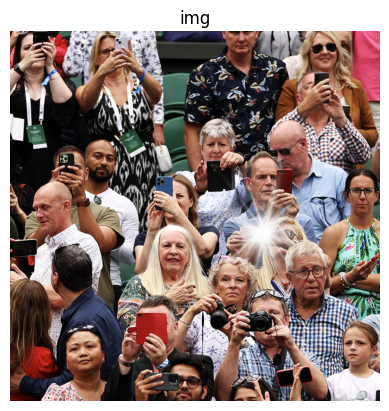

In [73]:
# @title Default title text
from PIL import Image
import io
import base64
import matplotlib.pyplot as plt
import numpy as np

#  BASE64 STRING IN TRIPLE "
base64_image = """/9j/4QAYRXhpZgAASUkqAAgAAAAAAAAAAAAAAP/sABFEdWNreQABAAQAAAA8AAD/4QNNaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wLwA8P3hwYWNrZXQgYmVnaW49Iu+7vyIgaWQ9Ilc1TTBNcENlaGlIenJlU3pOVGN6a2M5ZCI/PiA8eDp4bXBtZXRhIHhtbG5zOng9ImFkb2JlOm5zOm1ldGEvIiB4OnhtcHRrPSJBZG9iZSBYTVAgQ29yZSA5LjEtYzAwMSA3OS4xNDYyODk5Nzc3LCAyMDIzLzA2LzI1LTIzOjU3OjE0ICAgICAgICAiPiA8cmRmOlJERiB4bWxuczpyZGY9Imh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyMiPiA8cmRmOkRlc2NyaXB0aW9uIHJkZjphYm91dD0iIiB4bWxuczp4bXA9Imh0dHA6Ly9ucy5hZG9iZS5jb20veGFwLzEuMC8iIHhtbG5zOnhtcE1NPSJodHRwOi8vbnMuYWRvYmUuY29tL3hhcC8xLjAvbW0vIiB4bWxuczpzdFJlZj0iaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wL3NUeXBlL1Jlc291cmNlUmVmIyIgeG1wOkNyZWF0b3JUb29sPSJBZG9iZSBQaG90b3Nob3AgMjUuMiAoMjAyMzEwMTgubS4yMzY4IDk3YjhjZjEpICAoTWFjaW50b3NoKSIgeG1wTU06SW5zdGFuY2VJRD0ieG1wLmlpZDpEOEZBRkRDQTZGNUQxMUVFOTVFQ0I4MDI2NzRGNUZGQyIgeG1wTU06RG9jdW1lbnRJRD0ieG1wLmRpZDpEOEZBRkRDQjZGNUQxMUVFOTVFQ0I4MDI2NzRGNUZGQyI+IDx4bXBNTTpEZXJpdmVkRnJvbSBzdFJlZjppbnN0YW5jZUlEPSJ4bXAuaWlkOkQ4RkFGREM4NkY1RDExRUU5NUVDQjgwMjY3NEY1RkZDIiBzdFJlZjpkb2N1bWVudElEPSJ4bXAuZGlkOkQ4RkFGREM5NkY1RDExRUU5NUVDQjgwMjY3NEY1RkZDIi8+IDwvcmRmOkRlc2NyaXB0aW9uPiA8L3JkZjpSREY+IDwveDp4bXBtZXRhPiA8P3hwYWNrZXQgZW5kPSJyIj8+/+4ADkFkb2JlAGTAAAAAAf/bAIQABgQEBAUEBgUFBgkGBQYJCwgGBggLDAoKCwoKDBAMDAwMDAwQDA4PEA8ODBMTFBQTExwbGxscHx8fHx8fHx8fHwEHBwcNDA0YEBAYGhURFRofHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8fHx8f/8AAEQgDMAMwAwERAAIRAQMRAf/EALcAAAICAwEBAQAAAAAAAAAAAAUGBAcCAwgBAAkBAAIDAQEBAAAAAAAAAAAAAAIDAAEEBQYHEAACAQMDAgQEAwUGBAQDAREBAgMRBAUAIRIxBkFREwdhcSIUgTJCkaFSIxWxwWJyMwjRgiQW4ZJDU6I0F/GyY3ODJfDCk0RUZDUmGKOzNhEAAgICAgIBBAICAQIHAQADAAERAiEDMRJBBFFhIhMFcTKBFEKRI/ChsdFSYjMVwfEG/9oADAMBAAIRAxEAPwBR9jMSLruafP37n7axX042H8b9aa5d2sI7iq1LOjryeeW1ZrC2AqtI6Lyb4bnUn4EpfJXPellLf9u3mC7p7ktcbe3bxlWklKLJGDVLd2FOCtTizAaPW7TkrYqxjgj2mUw2Iwv9LjbF9v40KUe2++glicUoX9SIs78viK66FcIw2K/h7x7exFouM7HM91lZzImRyt2K2Qqx4vbQnclQaAkU0t2gKlZYtf8A0yzEt36kiyXck31vMTy5M29a6X+Qf+AB5S7ynaWX9CO2+3vPTPCSZalamnJQdq6brcmbeowDH777w58jk5Cx3rtpkiDI+4fefjlZafMavsSD4e4XeVOP9UlIPUGlNTsyoId9mLnIN9zcqgmACOyKF5fE08dBZB1wQ/Xr01UBSfes2qgkj12HjJhE936Rap2NNtWrITt07L4rVv8AwNpcgkHYjqDtvo5kwWo6uGoZ9zrsNz8NRsEm4jD3eUytpYRoQbmVYz58SfqI/DQSFrrLOlc5jcdBjrDCtDILO3VD9CFweFNj5aclCOogjaXPbWLVLKz9O2jKF14ABSPGtPH4aYqsBsUs5gMxmcs/cP8AU5jjLWB47TAvCFSR6GruxPJg3gKavhkQqdze1HcncmIs2s5rDEXcUqTx3VnG8EjQEfVDIqniWHx0u6ngJMbsS9tgLmGHKzzC4uYxbxyXHAs5jFduHWvx30T4BQwXtp9/HAN/s23lj/KWHhXUTgjUmq+xdnNaG1eFPQUbJQUA1TyEiHjBko7eS1MnqwLtC/6uHkSfLWbZvawhlaSacjicbChefnJMwqIIyST86ayWs/LGplNe41vlInEllbNbIWHpijg1/wAXgdDVjak/237vvWYY7KWxfg1Hm4g/26pqCWRaYgwc6E2UH8wipCfQ37G2OjpsjgU03yCnfJreGW1vOcMSlJ7GRGhmRT1JIqGBHwI1u071bDE21wG/b2/x9xYyQWuVE8GOka3+1ZSro1ekjNux+On/AMC2NK39uuRks9leGMTTs2wVWNAf3aqCiQzreIVVOVuw3kbx/wAo1UEB3cZvUxjx2cwaYRkBXiaQnbapUrT56osoexXv/IZq5tUlu7u0tH5V5ExowNeK8z9VPLTMAl8YSa4fG28k7yNOg4v6gAPyYCm+gCM7+1M/JW+lWH0+O58dWiGnFYyDHxusJI5Gr79T5/PVtgwR89YQ3d1aNLuLdi4U+LUpqSXBnO1lf29zi5WAdo6PGfFXBFaaFqUEnDk5LzmJuv601iqmSS3keI+f0MRX9muZrrFoN3t7V+OSa+Pvbe2ZzEVWMeNPDW+Tzkyys8hKbrISO3gSBXWrXU30UIlWqoijfbWqqLJIo3QDRkMhbqw6aKCGf2ijpqdSH3oU6nVwQ84qp/4aqCHzTRqNyBoSyHNloYzswJ0FrpEMoMnzNSu2orySCWLtuJKGisKEHVJeSSD5JVDnkfnoiSeSXCgArSnw1UlHqTKd9WiHpuVrQakkN0chYeWrRBl7VjlyOPyVhDvcBA8SnblQ9Ncn9kuGdv8AU3iUOHbPOzwywSKyXNSJY3HEqfiNcl8HR2V+4F9ydg3GUjN3as3Ibsh3XV0vBn260xCyvYNzZgCd2DONjQ0GtFNxkv631BE3bcicRCSSOrDx03vIr8EFl+2nalxPj5fXUhgSFLDwI1l2Wyb9NYrkVu7ez7qDLTySIfS5UQgbaZS+BO7TLk8wnbdp6wZbaR3YUNQSororbGBTRWeCwsJ7VY6RlueBEYFTH0FeukWu2N6JE/N40m1bE2qczIOCR9N/x0pGvXHImd4qLQ4/FQn61jpISd+daGutGtQI9zYOPYXbVhhVgyNxGs99KAwc70HkPLW3XrXLONs2NlyY3KrcQBlIB8hpwg2z5cwKTXwP79REKW9lL1b73V7xyHKpkncD5K3GugXJZfCuDvXREPraUpegg701CEi/vIFubZ34l1cEGgr1GrZClf8AcmseO9yOyu4InZW5yWk7DyDK8Y/+M6G5C7bejQpLWvqIr186iurIeTTIilzsBvXUKKL9/O2v6nj/APuSxuADaKqXduejxh6Aj/FGxr8tDaslorLtSzlvkHJwsQP5h11mvaDZo1tlp9iduK2bj9NecEP1SmnjpVK9rIfuapUuHIZyKztwkP8AqkURfIeZ1r27OqOfSnZleZiRcrM8cshKJVpX8vgPnrm2u2zbSsCImAfuPLi3slaOxhcc5P4qHfV/kHrV5Ybv+w8jhsgl/jpd1H5SNj89Vaz8h111Ycw/fckUgts3bGA+FzGKp+I8NB3Kt6z8Dlj3t5mN/jZlDkfzGjpR1/xqOur+qM1qxhkXLWQR/wCo2g4V/wDmIh/90ugsvKJV+GbLLIi6i9MnjKvUeerpeS8pmwzJE4Qilf7dNRoq5RhJkI0+mgr4HV9i4I8mSjkib1FUr0YbV0LsTqBHjt47e5jgH8iSsiD+FgN6autsQLsoaZRfuTcst+iK1GcH8d9Mrk663PokO/bZKYm3TxCL+2mnU4PQUWEFWkPHfRhBTDXizI1u5+sdK6Zrc4M+2sZPbhAJSjeHXUfIyrwaTax/mBNfLVQTsQrqFZHCnanjobItGoRXtkXeNwYh+pQwqPjUU0tVtV/QuU0S+zsJN2/gba3dF+6ZzcTqOm++/wCGufJ5X2bVd3HARz3uvbQWciWcg9WIFVVQdyB8NOrLMjqkcxd89z3XcvcEl5cHkwHphT0oDrdqp1Rz9+zsyHh8NNfXaQQRc5WIAoK00VrpIClOzg6Z9qPaS3s4I7zJJylNCqt/eNZHfszeqqqwXJBisbCgWOJFA+A1aSBbZyx/uwFonuJjYYRw4Y2P1aD+KV9/2a0ajL7Hgp/LDGfcg431BbcV+mVgz8gByNQAKFug01IzELUIfahB+9qvb/G96HLWt1kzj7m0g9ayj4BhNJ4K9SKL8tJ2Xa4Nfr6lZSyEvZOYuYp47GzDz27mOePmocMpowAYitNKW3OToL9dey+xHmP7Dztrl4UzeOns4KeopmSkcgH8LD6W/A6m7clXA39Z+qtbfGxfbUfFuIYoVSNAXH5EOygDwAGub2Z71VrVQkQMh3LBC9ZIfVmpQszBU/AVGup6z+3J81//AOmon7OPgC3HemSaoiMMI8KNX9yjWifhHn1pQ4eys3deW70SfHD75rNC8kS1jADbfnbauiq85NOnWllHXNxPwxkbXMhsp5UHKN6NIG8VHUNpg4Qsl2j3C0SXuMvEtMk83K4edeaPbk/kZFoK+O2mVvALrI6yNPY40XEhF00MfKUA8A9B+kHQyQgYHuyyyTTC4hewuIN3tp6B+JFVYAeDDpo3QFWFvMxZPPZ+4GCvreK4tvSmd7iMzIvhwA2oxXxGheA0Hr+9v4LU209ygubkBYnjiZirU3O1RT56tJMpg/JZLIyTJZCE29ugUGQsC0reNKdB89Z/Zv1QzXWWSJr2HHwM0sgUIvKR+gA/8Nc12g0JSc5e5Pv3c3uRmscFPMLWImMvA3ph2HiWH1H8NMrrbyySkAu2v+4e4rqG4b7mQKekjuy1613OpaEP10fJL7msu+MTevPamVBIal021SdfIdtdvBpxnu37iYWVI7tTdQA7Ruv1H4A9a6F0q+GLdLLlHRGFGZ7m7dtcnNirzG5RQHtmKVYeNHofyt5HRLTf/Il3qhxsLuBLFRmLH7K6daSKY6ByPJh110NLtGeTLfnAOlurS6iYXyqeLERIpanAdAxrU61C8hq0z2NgxiuZEiCDdQS3EfFfLS+rbLmDfY5vGZOJhFKrRPTiFNanxG3hqrUaIrSb7PF2tvA8cCheTs/0inXQhG4IrIyEUkA6+YGoQH34yElmTYsguYjyWOQckcfwmlCPw1ZTAdp3XZFhbZKWKxy9aNYGQE18OJNOQPhq4KJ+Z/qkqA4z7drmlP8AqOXp7/FDXVFiLg7/ACmP7gCZG1GSuWZ4nuceXeGEMeRBEm4HLV4ZZz/7idwZDE9/5ZbaVYXS4L8XB5EOAwrsdZnRq7aJtt2rAu3nf/cE8DRyXSMG/SARX9w0xWsZFpUi/BMZJCzbsxqT8TrXrZogLRARoCd/lrSkUSYJIXIAO58Do1BZOCpEu/7dHAJolvreIEs2w1TaRAbPmw7cYxt56U9y8EgiXGaKKd99DbckQFyZC6uX4g0Xz1me21uA4N9ukEZqx9R/PR0rVc5ZUkh76lAtBorX+CHwyTIPjoVsghDnvXclq9dVa7ZEj23umYFSdVS5Gb/XI8dN7FGyOQtq0yEiKYqaHRJkGz27vYbfuuBbhh6EylWWtAT4aye7SaHQ/XWi8Fj5mSkxmJ5O53YGpoOlflrh2O7Yk4buaG1iaOWhB2KtpcwLdJPshc4DKBhHKUk/9thq5J0YPTt/E2i/dTFXk6jwG+i7A9cjP2qqG3kKAcCagqNv3alQrIi52OyS59G+4mGcinKnXUeCRgHr29jcfJ9xas8kB3EanUbBopJE3eixw+hDG0SDavQ6HsF+NeQNbZaB8os1zMIUJosh8DqVWS0wBn7H+ud4vcwShraJEV5R0LjqRrXrq7PBzPc2JMdLaaFIEiWTaNQB57a3JHNkZMBdSxoST9B3GoCbu4sgy4yaRW4sqk18qashQnsb3K9h7lXEcj8Y8hJIrV/iZjTQLks6oiudqHr56Mo8kuCs6FTvqBI8vIw8fqNUzdU+GoQq7/clHLcdix39QbjH3cFwjeIoSux/5tDYEsT257qhzvY2KyHMNJ6QimANaMgpvqSWa+788ba2ECV9S4PAU/xbV/DUbIisPcOO4yHbD2UcjIzD+ZuaEEbg/iNS3EFoq/s63y1s8tsY2VY2/wBQ7J+07az3rPBr03hZL89ts7jbTGzLG4luhvKev/5jRUjXWWBts7s25rLSRxz38h/mS7Rp4AeAGufs2OzkfrpCgWYslK2PljU0nn2Pju2lSaaUyN/adjb4yzUBaOwBY/E6OigZfIcuWS4QgjTHkBYF/J4m3kVgVB23FNKdBtbQLFMxgLj7vGyFR1eI7o34aDKG2rW6yO/ave2MzqtDMv2+QjX+dbnbmPFk86abWyZzt2l0f0N+TxrWcq3VueUJPIMNLvSMoGtpwzIXMVzFVuo8fEaZW0l1cMgXVuqKZDJXgdqeeraNdXIoZjMX9tebQlYGNC3x0tjYJGAyTXV76R3R9ip+Oj1rJn38FM+50bJ3HDBWvGVl/AHWiqiRuu0uqLAwbf8ARxDyUaZXg9fXgIyPQaIsixXj204kU0IOqTgpoaVKZW0FxbEfcoPrTxPy0/8AspXJmVujh/1Bj3Myt6bqVPQ166XJogxnkq6Km7nw1LMiRiVu0MvOHgjKQWqDUaXNpJiA/lHHFgWCBhRVXqQPD4awHjZKh9xM2LG0mtLdY1aQEO6qOQr4DWvVSTPu2QimBX1Sx6+etpzVyX17E9r280f9SnWpqPTB8fjrFutLg6OmsVk6JtI3SNUUUB0CCCkIIABP4aNFHJH+6st/9UIxSgGNgp/531p1GX2fBTumGY8BHSurKPua+Y1RBt9tcw2M7gS4jfifyso8QfhrP7CwdL9e4s18nRP/AGjDl0TPYMBpLll/qkPMRhSB/rV/t1iVZyj0Xpe5XU3W/wDgW/cbuWeWeDCxmlpYAc1WT1keX+NW+Wh37Hwdn0tKU7PNvpAl3Dfr6EaQjdc0x4LByc8vfx/czEUW1OykjbkdaK77KsScvZ+o0bNn5bqWL2VwFm5NxbKYAT9cKk8RXxWutPr7nbDPPfuf1Wulfya1H0Lw/wBrGKWzXL3MIZrmVo0PD8yoOpr4a205PO1SVS9bubK412la4F1ACWEUyhmp5K2mNAmtO7cDc2f31xE0diB/MuFP0J5+qvVaaso2YHMYLPxXCWdxDe41G4IytzRiOoqNWQ3S9k9unNf170GN6sXokBz6JQbgFOm2pLKFvvPNXnbuNlvcXAJp13FmIWYS18OabqfjqFkTsr3B/rPow3tu9nkAgeaMxsy0O1eY8PCuoQ15zNwLlZXWgNeEY61YbV1zPZ2zb+DVrpgrX3l7mubbtm6hhlKPKFhFNjVvzaRTNhyrgp7sPtK3u7pGnXkCa79NM3bXwafX0KJZ0N29j8fjoFS3VQKeA0lDrBS5hhuouMiA/EjUBTgT8v2zY/dwzcAvpuHBAHUHbV619yDu5qwZ3l3F73XHfGIgw97PbduwCLiIGEUHEH+a1zSnLbz12/ODgOpZ1h3fhs7JcRY/NQZR7RgJ4IZOfpHodj4V8Ro4BJZoNSSwXlO7X7dkSeJVYzBo3DLUEEfHSPYu61k1+rqV3DGnsEPlLEZuH04vuarLEiALyU0Jpq9V5ohPs1i7Qa7mnz9hi5ZsLbR3GSQco4ZGIRqdRUaNQxLEjuP3Nydq2CtLyNMPPfTcMk8rCkcYWpIJ8ztq9tIUorXZN5G2STFZS3a0guGltJ04evCzKaMPzJIKGvxGhgJiRJ2OjZSxJyDSxYUuIJbuMT3MssnizNTkF0TKHG0mt7qKa1mmEsgHpzFBw6jfYdNUWaLPGYrt91MMiWeOVWVkNd3kPVmNevx1EQ5T/wBwHbTR+5F1Pbsxiu4Y5gak77r/AHaVseQGitThLxPqoWp4V0KZEb7S2uFarRkAa1Uugggsl3zoE+noCdaFtQMBBfTt4TLIvOTwUab+SqUtlQCL3L3rseMbgeG2k29leC+oLklu5Wq4anyOkPa7FwYPNKi0VGHxodU9kcEgjETM1WVv2HS5kszVmXYKR+GiVvgqDL1mA8R+Gr/IQ8FxQ+Oq7kg8a531O5DB5j8f2arsQxWcjzGorQXBsFwfj+/RfkKgzFw/gT+/U7kg3RXLj8xOjVyQEknYxpPG5WSI1DDqNNaVql1s05Q6dm5q8v57iG6lMrMlVLeY1yvb9etFKOx6vuX2OLDJLaTMwKDf4657OgmSraf7QVZVL/Hw1UDEwL3L3GZXW3jZizEeoB0p46OtRV7pYDeL9zcNjo/RtyFCgKymvUDfR9WR7Kvlg7uTvi2z0TwQJyuYeLxOtfpoa6jqV3Xgyxvc91LaCNpSj9KaW6tBVumTkD3cfN2DHQkswH3RbTNax8PpiV6u3SlBrRop2Zi9u7rXBA7ezAVJ1U0AYKp89dGq+DjNuRowxuru4XixKk76sosW2AhhVOhA3OrKBHdGQ9PEXNd14Hb8NQuCjvb/ALH7hy+SXO4xlSG2uQXqSrcS3VflpanwRI6gtLyYRqkhq4AqfjTTCEz7ukil+vhqFoJG9RIQ7gEtsv46hGV17025vfb3KRKvIqgdR8VYEf2aF8FGj2SxmRwvZMMV44/6giaIA1AUjVV4IE8pdpfZsHlVIFKmvSuxrq/JaIeesTLaubW6MNyo+ggAgkE9Qa1Hnq2QpDI5LuGLNLY3UbGZ2CLFGNqMdiD5aXa2C0s4OgO0u17TFYuK2ryupVEt3L41O4U6597SzXVQDe9WaSRUTdI96DppLH6xdxM4/qcMDGtNyDoGaqItbHLEwWu+3TTagNhKU26psPhpgGSJKLdqGgOqgJSQrzHRXMRCLU+WgtUtXgrvuPA3+PnF/jwYru3bnGyneo8D89KaaNCsrKGPHa3c65jDQzPQGQcZY/4ZBswp89MTObsp1Z7LW0lkof5cgLJ8x10EQyJyJOW9zcJjsg1newPI9OSFTsfDTVVs1Vsl5I0vd2NytuyRxvCr7oH3H7dC0xqYPwGaihvmYn/RqK/Hw02lTPtc4EDv26F13VFJ/Eef4k6auB3rr7kP+EcG3QDrQaKjwewrwFJNxXroywfdDjv5aFlEnCZWSzuVYEgVoRXRUvAu9U0ObxWuUg9VQBN408daWlZGatnrcf8AEX7mzmguOhr4eekNQzYrJo0W8180k0cqMsfT6qfgRpVbWbchNVjBB727oscXJLFbSepKKqxJ3B1mpU8Q7FId0ZWW95O5/NvrbqRi9h4FyD6nA89NMqOpfZqKmBtyBQeBGsF+TqUX2lm3venbOLT07m9T1E/MsYLkH48QdWmidGxd/wDrF2dNe/b2+RDy9OLKUA/E6thKok95+yfdXud3ie4ZLuDEYBLeK3iu5v5s0gQkkpCtNvq6sRp2u+DPv1ptZN49ivZXtZEfNXdxmJx+f7iX0k/5Y4qH9pOpfZ9S9WheF/1F/vq59gcd25eWdngbeS/kjZbSWF3EwlP5WBBJ2+OqrZvgdfVVKbR/BP7J95PbKLF460mwFlBcWcSI5NmpbmgALepwNSTvU6pyuUXRVtmrgerTu32V7qmZclisdNMTQP6UaSAj/GvFxpfZeSPXsWUxnw/a/aGKDXPb2Tks4HB/6OWT14DX9IDVYft1OlVlMF7rvFlJRPf39Gx/clxaXGPaCUn1IyjFI2V99vx8tZL1PZ+j7Vb61LyKl/fwvLwVfSXb6SKf26XBr27lMEua2vIrKMslEkFUpuR8x4ag1pwCMpFdWtpG9GAkP+odvw1q9Vfced/fO1dEfJb3+228ybJkreIrHHMwLzueNSP0qabmmutqSyeKL47gW2uu3biGVoqtEY2ErFRU/SPy/V10ayUzk+RO6GmvLGwhuprP1TBcwWpkeAlDQ71Na6tWgrqWWXk9ruyLDL28iQ3N64L2jGsblhXg8Zoyn/EOh8NVwWWF2V7mQ94dvve423kjlt2C3sLV+k9SFbo22oUCu+/dTHYaF44rCae8C/yS68QpI2LA/wB2rSJIm+2ve+WlS7+8SNnq/G4X6pFD78aeC6DbfqpDouzMri/Nx3AiA7RLzb9tdcSzlnQSwIPubefdxxQn6iZizV/Zq9byNrUx7QsJIVUgUB0NnLNtVCLVxFq7RdaNttqIXZhpIeiHr89HAuQdnLdUtnJ/NUU/boqf2RLPDJlzbpc4qSylSQrPC0RKED6XWh/HXbXBxmsiR7Z+1Fr2dk7q/S6kuJJwY41dQgSOtaGn5j8dDVZJBZBYEbHRkgRPcxX4WHE8Q8pXkR5rrN7f9DX6bi47+0maS27XksZ1f7uFneIpvzFKhVGlepaVBXvV+6R9xPdFvkcfFKicrlo/UktTT1U/zL4HWrqYRT7p9vu2O7bdru/9Sa9pWHmfpidTVfp+fXTHslR4AVIchKwMKdvwJBGsL2q8TGgpTjswp8CNLDB93mbeKC+ywUF7aJiittV+NemiIJXtz3WMxFBbY6stzKzXGUuDsELNXhv4+GgrwEyy8hZSXlhLaxvw9UcWYgHYjfrXVso5o94L+TG92RWTwrOIbVY0lbckKxFPw0u/JQjf1slt7WOnlx/8dCQz/rUHjZx/s/8AHUIfDMW3jaJ8wD/x1CHrZWyPW0X9+pJDW2Rxx/8A2NfxrqSQxN5iyf8A5Vf2nVyQyE2GJ+q2A+THVSQxZsIelt+8/wDDUkhiHwfjbfvP/DUZJPGfB02ta/j/AOGooJJiRg2G9oR+P/hqYIffb4Bv/wBnI+Tf+Gpgh4bXB12t9vLl/wCGpgh4YcH4Wx/83/hqEPft8FT/AET+3/w1JRD4Q4Qf+iafP/w1coh76eEr/on/AM3/AIaqSG5EwhWnpsB5ch/w0SsQnYWbE2t8pgqkjfSCSKb6VuzU0erfrdDi0qfbLLy38vlrnNHeTAV/lDJIUVSGHVvD8NEkR3NWOsrZCZJ3Bkf+LfVyAgVn+3I+YuLSOrOfrpto63F31TwE8RaWtjbrI4EdR9ZNK6jYVVBquZbSSblZsGJ/NxOhaKdvgMYu+UUhYkMdA0ErADvnPSRhrKM0jNCx+Wtnr1hHM93ZLgCdvNyg5V6tXWlGEt3sm0LIrkaJEHC9KxIAOp1ZQrdzycsXOviUP9moWafaeS2xWBWMrx9aR2r8OW2hrwQsiGa1kAdaVp0/DVlEHIXxN1EiGlD1+GrQVUZ3ObjkvobNDWlCdRkIfeLRS9v3sUjBUaNgSdvDQtYIR8Jf21r2VYShx9Fsq1+KimrXBQvY27ctJNM31SsSd/mNUggms0bKWQ1by/YdQhFXFY67vob2eJfVtjyR6b6z73gbrWRgiyxAY8tj9UjfDwGuc2auoOycscls7PsX3Zvh5aoOot9p2cF1l7m8ubhLe2gbeSRgo2+eqSk1T1Qbz3vL2hh1MGPvIpZ1+kuAXG34jWmut+EZLb6+RWt/fqCe+aO8ycaWuxRo7cjlXqpJLU0VtV44Br7NZHmLuqxvMb95bTkxkApzYCvkRQdNZ22ba5yVD3t7xT/evaWbXH8rZuMnFQ3iNuutOrS2pZi3+yk4Qu2Xu/mbeTkY+YJ3Dkt/bpr9epnXtWGn2491Im7iaxvoUtIckw9OaM0jWXwLKeldZtvr9VKG19h3cMu65mD25Vvzx1I0iQ1yc8d/Xdge5ZIpSY5EFAw6bknWvSn1LvdJ5IGG7skx8slpcx+vbt+V1O4HmNFbWmEtsYDeIvEnlHouGEpqD56BqAU8gbuYMc/HyBHADrq1wbtH9kWB2/Jyt4/loqHrNblB8VK6YEyPPGKbiuqZAVMfTfptoG4KDWCzht5FUt9HiPLTdd4AvRNDk6WeRtwz7EjZ11paVjInajxwC3wBifkJ2dRv/wDnvpX4o8miu6fBR+ehymZy8Npaq1xd3LiOKJBVmYny1krhHkFR2tAJ9ysLjcJPaY21SZbyKH/8pGdgSZ67hVA+mnlp2lyV+09dauqTmRQx6GW7iiXq7BR+J063By6KWdQ2xmwnaVvBCfSpGBJINiARvrmvLOxVIQ8h7sm1V8dhrIXDICZXArTzLHT6aWxW32FULe0Pbo7ryVx3N3BaxQ4bHNSJAKfcXI3Cn/CnjqtiSwVTY7KYGbvHv/J4v7y4trlobGFSRGB9HwA0lS3CNHSqrNjnrLd1d0dz5AqGmuJpSeFtAGkc/gtTrbXVWqycy/sXvivBZPsh7Z9wDPTZjKRpi7q2SmOtMrA//UyMPDlTgF/ipob2TwjR62t1+6xZF/7y5Ltm9ON7i7SOOlrvIYleKQdOccqji66TafoaHrq+Gw9Yd/e03dEEkOQxlmjXK8ZiI0jc/wD4xQGH7dSavlC3r2V4YJy2F7fw01rke2rq4bEFxHd288plRCT9JRmq1K7U0uyS4HUta2Lcnvf2Px+as7S8ktzMAPRYrSqnqG0N0mdr9HZTajFF+34HCVccowAryRo7gDoOW2g/HJ6aV8Au6scvZzloW+6jbqBTlTyptpbq0XLIi9sf9xXtva+tJbPPIsSpL4MxpVeXlpmi7VsHM/a+rTbqbvMI6OwfZOF7MwNrY2EaTmIfzBIwLzysNzXpU67mtRg+b3a8ELvBZpsRJlLa3lFxYAOsKGjk+MbAn6gaft0bUAI3e319ksnj4Xu8T/TYpeUjKVBZ2J+rmduLA9ajQ4CbFf3Y7Ui75uf6VZp/T8pi/wCYguQwExeioY3HJeBHU77impZSikw52bFiezMD/wBuLOl3kbcE5JoOiyMNw3lo6a3EgWupg8i7LxPcf2jXUfOzSXk8KmlVG45MNzqmy4M++8XgsLaRCxsobaaQEc41CsVXbcjWP23FTT66llT4m6f+uZB3PLilFOuUzckJvdU/qZhI+v6qdfHV14NFEPHalozWyEgAU2JIA0KyaLYD8+cwuKb/AKjKxRSgf6YPKv7NMVGJdkQh3XJcTJcWLtc24rzdBUL+zQtMYqqCG3uJib2dcc/qtfyP6cbAjirV8dO1a3KbM+yyUpFoxgrFH/lFf2a7JyUiJlO4LPCWv9Ru4DcQRsA6KCaVPU/DSd1mlJo06+zglpmO3syRdYeQKsihpIOiqx/h+egXtVWCn61lyJnufZyyWlmlCrpMG4mvlq/ZsnTAfqV+8m+3C/cz3FrIxBEVbVUBP80eLU6D46y+m/uY33lgtTB4y7xlq/8AU5bU3PqE/e2w4c4zuDIp3qPHfXR5OVJoucjBCWu5mEMEkpgPE1q36XAHg2pBcid3B3tiMBbzzX1x6DBi4hP5mUmhbj1I31IIA8vh0zmFS/Ms0sdwp+0tlYotX/Ixp1p4abrcCrrAT7H9t4e1ceLizmePIuOVypJaKUnejIf7RoLPOA6oaslnY4cJJdW5dLniyiNEMrpKOqlQPDQ4Cg5k9z/61cyY/JZGI/zzMkc3HiGoQxFOopXodLuUIwB8qHQEPtQh6NUQ91CHhrqyHlNQh6B576oh5Q+GrIegeZ1CHoGoQ9+GqIeA01CHvKvXUIeHbbUIfEjVkPtUQ831CGJNNz4eOrRAFlMsTMscDEcWBLDz0TUIuvJY1pkJlto7eR6mSJJEY+NRvrnXWTuUcI3rEgtXmkIDNsgOgGzgjW3aU0wa7u7hzFSqRISu3z1f5EVXX5YGvpsbHPwW5vYSh4lefMaZVlWanyT8DDiLt/Ra3muC3WSRm/s1VmFVJhe47TtcdMlxYIy1P1oTt+/S+7YL1pcGjOXC4y2e8AqUWvEeeiopYGy3VSItxfXGWo8x+rq2uiqpI4l7uzlhPCRBWRF6A9NWgS6e0j6FmrHy0wgTubsSuTWuqIA+4QWxc7D9Kn+zUIBe2L1UwdudzTkafjqlwWHcZncj9wqRoWSvT4aosKZPJMk4Y7MF6fHRERq7YMlxkWuX3C9K6jLZO75jeXtXIhRVvReg/wCU6oASsRlRN7e422Rqyc/SlFdwCK/26rwWgjFEzW44GhA1aCPsJBfS5FYSCBX6vLS72gKqka721EduzBeI6V1h22lGmiyCUDkhSaRk1k+PkNZTQDu4smixGMNx8CDtudgNWXRZKs9wJu5MHew4+6RraK5gFyiEhldHJAYFSR4a2evRcifb2OYTwV85LMSepNT89a0c+TErXbz1ZR017G9u2V72XLb3qCWQ8gC2/FWHQa514dmdnVNaIoHvbBy4buO/s2qUSZwjHyrtX8Na9N5Rz/a1xZvwAQP36cZyfjJp7LI2tzEB60MqyRh1DKSpqKqdiNBdSg6cnT3a3dL9xWByE6RxTs3C4ii2RWApUDyOuVasM6DWBe749qjnZfu8bQXqD64G29Rf4kPmNaNWx1wDaqtyVVle3LnDS8LtGjlSoKuCDX8dOVpL/HCMO1p3jvYo5EKP6leXSqnwpqbOAKchLuZq5/4UXQ14Ono5HDtmT+Wg67auvJ6bS/tGtKFfhpg08ZK70qdQhBu7RXBoKHQtFgswSo+3noIKgOYTPTWjCOUkxn8aadTZAF6Jjfb5C3uowUYVPUa0K0mZ62ivfazt+LJdwy5CWL1ft0b0EM3oDn4Et11zllwcn1dXWn5Hj/ElTe6LzHu3JpMavFJxNH9T4/n/AFdeutOhYOX+52K27HCQA7UhM/cNhF15ToPw5DTNnBzdH9kdkL2zjsxjRY3UjJGyhWCbEinnrnSdN2giD2V7Is4GaK24IdmZa8yPn8dO7NIUssZR2VbXeIgx1iDjcfbLxhihUCnmT5k+Oktdg+6qLua9m+zrqKNO4Lu5vLeJw5t1cQq5Hg5QVp8joqrqS+3uogxusx2B2VjSmDsrXGcB+aJVV2p/HIfqb8Tom5KpV/4Kn7599cfeyW01nO7X9o3JJY6lflv1rolqsyf7FKeZH/sj3Y7W9wsM2H7ntBMacBGx4sp8HRuoPxGreMWKWfuoKua9ohgspcXmOyP32HdeUJCcriFvBJOOzD/FpdzVqvKh8h7sfuAxRXeHv8ct1bX8Qi9a5A5Qk1DmNB4+NevTRVul9RGzXZuZiBtyUFlju1L+An1YreMSRlzVjwp4+elRg2/r9rW+rK6TuaxNP5IauhW1fB7brPk2m+x12oVomQ9aoaEanZMvq15GX21wZvO9bK+hPrxY2sshnX8vIUFD4nTtFJumcX97vVfXdXzYtjuzHpewXBvXYWsJ9WO2tiUkkI3ALijbnwGuqmfPyFipobG1iF+Ugllj9Q2zmrAKKkCv5qDRNyUSsB3JZ3gSSxxV1Lb3kjEyyUj2GxkCk9Dqdccgtg/3P7QucvZwXeOyjYQ2BaWWdKbpTdKfHz0MwWin7DG5rt3tDLZm3a4vZ7u55iST/VkiJo0jBtz/AMNM1bW00yr0Sc+Rr9me9Dd/9LMrqWJYE/lAPh56l6wVVyS/dHLtLmGt2TgIY1CgmtQxqTrl+45cG/1q4krDA3CmfKzHwbiDrBdGqoh9xX8p7qWCJaeoAPUO4Hy0/XrXWWX+Rq0I23/cj2a+jJLLPIRRYAxp+NNHSoW28C61xlL6Qs0DJHXYU6/t1ohJGRNt8Dl7e9q95dwZe5w+KyxxFqIPVupDUinQAKPE6S7L4HKtvnA8djezydu5WTMd5ubyGxmP2SRMQs3iJn8RT+HQ22/4DrT4css699y+0bNCRw4/+mlByoBq/wA5a9awrf8A1J7Wy+RNlkVe0xtwDHLPHxJAO1SDUU0VNz4fAVvXaUrkXslh/wDtrKG97ZvxksUKNyj2p47L/aNVt0eal6t3bF1DGuDurt7ufGrFmaiVaejcIeLI9KAin9h0jviGR63Vyj7sq3vsH3HDLLy9N6jktBzjbofLRaLRdFe1F6DlDe4jvS1yNna3NxjL6xmMUsirR/p6sFb9/wC7XYqziAix7fixk13cwXksoagWGZuaEjbkleny0dskRT3uxf3Ob7mtEuX/APyfDIhkqoBrsGAI3ppdkQuztr+n5K0htrK45W9qqAFBsKAECvno+CQMNzeovNYXq6UU/M6ohn9o81t6KsImcfzpFG51RZVXvx24I/b6C5iWgxd8knx9KcGNt/8ANTQX4KOea76WQ88dQh6PjqiHtNWQ+4nw1RD6m+oQ8pqEPqahD2mrIegaoh9TUIY8dQh9x1CH3HUIfU1ZD7UIfUB6nUIQMvK0VsVU0Z9gRoqopiwttPJcCFFLSMdh89VZxyMpVtwi1p8fKMPZBwUuYIlVh47a53bJ33r+xAhszeQFVkTmi+ej6pmd3aHjAd1YqW3RbmnDoynrpLo0aqbE0Sr/ALj7atmb7WzidvEuqk6tIZ3S5M7HvXDmImW2hR1/LxUCmrhgu1X5AfdfdyzxCOwoXY0Wnhq61M+zZ4Qr9zT3EXbZM7VnndVA/Guma19wnc2qZN8Xaf3XZzdxWHrtJYAG/iZKxhKgMVZfIGu+tVLNuPBzNlV/kj4Pj68ZBqDQjTYEyWbZ5VY7ZUBptoyyRaXjPLyrUHqNUQ25aJ7jGXMSdXQ8fxGrfBYE7FsbiTEQxXCgMvMb9fpNNAuCD9i8dFbxFlAJ86atEYs5yR5MkUXrUj9+iLqNGAtftrQE/nYb6opm7N2bXuNuLYtxEkbKT8xTVEKN7GW4ie9sJnLNaSshHhVTSv7NClJaHyzvPS+h/DYfv0ckgaO2bi3mnKg0brWnhrNuY/WHO41jSxWmwJ8PhrDsY+gn3d5HDCZHIVRuAf79KSkcVrlO5kyeZNtGedtGdz5nTnSEXrt90Az3Dxs8Qssm3OWzaP0aliwjNagb14g6Z61vAHua/KEWb0mXkux1tOcxo7O7MkyLre3CkWce/wDmPkNZ922MI2et6ztl8HS3tlBa4y3KKDFEyiqPt+I1mpyb9lcQhW92uy+3crlFuJZBBHdjgL1RVQ56LJTofI6Ls6vBX4lesMqDNeyXf2OkElhZDL2Em8V1ZsHFD/EpowOtNd6jJz9npWTwE+3fafuKOJr/AD1s1qkQJigfqT8dL2754HaPUhzYIe2Gaa1zl7Yuf5Uj0K/LbWbasJh8yi5rWUXEYgd+LqaJJ0PmKaqrFvAM7sxwy1o2PydnDe3KjlD6n0esB4LIN0k8jpqZRSNzivt8zG9ozyWpaiCUASpQ0KPTaq+eidsBVTN/eFn6OYhkHSSJGr5kbaLW8HQ1BztiQDiD40pqLk9F6zwOkRqgOmmkkRjkNWQ1SqA/Gn5tUWiBd25FSBqmiA5hTr+zQEN9nfzQkCNiB89WrMqBst7a4xXasBisrIwYdhJLOHpNIzLX6lYAsu+4Os+YmODDprSjib/dXjwcx9z3bX+Vv75lWNrmd5SiCijk3RR4DW/UoqeL963bbZmntGZYO4rGZtgkqn9+ps/qxWj+6OuMZnIpIRwejUFaa5x1+oz2E5eFHLMyNuCxqPnqNirYNsWTzFxeNaWETNCKfzyQF+NBqVbbhAwkpZ5lcCt6np395JbqOpjIB/fo4BV44Eu/7H9orYtcZGOTK3a9HyEzyID8IgVT92rlJBTaz4F+/wC7fafFWUiDE46FwCqUgiBI8wKV1dW34KtWOXBSncnd2FOSa7witC4aqmMcF66bXS/Iu/sVXBb3tX7jrc49IXjJ9XaQybmvQ7nw0qy6sarK6kdclhMZbPHlohwjqC/E7V0toKt3wJ3uP3Wk6pj7OThBcJScL4qOu+gu/g6v6r1la3a3gRUu7SGg5jbw0qD1C2VXklwZ+3T8rV+A3J+GiRf+xX5OjexsXJguzUubheF9dL9xOCN1BFVH4DXW9fX1r9Twn7n3PzbXH9UMlzfW8lnbXhYMJAo28SdaYOJJXHuhG9zlMYUtH+5ty7WFy0hWN5WX/TdV+oqRq0yydFN7jYjt2JpTbXL1WdhG3B41ArxQkU26V0St9AGiV2x7gy934md7rGGGOGdkjgqH9bh0bbbroG0y0mjX3BeY3P2T4q0WSG6t97vkvAoGFOIpXRIjBsHbeNwFjDdxD03jYfzun5utfgTq25KSQod9Zf7jMTSOaMFRTTxoNcn2nNzpeuooJuNmkW0vqHj6kh1lsaK1F64xjz5KRlP1Agqflq+8D66pGrH9l43JW4ngVRO27N1YHxDA+WorsJ60bG7Jgs6zXl2Aqb8SR4eAUb10XdgdEMntJZyNkL/J2kfG3BozPt9CbCvzOhdm2SySWfJI717ynmimt3b04ISeR1Uth01pZE7D+2fdnc3/AOUvSWxx7bpc3RYFl81QbnT6QkL2XbYy2/tv7e9uTRZHO3rZuH8jWgBijVztybgeRA1PyIlVZ8Bt+2sZI7/9m5BJ7ZlVosZM1ChIqUSU9aeHLWhbVVwjN1byyvMtFf4XNtDeW72N3Ief20ooG33K0qrD5az7kplGzTbsoLU7FzS5qJo7oL68SgQnyppNXkVtrAasbbJZDvczCe1xM0EaGFVB53KqCrVA+nbbXU0bOy+qOVu19WM2cw0DVvrj0jcRg0SCQorH/EnQ60piGUF7i4p8bm4rqSa3vY75WdbBd5IlXdlff9XgdW1DKTHP2s7zyNxhGs4e34LCKKjWs6SH05U/xHcg6lYLck77v7nLveR3M32yy1ksYPrPqKKEhqfl0bqDIX7g7/x+K2PqMjKPUUrXhXbkXWoUj49dRa5I7Qbe9Irbuv2zytrbyc5ZLRpY6KRV4x6i0qN910q1QkzkVGLIrdCQCR8dIIe01RD3bUIe9NWQ8JGqIe11CHm+oQ9pqEPtWQ+GqIfeOoQ+pqEPD8NQh989Qh8aahD1IpJGIjUuQKkDy1ZCPcXCQAlzxp57abXX8gOxEhiucnfQ2tqqtNKQsSMwUEn4nbTGkiIK4LAz2GdK5KBoplNQkistQD1HICuuf7LZ1PSquR3zNPRWZfyGldY0dSRSvYEcsQBpiZn2VkEyKVrSqn4baajO0RmaWvUk/PVgts2QhyRud/DULUjFirEbSSClBsNKtYfSpH9wljGLtCpp/NFdFo/sL9z+ocwOan7c7ZuZILo3NlkYJIrq2jBkT61KfzE3FN+uiptt2gx3ousk7287O7HznalreXGRnxl/aymO94yoQ6Efy/TVum+tGzbapnpRMK3uT9s4MvjMKwydlcc2gv731OSVrxV+EgannsKapXs1JbSmCXfYPN4fNvawWd3lcb+a3ydnAZI5FpU8lWvEr46bTYn/ACC6wS8ZkbbIzSW1nMk86ghoBs4I6gq1DUeWmAyTu2rCWKKUTxlWSeRRUUIBoSCNCiDElzbEGOJ9wOh1ZBRSP7jNSGmyt/fqRkKMDXaTqzemKfQBtq2RmObySWeOmlkIVQpqxNPDz1SKKc7E7f7quO6rt4MNey2167NFOIH9JuW4IkI4/v0muxfIf47fBZre1/fsy848O8ZrRhJJGpHxpU7at7EWqD92N7VT420a7zPE3zin26tyVAPJh10m825G1hYFv3Ak+x5xsCqU/l18WB3odYL8mmiKdzeUursNGGIQtxCjRVCYl4RGTOMjbHkf7dPv/UHUvuLVtoLeewFtdKJIXFHRtwRrIuTopSskW27J9vbKY3M9l68o+pIyx9MHypp62vywF61JlIgZbOtJcpbY2Fbe3i3VIxQbfLUGPGAdd94d3pdB7i6rEBxRFHGi/hq+qYp2aJTPl8pZyM1zIYJRyaM/lqu4OqgtNsn9r955bFgwfcMnDYqSaHQtfA1NPkbLjvK5y1oYpZOQKkefhoW2D1S4Kd7ccx933Sg0KyNQ/jp2xfYYF/dlwz5FzhvXVmDx0EjJuQB+rWaryW1kIYLu+zyWNW1zX8wwyemLuM0kA/TIB408dOkW18AnvDtAw5EX1oBPFOVll4CnOh3lQDx8WH46qzDoKnf9sv3VrIoqoQKx866ZqOhoRFwjGNlHhtTTDvevwOtjMHSmmI1ksPwPXVkPmIcqfEakFo+aNXXfVkIU+OiYk+PgNA6kIclmI15UpqupBnyV0p7bvr6c2F09xaPHWd+EkIjB4fSOrkdG1mqpzhyYPY+1Qu1eufozl67+qMsep3J+eujXg8JutNmzRjFkFzHJH+dWBH4aG3Bevk6S9v8AGX+ZaCaBitoir945/TQflB8zrn3OsrxWS15ogsYjX6I0AC08ANBAmTZa2+S2W2dLaJvzPIaE6JJlSvJry2Buby3MS5VLdyKeuV5gfhUaPqRWS8Fb5z2WuLsO953xPKjf+ja2qR0B61YudGmkE7u2MoWZ/YL2wsv+oyfdN3cVoTGTFGwHjVvqrpn5sCV66nKb/wAiZ3/i/ZrE4yey7fSW8yrEC3uDcGRlb4qv06OlrMmzXrqoxIW7LxMdjhLahb1+PNiPBjvpOxyx1Eq1SHeHKZS6xrQyk+iDQg+NPHSbDKwVVmLqTJZe4nhnBijPpRxnwVdtU8I7XpUmuGaRbECv20cp8SWOgk6P4/8A6pk3B2uPuM5j4L1FsEM6F5w1Aqq1TWumaqzYy+1dUo26wzpv3Jb1uynntswLLH+gKXMYDGWgoqq1duWuvMI8U1LAHtOILC2t8Pm55ZczLAt3bCZiQI22AAOm926mfokxwzj20fo3U6hzbElFO7dKfT8dClITcI8xss17izLkYzFBKW/6ZqV4HoGH92jsgKuTdhsZaW9tI5gFrZBiIo1HAcadFA0sIW8fjZYHz1zj1jDzzD7aKTlwSg3DGvLc6JEE/uLI5+Ka4ss9Pam1nQF4MfMXZAu6lomBo1Rsa/PRIkSKmeuhdkTqzyGQKQzji3GlBUa4u+02Z19NftQKRmgs5dt2Y00hjqojRsy3gb+IbaBmigxWL24pL6YMhG+5FfnTQzA2AvjcTkO47sY6zRYkbeecL9MaeJJ8/IaKWwLtVUsszFYHFYOyjxlixMK/mDbtJJ4sx0aSRitsdssjZftftKKmTyGPW4lg+soCaGm+6g0b8dHWqRX5LcIXcn7imd/ssPbzXEjVFvZQIZJSvQfQv5fx1LPOA6asSxEyfaPvFk5ppIsG1jbzb0uZYULA+YLH9mjVF5Ce6MIBQZDuztG8SPJwtbSVoroecdfmuqdV4C7ysjzjO+BnxBa5eGC6tozV3uEDMARvwfqp0FmwVSMocMRgMXZR/wBSxDn02NeBNafjoY8gW2N4YZs/RvcjbS3DNE6NTlGRU1266f62yLmffSamef7XtEvIjNcymGd6ByzBfkTXrrqwc+StO4OxcVju6rkxu7LewkFi5bY/wk9NGlkElYPurt/tQ2+BuR6McgPoSE7U6/VXpq4SIWRhDjrq2iurcJxqSjRsrAk9d11UkJuesIrnESWMMS1udnFBuD1rqpgol4HFW+Ox6Y/nSJl9Mofyk+HyNNtW3JIOJu9ppu3u8M1hXiA+xvJo4/D+WWLIfxUjSGiAT/uZ6/6Y1CHo7m33iGqghl/3NH4xfvOpBDIdywf+1+/Ugh7/ANywV/0/36qCHo7ktv4Tq4IZf9yWvip/bqoIe/8Acdn/AAnVwUejuKz8jqoIff8AcVl5HVkPT3DZfHUgs9GfsT4sNVBR7/X7HzOpBY1du9ld59yWT3uEwtzeWqdZFCrX/IHZS34aia+SQwk3tb7i2+GmzV1iJLHGwLzmeZ40mCD8xEJbmSPLrptb08FOjG2xtfaTtPELkI7J+6s/NBytlu4+UPrMAUCxNVV+rbx1XdTknV+BLyV/iO1LJ7y+xdpf9zZxnu/tkqseOUt9KqB+VgfDTOMvkGHwTsJ3rm+8MRPH3FllkltmD2MbQpVCopxDKAwBHjrn+1e0pQbvViufJsF3GbcwybkbEdRrK00dfXdNCzk0MDlod4z4eI0yoF1AImmV9/HTEhDNHCp1YEE+xtgGDHQ2YytRjt1AQb7GmlDkLvf06m2t4T0DVI0711kx+4/tD3tn7lR4R4rGK8gwNsdri4Nr90JfD61JGuhVV+Ecl9iL3/luz7qeA9vW0UF5HI013f2QaKC4Lf8A3lvyMp8tt9E61ZE2a5vcSTJ42PGZzHQXs0BBtMko9O4QqKCrL+YfPSVoSeBltjayaIvczvWxJix+SmtLYjj6SN+n8dHXX1cg9mwSmWLXJuPUZbktzMlaNyPjUabKAYaxXfGfxtz9xa5CXmd3WQ80b/MDq+qJLHfAe7sM7NFnLJC7n+VeWlFp/nQ7H8NB1LVg325kbC8+5uYLhJJASWWtGAr5apJjUx07F7Yy2ZknnCmC2J+iaQfmp/CPEaTa/hBdPksq07Hwdnb8r21F43SWR/roPMIfppoHnkJY4DsKwLGtsqiNEp9u6/kI8BtqIuTd98VUepUMpoaeH7dRsrqar5i0LsjcXpsT0899C1ISwVd7rY1shhTKsYWWA8ig6ig/sI1k21NOtlJpg3+7t0ZfzmpHz0mR0CXNbpa93SLWg9RgP26dM1Kp/Yei7mACM0YDSDcgRcwZaXkVUkDrTfRpojbB6ZO1xLg3CNJOx/0lBqfnpiUi3YKQXWeyS+rFhA8Q/KXXcA/E6kB/4Pb++7rxREFziBLGRssR+oKfIjVwgXPhGEGAub+UXZBt1I+uN6V30t2giTCVpZi0ckMWUA10LYcCD2+DJ3Dc3g/I8zKD+On3/rBzU/ubLZxlyof7ckHkv1D56yDmLl3jZrDNxrCSF5+oAOnXdf2acnKBgebTLSPI+PY/RHFHcWTk/lda1U/Bl+k6EnUVe9CklxwVQFJqB5fDTdZ0vVQFxkBDaadzShjtbj0gBuNFJqNxu5DuPw1JLMkyVPDcaisSDP8Aq46caDz1fYhrmzSKPpWp89U7ogMuL+aY+Q8hoe0lG3uTNpd+317bpaW0ax1nF1LRbijH8iU6/LSNecGL9kutHdt5XHgo6UPIAiKXdqBUUVJJ8ABrpI8E8jz7R+zvdfeWYNYJMdg7Z6X+SnQpxp1jiDU5Sf2eOk7bxhcjdNfL4OusfgMTgMVDicVCIbK3Wi13Zj4s58WOsjRq7SRLmaCI8nIoNxXVQQSu6u+LexDcG5SDpvsPjqRIaUC9g893l3KZocJAZY4tri8lPGKInoKn8zfAauIDhMJRdg55mLZe5ubqI7vHFJ6adem2+gc/AcpGWT7Mw1rGs8Ngg8Hjkq4YfEOTqmmStitvcKyxEM1jHbWFvCZSWlaONVb6em4Hx03XZk2VRu7dvY7aNImIYjYk+WmMQxpyl7Hb9sZO+UANDAzJTpUigOlRLCbhFE31jkcVBaZMurWt9UqVYFg43YMB01ptVPAzTe2qLLhm+3yQmWqzFH8QdZnSDta/aVlyPPtHgshmO8I50jS6jx4EkkctODV6DcHfTvXrkwfsdz6w2dRTYPC3drBbvaqbHaWC0IHpLIOv0dNjrdB5/szTe9u4aXJW2VmtVa+s0MdtNuCinqBTRIBiR7nZW/x+PM8TxlVIeNSaSqw/UF/Up6EabRC7Gn2/79lyGMh+7e3mud15TShZKg7ck21ViqvA6tcyXfJJpfXkC7RqeKqD5AaEIFdudsz4zGZOCd2eC4k5Rs0jPIqt+nmd9REId52Hj8bjYnwFlb2i+utzkbiQlndU3O7VrXU4RaK9zNuLm5uLgKAjyEqR5Vrtri7XNmdamEK9/SQzww9QaDS2aKZMIbZ2dAwo4G/noGPQwYbE3t/dR2dpGXmYiu2yj+JvhoBjskpZbVhjLTA48Yy0YNcyANcS9CzeJJ/s0xYMF7uzkg5G+gsEPBgbgCvNjsvnqSSqkCRdwNnpGt5LgQQJtJJ1oB1pq5YSqkaZ++8B27j5bHt6JIJz/q3YAMsrD9Tud9EmydZeRef3kldAtyjTXR2jihqzMeg28dNVbMjrVE4Yz3R7ls0mGAjtMczhRc38iRcCT+dkP1/u0So+SnaqcCnP7Q+7kOWvJY7eC7tw/IzW88Zieviqkqw/ZorJPwBW8PkZe3LrvDt5/tcjaGNTsYSwIOsrwNaTHbF33ruronpSjcxk1H4aCci7IcLoZXJ4lP6TLbrcx0+4iulLLIg6gU6MPDXZ9fb3r9Tl7tfVlX9+ZVx3DYxzW/2l3FCROtf5bA9HjPlrR5Ele98ZDteG+s3l43t45AnIoQkZ6gcT/fq7wQuf23u8LcYi3TFsDGihW5ALISB1dfOnjqixuubnjK0qgyCJdokpyr40rTVEFLL95ZCa6exaxvbKyYU++mtyArnoySKxG3iD10SgjOavf62tj3ycnb30d+2RhQ3bRdEuIR6TqR/lVW/HS71hlFaUOgIfU1CHlNQh7TUIeU1CH1DqEPqahD6moQ+pqEPqahD6moQl2eLu7veNaRn9Z6aKtWymw3bYezsgHmPqSef/AAGnLWlyA7Ms5vf3KQ9n2vb/APToobuzHCzzELNFIkfkVWlTpF9NWGrsz/8AqXgM1hvR7piyORulSg9K5b0ZWG4LrXY10qvqtOUw/wA2IgQbvu/PW80c0FwR6X0RVAJVR+XenUeen21JZ8gK7AN1eXl9cS3V3K0tzO3OWRtySdEUFu1chBaXBjn+lQwlSQbMCvUD5jSN1cB0tDM7nugLnrie2LHHSOQiMKEKfGngdB+Ka55NGr2OlvoMUapdwCSJg8biqsNZHg69X2QJusZIsh4jRqwu2sh/bup3BGrAgI2SSEgKpJ8NCw6oPRQyLEvOgb+EaWHAmd5yNLOq+C606Uc/2mLcYo41rRzwiisQOP7NMKPLpXjYcgVdeoO2oyjN5OUYkHjsfgdW3ghfNj7b9sZn29tMGLC3s+6pLb7+07gjqUZdyRKw8NuLA9K1Goq4KnJW/tXgcDmu6Vs88ZltFVvT9AclaZTQK5AP0k6TsvC5gZSo5e+/bWDw5wl9i8amJlukaK7tY2H1GMDjJwBNNL0WcxmPqHtSa+pWNpkbi0nW5tpWhuIyGSRT4jfceOtmGhCOofZ3/cVhM0bXt/uSGPGZp6RW94gC21wwGw/wOfLWe1IGq7ZdTzSq7JQGtQteh2qP29NKGwD34j6IlMcTVPBj+VvECuqCIl48E0zSepICKB1UgKaeO+qZET7aeNoBvVTsCf3V1ZIFXuRBJBNF6YRVBR0P8J3/AHHSdnA2pWxxiNluQT+VAvIH46wrk0TgovusiHuGSYGjCT1AfgzHbWimUU3DGXG5BCF5GoppLRvpYYrK+hiJBAZX89UEwh/Q7G4t/V9JfUbcOADq0yJgS8ts5ExjtneNB/CTSnhtq1ZoPuTcHY39w/G6keRx1LdaajYNrBLNWcdqEoaA7Eapi0xP7oyiWeKl4H+bJ/Lj86toqVlg7bwgZg8A1lZ2/qj+ZM4b416nV3tJjSGm8S4sLvFvx4xXfKMyU/Uu9K+dNAkMTBkV26X0yTkzQCRhRvzLv4HVkDlnD6Vyl4k3NGTiAev46qQ0D+5FL3AZtuVCD8daNZ0fTUg2zjdX220Z2dSCyITTVmozpInhUHUIekqdwNQhpkdQSCppqmWaqxHwO2qwUZJGhP0qdWiQL/uNkLi4tIzNZraNMBEI0HBaxHiSR4Hz0rTPbg5X7W1a6GlbtJG7ZwUWIlhu6ibIEhhKNwld6J/x1uPENnSPtj3VHfxHDtMpljT1UhqKj+LbStlB2u2Bpy17bwxsrkBxuBpLQ1FX90dzqhdWcb1AoemggasFXZnLxXUvoR7u7UMjb0rpkFrI/wCE78xGCwtvisagWKIVd/F5D+Z2PnXSZZpWtMI2/upGP9d1Hx1JZHqqDst7j2U6N9QJOxp4apyylVIq3urunHZDMWdvxPI14v4aZro4kDZtUwMWG7dkuxHNb0YGmx21bYEFj23ZFxeds5LGSlRJe27xI3gGK/T+/QpeSrOTnTIWDjA3GFubZo8xjpmSblWqsmxWnx6jTnZSmbdGp7NLr8CaJZoG4zKyEeOmus8HPrtdcWOgP9uN7DFispdAc5opUJI/MFodHqUSD7Gzulk6IymVtbTHR5CRlhilVZULH6A3ipPhXTjEC+4O6sRbW1q0d1F6t6y+mrMKhSdyR120cMqSBm8Pa5m1Q8aRORydlozIPDfz1acEaEi/7QxGBx898G+ykiLcZ0QOvEmql1O309K6JWkCIMcLn7+5SKVbqdvTKm4McQEskNf0qTULpn2wDkccReS52W5vGEtvb2hESW8hoxP8TAH9mkhB7LziLByKTu68aHeoPhpexwg6KWU33BdRxWzrHRZZRRUAoEUa475OoisMzl7vG3crQgEunPfxOjrRWL/I6hD25ymQ7ryH9PiQfflvDosf6nPwGh3auvA3T7HaZOjcXY4vt6yWztSguGX+ddP+Zm8T/wABpKUA3s7PIHzGU9CN/QPqMfzy+eqgtIRMtNczVZnLE7sCdtWhiAd7ciC3+1tWBuZTTjGfE+Z0aRUkm17K7ctEhu+6MvLcySDm2PsyI41HWjyH6m0fYHISTvT277caOXtjGRx5GtPVkVp5jXb6C1SDom2wUvkB9xe6fdN+hx99f3GMx4fk6rEGfk24BFQQD89NrdxAuyStMZA9r7ndz4qI2yzme1kNA5JVitf3V0HWeAneeRksu+pO4/Tjuz6LL/6jHy8zpN6NBUsh2w7GMKVlV6dCOh0slmMuPyt5b3CywoWA/Muj17HVyhd6KyhiP70XsWeC3EVjd2l9iWT1ZEUek0UuwkVgegPWuvRa9L2a+9cnH2v8d+r8lTdsdj3GazcsDyGFY95JaVNT0oPnpIUF/wDY/bU/aliVN1FdGYAMTEEkUj/EOv46uCxzx7QeCrNOdzVvPVJEBeV7ZzWSumvclkJZ7WFT9nibdVjiDUIBduraksmCoP8Acr2TY2fY/b+Zgso7W+huBBfMigF/WQ7uR1PJPHQ3KOcjDoCHno/DUIfejqEPvR+GoQ89HUIfeiPLUIfej8NQh96Pw1CH3oDUIb7HE3l/cpbWcDzzyGiRxqWYk/AapuC0pOk/bT/bfhcb283dPeCwXV5bgzw4+edVtAEFeEu1CfOpppabt/AbSqVN3b3bF3B3BPfw2MWNtJGEcdrbqqpFGn0gKFADH4616/tQizkEZXGfbOLm2uGurKY0huWFDypUxyLvxYfv0y1YyCmDzBNcHj6Tc/ABTQ6W2WQXW7tpCgLIQfymo0OQiTCklxwjmkCh2ALnotTSp0TmCDj7ge1d72rYWuVsb1c1hZkT7i/hTiLeWTdUkALfS36W1HVpAqyYjAmoYdRoWpCDFhhbGS2+/vLpY7VgwYIQXVx+krtpLu04gbWqals2dq52LHXogu3Y46RqFh1SvRgP7dDu1dlK5H+r7HRw+CybvACeESwMJYpQGilTdWB8QdYODtcoCSYG+VqcKjzI0XYH8bJFlinjcc0p+7VOwSpAeXCSy25kpRR00Eg2RXOdxGWvcpJZ421a6noTIFpUL+JGtetpKWc32ZmELkWCyf8AUzj3gMd3GKvE+xFP3a0/kUSY66bWcJGUkMsbGM/S6mh06rlYFWq6uGYTl2X6zyNKVOrKNcE6xnizAA+B1E4I0dDexsuBXs+7vz6l+YXMOZsEcyNHaOKGWOKtSB1NNFygFhjLYTe3GIvLnIdoWiJYSW3qvLEOQcxtU8VavFqeGsG5LsjVreBP/wBxsHZF1Y43uPHC4izF6VHIk/bywlankp2R18CPx0erZV2hA3q0ikrWC9ug7WtvLcLGOUhiRn4jzagNBrV2FQZW/NriJWR43WRHSSjKylWBqNtDeygutcnfeFyEc3b2MeSX1mltoyZUIO4HUk6zs0wasnMssiKzBohuxPWvhQ6pkRtjgiBDv+UqAo1II2bLi+jhQLUKOvEeOhtaC0hdzU8kyNLIaLT92sm242iEq+uRY4+6uZKerKpWMfE7DWavyOiWc+94Q/cpkJ13aFRxYf4TvrXpfAOxYMsNLJLjYJwd+IrT4aG6yadTmqDFrfVIDNuOmlwPHTB5wRAI5HDyOqQaUjOuaxexMamvU00Ul/jZIbL4hIjIpTl0FBQ6uUA6MTu5MxDM4IP0jQFPAgXAkzHc1rbna3gPNvKo89NrhGba5YyS5GCbM+nGy/b2ScQfDmdtA0LRZltgbfNdti3oHmhpcWp8RIgp+8aqqwC7QxGj7N7jKyzSWEihmZuXWm+4NNVkcrIzhcWnGKYfSPpdfI/D5aEZVSaM6tVioaqejfDWrWdT0VkgW0dGp5aYdiiCMKjaurHEpUQ7U1ZD1rMEEqNxqQQ1qUb+VIoDeBI66hZpaIRvuu3hqoKMw6HceGrIWl2t7D4G3nN/3QTmrqrNb2c55W8PMU5Mv/qP8TpNKweP939g9q6pRU5r7szM/bV/kO37a3mjyFpczQwyzqAFgDH02X+I8eh1r1uUcTbWGaPa7v2TtLuVr6dzM14vpTzOSStTWv7dXdSTXaGXT3B3heTWomaRSsi80kRqgg+IOstlk3KIwVrkpspkpSw5BD+piQCPPUlIuJBMtncxPxcfTXZhoZDqjJQQKAkDx30LGmElD+ZiR89REgk43EzXbBnqtuNyP4tRsFin30622ct2h2EAHEj4HWnSsGHfaLIuz2yvVuYIXB+iVVdQem/XSmsmlWlSXJjlW3j9WRwsQG5boNFWjs4Slir3SWSpPeHt2DK37dz4G0dvs4+OamFESaNdg6g9WQfu11H+nutfZtdv/iZ/U/c0rt6rj5KYuMNaXKyuki0YVQkEs1fDyGuO79T069ZbVMBH2lyMWI7vWxup5IbG7BjdAxVS/wCnnTqNa9V5Zw/Y9d0bOhu6u47EdiXmImuWtp1DCxfhzHOPfga+DDx1pgwNFS9hwZm4zcNwbeYztvETsxUbkRl/pDatXAVMl9wzwWsMT3FxdPPORHGl5QPzI2QBfp/ZqkEyLcduZTJUu8262GMQkx28tDzp+oqPzHy1c/BTPsPaYW0s728s2+4uJy3qTyeCJsoPgFHlomDIJ7Xkke2uM3bkcZLj7e9iUllZF2+mn8PUaH6lhPvLKrCiQxMWCirHgStKees/sWhDtNZZVGT9W4kd6ddh8BrmnRK/76tljnjI6iPiw0epgXLX9lO0Ye0e2Xyl5EP63lhzavWKD9CV+PU6Vu29n9A6a+qgLZbIzXEjNJyNDX6TsNKQ1Aqe7uZh6bOETwrooJ2BF7bQQ8pHu68uoJ8NWidhUyDYW1n+6tVe5nG7DmVWumpMB2SPe3MVe9zTTTZSV7fFRCvGM0Lt4KpPh8dS1lXgKidsvgb8DhMTZXaG0tkTjtzI5OR/mO+kuzY9USREzuBF33FeR8PUEsKsUPiQKV303W/Bn28iImMhkmlxr1DCoiY70I0XaHItKSJGs+Lu2tb2No5o/AgjY9GHwOm4spQtymNWF7ieCZCk5ZDtxJ2Gk2oHW5bHbXc9gqBp5eRagPw0qIDgY81lMVaxRZfgLi0h+m8jIDc4H+lwR4jx11P1nsul+s/bb/18Mwe9635KT/yrlAvAdu2OJv7i7giAjkqIE/8AvZPJOvjQ010fYoldwYtNrOilE28vpzNO8kLySwIXWzjpzIAr+UbnSRsiR2V7iR3Uk9wlrPNl76Yx2totaRopp9Q8KdTpdWuQmXDjx3K8C8yqkirAigFfnosglX+/vaWeyvbFxNAK/aA3N0qysQ8cP1V9P8pK9fPVW4JByuIwQCOh3GlFH3pDVkPPS1RD30dQh96OoQ+9HUIfejqEPvR1CDP2d7eZTub1p4Hjhs7anrSyNxqTsAP+OhtdLkJVksL2qkxva/d09nloVsri2QtbsxrzYH9LdGrpW6ydU6jNdWnDN3vb3feTCHtyC7jexugbzIRRAg+o7VVG/DR+vTtlgbXGCqrTLXOOulns39KZNkegNB8jrbZIQifje57mK6kkvIYr+2m5C4tZRRW5V3FKcTvUEbjVJFMi3ElxJEZVuDLAp+lWb+Yg8A3Tl89X0RUgKWR3nbmxanSu+gDC+G7X7lziS/0bFXWQWIfzXt4yyJ/mbZR+3V9i0i9ewcL293T7VydsZe9ucSyTcMm4AEgeJuSg8g3JfMajloFOGVj7je3OO7aV5MNeNf2tu68rhwKyRSAUkUr9JCtsaaQtjVurHOqdZRX727yL146c1IqTWqkHi3UaiLGTtTvy/wC3LkQqfurBz/Os5CSPmp/SdI26a2/k1ev7VqfVF29u5ntzuSCuOmU3QFZLJ6CZfkP1fhrBfW6nX1exW/ATXt6Pn6hUEjwI0uBrsY5eWC2x8jFQvBTsNthqIiRzrm8gJ72bJWdy0bO5V4+RDLQ7EU8NdPVX7YZw/ZsnaUzRHnczbQs8Txy1H1SSAM9PKp0VtKYOv2LVQK/qszuWeMfVvRdtXVwKu+zkduy8N2PkMddZPujOGxFsQI8VEh9eYHxV9x+AGmLPIsaO3O9fbPs7JfcYZ767t50/6mGeCJirA9FZlJoR4avBMli9q/0DuG5fuPsmwiSFJRJkbW+je0uQ1PqaCeFeLof1I1fPVV2JFdGxfiXI/wDdfc1mLEY9r4GW2iZgUqw4yPE4oCDWp1k9is2lGnU4UBS4xmPz/cthFHEpxXaqn+s3N8oe2SVV6KD9LUpo9XrKrnkDZtbEzvP3fxmOyGRh7QSOW5u2QzZkIEA9P8voqB08NaOyXAuJEm675z/ceZivMxKtxeLH6MbIipX+GoA3Ol7HKGalk6q9o+4Zsx2RZtNRbvHUtpY61qButfLbSEaWNZnDytEsQURkA+NARt8evXUBgg5K9ubT0y/EqxIhkQ7VpSh8KaG1mi6qQW+Yf1wJW9WX+HwGsmzZkaqG4JcX4LyNWFdyvh8tKh25ClVK79z8qLGxMMRrO1eCgdCR11EsjKlU2lm132/eOWHrFHUhj1rrRV5KspRq7YQW+PWCZSGJoq6rZVtjdWxJQELnE3CPzjH0E7Dx0PVjVdGueS/t1AdWRqVU+eqgNWNcXcORiBQsSNX1DWxmyPK3sr1LlVJ6V0LRHdsnEyTrVqniOvy1Qtgu3mFn91e/+puq/LRoTcgpJdQ2BuurSzKW+I/N00QkuT247qSWzSSM1ZKCWGv9mkS6su1ZH+9tVyNsbzD3LQ3LCskQOx+anTHnKYpOOSpu57a7huibiH05GNHAG3KvUfPSoZu1QQLxmMcKndVWmtWvg7Pp1IyfTKp8zph06hFFFPnqxpviVvPVkJCOw2pq5Ij1o0kHkdXEkkxeA8aNuPA6qCyBNA6nbpoWioOk7vKrEp38Omgk+fQVb7h9qYnuyB1ubeMTcSEueI9QfJuuomHGIZyz3n2dlO2sg8FypktST6NyBsR5N5HWml5Mm3V144IePzWcFuLKO8dLVjQAmtK/w10VqoGlmW12tfWF7jlxbq8k0Sj05SRy26nfr8dY7I6FWTchiLmKLk8Pqw/xpv8AiRoBiF6SyhZjuflqg0fRWFtzAAMjV/KBU/s1CSMtribkQCSdft4Qp4p+pv8AhqkAyqvcr0Dk09IDjTanTWvSYvZ5HP2l7ogtcbGLpxGLd+CuxADVOyjWyno22LsmoEr21RQxvzOf7wzuVW3tCxto34xWkDU5AdGLD83x16Gn6/8A19XajSt8s4+z23ut1j/BbmD7Qvclira37mYeisYD2MR4hjTfmR11g9n9qq//AJr7vL/9h/r/AKyLdrvjhFLe53tzcdo5tkx1oZMHdsZ8fP1MJH57dj8Oq18Nea2ZZ7T9d7CShsqHOX7TXsmQSIxsWH1LsvJdgaeB202iM3tWTs4He678uc/2xbytCPvcZwDAMeUoXbkR47bV1sVu1fqci1Wiy+x/dTGSWkLX0MVvMqgKq+FPidFMi4DXc/uEs9mHw8kIvoWWW3uJfqCOhqDx8dQFlf3/AL05HN3yWPoSPkSaXUhkqhp1EPgtfjo62UirJs97t70yeL7HNqrC2ub1+FvaA8pGB68qf26K/EhJQMP+2+SaTt67W4dpJUnOzEkLt5aVr4CHvu6zmmtZpGdpFUVSBRQA+Z8TpW9TVjtLhi5bYRP6HJcMoqzqpPiANYK1+xs1O/3QIuJ7XGf7tku7qOuHx8vKRm/K7p+VB579dZrXhQaq1zJYUskt/Nw5enANh4Cg0kN4AncGYtMKhR3R1OxFRX8NOqpAZXOa7wgLFrQsa9KnWitBVrgH+r5K8evF3+ey6NpIFdrcEiK0eVg104K+ESePz0u234NOv1nzYZrC/m4LAn8uFBRVXppDyausDh2xBJcTByPpXqfPQwBZwiXk5v6d3ZYXpHKJ0aNweh8aabqt1tJk2qUBG7UXJ98S38cfpWszFzGB4jx21e60vAFMIeO6Pa3t7ueytY7maSO9UcIbmIANEP4d9mX4HT9dIqjPbZkqj3C9l+4OxbOPKrdrkcS7iN5lX05Imb8vJKmoPmDp9tbSArsTYqWOavo1KxS0B6130i1UaKWYfg7yy0eNazmkDpc0iC+QPU0070fVe3akivZ9hUo2+S58LdW+TwUMZkIQIFV1P1AqKVB0P7G34vYfVg+uu+pdlyK1/wBpz4W9uM2bm8uJZRwilWQ/mOy8vKmt3qe0r8PJj9j1+ufB72dhMr21dy55sijZi5YvNbOiyI3I136bnxI01rMiapljYf3RsclI1te2klldRissf6SvTnGxpVf7NLmQ3WBO92++IIsTLaYS7huobtGinYyAyJz2K8Rq2sEOXpLcwyNCwo6EqV8dtIgo+NhkpF/6a0lmbyVDqnZFOyRMs+0O77qnDHFAehkIXVdhb30XkM2/tf3ZJT1PRiB+ZOrm3wLftVJ6+0mZI+u9jX5L/wATqRb4Bftr4Mj7S5H/APfkr/l/8dSLFf7a+CPN7VZ1a+ncRvTpUU/sOpn4LXtr4BOR7Lz2LUTXqxehXqGIJp8DokmxlN9bcAxsxcif+VK9sq0AWIlAafAaY6p4Y1NhCyyk8t7FLfzMvpkSK0oJJP6T500NddfAVtjfIVzNri4ozkbq9kzF/cEPJJAOFuhb9BJ+okfhpk1rhDvxfb2Yp3U6yMeKhF8FHhqzPbk8tpeW1frH7xqIpkim1emrgoNdp9n4rMSXN9lszbYzHWVGuYnel1Iv/wB5Qih0MZJI7Yz3d7Y7SQWPZGDkubeWgna/mdvUkrQFU+PiNTCRMstHtbJZ+7uf6j3t29YdvRSqJrG6tX4XANNlmVT9QI/i0m3sqo1aWxTzeV7QN1mbZ81bXGLyislzYiICWGRxQywkfSaGjU20pr8n3LDDnphlaZn22jltLjI9qXn3lvaRoZ7KRv5rEL/MeEmlVrvxO+i/K04YPSVKK4nu5HPEbHxPjprsBBrhbhIGI3Br89UWFYc40ORW8SSS1mjKmOSLZgV6UOixwyKzTlFxdke+WPv3jxncX8mZqJDkgNmPT+aP79Ytujyjp+v7c4tyT/dHKC0wkyI/1zjihU7EN0II8xpWuk2Rs37Outsot7flsDufDXTg89JOlxFhb4eRpclXIPTjYKnJePmZK7HQqSwbLYiAxVrWRA9CKdSRoupUm6MDiNvlokUSMfjJcjlLWxijeR7mRY+EdOZDHwrtobuEFVSdAdxd+XXbGJh7S7clN1NbwCKGMKJJIqjcOwA31gu23zCNKUeMlUdxnv8AtVt7vuGK4jg3MctSaB+q/Co8NP07KPCFbKW5Zrve/u+MxhJMNjo3tsI8YF1DEu0pH5naQ7/Vp19iWAKarMQypQlelNqapMjUEi0kmhmjuIyVKMCG+WqsWi+P9tfd7XHeGTw8j+nDkIQ8KMfpEsflpcDa2kv64keG8jZ04SOKTFB9J8mA8wRvoRsYIOYZS0jSUEIjLAE/lcdR1PntpdyVE6yuWubwW8R+tjSvw1zuWa4hB3uXuS37dwqzupeJWEaqo3Zj8tPeFAlVllTd05qDMTgQRl2kIoKcmqfA6qtPLHpeEScV2Dm7yOJ4bRbaQfmST6lYfEfHTe68BLS/Ifg9opLeKS5lX0okRpJQm4UKCzca6nZsJa6oR17p9vGjXheXjspoWWHkpA8iSNaK6J5Ziv7SThIzk797BWP0JXu5AOoMC1+e50f+vX5B/wBx/AEv817a3EheOTIwb7enFGQfmGOqfr1+S179vgjrfdpSTQpj7q8MkjceNzEiqWJoKMh/t0u+hJSmN1e67WhoakxoSApT6tYZOhArXljLKtxar+fdlHnTR1tAnYiSuPln7aCxqfubSVXFPzcaGo/YdE7CKo3dv3F3bv68UTBl/wDUh/8A0lGlXGpFg4jvlSg9R/TnGwkGwr5MNLloj1yE81f/ANbxbeui+uo5QzDrUeBp1B0feStdethJvQpUUH1U6a1a3g9F6nBCpUVHUaYbwlasGiqx3HhqxiJCMa1pRdWiyXEwK9K6shuW3DAnpTw1aJJ4juh4stV89SSHrpE6mqivhqELPv7wfUWbWeDwQq5bOLGG4HfVlpFa965mxOMuZb9VlgRT9Db1Y9ANFVZKu0kUjaCOa5LSHgm5RR+nxAGtZh8llYCzUrBKr8ZCVcMNiGHUf8w1kszdVFj/AGOSgX1IW9aKRajfeh0pjk0Qihfea238+OhYxIlWdvIG/wCnt+J/ioABqimas5LDbW/1n15m29MeZ8tEhbZRvd8c95m4bWFfVuZSEjhTf6nNAo1v9bW7tVryzn+zdLLLBw/sxe2Pb9xf3OQdslbgyw21uimD1VWvpl3/ADHzpr0lP1Va1i1vu+hwP/6btdda/b8ssv2gmjt8XELgKb4iskhpUE9VU+Q15vf7Wy322eEek1+vWqlLLLltJU9H1ZHVIx1djQaQEwd3VibLuvt+5w4keJLhGX7vjQqxH0sgPkdVgKjacnDvc2GyeByOQweVrHe2UpSRP0vT8rr/AIWXcaOuR2y2AVaT3Fv/ADI5CrD9Pno02hUJoI445a/Dm2iLhWoQppudHJh2XVeWExje6RHw+3uFjP5uPX5ddErCfzVfkO9qdu3FveffXluYTGP5EZO9T4mmrq8yDffVcZCufktrO3uctKPXuxGVjkk34V2+kHpq25yZ1d3tAU9jM9dW+Ivljt5bp5JQ5S3VjJU71DDYfjotKRusWXiu6zmZ7m3AaOWnpzJLsQU2NR5nx1W9faw9TyHGtUXBGNjRGf8AEawWius1UTdxWvZ4bSEW0IEVupJPHxJ3JPz1ypk6aEzuPvSS3ia3sz9XQHT6awbOCushe3d7IZLyVpH8KnYfLWuqSMt7SHe3e0hdY1sg4BZyRCh8h46Xs2OYNGjUolmyWwngJRl4kfs0k1pmlYpudK7DUJI19p4b7qUlhsBuxGw1QN7QPWNhis1McI5HUEvJ53XbWcWOiuL1T/LYNzU/Uh8x8tWucgQ3wGMNjkt7UXbSLIZ1BhkXdWU9CuityZn8BrN3S4rAy5KvpywxFkHFnBIHiFqd9b9a7QzJdwKVh383eXa17i8hjPufuInQxkqWjJFEeh367gjWxcZEJHO7gWOQntJ6pPbMUuIn2dWHUEHWK9GbKXUGdrOJbxZyDw/LEP79em/W+qtGp7Lcs5PtbntuqouLtHKG3t4YCacQPkdeM9vZ+TY7fLPR6tfWiXwWDZ3EF5b+i4DKw3VtwdIq2uCNEiCy7Zx9q889vLJMv5Y4xyrX9+uto9qtsWeTn7tDWa8G+2vMXHxmGEZ7qh9OWRVYoG8q+GtjaMuQbluwcFk7+HP5rHtcLaKGSBCApqevBQK7akFFaZbG9q/1y9u4LNB6kpK8lFQBtvpTqpOduvacM1/eWkQ4wwqo8Nhq0Ig8OVfooC/LVyV1MGyEzdWI+WhkKD5bmQnc6hIMxMxNa6skGX3Dj9WomSBC92JL+G9x8Ezj0JojKqg71rT6tXW2Tdp1dVIgfbmQ0p+OmNDiyvcPs65suyu2s/bzQXuPjt/Qv5oKepDJI3JPVUb8f08j0OlUcMOwM9p+2sV3NnbjH5VXltfQZo445DEedNiCPEddBv2NRAepTIA7s7Sv+3bmFZpUu7O7UtaX0VeDFSQ0TVA4yJTcfjpmvZ2/kC1YBUWMvXtfvbfg6o4Vo1ceqK9DwO5Hy0yPIEhzGY+G5tsmsrf9bYweugQjiaEcgfP6TplMyC8C7eKDOCRU00FuQkP/ALK9uw5bug3l9FDLisTG11ei4XmlFG2x2rpG20IZSssZu6rruzvW7ePAQ3EOFD+nHNPUKwGw4Dy1z/yVTl5Zp6tqFgY4/aT257Z7cNz3XcxS3xhNzPHJIUmcL4RAEadRbLOZhAWdUogqCyGOv5pHjvMhZ2gdo44ogD/KYngC/nQ9NO3Xa5Gep6/5H5gF9xYW3xkxtLdDHCQHEk353B3B21NLdssL29S14QvNATuNPgwmdrKsMqtNEsyD8yONiNRfUhOwfbsmZyyWdqpSOVvpc7hPEAt/x1daS4RTtA+dwtDJj4sbBcjIxYuEpcTSH06OAaBK7kLoFoVbj7+27a0it5bszcQqcQuzGv5tE2JGmzTsC7wErE3eN7hgAaNJG9ezuqdUrTnEx8D00aSBlgvNQkS27I3qQ+gio/kdyUNPEaK6KqyKg230KCGzsXJDtXujE57L2sgxzlqGn1FSKFlBp56G9ZRdbQyxk94favCQyHDYm6yF7NPzuZbhQnNC1WIfr06ayf6lfOR3534Fj3Q92JO9Zcfj8fajGY+0YSxvIf5hYVADkfpAPTTVrVVhFUm9okUGF76MyNcgGQMYkjPFWI67DoDrOmmzrWo6qJE96hyD5muta4ONbkIwZl48e9k0EbhqhJSPqWugdMyEr4gP+1017ju8sPlIw6263SQvIm1S5px/HUvwTXydl3ckMiS855IZJCAaL0Pka9OQ8fPSzQgNc4+O4RxIXhkiQxxzO3JJUPVJAvT4Hw+WgvSQk4BXbmLNu8kklDMXMUW4O3nUfDWGtIY+9pBPuLkrUNbYu2lE925o6UqFX/jpqRNaZj2l2tYWkouJEWW7c7yEfl+A0DtLN9dfVFnWZtoFURitBu1NNrgVaWSMjch8XepUUa3lG/TdDo5Fdcn5/Ts4ZUDFV6dSKb01rXByL8snxRPCGheRZWjagkRuSmoB2OoUjau5oNUwkibj5EXJWYLAH1k6n46GywwtP90Xc0NKgDXKbO+heubF4suk6Dkg3Yf2jVpidiJ2Xt0xrRZCEc7SdQZVXeq+JH+JTq+RKN+FxeKv7pbqxv2s7omo4gFWr/EmltvgJ4Gy79vnv4PWUIl2vWeIcUlHxXwOoqArZBFgwt/ZWkttIy+opqik0JHj11axyMTTYr3tvNG59RSreR8tatbO76dyG8bA8l66cdJEqydOQYbV6jyOrQSCXpeoPp220UFnsQZPpI3GpBGSUlaSio9GGrIevFdKvIkEeOrhklGisjNsu4601RY8Za8Xi1TQ6SeCEDNXpLsqtTrU6ospjvHP/wBTvjawvysrckVHR38W1p10gy7tkuBejtpfWQR/rYAH4k6YJRY3bd7LZu2IyqgFhSJz1BHkdZb1NutvhllYTOSNa/bT/U8J4iToSPAkaS0PSCX5hUdDvXVBo1z3DRxkLWp6/LVFMr3uXKzvJJJGxSMkq0g8h1A0yqE2sEPYbsCxyvckncWXt5biGPkMTANldhs00hP6F6D469J6PrW16/yvDfB573fZra/4+fkuj3V7hwmF7MtsQjL/AFK/YRY2yi4hjK353c/pUCtdW9lqO2xla6VvFCuu1cLlg1Vu0s18Ao9RxTyr9OvO2cuT0UYLRwljArJJczS3s6jaSdq0+Siij9mowRrtZBSgFB5agJTv+4/2xXN4pe68dAXymLTjeRp+aa1G5O3Vouvyroq2hlWXZQcxxWtA7Ac+I2K+R1qUGPIc7QyoxBYzRh4pDSvRqakCN+ruixbfIWt3EJrZ+aHqPEfA6swOjWGesxP46ooW++IpXwE/AVK0J+QOoO0v7hq/20zSjHZKFDSR5AE8wPHR62dGMFpWnaqWmXnyk5CKwKqq7f8AMfMk6rfZKjkPVVu2CJm8owi9JfpUb64GzY7fwdjXrVREzeQZlYcqnzHTUpUNiDkRydnbf461VE2BsFu91dxQKN5GC/tOjmEKSllu2uG+zt4oYX/lKgFKbVp4ayO0m+uMGF3iJZE+lQ5OiLkEjGXEcnEQUPy1CSH8HbXqTKHIjQ+Hj+zUKbHGL0reGqAF/Fj11QqJB/diC57ckDb+dNU+AqLJj7ZrdyYB7CT+ZJBIZLPka0pvxHwOm0XerXlCfZqlaRqiyUbxD7jnt1QkMv4V6aXT2bV8gW0VfgXP6z2diO8cdj4oRDlcpIqBgCQFY9SBstemtmvfa5l2661N3+6D2wwmQ7V/7vtI47PMYjglzcLSM3FsxCcH6BypIK+Phrp6FXup4MF24wcywXYS5RE/JFQV8zroftfdXX8VOAfS0Z7sesFmz9KyNt+k+OvKXod6lx/w+eKhGDU866Q0MaG61zMc6KSRyG4OhAgKt3XlxbLBbRWss0Y/lvckoOP+ZQTrqep7kvrZGL2PWxNT7svv21yMk0F1EyzQFlFvGfUgJJr9MhptrrXouUc1N+Sne5Jml7gyUnom1LXDk27dU36bbb9dZGYdv9gcCab/AI6go+LaiKPg3/gfhqENiuR46uCz0zjULM7cPPMsamhY05Hw0NnAWukuBU7zwdx3J3jBgsfPbx3UEA9OW5lKrMzb8eRH0keWq0pvJ1LQlAgZS1ymFyNxi8pC1pfWrmOeB6VBHiGGzA9QRsRp6YEFre23fuBm7dGGyGLN3d2Yf1kiTmt3ZP8A60cgHiq/UPlrNup5Q3XbwZYbtuw7M7ktO47Qpk+zMpOUxt3bvWa1kerJBKrb1FOIPjTffSb2d0MqoZI9zprKL26c/qv7+SSGFqEg+oWDAfpNNL1J90Fd/aJ1hj+18D2Ie4LqeHIdw5JmgxtkrV+2AH1SyAeIHTW/MyZcQLOFkt5XcyqS5V+dxEfqII35Do2n0rIFgdf8RPRWDp4OBSv4eGhvyWht7B78ynY1zekWEV5DkYAk9nc1Csp/KdvDQWonyWrRwOkv+47ueWa2TDYWyx0caGOSGhlRi1AGA248fDQ10VXCCd38lfd953M5/ONfZe6Nzcooj49FSm5AA20f40gO0kLH528siixNSFTUx+BbSr6FY3aPetrwuCRk+4Z8rY+jeIskqyF0kI3VT+kHw1KaIclbvc7qGgP6a9NPgxSbsdiZcjkbawgoJrqRYo+RAFWNBUnUaJJdlr7Wf03tjuS2xM7pncNLDG95KfSjctxMqFa8SOD7V0VrdFgGq7PJUfddpeW+Qlx86RwTWgKfyDSOSu5aviTpFdvdSMevqxdVAF0cFG+KgFCQCeg0SIS7qUSCPgCoCBZB4EgnfVtgwEO2O28rnslHa2EDuqEPc3AUlIowalnI0L+Cx499shjLjJ4W2sLtLoWVkIJxGOIV4zQGm1OQPTR2UYBTkrWL01dQq+pI2wBGwrqsII1XkhNy48FPEDypoeS0R5LmYMh5H6BRfhpbohv5rfJDkJrqAGdrDLcTJDEvORzRQPPQ2tClhUo7OEW52n2PHZ2URub94rsSJMI1AMYZTUV/465Wz9g5hLB19f65JJt5Lkue97xzWICN2AEpb6uQAppVv2FvCGr0UuWB58vlLuR4xO5M/wDqKD9NPOnQazv2dlsSO/BSq4CFvmbKytpjDMCbOIrHXflK35jrVrXgx7V8gDGY6YOcvdP6s8rEoD0Wvlp23CGessjnhbpRwHAtJtQdd9Jq8mq41Q3KQrW4dYyfCutCEc8GvL5ON8DlTDc+nJHaTGNwAx5GMgUrq+xSrlHDRtzIimtDSh1tk4l+WG+1+1O4M5cfY4THzZG4Bq6wL9K/53NFX8ToL7EuS6a7W4Lp7P8A9ttwgGQ73nFvB+jF2cgMp/8Awko2A+C6Rfc/GDVr0V85f/kWM1j7Y9vYtsfb4Gze1YUkDosku3iXarV+NdB3UGuuuz4wIkbw3DSm25CBXYRh/wAwSv0g/hrNZZNScmq1sxc5VLVjQyqwHzArqksi9vAo5G8zNnibgbS/ZzN6kbiv0VoT8xo1DYgWn76zliEa0t44oz+ZkXf9umLUmR3aLL9uu/cxfshkka4GwMVQDrPerqwoTUlnZuzx2Wxglkhlt7yEcgykqdSyVkK13dbCI10qni4+5txsQ4HMaxuzrwzq0bX0MZMJh7sF7d2hJ8AagH4g6bT3brnJrp7l685Al1j7iwlLH64OXHmPA+H7db9Hs1v/ACdDT7Nb/wAhC1cSRgr+YdQNbEzSb1AepI+rpvqyjxkRTUCh8xqmizB7i4UbHkPHVSyGkSsrchUV1UlhLNZmvIcuulHhoF/NYC8uPbbuHuyeVra0tY/RsGGxnlLBTT/CK003XScmbdsjCKVn7dvLTFWl6D6rXC83iSrFFrsW8q6arZEPW0pI9ow9aOp2DrX9ujALt7n7Wto8qIZVoojguIzSjGOVBU/trrPtUM3amrVJNnYXuOycENwnroy8I5Bszx/H/EukMekO9niHLBGV1j6hqV+nVQR2NWYxEnD0rVGJkPASuKbHqaaqCk5FGw9uxnM/aYiaX0LKrSX8lQCIUP1BSf1N01s9TX3v9EZfbv0pJZeC729s+376Tt2xvEtryQ+laLJtGI4xRUWQ7D8den3VvbqrNY8HlqKJsk3Pk5z9xe94sx7mreWVRYY249GJuXLm4aksnyJ6fDWD9n7HaNa4r/6nR/Xaen3PmxamEumE4ofpbcfjvrz56JLBYGKuWHHeoPTVi2NVncAoK6sFhEFJYyjAFWFCp3BB21QJyt7o+2M/aPdE91YxlsHky0lmqDaGQ7yQn4eK/DTdd/DAvTyitLqGdrss4KouwWlNPTM7RPw+Tnx14roSY3NJI/AjRCNmvsiwomSSNZENVYAqfgdQ57UOAf3Cqf0e5D9Ch/s1Qev+yGL/AG7WAtcfd3rrIOTAVZWCgD4kalb1WWzrfjbxBY+az/qScQ309FA8Pjrjez7D2P6HU0aFRfUUstcs60JPHz0mqHsTcjPVmUbDxOnJA2Yr38wqQDTTqoRZkjtjD3+Uu5fsSPuYY2kiU1JZlFQi08W6DTGpAq4clp4qf+o4WG4QVbiOQPXkOusTRvTMrO+Mcnpy7EbaiDdQu1kk8JdaepTb5aIVMAhfuIboCn1A7Hw0LYyBls7Sa5jVjttufDVoVZwbXsPuLWa1lqF/TTUZEHPbHt+W2a4lmQemh4RMf1Hx1s9Gjy2ZPe2LCJqYuIZKeKRQwjlYDbwrUaz7NSV2FS/2piNZ+4vafbvuFn8Rk4pDlrt7dLSZYRIiRUFAzfoHI9datMKrbMu9O1kkFf8Ac+2Rynt5jcViozdXeQvoXe1jP1tFGpYvT+ENSp10NdLX4MN2q8nLmT7eyuBujZZSA217Gf5sRIah/wAy1B/DWbamnDNeuOuDdY3rxMKnbSLVH1tA24vNPRQDuNZr0NNLSMePzs/qAcjQaS6jYGaDN+uihuo0tyi+o6duZHti1xEt09irXqA/Qg4jkK0+G+u762/vXnKON7WrpafBT2Su5LzIXN46CNp5C5jG4X4aPk4l7SyN8f26uATAnfUIYlqHbUIZep+/UKg+5E6hZqusrFj4vXlPBCQhkP6eRpy28tVdSh2hfcite6byzXuea5xV9LdRoyyRXbjgwcUJAH+FtFWsI3WcssHBe8Njmnt7HvhYktLcKUu47WOYu6bKZQwrSm22jeQYHXD3HbF3k27g7Q7Ntcm9kPS/qGNulstn8ZLSQoB1oTqulX8k72Qn9+942djeXFlDj4cTK313dtbNHIvqVBT1Qn0FlP6lFdLfr1XAdd1hJ7vhiuYYczcZr7xrgh3x8cLqI+Q3LSV4VJG+qWuOAm35NOO72s7NrWMYWzvbW0PqR2t4nNS5FCSfHV69cOXkG1m+MEXufu29zOS/qRtbawbgIY7WzjEUSoPCg0/tHAEEz27xS3vc9nPdKkljj6XN76lKelGQSeJ/N8tCk2yNwQO68jFfd05SeNleFrmQQsgonphjx4j+GnTRN5Ij7CyH71WjHCGAetJXf8m9Tq0QiTTNczSTv+eVmdvmxrqEMBAK11UFSZcNXBD4Ka6hD0sUo6kh1IKkbGo8tRkL67gyWFm9jsqcXPLdSTWtrLeXPJyy3McqKyu/nxpseo0DUoiwyhL/ADFxkkpPGvOMrWRdieIpvoKUS4GOzYR7I7VfubuK2xhkMFs7VuLihoqDqOVCAx6Cuh236oulZZduTx3sZ23jLnESY2ktwojkmmLTSc06SKxLMh/y01j/ADXt/VMc6VXJSv8ARbe+zctvjZlTHmU+hNMSAIyfGgJ2GuhqVrKPJmu0n9Dobt2HDdv4j0O0TY47FrGsmZzF9OHeeVBVoxHXluR1NAPLTevX/wBxbcnPHd3cl13N3DeZy5hjglu2H8mEURVQcVA89h10AYGimeCZZU2dDVSd99Qs0OSzsx6sST+OhIa5N1+OoyyFId9Ayx49u+3ppXOUdQY1+mKvn565vu7/APidX9fo/wCbLIXlHQSn6vM65J2CTDfohpI+w8fGmp1KN91mFigcW1VDCjSHqdEsA9Z5IvaFhd5QNdSEmJ5eKpXqoOunppg5e+2Sw87ZQ2sNvHHRVpQL4k6m9DfUZFTIT29iUsF5Xn5anffyGg11H3tkEXnafuDmHhDTxwRTMBzdyOKnqdutNG2K7P5J3dv23bnbbWEV0ZXt4pfUuGPJpGKkVI0t8waNTmWyo/a32jyveRju7pzjsArfzr1hR5KHdYQep/xeGtWzdGFyceuiX2twdGY+5wnZGLTE4e1WKxjFGdaB283kY7k6yPZBtrq7CR3X3z3hlImj7Xw1/lEYkC5t4XaGvwcgA/hqqp2GOipzyV3f9s+8ks9tlc7hb6PGQTI9zRR9MYYVLqpLUA67a10rRGLZs2Wf/sWrNi7aLJzNamtpcgSRKOi7V2+B0vdXyP8AXs+CHa42YdwW8sSFvQPJyv6V89Zksmja1BEuMR/VLjL2MVu/rzJIUjpVXYV4lT5nUWWIeEVbhMLcXlzLjLu2ktry2YxzwTIVdHHgynppmxtMPW00MeLsMtgbiX+nJ6nAglQASGP9mlu08kaLFwXuDdllsMyI/uAoLcOoqOh1fZiLa14Dd12xhslF91jiLa9I5NH1jkHnTwPy0m+lWUrkbr32rh5QiZCthdyRMTDcxn6o61/Z5jWTq+GdCtk1KMWv4rhOLAMsylXXyI31dJq5DpaHIPtZWt5zGTsDQHXd13lJndpfskwwORofE+OmhnrwPxLLuSN/PVkk0enL1Kkaos+kiemxArqoIQ8ViLzuTPW2KgJBnas8o6Rwj87fs2GlVUnhb3hDJ/ubyuNxPZeB7NtKQ2l3cRh1H6ba2ozGg8zTWpKEc+ZZVHcOdx01hLaYW2ktsfQCXKTKY1KKv5FU9d9JqjVa2CsGenOVT9NaoT8D11oMjOxO4e1YMn2R29n6s039OhR5a0JUoCDX4NofYrNZH+veHBFfDTXmOtwyBLiILIjgU+pR0/HWFm9WD2GnM1pGzLxkj+h1PUEdRq0wbIkXls0twgUdFJGqYIv3fbX3mRSLeMyOqgrsa1+Gj1OysmgbtdWmV1/uH9sLfG2i5fHQlI7RuM5Ffyv+o/jrqb99rtT4OXWirwUMi+nRh+ncaSEX72pc/c2FldeMkKV+YFP7tY9mGdSjmpZOJl/lpvqkUxktLkAADfUBC9rO1QPDx1QLI3dvbFh3P2/c4m9BEc6/y5V/NHIN0dfip1ZaZyHmMPlO3M1dYnM2JS4tm4maMkJIv6ZErWqsNNVpQq1YYKyq84DNbMVZDVaj/ho6sC6lFh+3mPuM7j7WNW4harLL5U8tVu3qlfqY9fpvbs/+pd3bvZuAso0C2qTS/qmlAck/jrmvda/LOxT16a19qNffuet7GBMXahVdhym4ACg8Btpd7eDRqrLliEsxEZmnNK7jS0OYByOTaWQopoumVQDFrLXaohC9dNpUXewsTyPI5PgfDWlIzNj92Jjr/HxWubgYK0UofhQ1ZFO/w0i+7rYfr1TX+S+8l2HY3sC9w9vJ/KyCie6sUNFLsKs8Y6Bieo8daNvr912qZ9Psur63FSfAQSbsvEgkEEUII6g/HXPtKOlW5JscWsX01IB6eWiqDZn11hEdw9K0PTUsilYIwIYkVRsKU1CmbFRW26fHUJI/dswRribUoOrtU66/rqKI5HsObsBZ+WOxzd9LIQkSqJXY7ADjuf3ax+wovJq9dzQXO1O5uwO4sLc5zGm2/qcLTrkIX4CeeEKVZW5bkFRVflrVo1TUybtn3fwKHZ/dtuyzXOXnkmtruExRzFazRwcyERa9B5016bR6PXUo/scL2PcnZD4Pveb20xc/ZsfcOJhdspBIkt9K0jN6lu4KV4MeqHj015v3NjeyWd71VFepzqQY34nY6QPJtrePGwKnQNDK2DdlmirA1IPjpNqD63HDCX63bKnPi2s96wPTGzGWv3mSTFT332MN3s8+xFPkduum+pZq8CPbqnTgX+6cXaYrOXFjaXS3sMQH/UKahmI+rXYPKbapWwCP36sUazUaosxJ3/t1CjEakEM1pqEBPdwtf6FObhWZBQrxNCGrsTq0O0/2KsfwfwOjNp8CKahDZBdXUBZreeSEuKP6bFajyNDqEN9kbe5l43UwiU7tKQWP4+J0u1TRqvGGFLXMXmEidInP2lzVQxUMHHk6Hah0vrnDNa3qtYamoFvLi2uJDIkCwsdyIjRa/BT001Iw7LVfCgN9odu43Mtdvk7p7W0tYi7PFxLhvAlT1WvWmlb9rrwTXRMYcRd9oY/snKrDYR5XLMGD3U8wgliirxVoUBq9KgkddaaR1nyKtzBXcdVI8dCkQlLI6ghWKhhRqeI8joyjxZCDqEN6zBhQ6tMqCfjsRlsnJ6WMsp716hSIY2cAsaCrDYfidDbZWvLLVGy0MV7Udp4DBT5v3DyXpXMcZe2wVu4DswFQruPqYnyX9us639njgY9cLJUl3NFNdSywxejC7kxQ1rwSv0rX4DWkUWF2HnnyXYfcfYcbJBc3cL3drMxCrIYRzML12+rjsfA6ngsqe2cnkfPwOgRZdvt/3j7eWnZYwV1mbjCXUjmS9kFusjyN/gkFaD8NZ9ul28wNpsgbcJgfY/PKv233U8sbgSXt2kzNOzf+pU0HEfAU0q1IwrQNqrPPUNSr7Sx3k3ZUML2pvj9tNeRRDhOeIYcGPRgdO9bWp5lit9mllQhG7m9ocVd5mXG2Eq2cf0iK6mDekz0opkavFHNPq2prpdatZ5MXZyVPP27krXPyYK8T0ruGUwuyjmm360I/MpG4OkNOYHTiSNn8Ld4XKT427o0sPFlkWvF0dQyutfAg6lqtOGROQVXQBGqQ7aFlkUuhdeYqlRyA608dAwqxOS5sHdY6TCW/9GfjEigFD+ZXp464G5WVn2PS6HV0XXgG3ncd5az+lkI6Cv03C9Px0VdKspRV9zq8onx3izQiRGDoepGlusOBtbSpRJa4D2X0mlVpT5aGMlzgtP23s7KHs+1DKBK5Z3IANKnbfXX0/wBTibm+5o7luLjI3MllZyNA8S0a4Arw8ivx0na/uN3r0+2RRfuK9xNbi5Z7q4SkY+mjuQKAmmqmQukD92lcZa97cGUv0Md1dVMaSEgpGPyjy+Ok2ZHEwRcd7fTd0ZJrzPOI8LFv6NSpnPl8F1VKtjNm5VrC5DncF7DjbRLazjWzx9oBHAigKiKooKDUvYVqrLyCsXixfMuU7kJ+wr/0+OY0aYjo0o/h8hoaqcsbe/XFeRkt/dG0tG+ym42kEYpbxxiigDYLQdNaK7Xx4MlvXnPkFZn3swFiWiluQ8rD8vIHr4HRdm+CfhjlwZYDL2fdGPd8XB688IqZYiCgU/pPxGoryogO+nr9xDtsYpy9vkIZHLIskVxxNUEi78NvAjz0mFIOxuMmm4iy0lg9ujfbXMrkwSw7PGCa/m/s1Ss0V1TA93Y2mCkus7nLwXGRnHIk05u6jitaau7b5LrHFSu1yGZnvrjJW8xhnnr9Phx8ARpXZI0rXKA9hlsjZ5a5yGQBjliRvQhcEh3PSh6Ea016tYMd62TyoHnsv3bgdIbDMRPDKhrDdRfpPx+HmNBfXBSTYwZ7urszLOUuVZb6A/RMmwceW3npF4Y/VW9eBRF3AszcCTCGqu+9NIdTcuMk1o1uF5xE1G++xprf6d5UfB0/SvKgLYydXj4yH6l6631ZuN0mTgiJoOdOo1fZIvqRHzKljxiND89C7ouDTJlmbb0TT5HVdyQOvb7WHYHZt53Pk153kkKzSJ4qrbRRD5130VKnzrdslwc7d5e4uZ717rXOXxWH7ZfTsYuP0xRg16eJJ0xiq4Ama7hzGWIGRvHnjTZYxsu3wGoqou1mwPczVjKDbbYaIBna3txPnct7R9r3Eai7x0tn9neWqgBkCEosq16lab6JuVBdeRitMaEt0jbcqvE18xtrA1GDf2IZsPQupBSiyjl+I0EB9gmbCUpHPGB6ij8p6EeWigDsZ4W3WTNRCVODludT0+kdAdO1L7hW1/aaPeLF2l37c9z+pFzK2UrknwKLyUj8RrajEcFI5VBHKKNQUJ0qQmi4fa++9ftxErVraVkI+BFRrNtWTdocotHFXJCgHp/ZpY5oYba740I1GCFrO+Y0qaahTQetLtWUDz1YECJ7ze3a914JrqwpFm8epe0k8JF6tC/wbw8jq5jJcSoOSLm9niEkEwKSbqVOxDdKHT1HJmczB0N7TYlMZ25ZRSGssiiWU/Ft6a4+/Y7WOvq1KlYRaIyttZ2rzMQFjUtX5aiYHWWU9kMwcllprmZ+RZy1Ph4aA0dYQKymaD1Tw6CmmKoLFy5v+PKh38dNVRVrAK8uzI3Xr4adVCLMwx9tJeXsNtEvKWeRYo182c0GjAk6su+0cX2p2/i7e+miaIiO2eSQBD68nQD4E7aXv9aFJen2m3A3diTQ28EmJVeCwnnDH5A9QNP9S+OvwI9ymexH74wcaOuTgUKJCI7oeHI/lf8AuOh9vVK7IL093/FiukBBGsSR0JNzoKCvXVlGllAPl8dQsjSXaRmgP1HQlwP/AGVOJ+3IXB3SRt/x11PXc0RyPaUXYje81sL7MW/by5JMVcdw2rQ2txIKqZI23U/MNqtuubImrb1qymG9kbvs7K363t4LidAPspIwUUwOK+oa+PUa7/6zRX+75OP7u9r7Q5m8Nb4XtWzyNjKjwekJJC7VDSV2p4Ur4a6t/Y60tPhHP1au+2v1Ct7mco/tfL3LmXUJchYIrIAsqo7hDJy/T4MP368RtTuux63W+loKT7pxYtbv1Yx/JmHOM+G/UaGjG3rDAaPxamiaATJkbnqDuNLaGphTF5iW3mRgaBdLtWRtLwO69wXFzLjDaL6l16yqqDcsT0H7dL10+5DNlvtZuz8V9Flrj762NpcSt6jw0AFW6labb67MHktyiwOJ1BZ511CjDUIfU1RR6o3+Goixd7+ufSwoiH5pnA/Zvqx+hfcJDYa9hwkGXkCmwup2tkofqEirz3Hy0SNjB7qUO/5T0OpwUYkgniCOR8PHUIeAlCCRTVFm+W4lmQB35J1p4akF9maiAgqoqPEavgE9W4mjDek5XmKNQ9QfA6GyRaHPDdrNn8CqY9IhfQQu4UqVabhViqv0Ljy8dP11Tr9RVrQxYxmFv8oziyUM8Sl2VmCmgFaAHx0Fat8BtwaFrTcU8DXVlma28sn+kjP8gT+/UJIXxuGe3vLSXKWrS2sjilshLNKf4KR1YV0Nv+hSZdXbkuOyeUh7Rucdd9iC7QTY9I5xCs5p9O5DUZvHrqfiTRS2ZN+c9mezg07ZvIZ21v0dlFzkIzcW52+lvUhU1X410VNdVwU7t8iJ3h7MDE4lsjge4Ic36UBuZ7RoXtpDEp+p4Cx4yBfEddSGXKKttryW3k9aI70K77ghhQ6GYCaNNugIJp46qpGSVkMR5ePhomiJhTGZ+9t5BIbqZaH6UjYqD86aVbVVmjX7N6vkesrke35rOxup5JRdSoJELNVFlUUrVSGUnz1irW1X9p2rbNV0nsSZvh9++6reyjxd7a22Qs7cjgZARKePSrg/V+Oujqs+WcHeqy1XCBOS9z7a+ykWUkxKfcxTCZIAxEQA/SKcdjp/5F8GZUYt95dzy9y52bLSwLbeqqolupqqKgoANLvd2DrWAPHb28posxjFNyy1APzGgCNsseJXFGeJXmvYmpcVP0Ba/Syj9x0pyGgZBHLlcnFGqhWkIWiigAGgvbqpGa6d7JD1HjrnEOlxjiTwFJIvBwOuuXa6vhnZrqevNQ7ysM/j2ZABMopJE35lOs0PXY1JrYhVreYK8KGptXNCD0GtmNi+pjaep/QYMfdCa3NDXeoI8jrLsrDNeu0otPBdww2XZ6RRsA6Kacep10NVvsOZtp/3DTgsm5ozEo8/1MT1qT46z25Oprr9ox22Ews936iHncSkc1bfl+GhAs2OcltjYrSNbgfkXilsp+nbz1WPJklyBzfy/dmIvxt1NFjGw0PYbGApkL3B2+PN3dxxTSRisauA1GHSg0biBVVacFI94d65C4vJZXPpRLULv0HkKalayaf6rAtY/G98d3TrHbI2LxlaPkJwQ7DzVTvp01r9WZrO9voh7x3+2zsuPjNm8zfXryAFvTKRgn50Y6Ytr/gQ9Vfq/wDIPzlivtZmYYe38jN/ScopktxKwaSORKBkYinIGuxppVuZOjounXrZFgdm5HD32IvskJzFeuhlvAo5oXA/1Ao/+KmgSQj2aOUlwR47+6mjWWtAyg7fHSRi1orn3DSWS4t5JCWAkANenXVjUkare0UBeI2HhrI2Og33FjbzD054llibqrDofhqlZrgjU8ilfWVvjssyW1fTFGo25HwrrXWztXJndVW2CRfQq0wlXbkoYaXVjLI22sv5kbeo6ajRaYbwN8ZJiANlXjxbep0Wq/S0mj19vWwYWW3jkDwgoT1Q+eurjwdxZCcYt3UMUFT46OEQ8ZoUBqoI8tTCLgx5W8gBpxOpghW3uv7qXnclxc4W1Iiw0UihkU7ytF0LN5A9ANGj5qVlNdJGpC7nyGigps0RTyO2421cAySIkhMi+qDwJ+qnXVNFpncv+2uayufaWyt7RmaCCWaIc/zA8q0P7dXVktyNt/brBcyCmxPID4+OkbawzTqtKA123qKwUVdPqX8NZ2NQZswHtoz1qo0xcAsmYu0Rr9pGUURDv5E6brWRO14Fn3kubXGe2eYlnvPRtLhVgkdxyFJXC0Hjp4hcnEOekw0t0wsHMiA0DlSoPyrpdUx2xp8Df7PXPC6yFiTVWRZlHxQ0J/fpe1DPXt4Les3oRQ7HWc2BiC4enUbaIpom294EYEtv5aBlBuwyg2FdWmCFnylukDyO44qpLE+QGikpI4j7wylnf925O4tlBtTfSNEaDdC/9mn0r9oi9l3Lw7bzqC1gCmgEa0H4a4165O4soK5/uFVwcgDVaY8flqkiuonYyEvbz3EzjjvvoiMXMhdxq7hG/E6fVGe9gFc3RYmh28dOSENkNnJO+jQDHz2WxD5P3AxX8syR2sn3MvkFj3BP46KvIrY4qy0f923dVjDhsb25DKwys9zHfcB0EEfIcq/59ta2kzCnBE9uu9O48f2piO5u4EWO0a6Fna3ZbeZPJx4dDxOsT1uluy4N9di2V6vkvjJX+HyFh9k84CZCDnBJ+mjflYN02OtrqrIwp9bFXJNkY5nt7heMsDmOT/MppUfA9dceyacHdq00mEY2dlHL9moQxeMsCNVJAdPYEktX6tCFI9+2NV7fli8Y5mFD8d9dL1H9hyvd/uJ/+4xOyYcbhb/umK5RVmlt8fkbMkS2txJHyR9iAR/L6HWlqTJIh9xd6/8Afvs9Ktlexx914dWiklWg+6hRSXUA/UvrRrUeTCnjp+n2L656sXs1VvyUv/3ms/tbP2/JcubxLqGWzVqtWMEl1r+nwOiftXdHV8MFaKq3Zclie1PcQ7j7YyXZeXrV7d/QB68HX9Py/MNYqKMGyznIq4SB8rgLnBZCi5XDzNbc261QkCvwNNIuurNmp96idfWlxZ3TwTrwkQkEaJC2oMIpypodU0FVmwS1agNCfHQwMTLP9mMdcX3eOLhI9VIpPXIYEgBB1NNVrrN0TdaKMaPdocO+LpNqBEag6fVXXQfJ572ORPB89QQfV8umoQ+8OuqKPAdRlGa9NQgi+487fc20IP0KpYj46tGv10Su2O3c33bh7DtyFVs7OCWS9kvrj+XH9S8B9bbeGjSlQhzcMs/229tfbbJLcYC/xsGUyFmK32WM0oJqTT0ArKv06jSRE2wfJ2r7f4i3u8SJcXl8D67pkLwhYstZ0P8A6bmpZQPEH8NEqlOzKq9wcf2XYZ4xdoXz5HDPErB5N2STxWpAqNU4CTbFqKGV5FS2RpXfZYkUsx+Sip0DcBDBY9mdx+lNJdYK9ETRMY2aNkKNSocBvzAHrqU2VZLVaF2a2uopPRmheGYivB1KkjzodTkg/wDZfuThbDF2uOy9i8sVkXEfokBX513bowYV6g6bqulhir0bco3du5jsvCW99dSzfc3zEvj4okPKsgIKvI38Py0zXatcgWVmIqvK0jOw+tmLE/EmukpyOgMW9/JLEfvZXZUFIbdPpQsenKnhonZwUkdGdp4btT2v7Pg70vWfJ5u9hqeLf9PGHHIRLG1APn11WvW7uWDe/VQiuoLPuz3i7qXIywf07DwcjFOqnjGoNaRvSnP5aPZdxC4RWukPIez/AHd7le2U1pbpl5cphro8IYckgd4uPgW6kHXP1e1azaayatmlJSg/3p3nc5XHYQZG1S27aysTJPm2iLW0Fw4/lo/H8gJ8fHTtW5W/kDZraKc93Owp8Bb4jLw2Fta4++i9GSawmM0Ek6VIcV/LzXy/t069YF1sQuxvafufu7t65ynbrQ3Vza3Cwz4+RhG4jYE+qHJpsfDQJteAuRVyWNyePyM+PyVq9ne2zFJ7eQUZSPH4g+BGx0SckI9aHVkNzXMjoFLEgCgGqhFy+DXzP46sE8DahZ4zHVMgX7UxsGWyQtLy4NvYRK01ww6lUFSAelTTQ8uCwflcjaNcXps4hFav9EKgUJVTSv46FlhHsLHVllvnGyDgnzOsHubPB0vQ15kePubWGhnqIzsSPDXN6t8HX7JES/x5gdcnjZQCf/UXdG+DaKl5+2wFqf8AKprur7FZWxZbsi3uF2evQN/wOirS1Hgq162UMg9uQSx3T2RcFWb6JOq8fOum7c5F+socFm9vWHauRx0yY/ITLfQkq63ABiLD+GnQE6KjhQM26syYWkFzHLVjupIK9d9A2PphDFh75km9UxlZUFA/hv5aXdg7FKDdzk5FgEjk1P5B4/PS5M/UA3WWeNipJZzuAOpOrQaSNkEglT/rXDzN0jrVVHgPnokR/QiZSPtizkW5mg9a5j+pOQqinzp00WQJYGyHuJbQxSGSRYVpRT0A0ddbYFr1Qq//AFd7imBssHFNfylqJKUYqK7bU1o/DHLMz3S/tUmXedhctaQXdzdzT3gIZ4pxTjyWp4jw320uvJuSwPfYPuthbLG2OIvbKNLaKg9VBxkVj1avjXVxBWyqvlPI+3WPtCBc4+QT464+qCQfpJ3KH+7SrV+Bdbvh8iH33hGns3YKSyCo/DQjquQFimE1hC46hQG+Y1huoZoJvpHbbx1UlCV3FE5zErUoKKP3a16n9onYsmSurWkTMd1PH9vTVNZDTwY8eJB8jqFBnEhIYaL+dmqPPSrsJIITSBJqsfzCoOulo2dqnc9bZ2oFsXdAjgxBB1qqzQE5YCy1RFYnxOjaKkgyYi+ercwn9mh6MLsjmHm5JZjV3JJPxOnnzE9EdRQ9TuTqFG9IwvTVkJUAG8jD6U/t1TZaOvf9neQM/YOTtmarW+QcgeSyIpGqRTHP3m72j7IscXnLi3Nzjbi6FjfquzqJEZkkU+alNVesoZrvDA3bndeE7kumnwt0t3AyBiq7SKT+ll67aw2TTNqhoarjLYrAYWTJZu7jsMfACXnmNBTyUdWPwGnUTF2Zr9qe+rLvfH5HM463eHFxXTWlm8uzyiMAtIR+kEtsNaK1gy3tIg/7w8gLf25xtgpp99k4qqPFYUdz++mjXABx+SFOqLGr24yUdp3VbCRuMdyGhc1/iG379L2KUO02ixd9tIFPEbkbE6yHQQbtE5geerRVmSJ7eicydx4DVNApkNcwtuWLNQL410KDgqz3P96JJYJ8Bg5N5AY7y9B6DoVT560a9U5Zm270sIphJBUgdANaIMcj92h3FKLT0JHJaLatd6eGuf7GrMnY9T2JrDGXLZtprBFQ1pv+Os6pk13vgjWGVmXt9/W+hi5oD5eGidcilbGRZnvC7GhqD8dOSM9rSRml23O+jSFtmtXPKujgGTpX/bLgra07fzncM60mkAijZxssMY5OQfif7NHqXJm328FQ+/vfuN7078S+xTepi7O0jtbWYgqzmpeQmvkxoNaDMWb2e2OznsZjLa6lWKPDZO3uJudOHFZaUeu3H699AlKguSw/ZLvzH964a+srqziiusTdSIltQMgi5fy2Sv8Adq6kbkMd54xbbKpeKtIbwcWp0EqD/wDSX+zWL26Q+x0fT2SuoGVhSlN9ZJNhiSp/L+zVENUw5KaeWqZYy+2jsFyEBBADq48txrd6Lwzne7ygL/uLssLddgxrmVY4772GOWSM0eJpQ0aSr8UdgaeOtxhOaOwbHPdqSXmaubCYrjp4EnikQxxyJJJxDrzpyVvh4HQygoFP3D7Yn7b71yeLa1Npbyyfd46IkMv2tx/Mh4MOqivH8NEUNs1vf9ox9n9zsjBpQIbnwBjb6o9x1DLXQv5CTJ/ekcGJ78t8zakf0vueBWEg/KJ1A/eRSul7qyh+i0MA90xxXKiUikw2LDSKmqyE6UOhodMgVJgkkvMUHjq2iJs6M/2zY24e8v8AMSIfTtYhCkgpTk25267aL165bA9m7hIG+6OVN/3peSFeJiVYdxueO9fj11obycfc8isG1UiTMHVyUfVrqpIfbV8jqyGSt01UkgVbjt677j7qkSJeUFsEV0pUuWP5F0dV/wBDXpWAxh+58jiMTcQ5DAplcFbyMscDTGGaFoz4oDy4n9mrW1eOBroyBn/fTPXSxxdvWFv2/bRkFfQAaXb/AB0Gitb4KVSupryW7uJbmduc87F5m6cmY1J0CCg0GPjun7NRog0dld5XWGuYYbaaLGXBlDR5sRCSWCuzVH6kIO41SSZTnwEPcGX3MhvIsh3JkLi8sbpq2OWtnLWUw61iZKKrU6oaN8NW1DImmLGVLszXjXD3UJRRBK/UMw+pD/lNdR/JYHtmpXQosI2yFhWm2mJFEl54Ih9TD5aKUgSb2z3JjMZ3Hjr+8Qy2lpOksqBQxIU1/KdjoLWTLgvXuT3a9k+4ryLM5nIX2QFpR7Tt6O3MVuZANjIAKOR8Wpq++InAHXMgXPf7lbG3xs2L7Tw32drcw8JJpKRtG7MeZRU2/KdjqrPAaR77n5THd2dh4vJWF0JY7eFfpd+UyTRqOSsOvx31zrzW6fg11h1aE289yM9jfbMduiYyWeZjZRDKA6qob6lo3SuxU+B1oovgVZ4K/XJZG4s0s57iR7SI8ooGYlFPmFO2tCbaFQh49pYfcqG4yWS7IWSaSxjVry2jIZnUmm0Z/OdFS8A2rJp9wMvmc1eRNmfUXKWvJXglhaOaNJPrKMCAwAbpXRWtJVVACXtTuJrQXQxlyLZhyE7RlUI8wWpqoGdWCZ43ico4ow8Kg/2aGSNGrlqSUMGFxv8A3NJDi7Y21plYo2FqXPpi7atRGzdA/gpPyOr54KAt/aXljdzWV9BJa3luxSe3lUo6MPBgdDIQx9n3+NXD5bH3F4lnNdBD/MWvqIpqUVx+VtUnCIKmZMUuRZbZOEJIWJOpp00t28hJZgf8JZrZ46GEChpV/mdcfdbtY7/r061CDBWQq24PWvTSTQlJAeG8si72T8oX2ltX3Vvw0xNW5Furr/UF3IilJkiTg4FHgffbxHxGn1wZ7wyP29dNFkeAYrGDRVY7pU9PlpmyuAfWtFyyu1MVbWyIJ7gwzvOYgP0uDvvXSmdW6cB4t6d+0a1KliqjrWm2lsBcDvb4q2tseJZlq5HIg+G2lWM1rNsB5O4CVlkNBSkSeJ/DQwEkLkpniL3d03AHdY2600xIuT2wkuJJDeSutvbj/TRz9RPnqQRkm/to8pbMkM6K1KGQ/wDDRoUxZj7BwEc3rZGY3sgP08zRKfLTPyMD8S8hyz7m7c7bt5YkEcIFCn0gAeWok2VaF9CH37he6r+wt8ncWqrBcBXs0iYSNIjj822pXDGViIQiT2WQgWOC4tnhkU0UsONa/HTZQLlFte0/d0sUTYO8gYxn6eT7gHwNdKsDZTktvH9nQ3Sfd5BA0I/0ozvyHmfhpurROXwZdvstYqVH3Dj48Z3Xf20a8beVhNEvQDlswH46w+7r62wbvT2O1MmsRCvTruDrCahNzSCW+uV/Uh2+VNaaOCnkFlC9lcRqPqUc1HxXfTZyA+DCzn9WAN5jV2UMqtsBTFTCMkuauTRBpV0FUP26NdIQi8nQV4+NPGmtHqWzB0vR2Q4PYZpYZKGNlofEa6EnUkY8bdlgFdTQ6dVlMIyY2OQcuTqDvQEjROk+QFc5Dj8Toj5qbVOoQ2B9Qhm0v8sID166hZ01/svydP8AufHk/T/InUfgynUSIPX+60LcezNxOACba+tJAflJw/8A0tWijjTG5/M4m6W6xl5LZzr0khYqf3aF1TCVmuCXnu9e6u4pY5M9k7jImHaJZnJRf8qD6a/GmrSgjs2dm/7WYo4fZzGyUo1xPcyt8SZCP7BqJAld/wC9TJj1e0sarbj7u6dfhRI1P9urIcxl/jqizxbp4pEkQkOhDKR4EajRE4ZbXb3uVYTWkbXcwguQAJVbYEjxHz1lvrZv17k1ka4PcHExqCbqOnX8w/46Dqxver8mi+94O3baMlp/VPhHH9R1a12Yt7aoq3vL3Pv8z6lrZcrWyf8ANQ/zGHxI6abTTHJn2ew3hCPUnTzOZrUAnUKJWNv2t7pSDRW2bS9lZQ/Ts6seIrkPagk9R01haydVWwa7y4uHsEiU/SCdtXVZBs20CvU4fSeumQJmDB5K9Dq0gWSsRBHPkbaOZS0LyokijaoZgCNELs4Og/cbv3HdldmZrtrDSixyd3CkVhFGK8Y2IWXr0+gnfWiqgyWcnM7cQEp0CgD5AaMAtv28uL/Idk5DtKAqqZ+KeGPkBRp1j5xjkfy/Ug0JcD97XRdw+38PYpysEUVp3DPcWl0ApE0UjLWNZG8aldCvkjOhc3jEyeMmtTQOw5Qv/DIu6n9upsp2UBa79bSVeJ2BIdeEiko6nwZTRh+3XIsocM7SaalHxkANQRqiz25OQGNu7rHWEuRuLaJpFtYacmIFab0H4aumt2eAb3VeWL3+2bvrI5/K9xW2Qr6pZbhEOxjFShjp4caa6mmiqoOTu2O7ktD3Y7Xtu5ewcnh5pxaiYRvDckVEcscivGxH+YDThJTfvXm72T2OitrsrDloLuCxvNh/MaBq84/GhoGHw0K4LKK7v7synf17gjJaRjLWVumMWSM8TOoesfKuwI5EauzKRdfvH2ffS+y9kXt/TyOEiglniG5Cr+fceW+q8FtFT4y6fun21vcSTzyWDYXtga1bgu5C/hUauJQVWALDuFbu0VJyBMBQ18fj89ZrVg2UvKItwqsfp6atEZJ7a7dyufzMGLxUPr3k7cVBIVFHizMdgANFDeEC2kdmdg9p47trtuywlrcQl1JN7cBgWe4I+rYb08BrTSjqoMl79nJSHutJar33frbOHRFRWYfxgb6u3Jh3civEWcgICx+AroGxJPt8VkpT9EJAP6mIUfv1OxUkxe3Miw+pok+Bav8AZqKfgqUbR2zNT6rqJf26vqylY+HbgG5vY/2bf26pKxci523mMd2/N3Zmbi4kF9bD0MS8Y5RGZgQrOvlXTK8M26v6on32E7nu8BZdyX8atbyRqhlDK3r8/wA1eGyb/wAWsH4rVbZv7pwitcT2zcZHuMY2JGV3kb0+K8yoBrRqeA8TrQ9sVFdMmfuNh4MVnxaRvE8scSidoAAnP5Dx1WizayTbE4FlZPA/gdaExZ46+OoyiZB3Dm7fHS4uO8l/ps28tkzcoSfPgaivx1UskA6ZqIELGn5uPhU6plojo7K1RoSya0t56a0K8WFRxI/YRo3ZlQRG5lvqO+hLMlQHbUKN6RvQ8FLUFTxBNB8aatwi4MC+oUFe3+42xRuIZIRcWl0vGWNtiPEFT4HQXomFW0GnMZi4y10ksoCRQqI4IlFFVRq6opuTTEPpOm1BHH26yfeuKuri87ehuftLtftbu4hBCD1PpH1jowrtTStl0vIdKNlgS319DYu1/j0TIwq0Ut5egyyy8yKIz0NDttXWZ7XZ4Ojo0Ury8iL3PdZSOweOW4Z4oSF9JZCOIYVBH941oqvqy9+6VECOxPWtfidNOWzfjFsWvoBkPU+y5j7j0aeoU8eNa76Fz4IPuU7l9vhB9h232wtrGgDHKXjlrnku/IEmo0Co18h9xFzucu8xe/eXh5XHBY2ckksE2WpPw0YAOB3B6kb01TLDMEVte5W1nUqtQGlRduJUUNQfPrrPtfWpp0pWsh+gxV49uJoCs6UqQhqf2a49rqcndrTBoM0UbcJqxv5MKauJ4LmOTYvpMtVao8wdVkLBEu7KKT6hs46No63aF3omL3pGPJ0pRm8R5+etczUxRFi5sF25b9x4W1L3Qt5rWRWnkpU0A2P7RpNXKOp+WEH+3cHMk39QvU5LG5EK+ZXbn8vLS7sVe/hBzK5O1RS8j9RTh4E6AUkJ8srB2nkIkuGJ9JeqqPDUQYLvhEWEt1L60o3EY6A6MkwL+Ua6uSeTcY1/Ki6ZVAWZFhy89qgj/LGvXfc6Z0kV2Amc72vHcw2sMjMNjJxan7hptNK8szbfYawkKtxPkLyXlderI5/KGVh+wEa0JJGF97PMloW3e2UTH2tu2/oRogDGoUKKbaxNHdqsBi1yVlny0GSQBSv08h+8aEjRNwPbuWxt9DPZqb6yDcWKkCQA/A9aat5AcI6Q7fmFx27bKTR4l9NweoI3Fdb9b+04+5RYqb3YxpivrfIIlFRuMjAeDax+/Saybf194tAs2j80APX9J1xGjrCnl7ZvupplG4b6hp9WQGxRqJSR+VxRhpklQCcUpWS4tyaNEzLT4A7adfwxGvlolY2ZeTVP18iBoLoOrGO2eRrWQROY5ypAZeoPgdLpZ1tKGd3XKAEtr3Ywr9w3Pp4j+/XZTnyY7ftdpDMneduxpO1R4b6vPyUv2m35JUPdvf1vsJWK+RLaLtb5DX7W/wAIqVdl048+ZA6hDLlqEPuW+oQ6B/2eXZj7uzsH/u2Ct/5X/wDHV1IW9/uH/wCq9j89T/02t2p1/LOmiXBDiNutdAQ8p46hDuT/AG9s1t7P9vp05JK//mkbTK8FFGf7vMk1x7jY63r9Nri0oPIySuT/AGaq5ZRpk0JDCpJA89UQ9mO41CGrUIffjqEPdtQh79WoQyP0x/PUIag1GB8tQtMacbkeVqi13UU1lvXJ0dWzBKkvnEdFNDoFUZa4PaWRmJbc6YkIbM4+buq9OWw1fUF2LN7KsMdYYO2yeS4JHHP60srCoCr0rolUVawg+4HdMfcvemUy8Lu1rKQLZX/SiKF2+BIrpwhhvL9lJYe2eI7ldSt3d3XB6nrA4IQ8f8y6pEg247vn7LtfGYtIil7jL4ZCC7XbinEq6GnXlqOpJOmM/cJ7g+3nbWfwDJLLjspaXjJIQh/lkpKn+b69U8ohb0EoeFW6Gg5DyOiKOeffDPZTsHvi3vxAbrt3uNeRirQxXkNFk4Hw5qVb4mus2/QrZ8mvR7HXD4CVxc3ls1rHNERLd2/3cMKkO7xBeTUpQFlHUaw302riDoV3UfDHv27yF9lOzLfJiEY+C6ZnhD7SPGDRWbyrTW/RTrU5nsX7WJfaXt/2rg89kc1jYBHlMk7S3soJ+suat9PQAtv89OVYENk73Jgef2/7ijjJWT+n3DIw2IZIywI+RGiKPz6u8vlcmTJf3ctyzt6jeq5YcyN2odq6hC3P9tPYa5fPZDMZO0MmMsbZ2tndaq8w8UPmmhblhLBdF7372XmcAIZMhA8N0z4+4R2FeTA8duu+rKk51mtsR2F3FjRBNW4WaewzVm3UwseUMor4MjDUqy5EvuHGR4bue7sV/wDli/rWjeBhl+pafKtNBsrA/XYbuxMHis3mrKwuo+YncBuvTx6azqXaDS4VZL9ufYjHfZ8u2WtbSalGF2kpB+IeN1I1uVI4Rz3ZvkAWntPeYHuG0mx99M721Gvp4pXMQmYEgNGSQF8NWqxwUJvuh3Jgsd3fdm5jD38iRtcRqagSAUO3x66GzSeTHt1tvAlS+5N3utjYED9JCH/hoeyXAH+v8sgTd794zGojkjB+SjU7MP8ABVEGTP8AdslS0xAPg0qD+/UyWtdTX/Vu5j1uU/8A16f8dVDC6VMhle4j+a5j4+J9Za6vJXSpqnmjHbl9tzkuLxEMxJrxUFvOm+mVeByRDxndXcWLhe3sr+aK2kFHg5kxkH/CdtQsijI3ol9e3unhm3+pSVbfruNUqrwXJHaaVmY3HKQsatITU1866sg2dse0ne/crL9jZ/bQPH6sVxfVt0kX/ASPqNN9Kttqg1RhbK+yPdeKhkmnubaWCOPmzoWNHBpwp/fpf+1UL8LK/v7N7WQI5AfxXxB/HT62VsoXarXJAkbffrqMhvsXx8fqNdxPKxU+kFbiA3gTqiGr824FAegGoQy9EnfRFG1Iwo1cELO9sBY2eKnvYJYLrIXjNaTY6ZQTHGy1EwJ8AdjpG1SMo4K3zkNrbZi9gtZBLbxzMsbjoRXw0dJjINuSGiEmujBJCpq0iG60cLMlaVUggN0ND0OriVBRcV175w3+JtMPcYOCxhgQIk9m3pMsigcZaKB0IrQ6RbRgP8hFzHuzjVia4ghkuMwymMyO3KJqjZ2U+K76rTrdX9Anskq/I5W+v7ma4upDJLO/OQ9Kn8NaIA7MhqvI6gJMiYRqBGoEn8fjXRJwUzDIuyAIzlpn3mB8D4DQNyEkDGO+hLJE5jt7URBQ0stG5+IHloQnhBDtiAO0sh8RxrrN7FjX6lQ+llewt6lldPC3+EkayO6fKN612X9Wb3vu52+ieVbgeHNQTqlXX4C7bSZaRZIL6txFFHH8BxP4aXZ18DqK3k3tKrinpsPiDXQJBgOWn9Zt1ryq4FPE1PT460r+pjv/AHRe3aGAzFhHwv7cwQOBMbZtpWB/KGHh8tZ4tVZNL2p8Bi/7jhFYVjZTTjT+EjQFKovPcs0zGRK16V1aDgG5KdhGStE2/do0gWK19lUgPJj6rHTa0F2tAFnyeQuzxDcE8AOunKsCHdsj5DG3kaRmQ8oHH1ODuD5HRphfjayxu7MzmQsoPsGYTWLU9MOAxRvAqSNKujRRYC2Sx9xnh9gI+Nwp5JJQVH/hoKhsXT2jk7G54XJWSFyVViNq/HxGrdgWbocJPVkiLR3Ef/oPtWn8DaqSpGXtXKZi1cRz2FwUHV1UvSn+XVplWhos2P3FxHaeDkyd/DcmwuJkjlEQLNHI3RireB1p1Xg5/s65z8APNe7vs93LatZ3mVvLL1OrGHcfiVI0y8WUGXXZ1coUpM72XHlo8VhMy2UkkNE5R8GG1dyNjrk+x6nRSmdfR7Xdw0Q7iFXmlPUFiCPjrJJtAc9sYbjj+mtRpieCC81LfuG7B2V1Eg/Eb/2a0rNEZuLs9w8scrOKEsWJFPnqbFBepyNlqfRUVHF2G66ysc0O3bltYXsCxzKOR6NrsevbtRHC9mvW7C83Z2NbcR1Php/URJHPZ+P3pBXVQi+zOPK6eIMgdQh9y1CHtfHUIXb/ALTLv0/cm5iJp61hIKfJgdFXkhfnvVG8nsz3TGy0pBzAPkkitX92rqsMhwz6oIB0BDwyfSflqEO7fZm2dfaXtqimn2gYn/MxOnV4BZzP/uenaT3XuFLV9Kyt0+Wxb+/Q7FktFTg6WWZxCr11CHtxqyGncaoh6KeJ1CHvJR01CHx5kVptqFwZSmigahRo8dQgQh9S1dVY7MoYU+OgspGa7wTluOQ0vqae0mQkA3Y0HidSCNkI5crfJKg/lRbKvn5nTFUz2vkM5fvfI3tgcbC3p490VXjAoaqa9dEkA7SDMFjJ8rlrXGQbS3kqQoT0HNqEn5atlI6IxjWPcd/3T7cNcI9niccltj5lowMtqOTSD/m2I0MZLkoa5Se29WGdGimQKjIwoelRt8RvokCToc7mrCwgtrLIXFtDy9QRRSMqcvPiDSurIdGf7UvcC7vZMn21lryS5uTS7s5J3LuV6OtW8tD5IWh709s4bOdjXFxlrRryPBSDKxwR7O/2wJZPkyE1GpEkObe7u8cn3B7aQ5y9It3bJLBiEgYoY4o4iNqbn6NjqchSPXsR7v4+5wDdr5a1luslYxs1gkQZ2lRAWCgV67apLwQm+2XvtkO5/cezwLY+Oyx0xla2qxMy8FNUY/3eGrKOgcmkL427SZBLC0MgliIqGUqeS0+I1ZRzhdf7fva/u7t+yz/Y9/LZQcit6FczrQn8rJIfpaM7fLQOfASaLCkwsPYnYN0+Fg5yY61aVjCOLTrGlWZl6c6atKCNnENxc/8AVvdwsyLLI08W+6lm5eGrgEYfcDNL3HBic4EH3cNutpkZF6lkY+mzfGm1dWyBXuHHjubsjH5vHQH7/Cj7e9iUEu0FK8j4kod/lqnlBV5G7/b7jJ0zKZa5dLZFQi2M6EmTwZk8qfxHVadc2kdtviC/Ml3LiruSXFY+7P36N6TSlyQHI2IAPTz1qaM0kS07M91MHcrc2uftcnj3b1Lq0eH0pSD1o1WU7aWmy8FJ/wC4qTCSZW2vMdatadwTUF76e0csQHEFl/jVh1Hh10GyFkXZIqFbTOzj9VPJiTpfYH7UZf8AbuaffffyXVOxXepg3bebH6ZP/Lqdl8l90aXwOZXqJNTsi+yI5x2TBoS5+GrTClHj3sn9P+xBpH6vquPNgKDT5xBZGANdUQ9JA8BqyE3CZKKwy9rd3EK3EEEiu8LCoIB0NsotYOg5Zc93gIbnAd92iWUoAW1mAS5hP/tmJaFiPAjrrFb13OVJoWxR8CFm+z/coX00MeUlvBESrFi6AjxJBJA/bqk61w6lw35FHuDtfK4yN5cvFDLIQG5qxZyD4gjWnW/oJvjyAZrmyhsJYreNVlkIWRZgTIB/gJ6aa4FqQZCU5DktVHUaoI3PMjOSF4r4Dy1Cgjhra1yExtWuUtZnB9GWXaPkP0sR0r56uSESZWjkeJxxkjJV18iNXJA72rl48ck8yw+rdArwJ6AV3rpF+ZGU4NHd+LubfJxzywiGO7T1Igi8V+IpqarqxeyjR9Zdp5ufBT54WzJh7Zgj3j/SjOTQIlfzHTk0LawQVj0yASXZR4t1uUuuYl9JvtXQ7CYbrzH8PgdWo8guQS0rORX9mlthmwjj+bYeZ1ZRkqljqENg4DYkV8tWkQ2R3Rt3DqAWHTlvQ+erZCC7tJKWY1ZjUnS2WE7rGwx52CFkKW8yRSgdah1FafjXS7cB15I/dJsWyp+xj9OFY1BHQFgNzTUpwXfkJ9rxUtK/xNXWP2Hk3+osDZZ2ryig2HiTrDax06ImCWytdg3qzfDoNBDYxNIzji+5pJIdq7J4DQtwWsmyaFyVigiLyyEIkaCrMTsAAPHUrlkvCUlq+z/s41jl5O5O4I41uLKP1IhIA6WzEV5b7NIB+C67Hr6o/scT2dyfAOxPcd5fZLN8bgyhchMYXkP1GLbjrH7rnZg1+tWKKTRkpoATMZB6gNWUnWZI1JgPI91xRxcYwjEeOm01guyQp3/cN5OxHIqp8P7taK60IvsZAPqzfU250eEAqux5QoaDavj46uRipBtHqGNlarKwoQToZDjBJwt+bO4RJRyjrsx1LVkCtocFk4zJQBoZImFVp8yD130mMmlZDxsEnia4NHV96Hpv11GgbPwBMhjo1YITuRVH/wAu67/u0BRLwwu42ZYXImWjAV2ZdHUFwSe7bC5zXZeYtxGZWMJmjPlJCeY289tMrbIi6XBzp6isgbzH7daYOYw17fqH7uhalTGpNfI01m9x/YbPRX3lkcG+7u0I/MRIp/DXHO0ap7ZbiCtP5kfTVpkEHuk+hmYn6erAQT8Qdb/XzUyew4saMJftCn00BIpU6vbSQdNsDDjp5ZnLPUt+nWayg01clhdspLFArElTWqj+3T/U3xbqYfd0yuw7WWRPEA7+YOusckJpcxMKgCvjqiHHOf8Aab3J7fw5zOZ7eu7HGLw53UirxT1CAvMKSy1JpuOumSBApaso9GoQzpqELX/2w3DQe7Noo/8AWtp0/wDhr/doq8kOlfdCCaX2k7vjkA+mymK08gK6NeSjhFR9A+Q0os8ZRQ/LUIdcdnP7hHtTs+G0in+xezg+0e2ZVjjYN9X3FfDjpibSBsnOCmP9y7lvd/Kq9PUihtkfj05eipP9uqvyEVaOugIblIQgeOoQxnO+oQ10JpqEPSKahDZG8Sb8at8dUEoMZJTIw8tRIps8mO9PLVlGrUIT5Y5vRiuHH0P9APxA1TRdTxJGGhY1M03NwzfRXbVpAWsR10QBtXUIWZ7P9rw3sWd7guVbhh7VnspFJXjc0qrbeVNUEkOf+2ixkGfu85P9YmjlilZvNjyJJ8zofJBN95bO5t++cre+g6Y7I3TNj5yPokSNVRgnwU7aMET55avEvgo1ckLF9gospL7rYVsexj9Nna5ehp6XH6lPz0LeUWkdwXUUU3O3mUNBco0cqHoQwoR+w6shxN3j7c3+C7Fy0ty0wOBzUtvYRtX0zaM3HmF6bgrvqFEj/bgba077XNS38FrFZxlJ45urrIP/AE/iNVEsg2ZvGdt9s/7gsDnsHOHx2Zui8igjjHPLtIFp+l+VRqohkk6lmnRo5UrsVYftGm9SScl+zeRz/t77tT9l5rlFjM0XKxmvpP6lTHJGT5jY/HS/JZfUmcgtrm5w8pDvGG4g78k/KQR8iNWiHHFj7ez5Pv8AyuCtUb+nWF3KJZB1ity/0H8Aw1TIg/297ZZvF38mOzCKcXmzNjY5x4PTnDJTwqVBGomQMdlx3fb+bvbKS2W9toT6V7Cr8CWVeQZD4seJ0u9+o2lZHb2/xzdzZe7uR60OBkT0sbPCEVwn5WSQAV+nodaaWlC7YZDu+ye4u1O8AcVM89upSSGaUczyZuPEk7k6NAMvrtvN5bI2KjI2oiuOH1SK2zU2LAH49fEaokFLe8/a+Ij7jsru8mWGI28gofzH+Zyp+HLSNqcmfdjgre77t7HxQKRR/cyDxP8A4aWqr+RP47MFze8VpHta2EQA6HiD/booXwEtD+SJ/wDWSctVrOIr5cBqR9EF/r/Un2nuzgp6Je46Oh8QOOqx8AvTZcBK2y3t7kp1kMhtS1OS7MD/AMPnoqQmHV2XKKs7htYLXPX1vBIZYUlb03pQkE1G2mj08EW4sslBbiee0nhtmIVZ5InRCSKgBiANV2CNMfnsQdWiGRp4DVyUSLC4e3nWVIQ7oahqlSD51BGl3TG67JcqRwuu8e4pcI0GPv54Ibg/9VCZTIWan8R+oDSFZp5Nz9alqzXkhYBO6nx15cwRi4jgH/UF3R2RKdeDEkr5kDWrXsxg5u3S08ibf7zb/wCoTVvLVMiI5Vl6ilemhks831CGSKSaDrqEGaG0tLjtsvOIhcRTACaM/wDUItP1J+uP+zVNQWgz2ljcdYMLu4u4L7Gz/wAu8jjBE8SkfmUMKN+B0m+RtMBnvH/8r/06eO2eXB45fSgMdXnuAOrlVBKqwA/HRatTUsHZeQH3T3tkcnZQYhYjj8LaEGDGqCigj9TA9TpuvX15YFryKclzv9P7dMdgINy3z3M0Im4DjRBIFAIHxp10KLNM9ssUrxiQM6OVI8DQ9QfjqELk9jO3caba5zF9BBlVuXGPbGOqySxiUECYKa7V2O2m0rPIu7jgRO4O0rfEd/3fbT3Ie0guxEbqJSxWJyGH0/xIrUPx0FnAdcl45zsTsrt721zkVtjo7q2EPqWmZu+Imd2QEBTQH83SmsNpblSzQuIOYpGJUV6+OtzEGodfj5aEg4YbHSZqwsmtyLrI2DkC0LBXaH8xVK9fMDz0jY4HUUkfvfCpFHbZKEcY5WMTJ0bbcch/EDVWGh028F7V5JGJSKKCPiKLxB4+ZpvrLvcs6PrKEG4vurgBFJVOlBrI4RuUsnwYy1t053DgH9p0t3b4GKiXI49i+3ma7wuvTxy/0/GqpeTKTqShUGhEa7cz+7TtPq3v/Bn3+5TXjllwdue2PZuEuLaZ1MzW7GQ5advqnIFAsa/lVa+Wupq9WlFPk5e729l8eAljLuTO5zI29yhtO349rW3/ACNccRVmP+HRJu7+gN0qVX/yOfe+MljcR35lBiHrZyFVZUFEEiihKfxKRTfz0n29PDRo9TdKhi7dZm8u2IU/Sx3Oslawa3YjSW4VanY9SNMQLNEcYdqsNh0GibgGlZZu4hNx00A+DQxq1TokFBNiQGMbddA2WkeNbxsCjfq6EeB1FYp1kzs7+7sbhYZqg9VPgR4HRwmKVnVwx0wHdcpjNq7VFaDQuozsmHruaOWBNuTKRQ/PSmUuSNbXL2dxHK7fTWit8PLVojUj3hLwXjq+3p9HYU+pTsQw8dEZb1g5d9zO2LjtbvTJ4jgRa+obixYdDbynkn/l/LrXrtKMe2sP+Sd7WWl3PlLm6hieVYYzzKKW4/E01j954g2+hTlllKQ7JcpuQaN8tco6ZhdJ6MxZPyNvT56tForXvpgcnbU/hca6Pq8Mxe1ygLj72NGAlWqfDTr0kTrvHI6YW7SaZOK0VR46w7Kwb6WkccVn0kykNsAfRj/1nWhof79DoSrZNi/Yr2o0h0t47U1cXbGPxIUDb8TruVc+Tz7wE7W87chIMs8jHxDMKfsGrx8lZLE7+xNtme2LvC3Y9S2v4mhkXqaMtKj4g9NNAOB8p7W+4mLkkS67ZyixRswEwtJmQqDQNyVWHTVSi4FqeCe2kMdxG8Eg6pIrIR+DAasjR4pB6b6hRZX+3ab0vd/B1NBIZU/bGdFXkh1v7jQib247st0oeePudga9IydGkUz8/kH0D5D+zSiz4oSOI6tQD8dtRkP0W7K7fay7LwNjyoYLGBWHx4CunJlHE/v/AHAn94O5KNyEU6Q1PnHEqn940u/JaK/RRyqeg30JD5n+uuoQykFUDahD1lpx+WoQxfw1CHojUio1Cz706H5aohqc1OrKPANQgasc80Fp9tLbxzQ0p9Q3FeurkkA6WWMM3AFVr9IO5poWgkyN1NdWCe08dQhkh31CHQPtOba27KvcexCfewtK5O1VJo1fw0KCQgWPuNe4HEZbF4iVob25yIljvEpx9COqlRX+IU1aJIwe9d6J+1+xi0ivO1vPLLQ/VV+BLEfE6uCmAs/jWtPbPAXrqnO5vJW5AfXx4UAJ/wCXVIg+e0PdJ7a9su483aBGyFnLHJHUb1qAtT5akeSHQHtD7gz939hW+avCrXyTSJdhQaK3KooPkdEuJKBfvElle4TJ4llDST2ck5Q9COJ+r8CNVYhxZhba4ube8kjlaL7KAzkr4lSAB+/VELF9oJ7fubP2OOygaSXHOtxankQeURqN9TyQv9/cDvC49wIcRaQulpVVFv6RKPCV3lMlKDfbTpyDmeMFZ+83dtnl/dPtHF4ysuVwd1JDeBBupaRWVa+IAFdKsshDHk+7bP8A+qAx0sxW7eJ6J8SBs37NX5LEPDdzWuF94+5FlPBciixRrT8zsq6qMlFwX5s2xEM12oKwGOdSfAxv+YfLUghTXY2UtMx3B3rGknp3Vz6l1j3Y1+qBudB8wugtWU0HS0OS2fZF7a3fK2kFDaO8d5akCQAJcLU0WSrD6h5keR0XrP7Y+C9yzJbE7Y+QpBMBLLUMI1FWFDUFvLT2KCQtgscjRUCuTICegYjcinn46ohyJ/uo7glu8zi4Y34tbevFIFqAwJUggnqNVuqsArJQjF23JrpQUHnE/LUISLXG3924S1t5JmPgik6p2RTslyMFj7ad2XQDG2ECHxkO/wCwartPCE29iiDSe015aWz3l3kFT0FMnGMeKivUnVpMX/tJuEhPknmnvluJX5OWXk58eOwJ0xmpHQk/f+U7fsrBe4rBcx2zfRQzY65CqyxyqoLRyIfEHcVHy06qTwwLNrgCe5/ZHancOHXvLsmBLQiLld42CMiOVgas1BsjgeQ30DrHHBavPPJRplZh9NBXVdgzXxc9WND10LRCS14UiVIxx49fjpfQ0Le0sEVLu7idmimeMtUHixFQeoOiSgVaztyG+0cXY5TIiC+lESkE+o4JG3y0NmRIg9wWMVnlp7aG5W7gjP8ALmXoR5fhq0CyAkfKnGjHyG50RBpwnb2Kv8NkLtr6K2yFgVMFrJUm4B2Ybflp56KtZBbgk4Htp45ra/vzcQsZAbW3jjCCUfCRyANWqJ8kdhi7vy9hcCC1WG3s3BPK2tTUKOlXcbFjXfw1d0qrCC1LtbLIGPy99g0YYu9ctHGSxVjVQ3gDpEN+TpK1dahKUK+VzmZyche7unuf4TLQmmm5MN9kvAM9FjuRTUgVJ6LZvE6vqSTdOkJjjdD/ADB9Mi/2MNW0ikPvsnkclZ962smNge4mSr3UCUJe3p9exO5HXVfwRl8v2X7WL3Pa9w4S39S7vHlM/wBbSQeqRWjxvUo4b9+2s/s1wpG6bAP3qtuyM37axZeXIT29/ZKUtUhUrC84biYpY/EchSvhodd64SZdqvk5gWKaX/SjeSmx4KWp+wHWhsUHe3rvCPFLhc7CsVvOax5BUHr28g3BU/wnoRq0U58Dv2p2LgsY0F9lbi4uLe+DC0toogzzU/K0MkbVDV8NVbUrcstbGvAv+5MMmMyqRzRuIpl9aO1uSGlQVp/NAJo2getVC7NmjDpW1iZtqiuuZueTteuvtQcjumReMRVB05saazNfJrT+C2Pbf2Vjy2MbunuudoMRGrPb2RHFpgn65SfypXovjrb63r9svg5/te1H215LNxR7Z7Z7IusvZu08TL6MUQYlFHLjwRR4VOujsuqr6HP10ta5BnuZb2TB5zJ8ocPaRsIrLiUVjWoMhNPyoug1rusjNsUbS5EH3p75vL29tT2lM0kNAJ57b/1APy8OPRANnOmPHAmjnDIV52x23L2NLmLyRXyqx8blydlPUW0Y+e6nz1eGs8FrtW2Cq7SSi+ujFoQaEkUIP8L+TDXNtWGdOtyPkMuqsscX1yufpQb11dKA3v4D0mGljhR9wxUFqeZFdJtbJuprhECWOVRTx1aZcGMcBZqkbHrq5IkFY4dgo/ZoGywlY4kSHkw+WgbCSMe5raxssPLdXaEmJaxEbMD8NHrbkXvS6yxYtp7ywaC5owiuBzgc/lcfA/Dx1palGBXhjLad1o1tR2Pqjcj5dKaS6D67UzJe7IZ/pkWg61J6HUVA/wAiGntfuy19VYVl4sSAFJ618tDZFWhmj/cB2lf5nt+x7kxqGa9xKPHexJuzWjfVz+Ppt4eR03TbOTHupKwU37d94X2AvmmtJjGs5CS06FdN20D9XYkoZbVvOEUlRWKUc0/ytvrh7KwzqpyYXF2rQFT1Xp8tCkXJWnd8vqZODyAbXS9ZYMXsvKAlmCXFB46fYzU5GSG+aCFYY/8AVfYU1ktSXJtV4wMuDmFjJbr+a4ldefLyJ3rpPNg7qK/Uvf8A7TmlCSW7RGKVQ3008RXXaVXGEeebySI+yyRxlRGA6Gg1fV/BJLDypDXUCeW9NMYBNV3A2Y/t1CEe/wAfjr+Job+zgvImFGjniSRSPkwOpBJK07+9j/aK77fyl8/bdtZ3VvazTRXFkWtSrohYNxiKoaEeK6kFtnJPsrdtbe6HbMwNCbtUJ/z1X+/RV5AZ253XaSP2x3KrrUSWNwsY/wDxTaYlkh+eEf8Apr8tKLJNg1sl9bPdAtbJKjTqNiUDAkV+OoyHVGN7/wDcK+7dyfdvb/cllJ2/jJ0iS2ksZWeC0VQZXmZWryhX+EEN1qNX+R/CL6o5p79ztnnu8svmbMMLe+nMql61YkAM9D0DsCwHhqSULxamqIY13rqENsTjoeh1CGcrVIA8NQhiRUahDNAR01CH0rUFPE6hCP11CHoG+oQ3xqDqySesoINOurIYWdu08xQA7Anb4aEhm1syQNLXYNxpqEN00UK422dVIl5t6rU2oacd9UQZcnnchY4XDzY64aKOSCW3nC7VNdwfwOoiwFe49raSzqDxuUD8vMk1OoUG+/cj95kcfjUkDx2ECQRSeP8AMoaH5auSF2dwe3sF32tZ9nW8yvNFi1vLeUjpOrBqj/NWmqRZVHtxdreWOZ7UuJhbR5WBuMlKn1ovqUU+JGoQu/8A2pHIW/bufx9yCqx3AKA7jlx+qmip5KHr3PvLTGYefuK6QtbwY+e1m4jc+pTh1+OrssEON+14bqePIW0LBIZYWMznyWrAaFEN/tr3K/bveOPyYXlGXEcq1pVX2OqZDu7CRSz2ENxbxh0ZQUb4fPWhNQQ57tu3YcX/ALj+5clf3McVvYW7ZWSSQbKJIwSor1I30qy+4iKvx/fkF77sTdxyQtLFdzlIE6EIfpU08Nt9AyAv3Hyjjv68vLVjHLGyFG8iBsdW1kgw3Puxksx22uJlqksFu5nuQaFiu41JIIOIzV9i7z7yzkMc/Fl5fBxQ/wBuoQ6O9le6oYu3raZY3lv5qWKonqSvXlVW4gMAFJPTS9VlRuRt02pRfNjKcVaM7WN5cyVHrukNXLt8CQfHT+9V5FQabbuC8ylzJYWNnd45FqLhr2Iooalf5dD1/Gmh/InwTqzl/wD3GxWV3PaC0f8A6qxkZZ7anJmEmxZWH8LLup1VryRqCvO3fbbM5ULLMPtLY/rb837NLTb4M2z2FUesb7e9qY0q0yfdzDctJuK/Lpq+q8sy29iz4DsdzZWyhLW2SNVH00AH9mrwuEKcvlmuXLTtUA0HkNtV2ZOgDzz3d7jZ7WN+LyqRyOomHSE5KouLSWzuWhkIEkZpUbivnpnZHVrVtSdK9tS9pe4HYeO7dyuQSPPQxCOCYyRniV/KVDBCNtqavXuzBV9XkrHuzs7vbsiC6trm6FvZXMpW3KSKyTgfq4KSyGm9daVZpYYnqm8lYyBQzA0rU1odvw0gcamIHTQkNTknx1RCViMLlsvfJY4qzmv7yTZLeBDI5+O3QfE6puAkpOh/bn/a9mJoI7zui+/pYdeLWNqVluBXzfdF/fpNsjVCLPx3+272dxyAyYZ8jMNzNeXMrszeZVSqfu1eSpJmW9rPbidVEGBtLSWIj0vTjjB5AbVb6aaplqxWPcPs12+biaO3xjRy3TcjLZyVRT/Eyb0HnTVd2gutWBLD28t4ZLvG50OsltF61oJGJYrvx9KRDxPLRK7nkp61BT2et4rGYxIzNcEkyqB9KfDl+rWiTO1AKS8nRSqNQN1+OoWrNHyS6tAm1ZBoioPixOoQ2W8cPrRmevohh6vEVPGu9BqMs6S9vMV2lcW0lx2JmLfKRQOk17jslZmOeIkCojuYVVgajbUV0gHVskyX2Rt/c/1XxUllY5BFjYs3KB7sLVXV1AozqPEdRrP7P3KUO0uHkEd19vrk1w/azq1xdvOb/LWZYxxJbMzMHeVegOlafWyrf+QzZv8AAl93d64ntC9msOzY7e3yXqA3V5bgNEqKvH0lG4avUk+OtkqvBn5KmmkkuJpJpKF5GLvQUFSanYaHkI3x319CE9O5lQRHlHRyOJHiNXBRDvsheZC99W6ne4mcgPLIxZj+J0u7DryWXhO18jfS2VlaL6txdFI7eMfqZqD9g8dca2ztaFyd6tOtJfB0x277V9t9hYv73J/aXV/JHxmyN6FMUUhH/pq+y0+G510Nfr1qpeWc23sW2WjhDLkYMJP2uuItblsj64UMY2qrKTyYkjYA6b3rXlg9b2tMQY39lK/an9GxWPgtpfTCxyXG8aODXlxXdt9Bbcowgq6WnLZX952N7i5bE3+H7rzcV7j5oiuPjsVMCQScuSlhTk4Bp1PTUp7McoLZ6ys5qwJ7fYS57Esr090whQVZfvUUyx8f/aQKDRH+PjrQt1H5M9vXuvBWuZse4c33HLJgLeR8cXJSxU8khjP8bbKX/h8tItbs8cGhLqsk3uKXt/CYRJcWSt9K3pzWD7vNINiZk8GU9DrRVJIy2s2wV2XY41b15S33uSZqTxKnL0RSpXp4eOsu5RXBt9aHf7h7lxltdRl4hwqPyqdj8tc468wK2WxXpMQaq3xGx+WiTKYJWF1cAqQagaIoa8fgpJZkCLswBLHQNkGM4MQQBvVVGFPCu2qLViuPde7M8EFhByYyOBTzrp+jkze1PWBusosensneR5GwMtxDcxf06eh5xshCt4VHIFtbbNQc6tH2K5g9OSn0kLWgLAqdITkc6tMK22Kt5KEkH8NU2WmNeItbSxaORLck/qY7nSmNRYP9akTDOIBW6cAWsZp9UhP0qfgToa8g2SKj98PbiLDXtp3jiLQ2uJzh45OxA2scmN3Sn6Y5t2T418Ka6GxYMWpxZozxGUebty2eQfVFWMuOnwGuL7FPuk7WpyjRcXpaIivXx0tVGNiR3C/LJofBVP79btKwYd7+4G29wq/k6+emtCVYNWVxb24E8h5yH8q6RareDRSyWQ/hXaSX1pT9R/KPIazbMYRppnLLlwGSvrnFwejdPHJGOJFa7DprpevftTk4vs063DMV9n1oPuGk8BQb/u0+X8iIRaN4wfJj4baaxZPUn56hD0sNQgte5M/2/t93JNWnp425Nf8A8U2rRRwP7ezm3737dlWvJb+2oB13kA21EQ/QXOW14cNlAQI42tZgS2/5kI/v09NAn5yx43IVMQtpGZCyminqpppDaL7IlR4DMydLVh/moNVIL2VXktXtj/trG+ync+Dyssn/AHDkJFkx0UJcBHBAUFlPHid+deo0M5CW1NFKOCpKnqpoR8RoyzA11CGJGoQ+BpqEJCMrDfZtQh7wI+WoQyUbVOw1ZDTI/JvgNUQx1CGQFKV21ZCQGJFdWUYN+UnULN9k8tnateAbSsY1P7zoSGv11NnKv6nfkB8NQgalxciduguQGlgF1GOtVSTif7dUQww9sMtibuyZz69ohuLJa/maoDJ+I1ZY44ixtlxRbMQA3dhbre2yt/CBT8flquSQV5d5KS/yzXsoAaaQMVXYAV2A/DUKL/su9LG1z3bt5cS/9LLbtayEmtKAEL+7ULKyzt7j+3Pcb+tYOkmP+4+7to/AHl/MjI8g37tQo6X9nu5MXmoo76xtls2vWlNzBEAF9Q7128dHTkhu/wBwlvd3HsznDATW1kheTxJjEqhv3HReCjnv2+s7OL2+y+WZfUmgvbdXiO6mKu4Pz0oIQpXhw3c9ws9qstrHM4FtJWnpuTx6f4TsdRlF+dt+/fc3b+Fw3beKxcmauSpNqwYEyQmpVGP8a9PjpiuklJUNiF7p+5l/3JlZoo8ZLh8vlFS3zNtIoLlIv9OmwYbHfQ2tPBcFd4OLjn4zDX07d+RPjROuqIRc3kXyGWurxzUyuSK9aDYahCIkrLWhIqKGnlqENxjdYklOyyE8B508dQsuf2C7nyOMgyX9Om43sHGWGN/9Knjz+Hz21n2t1yjRpr2wy7rX/cBkUgH3VhHM5FSI24mp8Op0pe38o1v9c/DPv/7je3mMsd3E9ndxIWWKYVWR6UorDWim1WMmz1rV5Khu4rvL5p81IizLORNJQUHE7jY6Iy719rCV1f8AJSE+hPADbVs46QOaQE7Hx31OoRrdhqQXBokbVQWRnb8fPUIhE7jx7ffSSgVDmp0jvk9Hr1/YgG1s6NyUlGG4Kkgg/ho1Yp0MnvMkXV5LmaV0/IZHZ6fLkTo1di3rXwb4stItqbaW1gmUmod4x6g+Tih0X5GCqIHTqrsWRAg/hFf79WrAXovAV7K7MyPdmegxdqfSRmBuLgjaNK7n5+WqteCq0k7M9v8Asztbs7EraYi3AegE10F5TTMOpd/7umlDPoMtxmL62X+RYHj+lnK1P+VR/fq5KgEZfvieCB/Xx80yRoTIGZY6Mu/FQKsTqnYtUK8yPeGWyiLbY3taWK/uyDH9wofijGiyFxXYnVdg1T6jB2LZJZWxvszbPaZOOXjcGEtRamg+mpHpt4nw1EVZjfe9q2E6iQPHKJSCqEhdj/D4V+GrgHsVT7pextj3AjT4JbO0zC7lZeds7HyJBaNq/EDR0cA2yc2ZrtrM4LJS43MWcllfQmjwyilR4MjflZT4Ea0ISzPBds53PX62GGspL27bcxxioUebt+VR89VeyryRKRlzfZN7grWHGZ6/sobjn6kcMDetNESKMrkcVofIN11dbSuAbKGAbTG20s92Y5Dc2VpG0hnA9OoGw+kk0+o9NHRSU2DvUCMjEBgCCVPQ0PTQvgtFz3nvRBY2FnH2/apb30lqkM8cEYCk8aU+kb76wOlm+YRoVklxIv5nIe6d3h/u8klwcYSJX4GpjoQVfj+mh6aZo20X2plbKW5ZFufdnPvgJcHhbVhJcxtBkck4MtxKh6KG/RTcddarXSWBNatldSQPAeEiFD5Hrqk0E6tcnyLU7D8NEgTG+juIC8ckbIyU5hhQiu4r89DZlnmAwmUzeWt8Zi7aS8v7huMFvCpZ2PXoPLxOlWeA6KWdq+3faeK9tvb43+Qsjfd1unGbiOUhmduMdvGTXgqmnIj4nS6a61+58mm9r2aqnKJVt2/ke57q2yPdjC7ntiHt8aDWztnPUqP/AFGH8Taz7NjvjwbNepalP/Ie7azgt4wEUKANgAANFWiQu12z6SZBtqMiqaDKDXx0IcGuVoypqoJ8iNtV1InAqZrFWqWVxHjIorO4m5SKyqFjMpGzOF8z10ymx1wL261f+Sq/bb2vS/vM1n+8pQuXhlaKCxRwZGkOyypT9H8NNPTTUmZ1dcAeyy1j7dd1ZqxmtVyGUDxPHIRwrcNEDKjNXoVf9ur7pYYddbspQU7KydrmS9kzHFX/AFs7e8FEmBqaLJSi/CvXWR+q3lG//dVYTRMvrRWDeqikqSGGxFRsRrK5Tg3KGsAiTHQlqrFtXYaklqo0WaVgjf8ALwAAHy1RTUEHJ3U00npLUKv5jqFpIBYTAY277pgyeUnRsdj5OdxAKFzxBINCaUBGtOiPJj9lN8D/AIy8S/w0l0bKS57aN7JK08aiR4gTSNvQoGZfE01qlXX0MTXR8/cLnvzicLg8Dictj+Mlre3CQyBUKiCqFue/1Dl5HQvRHBS9l2wytbC7UUYHl08dKYcDhicgGjo5+mmy/HSmhtQksHcMpgvsdGXgsJknnPXiimpcr4r560etrly+BHsbElBbuQbCdzlZ5oUu+3cjZtZdzY8/V6T7NFNt0aM/qG9KHw1pssmXX/X6lb5nsfHYjD32BhjCpCPUtbhTUyqN45QfHkOvx1zd9IbOto2dkmVGlwWAV9nGzD4jbWbqaJFvLsrXcslfyLT9mtWpYMm3kCQM5A4iunsyoKWUE3IM6knwGlWaH0qxpxcs6kVQ08CBrFsSN1Gy4fa0W+QM9tKzpOiiSPjTcDrsdaPSeWpMP7CnDLNhxssY+i4cL4CgH9g10c/Q5Yyqxa/J61OmAhVf36hD1hXUIJPvVP8Ab+0/dctaD+nzL+Ljj/fqEOQfZjtmfP5CdbYx28uPVbuXJSgcbaOPdnWpBZ9vpUaCwq9W+Btync+fyQZZc/e5C0kr9byOiSLWgPp7UBG9DqvyW+THe7mJNna3bmOyskovLn0Qv+mlStfixAJ1dFICBWXx8dlfy28Ls8afkLCjU8iNVZQygTLZo10s7Mx4qVWKv0b+JHnqkGr4grrMQGHKXMZFPrJA+B30xG7W5qQtWGYkb6hDzUIfahDNZJANidQh80jN1OoQxrqEMh11CGZIannqyG8UpTVkMD9PUajIbJ0uBZoFJa1LFwv8LdDoCGya1MVpVhRuIP4NuDqyDJYZKyfHY71PrMcctpPCevGTdSPx1RBXiuLjH3nKBypU7EbVWurIWKncWNzVgb2QcZ4bdre4tq05JSoIr8dUWVvZwma+ihir9cgVK9dztqMoY8u98I73F3VUvcdKJoq/TWgo1K+a76hANPJcXqC4SsjKOUyDqCP1U+PjqyF4f7XO97aHNjty6AU3DGS0lP8A7lN1/ZqV5IdNd+dvNm+yc9h1pzvbGeJBT9ZQ8f8A4tOBOEMff5XFdu21uQ0Nrk5XD12DrH9JqPg2kBEHuGUX8z3leUkKpHMB14gUD/t1ZCwf9vfcuItO94bPPyW6Y24heP1bqMSIu3QcgQpPnoLTKCqwP37Z9v8AaffuXlxV0Mhjp2dsTLX1GVJBvUn+FqgfDRVKYnYcD7a6nYUYg0lrTr11ZQHJH4eGoQJ4nDtdu0lw3o2sW8rtsSPIDULC2Vjs2sRQBJIUqiHqsf6B/mbrqiBf2iysdpnWj3Es4AVuRQChqald9I9jg1ep/aC0mwMQmlZZXVZGLJUJQht6jh9NPl+wa553dbmosd3dteogCSKzqQUZh0PmaaZrvAvfqVkSsNf3ljafbJcLNCqBTIVKsQR9SMrVpxboQd9dCjweY9y/Vx5Mzd8tydtHJzTAzgGnXU7FGDzfHfVFpGmS4A/4ahZHaarddtCw6LJGvLNLhaeJ1gdsnrtdPtQJkwXmKfholsL/ABEO4wRHho1sFX1A+XE0rtSmmK5ntrNEeJnmuI7eFec0rBI082Ow0fYU6HRXt5jML2hj47O3spb67deV9eRrvJOf/TQnoqdNtCDBcmBYixWfIE2SyD6LJKAgH+Jupr8NGkLZLucnDbuJfQS1hjXa5uGHInoPThXk7t86aIrLItzYYW8tokmjdZHBnRZAVkA/VLIvgW8AdDEly0Ae6s3jcM9o0R9K+jgi5uhAZIjLRFbr1JrvqOEXVNhkXuKv7tBeKbHJmPeKUEW86N+oONgdWVwLfePdv/b1hfYdrJ/UMDXGLdRzViu9FYeXUHU4LSkytLwd3dqQ3Mv1XEkFJJIyQSCKPSm/940JIOUvc6wzeNz5x15kLm9toQXsTdO0jpGx/IHPUDTqORV6wY9q9+ZvFwri7e/OGtrgmO6yNtGDMUb+PpyC+Hjpq/6C2Z9ydmZvFwLnHvbXM4+ZgRk7acSOSx29WJ6SofPamidWik5IV5dRzYm4vIFEM106LdQR7IQo3cKOnI0J+OizAPmBfd6fLS2GX32B3P7OW+Asrq8k+2ydrH/1FmyFizrvzVum+sNvWly3g0LdCFb3C96Lzuu1/pWLtBjbVpGWWZDQzxA/RyHh8Rp9dda5gFdruBblvMxDhrgrOq9GYRAAtTYtpEp2Oq6OmuPIoESSPzYkk+J1sSONa0m5VIKqu7EgD56N4QJM7rurn7lYrgK8zQxBpx1ZUXiFb4rSmgZZ0p7EdpYP2/7Ct+9b1ufc2fIht1pyMNu5qI0TzIXkzfhqkvLGJPiMls5C7bNXiSRqyWUKhY1YAFm6ljrHt2dsLg6ejT+NS/7BK0SOKNUVaeeqSgu7k3SThAanbUbAVSC1yCTt8tDIyDQ8hBrXbULPfUdh1+eiAZDvRGV4uOvTUaIhOyeLtbqtq4jjkLBrPIkESW8o/K6utGp5itNTVaHBW2kqUDbPsmPs6DKd05VoO64RMt9dSOgN9CTs7AMX5J5+NNaFRNyzM9jiEb/cLtnM984vH5DtqzjsrFQPUum+lGt5KFWqPqIU0O2tKa8GV/UnZXs2Cx7ex1yt2Lm8Ui2yo2Uepx+lo08F21g9vUuTqeh7Db6sBrhxyA+O2ufB1+wUjx3BOI3A6nRQLtYHZKzkxllJm77Gy3eNhNZY0FCR/iA+rj5ka0aPX7uX/Uxez7KqoT+4acf3V2re4GOODCm3yF2E4WS24Igir+Z5QpWh+J310HrosI5S2XeWzdl8xgshmsbFgcxPi70wtb/aR25MblegZWULUHx0N6xwxmq/PZSDvevHW+X7YTD5wG2zSxyS2M4AEV0sMdTGwFfr3+kda9NMVG0IlJ4OYLLG9wYjGRX17GpxshCQ3KyoxNa0BQHmDt4jSL6m/A+m1Lljhh7DM5fByXGH3fi3GV9kDL+ZKdS2qr6/yW/YXgZPaT3Use3Yp8LklNxPOSYDJuzE7PDJX+Hw0yt4UMC+ucj72T6vYWTvczkC0nbWcHKAEVpHu3Ag/qjrRR4p8tMqu2RV3GEMkva2EzC47HDJOGuI7mXEPHRqQsRIqmteSDp8tJ261bDNOnc6ptIoH3A7Ru+3c9cMjG6x0x5LdIjKElP+pFIprwZW1g3aujg6Gjd+RTBWmXmWKGZqirmgHz0epSxO5wmCrXJNFTigby0+2uTNTY0GLXuXIwUbhHw/hIqTXSLaKs019iyCcHf2Sj3gs0NPErtpX+pX5Gf7j+Bl7W92b+yyts15aeirME9aIUIDbHpqU0dHNWDs3d1FkdIW9jn2RJYrhuLqGUt4hhUa3p2+f/I5TgdLMq90GVg6N9SOpqGU7gg+RGnABig1CjGhrqEK3/3GT+l7L9yHpyjiT/zTINQhxb2VdOMg1k0jLb3S0kjDEKxXdeQHX8dDYXubVcFl4jB32VuvtLL01kCF6yuI0Cr/AIj+7QJTwc9ZGKz7QvcbMZD3BZWc1eKmEvM34hB5b6NVa+gzovkyu+zsVEsl3kcnezKq+pPdx2p9PenUsa0Feuo6/LLdEK2ciwiTouFlmlh40le4ABLg9Vp4EaBx4FP6FY93QFMoHP8A6iDf4jTEbdDwAzqx5gdQh5qEPtQhLs2jVW5dToqkNjNAeqg/hq3BRkiWla8N9SEQxmhh48lG/wANU0QipUNQ+GqLNysNWQyahGoQ341iJGiYco/zFPMeOhZA5aS4m8e8gjchniIhjl/NyXcAHz8NUQAWkd1JbziIcza/zGWm/EbN+zVkNlisF/DJayMI5q87aQ/xeKn4HUIQXW4tZCjVjfofjqSQwV2Vw6EhgagjqDqECdvm39aWe5JmnljaJ3f6qqRTx8tQgNimlir6blSQQaeR1CBzsPNDDd24zKNIYktJ1kdh14g7j8dUy0dLS+7/ALs5e1v8xYvh8dgLKRUe7kaWblC5pz5RBkV+NCUah0T3xwi/x/Urr37Xtle2+2DhXjKxetzjjYEj1jzLUG9GbcaHJTK37Vtp0uZJrmEtZzxPFIrbFgwptXUdkhV9iqT7fEx2MLGzTlP+ksdzoJEflbZA7oxsj26Xu7SptMOtAev7Dq6sZr2y4B1pLbLZNEzVRjUIetfj8NGPNEF3ZWrsyQCWY/kZ/wAq/IahD5JXmuBJcyhFryPiK/IapkJ2VyAyEIt7GEsK87i5agLsNhv0AGoQY/azDKO4lmmmjPpRsxjUk0FOrMAQPx0j2H9ps9L+8l0rGWAljjXi+3qBOIcjxLqaE/MV1zzr63GCBl7cSIsbRbkbkb6tDpEudDayyQ1pRumuhq4PI/sl/wB1mr1yNNMBibk+eqJBg1y1OuoXBqacnUbJBrE5LgeNdC+Buqs2ROsZRJNxIodc6yPX0YbTHLIv5dLTHmm4xS0PJflokxVxZy9usJJA0+jMmxBT24xUdxlmyMyL6VmpdSdyD56ejLdl49r91YR4i8T+n6Y+qWQAEKviv8K/4jo0JsN8lzhDYffXsogs2XmkjNu69Qw8aHw89ECEMDDZXAS4toaFhyEkgrxU7jr46iRTJmUhhW7tkSoVSJbuQ/rHgrf26jImLUljj7ya4N0yxXYn5Wt2yhkeM78HB/ZqoLloK2M1sqi1kjX02r6aoKpUfmMTHofNDqFADurFMMU9/a3QIsHMkJYckQ/qBHgrDrqy1yDcHn7BUBgVbeRhWSFaUVz1Ap1HiD5aGQ2mVf75dtxZHGLlrReVzbcmKDqV/Wo/t1dLQyr1lHPhnB6Db4609jKfLI9OIJC/wgmn7NRFkiWVRDGqMQw5cx89FIMEZmFNCETYomWDisZ9dhuD4Lq0Rkdaqa1ofHVwROCVDkLhFZeRIZSo+R0r8aHL2LRBqFAKnbTUIJuOuPsJBeT2huFdWEO9AGG/L401UwSCZ2T2xlu8O5yI4HntrUG9y0qiqw2sR5OzfhsBoJlhJHXnq4HO/wBBv8ZBws7SzVbVePAAttXh/l1n9m0Pqjpenqf9mNNqiwxAdD46RVGizk9e4+r81Plq2yoNMl1UfU1RoSJGprlR1H46hZg8rPQpt5nVyWefc/VQn/7dEgWjXfNygovUfjqMpChkpJAWWtaGtNKY5Ine3PbGOgyF9lshd/cWOQ5RyWErURCBU8qn6gRrRo1y5Zk9na0oR9Z9+Q43M3fZfbUBvMK6P9g6gsbUlavAAeqVNUJ6dNadjdUoMWuitlmXb3tVmbWaK7y3cDTPkwI7q3MQZkcV9Li5PUdG20m2t3/sPr7Ko/tRDEUENzNb3lwEuLSRopolQk8kNOp231htrh5Z1a7XZSkFMVbXuRvEsMcqwPIDyuJaMVFPzAHbR669nFUJ336qbDHZYq/7ex1w9znbaaKGplv7sDjHXwVa0HyrrfWtkoObfZSzloWe7O6u6o7jCzYB7SXEkrLkDLxX1Sxoh5Doo/bpirbxkWnR8knIYm67luceGzcNrk6NLbW1qFAVqipNRycfLS71t/A3VsrWcSHu47m5x8FkmdyFlb8OQW6dRJIWWm6BujU02qcCbOkyiifdzszCYvuVo4GbI2fcwkurGSorHcfmlj2oo6h128x4akxyByVniLvu7D5GbBmYWVtcOi3FT9I5HiswI8P4qaqW+CKEGu8/b2TtV4c3LdrNIHV5yCAyS1qk0Y/UvnoLa2sj6bVwx8wvuN/9Q8C+BvYDHBGinIGIElHTdbiMDf4hRplLCbKGWXgc32pd9wdvYXDTLJdYa2AjuI92IcfzKMNmFB9S+Ggvm2B1MUc+QhmLmwyneGU7dyNkvKW2W4huQPpdlX+2mq2a62rFitV3VzUqnuHtnF4nNTYe+sIiSvq25dFPKM9aHxpXrrg+zqtrth4O3p2rZWROyvt72nPN9xFAbc9XEJ4/u6aGntbFiS7evR+DVZ+3Ha5IkBe4pvRmNf8AhqW9q5F61PgNwds4RIeMES8RtQgdfI6S9tmNhLwD8jh7KGJ5IrNbkw/VLa9JOI6shHUjR0u55KslHBc3ZtzJ3F29a3+MyVIFUQmMqSUZBTi3xGu3rtay5OBup1tBG/2xd4S9wdlDH3cnqX/b7i0Zj+ZrZhygY/IVX8NajMXRXUIeDVEKl/3U3Ho+y+TXxnubSMf/AK5W/u1CHFuDuPtsxaTVpSQA/ImmqaBupRazKakA0H92knLgM4PNdx21s9hiahXJkdURWfcUJq3TbRVs/ASszZkJe6Lm3eKW5eOz4n1IprhKnb6gVBrv5aJuxBZaMqK8TQ9DQjSyhP76twUtpwNwShPz0yjNXrPLFArozWYEahDGmoQ+AJNBqEJy4244BgQTTpolVlSaZIp4vzqR8dQswWQg9dVJDckvLbVkMJTQ/HVSQ8R6nVkNlRqEM45njkV49pFNVP8AcdUyHl7NHNKJUT0JT+ZR+UnzB0JDC1vbq1m9eGSkn6vGoPWvnqyHks0EknqKhgYmrcD9P4A9NQhs/qMjLwlUTAdCw31CEd3RiSqcD8DqEMADqECXbvbmX7izFthsRB9zkbtuMEPJUBPXdmIUfjobWSUsKtW+CZ3R2f3D2rdR2XcGPkx15LGJooZuJ5xlivIFSy/mUjroa3VuArV68l0ewfc2Jj7IzvbPc0r2uEyscgg4MF5uycW8z4fLQxlkbUFYYztu3twGlrPKhorP0ABoKDpq3YwbNr4RYcfZuLOB+7W4Ml5wB9ONgWBO9eNKcR476LriREipHBLLIsMSmSVjRUQVJOgIbMji7q1nlsb6Fop0oJYXG4qKj9oOpMEmGV7lMe1lePDT6D9UR/wnw/DTU5N+u3ZEPjqwz7hXUIZrJKI/TDEJ14+GoQub2qigjwEd0sSpM0/GWRSEZl/xMa/v21g9jk7Hq1S1yWjJFaJLHKiD0qDmlGFCNjXjUaz4RoTNOXtoSytHsPA+GiY2rKz7rikhyjE9JBUHWzRbB5z9rrjZPyBvUNNOOUYmU9dQhrM34ahcGDS7bHULg+t2rMtdBfg0esvvQUt7eWG6jkpRGNK6wWZ6qqgdbFaoopUnSUMJUtmrJ9QqdSSoEju/HPFH6iKePjrRrsZttYGn2/sZcb248tqwlyOTDJEOP+in6n8q01pXBhvyLeZx+SiyYtVnLESJ68QJCuux4tT9+pJaUlg9vZu+y2bmGQr/AEmGNYraM7isRBr+0aFbMh20wpLfx/cVnbw21urAtKpZkXrsNP7IzdGS/wCuWUuMkvZWVZEelwp8h1p8OOrkF1aYldxXItRLYGXgkf5ZAfqETbxyD4aCzGVrIqZXu3PYS8W6tpRIsrcbiNt42kUApKoHiw8fHQ9xn45CV13ZL6i5/FSj+mZCP08viX3CykUcoD0DeWi7C+ngSLG9j+9eOFhLErFbaQNwdEY14OPEDz0LDglTZKO9tZ7S7HGWN/qB228/2atIpFWWXs53plr53tLIJj5bhkjuXdRSJm2kCVDMoB8NOWxGe1MmHd/tTk+1YZ5Lu/t5vRIChARzr5V6H56CvsJ2gq2tpSKOIxV/msjDj7CL1bqc0RSQqj4sx2AGtHIvgsvCdmdj4OzuFz9wl9mlqGnhZmtLYU8GpRpNMWtLnkDvPBXd1kokyVxJZ/zbRmKxeqNyo6HbQdshJA+Ry7senI1p89QhnGCOurRDyaahCjz31TZEWJPYLZ4nDG9txFDlFY2txTkBLRQsZHkw30jcrcobrdfJb+F7Qzfa1hP28bSOO2y1ql7nrmBeDvH+m2WRaEEV+oeWnUSrT6lpdrJDngIbSyigtbdOFtAvGKP+FR01y+0uWdzrFYDU2UC/QKUA0bYtVNS3pYV8P36GS2jTLesNlHP4DVNlQahfciQWCsOinUkuDVJlBGrVbYeXXVdi+oOkz8hJVBUL4nVqzC/GZ2/cMh+ilWbYfPRSR6yDkZ0YF+O7ChHx0LLqjLt3t3HZPJRPkL2Wyhs3Qn02CpJ6v0hXJrTT/X5Mnt8QkNhuO3O2e5rXA4+ESS38Uklq8X1uk0YpViNzXy1rtsSOfXW2pFbvKH3L7hSyyENu2HiUtb3sa1Wkqt/LkVR9TbjqdNpZQLtWGTMxg77H/Y3krNIuQh5Su44t9wmzqQPPrrm+1rhyjreluTr1+Anf9w9hdn4yC7zYlF3NEZgrclaXiPyRqabadpqqoy+xa1n9CqO28/hPcX3DM3cUbWmELH7DDKxFsnBdmehWrnqTTRPam4A/17Ksje3bnY+J9w7VnurrKY4rHSyqZLaNyTx5mnE08K6c9lY5FV02Y19y4727uO4sZf8ArSWl7b09C2tC0bPVxsyL/dpVttfkdTTeHgKd2TYW2axltu35cje83WHlETxqteRaTYdNGtn0kStXy0jf3tg8v3N2PLaDEwJfMkU9kXkUNDcIQysGAPGnTbw20Lb+CKtZiTln3DvmvmONt8W1jnMVK0FzFIQZOfR4SehB6ofHrpyajAqyhnvbdp91aej3rcGKQRFMb671VqDaKc9RTy1H9S6pkzs/u3H4+0uO38JbCHIXbVsr9P8AUhnU/kiHVj/DXWf8sYRr/DOWOftYcZa923lh3DImE74uF9S2WRljtb4OeTSxN0iuSdnUbHy0ylfIjbfx4Hr2o7lus3nM6e5bb0rqJ/TWZ14MoZiFVh58FH1LsdNukKTaDXdPbeI7s7eREdbfL28zW2NuzurSBjw3GxDgUOsu3TW6g1at1tdp8FA3k9/ZT3FpextbX1pIYrq3k/Mjr1H94PiNcO+p1cM7dNispQMlyZtpkuFbhDM1JKfok8D+OqVJCdoCQy7SRC6Q8Zovouo/Bh4NoOgUnt5f+pGlxA9Jo/rjfzHiDq1UpsZfZrLY+TurNY7mbc3UMd5GiMVQsNn2HjrqeonByPdWRU/2x90Q9te4M0GUnjtMZl7R4HuJXCRpNGfUiLMSAK7qPnroHNOwbW5tbxBLaTxXMZ3DwyLID+KnVkN3Bx1Uj8NUWUj/ALvpzH7UQRV/18nAp/5Vdv7tWUcZqxVlcdVII/DVELgsJlntLeX9Msat+NKaQ+TlXUNjfb4mwMKuip+Uc/1NX4lTpiSgqTMWUKt9MaqF+R/8dWVIMzsDtacApYKeVVAIUeNa7/s0NixC7vsQ+DmYbtFR/lQ6qo7Rb7iutNOgYEahDEjUIeUI31CE2O7cKBXpokyjd95zFG30UkNbxW77laHzGhZCO8IQ1VqjyOpBZpdqtqmQ9RTqENoBOrIZBSOh1CGh68jXroSHioWNFFT8NQhJTHXLCoX8NV2Qao2eyYu/jFWt5KefE01XdfJb1WXgjlSDRhQjqDohZ6F1CE3D5XIYfJ2+Tx8phvLVxJDIPMeB+B0N6pqAq2dXJ1Vj8x2R769iNjslGLbuWyQswQAzwTU3uLcbc1an8yP9Y6UYDWTNX9TTiy+hScmJu7GZ7HJPHPJj5DbmW3YmN1TZWBHEjkPA0PnpvdW4Ofuo9blrBm5UAldlB2Hw8NWYnljThe385Jj2bIXpw+IlPElwTLKetI4xudjXfw0dU4+hfT5D9zFa9v4qeTFS22Lf06QyzhZr6WTrvSnBSRStNvHTEoUhSiu5Z7m4lM07tLI+7O5qf26S22KBHcOLS8sS6L/1ENWQjqfMfjoqsdpvDEmmmG4+pqEPQN9QhYHYfcbWVv8AZdUZug61PiNY99cydb1Nn2wXVj5OUY9NmjDqGI5ejswrvuwG/wCHlrJGDW+DfNKGgMgHMrsRyDbjzIpXRrKDqV730S5hn9P0yDxNPjp+h5OV+4p9qYomTb4+OtR56DAyahcGHLz1CzzlqEPYD/NX59dVbgbpcWQ2TSxNaQxDdvpIOuW+T16hoZsIp9MB/Afs0phBl4VZfjqypF3uK2WW2kSlTTbTKMDYpQxe3KQWvasc0g5zBZlFR+U8qDXQrwcjZyK2VEVxmabrzbcAbkeZOl3wP0qWNuJxyQ2pZRRRuPIU1lTNlqmi8yNwLhmEhjbjQUP40GidmFTUoJQ73aOwNs0ImcrwlBOzLQj9u+m124F29WWCW7iubi0jtrgcjbqUhmrVvTP6Gr1XVPZIxeulkiOjXlsYGYkH8tPAjpqlYq2tI8tYsjYwzQSxpMrijI4/fq1sFvUgUcVOtu+QhUD0m5Mg2G5pSmmVZmuoDsXblxLZTX0ycI5QqPua18GGmJCZFfPXHuJYxLBj7e4htF/l2ty7cQw81BPQeegdKzNgbN+Bdg7G747nMl1lbqRraE/zmclyB5gaKjX/AAQu1f8A5MiXDydoX9wltALuxRlUR3i8DKhG9QtKitRsddKqdVlGRtN4YL7t9x8rn8XFhUsrXF4a3k9WOytE4AuBSrHqeulWtOEoDVRWjpxodUi2Zio1aKPXk4r8dRuCGly6n61IJ3oetDoJCgdu381lb3J9q4zJSl7G3vIp4lKF6RxyctgPzeOpa8LIWuna0I6wz+Ve8xcuRnjEb390gtWHJeMKoPp+rzppG3Z9hu9fTGwCnIqhTgwNNqjrX46wo6cGQyW9dytPHrXVySDU+YmrxjHX49NRsnRGP9YmJH1UPSm2+qkrojTNlpBsUAZujHfVdi+pDnzD8DuOQ24dK6uS+pChyYLBTHQsfrNdvhq0E0SbrK2OMha/uJAkcIrz6mvy02qF2tCyCbfvSKxgbI5C2++v7v67LFg/kjP5edP1N5eGgbyPrrlDH7ZZ7Ddz3N9PLELQSQsj2Mx/lieNuQR6/pPhp2hqXJi97VaqTQ4d1z9sdu21j3ZJjLjH3tjIGDsjyRhZF4ModSyhT562011k5N9tmoYa7a7wg7rx9xe3wnscfPxS2iHSRCK81datWuqfIMQgO/cfaMNxdYz1jJlbNvuYYp+ZblCan8/hInlq7aly8hV2W8FHYzLQ9++7t7kM1bXGZe3kZbLHx1NvbxI1AgCg/t8dU6J8gqzXBcnbWVx8/cs1lN2hPG0TyiMmAFBRQKhiopXQdKyOd7deQned13OK70tMVd4EWmMukRlnHEDnUgLUVUn4ddOivUQuzYue5XvLg+1869jisKJM1axg3BmQRKgejx7jc1Gl9FyF+S0RIze3PuFf9/YePI5C0jxlrzPpek5kLslVYGoFF+OmRAo97zg7nzF7Die3ck1rDEKXak/Q4/wyDccR+/Wfd2tips9d0r91lJS3+4Lthsd/T72Kpv519G5nc/8AUSvGNjIBs9R+Vvw0eurSjyBsatkXey/bfuXunFyG4kghMBCyyTtyuhtVGEZ6D46F62+S1trTgwu2wXZuajlulT+qwkCdx9Ukc8W6OB+kPovxpcE/NPJD9wFyPuUR3RZQejjrCMLcKN2iNfr+odWJ3+Wj5M7Q3+2fvXhcRgZO1u65pPoV0ssyoMksEnGiLIw3KeXlqOyRdatss7tKzmxHt3OMlcrc2BnW9x+ThNUBRlcSLStKt11WqsodvsuwK9y+0H7uuMnksTbmLu7H20E8tn0iyNkUJVo+v85KUG/kp8KZt+hX/lDtG561P/FnO65y2voZIhVVlU8QfBh8PPWF6XVm1b1YkYvJt6UUrH6ZFMEw+I6HQX1h69hJS/4gx1+kE0/HQ9AncsX2Ax8Umcy2XubcSr6a21vITQhiammt3rpHN9q2Tms5jIMKNJUeRA1tMBstc/mrSQSWl9PayDo8EjRn/wCEjVyQasR74e7eJ4iz7qvuK9EnkFwv/lmDjUkhv7298O/u98HbYXua4gu7S1nFyjpCsMpkVWQcmSgpRz4ahBHDwEdWX9+qIPXbneWEgx1tY3cjpNGOPq8apSu3TfS3VmTbos3KLDsc6LaBEghjaNlB9WvLmDvUH46pODG0zZLn6/kt6HzYk7avuSAZe5i5kZuU3pRvsYw1FpoXZkgE30KXtnPbwVmaRCvGMGQ9PJQdSo2ic8FTFGUlSKFSQR41G2nHSMSNQhiRqEPNQhksUjAlabeGrSIeESJ+ZSNQhksxPjqSQzID/h46shoYAMQprqiHoLdKakkNquwHTUkh6HPlvq5KgO4PsjK5mQOqGKI9WfbWfbvrU16fVtctrtP2OtXjWa6BkPgDUD93XWG3s2twdGvra6c5LOwPtf27ZcDLaoQtKooA6aHq3yw3sS4QwZHtPtl7dkgtFjcj9O4/GurtrRVdtvJWvc/s3jMjDJLFFGku9GACn5GmpTZevkmzXS/KK87Z9gL3O9wXOJky8WLkhHOKOSIyPKvj6VCqmnz10NWzusHL36Hrf0NfvP7ISe3mPw+QtL+TJWl+z293JJGqelcqOSqApP0utaV8tOgzFcYjJ5nC5GLI4u7e0vojWOaI8SPgdDaqYVbNcFvWNhN3dgU7kusy1xn53f7yxCpGD6Sj+YQvU06nS1rjJWx91AMxl/cYrIR3UKI09u1UWVQ6V8yD11SZzGmmEoO9+4Fu57p5UnuJkCK8ihvSA/L6Y/SV8NX3ZOzMDYTXLrNlWrI59QiOjTyE7/W3RRqfyDJuGEsjI8jRmONtkhViQu3iT1OpALYEuIfSlZAQwBpsa7fPVFyJWewk0d201tGWhkBdwoqFoKsT8NMqzfpvKga+0/Zi87n7QfPWGXt0uUlMRsJFNB5cpAduXhtosjxS7k7TzHbmYnw+TjCX8BX+Wn1B0deSSIfFTqpKJ0eA7lwgtLy/x09va3o/6a4ZSY2PlyFaN8DvpexSjZ61oZalrkLm1sMZeoaChilVSSQVIYVDbePy1z2jqVfgK9wZy9s57aRo5ha3gDRzSrGqvUVHBozQ+W+rqgtV1wLvduTtbuxKqPrSlD8fHTtPJj/aQ9Yllj/461nmDFm1C0Y8h89QsyBFNQh6n5gfjqPgKvI0Wn8xIzTcU1yrqGet0uapjVZ80VCp2pvpTHB2Jqw/Px1aBYIykVUYnyIpokyNDB2vaG27NuI5EKMyvcoD479fx10dX9Tk7/7iRiIHnmnyLVcu3BPh56z7rZg2+vXEjjCT9miOvNNqpWm/gTpKHi33N3RPjlWCWKKRDuKqAw/EadWsoptVyB8XfzZtylpEeQNZaeA+B1VqwMpsk1ZLPJh8l6FxD6jUFEboPmNXWklX2wM3bmQfIL6q2qQQkfSwFa6lkDMhjIIxty8dHoPrG1RpbIgRiLlUeSCRAYJuQcHoK6fqZj9iuZH+NIR22zSUMEakt5cUG5/ZrTVGBvJQ9z72Zma4ktY5VlsUmrbJJCrusSHaOp6j56u/8FUpL5FvuH3E7lyeWF4Lqa24kILe3/lIsYNaALoqX/wTZof8jJe4bK5vHQdxT30FzEKIiO4klJPVZk/T+zWvtOTG69Rb737ahjyTyWUUduyIontIXMylioPNH+Nenhq9lPJKWFi9x81pLFGUassayKDQk8vLjXSWoGJmeNxs17c/bCSO3bf65yVUEeBoDvqpLJM9lb46VS8clzcrU04/yq+BU+I0Fk2WoBVxJJPO8sv+oxq3w1cEGzs/vW3w1/2/c3FuskmHv1m9X9ZgkHGRPIjofnomk1kulnVyjo7urv62ysdrjreN2tIna+jlYBSQ44jiAegDaze3iqRu9Bfe2CDkYylY+v8AD5awpHXg9a/Jj/N0/AahUEV76UsxUjjTx1QcEZcs4eoWhHU/8NRkN/35nUV5K3mNCUan9Rmqdz56kENc0a2sTSyyAIu5qeg0dE2yWsksivdw5HKlcnfsy20Dk2eNI6KP/VfzJ8BpzcYM/V2csGXeRwkWUja7uJ0vlAdEUfyzy6b6FrA+uxJjr2SuPkz1w8tUxuSRJLkIStCPpcgjx8dBXmB3sT0lcl0Zye4s/bPLy4u7TPYu2glVreUiR/QA+pQ/6io8Dro0TSPObXV2yoYp9vd/T28nbsXauPe5xbwILmP0ixjNSOP0Gi6C+77sKR1PXmr7OCbm+7rY90xZPKWSwNcwS29mlA0zemhDsRQFR9dN9aaOamS1IcCh7DT2eD7izNhirVsheTFZJZl+riTQ0LfM6Xe6WFljFqxnBa2Kynf8/cs6NjYba0EktXd15Giim2/XSFa7txgfampU5yYTZLPT94fZ53GcMWsaML8BWCuCSu1T4/DT69niBDVUpTyI2Y9o7ruv3Ak7pztqRggqLJbiQ8LlIQVSvEiRNuvhqOVgpKr/AJG++ve2bjGJ2v2mFsGgqkYswA1vy8EHRw3idA9y4XIyuhr7rcES1iyHtj29PkMqwulY1cR8midz+VFrVoz5nppuqijInds7PBEx1hivd2ye9ysTWscJonT1Y3XdfRf9UderDrpjxwAmUp3hmu68L3nJ29bsLGe3b7WW8jqrTRPSjSOdhx66jfwC0Fb/ANmLOwVMt3JfLdQXH8u8n9QCJGcfy5OVeT79SdB1+Q0A+1O+LfEY/Kdn2cfrLkGaK2lAool/KHFfzc120p7EuDRXXPIGt+y4u18uR3IoWMjcP9Sor7xv/iNdjoqVnLFXtHA1dte98Xb2PuO0bu1e77QvaxxSHeS09RqvxXflEetOo0fZSLZd8GZmx/eWJxkAMyXONjuMbfRnkJIkjb6N/wA3lsdKv/aTRSHQoX357axNhl7DvPt+MRYfuJ5UyFsgKrbZOE/zlofy+sPq4+YbS9lU0XRurhlaW156duUrQFyw1mtUfW+Ajj5pLq5jhiBeWUhVA6knQWrAasdMdlfYdsdrQW/qwi9hkDSw1pI8hIJoPEDWqq6UlmV1ey0I4tuDCSPTj4bCu9a7aejKzTXVlHtdQh9qEPq6hD3UIdM/7b/brt7vXsi4u8teXgnxt69osFs6ovpGNJFqSrN1ZvHVdZFW01blly23sj7bQCr4ye6Pnc3Eh/dyA1aoi1qqvAas/b/sKxIa27fsI3HRmjV2/awOi6oNVSGCzsLeAD7a0ihHh6USoKfgNWkizgH3own9C91O5seqhY/vWuIwOnG5AmH/AN3oWQSS51RDwsdQh5XUIb7W1vLp/TtYXlk8kBP7dRuC0pGLG9pZOaMtdqluo6l5AHH/ACb10P5Q1rZ8/Y8rt9F5BU9CCa/sFdTuifiB932xlbUEgLNGv5vTNSB/lNDq1dAujAzpwenQ+IPUasE95OPCurkhkHI6jUIO3Y/bAvON/cp/Kr/JQ+NPE6zexujCNvq+v2csuztvD2cMANB6h3C+GuXZyzrpdeB7sLxFgUdOHUdNOrwIsskpMugIXkOu+r7FdDXcZMsSI2Hyr00LtISqa7a6lIKOQwOomSyAfcdtLBdWuTs/5d3auJI5B1qN6fj00Ss6WlE6q9XVi57ze6+L7ywFx2Lj8BeSZu4ENytzIUWKNoSHaVOtRSqnXTrtrZSjjbdNqWhlI98diZDtNcG13Isoy9p92jp+RSGoUB8SBSuiQoG4DuPK9v3pvLBgspRko4qpVwQdjqEHiwsprvte3zRcSMSyXSruUodmYDpWulXXkzb9flGzF28FxdJHKxCHy618ttCY2NQtFt1oo4+B23A8tEipPHlhiTmx4rTqxpoiCvkci1yePBUiUkrQbn4k6BlwM/tr2l3Lnr9mx+N+4xkqPDdXc/8ALg4OCrBWI+pqH9OrpM4NGmjmSp7m+7r7Mvsz2ylzLZGOZ7a9hG3L02qrfiKMDpptNE/dOQyebxuQy0punsvSh5vuTFG1QD59dUy0dH2eRw/elhm8HaustqgiktWB/K00dVI+KSDVNTKDq4aYAxfYXdeZwAsbS1YSwyAo8/8ALSq1VwDQsdYFrs3wdS/sUWRjt/aKTMWVniMxcrY5G3fi9zb25d1U7gGQkKa/EalKPtDwKv7EZRtzX+1/IvZkYruFZLlRVYruAKj/AALxmo+dDrXXU0YvZ2vao4KDvrW6sb65sbuMw3lpK8FzC3VJIzRh/wANGcq1YcEeuoQ9B1CGQ+eoQkw2s8ppFGz/ACB1TaJIfx6TQBY5laN+pVhQ08NYN6yel9C/aiGywkLRClDTx1mg6AUhnAXi1dWijVelHUgfjqFmuy7nu4LS7xsg5q1rKLeUnccNyu/hTW3TsxBi36FHY+7KgSbC28lOTkuQfmemk7HkZq/qR+8u2+9ZrZnsrtbW2XpFbVEj168m/uGj1teSrZwmVlB2DnDdvJfNL9davISaVPWpOn22oRT17TLZantH2h/Tp7ydmYhlAUuKcqdTTSG5ZpVOqAXfnZ5yHc11NJyA4hVlj8KfDUVoDtq7ZFOPsbvSG7P9GuJlt9qiKagPxIrp1dlYyZL6Lp4ZYnbWM77tYguTSLIRFR/OVgHT/C6/q+ek3h8D6trkm5CKDHzR3Ug9OAsC6Urx0OtwyttZQR7j7iwWO7MsxfF3iySyB7eJuLPGxoygj8ta0rrY7QjH6+nvaHwc592Q4jHdzMmGjeLGlY5o4JG5tHzWpQsdzTTKN2rkD2aV1bIQPvctJdM3NBQ7q4FCK6pawbez4IST3EZqkrpXrQkaclBks55M2yN8UKmdyG61PXRd2D1RsxlnkMldR2llDJdXkhpFGu50MlwOd/7cvjcC2Tz999tecihx4K81NKowZa8gdHWjeXgF2gO+3FymQxUdpYXltDl7bmJcdfqGhuom/LQnow6baOj+ALo3d4e3sL4CfIS4KPC38avJHJbTGUO4IqkiMfyt4EdNRpMtNlN3ME8MrRTIUkSnJT8dxpDGl1dsZy4lxuEsbq3jA9FlhvowebBhX05vivHbSt8uht9O0XHDHpDIrI0lR4Emm+sCOxJ6sUXr8ZGPAb9fLVhGi6ngeQR2i82P5tVBaZnEklVjmkTc7RjwPz1IBbN0k0EMbL6Jr4P5apoGQVLlBC5JagUcmPWmrVGxb2wYL695dJPdoVtozWOFurn+Jx/YNFa0YRdKu2WN2OFncSqssSsGBNaaWmMsmhI9xO1bK8u4r3EBWif+XPainOOZf1L/AIW8vPTFYlKzySe1rC7xTwY7JQvFNEvqzq/VYpGA3p5jQvk02h0wXJcdt47GdgZHIdpXbTmAS3Mln6hlSdF3kj3+oHiDTXU1PCPMb57ZQMf3K7ax+Owdxg7EtezyRLNaqnEhClW/0walflo3VJgpthi/scPefad85ODkLUOVt3/01R9nEhI/NToTqpBagA+3uR7dwfemYxPasBvpL7/rA4IaiyUYAt/h5U30XVJfUp2b5Dkdz7qt3o38mBLIyv8AyxItePpilQR56V2+4bC6fUI5iw79yXcNra3At7fESxJ92FYiVuL12Kjb9unJ4wINWU9xZosuO1ltZTK49P7hVr9PQ0H60p1YdNI2XUwuTTq0Y7Pgm23YuG7et3z1oQLpULniahRSpFv5E+XjpevQqufIez23ddXwKPbndd77gZK8gy8JssRasYg/TkCaelLG35Wb9R0+txNtUKUb++7l+zrCnbMSx3dulUtEpxt4iK+oi/qr/Bq77IX1Jq1dn9CmPcHMyZDDQ5Tgr5W5T1JoTu4PQyb7kHy8NBRNKX5G7UnheBX7dwOZ7ktJobvKSAQ7fbM/0KCKp+c01OtrcsUrpBLIRdp4GLD5mzkT+owHhdAN6sgnjNQ1Og3Wg1HqSyX+WcEvuk5X3TIy9jAYLTHR1lUb0X/1P8z13po1kVBtxl32TZdtz4y5RXvUQpLwXlK5pWOTkfy6puq5DrVt4Gz2J7/d7XK22XhH2uCs5ZcTK5/03ALNEHO45UqNJrZSaNlX1wOPa+J7Z9xvbC8s8tEYmycrNCa/zobo1Mc6dKlWb8RUautfIG6zlI5Kv7a6x15c468HC7sZZLa5XykiYo37xpTrktWLG9mO2cjNmIc9JBys7R+UfPo7fDVVUsjtCHDuT+tSZDDXy2Uy4m5nvY3yQWsQm5llXkPy/DlSuj9hTTgL1E+5zOxqdOMTPNQh9qEPtQh7qEPhqELi9l/fmL237cyeMOGbKS5C6W5RvW9FE4xhKGgYnpq0QZ77/eP3bIT/AE/t6wta/qld5j/+jq+xUC3kf91HvDd8hBeWtgp//d7daj8X5anYkCpk/ej3YyRP3XdF9xP6Yn9Ef/4wup2ZYn3NzdXVxJc3Uz3FxKeUs0rF3YnxZm3OqbIauOqIfcRqECWNwrXIEsxMdsPzEfnI/wAIOhdoDrSQ9b28MEdLeMxKD9C8jUj/ABHxOltjlUlqJJaElR4EFjT9mqkJI3fYhPrSGMGmzBmB/t0LsEqESTJXtueAj9RT+l/qH4N11clQCcpDZ3lZOBiuAOnifx8dHVi7UAkkEkW4PJT0YaamIdYM7OJri5hgHWVwtfmdW3CIlLLdxksVrGsSbRoAiD5DXK2uTt6KwMNhlrjmE5EJ576zmxobMVeXUhChGfl+agJ0SYqyQd/p9wy1YlF+I8dRgKxqlsLuMh1flXwG2gC7IxFzOlA31MPLropJBHy18zWLrIprtxPlouxKVyJ65DGWd5ez3UKmSaymhtrkj6o3KkjfyJGn+teLCPe1dqSvBI7gxUHevs12qk5U5uNZFxhBoeS7FSf4aDfXRRxSl+4oLb/tfA3X3Aa+53NvPbcQOCRsCp5Dr9ROoihs/wBvc9lL3wMNkG52GWgktpYmP0nmKft1ZIM8vibjCZ2+xcjH1bCd4Q/QlVP0N+K0OkNHO216uCWc9LFAsEC7dZGfck6LsLg1Y7H9wdy5JbHGWsuQvGP+lEPoQHxdvyovz1TcjKa2+C7eyf8Ab5jLH073u2QZK9FGXGQki2Q9aOesn47fDTFr+TXTQlyW3ALW1teCLFbWkAoFQBI0UeG1Bp1UOOQf9zmQ7Gy3dMGV7cuhdXxT7XMyxf6LPH/pMD4uFqpPlTQ2KQjZDttbvsa17isoSPtOUGQKjY/UDG5p86HQhFk+0jDFw22X5E297YyCVKUq9rID9J8fobVJeSzpvtJ7CfC29xZ7wzr60deoLfmH7dQo0Z9QmQhuwyRgUDs5ZRWtRum/X4HWbfhpjteU0Mcc6yIssbhh0ahqK60JzkU1BzZ/ub7XhtM1ZdyW0YQX3/T3zKKAyKKxsfjQFdSyM+6uJKXt4Li4k4QoXY+A1UmZhy27ahiUSZK6SEUr6YIr+3Vqrf0Ad/gxl7h7PxtVgi9dx+ptxXUiv8hdLMhy+5LD6bSFUA6cV31J+Alo+SfhM5LlmaaYEOppuKbHWP2Udv8AW4TQ3YiY/k8NYWdgMVj6BqnrtqyGuUgKeI/HUIDbWP1b2S36CaGVA3WhKHTtTyL2KVAZ7GVrft21WlZFLBQfg1N9Xs5A1LA2rGbwBHJFaFz4A6FDIggX2DwWPja5vbhp2SrLGxoinzIHXRwXVt8In9qNb0aVzwEqBooztVTuDqUC2IH9xS2uPyqTSqXgncDkRsGbwr8dSxdFKMnw+CmHqxW6qG3Kgmn/AIaFsqH5CET2kMIEKCL0x9SDp+3VSLdRR7zHr4yYj6V5KSR4CtTotfJWxfaJXd+StcgqiQmLH4lY43kHQinNqfEnWizbcF+rrVKOzKmyl397dS3nHj6rFgvkvgP2a2UUKDh79ne7sQhINHIk+rXp18tUQxI6g7EdRqELJ7Cgw+E7Xn7lea5bMSSNb2lvDGSlOPi3EgdevIaPWly2BeeCJa9pdx5/IG4y7Sx26qZn51NEG5FSaDbRf25KWOD7veyxlpBjrjFKI4nNLeRTSQoNjy6dTrHP3uODTC6kvuXP5axTA3t1L95iniZGtPUNSwH1cqHxDbaZr2N8gXpAjdw3eLu8kZ8XG8VsY0HpyHkwZRQ76ZZpvAKHv22y9hbZCyv8leCPGBTa3kDLzKuR/LkVRv8AMjppd1NRuq0WksDuzM9vW9JLW4ik2+h4HX6vmBrH+NydSnsKMsWIu7jcmSK2RmZF+sHYj4mur/HA2nsK3AGi9w/QdljjLrXi7I3EmnUV0xaJMuz3WsJGm79xskygW0ccRFRUjmSD/FXRfgqhD9q7MrP3NvWSaDJikkvH0ruAUIpsVkjOzBvPYg6p6q+C1vsucjb2ovrzG4ktyI1IMRk3JJG7mm3y8tZ9lvCNumj5Y23ka+iGFKnemlM21I8GR+2lVgCB0qNAM6mr7TJJdZCfHWa34rHOu9Wi5bcuP6hUaOuQXgJxXH3kiy5EqtzLJGt/LuGCIfE/LRkt9tcFqWPamCj7SY4C/PNEeaE+sJFckluJrvRumt1NKrwcDb7Dtb7hdzfuD2NjLrGXsdkEy8svCaFI1jkUqArhnNBSuivtquS9fr2f8Eo3+fTNqyqJu0MooFxC6B44Wfqrnxb+Hw8NKdnOP6jVSjrD/ujDHY7tnsnvsWPa9oZ8hl7QTmNSXAjBI51P5VrtTT3ZKv1MtadnnAQspfcuXvZ3dIYbEyDaRlOxj8AoJ1nnZ24wao0/j+pn33jO/XydncWmShjWOJi8JDhWIcGhppsXjkTrtr8oO29325b4wDJGMZFhtQj1Hcf+wTv+Gi1oXtb/AMCFbRe4N53F69ww/wC1g/XpGB4Ko/MJf8XTWhtQJga+5sl21FiZLPFyxW+VSP6GFPVgJ/XKv6q/v1n2ODRoTb+gj9qQZLE3Hr95cmiqXszIeRZT/wCsSf0ePA9NI00czY2b71a+wp/u+XG5b3hvobC+S3spYSba66xc0Xk/Hw4lhrXZJnPq8irne27jDZ6U5G8a1s7o80uIwXj4sKinHwroUVevlGu2tezkuJre7vHuUmTlDKtVUSgfqGqcErVjV2d7ltjbSXA4iCjXP+l9NeMh2cKo68h56B7IWDRXWm8mhey4+38ot/nd7aX+cbck0MLn6w7fxJ5aumuc2K2X64qMa5bEXmUhxWA4RQ5Dja3FwwCwtE5+n/7dXspjBNWx+Rx7xxV12rke1rDBN9GOlW7nsSxDMqn9DDqrsemjooQqz7ORbvcJ2x3L7kR9wiwiltM5a+veWr0ZYr2KqSVA6c+Ib46TaqZbxwWDDbWmPtCIohBBEv0xgUA+VNBZwi9dXZilje+mw/LFvOYoQW48xzgcMxajruK761ev7dL1i2DbfX1OVh10s5Z6V21CGOoQ+1CHw1CHuoQ3xj6BqEMqahD6moQ8pqEPqahDymoQk2dsJOU0n+jEQD8WPQapsKqGjC2M97KEjqsajlK5oERP4iTQD8TpNmaaJcvgbbLtfAGNfWy0ITqSC7/vVSP2aX02PhDFt0rlk+Cw7EsJka6zUHp+KypKBT/yap6trCXs6UbmyXtmnKmXh4mpCrHKxHw/LofwbQl7eoY+1eyO2O4LQ3OOuY72IMA5TYp8GXqNZ9nerhmml9dlKNfdHs1aiBmtl36qR+avloVttUJ0pfBTPcGByOHlltbm3qrn+W5Hkdzrfq2qyOdv0uj+hBwtgEzFtKNlXk5U+BA03Zb7ROqv3IeLZS86r5nY651uDq0yxpt7RYI/WkPFFFSB121n5ZsbgyXv7ugsbXCCKGNVogVQzH4uT460V6rky2TbB9z7s+4+Jk//ACrZLNbk/mI/vX+/TelLcMQ7Xq8rAf7d91VykoE0XonqVrXf4az319TTrashvh7gxBHqvIpamgCdWbxd4rKWzRpKtTtUkb6IHKZVXfMNxaPPA2y8SEI6EU8DotS+4vdaaCh/3VmEh7TxEM/26WTs8ci1qDLJxNfwGusng8+wV39ZXOPzt5Y3NPWgu568NlIYhgw+DA10RR9grbM9uriu8koLRLtUiKncsu5B/AaFll099YNu5T/3hh4nk++iieW1jHJmY0Wqgfq0F15EbtXbjkM9k/7fcpfpHe92StjrM0YY6Ig3DjykcbJXyG+pXW39BdPX+S78JgsNgbJcfhbKOxtQP9OFf5jH+J26/iTpyrHBpwhP7+96uzOzop4TOMll4V5HF2jBmBJoPVcVC7nRQlyVMnOXub7s9+5vum1sb6c2OJpFKmKtyVipIA1JGFC/9mhdnwXBWuSR4zdRsnp0nP0DoOvTQllz+w8VnkO1Mtg7llmF2jsIHANFoVb+3URCRi7JYvYq/qStzifuY45VP1KeRTr+A1PBZZn+3Luv+se39qs0nK4sW9GUk708P3U1SWCD3n4LZsjaz3od7NAyOikgVboxp5EaVs1qzUh1u1wGsSYZBLLEpjVgq8D5L0NDplUvALYk+8vb0ed7IyVsVrNbr9xAR15R/WKfspq2sAWUo5Gl7oitoRHbNwBG5jAFa+BY6pOODItMvIDuczHO3J1Mrebs7fuqBqP/ACOVINC3z1/lQKpPki/311RcGwSZZxRFI+Rp/ZTUkkIZezmvEnlW5rRhtUn+/Wf2Fg6Ho2UwP9iygCu9PLWBo7KCsB4kHw1AoJTwmWPlSg1RCHjJobPuCzkmp6SseYYVFKHrTTNbyBbgaLa0ijRJIHV4J09SNl2FGJNCPAjy0y6yLraTG6yZs4jQ9Og+Px0KRppWRPy+TvctKLQSV5keoRsOIO41Y1wuDy57s7jhv5hkY0ht6KtnJCCCqKKAGnUfHTFVCO8Gq7zvcWXiktXIGOeMAOwHqF1NQfhq3ASsb8N3DdRKYp2o8YIY+Hz0tobhlpdndo32bgTI5Eta4w0aKPdZZx5/4UPnqq0n+DFv3qrhcjJfdndj5iOTHyY0W6Kvpu1u7RsB8SD10eJwZe90suRA7y/252GQxj47C51rK2kdZSk6Cdyw8CQUYjRVs6ueQr73enRqCq8r/te9wLGN2s5rTMW6Amlo/C4NPARTBBX/AJtaa+wnyc+3rtcMr7LdmpDS0tIry1zlqh/qWLyKCOQvyNGgAA24+B/A6crJibUa5FVg8chRgySKaFCCGBHhTVyCEILKW4at4k8LymkdwUbiT8QQK/hqJp+SmoCNvnu5cJa3OEW9khx9z/8AMQrUowPRgG0Ss1gkHkOW7szNxa4u2uLm7YD0baFKklCa8SB4fPQ2tgutc4LkPYGMis8bc9zqz3EccdLKJ+BHEb1pUHWK1nJrVMZDUB7SipcJZwPGgpCk0SOy+BHLy1UsPqDM/wBs9id02U1vJaQ4nIRjlBfWiKCG6Dki0VlPjo1doG2tMp7uvs3JdtSorSCWM7w3cYISUD81AejL/CdPreTPakA0XKel6coaScbl1ICA+G5rU6OSqk7tis3clpbGZnS5Ppsd1IqOh+R0vY8Gn1l96RI7u7ZmxOUYw1MEn1bdAT10Ou/yN9n1ocoFheKUYVB8RpsmJ1aIssRqCfE0XVMKpafafcN5DhrSKWnKIFAwFCVB2J1j2Uzg6+h/apG2DJieM8qkDddJg1VNLXKyrt9PlqoGVN8H9UTKWV7YXj2vFDHcBP1KDUbHbroqkYfWFZZX51kMv+qx2LV61OqnIDeBrwWO7O7h7WvcV27e3ePylnEyG3lbm6sprUV/MvyOuvr4UcHnN6as5A2Zvvb217hxjdypFHnrKONbh2jZlmqaLKAAQ3ID56G+pO0jNe2yqxltvcjAy46+wnETThXaOGL8jWrk+nKKdGTxXqNMdIEdnMiv2lmV7a7gjmy0L3fc9yskMLty5SWx+qN1TegNN6eOqprSUh7NjsGbnK+5uR7xie2tvsceTAxaSkWxqD/Ex0DeQqpdckDvtvc3Hdz4fJC6E1hbSO9xbrMQrxpRmUgj+HTlkRBEy3bt57gZ4Z/HSslhE3OSENRCo3CW7D8sh/U2lWr8DteyORrufdrFYqOPASAJe8REXYDhDXYLcDwc+B8dKvvjHkbX1XbK4F0e1+Rx18e7Jbh5Y0PrraElnj8TI5r9Sf4PDRa6NubE2bkl1qLPuD7oW/e2LkwGGVv6gp4mWLfkR/7J/gP6tPaRlq3JUD4i0+7w1hJJ9vkRNJBdsTQAkbbnwrtpVlKgbVw5DffeaS5mtbfByG5s7W1ijnhkAZJJONJAAehB1G4Lh2YuG+xy41Ir3DmK8UB4JwuzKDt/w0UIXLRrXufH2F/DlMVaNBICr8fKRetNuh0MJcBK7gbr6bur3KtEZY1trS1q8Na05U+oU6sTo5ngEYfbvB4uLtvMRAj7ixKSyXUoqOG/KJ/4dxpd6jNbgx9v89nJ+9VzGYWSXFWO8EExLcVAPFYXP5uI346W7wNVO2UPN1hMThO4IDbTN/8AluIXVvFQBV9Tkx4+XTReBF3LMO5MhcW9mLZnDFzUHxI+OsfsWhQbPTpLkrvKsp5BqV+OkUNlyhKa6pwzYm+qIetDXcahDURTVlHg1CHqippqEJOoQ91CHmoQ+rq2Q8rqiHmoQZY7EQwW8CipoC1erSvv0+GgbHVqOOQwxsrztjDxfUMgslzdoB/qSqaICDsaAfTXap1m0bOzs/gf7uvrWqCntHmz3N3bJhMrjYnt5IZZI3jDpJatFuA7cvrD/lPLx3Gn+OTClA0d24L29yWJztvhstaXOWxlvNcNbQyl2X0RVhQ/S4FKNxrTVptFM5/VqqD5iumglmf7fMnNZ+4P24kK215Z3Amjr9LNGodDTzBGs/sr7ZNnpN9mjou+vreaH6WBp11z7ZOmlBWHf+AXLQy+iALmICSE9QfhodV+tg9le1YKdsbOS1yzW8ynmx4gU8a/HXRs5RzaKLDxi7WC5uzNGKRRAb/H46w7cI6enLkYsngsxkccBZRGRDsaUBNPD5aRVjrNCBk7Pu7AyllW2hf/ANKN25AEeY6Fvn01qp1fJm2d0sAmXI9xZCwuLnITwNccwkdsgXmy+LKU+n9unutVwZ62u+T7trEZS6v4QFaFJjxRyPEbdNJ22SQ/VRthrvJcr25dnHyyhnlUMGFdgdBqqrDNuxpYA+DwGWyTmW2y/oOd+Bao8+la/u097EvBlWt2c9glmXzFlaPZ5G6F3FGPom32HiR46qkWcoLZNa5FuLDpfZxVs7z7qG3tzdvKqkCMqSTH/wCOtzORIy+/WOgs+57SeLc39rHcOf8AEY1H92rZBUyeXvJeycTjWalpFcTOEHi1BQn5V1CF0/7b+4HvcLlMLNIWns19azVj0HkvyOoiFrY/3+7Bh7OXM5vJJb31uWt7rHKedy00RK/Sg3+qnXTKuUUVf7re8Xd2Z7AjzeEf+hYbI3H20UaN/wBXIm9WZx+Xp0Gqd/gkFAY0km5YkszrV2YkljUGpJ3OgLLI90sRYTMpCt/Vv6VZ3lpw3DRoCsn7FGqIIkttE3ZEd8SWuGvhGWPXj6ZP92oQz7H7sve3c/a3sTn0k5JJHWgZHFGU/PVrkhY3tz3LZ5Dsru/tuRgJp4bmbHQNuxBDOVHmdtREDf8AtXyMENllbVZqzylW+3PSgGxGqRZ0RBmILm0HqAsfFem41ZCVb5KRzRECA9dUUZX0Pq28gk+pZFKsPnqyzg7vTtaTDd55fEhT6UFwxt//AMDJ9afuOhkXZwfY3tmSYj6CT5aFsS9g2WfZ9nbxCS8kSFfEMd9SGxT2ybJ8j2Tj9mf7hx5bDUhfJErMgP3V2/dXEUFjb+jIWH11JJ+Gg21TWDb6atW+RmxrgkDz1zrHo68DFDGRGCNzoQ5JIuCsZB2FNjqi4F7LTSoDNGeLpuhHgdHUC6wNXbeSlvcHFPM4ad2YFhQbr8B0022ROshZs3Tg+jRjQ0B1E4NS4FfEZCaG4kkls55WBapiXkBT9micFS2bclnraagmsLwL/wC4Y+Q/YNEkRVZpte5bWI+nHYXklDRWWOlR8q6jqW6sd/ars6DP5uXN5ZGgxFgw9O2mABuJ+oUgfoTx0Khid2y1VC5LpzGchtIGZzxoAqRr1NdlVQPPoNXa0GOlJI+LspbOykkuWBv7pzNcL1EYb8sY/wAq/v1VVCLu5f0B+PgkyOYlljjra2p4yXJJA9T+BPOnjoEpYbtCD8s1tyDTMI2GwlB3PzB66MTHwLve/YXbPfNkLLKH08jbjljM1b0FxA3z/WlfzI23476OlmmBZYObO4+2c52rnsjZXv2sHdFjCJbS8ZFaG+t22WRC/wCViAfiG21rpZMyXpHBXuRzeWuYpP6hcGeaTZVb9FPIeGmiQt7ddiZDvLJyxes8Ntbp/MuQA9CfypQ7b6Xe0DKUktu17b7I7KuknW3mW+UAeupNWYDetf0k+VNZ7XbNFaC/m8ve5a9WezkkCFgQjVJBG22lyaFQ8lxOfZJHFtIFKiQfSVO/QCuq7Ib+Gx9D27nvUQxxyI8afXSoqOtPLU7or8FjfdXN7Fj5cb3TYyNip925LVkI/LJG3g6/+Girb4F30uMixdezGXkLXllk7WbHyHlbyuxWSRCK1WPzHlXT1skydIZE7X7Dy9n3Xj52ZZIYpwZGoVp8wfP4arZZQaPWo+6ZZncXbcUql5aMwH0gCtAdZ0zqWhiBe9sWKSjkHgLmiuPyk6artGS3r1ZlH2dikPqceco/XIa/sGhttY6nq0Rugx7xmhNVHSmw0HYY9cB61VljVQenXS2NRLEJBqBQ+WqCQRsn4x0Ph46tFNhbGSFrgivShpqmCxZzVxkOye+bbN2zvGlxL9zBJyrGy7CWM/8ADW719mIOX7OuWWv3l2p2b3JP2/3Fd2ztZ3Ch4bmMuFj5MJDE7J0XkSVrsN9arptyYNbiUzy/9orfF5hO9cXMoEKieSxWhRQooZga/WGT86/j11at8gMwvO/+xn7nxnc6r6l9LELIIgrxUGtYydgh5ddU7pLkZXTZgvuz3J7pu+4rKLBWLLbyKtZePMkpIOrNRRtrJfa5wjZq9eqT7M1+6l77hRTYyF7ZvRuZWhNwsKuqiZabsD8dOre/wIdNb4ZDzfec3tVaQdt2dqspnTksYJCmo3mQncNXqp069klImmvsyX2z2Rju4cYvdt7KDez1kglfbkfE3Cn91dZq6XZyzVf2ev214K+zfut3bd5p+1cfdFMe0noNITXx4kB//ZPnp/ZpwZbJWyiTkO0j2CE7pjdGki3uVWhVGfbjGPFHrTRyAkVT3beyZzIXHcCw+jaSsBReiMBsPn56Ryxrwg9Y2cGBS2yU4W8xuVgSVSN+JFOQB/jDDf4av+vPAVfuWOTdlK2V8LfGygWt1SRLe6HI28j9QhP6SCDoljgFtPnkDznL2sr4+9tbeYzEtHKKCvLxH46tyLUGWLz3eWGlewgH2izkCpFKHpyUnp8dL7WQ3DGW7scthuyXe1uvXvs7kUTIRKajiilxy+DN46KqcZBtb4LBx+Vw91gcV2lboFyN26xzo35o+RrJMrePw0vavA/TjIL73uRj/d3HQJcevbwxxxckrwVV+nfwB3OqeBVrSyRnLwz3Ehr9Kkha+Q1zdlu1jq6qdawKuRdSTvv8dHREuyjNdI4Zku2oWbAaDUIaZDU11ZRhqENsa0FT1OoQ2V1CH1dQh9XUIeV1CH2oQzgTnPHH05uq1+Z1CIsbD28FxlI5HXnDbuG4V6keHy1l3Wipu9ek2GS/voD7g9lXEwIjSdxIlCpoWFAA1OtdtI9RQrD/ANnxUL+3Hucmd7zucNJg7THQZNLlIbi25LdRGNWP89j+eoFDsKHWvqkjki3i/bNMJnO4gMtBPLhMfdNPaqrCWOO5gcK0pP0/lYdPEjVd38EKvj/00/yj+zWgAffZBQ3uZjUNKPFdKa//AIBj/drP7P8AQ1+m/vOiLq2SKIslflrmnWFLN5BIpyF/OVC/DbSx1UVn3LbkZezu4G/mtKlfMEtSmt2p/azDurFkw9yt7O/uooQF4TEOvk36v36y7GbtKWRwwXdNrbwCI0DLuQTtvpSYd9ckjMYfG9127fy/Tf8AjA0ab8C4jDE8e0VlbzGS5uneMGvorRAaeBI30b3MnSoe7e7bifKwCxh/lW7DiiitCNIbbY7FakH3v7ZubjIWtwYSQ8DIQNieJqRUa00t1Zm6dqlM2mPsFyqvIsqqjVa25cByAoN+q762LZgx/gUhyexyhw18LthdIYmMUq/UQfAMflpSsuygbej6OTV2nZ5Wy7GvcpHGossre22JNwGpKrM3M0H8JC0Ot84OPAX/ANxl7Zv3rDjbevPFWsUMtf8AEisv7jqEAF12Rnn9sbbuMQ/9Bazu0g/WEkITn8g2qkhK9ju5osD7iY+a4fhZ3dba4PhSQcQT+OrSyQXO+Mc9v3p3BAiVFveznbwTnUH9h1RBl7mz1vJ7S9sYZCrTi5lnkA/MqoCB+0tq/BCFge0slfdo5fuFoxHjsdC0Sy9C0rUKj4jVSQbexrmbuVsc7Izz2eOvMfLK5qGDozx/Km+rRBQykRh9qcL/AC6evkZiXp4xx0pXUXBBUvcdeWP2zXKGM3CF41YUPEGldQg0e09zBF37jxOpeKcmF1//AAgK/wB+ouSBr2av2wHuZLZVogmlt2Hnwc0/s1Xks6yt+Ad+AFK1/BtxqyG5boRNvsNQgUhuluIaDfUIc5+9uBtIe8Yr6VeH3FuAz+DGJunzodBbkz78FaZLvW2x8ZhsFHPpz8dUhVdbfIvLH3hn5OVvbzSK36t1T9ramBv21DFj7TZmaj5G7jtlO5Vau3/DRQ/gC3s1XAZi9usDjo2nNxLPcxiqEmgBHwGqaxyDT2rdlgI4i4UhCW3GubdZPU6rSkxvsJFlXj40rXSmORvmtyWoD9PjqDJNEPamX7hvP6diY0eYIXkklcRxIo8Xben7NFRSxWxwpZ72rj8piJsx2/lYfRv8bMkrIrB0Mco2ZHXZlPgdPaEVcM35K9sUkaGS8trWVV50uJkh2PSnI7k+Q1FrtbgbbfSn9marXKdpW1uOOcx8Uh3K+up3PWtK76i0X+AH7uv5A2S7kwbSVTM2QA8VkJ/sXRrTcte9rXk123dvZ8a1us1b1puVSRtvPZdX+CzKf7Cn1LHM1tD27j0gcxrJCJ0Iqh/m/Vy89wdZ2htbS5IvZmR/q3ck1zPd0x+G/k2aykkT3pH1EE9RENvnqks5L2f1wh/GZhN7HYTXEcErqZLmZmFEQHc/3DRz4M3TEhW+7jw+Lx9YXRLGNSUcEUNNy34nRykhS1tv6ihZW0d+Hz2YuGe5nJNlZVKx28P6Tx8XYbknQROWPb6/agendNpY3r3CS8UiASTfYsTQatIXbOCrP9zGftMjk+3XhYG7S1nEjL19N3XiD/zA01q0Pkx+xWEirG7N7pm7mGCuLOS2y0wSQxzgjjFIoZZWP8PE10/8iiTM9bmGdF9mYDGdo9trFAzywx1M8wKxLLJT63Nfqbf8vw1mdpyaEowLEiX/AHPnyYg72wr6auxIXemk3tBs1apLT7S9vsTYgSPCrz0HKV/qIp5Dw0pJ25HuyrwOJw9lJsUU7U+oaaqCndnjY6whjP8AJUUO+w1Gi1ZsjX2ExeQtmhmhjkjkFGjcAqfwOh6l9miou7vb6TtxZLzEerdYIVa9xDn1PRUn6ngrvxH8OiVvkq2tWygR2tPi769hnt68ICwXqVfwVqf8dGKrs6h3ubuPH2GLneVVNzxBjHWtTQL8zolUuu9yVtNmL3MxpDLAsECsGJ6nUagfW7sZv60AAdvUhH5W8h5HQGitoJNq0E61R6ny8dC0W7SSrZeLceoB8dCwkTixcVoRTVJBNnkVxtTwHXRpC3yHsLJGzqQdz1P92lsj4JnedlY5XAGyulDU5FfNdtiDqKzWUJdU8MsP2PuLp/b6xtrpi0lozwFj+pVJC1+Y12tb7VTPPexXrdobMti5bpI4bVhHDsJoBstD+oAeX8PjqXrKwVr2Q8lW98dhdl9p5O3y8ifyZGEpEvIwJKrAtwUCi8hvTS66l5NH57Rgje43uPisdY2bYaAXT8yqNx4xgOtRQD6jvqXSSK1ttkruHvbvO67FgyDYR5owkUwf0mGxFGOx5ePlplGhdlDK37z7nscj22l7eYauRaKMPcPJMW5RtToRtSlNDetQ6XsiNP3p3Bkuzblra0mErckllgWZVEaKOIbw21dbSirrIjYLuIpjplnxaveq4MeQUOGC03jYdCNCyUtBjdd45bPWrWN84e2gU+hGSfpSvTpufKulOWN7JIW58qhw01jECkJeorv8Ca6Z4ESzdb5pVwS4qdjJAsnNQprxNPzKPMaq3AVLQWGkid44U2a20V7eWNkro0Z9Odvt1pzT+I08NMXBHyV3HbwZC2eQ3jwXUBHGJ1NG33HLwI+OgVkynRoMQdu5TJY8zHJgtbnhSRgPDbqeh0TqUgj7e95W/bd7dnIg5GSWJoI4W+pQTt4+OlO0Dq1JFtPeyZmXJWTeldNuOJqbOMn9J8T8NLTbch3vWq5D9uyPcq8rGaVfzTP+ZvidVuwjn+sns3InT3AccSdzrnJHpmwNcoSSTv8APTqiLFJKK1+GugcdG2EBtj+OoQ9mjMa+anof+OqLZGJ0QJ6q+eoQ2A6hD35ahD6uoQ88dQh9U6hD0V1CHoJBDDqCD+zUIWr2D6ElxaSsQzPcxmQHcBAQx2+Va6xb2dL1VJK9++7bnP8AdGOckK1lAwjljHEhi4I4kb7cRTReq5lk/Ya1StUKmJ9yO5cPfG9s/s/6hICJLp7ZHmfxJYjc/HWnojlpGee9zO8O4La5t725gihvggvvtLeOB7hY/wAiTSKObqvkTokkSBZDKfykGnkdWCMvtxOsHfWGladbZVlblPJ+VR6bdfn00revsZp9RpbFJ0Fju5O3BJwu8tFLz2ALUG/lrl11s7NrLwQO7sTApS4t5ecc26FTt5jcaBqGMpaUVv3DVZLQMpJR1Y+HRhvrVq4Mm/lGg5Fp8lPKHBE8juvmd9DsrgbqtkM2l0YQhDqwNCxp/wAfHWVo2Kwxr3kttCBx+um+/l8tQjqmaDmr3LwzTEO1vbKZGhXYuF3I1aqVhGOA98sH9w8NljzYMicSXarNTrQ+enfidciFet3DZMu+/LbPSwRNKqTwsZYkc1J8xQ+egsmNqqrhks4Ts/JwreT2qNMRv4EHy20KtBVk5AmYusVaWUkNtZK0Me627Vo56AGnnq6qWVZQsmrB4y0g9jEvrm3MNquda7eFAWMaxclA33op2116r7cnn9n9nBSxu7rMdxx3F473U11cIHZyWZlqAo38l20TAOsbhMPcY7KYG+gjhwtvZwNNFXiGWRvqH/w6uMwQ5f757Wm7X7imt1+m1klkkx9G5EQcqx1bx+k6jRBps+3Tk+15u6VjYvMLewaVjUGTmEd2r5qRqmQTu4sUbPOwYNlZJbbjbzL1Bdm/MvwII1Hgh0bfdvYOHtG+7Ct7tUujZ2shjqC5MhJ5Hw2PXVpEZXX+3+L0u6snhbpislsJAA21WjJRv2gnVJZIbu/e2xB7b4uzshz4ZyRIYANyJHdQPw1HhEIXuv2/Hc42wZaLkrCCNCmw/lqv8wH5U1bIAe3+3b6zh7Vzdmga5ublyh6CiMtAx+ehnJYDxMmQuO8J7+3jKlbuWeQj9NHJYV1bIdgdsX5usfaTMamSEBj8V/8ADVogRukYgnpqFGnFZMwXPpSHY7ahYhe/fa9znLXGy2kwi9KUrO3jwdfP8NBdPwK3NJSVljuye2MOfUkT7y7H65PqAPwrtqKnyYrbrPjAUlyhVeEYWNR0AHTRi+oPlvpGP1OT8NUy4I7zclINdxqBIEY2Ro7uSKtOLVHyOsO2uT0vp3miHrFOpQEdfHWRnSTDSiqVP401RGRu+Ie5+1+1rfLW0E1tb3rgXN1VQPq/0o2UHkAetSNNrRhadlZfyjL27nusnmclJkhS7bHWwcNueJJZa1+B0aWBPsW+4pT3bhkg9xsxFIeXBouFfBTEpFNbtL+04/t/3Fy2tpZI/UUfQDQmm1fno3YzHotJHcqNuPjTU7EN+IxgvM9jce5Lx3dzFE4XrxLgMB+GqtbDG6VN0i/+4e/LfKyy2dhbGK5SlrZpQ7Efy46jXOZ6GmuCVlcbisFgbXGiYtc2MdZ7hTx5TN9UrH5sdSAFZ/4AFvm8ZH29KJZmfI3zVUu3JkgT8iiv8XXUVSnbIqN3flZZY7O3maWwtHEk3M1DlDUIP8Pnpi1oW9zkNZ73hkntQ0XIXnE8o1H0r4Vpo66W2K2exSqxyI0Xek0qt6skkpDGUqduTnxOn/iMP+wgl2Hib3u/va2y2cBfH2zqxRtlf0t44V/w166G7VVCD1Vd7dnwW/39m76TOwO8XARwCGKeNRzozcnVz149KDSKB7CHbkTWz/dTlwUJWFt6sdlHHRwBUaux8VbWiRpsZac2Y7Gp8tZbZsdFYqWDBcRhR6bdPDTkJaM/vyPyt/eNXJfU1veM1eW5PSvhTVMJVMUuhHud9UmW6yaskokh9ZKVUFh5HUssEo4ZQveXbRwOYiymJrFY5B2Z4U6RzD6nVVGwDdRotVpwxXsa4yiLdzNNi5fWVZTP/MBpUq7bBq+YHhp6Mq5F58hZ2qeg70lXbiKk/jTQtGujI0efuIG5NaSmA9W4EqdC6jFdrwHcV/S71fuIW9KXxXp+0aXaUNq0wnJ6cMitUU2roORqZLt1FwQU3DeHjqyNmeQhito+KjduuiBk+wbOsg4MQnUV89Ay2wzfyPJEzk8m8h8NBYCCz/auB7TtuENsXJY+W5qNd316/wDbR5323/3GOP3PG5+o0Ow+FNO64Msnkl1NvE8K3ETEgoQGFPiG2Oo6Jlywbc9pdsXvMHHpbyuQxkiRVYMOhG1NLtrwMrtaPr7DZqPASYzGyW9wfSaNBc84yf4alajQdYD/ACJvIoZafK2vY93bdxduTR3UccgMlpwu4j4hgU+r9o0FmOok3hiF217qYCDG3Vl9pK0LOwYfQoHNB1r00mu1Ifs0WbkXu2O/MALK+gmtWjCHnGVVZDUArvTTPyoUtFhX7Z7o7civLmSSDkkkfEKYgerV0NbqQ9lHAo53/tq5XJi2AjmE3K2IBT6Sdx5aNtGfqxenxLxH6ZCWoCNvMaoE2YTLZCxlE1mzwXUZ+mZCQR59NUnBAlapmbySWeGFXWQkyk/Tud600q+yqeTTrpeywaHweeilHCFnD7lA3h5ddD+enyX/AK+z4CWMwMt3KPuYTa02ZQKV/HU/LVuEwb0vWrbQ22VnBZwiOFaKOp8T89OSg4+zY7cky2ekop4bnWf2Xg6X6un3Nn0tyfWr0HhrKkdts0zz7VB69dHVC2ylYzxbfprecckIvBuXgdQsL4bG2+YyNnj57uLHx3MqxSXs4JjiVv1sBvtqggdmsWuLyt3jxMtwtrK8QuUqFkCMRzWvg3XVoBkGmrKPdQh6DqEPTqEPqDUIe01CH1NQh9TUIWn7O2F9kLmdsfAbu8tIqxW/6Wkc8FDk7BaVJJ1i9o6foxy/BYc3s721HeJf98ZBriZgaWOPcxwR134tKRzf8KDSNe104Ne6q3eOA9b95+0nYVjMO3sTa2t1+X7r0/VlZT4GaQs2nLY2vlgL1euW+tTnq4zPb153++YubEL2/PkRdXGPjHBTAXDOgA6BvIa1VTVPqc29qPbP/Ev27yPsJnoYXhwmNjAqzGCARmhFAp4cemsl9jX0Z0qerOVFl/giWHtb7L58utvDLYSMT6ctrcPG6nzCuZE/dpa9i68g7PUqs9QHmf8AbllsXDc3eCyUGZtIUaX7a4Y213wXeiEconany0z80iq0SAPZGbnl424u5J8ax4m3m/PDID030rajTrZO7zsCkczopLR8aBdySxAGpqsVtrIt9wds9xdsW9nkL/7eP7r61tUlDXEKtuvrRjdOXhpqatgU62rnwjZY5KG4jDL9X8a6RfXA/Xtk3ZPIW+PthdXO6ttGvgfl56rXrdnAW3cqKTGH3LvRYejY28UKg0LtSrCnx1o/AlyZf9i1sibkBkb27M54lmYsVioD56coQiyu3JM7PsbW9zAku5WS6hHKNGNOVPAnQ7ZSwH67XbPJYFnfXMTyQFqDkar5awQdVM2YuVrruOxt3HNWmBK+fHffTtdYaM+62GOnubcRYj2TujBHRZ76WCi7ANNIasddOvBwbclP+21vhsNjbrvPMwGaOylSDGp+k3BBatPhTUKG/wB2c9Jfdnrm7eUWq5aOzJtlapbjI7OpI/h1bIJXemTve6+1Mb3NLGkL4nji5lT9aUqj0PjtQ6hAp2Bkln9vMpj5WeRre/tJooVBoFaVQ3Tz1RDRbWcea97Z0fksUF2WIA5MBAK0oflq3yQ1Q57IC8zncTzs8uSaeGMMKFRCwKAGv8PgNRPyQLdjXsOD94rRriMiHL28ZZG6j7mMbkn46j5Ig1ne+rbt/IRY9oPu5cVJdT/zRUgl2CM3hUVrqfQgi3/d9zmO57K6uAGOStTa3Cr0BkJVmUeBodSckH3tSZLbtyXBX9BP27cXMfLx9N4iVb9q6lWQTezpsXa9mz3t23G4ur8RCQ7ncMSfPx31PBC8/azNJd9vwRkj1LeikfAfTtqkWO81yrEx1odWULuXn+2f1iaKu9dQgsd2922t5h2gSYNKjKeI6imrgTv/AKleTXEjtt0OhMaRH+omtdXJZ7xGqLPaDbfVwCA72T7XLK4FEl/t1n3VOx+v2eBwwlyHVKvudYLI7dWNsN/Y2FjcZO7T1IbNAyx9A8h/IrfCuhqsjEpKxy/fPc+dtLiPISNJa3coESn8tUYNRV+GnxAzviEi7O2GjhxmPiW3S39G1j/qU6j6ppX3WSQ+JVBQb6Za1eiSMVqW7ttyc9e+FzjLr3FvbrG19CaKHmCakOi8Dv8AHjXTvXf2mD3qdbL5gV7DMT2uOksFmK280iTSxgdXjBCGvXbkdOaMRuS6mT+a/MQt+Q0p11UFnuMy8WLzuOyyQeuLKdZngb6Q4BqRXwrqOsqA9d+tky08Z3vDc3cndFpjJZIrT/QM6AIshOxqPzcPPWG2tpwd3XuVqz4Fj3C9wjkrZLeAGGa6JNy4PQeNPnpurVmWZfZ9hVUIUP69PMnCSWjKOIkAoSOg038cGZexPLJdmbgL6KmhYHjTrUjbRLX5YFt74Qy4zt+xtY8dd5ZBYYrLxPj8rcvWT07kKXhnI6rz/KdXKfAlYeQPFhY8XlWt7mJXaNqBvzKynow8wRoW2PVEP3ad6tvk4gTxQEcQNgB8NIsjVS2Ap3p3aj3Un27AjkPSYioApStfE6KtTPseYIWEy7ypBGUNZp1q7VLMOp/Dy1LF61ksO3y0UV8Er124jrTyrrB5OsqShqgykUtIrc8yoq9PD4ad2FOj8kuBLqVKsvHxHgfhqlLBbR40V6GLSMF6AVIrT8NHkJNHiJfFDUrQ71qKaqWSUY3BuRbFQaEjYg8gNSSlEiR3NbLeY97WaOjJ/NWh35xmu2qo4YW2varFVStqklvRGRQR5ih3FfI62HJSaYi3WUNveyfbWqtOxILKNVZHQ17IWETrY9ySp6ssAWNh9INKAH4aVgd9zB91FdQymeOP03H52U7H56tMTZOSRHnGdUEhqw2Irq+pf5GHsLmIUp9Xy+GgdRiuTLnJ/dyniagaoNMnYp3i3k/I3RqdPjoGEwm8czUCMGDEUPnU01VVLAdkkXh2tZSWOPWBh+lWp4bjXoEoSPMbLTZsnuC1fFjXp8NMQtnyuzSfTtUA6kFSbxLxbiOvjoWi0SFmFN99LdQjYsgrsafLQwWCL/srs7JXD3N7h7Se5k/1JmiUOxHiWABJ+OgdF8BrbZeREyXsF219xNJiUjit50dXtLipCOxqGjlX6gPgdU9aGV9hoqk+y8fbNxcw9x2whSTiLO7imrBJudgx40b4NpddPkdb2J4KqzHbdgb3JpaS0EXNowWDfkYbau1IA7i9c43IrNGvKvNVK7nodtCkyNo9spRbl1eMtPFJ+Xw26jUBgcO1bkyR3BdOBLA0Pyprm+3VtnW9KyVYCl3KsJV+YUg1NSKjWatG/BqtdLyZm7hkAIlUv+oVG2jpSyssCd162o1JvDAioIPy3212Ezybrk2wBTyau/TWT2Hk7f62v2tkC9mCyUBrTy89KRusyPJcfT5fDRoBsqlGBXfW5nKJVvIleDbq3Q+R0JaMpkaJgyGg6kahbPL+UTTtJWvIA1+NN9RFWIm2iBPNQh6OuoQy1CH2oQ+1CHuoQaOyO3+1co87dx5K4sIOSw2n2sayM0zCvJy2wQeXU6Ru2uvCN3qeqtqbbOicbl+xOxcCcb2vBxjKKbq5epuLidVozysd+taKPpHgNYb7HZm/X6sKPBWPuB3VmpsLHmliMlpeztaWsvL/ANULyNEG5AHT46LTq7PIe/d+OuFkScp2D7jw20WQyuFvzDKoaORkLGhFRVFqV/Ea21vRcHK26t1svIvTRvA5jnRoZBsUkUoR+DAaammZLVa5RgnNTyhcofNCR/ZqNF1u1ww3hu8s7iuEUUnqR8gByrzFT/FpGz16vJu9f3rpqryi2sJ3Zmr22t2vJmKeVT59Drm3rDOylKkecD2r2vey3N9DbpHfuPVkZBQOT+ZqdK6lXKM2xtMXu57pMfdxP9Bfn6cTS7IGOwd6+CddSodciF7g4iPFnNXcl8uRW+W3NrdqS/qOzhnPLw4cSNP1ObJF77f9l4gr2wy8tnPzXcHYg6221po4tNrqyVl8y+Ve2twPojaq/M9dDTX0yHs294Qftsb2wltG9zAzyUo0gb91NIey0m2muiRnPY9oXUqpjruSykC0kC/WjH/K/Q/jo07eQ7LVbhwAb6O4xs4fkz+mawXQHGo/hYAmmm1aZi21dWNmGy7XcSXTn6mU8yfMaybNcM16d0rJsx/dQsLy5y6Csdo0MFeoLTPQ/sC6ZXXlCtm7DGH377huYe2sJgInV7HJPJk2dd+QBHAA/AsdbvocoVe7EnxvtL25ZCExjKTvdSll6hBRGU/GuqLYt9uY3Jd0z2PbdrKQzSFwz1KKfMgajKLFfsjIYDsLu7C5YrJ9mUuLV16MU35j9tNRMjEH2/u783dxjbMMZL5Fqq77RESGo8fy6uSDX7UXqX3uzkrhSGF59yyvT+IE7V1PJAv7m9jQ4jsvAW9kpF1LfOZGJNSJiSND4LAHuo8Fj3d2vLGGFxFirQ3O9PqRmA/domUL3fOQGT7vzF0nJVaNSAfggP79X5Iau3+1c3fWMOetFX7Wxnjjf+KpbqBoWXA497vLje+8v6DN/wBfYJO7U2LGLiSR/bq+GUJtlj5bntWyYMUX71lqNxy9LktR8xqvBBl9tfcMYiV4JyVQ18dtWiMs6694cGEDLJ/MA31ZBU7m94jexG0sEZ2cUr46rsSQFh48j/NuLzZpfyp5DVIzbrJhWCKW4lSCCNpp5DxjjQFmY+QA0UNiIHyL2M9w5oUkjisGdgC8H3X8xKioDUQrX5HUdWhi0P5N8PsB7hylQ/8AT4K9eU7MV+YWP+zVQF+B/IUT/bV3GYS0+fso56fSiQSshPkXLqf/AIdWF+BfJXvuh7Pd59rY05K6giv8dbkNLkLEswiBNP5sbASKN/zCo0N6yhulOlj3s7sjvzIY6K8tu3r17ZwDFM6LCHU+KiVkYj401gtps+DtU9miWWFe9bTF2XaNxY/1Av3DEQ+QxxClYyuxiVl6uvjpfXq88m7VLXb/AIlX/wA2DFwXJHHjMV4Hr9Q2b92jalg9oRY/afct5J2tkqh3aGE1YKW4jwO3w0qIGQm0yje67r7vNSXPT1B/ZrfoUVOP+wc3BHjpxgC9zlbGXGrbxxOtwKBnLVU0+GpBckEUddQoO2nfWQtcDFg5YvUtbYubdkPA0c1Kv5iulW0y5Nmr2+tYgWriaW5naaU/U3gOgHgBpqUGa93ZyzEDcfPVgDbjwRdQOBuCpHz66KC0OeNu1zkNzh8hbcoby8SCSTmQq+qyqGHgClajWdWhwM6ypCXub2fkMRkzaPbrJDjY47e3yUChY54o1AjMiCvCbj+an0t1Gnbah6r4Fuzmk+2MiNSRVK/H8NZ2h6cELMyn0oknZvUNSkYP6Rq0Ksw32VMz3cLH6RDRqn50Hz0Gzgbp5Hq3ld8jGrEKZHIQ02389YGjsUeBuxttc2yPcNRgdw56bfLVKQbNMnju+22j9QczszKuw8vHR9wFqJcV+kwRll9QuCCD9ND5b6tMpqDZFkllLBUNYVqyq6mor1pq+xHU1Xmegg/luvMsAF6H4ncanYioV/7id2f0dbSWxjW4muhJxV9wnpgV5Dx3O2ipWWFMJld3Xul3VLzlmmhd361hjAoOgoAOmtr0pnOX7K1cJIgN3/3S1vFdsLBoJ5ngVVjiMwZFDFmjH1BKH81KaVfQkpNvrftbWsquqNi+4XcK+Fufh6QppHVHT/O/hGm672u763e2vLK2Jf8AJcQp6cqP4b1oy+YOirgRufdAcQz8ix2J6nT5OV1C+L5RVZ2qaUA+ehYyow4uRQ/So66XYbVjHDf24AFQBT8ulwE7DH2vZRXl+hL0ihBkcfLoANafU1dr/wAGT29vWn8l12U9uFit/VRbkwhxbM1JSg25BD9XHXZZwJJMYViCSQtaEjVENMqtAdwfoJXkfEHcaJOSjSk55fE6jISI2YVc/gNUWZRTkv8AHUaJJtuLoxoKGjMaDVKpGzYt0GVT1JG40PUkkXLYnEZzGz43K263NjcKVlhfyPip8CPAjUcotM5H799h8r2xn5TYXgu8DeLJJjr1t3B6mCan6x4N+rSb18j6WkrS5ky8M0AlFDD9KlhWvFvPx0rgOCQZIfWaYxgXEhq9NtzpbGInWtyygnkFTxp10tjas2xiK5njDAtyYAE13rtv8NSYC6yTMlanHyyQTRqzRNQjwr8D46qtpJasAZMpLbS815IvhxrT8dNQm1U+UGLDu+0JCXBKFtuYH0/M6Ts1t5G6NlaKDc0x9XlsVO4r8fHSoNMyRLqf6t/w0aBsyuaHw1rOYfBiD8dQhK9dpIwtfqXofMaEKTWx21ZGYEbasE81CHq9dQh7qEPRqEPaash9vqiDZ2EIZ57iynAKMY7iLzEkJqP/ADCoOsvtLEnT/W7Is6/I9fcNLcyyOeI+piPCnXbXPOwiRedvd25DtbAjF41pLls0L3HW7gIjRRxcjIeRFIy1N9aNVkpn4MXspuOvhjhc9/8Ae1sptsng760eNiZ/5f3EQYH9Dx8thobWxEh1rV5NeG757ey1zIuWSKYEcGt7mJHI+YccgNLcoK1JUIyzPt97XZpkZLGCwd+tzaOYPifpFUr/AMuirvuvJmt61XyhFyfsbDOzN2/lSJEasdrkFA5U3AWaMf8A3S6cvc8WQl+ik5TMMVh+7sVPdQ5iyextYQDykFVaRunpOpKsG89I2ur4OnpbY+9q5GWGaMuxETjix8RXbSEXspJFz1jBkL/IYS+AZjavIk1SeLllMTinXTVxIlcwIPfVhPjuxbaOd1l9S/4wlR1jRTVvPiT00/1c3B/YW/7ZWDtvtronBZusGCXKMx4gGpPw1VlgujhjVHBDexSPBcCKMfmVutT5DWVpo6NbKyAlvjZUvnBcNwPhtXTXbBnWuLEvNTk2awvQEmqgf36HWshbbYIaZmSDHpaQmnUsw676Y6JuRC2woRuy0eVx2Hs7Sf8AlwZJfvWj8W4ErG1dF0UyC9riAt7iZubJ23bSVUpaYxY1IblRuZBBHgdho2KLOh7KTvrsfta3tb4ccXG73VPqCszD+WR4VGqhkAvaMdn237v3tpCqx207olkg8Y5aUK/IjUeGQf8A3zymOxmDyKyOFmycP20cfiSfHRMhzb25mp8HlocjCvOSEEBa0H1LxP8AbqkQl9kdxt293JbZTcrG/wDMA68WP1f26oh0D7j9yWsmc7KtlVJLHIGO9ilYfpVxTiPx1dvBCk/dzIyXXuLlqPyjs5fQt9qcUTfiPkTqENHt3jYO4u8rbHZGR/Tv6xyyIaN+Wg31TIXX2RZ2X9L7hw4I5Wl6qLQUBAIA6eP06iIVr7o52yXvlvQcMsVl9ncMNxyKnb8K6J8kCXsrjrPLYi+s7pBL9rKkyqeo2ZSR+DaFFiFLh8XBg7y8E/p5O1u2jMRYUeLkQCF67U1IxILN/aGLs8tO/wB5IfSjFaK3Ek/PUSkTsu1wO9l25ZwtwxtsGf8AjqCf2nQ3tWoNK32DRju05BC0+RkFsF3Jfah/HrrNb2fg26/S/wDkGO3u/e2+2cpE0VskmSiUR8VTmLiNj9VKAmvy1evZZOR701iEh3T3C+9vBe2rvYlpAJEKGMBB4AUHTz05e1kH8GBz7c9y8PdTC1u7gRyNUJKy0DMP4mG1dP8AyUtxyIem1cjtE6Ggrsd1PUEHy1GgEYmG39d3bdmXi6HcFfiNXLiCoUyLHud3NL252VlchHII7gR+lZOB0lk2X9nXVOEpG6q9rJHGWGWfIzZbISuZbwoXjQmtWdvqPxamuZsZ6LUSMJZpdSk5UFLRDURnYs46ajAhvkJ2fcN5iGurfHS+jBMvCVV6MvkdVAba8lZd0lTkwy0HJKkDwqdbNPByPe/sCdNMJ9qENkb0OoQ2OgbpqyGhkIOrIYnVEHLHxFp7VR1kaNQT0BagGjIdGQ+wubgOLtXFu1m14t3lMrau3rKin1OMcLChDEcag7daaCmqqc/8grXcR4IXecttd5vK4+KX1rV7dVhQg8kkt2IcNXepDa0ezTCfknrvLRUUFpHHfSW0tQhJ8KnWFmti/mFLZiVeVRH9EVN9gK9dX4FeRl7MtHSQzSkcaUAPgB00nYzVprksbHRR2tyMhfAG3C+oCTQCg2G+sT5Ol4Jd77g4+OFhwDMRWOICq08qDVqrYttITJfdzGQ3LtLiozdBqsw6AeAGmrSKfsRg3f8A1etrh45PtxGAaqkdVNTsB8dVbU0HXcgjle7Mpgit9dWjCGcR8pP0ozAkJpda9mOvdJECD3nxswEF3YxBeRDSKCCQTsajx078LMv58kLv/NWGXkw5tAQYY5TKG/NV2HHfx2GrpWByvIr3svGOhSMn4xof7tNllJL4QCllFWKoiFhQsiKpI8qgV0LbHVqlwiOX0EDUzBWHMH4g6tA2eCYcgpaiEHToOf2RIhnuXNFP/HQlyM2Fsrydfoeh/wAWl2YyoftsDek1epHiR0poUwoLDwL4DtHtS/7g7iuBDHx/6WM/ndk3CoPFmO2up6NcNnI/Y3ykc59ze6PeGf77XvBbl7XIWzKMbHExCwQRmqxDzBr9VetdPd3OODF1xk7P9vu88X3n2rbZfHyK8skai9tlI9SGcD60deo36aZbAtIYZoZZYmUAhiv5CKCq9NzquyRcA23BkdQOp6/DRsEkyMK8QfpG2oiMxDcXqDq2Uabu6H3EKjqAWAOokRskG4CxHbfqBqQQjZC7Dta2JkKPetxYjqqgVrX92ol5IaL+yivcc1rcQpPbSAxzW77LVeo5DdfNWHTVNJ8ly0cbe6kOIwvcMljhL17u2cvLHBNvcWnJqGKZwOLMSOSkfppXfWTdTq4NWu8oR1uW8Ca13YddIGJhXHW97eELBDOw8WVSevy0u10h9Ndnwiz+wOwMxdXUU1zbMIIyHAl25U8NZb7U+DZr0tLJr727Y7iW/uDJb8k5Fqx77HfU17aol9NmV3cieBmRoiG8UcUP79aq2kxXq1yB7uVSTRTG38J0wSFcHmmkC2dyd1H8mTxp/CdK2V8j9WzwwlP9TUrWmgQ5iMpBGtRzzx0BFfHUKMUNDqmWjc+oi2YasExOoQ+HXUIZahD0ahD3UIZAahC2PaTs6V8bd5+7tJOA2spKgJxAo7svVtzQU1k9hyoNvqzVyNI7GvppFa8kFpZcuTOCDKy/wqvx8zrnNwdruOGMS4yynHdvyRW8uNiRTd3kjcI13EcMdKkk0Py0VauwtwssgXXdHfHbtxLDmsVNLxNTeW49aIg9Gqv1fu0TrBIpbgXM9mu1e5Z0GWtpbK8oSL9YnjcD/NxFd/PVpMJa4AF5islisfcX8OYgyOMiqzwSsEm4DoQQdz8NGkrfyC5r/BIwHuDj7mFEinUNt9LNxYf+Y6G+iyBpupfhj3i+87T0xBekXNuesbAPt8jrO0G6/Ay2mb7Tvx9nLbG0V9orgooQsfiNx+OrwBal1lCFBZ3p76uIeEd1NbWzsI5CQjorUAqu+nL+pXb7gb7uCGa2x9k8USXg53N/HEaorMoSNB8FQbDR6XDB3Lso8FKX+PeFyUFU/s10KXk5GzVHBBB4mumCDbHfSp+VqDxGqdQlZo2jIycuQNDquoXdmie5klP1GurSgBuRl9v+w8x3fmo7KyiBiQhrl3bgoSu+/mdRlpEz3Tvlk7hixYTgcHAMeWHRvTYmo/DVgigSSgqflqELv/24dxCFslhJXAFwFkgBO/IV1KkFXH5t8n7r4+6nH046do3bzjgkZq/s1USyET3m78te7+8ZLnHOxxFuix2oYcasB9T0/donyQQq76oh6orXUINuFyGTvjiXubppUxF1Glmjb+msrVanwqupJAF3LdzXnceUupn9SSW6lZpPP6iK/s1ZCd2Bkv6b3jirzoI515fInVELGxPeFnh8N31dXLkXF3evFZUBoZQ7FR8NtTiSFNzXE1xM88zF5pWLO56knUIWX2D3HbdlduPmYohc5bJBqLISIYrdW4gcR1Z28t/lvrfqpSlO1stmXZa9rdU4Qw4fvG47iSN7bD4KYvIEmFxblTFIx39SoO3jy1X5qx/Un4n/APJm6fOXthdz2sVnYWNzE7JILS3gkt5VB/PE5QNT5606Fruv6wxG2lq+ZM4e+O5bf/Qnhi8+FtAP/wBDT36ur/4oCu2y4bNtx3jnMvjpMY/24u5CDBMIVUSV2aOQCnUbqw6HWH2/Q19XZKGjZ63tX7JNymb8Bg4MLd8EKPkUH8yZ5fTozbkA0Jprz12zt1qNMs1wyA3MKP8A4omEg/dRtZ2xiqfJFFKnKKnIb/y+o+aNqKzRBp7V7/vMQ0ePycjT4tiPTuRX1IiPn4eY1v8AX9vxYybvXTzUuKDIWtxbpdQyiRJIxKnEggj/AA63KpibE/3lwdzn/a7M2thFyuxELmGI7MWgYSEL/iKqRqnWXBdL9XJyN2Lk/s8hHPHRY1DeoWFahlI8fHXOujv67SjZncjFPOXh+kA/UBqkiXuB2uJI1Y9Xfw8hooFdxa7ggmjvYmlFGliDD5VOtGrgwe1/ZA2mmmQ+pqEPNQhugk+unhqENs0NRyGoQiupFdQg6WA2s28/SO3zGmIo7/gMcNvas8jMvBFQHfcqNzq1L4KbgQ+4+xsTk7/J3jloJBN9yt80nBbd/TEbAcvp4OB9SnY9dMtSapFU2NOSh8ng+3LbPyyT5u3vrKzHO9/pxJlYk8VjXkCtS3VgdY/Yo9aydH1mtzgE5fC9iZO6lnsZr3C3uxSC5ZbiGbamzgKynWX8rNn+miV21grn7v0WI9GOgVhvyHiTpd7yFq0NMce4bH1rGKBi5swnG49NasD+nbr+zSuDTapX+Xg7hkAaxx6WFl/prcgkyShdgzeKV+Wm0jyZ3V+BUl7VzcztJOUC7klVbr8SRp3ZCPxWnIydo9jXC5W0ubgExJIGFRUEr5fDSdmzwP1acyXH7m9tQ5r2+v4YBWWGNLiIoBs8RB8PhXUpjJbU4Ocn7WysSRyQTIspP5W+kHyoTtX4a0KyM19NvAcFrkY5IzkaevwHEim6g/DVY8B0TXPJCyhpXQj6gKV99UNTNDN11QUmutSBWldWgLWwHMNhIrhgX+eibMdajLaYCCIgkfDfQOw+tENWNs4ouLKACANLbGwFMh3RaYaEHitxfAcoLYiqA+Hq/D4a6Hqen2+63BzPc9vp9teSqe+Mrmu4r1J8lMZZpWBEajjGngOCD6R010rUXCOV2b5M+xux/wCrZmSBlqkMXJvgWNBqU1qQLXwPNr7UZ/HXxucHkrjGznYy28jRkjyPHrpjp8MBX+UOmE7X73W4ibI9w314qEHjJKxFR8NRJIpufBbdtW3tI0O8rKOR0AXBmK8fjqFGp3Pgfx1ZAfeyFcnbAGtY/wBtToqrALeSdG7vPxG1BsfDQlg6S7+4ziKpDfbtxoPCmjSwVOQP7p95t2p2XlMtFx9RgIYw3i8uwK/HS3hT8BpScP3V3NdXM13cNymncySN/iY11zrWlybEoRYvtT7bf1+dMhkgUx6N9K+L/wDhrFv3RhHQ9bRjszpLF9v9uYu2jht7eOMKB+kVPz1k6rya5ZPaW0RKIaEdKDUhFwyDdx20wLOvJiOtNC0EpQvZfsDtzN26m4hCyMPpdeoOiq2uCr55RRnuH7XXeELzWlZoVJOw3462at8uGYt3rYmpWqyMkgcfmU/2a1GAaYr1JY0bzAOldTSryhSjA6HbzGnmSDa0RAqNx46okGHpmo21CIzZfor5HULZhTVgmLddQh4OuoQy1CHo1CGW+oQdvbL28zfdeYj+3x0t1joiGnkA4RMQdk9RqD500rZdLBo06XbPg6xxXYeRisY7a8eG0gTj/JVOYAShApULQEax2UmutUnPJsv/AG9sL2D05srPHI5JaQJGCT8iKaV+JGhbn8Ff5H2c7xw88l52znLbIpLvLj79Gti/H8tJUJUOPAmg0dVVB/nZX+c787wwF61r3Nj7rHXZAVTKDJDwX/23QlSPiNE9Xbhk/NVcqA/jPe+JrJbb7hDGFoORB/t0t6rIk0tlM+i76x1zcF7i3hmiZf5kcsEbxPXxqQRoHQZISgs/aDM2ck9325DHm2uEitJ7UGGApQGQSLGyrXjXqvlQ6erRrctyZLUf5FEBlLD29xMNIbBUTYKkA9Rh57sdtYu08mtKwF70tcFbY5cribv1oj9LqDR1Pky+GiSkKt35E9r2ebM2N2s0kM72pkV0JDfSabny07iov/meX9ubpXaVjJK+7OxqxPmdKVoY21ZQnZHGMGZSNbKXMOzUK9/jjG5Kig8vDWqmww7NJANtLXYV+WmdkJ6M2R2E7nZSPnqnZEWtsOYXtv7iVfVHIVFR4aVs3RwadXrzyWJ7J5e0xvfs9kr1jkZ3Pp9OMSNVaHyI0zX4M+1fcyr+58kuU7kymSU1S7upZUrt9JY00YsH/o1CDF2Bnf6H3XYX5H0K4WT/ACt9J/cdQg2ZTGr2xk+7MyYOdpdRccTLTp98TxdT5pQ6nkhV1PPr4nUIeHUIerqEGvsdppZbuzQRhTEbhncgEG3/AJg4fHbUILkcVxeXTrDE00sjM3BAWO5qempMEM4UubG+geSNonVgyhwRsD11CB/vO4kjgW1ApFezvfH48gAK/jXUIKeoQd4I8a3atrJkXKWyWw6AluZlPHiB411t2L/toRV/ezUXW17WaTtu4kb7qbjkCAVmQKNkPz8xrOsLA0n9u3mVuLSFciWcxF1hkk/OUoNj8tbfStLM3srAXJP/AAOuizGF+y7VL3vHCWb/AJJ7yNHr5bn+7Wb23Gtmn1FOxF1d1+0uPyjySxkxSk1DL1rryd5PTUa8lYZj207wwgeXHX0zRg1Mdag/GhroHb5Q7onwwVZd15m1kEGQiE7p+oDhNv8Aw+DaF0T4AdYGaz7gs7+3Z7eUXCjae3k+mRPgy+Hz0tpoCBl7Q72nwdwIUDXOHmbjJCxrJAzeKfD4a3+p7br9tuDL7Hr9srkuft6+xmQsA9m7T2zlqeoSrfVsysDv+Gundvk53WDjzOdoZHF9y5XEcUj+zuZIx9VPo5VQinUcSNc7d/Znb9ZzRAmTCyQt9Z9R/AjoDpchtG21xcc08Mbbkmsg8wN9VJFUWvcW3WHK2gApWA//AHR21o0PDMXuqGhXGnmE+1CHhGoQxWofUIELZw68TqENdzAV6bjUINWPH/QWr9CEU/s0xAneeIuoZcRaSu3NjawSMf0AtGOh89FDKcFM/wC4K4eePFYS0mkjtsk0st5ao3ppJ6QBjZ3/AFCp/LrVr4yLsii8fhbrFZS/xF7G0NwUD+DAigdOJGzAjWH3lNZOn+svF4+RjyFnjBgLW5u1cs0fqj092G+234a5cnZ8hv0MnjcbjZ7yMxSXMIlWIkclRt0DU6NTw0uCVsFMZm5mniKyha/mY70H4ddU2HZJhd7jESVS2hkMtayFwAhJ+GqTAWt+Tw4SOeVWlPqBxyFvQLGtOhoP79FJGkj3FQSO1wtnF6scTUNywAQn9QSnlqJEs0Ntvc437F7GeaMSyqVkRDWlR1OmqBLmZEY9vRTAjin8tyroyB0cg9SNt/IjQoY0mKXf9lFbZe1jiVVVbRSyICApZ2231opwZrqGV7lHPM6pjKgWU6oYR2Yahck/tvEzZjuHG4qHiZr2cRRiRgqkkE0JO29NHSrbhCduxVUvgbnwuRxd9JbtG0UsTFZYZAVdWHUEaGyjkCjnKDVpHdSLR1oD0+OlzJpSCkMbWymVwxVAT0O58B+3Wn1dP5L/AEM3ub/x0b8gh7E3MxmYE+puzHrr0PWODzDtLlmmx7fa9u2dk/0pPpPmBoOsltwWN7T9vpC2UuitDJKsSH4IN/3nQ2wSZLMiskXcgfDQyQm2lqgYuRsu9dU2Wja5JcsdvIahGZoajr01CGmaoNfDURQLvmP9Ytaf+0a/g2jXBT5Jkt8lnZT3MtP5as1POnTQwXwAu2udHu5t5JAXcnrVvDTLgIqT/dVmHOD7exwNEubia5dfhAoVf2mQ6y73FTRq5OfcRYPkL6G2AJDsAwHWnjrnbLQjbqp2tB05gDHZYi1ggQRrCgUU26a41nk7qqGLS4v7mRVHQDeuom2E0kEmMwTg5/EePw0YGCMlzIoNCSpNAOuhktmqe/uIiVUFdq1PSvmNXJarIPvJfu0MdwgZaVNdwTSm2hkp1g5l70xIxfcd5bKAIi5eOnTi2+utov2qcb2aRckYrDXVziorq2dWqWR4z1BU/wDjpjRleyMDD7xxwX+Xx/cqBP8A8swsLp4k4KZ7duNSvQN6ZWtOvXSPXtKaOl7+tJpoSY4+AFDVW0+TEkEbHH2ss6Cb8taMtabHS72cYNGmlOy7cDibLtnCY+LuCbG21/bJ/wBK9jJy4zXVCK9aqOP16wVtstbrJ6PZr9XXqd0k/wDx9Su5ltpJpGii9GORi0cYPLgCahanrTXVqoWTye2ydm0oXwRp7eROo/5h01Ys0DrqEMtQgT7e7czncWTjxmFs5L29k6RxjZV8Wdz9KKPNjobXVVLD167XcI6K9u/9sOItZI7zu24XKXSgOMdAStop8nc0aX8KD56y23t4Rvp61aZeWdC4ixxdhaJZ2dulrDGAsccSBUVR0AAoBTVVSJsdmbbsQEM352HT8N9XZIqki1kLopIBuR136/DSGx1UQJL6QmhFUP6R4jVBA/Lx2GTsprPIW63NvMpV45BXwpVCeh+OpBatBzN337RnAZRp7WR5MFNQwT9WiY9Ul8v8J8daK73EeTPb1qtyjPt7tbBsUSe4m9I9VWUrQ+PTSdm2xr16apDla9udqY4rPFA9yo3pLcyFSPjxprO9lmOrRILZPubCnDGHGWaRyIDzSIfSPmetdAquS+Mld2V9dNNLAR/009SUPXl560OqgWryxksrPmsE9KukPo1+BNSP2jS7MYkbnj4kg9BpYQEzMSV5U+emUYvYhSyEaFioGx661VZkuiElrGNgN/PTOwroiba2IdxUbaF3DrrGnE2axlaCgHXSbMfWoC7QuGwndmayRiJGPhuGCuKGsgIStabHlroa3hHI3KLMR4YpJpFjiQvJI1ERRUksdgNHIosG59mO6rfsZ+5mAd45hHJjVBMyof1nVT58EEj7K4Fib2nGFZBDy8edCafu1ZBv7o7okv8AsLDWAUArJxuCGqW9GpSo8Pz6vwQUsPiL/MZOHHY9BJdzmkSE0qaV66pshZNr7IZGXtm8aQU7hj4SQRBqx8SRVW/A/t0KksG92ezebweMmyUJ9eG1jjN1GN25PQMy0/SCdWUI1jeSWspdDxJVkPyYUOrIXP7G2Nniu18z3OYBLdxRTCIuKrSOMvTfzI1SIQO8cRZdw+2Vh3f6a2l/BIFWGMfQY5JKFD8juNWQrbuTKf1Ca0YgfyrZItvNaj+7UIe9t9oZbuGVlsoz6aA85iPpBpUA/PVSQPJh5JcBaWd1E3KKP05Yxs6sHJBFfEeWupXV31oxW2dbsm4e1xePxVzYSQXpN1yEk8axh6sKVBLdR4aCvqwG95NEiuttHDC0NtZxejEZSGmkPjJKV2rrVp1dBG3Z2MjSvx1oFBvsacQd74CZhUJfRV3p1JX+/WX3P/ysavS//VHTjZAAtv0OvLSek6kae4t5gVcBq9dUXwIvePt9i8zGzwIIbg7hhtoOvwMWz5KO7oxeY7cyqrNKYb1N7O/XpIB/6cw8dGsirqOAjg+7/vUM3D0r1NryDwr/ABr/AIT+7Sb64ZKuS9fb/urFS4ZsndOqpjEZsnXYmILXnSo+pQNj1PTXY9XfNOTm+zpixTHuF3BbZjNr3Pjo5ILXLAzW8UwpIYgxjUmnQnjWms/sWVrGz1ZrQHwzho6ybVG41mg2JkVLmO2leQb0BA/HVkkRu9sh99kLeT/20ZR+2utOlQjne5aWgANPMRlx1CHhXUIYFfqrqEN0LFTXUIEUCzR08dQgw2cbDGwf5KfsJ0dQGdjf1K0i7W7fPrLALqxtY15NRByQdB5mmtWmcoG6Qs99ds2vdTqPWVbmMLJjZC3FY5lYByf8JUGo02YUApZEb3XwMU16mSib0bq1CEOooroKLSo/xDSb0msDtd3VyiLaYaLJxQWiUErxerbh68Gjb8y8h0aNq64TrDaPRfkmqsaZsncXuPNjdoRc46UwuzfwD8u+l8MKhDtbO5inIX/TYVU12231LZC4DOMuJGkNWpTqD56W8Bpku8nvpJkx1iWbI330mQ1pFEPzN/w0SKbUfQF9yr7g4W3ixWEdRYKn1XRHIsT+YEeen1SXJnteeORFt8r3FLeekwf75CeXEMFanQtq3RA/ksWLg7/uLHWGNuc7Cno3vKJzHXlE/L6OQ+I0t1jgNWnHkDe40vq5oNt9FtEop+J0/XwIt/YrDJMeR1bG1A8jb76oYjSw31CM2QKfuIjUijVDA0II8QdO9f8AujJ7f9GWnie6ny8EOO7kmX7+IrDj8vLs7g7LDO/6gf0sdwdb/Z9dXU+Tmer7H47Z/qM1vYGE8HFGQ8WU9QRtTXGeMHoE5Uo13yztJFZx1Bk+qSgrsNd79fp60l8s89+z3dr9Vwje2IYIOKEE7E/2a2nNQfxeAW1sY6r9RDMx+ddA2WNXZVitviEIH+o7OT51Ol3eQkMiir8R46Epm6R6UjXpSp+J1AjNI+QHLVEMgrMeIACjVkNF4jRrvup1EUA7+cx5KxcUIaOVSfHYg6NcFMH5m7luohZxtVDRpR8Bv/boqoFkmxpDYHw5kD+7VMtFA/7pbo/1jt6w8YbSa4f/APGycRv8o9ZPYeEaNJXft9D6mYjCirAg65fscHT9RZL/AMRByRld/TA6MxAUfidcxrJ15N0t3Nbz+nbSLLxPg4rv+OrSgJNMJR9yWtsEW5ILMwHHqfq21cguk8GVrmrAJIqMC8crA12JHlqIjoyDdZK/ll4yW5jRt12qP26plqEYT2z/AGTzciXIoijw8NtVALtkoP3SipmELCjFBueu2uh6rwcz3Fkj9k3Si1urctRwyuFPkRQkfjrWcvahztcGc52HmMQ5Vr6zUX+Oduvq29RIi/8A4WOo+dNc2mxVuei9jS7ayq7KRJF9Ntqj6SfPXROKmbBLPG3FG3U0p4g/DQtIJWZLmyV1NaC1uN4qhgf8Q2B+egVUnI78jdYYPCAsfEjbTkzK0elq/wAsiqkfUfLRFEKeIRS0B5Kdw2qIGezez8v3bnI8VjU3oZLq4b8kMK/mkf8AsA8TpezYqKWM06ne0HZPtt7e4btXCiwxsXFWo1zcNT1rh/4pG8h4L0GsEu7lnVhUUIfILeOKi1APT5DTq1EuzZtlljRKKd9Ewa1beSAbnqNv79KbHdQJlFLtzrVh5eWgZAXInBRUkEjZh01SJJomAKCh5Hj9FCQD8GrqypBt1BaXVpJbXgEtrIpWeFlqrAinQeI1Cjnru+Fu3M5cYu4UlF/mWc9OPqW7fkO1Nx+U/HTq1lYAe2OQu2RwwwNg9hIwyE8QM8T8mABr4n6R+Gs7o5ybFsxgGWt9c2t0f5lI3/On6W+erdU0CtjTC/2tuaTKACx5beelSxySGPty1uLxLhYI3lW2j9aXgpbhGGoXYD9IJ66Hq2sFWulyYZODiarRl6gjy0CYwC31vzgPifDRVeSrLAq3Ft/NoR+3WpWMrR4liR1X8dTsV1CVlbBCNtC2GqjX2v21l+4cguPw8BnmNPXm6Qwqf1yv0FPLqdXSjs8A7NqqpZd/dP8At77O7mxFvbvc3OOycFpHZSZS2K1nji3UTxMCr0bp0NNq66ipCONa0uShuyfae+7Y937jEZgPMmJV5rK9MLRwz7fy3Baq7g9AxodVGSh99uc09x2b3ZfZi7/lQ5N4Y2c/SiA0CiuqTKKI7pilw1pmcA6qwORjnSUUP0FWdCD8VfURBPZ24UJ2G4GrIdA+xvt9Djbmw7gvQsst1EJbYEbICSP7NUlLLHHs3u+yy+Yy8Kx8ZYJJoiPA+lLQEfMHVplBTtXOWGdv8/aRL6kNtEYpQwBFa0PX5aiIc+e7Xt0/bF799EpXH3siraD40Jk/YdUQn9od6La4W97fZSsMmMn4IP1TOp+r9mrIfHu6zX28x3bQ+sT2szSgdVlUhoj+0atcEK1xVhLksnb2MbBZLqQRhz0HI0rqmWdI9u4PGdkY2ysGoJbidYriaoo8tTRt/PUSgjE3umS3j7py0ZdVUXLcRUDYgHbXa9Vrokc3en2YOBhbZWB+ANdaRJiRTULPNUyEzt++Sxz+NvXQSLb3MblD4/VT+/Wf2s6rfwafSf8A3a/ydRTiJ5YwkKwr6YaiV3Pjyr468q4PSptESeOKtA2/XQMKTWkbD6mNab6hTZXXu1h7XI4Wd2X+ZGOSt4gjUTyTwc9W8ksN2Jo2pcQnc/xDoQw8RpzUozpwx8xuckjsLn0vqsMhF9veQN0BO61+RH0trPVurgfZKwNyOftZLKDFOnGfG19NW8YpTzH/AJTXT0m1ItNJwCJc5RaKdht56LqM/IQrnMMwYCp5eGiVBN9oCytvd/bwXjxOLaZ3jjuCpEbPGAWVXpQleQqNPooMe20kFd9GJMxTz1CH1NQgc7H7LyfefdNn27jJYILy8DlJrpmWJRGhdq8QzVouwA1aRCV7j+32X9v+4hg8vPBcTvbx3Uc9sXMTJIWWgMioagoa7akEIODwXceTdRi8Te3/AC/Kbe3lkH7QtNUXBbGC9mvcnIY63BwjWQXZmvZEgoK1qVJL/u0aBaHDJdxXWM7twfbUyrkrLHWltbeuTRTMHqXQf/eqba6FVCFPIyZe/tLcz3s8D+rZRGeLifpMklV2/wAJP79WgYB/cbw5LAR3LnlPEpDI36zwqAT5jQPkOBW7J7sS0SfH3MXpXTkGFSeVEJo3E65Htamn2R1fU2K1er8E/uWOBJYnLkzXRPGM/phVfp3HiTrE65OjreATaTLFIWkqUAIp8tCw2FbeaK3sXvHABerAUqaeA0MFJm7s+4VRNlrlws90zLGp/Msamg28NNpWBW284COW7ixnpH1bpIx0YcgDv56MXVMXoslgBOLhb2FlJpxBFa6qB0DWkVrmrCaxgIuZXX6I4frIpurbdN9GkZrOGL+R9rO/crPzWyS3Uoi+tczIg+kU6As37tHEIX+ZSBL7/bn37IKpfYppCCfT9aUH9vp00LY6u5Fe97e3HeXZxhfP2AhtbljHbXsMizQO4FePJd1am4DAV1IHU2VtwLAQnVINhbtnGtkc7DZqOVYpnp/kjLa1+pWbmD3rRQZ5u3Df4wwH6JlonOlaFT9La7D1yjhK484+8kMVpBOxlmASEzHq1BxBb4+Gub7fqfcmjrel7i6ur8Dbi8Ms8sspNU5kRilCu38Q666i+1JHFvbtZsKJi0WdAd1B8dC7ESCN9AqwsoFeKHVIthPFRLBjoV6UUV1T5ITom4R8yCWb8g1TLRugHI1ddx10JZJ4ciAKjULMieC066hCJNcxFSshI+HUauCpFnNyxwGCWookhC//AIwEEaNAsX8Hcy3WQuZuLLGtIgp8W6nTGgQvNeJC6x1ASEcm+ehgs5f97cpLme9ZrppOcaRpDDvUKq1+keW+sHsvMGvVXAN7WurrtvPQ232gyGSu1jW3gjkAQNN+UFxXfz1i3ak1lmz19zq8KZLBz2XyUQFvlZ47NIhvDaguOflyc76yVpTxk3XvsjLSEO5zpkldbaSRyTQygkN+0a0fjr8GR7bTyb8J3I1jdJ/WLidsezVWVAHKsN96+Gl30q3A7X7Lo/u4DfcnfeJu7jj2zczyzTESTuycFjIFCN+vLQU9aP7Db++moryL8HdmQikKXN1OyA9SxJXfemn/AI6+EZHtt5Y9YO+gvLdJbXN3saOVWVFlAIr40YEaz3w+EatalYbFH3Ux+QxmZsUyF0MnZ3UZNvcSoI5kUNR1YpQGlag6f69k1xBk9qtk+cAPt30LXO/Zp/NSQvwlp9TKBVTTy08x3/qdC2ft02FmhvcZfrkciXLzY4oEZgAORjFTUf4TrkWrJ6Rb01DUIoX3I7fhwne19bwQmGxuit7YxkceMU/1FAPD05OS0+Gulpt2qcb2Kdb/AMi76YuJBEfznofl00xuBSUmuG+e1bjKPVQEqQev7dU1ISfU23DQFRPBvG25UbUOpQq8PKNERJqfFtNFGciCSP0FQvKSAgUVPImigfEnbUZIOrva/sKDsrtq3x8yqcxdslzm5dj/ADCPogDfwQg0/wA1Trl7r9rHa0aelfqWjYTpGm5DcCemjoVZSaZ7+Qjl0QnfwNflomwlWCOL6RVO9QOprXQNkaNcF0wJY+J61rtoEyNEG6uRz/MQPEjpqSC0Qbi7DgLG9fTNXFNqeNNWDEEe3kZ4AEq3AlTvuQf4a+WoRoiTo1DQVC0Y+ZNdtUUVv7z9uHL9vPkoU53+J/6gOBu1s20yf8uzfgdN03hidtZRXOKvbWbt+zYilxbq0LnwPFqgg/I6mxfcO1WmiNTSiRwwrseuqgsM4++YssVag7HSrVHUsW17H3gse+bBGb6b+Ke0b8V9Ra/imm+o/uZn96v2SW13f7Q4DNerPa1xV/JUmaBQ0Lt5vFsPxWmtO31a3ysMx6vbvT6opzuX2w7pwUTvc2wubVK/9baVljp5utOafiKfHWDZ61655R09Xt0vjhiIML68hkH1L1UjfS+490TJWK7Pz2Zn+2w1jLfSA0ZoxSJP88rURf26PXW1nhCtl60WWWp2p/t1UcJ+6b71zsf6bYErH8pJzRm/5QPnrfr9X5Odt9xv+pcGHwGNxNmlljrWKys4/wAsEKhVr5nxY/E611qlwY7Wb5CsY8AKKNWCbXgingME8ayxMKMjgEEfjoWQoD3d9oc3g+w8xjOwsdNk8dl71b68sUfnc2xDB29BT9U0bFfy/mHxHQfBClu/u2L+97Csu8rc8re1MWNzdvL/AC7m3uYaovOMitKEA8vq1ESBR7Q7Qucvc2NzLw/p0t5FbSRliHbkd6fDUIW9kvfHD4vuS2xeMw0trBiZDZzWbMBRom4kIadD8dSUiAy37ml9t8vLc5mySYdywS5G0jgarRJcSclRyw/MpXemonkhA7T7zkwORhAu2T/uiV3uVRQGgRpaxlX35GpIYHVcELN9wp+1bru627Z7sspMlaOLT+lQ82UI88ZMklUK9emoyFBXFja4HvrIW2TYvj8XcPaPGp4TSQEkIyg/4GFdQhCtrC0Hcgtrd+dqkYRDKQrHkp/Dx1ZBn9huz3zXdn3Nxam4tLFJHqQePqqDx/HxGq5ZaLf7f9xuxjn8tb5m2tZr7FToln9+RwFAeTxKwI9StBvpW6zXBp9bXW/Lhj1H7mdi36NFfR2sqEAMs0KNEPm3Ej9+si3s3W9GxubEe2Ofi9D+h2DRtUerAixkA/qSaEgg6bT27J4bM9/TS5Qody/7foZQbntDKcXG/wDTciSyEeSTqOQ+HMHXQ1fs7L+2UYNnoV8YKsz3buewFyLbOY6bHyuSImlFY5CP/blWqP8AgddbV7FNn9Wc7ZotTlGjEWnr5vGQDpLeQJv5GQaD3LRqsN9Jf92p0v3VkoMTjku5SI4UdY5rk9AjGgr5b68q2ei15YnN3/2L9wiW95PkLpzx9OAHb9tBTUhD+thljyEAVSySRF91RhXY+bDUFNMXO7LNryyuY0JClTsfEaqS0cw5uB7PISsmzxuVdfx2/DWimUZtihhrtW7Sc/b1BEooQ3Qgnow+ek7qwN1WkG+4eNu7W/jyEauiqiwy+PBl2BJ8VYdDpvrXTUMR7NWn2QpDK3HiAfM9Na+hl/Mxx9qu1b3vrvC2wawTvbPR7y4twKQQg/XJIzAhRTYeJNBq1Qr8jOx+7vajsPuDtSw7XydobPDY3j/Tbi3YQzROF41VqMCXH5uQNTv106uvGMsVa/yJn/8AaX7UpDXnkzwVmZ5bleTUGxosYFPHVVqpBdz23/2we0jLaulnczqD/wBSXvJKsKf4ONDXRuiUphJyFbf/AGzezRI5YNwsJqxa8uSWB/i+sfu0u1YLkOYH2w9suyrn7rA4RLe8u2EaXf8ANupF5dAjStIY186U+Oj10ZTsMF7jsC17bXWWtra5yMa+jA8kCSMOZrRGYMV33NNFDssLAHZJkR7i6trmdvWJRpF9FHcJGtRwEaKo/HTq1TQDbk25+8W0tGkkPpmNCefWhI3oPHQUUhWZyt35ezL3Bb5RHcTRXfNpAKckIAqvw0+1oZSWB2t8zPkcNj7W4RZVyoniuHjch0lUcoS1f0np8DomUjdPdj+htbgtySNZeMi7lqcGD/EEakEZWV9NdJejgyoo3QoN/jvrJsSYyto4GmzklyFvDezyGWeFWRq+G1BrDu1JLB0fW32bhsytSsknBvyk76wtHSVgrDFE1zbpI/8ALU8ivh9I2/foSSBX7Xzs4uIYsmYbQMV2UEstfA6YrpeBLqwYOzMNAxORu55v4irFePxI0a2FqhMte2PbxXqZbmVm6R8yPkKgddX3DdUXJ2VLgu2sN/TbSMQOWM0zfrYsKjkx3NBtqVuY9tJYMz/ubP8Acmzx1rJd3BqfRiUu9B40HhqrWZdNS8i1P7ge4lxcRjH4C89RdiWj9NfLqx0pN/JpVKrkjZzs73L76sILDPX9rh8fHMLlIZA00hkVSq8vTouwY+OiWxlu1K8CzlP9uHftmjPjJrPNKFLCOBzDKQPJJQBX/m0xZB/OvIN9tu0u5sV7hWf9Zw93YRejcoXuIXRKlCtA9ONfx1s9N/eZP2DnXgf7rA/bZCeNE/lv9Q/5v/HXdTk4BlZYeWO6jlDH0weciEdCB9PEfPQ2ImPOFhWOyj5Lxcgk0PTSrMJIncI+SM2zHoNCQ1zj1HlXwAUV+ejRTCEaGWVLdTRYlHPQlhmCAqvNgNhsfLQMMxjeO6UyoaBG4n5jrqPBRtkkCgLXelSNUXJAu7mQEKld+ujQMkL6iSSat1JPTVkA/cyx/wBJuHbcR0k/8hroq8lMQew81FD28XO7M8roxNa1c0qTo+SmsgjvPJ5JMW7CZw9yaKoJUVPQCm9KddKu3GBtUinZrTFGG9kuoJWuwgNtccjRWP5nK+R6DXE2XsrwdnVpq9csk9k2MkFrbZ8gM2MyUEjyNuVirwevwHIHQ7b+CtOnHb6lqZvtKxvJpLuSFri5epUDdQT8NYa3aOg6pilJ2deQMOFkUkapblSu/wAtP7z5M34V4B2W7dT+p4fDSRgmaYXN3Ao3WBD+ojp6h20atCbKepOyqN/ut2925iLjt7M43GxWlvKJLbJCJOCmGRQInYDxRv1aHXZvDGbtKrmPIsT9jzAk/a+rT/TI8Qdw3xGr7sW9CYW7e7EllZZJDJbPWkgUbH8PPS77GMpqSIPufhbjIStGXLrgrZBOzfx3LgKp+PAcjo9Nuv8AkV7Gvv8A4AP3FlYYdrJsXDFe2gjuUyIB+4LghOAb/wBsqTtoq3fbnBe3RX8LlZQzW/c3fPb/AHOJMu7mQNRZCCI5Er+aI+RGkxWMGjPD4HXvXDRe5/aqf06CNe68Y/r2MjkJ9xGw/m2pfpyagZK/q8q6LVs6vJn36cHOsQliuy0itHJCxWRGFGVlP1AjzFN9bXlGBJpmm5iWa6mVaEFyy06U67auvBVskaItE7xt0IP7dWyk4NhkoAqbt5+WiAHr2Ww8V93/AI+a5UPbYwPkJQ3QtCKQj/8AWsulb7RU1enTtf8Ag6aa458XqWJJqXNKsd665h2WYTZpIYOLzBHFKp9IX95ro1YioR07hti6qbtAzHoxDfhsdX2I6Et8lasoWOdSf1BQySfsbroZBVT7+pwRhwjVoOhFGB1UgurAmRzjHdXHqfweGqkNawCM5IbvlzUV2LmvQ9dtEmVaoTsMzFGQiE7bnr47batMW6hP+oRTQ8hT1EBqtKGvhqwegLuxHOjI4/lTI8M6AmhWRSrf26iYFq4OcLWG4x91dY//AFIoJnjYHzRioYfhrTfORGuVgIWtms0p2ZQehB2rpTY7rI24Tt2NlDBqN1PidZ73NNNcDZhi+EzmJyTMQlteQylulFDgNX/lJ0Xr3+5C/YrNGjrYhj9SEEHca68nCI08lKmSBj/iUb/tGiIc3+7mdxVv7mWGGwWD5tF6dz3D6YKNd+p9S2yquwZl3LgV31n2aKWctZNGv2tlVCeC2+z+/Oz8nbnHYSzltLy0+m5wLwejcW5Boeceyhd/zV0+iSUIRazbljHhM3a5m1N5YSRzWiyNF6kbB1LoaNxZfpIB8RtoigkFNdQhsUapkNyim+hZDIahBY7z9t+1u7sNkcXkrcwplAgu7m1IimYxENGxahDFabcgdttUQpju7/a7f4rtwQ9g5GS6uLadbqO0yLokjOvURzoqLU+Tinx1CHPGdx2Vu++sj/UI3s8lBGLi/gmUxypIkYLqVPj8dR5JBv8AdHORZfKYmOCUzrZYy3h51rV2HIj5iuoyGGfs5bOy7bZ14yiTdj0G6nUfBCwvcvOyD3b7cc0MKW+PcHx5FKHfQ/yQHf7h+0gnc9jmbVeMmSjdLyvQyW6hlb5lNvw0TIJPfVnPDkMSWi+3M2Mt3BUU5KAQG26mmqiCFyeyE3aksFthcXe3OOyVxG8t24IdearTkOQ2+rw1EQWfbhMFifeLuO47zeG9mx4lltDKgMUlwZFCzMh2+lNx8dJ32aRq9WnZtLk6Dsfc/GZGYWlg8EsZ6iEwuhXyZAaj9msn5Tb/AKsKWbZrPsW7uRJJYjH3zbfdWZ+1ck/xBKI3/MNU3V8kT2V4cr4eQvYduXsEqy2uU+5tqbepHR//ADIeP7tWq/UXbavKhkrLwWd7YPjMxZRZCwmHGaKVeQPxA8CPMbjRK7qB0Vipk9k8hjO8sZlMHKt32/BdJPNbTvxurdVqeO4pMoPQ/m10Le+763W3PyZaeqqbFZYQ4e7mIe99u83BCPVf7b1VUVBrCyybV/y65zNtHk5Zx2N74a4+5wqiDrQtwX5bv10a6eR1nt8FldoZv3nx88cORx65jGsQsqxFBKo8wCQNBZ18F1Tf9oLP5NNbRy3Fu9vM/WCWnIfOldJkkHMXuhbfY96X8aCiFvUUeG/hrXqyjLv5B/b4ubK+sLyaMpb3TEQrWhIJoag9B5arZlQFrTWR67l5TxiVkVomJikWlQARsKaz05G2Gb2d/wBt2P7ihTuHumP/APIpYtYY6Fyr3IU05yupBSOvQA1Pw11NabWTmbGk4R0l232j2v2vjjadt4y2xcEjBpEt0Cl2Gw9R92cj/EdMSyKkkrYwDIyXHB+bxhVDMzxcuVa+mahSPPTOz6gtGu6w94cwmVF8yJHAYWtiA0VCal6deWirtr06x5AdHMyaLWDIQ2rNb28TSFg3HlRWFdz+zRXdW8sKspE9oordJWUcpZzyZZGLVNPyivQaSm3/AIDggi2nMqZBjNFHGtBYKRRydhy+Wmuy/r/5gR5PskRJD6e8ZbckH6gT1odDVwy+uBdus1FjMnbxtj5si89I7ZoE5sjjxdjsop4nWitO1eYFtwwT7mZG4jRI2dVt9uKqfqZ28PkNTTCX1JdSygO9rv1udowJMJDCQjb6t6aDYGiLY3UbXNs7yS2yWfF0fkeLo9OaH4V3GmV2Sgeo3ZLOs4uE5rIxX+URszIwqPgdE2QQLmZ5ZZACUZWqyf2HSGWOXZMn3KzWr0+tPpA8wNZt1cD9FoseWqvbX8kEwNdwtfhrn2R16WCIcRj1iwAGw/HSR0jJjbUSYyOhCyNXkpO9D0NNCQ1v2hHdSEziqVqW1akptGuLsixs5vuwxMEJ9QRca8nH5V6+eiYLsSrLEZa8ndxVUb6mmfZAD1p56ZVJIz3sSI8hjO1C9xZqJbmSv3E8u5IH93lpdrMOtJFbNe+kMJURj+bIaJGoJP4KN9Uq2YTpVckS07+9wMxIBjMReSEn6X9BgBX4vxGq6/UOKrwP3bFj7jzTB81dJjfUBCJzEsvIdCVj+kD8dWmwHai8SOtrNLaWsseYykdxyI5MqEHbxIJOm1TmZF2SfCAmUxEF3IbvHyJcwxGjFepQ+IHw8Rrqet7q/rb/AKnM9n1Hyl/gHNaGJGG31ba6Eyc+CTBMYYgCQoA3PXVQSSb6iKPVJHFjUFRQfv1cEJCm3a2e5qTGh5bHbYfDrqgkzL+uYHt7Gi/7hyEGPSb+b/PcKzV6BV/MaDy0FiICT/7gvamERtcZOVbaZmWG4+2m9JylOVCR4chpfevyhnV/BCuf9xvs9aRMtvkppuVW/lW0n5jv+oDU7r5K6v4B6f7lPayYcmuruJz/AO5bnx/yk6LvX5K62+Avg/eL27zc/wBvj8k092+xiWCbkF/iNFIFNWrJuEynVrwHIu6O2bg+naZO2mmFVMSyoG22P0kg6OAJA3e87p2jm2j2kSyndfmEJFKajwEisuyK/wBFsomHKJIkaQ+ZpWn7dMqsFWNffDPdZKxtyeJkG9P4G/1D/wCUU0F/gKjwVv3FWR70RbNFWNYwOqBq/wDw65PuUi8nY9TZOvqG/bqONcdeWc6iSG6XkyN0ZSOLrrBseTfprCyPGMyF3ZwJbpdRTwwqI4zcBvVCDZVZ0/PQbVI0qU+Ry1PwyfJlb1ozJ9xbRFQd1jeRh8RyIGrlIj1sXO17WaTuK8zAVpkg4/c3c1C7s3QDw+keA1btKL1aosPfdj43NdvXUCypPIiiS2DAUUruV+TeWqka6fKFjt2eBrBEhvJ7NEWqwFUniQ+ScxyVfhXVd/kzvTnAeN5KYatkmAUUDRQRRP8At30XZFfiYrdx2ML4O7trXY3RaWSR25M7KOTO7nqdtCreWW6rgr3vW9kGLxUs1DdXdskb0FCYomqjH+zTtFZtJn92/WkfJeV52r2vm7lbnLXLzOrFhGr8UBIApQeFF1mSGvY0ogbsDge1cYqR2sot609JxVqHwqdEkhFrWZyJ3b/I75zlvJRmbJXCufCjSkk/s1vpmiMd8XYEj4rOzdAGJFPKumIUzRdhPXYjoxqo8hq0CzWrAdBT46IEtf2FtZ5rvOXsK8pIYLe2jZvyqZZC5J/CPw1l9p4SOj+ur9zZdn23pqUuHaaZ6UCbbU6bVbWKDrNmyLCvzEv2cSOv1CSbiFFfEg8i2okC7/U9kezgLB542f8AQsUUacT58jvqMrLIFwxJ9aUhguwr5n46EIEXmWehSMnY0J8TqpDVCEXnf62QkCpqfPVEaIdzCzMXReA48hER1r10xCmTcdb3DKoihZpjQ8BuSdRg8hnE43K3DMJru1xxfaOG4LNI3+YpVUHz1FZDLa4XEg3Ofe4rlDeIEkccrd0bnHKp/XG42ZfPy0SRmuVD9iJb64uGpynlZ2/5jo7XAprJSFbOb0jTi45DQ8oPhk6HJXUMgaBwKdNLdRisyfeZq3Ihve4cjJYYNBMkUVmUe+vLlEB9ONCHEcalxykcUPQa0+tpTyzH7e91xUn+3Hu13WnuhgLnIZB0xtzMmOu7P1HeIwzD01aVpGYu6PxPM/hQa2rbOPBhtqhT5Otb69ulifhJwIrRhvtppnKPyKNF3Z3ZnrmWITY+K3ufuLivORTH6cdvAo3aSR0Kj8NU+SFfd85eG3yMXcGPnk/rAkBzGGgLGEWYA/6e6lQ1Yv0kFaeHhqnjJSZ1T2llMNk+2MXksXClpj7m2je3t41CLGvH/TCrQDidtEiwqZAT9PTVkMlcakEMxN4U21UENiuCNDBD3lqQQ+ZwoJbYeepBBP799su0++bGQXsCw5T0XhtMzCoFzCGBFOW3NN90bb5HfUiCHEfeXt7nuzvcFcDmYuBeRGtLpAfSuIK0EsRPnT6l6qdtCyFgZuzxfr2KZEAwztNbQsdgJHWiGvhRgNSzIQ+5cNc5b3Bx5oFjw2ItLm6djTZI6kD410JY3f7kFhPa+MuEPG5527r5gToUOjZRWfvLLbjL9vW8bAvb4mGOQLvSu41GQ1dq5j/sW7ts48ZuDe2kgEJqpU14g11SeSDv7QX+Bl7t7l7t7isVnm9C2W3kmiMtrCLgkP6jEFBI3FQAd+ukew4NfqUbmOS2rfK+22biYTYTGm3X9UUKQycvNZIuDj8DrL2+hudL14bNqYLESfT213CtwssoC2F9/wBQluETlLF620vL6lpyJ46O2tJSJW6ztDQbazzWIjMtrcElRV4xuredNIyg5VuTO0y817F6qVSRR/Otn3IPmp8RqK0kdYCVpdmZfoNJVGy+JA8NEmA0Z3FzHcRvb3MYkSRTHJG24IYcT/bqnYiUcFdY7sjDJK0UNzLDFA5SW3VxQFTSm4J1SRud8cDPDaYWzQJDGA1Nqk1P7dGqIQ5ZAvJo5DVNgp8eulstKCmPdDt2xfODKXQJt24pIAK1YnR0s4L6K3Ig96Y8WOStp7V2e0m9JrdjsAUqCAPClNHrtJW6sFo9pY7F5i/s0yhK4u4MUt5Q0/0tyK/4vy6vTSbGfdaKnSfbCfa4LH29vHSNIwqKAvCNGqyqaUOy0Gus6rycptthKa7j5GJaKpqHIO/I+Q1K0fJGzXEXkRRyfhy9NnBoahdm2+OieAZJMkscSrbPIJJ2Q8UYgPJxG9BpSU58BT4NFnZ29uH4RiGaQKZUViQKCgpXb9mivZv+CVRGs8nFcrcyuki/aOyS842QHj4pyH1A+Y0VqRCXkisZXF1wtzKitv8AVw8anUVcwScC9kbjISXMa2ckK3KlDNbSklTET9RHHfl5aZCSyUm2ERdGMMgjZF4kmfagOhSwW2U37gXk0lwHvphPbW/NvoFGZmNEUfLWitvhC3UqPu679arrzVUXky+G+1D8Rpdy0RcHci6t1j50MYoPIg+B0qrCZJubkpH6ZA+gceXlTcfv0zsUDXY8hPLIFRd3dthqFBHt/uoRZO3+3FI1kUySnYsteg8hrPe3wHRQ5LR7jxkAvC4G7D1IyP4WFRrm2wdnW5QrXV1CrGCdvSC0NT1Py1XUPsSMX3TcQTMZD9NAEfwI1HrItnyGz3uyKPqAB8dUqsLtUd+0CuTxgvpamMklF2JY1p0Oh65E7bfBJ7gv3itzQLEtKEDcmny00TXkqfO4DurPThLVfs7Nq+re3AKqqHxVOrHS5S5H58G/tzE9q9pZAPbAZHJkAzX09GkAH5uAFeA+A0u12/4GV1qA3lvd7EWikpUzdUjG7GvjxFaaJJgOq8sDwd79+5yRVxFk1usxolxcVjU+Pz1TXyw1VIL2GLy9rcmXN5h7i5qA9rbu0MLV6oSKu/x6aJJE7YwR8Hnsl2vez2MrF0kdmiWSu6OTShPl01axkC33Dm8vqxxSUDc0WT6fCorr0elzVHnt6i7RHhZXUkUJBFGJqAQdOEyS4cRkLx/VlmLr4EiigfAaHsi4Pu48xYYHtSe5JVmgUt6b7A0OwPzOouSyme0+07zvXPv3H3Tem6uJiXhikHJI1r9Kqp2CjwGhWucst3jCLjm7fxa49bWaxsMhZJv6FzEjIoOxorigLfDROqfgFWa8lVdye33tHkss+NhguO2cn6iQia1LPa+vLukcschZVr1HFhtpVtNfAyuy3JC7J9i8Xd3l+3cV6LfG4edoLl461uJEP5EP5lUjcnyOg/GuAnsLixlrgcXZ/Z9v2cGIxJ29OJArsRtzY/nav+I6dWirwKdmxA9w/b7tjIK16hEV23WZDx3Pj9OpaisWrNFXduZvvXEpl8Yksl/ixBcQ3lnMxekfEgyRV3DKN9Jr2WHkY4Yy9vdz2Vjh4ZnV3gCooVOtKDfWqtlAl1chTua6tXyttkIiWt5LL+QT+apYbbeOhfIS4Ep8c011bN+UPepHK/kJ/M6ye1r7VfybPW29bL4GWztGhyBYhYlIZPT2DE1I6fhrg2TWGegVk1KPVd+bV24mg0LQ+jJpnQx8ENXbYAeZ0sNkDNYnOWtpE2JvTGS3O5t/0udNq15F2nwBcY/dVxfR/aPwVJB6xk6UB8vHRfaB3uxntTJY38sMu6P9asNhuakaSxychCSRmH0nbUkjM3lliezdYRPEpYTKd6fHj4jz1cSZ08sr3J3GJ7h73yEdywawQrDj5VB4osZ+oBF6oanproaNcI5Ht7O1hz7e9te40AlyfcaRWuxNvbgvIQP083oB+zWOzUcHR7Qx6e1gONNtYXfGSIj+WxLOwB3PLSkpJMOWc++82PON9zb5wKR5BIbyL4+rGA3/AMatro6f6nN3/wBxP9SP1aE8Wbf4aYKNNzG6vRwQfI6tFMxRVpUn8NECdA/7e7OGw7QyWZu4Sbe8yAhid9lZYIhyZR40Z6V1j9l5On6X9fqWfe9341EY24UcQKgAAFfw3rrM7I311PyKOV9wrWImaYBxuUiJp+4bapZGOiSNWM92MXdSiO7iUQjbihAI+ND11bqxULwwjd5nB5CNkt3Cs/5S30K3+EgbA6FoJSgKkUsVwI+JIrVfHQwPVg1YxB681rTp5asC7PLrHQEl9qtuy08D4jUkRLAV3lru19ZYX4cfoWVdqIvX9upJo11Qs2kd3lnWS5yEc+PnY/bCCSvFvKRetR411Twa6XUYClgbhMNlsLfOxewlW4x4YbRvRlmVfEcxQ00VXkT7tVavZFdJkCpPEEnWn8aOF/s28ArNXMxvYasYg6j6tzSh8NHWqSItjtye2007oCJnKtv+bS2aaqTy8gLzKu5MiOgrvuyEj/4lGmaXkR7lftki293yaFoSWn5J6cf6jICOIHzOmNQJVpR13icvlbGONJJmDTuks8FapVRugHl4bazrfZMU6pgfv3tB+7ZoL2zuksr20V/QalC7SMo4u3giryIp9XLWleynyKetlbxj3FhzF3gsZgjFjJIGsZbORREZFYFTc+qRVwzGtamo20xXT4A6M6c9sO3Z+3ewsNgr11nurKDjPItePNmLELXegrTTUQaPSQDYU+Grkh56ZBrqSQ+2GrIZK2+qIbDKijroYIaxIGbky1HgNXBDYpUAU28hqiAHvPsjt/u6wht8pbpJcWb+vjroj64JqU5KfI/qXof2aqCHIvuBjsyLO8x1/B9nmO28jG13D1DRSN/LmjP6kdCGB1Vlghs9wZb6LPJNj2oZ8ZZx3FP1pvG2qZBx9/zYJ21Ywyuvr29rau8JYcysbU5Afjq2Q5uimub6/hMsjSyO6qC5qaV2G+qZDpTun2mtu4cp29JfTtjO1cViwMxdQ8RJK/IFLaGtRzfqTTYaXtuqofp1O7JRlxude07fxtkcN7ZYOZWvpIjxSWdPqijllevqPI1OXX46xW2O38HbpqWqvzdgrKe1Npc5q5yXbvcNxYy3LtK0S+kbdCd+IhUKAur/ACRiEzK05lymbsF2z3pir+0hub60lsIZJpJrxWdJXedlLExnb9NOug2XTLqkiw5u4ktuMH3/AKoO3oMaqSPAEbg6W7EVJPba4RnEsQeGQ+Nar+3QltBy1eSUji3G4Q8kI2rpgoJp/wBSgfpIv5gdiDqFFQe5t5k+1u/Pv0BGKzUKTGn5Vnj/AJcv7aKdRm31rJ1h+CdY9w2+UgHKSki7o48CetND2DtSCSL004FuXkT1poWAwbf2BykMlq8cciMwZ3kIATjXifPr5aKrBSyVn7lY21gu8NiAaS2sLSzDyMrfST86bfDTtWJF+y5gaex8bfXS2tnasgEqn1Xk/J6S/W6/iBp+hOTFtajJ0Lj4slb5Ca7jyHq4y5jV48eyL/LfiB9LjcDXWdq2SlZOaqtNkv15p4ybiFY2bdISwJJHjtq4S4YMt8hKwtBbQKqrzNCzsSQxdjy3HTSNl5YdawbphG3FpDRgaAim3jsTvoa/Qtkd7pJZKRM/qICeYQlaDqPLTFVpZAdp4B+RyMf8hVkkjhZqNHxJLE+DHemipXn5LbIU5s45Ft4bhkW2q72yblz1oSd9MUxLBlTCBCX8l0lbcx2mRnLCL1RUiMHetNTpD+UX2/6mzuW7igwjRXE/H1U4NIG4liR4EeOl15wF4KKyj3E0t5FJPWyPEwkbsg6KFr1PiTrRIsV8miJFMpB4An626k9NKsg0K1k72FyjEERsSNug8tLgsaLpYZMebtxQKNwB+Y+Q1bcFFd5K4up7giQcIVP0QjoP/HSrXbDSHbsDBRT2dxkp0Dqv8u0jbxcbs/xC9NHr1SmyTkvTJ2yXmHimio5tgEJG9UoCNc2yOpRwxFzliCBcrGJEX81RXgfj8NAvgZYH2sK3LcUQc1FSvmNE8FLJpvcO6vSJqcv09QNWrA2qWb29M8ENnjo6rarGigjxJG5PzOgSklmkOGUurCytP5UavKBuzHodXcTRNsqzu7LZa6JFvJJcQsKelGjfvI8tIZsqkhUt+2+4r3n9xGuOtD/qTSEeqw8lGiUIjbZOxVz25gHZFgS7l6GRt25ebHQuWRQke3nfF5MxgtB6oA+mKM8UXyq/X9mjrqnkC2xLgh2OfvI8gl5dzFbqOoRF2VVPUAHqD46daiSwJrsl5GW6mj7ns4jGAt9avzgII+ofrjNfMbj46zNwaUhvxoujiouETST2wCSQAAPx36BqdNdj0tztTquUcn3dSrft4YYtLIJAszwiF2owhahI86023Ot1JjJgtE4Nr392x4FSUH6VFAdHALYMy3b2ByKH+qWwngdgZI3ZuIPStK/p1IL7Pgi3Xtu9iFmwVwYHjoywt9UTgeBHx+GiWz5B6kX7UXlx9ne/eYa5PSUp91Zs9KbOPrQf5+mr7wTqV/3b7cdzY7LHJSRrkFUqyzQSbPxH0OUbxA8dA4bkNcQAO2L7uZu8Joo45GvLiPa3arcaCnMKK77ddKl9y2l1LWtcBlYoTd9xX646y2JiB5XDfBF34109v4FQSrNYMtJGY7UwY22P/TpJvLJ5PIfP4akkgTpe17q37ku7uCEMk0hJWmxRtmX9mpBclRiwu07mv8SkpSwspnijJP0+mGqB86aTntHgbiJHu3hNw1hGd4LdWVAfjuAfnp8ASFcLho7i8AmiDwXMkiyRVpUIhKkfENuNU0RMIT9o2P3txmeUr3ix/SrbIzKvHlx68qax+z6tbJvya/V9p1sl4F+ZUUmboCa68+emTBN1lYbGU3E5229JFFST8hoVWSWvBMHeNpFEGONv7yam7CLigB8utdEtb+Qe5rx/cuAiZ2FlkFilNXlELFYz8dW9bI7HmTzNhfzNDZTs11EoliqjIWXxBDU0DUEVwxiJHlRQxqafVoQrvAke5XcWQtM7bWNlM0XC1rMEJFWmJ8v8Gtnr0UScv29zT6oWMPFm2VYrW1LFCCjEUp8a609jl3svISse+e7WtZ7lbpTHAUVkcVJ5mgp8tZ3qqdau2zUjD2T3nkIu4o7m6m5LJ9LhDWM8vn00FtcBV2duRy98exZu4MLad1YpDPd4mP8A6qBBUvZkl2ZfMxEk0/hJ8tFq2Q4fAndr7L6o53dkeStRxNSCelNamZtbyYfezGL0nbkngDvT8dWkA7GSHl0b5DRIAtftnv26TsTHdvWIAnsJJucLdXEr8wyn8aaybqZnwdH1LrjyZ4zMZe9yrYgxcru4DekiENyZBUgEfAaQ6Yk6a2Zhgvue1ytoJFlqZEG4HUVOiokL3WYKxEdhEJP6lDILmuwUGtPmNHZfAqll5D1naZegmsGlSAEGP1adfLz0tteRqT8D124MsY1e8Ruaj6idh8CBpLNFeMh2O/eJ9vpANafH8dUM6yiPeZ9pDJFURHZYqCpP+I6piekHsFtbTwXNpLGDNcwyC1c+EoUlCK/4ttUiytsTgjIBdQBrI8l+5X9K8Tvv516DTLWNWpQOjzRyxXl9GprcOI4iBUvReNaeJ0NFkV7bikAK37OcbrYOiDctcSRxDbrsC7a0O551oB96dsQzw2i280SXKs6kxszKARWjVA1K7IGaqO2CDj+1reO2RJbiUuooxTjxJ+FRpdtueDo69ULk13Xaf3NUhuXjb8qM24p+GrrvjwBs9fsoka+0+xcbiYY78ObjIIQUmehCEbmi+Hz0F/Ydn9Aa+rWqgt7E1vaXjfSjAekD5eOrMFlDDUUKdSf2asGSbHPxVQJCOP5d+ny0acFML2/c+WhRU9RHUfqkUFqeVRTT17FkA6IKjvjHQ2zz3kTwiJC7upBT6RXqdxpq9irB6M97L74su6beSWK0nsXQ1jjuBT1I/CRD4jTK3T4KtVoZGjro0wTS6uOg0UkNJ9Su6/s1ZDYjsG/L01RDFpabk7nVkPRN+3UIVH789nreQ2/cVqKSyR/0nK7VDQzNW2kP/wCCmNK+TaCyIU2tjdZXu9rURs0kGJKPGN6NBcHw0HJaFD3n72hz3eN4Y1/6exgFhAy/q4mpY/8ANtq3yUCfaPtF+5u64LbpBb0mlb/KRQft0NgqqWdOdxyyZjJ2/a9pMYbC2Um8u6AiKFB/Nlp0r+lfjrnbL9mdnRT8de3kQu6LxO45n7R7ZkFh2vhreZ4QBz9WaJC6BiT9cksg3J6aqVMeDQq2VXb/AJMpux7y7sw04a2u24uiF4ZPqFCoJFevXXSfrVsjh/7d085LA7Z96xOos7+14XbUETsQ6s3kK9DrJt9V1NWr2a2cPDG7H93Wt9dt/UrFI5BtzA9OYH+Ij8p1ldTUmPGKitbmMSQTkeW/9o0KRVrNDDbXaRKqSb06fh5HTEKYVt7r6xJGOSnqdQqCB352nbd3dutYcliyEB9fHTP+US0oUen6JB9Lft1bUha7ulpKFx2NyWOujCyPC0TmO4tZPzwyKaMh+A8D4jSGzpSmsDpiiZQC56V1ExN0LXc3ujg+2s7FibmzN3MiieZweIUOjFVr1qdtaNWltSZ77lXE5K/xd1fdwXV9lsk3K+nkDvToileKIo8lHTV7PtwhSbtllxe3UEMHbtzcTrzkgZFUjZuJ/NTWv1eDL7HJbeECXmOgvYC5YwekqNUBuOw2PQ/HW9OMMxWQQxdi6yJc3FvwmQcA7uT9Fan8dHsuuExdavlh4vDKw8ZIzULUih1myhnIFydu+UyT2pu3trW3VPV9AgSOzVYqW34igHTfTtdutZjINkmzK+ysUL/Z2wqafUQd6/HQ9Xywl9DRDdRL6yqQ9xEnMxf2VPhXVqrZGwNfM1zDHPMqW2RkU7wsGALdN/1U03tGFwD1Ty+SFicfey46W1ysTiWNfRW8jYLLLXcsCPyA6J3Sc1YKq2sid3VlFvLX0LiMAYuQqYImLKOAotSfzGm51b5x5LSxkRXsALwPIWf1QzIn6Y1VfHyNNXZgpA+DAtc3kkjMXhdKekw2qTsfnpdgqgy47Xljxt3NMAr27c6jxTlTUVSSLNtng959urE2SGiIehPidI2Wlh1RnmMBJI6SWkZkM5CoqipLHoBoEWWBjMcmMt7WwqK20aq1Ohc7uf8AzE66VKxWBLtksTs0I6zWZasNwh4g/pcdKa5/s6fKNenb4ZAlgW3uJlaOvEkSR0rUHbceR1zmjo1sQ0x9qxeewh4pGf5sdPrj+YPVdUy1gGT8DclI15K37j5aOtQbXLCw2OK3B4AfykVSfLauiqhN7Cz3rnmtrz0wpliXbgu/LVWrJdLQA7fuh2hESW8NqSw5CIUb8WJ2prO6mlNGGVuUuIxHFMxMmygH948afE6PXrdmkgLbElIvDtDI/crJI6NYMwHKKoap8HrrXt9S1FPJnp7Ks4Hax7XxP2wih4pcUqjEbEj9J+B1l7DWpI/ceBvu4bppsrH/ANYqrFyjCoYljFF4hduI89V+SAq61BEse18pgCb13W8sEI9Ug8GQdAzA+FfEaVZyPqWRiSks8d3EeE0i8Z0qGDkgcGUg/t1r/X2SuY/dq3rC003BS7jlQ7r567pxDOWeNoOUKbkeGoSSFJCstuy9eQoRq5KN+DvnlsDbyH+fan02r1IH5T+zVWRaJ8V69QHCkDxp4aGC5BWSylrZXl1jbVVuHt4o7iaFgGESTk8QP/KdFVSDZwVJdzzr71YicSrCLy2MUbRAKKfUKUHnobqLIKv9R/uMXBkboyzuzyQsQYjUUI8d+umABOCKKGMqBQAdNU2RAvP3cOOxc96TRuJEY8Sx6fv1dWRnMUNzPY9w3cV4PV+5ZpUlJIbkxqaeekqz7ZGtShobvLHW2KWO1VrnJvVfRAIVKdGJ078iX8gdWP3ZyXzY+yluN7oL6spHQ8q/3aPMZBfI0XRY2U7InKQIaL56C3BdOSs8rGyFo1/ITyT5Hw/DXlrrJ6zXb7QAomF0TQOV/IDvoWF5Mb3LZOBQwVkDbCnn57ausEtZowx+dyZlCmV5K0rzJ0VuAVdsKX1yZ41l+3IliO0xG+/UDSUg2ydgp/UnFKgUJb9migF2IN3iLGXI3F7Kge6kb/UIqQAKKBXyGt+usI8v7O61rs2wRLbLSMAA/wB2mGV5KlguOMMsSbCQgkedNVevk7WvZiCZhr+e1uQAKgnppdlKGUbTOqPafPC8w8MVwCZAKEkVFPLWJrMGqy8lR+/Hsg3b88vdPbUfLBSt6l/ZIKm0Zzu6Af8Aokn/AJflrVq2+GZtmucr/JRzpSRl60OxGtVTLesM328DzSxwxqTJIwRF82Y0A/bqwSwIvY33Uiyq2UeHkSQUb7xJ4vtgp8fXDcfw66U91Q1Vlj9odq3mB9wprnKMtxfYjHM/pwGsAknURrwNFrUMeo66yWt8HZ0JXUkie2gyl3JJcxEKUYyLT9lNKRtvRQApPby65mfG3AlU7sH8K+GmdhC1wwpicddWT1v7lGp+WL01G46b9dLbHKoeS5tEUNbfyabmME8CfGg8NAy+rIl3cq7F6dTXlqmEiN6RcqzLtX6ZKeW+2rAYTyMAkiiaIFn5D6U2alD0/bqi6mWPurbH2j4y8sFe2maskMoHOrfqLDqw/dqw+s5TIV/JCbq3jhT07VX4wR+S6uqM3t2fUGZS8uJ5THGxC+Q0aONALzeFS2xFveq7es1wEdSBx4sp/fUajY/139xBjjJiDHceXTSWdNHsa0kG9BqmEhmxL/SY/AivLS2Ux27Wb/p2tnoPSNYx/hY1/t0+jk5ftUi0/IxDiNh0GmGY03eQtrKB55mpHGpZj8tQhFw9/d36i9u1MML/APy9uDuV8zqEgGdxZe2vFf7y7Wx7etn43M5BaS5lX/0IEXd6fqOrWSA66707jZkXH28Hb+PSno3GUZjdOvgyW0dXX/mpplX18lRIdwPutm7K5j+77khykIIE0E1k0Ip/hlUk/t06vsPygXqLUse/8PdQLOKmBjT1k+pQfIkdNaatWWBTq0G7TK4+8XlbTLJ8Ad/2auCjyedU6ivw0aRDSCqp6snU/lX4+QGrIYuREB6x/myflQdQNQhDzGMgzGHvcVOP5V5C0RPiGIqjD4q1DqmQ5kwmQucN3hlcnckLMmLyPqjxEkEh5A/Nt9LXJDni7leZpJnJZpWLsT1JY11CF++0VtF2521jbuO3+6y/cN1HZ28SsEY+s5Vd2IAApXQuuGw6OGh8zeTt8F2he3SryyOXd4zIFPIRRMVVK+Rara5awduv3WXwhW7Y7N7ox9zjrmWxeO0vis7XKlTHxmFeRANRQHfbQOrk1vZTq1OQF3J7XYq0MidwX7WV9BCUsLeyCTPP/MYrNIT9Ii47D9Wug/cdEoOPq/XvY5fBXNz2fGpci5ZlWvELHWRj4AKD11S95vwOv+qVf+TD+MzF7gb1bWN2y2MJVIJLqMLccjt/LUFvprsKmul3atngldTriZLDxXeCWlw0EkTWtyv5oJNuPy/8NJgtprkeML3NBd8SxWtdq6iBgcbS9g9MHkAD0Uf/AJ9NWCySl9wYUFVO+hJAud84uKe2fNWyj7iJQt9QD+ZF0Eh+KVp8tBdeR+m8YFGGSK2RQWALU6nz0pGi2Tnf3Lv1vPcTKzj8kciRLXegjRV/u11dK+xHH3v/ALgc7Yy8WNu4LgqHgmHpXEZ6MpH/AN0OoOs22smmloL17Glsrq3dIJ41gmlSvM7gD5eOtHptRDM/sprJcE9/grWGDjfMEthsLd1PqcB+U9ddPXS3wc+9jXhO77fLw2sy288SXkrJbrLGUJVAfqI8Bt46vZpS4fANbt8km9zcMD8ZFcSGRUjjb6Aa+Kt46quiSPYArju3i00UcawZOQkSRBlcqoNB9S7VOrtSI+C6wRsLLdI9xNfRCKrbOf1E9KnfV2qnwWrPySr/ADJAWxubBv8AqELTMjfSB0oW266ipGUyu0+ABBncPdM8iWcjpjn9OCoK1ddjwB3PHRvXb55KV18EnK91qkUSWsbXDzPwcwkMI/PmR00pavkZ3FGZwJZpLsqwUmUcQaFa0A36t8NWvoRuCJNbxRQyOluztP8AzOJH5mI6HVpSwWzx7BookuIlADGtwp3IJFP3HVrkrwL3fFrDZdj5WZ2Ivb10iUKduLSKWX9i10O14wXQp7C4HLZXKQ4/FWz3V9MSIoIxuaAknfYAAVJOsqGF0dlYOHF2oS/YTZIinmsJ6FVPi3m2tlNPXL5FO0nmXsHt5qkdTsfhrQrYBgLdr5c2txHUclB3B8tJ2PASCXdc11DfG5tQERlDI69SD511h61+DQttvkE4/uKR5lS5ULM/0RXaUV05fxeDL89BfUuUNpvfDN2Iwc0uVWOUV/mAvTYEVqT+OleBreSylto4oJJQKBizMfn01EA2VV3TA7SzStQFj9K/2DS7MdRC5jsY1xIZHBJ/Ux2VRqRBTtIdx+Gjkm/6dCEH5nPVjrX6dM9mI9m+IQbvJbbG4+XkvMsOHAfqr4V/v0/2r/aK9as2AOIyLhBNcuqwOWaOjGoIP5RXXJudKqGq07jxF1EVuWqiCizKeMifEMNJbD6vwQp+/wDFY6NoLgx38UqkQXFB/NjOxWVRtWn7dQLoAfbBLrJdx3l1j0ePBY2Ql1LEFpGr6caDxCjc63+lobfZmT3fZivVclrzlzH9IYk161/v12kcNg6yvLhJpIpVoSNWykTYjxnKk7OtQdUywdJfR2XcFrH+UXwaN/IMoqpOiiUVOSfNc+nKV8jvqki5AN1ZXFt3/Hfg1t8/Z/ZEHotzbL6kP/mUMNScEgQu+yln3z2tfoPTK3fpyeQLEaq/gKvDLpgWyuwX2WcbN4V1XBQLzRitIyUkHJ9gDq0UV5mrm6ykoikblDCdl8K6OqIVt332s720mSRSjWi8w/x8BoNmvyFSwq4B7YmFYkLyykVbxqdBrgOxf/bUP0IB+lQoA+A1psxCGgWqiJuYopBDfKmlWeAq8lP5pwFL12BI/ftry939zPV1UJAC0vG+8atPL9mqdcF1tkntk4A+4WvTfQdGPrZGKzYxWqtObbqTuAdSGG4Nt1esIeKtzBAp8676pVM9rEvDJxYbULn6h8OtNXIDWCPLOplc16k0/btrq1WDyWxzZml5Qd66kAwUx6v1D/7DXRHRJFveypIKNvoLUQ2uxlj9m+52WxASO3pQEVB1k2avJuptTwy9+zO8E7ggf1uMglQrJbyAMhDCjKVPVWHXWaYY61cSig/er2il7Wygy+Eid+28hJxjjUFntZ2/9BvEq3/pt+HUb7tG6cPkwb9X/JDt7YezOP7fggz/AHkY/wCrMvOzxU7BY7YMNnmB/PLQ7L0X59A27pwhdawWZh8gkLHH/cJMigtZOjh+UI/SaeKdPlrNIcG2C0s7u9yVxdACVhFHTYEqo/bo65Op60qigAX2JuZpHjtIuKdEkqK/hqoNya8itYdwXWMvbmwv5EkdWFHUUBB8D5HVBuqZPlzFncAo0Su56Fuv7dC2TrANeNlk2rx/s0Bck0RFrcCoBYbn46sXYwgSWgRpSAnh8tQiRLjkPErGxV6H0XHUMOh/A6gTR7cQy/fqZ39SQoCXPnTpq2Ung1ZVPTihkGxR/wA3ltqVZk9rNGDMbbi6vAtfprVvlo2coy7u/mYqZE/JblHUf5Wp/fqkHqf3IXrQ84gp/KPH4aUzqpm6CIn8221floQg1jyE4lTWv7tAyxmx1zJbyR3CktECBKB5f+HXRUtDM+/X2qMLZMMnNCCjdGGtMnKgVO5ck081rYhtriUBwOnpp9Tn91NREJ2Uy0kEEVhbusd5dL9Tk0W3twPqkY+ApqkiEHH5cvIsfbFn/Ubq3HpnL3C/y46eERP0r/y7nx1cRyWHLXF96XJ9W9/p0pb+K3DH8WNNSSsBiG1v4VHrYy1lHi1rxQgf5GNNSCYDfal1YWeWETRLFbX9IriJ1C1b9BI6VB1o9e8OBd1gN5fAJaSG+xYMM0Z5SQqSAQOtB566IqQja5VLizS4dqUFZCfh46hRpgy3MDITAiMkpj7au8h/j+WoQlJLFbkTXzF7ycVWJd5GHkF/Sg89UQkJNI7guoRuqxKdlHxpqyjjr33e67Z92u5Io2P2ubtVuLdfALdxhZaf/jEbS3hllQxWcsxjRFJDOqbeZ0LIOXd2bv4MjiMdi53jmxKRfamI0YXBYMhFP1BumrZdVLL39wf6xf3tpiGD3N3HHDHkLmn0KwRfVd2oEB5V2GuVd5O7oSSkHd9Za6jurT+l3UsYtQI7VOR4rGqBG/s0FmaNNV5FnMGbKyI001JxsAxoVPjxJ8D5aGTRWER7TGJZWd/f3LczGxtbeg6kKDO/4EhBT46KqE3vLIXZyWk+XuLu64fdxJ/0UTdUJNC9PlsNHsmBFXLLLi7ZwedxRju4zRyD6qkLLG/8St56XXBNmcAa87C7iwEbXWNv1yNhEOUkTUS4RR1PHo//AC7/AA06ZEdfgO9p9xJVPvJuQNKH4aEpqRxlyTSEGEUg8NU2AqwE8beI6GOQBlcFWQ9GVhQg/PVJkKu7xxd3jO5IcYiFrW6pLYS9Q0daMlf4ozsdV1NFdko5y7qdpu6svKd+V5MAfgrlf7tdKn9Ucnb/AHZLxMjTWM1tX+Yq8oSOtRvpd1mRutyoHv20zs6SuhchGQU+D146Gqiwx5qPyI8Ekk0EnO+m+tFkciMt4fT0Gu3Ta2jlW1pMPYPId+PcWZlu40eKbkY4/pjdKUCtXoPlqTWSdXBJsstfWeUK5bLmbJRTM6WIblb/AF1pQHckaK2z6YFqi/yb7e9x6XkhyCwwZe6XnKIiV5Ur9YBNempZ/HBaXyZv31byXtvg7NWeRBzlShYsqCu7HxOqVZyW/gJWrx2VjPk7qed574+tBBdPRuRH0xqDso+GlWl4DQEvbm6jePL5CVMeVIMkKH1OK+a0H1HTaXSUC7Vbckz0sfjMUZcPB6i3beuq1ILmY1Zjy6V66Q27PI3gwubW1u4Ulm2SEibyXkgrv8NSraZbUn1ki3+IW6VmYXX8xSfppxNKfI00TeQUsGDwz3Ni8cR9CVwjKPEUP1VB+WiXILIzdpSd4XeOxt5ayx4SB2uL+7j+hX4LxREYjqzHenhoNqRdWPPbPt/2b2yZJsLj0hnlBjkuWZpJSjdV5uSQPOmhVUimyscvj5MZmru0rT0ZSYz5o55Kf3621coAJQW8WVs/TYUnUbV8RpNsBIVblzb3v2kFTRqSyDpt4DSdt/CDqiyDimyPbUEpBMkQ4k06jqNIgKRPfBss5BWprq4IP3bOOaSzilMX8yAcFam7f8aaRsWTRS2A1kUeHHMQvKooEPj89C+C1yVVl7Ga/vlVjzapB/wjy220CQ1sIW2AnEfpRJSMfnbYDVwDJucwY6VomIWIhV5f4/h8zrVot1M+1SwH3FbG8lhtllorVZwSPOm5Gh9q3A31kC77FNLjWt7CKeQQVZnAJQKo8SAd9YJNs4EvLRdw2TtBNCyREc0Zd0IpUfWNuh1cJldmArSzyT3HoopeSRkht0G4aSQ8UC/idGq9nCAdoUs637S7Jw3bfbtph7ZWaaFOV3crXlNcuAZZCfnsPIa6mtdVCOVst2csJf0WFm5RzyB9x9Z5gnTe7F9UC8l29eqrT8BK6VI9LrT5HR1sgWgfNdJ6UU/5XgYLKOlB0P7NMgBsXO8pD/VLWRBx9JW3+LUoRptFgGzNxyn32OjvE3mj/l3KDwYfq/HVRDKCN7W/7Snvbc8r3FGO9h/i5Wzep9PzUEaB4YfgQPe62hQ4vM29GgNzb3ULjoY5qGo+VdKv/X+GHVZLAhuwtv64b9AYU8aiumCxTkz0l9dtDJVWclN96H5fHREJ1rhQCEpU1qx+erkrIre6cSQ4qLHQj67huUlPBF/4nVWeC68lNduQtb9y/an8ifzqeX/5nSNa+6B1+DoL2/yOJkgZblzHdRn6Ub8pB8QdabiBmyuVtI7S49JgZPTbhQ+JFBrPusq1bY7RTvdJFSZKBHRlYVVxv89eT7S5PW9cQJt7bT2cxdfqTzGtFXIi1YIMshc1616+eiFybLflUfPx31GXIYt45pio6KPHSmw6qRisk4IKeRA/ZpU5GNYAL8lJ+BNddlPB5C/9meAlvp1YIqe4GCaZF7hthyrxjyaKOj9Fn28G6N8fnpeu3g6TQjFiG2PQ6aCGbC4oqSD5N89JsjTrsWZ2F3K9heRsr0FQKax7aG/VecFr92d456LFWX/bmOiyd9dSfzFm/JEEoVfYj6g3Ty0GuJyK3YwDMTHk41M/cmFs5r2c8pLiLlOy18WMxf8AYNFZrwZzK/w0lzxu8HJZw3kB9SDlCI5Aw/TyjIFG6broUyC93Xmblp7fLvJJaxf/AC2Ttd+dvdRivGg6rKv1IfHRQdL0vYhdRKn7l7wkyItoMnJFEQGCxoEj4PuvWrNUHeumJKB7vZsZbLCyS4+QXErT3E7CWS5NKmQCi0psKaW8jewPSS/sbsxXKGqnir+fwPx0LQS2BxcnG0SFQfU6MD8NBBchG1mYipNR4fjqipNVxM8ZNAa1pQ031ZaPrW6PrKfI9R5/PVBIN29ZJORU8SKr8fx+eoVY87gsueFumpWSJQ6n/wDBmrH9mrq8mTdmrBmGh9Cxac/mkG3y/wDHTGcg+ls/ucdejqXgkIHxCkj+zVBrDE2wk/lqPMb6XdHVq8BOAA1pQ166AMlQylPpAO/iPLVMoN4u8dwUaprtTQwRomz5BbCAQyHxpH8vL8NaKOUc32KdbT8ge3vrc315mrqQLZ42PgpPQyN9Tfs20yPBnYJhiiuZWzHdlybW3vyGtcQrH7iWMf6YdV+uh68R+J0X0RQ5WeT7mu7ZIMFgjjLBABHcXSiGg/wx9BoYISE7R7gux6mQyU0jnqI5BQfgDqmy8G6Ptf7T6jd3Cuu/IudVLJJOSS4jiqbhpSm8btuwPUatWgoseDuH7uytGuwIbm8iV7ecGkUpI3R/4X116OVJlaF2TKfSllHG0s07lRbpsaBjXkf0jzJ0ckC9ndSG7McBF7lEAWSVByt7RR+hOilh8T89C2QmQ31pas7W4lyd6x/nTp9can/FKeKtTyG2rRCTbXss54KhSpq6D65XPm5XZR8BqyHMv+7614d3dvXtKPPj5IW//EzFh/8A7NLsQrjsLB3F7Bf33EehYKJvUPg46aFEI/tveWcnunhLrKkSW/36u3LdS61MVa+HqcdL2/1YzT/ZHTXdj56Wi2VjNc3M3+pdSyBY15b/AEljt86a59js6uvlihkbCSGFYbhla7ZCLkx/UFqw+hGP/wB1pUGhX+A/2jjcbirOWUWcTXU31iSUB2LU+kVavTV1QOxtid3o8Usq21vCEhdj6caAAKWPJzQeJYknRpFN4grHtW9kynfMsKP6Iu4ngtXH6GhFYj+JXf5603rFDn02N7RvXu3L4qZoTGYrlT/1ERNY3I6OniK6z9Ebexun9zcnMhRkKE7EjVdA1sRrwmYW6doyShU1A+fjq4EvmSyO2slNBDxmYuh3BbemgZVqyN9leQy0Kn8dRANQFrvH2+VslhcKbiFvVtJD+mQDz8A3Q6IFODiPuO2uLLMXdpdxNBexXEouoXFGSTmSwOt1HKMe3FjdhUZbhWA6Cv4aDYw9aHLsfGzDJXMUXRJORI6An/gNL7ZQ2MMebiCDHBLu+JlmLfRJUjiTtx12ddpwjmXUZZpvM1d3F9aW6ie3Bo/qA8eJB/YdNqoAs5Idjcehk2uLpRaxXEjiUTVkIqaLJ6nROXjTTm5QlYYYix0suQaygvFuL2Moy3jtzb0n+rirCtR5aTaw2qLDtO2LCEW19cSyRyWv1KqNxVj4lh46XXc0FaiYAz9yuavUsRE80MB5Iu/AH4nUVnyR1Qfw+Mu4MfJczosUyIVtWkHMCmw+k+GhaU/JakAyd0ie6awyUQEkbCP7iL6ECsKk70/YNFZJZQCbmGNfbnbVzdtNcSK0eOegjD1DyBRSiq3RT56U2HMBRMbjzkFtHaa0eNKpAOJRhXqrU8B4aLrgHsFY8JhBc/cC2T1wOIckmo+O9DqskkINIqKFWgVeirsB8hqkiEcTB4nFT4/T4n9miKEvvPDXGQWO/tYg91GOLoP1r/D8x4adS0AgDDdqd1TyR3Fy8eNtq1FotXmYf426CuhvZstQhxue1cVPKL1IEinIAmhA4hqbclGlLDCkP4KwhSB7cCiONkPWv46G5aBNx24n3xjC9WqD8PjobWwElIct7JI0jgT6VTZabazcjzzP2zPB6cZoSKMTqWJRi1adrpHzk4hnPVmNAPmdUkXaxJiwds5Ea8nI3LAERj9vXRAybJOxsbcuZLheRY1auwP7NR3Kg3J2xgY4eC2wnRBQVoq0HgWG5Gs9rSOq2gZl8Pjb2I24X0I+nCBioHh4aT2kYm0LN32DMRwsZ/Ti4KkquPULKN9qkb18dGidjPtPstbLuBr+eCJpLUepBKkYjBlP0gtH+UMo8QNavWSdhO+32jkbi5EvEsW5bKKmtSddaqRzWbWMkcvAf6ikVB8vhTRQUbhdTxzcASWVa0PjU/s1UEI+YhxkyxvdFILqf6NyAH/w/PUrKI8illMXG0Bs5CZDGD9rK351HihPjTw06thbQhWuSu8XkpIbgn05Pom8iP0v+GjZBv7P7gx1vemwvZlRLs+lCHNA5cEFPxGgvUtMX++cXev7TZGxnBe87Wumtlem7WqSCWB/wjYDSb/+o2vIx9u3UV9jrFyecc0Mbq3gQVGiTwLayTHw9q1w0kEAcqa89hQjVplsJpbJFGXagNKmupJUFcdxWxyFxdZCXaBAViJ6BE8fx0wCSlcfcI3cN1dMOPrfRGP8NdIq/uk0NYgtbA4LKpHa3UsEkMFzNHBBVSHdpDQUU/p+Olb/AH9evHLFujTUqEOOdhisbRrNF4uDxmLfmqPA115/2vavsef+h6P09NKqaiBdOOZRtxXc+I1lR0AXeQoykGjKejaYmLshavLJhITH56cmZ3UysbWUyAODqNkSGe1iURqi/idJY9IKQrRVp+n9+lsIkSe32XvoLi+wafeJAhmubQECVF8Sldn+XXXQ9f2OyhnB930YtNfPgUgjhiCpUg0ZSKEHyIPTWw5LTThgewzPpt9vIokhlBjnibdXRhRlI+I1ng6clf8AcGKOKy89oCXhB520h/VE+6H9mx+On1coE02lx6bgH8rbHUspCpaGMOKyDwyChoR01nvWTXSx0J7aXJue14byTdmkkRWPUhDTbWZqGVstLGSa7hFRI6Iv+M1P/lGgFwB73G2Nz/MtZ5LacbiaJab/AI6khi33LY5aSxmW/gW7Qx8Df2/VkBqFnT4HdWHTRJhUtDkr7uC7tcVcxyTq/wBEUSLIi1VgF+kfOg0dFJ03dVUs34jN9y5dCuNxlwbX/wDeJiIYx8anr+GitRLll67u/CcfLCyYXuS0dZ7yaK4twavGlSQK+Bb82l2aGdWifexwScXQhG67dTTfSkGS8TJzXjWpBJPy1Cz69mah86UFf4tXASNNq71VQaeflqMJDXiDyVRT8v1E18umhBuGJbT1oFtiKtMjrU7/AFMpC9dQz2FYypFj4I3YIwAQ8tqldj+8aYchqGTrZKRFKfnUj58hSmqKK1ty0ZaP+Bip/A01VkdSjwEradI9huTua+GlwNRPWQVB8D+7QkCFrIIuLA0Nd6aplk3NwyX2JYWqmS7t/wCbH/iIG6fiNFS0MTu19qgzFY2C5tLS3uy4xsJ9QLEolnu7snlIY4iCCsZ+nk307a0ycpoa8bgbuORp7S1tcK0u8l3O33WRevi8r8iD8BTUdiic/a9pM3K8v7q9c9SZKD9mhkkkU9uYtZSLK5khmTZi0hCj511UlybktLe2PK/y8bKPyw+pUEfHVkI1xk7Sdytu4MUe3JemoQbxfR//AEzincFjFHIqgbsGWQhafHfXV0f0RmvyZ4PsdL7/APKWUyExlYfVZwuBEtd/rK/U5899MllDXFZYe0tVtoQJ4YxQQCSNYwfjGStT866kFSRrmd2p/wBHHKF/00nn5Rr8oogq6shvgGbuU+pjFbD8ywqLa3A/xMfqbUwQpj/cx2zHmsFY5KzdXkw3qMZK0DxPT1AtevQU0NyhB7QthYezeXvEak916pSvlGoP9+lrhhAT2S7F/q2WjzGQi5WMB9SB/wD78jBhUaGylBU5OjbhzMZGXeo/IOvwFNYPB1aC9d4zjNDDIoMtVM2+/wBT1/u0pqB6sSsqIY7P0+QQ02ZT0r4ft0cFK2SsO4stDBaXeQP/AMxbRkrXo0jfQv7eVdRKWS94TZVmJaTCZOwyVeYL81YbUZTXWp/coOfT7XJcufwdpncfb5SyoXnjEsLD9SsPy/gdZVg3oU/+1cm6sY4WcqOTKg5EKOrGnTRSDJjY46W3uo5VNSPqopqCp21TYUDxiMqF4ofqI2pXQNFDfjrsABgfpPloSmhkxuQIYcm22oPhq0wGivvf32s/7jxrd4YOLnnbCP8A/KdtGPqurWMf6gA6yxD/AMy/Ia0atkYfAjZrn+SkO0YYp50J3HQePhXRbWTUi0uwLCKNbiYCruzH8KU1m7fcNssGfckOPytq1jdTy20cLerJIh4/T5EnqNdzVKSOXsyyBjbZcfBbR4yU3yGYenJK3PZqA7+AGnTnIt8B+8tIyVs8rYPdWl2Sshg3Qb+QNdNSTWGLbgYO2sJbQXdx9pYC1itQqW0rHZlUdPhTQWCRnedw3OTv5cVG4cQMpZ4CCqn/ANtqaq9UkSrbYyYzAtBYsRKsF5KpFu7UJDUrsD1ppdVL+gVnCFLL90dx20bYy6uVvpI2CyXsa8AQx2AX+KnXWm9acoQrWQT7R7axlnBBks+kd1mlZp7GzlBlFvy3R5AKLzI3+rp89K69v4DdoDV73zkbaYPc24uoSfqaAlHFOpANVNPDfTPxoWrk3F95YDuGzFzjJDPcwfWYHFJo2FRRl8jpfQOQzi8nZZCASxFo2qVdHFCHHVaaC1Wgk0ybJL6Q3jNPOhP9mhLMoFhlHIVFd+mqIQr6GWKQGEExsfrTwJ8zTwGiTKZCuZ7mvEep8VhARfxfcnRqCjG0kuIZhKV4Ho7u5ZivludDZF1YctLZY7pLmEcg+7M250psNINSWycjJxFWHX4aTYNGmCAtNU9BoUg2zXPZPc3NTXgOurgqT2ay5MFIHBfyjqK+ZGqZEzwxRwig3PX410Ni0Bs1mrW2hYzTiKBP9WQbsf8ABGvVidJecDKorTuDvHuXIyMLdWx+MXaGAf6hX+KRvM+Q1HrXkZTHgFQdx5CzrNA73SE/zUIJKfEfD46z3VUaVRvkP23fKXFvwDiG6C/y/U2VvIHSHsZPwwMvZvcL5q1kM8Sw3ER4yBKVUjbceP4adp3OrFbtSN3cb3kEQcSKiIeMocARkdQdh0+eu56u5Wwc3drhCvi81kFgZZ5ZreIlmaKoeKleqKfqAP8AmprpOqMUk+z7hfFY24v7pWNrHWVwnBogOnJAfqTl5eehtWS0xMgz1/mck2azNzJEAaWsEQQMkVfpUEjiGI6kDVqmCSNkdy19bpdxlmDVpz/Nt4n46Dgtip3hjGltmvreMs6f60a/mA89GmUiu8lczPZKVcia3dHhkHX6WB0NmGkW/wBjdw2PdWOvcffgM91bi2vFPVwVKA/E8dLusFLDFTtO/ue1M8ex8+/B4mYYK/faO4gJ+lOR6OvSmgq4wHZTlFqAm3t0j41mkNAp/v0aAIORklkiFtH+eb6AR5eJ0RAF3F2nmMtZJh8VGsSTfTc3chpGkfiPNifhrPu9qtF9R+n1bXfwiZ2t7O9mdtTx5GSD+p5dBRLu43WPz9OL8o+Z31xt3sWv/B1tWitOBoGQ9G/guniEqQuNiK0B2JX4jrrNr2JXTZPZ0fko15ErvyeTKZjLZCyt/wD8kWU0FlJfKdpblk5O3HyFVWvnp3uU7fdUz/q9/VvXbmSvchHQsx/ZrAjuyCpWNNumjTIDZ4gST0PiDpqYuyPLVWEoA1GwUg3CPTUbVI/ZpbGJBfHRepRmG3X5aUyNj92xa5jAZT+qH03gltBEsBLD05JjyUuOhYKOmr0b6p8Scr2L/l2Kq8G3J9p4LOx0uYvRu96XkX0yV/xeDfjrTTe0xm31qXUNHKGPnkryY/UepOt7RzjZ3Wn3eKtbwD+ZaOYJD4lJPqX9jA/t1NeGRioTpwJOsrgsvX6k6/LS7IdSx077e2mUj7Cwi2dt6pa39V6kKC8rM3X8dYtn9hkhd4+9GoEht7BfGX0hKfw66AhClOWjb+Zk8tdSnqYraGOL9jjpqSiQR5cvfwrS4hupFbYPdWqBTX/HCwpqnAVatuBZyc8sEE0kEcX82QK3qIHCim3GvkdDSx2da6pEDGnNSTLJNJJ6AHQDiB+GjbHq7YwPdPFFW4FRSqLSlRoGC2B8g8FKqAFLbfCupAHY+srhRuCAT+7UCk13dxVwCaiPdj8W6agdWbrOUPSu2qGDRiVKMqsx4tQg/D4agFh7wGIvsrNSxh5iEjncPURJ/mYdTT9I30zXqdjBu211rI+dudids4q3aUW8d7cy8vUuZI1LUc1YIDuF310aalVQcbbtdnPBTfcOHl7dzNxiXJKQt6lo/wDHbOSYjv5D6T8RrHu19WMpaUVTkkMOWvYx0WZ/xDGv9+kM6em32nsUtDUD5aFofITguNt9z1r4V0toIIQTqdm/ZoS0FMbccF4Mep21CMbe21eZfQsrGa7uUFCkCoqqhO3OV2RVHw/dp1HJzvY0uZ8DGMH3TwBXE26jwRr5Ax/ZER+/Tepn/H9QVkXvrCMtlcNeWcS9buJUvYAPEs1uS6j5pqupf4n4IQu/uLM3OLniurQmhnjIkVT5N+pT89DECwHL28LpjJ6fqeLF9h5+HXVyFJGltorUcUiI+RqB8xqSQY7ec3HamPxTQ+vG2UjN1FUg/bn+YzUXc0I6a6Pr2msGfYsljOljbhIEJIT8sdtK0NB4fRSmtECyVb2XqDmMcWXqZbuYkfspqFmySa9iqljHZwsPzSKvKn4nUgogz4/J3b+pkbl7mMbiMECP/wAq0GiRCqvfa5ItbTFO/ppcKSxH8JqlKfOmg2EK2z+axk3YFniMUoiexgP9QC7BmkhYNUedRoIwQl/7fs7byYibElgs8LepGhIq/Ib0Hwpqnwwq8lnQGaa4+49QwQQbyn+I+Cr8TrmHYqaZ5bmV7u8AAKemYh/FR9/3aBsbhYB3cN3FL+Rq1BMkPjUddGhcwVX7mXsEeHtbOEfXdyfcSjx9OGoX9rtpupZM+2zgU8Lh8pnbeKxt0P3PrKtmp6yE9Uj+I6+WncMTMo6t9q/bPJr2xaJ3HbGGbgytAo4ld/pNT9Q8ztofxyy774UDm3tpj5baaEqkKzOGYoCr7DjuwNTt00S1CnvYsX3sYsrMIrxfRH+jCFAMe1Nmp9X46F6BtfbgXsx7P5KyCz2lq7yps3FuSuB4/p4Mf2aW9TGL2EyBZ2uRsmSK9t3hRzxXmPEeBI0m1YNFbp8B2GH0wGU1HloSmHMVdyRSq6sQwFAPDUTBeSp/c/21jwOYPeGEgC4C49R8nZQj/wCXunHFXQD/ANKVj/yn4aa3KBryAezp7yBTcXf8hJPpjR9qmp0l84DfBIvvT+z9CZ61djI7n8qeAJPn113dUwjlX5N+HvMLBLEDf2lrHGCx5nkny4qDudOUzkVbgdrLvXsCK35y5OEuTtHxeu3wI6aKJYMgy/8Ac/BLZ3MdrdW09xPKwSFGZeMZ2BY0po3RfJSb+A/7cYfFS2okxsUbQBzVoiCnMjk3JhU/idLvX/oErE3uLuC6itTbXltDa30ZcxzwMZEQdFILAGtNEklwwHPkri2cXuVt4Ul5NC33F4ZQ3qMjHjVabBj4eWi5KQ63iYy4j9CeeGNaU9OSUBiPNtOrgUyGuGx8VWgB4k7SRSgrt5BSdEVJBusNJFejJ4uf7fJR/wDqICvqD+CQdGB0FqhphXG9wrLdC5YNDdGkeRtTsUfokq16qfHQkgdbPMZCqQRq9wW6RgFq/s0m9FyHWzYyWSSygGW3kgen6qEf2nWd2Q2CW9nOVoVLKfEarsiQRpcQzpTgw+GrVyupBbBTKT/LY/IaLuidQriLWVAYpEIQdKimlWYSQaMdU406aAI8jiC76hJPGFBRdWQiSNxUlRU6EshS2/WW7bh5KDQAfHz0LQU/Ak5fFTi+PMGalfQlO44fDyI8dLtjg0a88kde3GmKiTceIppLq2aFdIm/9o2JXZeDUpyXY6W9JPzAvIdi41Uq0bOhP1hPzfMaC2mC/wAskzD4CHHN/wBAx9WEeqkY+pZo/Eb7g/36HqBa88jFJFa5SwMEtGjmQoa+HIdNadN4ZnuhBvsE+GhS1BAt3ag2NDToAT0+WvQ6N3dfU5m3X1Yq5oHI3qY2I8YYD6t24YAGn5V3/bp0i0vJ5aPHJOqIDHaxmn1rXkfPbbRgsLzZi8sbcG2g9UMaFU3286aXZBcgu47yZWPrWrxv4/SaEeNdVKJDFLPrhMgzT2Ey2ly9TNaygqj/ABRvA6p5IpQv4fuXIYO7SW1JSSNqv8Sp/fpfaA2pLgyqYH3P7OiuFC/fWzAzRjaaKZR+kjcBvAjVOIzwXWZwE/b/AB3fEeNMXdLJLJBSKyug1ZnhGw9YdOQHjrBb31XCUm6vot5bgc7WwsI5ObVaWlAzeHjrHs929vojTT1aV8SSZpkRKr9I+GsrsaEiOs0cpoW/DQzIUGu6hhCfSeuqdURMGffOuMk7bgsBcyZBpP5tPoVH/M7gblkO41o0bvt6RLOR+y0Oj/LUr7uXtG6xmQksZpBKyqGSZRQSoejUPx2Os+/Q9bOv6XtrdWVyuRUusHcRM21V0pM3A6fFyGvWuiVoKaNEFlKtwARSm9dW2Uqh2DHXE3FVU08dBIcDDhoMZaZzF2WVlKRXLlpEHUpGK7+QJpX4aZo1q1s8HM/Y+x+PXj+zH+/ubO5v2isj/wBDbsVjYGokkP53BPUfpGq3a9dbRRCP1+qyp2tyyXbRwqByNKeNdUkbWcUxsVYfuGuqccKQp91aXFi3/wC0RlV/zj6l/wDiA1XDIJZr0OxGxGnAmcEvpScvChDD4HVNFpwX/joc5d4bEraZKS1hWygWONCQpAQb6w3aTeDSqyHcdge846MO4JB5q1WA8qDS3ZPwSBnxqd0xKFusys6jwaEN+8nQNlwDu68xKAtnzqw+qXiAqk+AoNBd+DZ6ur/kA8ZJZvPKlxRlKckDdOQYHQ0OgkSLjuOwtlEbcGblTiOn4achkAXKZdbkmlOINK9P26kAWaAl1cCQfT+VfHwrq0hEmCXixpX9Q31IGJmmO6aaQu35a9f4j56jQyrClncFpVjjRpH6BUVnYn+FVUEsdCqtvA52SUsu/sr2rvZbe3yHdLNbxPxNviYWHqkEVHrSAjjUfoTf4+Gtmv1f/kcn2f2XjX/1LYx9qtqot4FigsYwFtIYhx2pXp+2utaSSOPazblklS7SFSKRkDgy7EEfmB1CiuPe3DerirfPIB6mPf0pQtSXt5qDoK7pIAflXSt1O1Q6OGc09xtGuYkkjIKXCJIpXcE0od/w1z2jq6HggiegrXauhg0Jku3vSwFKfPQuoSsFLKfkQSdvDS2gwpHdFGBr9WqLGrtfPnGZCG8BJipwuIh+qM9f2dRqVtDA2V7IttMhFLEksbco3AZW8weh1o7GTqYnIFDs1CPLx1XYnUT+5e18Zf3DZTGyHDZ0CgyNsoCy/wCG5h/JMh8eQr8dTuR0T5K+T3Iucfmf+2e87OHF3krcLTM2hIspqmi8kbeOvnXbx0xVVlNTJs1Or+g0z2NeSMnG4UAuKbEedR56AGSTio1hu7eVdnjeqsNiK7HWj1rRYDZwWdb3NnZ2n3k7cU41FTUk/Dx10oM5oXM5a9HNrGH7Y/6ccruGI8zTVFm1ZzGKSYtVU9TbzH+8aiKI80mGkqZIL2M+PFgf7NWQoT/cnnbODI4G0trOWOI20zrPMfqlKyLt8OP9+gsQp/tMtfHKoQeL2zkqPNVptoUiALtO6ylln8fJYmSOYXMSc0BPWQKemgtwxlFlHS/eU1vhr+4tprgoZ3Zwqg14k/xHauua0djW8Cy3dt+8fpW8DG3TYMTuR066kBOwLvMnl7/IIkEbJcPxCNULyIoASenz0aQqzGbEe0WR7mytvKbMTD0uEl1MGS0iIbdgp4vJ48f36ZrTM226L87M9vu1Oz4VgsIRNf8AGkl5KA0x+AP6F8lGtBlbbGz7iJep0aYvqz0zR+DDVyTqzwup/UBqpJB9xNN6b+WqIDMnh7G7U+ooRz+oAEf8y6BoOtmhCyvbl3jJgAA0D19NkqVp18ems99XwbNe5PkHRShWHkdIHBuxmVkaKVVmt5VKSxOKq6NsQQdEimih/dns297VzAy09zPe9sTHjh4kJ5RztuYJ3/Tx6q3Vht10/TVTC5E7bOJKvmvMheySPLKwiY1dQTSg6DfXU10hHPvaWZRs8acl/kRkUB6yN8tMAN1vK80nplaJTp+eQj4gf36hAzbQxolI4Sqt+arKK/MDRQQJ4jKXeGvkvcfI9vICPVjDERyoDUpIBswOrIOlznI83d21wbhYYpG3gILNUdV/DUqgWELZ7ZZ7l4nYLboY/RKgKzH9fLrUaZDUAzILu8Vi71WEsZLNTnJU9fifj4Aab1TF9iD/ANrYiOStvcyQSjoRIaj/ACgdNC9aCVwjbQ56zoLbJPdRHrFcHlX/AJuup1aJKZPmuoL9FEyG1yEYosnOoav6a+KnQ2LRY3t3cXEvbfrS1W5M8kMrV34w0AUHy31g32cwatVFEjTGxr1NfmdJDYQtpmFPqOrBaJ6sHFSPxGrBMxGfA1GoQ2JGOuoUbVXz1CHpXag1CGmRCaitK6hCJIeJCxL06nVBIXcylzNNwLH0wQaDxPloWg6uDfbxxywhXUpTqTtRvhoYCmDRfXlljlrLTpXcgbfjqoCmQIvd+MaSgubOFSf/AFHJoPmNtU0EFLO/tL+I+jcW9xTZjbyLIor50NRoGi0wVeSz2tzWA0lQ8ogdqnxA+es18DEpPIMvCR60X0xSmrp04Od/7dL/ACEdCR3HBFf4xJJKG2nrFcMK1jlI/lTD4ctjrpetuagybdZQt1JkbKeTEyKjz8y11MRUuSduLfw013NdpRhvWGGLW7hxlsr3K79AiyMPltp3CFNSFMHnxay/chPXYowMLjeh3Hz0F1JZryPf10wIhwsbbdWpTSyoFDMdwZi8DLJZ20CnqFQFtRt/ASQuWGCvsxl4cfAlHlP1zfpRB+Zm+Wsu/aqVlmjRqd7Qi++ye08L2/Z+jZx1mkA+5uW/PIR4n4eQ1wb77Xcs7dNNaKEN7XCBKaBsuAfcXKK9QTpdrBpGie/qhHKtNB3J1IdvekSNvud9XRltG57qTiSDX4eWmFIm9s2zTXVzevsI6QQNUikj7u23kutnp68uxxv3HsRVUXkTYO+bXNdy3Hb3cFmQ8N1OMVkLMlRFBFXks/PcOwFfx1q2ddj6s43r+zfR99WELrs2+nieTGtFkLdRVqMI5FrvQq2x/A65+z0bp/bk9F637vVZffhi+O2cpLc/bpi7ky0J9P0zWi9TvrK9dpiGdZe1ralWRGh7alvpZ1sIhNJZsFvAGUeixNAJCT9O+irpvbhC9n7DTRZshixfac8Es8V9cxW0sDlPQjVpDJxQSEB9gOS/lPjrRr9K3/LBy/Y/ea1iillPZ3I8c/dXrRzyYia4aC3WUlZo5IW3im5fVGzKTxr10x0SwjkX3W25s8li9t9xfd2EvpyLK0Mn0Mu4MbgFKV8htrHtUM736zZ31w+UF4r6+lYKu1dAjouqOT4TxQyyf8o12GcAl2lyyyLIOoII1TRYEzcKw5S5VRRGb1EH+GQch/bpleAWQD0OrKOmvb+4tpe0sL6yUmjs4lp/hUbHXO2/2Zpq8DLd5jHYtIPuBI9zdnhZY+2X1Lm4YdQibbDxY0UaWkHWrbhG+7XOQ4x8jkp4cNDQhMfahbm6ZyPpWS4cemp8+Cbeeh7I009fOSvbu8lmnMjuS/6idyT56S2dGtUkD7y7IoV8OpHxGjqRgp7mJAWld6jwReTaclIDuaTeXVyaJG1vajclyObn+7TMIW5ZhcZEKnpRjptXVQRg772WdyOfC3TeSUmgoOoqdFBEyxuxPavvHu+3F3ZWpx+EAr/U7pSvqL4/axGjSmnRjRPjoqaG+Qdvu0phZZf3t92T2X2zZ2c+NtpP6jPE8cl9dV+5kLfnqjf6deNQq0/HW2mpV4OTu9i+zkZ7v07WwlaaKW9t/qlli4+pMzL/AOXw0wQTY2SWaOFvoccZYBxNQAN6n8tKGmqZCTHdCWRvThYKCVkkbpRdvpod66qCG5EUFgFFOhFOo/4aohXXe/sT2L3PK96qzYfKSbC6sjxUsfGSBg0TV8dgfjpdtasO17rU4KO7q9hfcLAXFLW2XuCzapjnsNpqD/3LdzyH/Izaz29d+Dbr9ur5wJF3aX+JuBb5azucbK35Y7yGSAmnl6gAP4HWe2trk1U2VfDJEdwQQAaeWlND0wxaTKyLXcgVIOlMMLW10gYcvDw1RB/7Oz5ktnspH5GH64fD+WTuP+U6NMTegcuMgV8flqNgKoMuMsVjau/jTz0Eh9BH9wsXYdy4WWGZR66qWgfxVgK6PXd1ckeuVDKv7R95M/2s64fMp/U8VC3przP/AFEKDb+W/wCpR/C2uj+NXUo4+z7HBe2PyFrf4+0yuMl9ezuUEtvIP1LX6kYeDL0+es6mti5kd4Al7PEwYvZwKvpA9CaVrTXWTlGaIDsbsu7EE/HRFEqAmQ0QV/jemwGoQzZ4GqAaoPzOBvqEKF/3S437m37euIUWaNvuoDIPpePZXQ8TvxqNC6tkKKxVpd4yKRcfkEW8mTjcMY2+keKqDT8To664KbGr2njyOS7+sbDJIiWdnHLfSSQCnMWy80Xy+p+NdtJ9m7rWPkdorNi2u6I7LJz85vVLs1SYzt+w11y0dOraAEmNsrSCRl4vK4oquQ9B8R4agScjT2B2pJlMik0iDi7UYlBUBRWq1FBX92jopEbrwXZPJHi7aCzt97qc8EY0/wCZz8taODEl2ZrR44l9NTVjUvIfzMfEk6HsPVDL1R0rWo2rq5L6mLXFQADuPEaklqhHmd2IJckjwrtoWw1VfBo+5ykREltcl6/+jJSny1Xdkeqr5R9b94Qm6FjkFNrcsKoW/I/+VvPVrYJv67SlEm+mjliaJ/yNujD9LeDDRSJSEPMQi3f1SgVSSJeH6WHiR4A+ekbK+TXqtODGxvlUgFiR0Uj4+ekyPgKXljic3ibrDZWEXOPvUKXEZ6j+F1P6WU7qfPRq0C7VOWu/e1r3sbNS4e9Jnhp69hd0otzAxojf5lOzr4HXX071ZfU523X1f0B/anaXcnduU+xw9pLeTmhndPpVR5tI1EjQfHc6O+xV5ArRsvjtv/bC0cCtm80IGO7W2PjD0+c0vU/8mkP2fgNUQduv9t/bHpEWmZv4ZfBpVglWvxUIh/fql7NkX0XwVR7h+2PdHZsZvbjhf4YMF/qVsCESpovrxGrRV86lfjp1PZVsPBT1PlEL26z8FpmntbhQ1veRlQWoCkibhgT8NtPQllgQYsX017dlSzem4V2JH1KKgKvl56J3aB6iX/V4hEvrs6x9OMdanfx1pVhcGSZ/tNCFllnibpTgDX479Px0PeqJ1Y9di2mAySnKXd0ZsNGxiiVgYxLMoqQx2+hAd6dTtrH7XuKuKvJq0eu7ZaHmwy/Z0srRQ2FqrRmnNYU40O3WnTz1zq7XZ8m1+u0G0sbGxgRLERJaSuzqsR+nm27UG+22nWT8iV8cG1K6oFk2ANtqwWEoNWASlTxGrKNoG2+oQzHTUIfahDXJqEBN5dOikDbfc6oJCxf5CYOTU189Cw0QIcyXk+qRww8FFT+07DQNjlWTfmbe2ytmOUYllhBpy+o8T1A+O2pIMQKOJcQTXeNKKA1bmBBQ0FaMB+46tBOBZ7qe4XvCwWyb7K6Mast3BRHXdmJNKBhQUo2rsiVY9WWWi7kxETPxh7iswfurKtC/A0k4+DVG+3Q6zbtTgPXdSCJbkwZB7Zz/ADCOaHwmj8af418dYHU0RI5drXMGRtJ8bOfpdSjedGGzDWj17mfdUrnujH2mOyc8d6C91FyZGpSvEVcKPj+Yfjr0vq3TrJzNyyJTTXeRl+5h9KeNdlRm6fMddam5ERARwz3lvdx3MiI4glUsg6Hfdd/PUaIPt0b67BIihton3VFQE0Pz0pAgabsVb1yzJyY9XpT+zVtouDXZYOwwV9LDCB65C+sfEeIXXB/abcqqO3+t1RV2+Rjt8miigOuWmdFo2vljQgdaeOpJXUhzZGoIrQ9QPPQMuCK+QalDsNURoyx8oe5Art5aKvJTC0zUiLHbiCTXYUHXfTgBl7T9KbEWUyg/bCL1yG2LSSkkfu312NFetEeP9zZ+Tc34QC777WxmWy2Eu542S+S7EjSw1VjbQqzcHpTZ5CKnrpronkw32Rj5JOdw6w2814kkttEthNDNJExCq5XlCwHQNUU0LeQ/xYlAfJ4rPyrLmrS7ma9x0MCLDG7LO67GRUUt6XIg0+vS7623Ienb1FSXEX/Y8eT7ilkebH9x3EUFvY8lE6MRyc3gACxuv1Gik60el672NpfyH7OtuqsngsSOysLe8NxaRAPdm2d0kkZ1cpVGRVJ+luO6+egaRlfJSnu/YS2Xc13LkHaexztqeUFrHSe0az/LdNGtaotRyfr11l3a22mjfolrHKD3t3gxnPV7nsL+CO2ktUXK45Fofu41/PH0VUlpyHxqNJ2ae9Z+DX6fu/h2Q1hjzZ2aBaoBQ0odYEenbOMDMLmSiEemngDrrwcMlRGm46DQlkPuH6prefxeLifnGSP7KaKhTB9jaT317b2UA5TXMiQxj/E7BR/bom4IkdN3V1i+0MOkssLT+kkVnY20ezTzqoSKJfLkRyY+Arrnf2ZoSfCJHbNvLZSy5TKSLc9wXgH3NwB9MSfptrf+CJPh1O51l2Xl44Otq0dV9SJ3nn5Lm8Wz5fyrbcqOnNhXf5LqkOrUU5pqVJ/+3USDBU12QWBNK7U05IVawMmuaOWNW3ooAJJJNAABuSTsNNSEtj7f9q2OCwgsM2kk/dt4FlCiQrDj0pyENB/rT7j1q7JUBd6nT+kLIim13tjgV8Z2T3Nm44pobdbXGzTm2GVu3+2tDKK1Cu31P06Ip8tSlGw9m+teS9ezvYHt7A3FvkMncpmrywlHrQXsXpWAIAJMEG5lIr9LyMQCPy+WmmlIwbPatbCwiyp5Irw3GNt2FusEwdAshcq35qcCQVpy6fl06IMxvU2SQG4kuGBgj9N7yTZqK27EkUJDDrTUIE4ZZZZVELB7SRCy3iMGVWGxXbx8fLUKNkyzTxenzEaKaXIjJLFT+kNSu/jTVFktEEVY414mgCtTYbbD5AaooymkkCH00V5FIJUtxAB/VWmoiHqxq5R5KGZR1WtKH+3VSQ2AUIqPD82qIa7u0sb2Bre8gjuYHFHhmVZEIPmrAjUImUN7o/7f47WKfO9jwkKgMl5gF3BHVns6/lYdfS6H9NOhRt0K3HJt9f23VxbgprG3SvR0bkjbqT5a5t6xg7FbSEPXo2xJGgDCmGzjWWSguOVQp4MPAq+1NWgbIc7vJ1GzU+PTVNA1QNu8lzh2YkgdelNAMSFy7yzrXkdgTsPEHpokiQUp3rEqZeVgKczU66nrvBxvdWSZ2D7ldwdnXLCzYXONmNbnGzE+m3+JD1RviNM2a1Yx1tB1l7Vd+4DvLCvcYxzHPaEC7sJaerFy6Vp+Za9GGm6k0oZVuR+WOCCL7i6PFP0xruWPw02ATFnyNyAfSMNr1WFdnYf4jqyAzunuqy7W7evM1kImWG0T+Tb1oZZm2jiH+Zuvw1aUkZyV3V3Vke6srPkMxdyNezfkVCRHEn6Y0UbKq6aCKtxLd28gE0rNx/0pzuQPJvNdBLRC2fYa2kvL7NZKRKG1tVtQR0L3L1NP+SPWL3r4SNfqVy2Pt/ZSQo5NaDxBodc83yK/2011kVDFltvzzOPzBE+p6fgKV1aI3COj+xcV9hiY5JUCTTIrhB0SMiqqNbKqDm7LSwC+Ta/70yc/qVtcaqWcKV2Dkc5G+ZqBpV3k06a/aEGyVNhvvv8ADQSPVTwXjMdqk9RTfVyGqmZkcCh3Hz1CQRWu6Hj9SkdR/wCOhLg8S8VDsaipJr56kkdTG7axv4THMu/gw6q3gQdTDAhoiWmV9K4GMuHqWUtAT1NPzAf26itBm2azTkGWZXoOVwlOv6l8tHMgVwLZkijuCIfpAYqtetR4az2WTbV4DFhe70J+rx1RGRe+uysN33gI8TkXNvNbSrPYZBAGkgeoEgAPVXTYr8j4abr2OrlC70VuR77U7Xwfa+GgxOEtltbGMAmm7ytTeSV+rs3npst5MrDDPTbUkpI0STU0MhqoKyclvPbTW1zGs1tOjRzQSAMjxuKMrA9QRqpGJHLVt2n/AE73XHbtu5+3trnnBIw5kWzR+qlfOi/Trp6NjdfqYt1IsXNaDGQXy84XiuJGMCSODRwBViPCmtLq4ESimcvNlcRl76wtGWGWKZ09QgH6Cagiv+E6JXfgp1Qa7C7W7k7qy0Ut9KY8DEa396YlVDGP/TRyPqdzttWms+/2Glzkdq1LmMFyN2/2cnBbmFTawpxtcev0QRgn/wBtKVY9TXXLxMs6CtZKFgwGD7CiZfQtxayDo8UjodvH82iTRO9yVhrXA2c7LBkAofdRPIWO/gldtOomytjs1wMInjRiodZKfrQ1B0XBmg3R3grtq5AaJ9rcSOQBqwWgtCCFq37NWCZM2+2oQ+VtQh6X21CGqSQDx1CAu7AkBPhvuNUEhaydkWUlN/hoWGmL8Uc0U7J0VzUfPS7D6MIWE6Q3HomQBm6x0ow+OhLsgH3nh2tLq27htF4pE/p5FF24pIOPqD/Dvv5aOl/DFWpOUJsskVxnri+uJUeG1hjjiHJSWalaKdXaykKlHBI7a7SyOcx8vcsOQewycNzI+DKkLDWI/WWB6iV6rXQbLvgKlFyzHNZx8tCblYDaZWxetzanqkyD+Zx/wN4aw3WTXQP9j5tT3LjlUgDIROoX/HEpan7NVqwwdy+0M+7PbdpeQ22YZmjZP5MrL0JP5Cf7Ndn0tmYOZuWCqjjVV2VJE4A0YMvFv2jXZRjZrkvVikFigLLUczWpp8CdRsqC0u38vhmwto8pa5vgnF4BtRl2A330myclAjOd0d6OzR4/GiwtV/NPIKkL4nS7W6qQqU7WSAH3TyzPO7F5GNWc7kn468tu2O9m2ep1UVapIlx3Rr1p5DShhta8Y7A7/DUKgjyXO+5p8dUXBpFxyatTT46ophfEoagk0JNa/PVoXYkd0ZT+lYgXBjMnqTw23HiWX+c4U8qbAUr11p1KWYfc3fj1trnwE+5Mt7iG0Nv2lYQ4nEwgj+q3xWJ5W6fyISGKoOi/TU669rWf9UeRTSUsVOy+3Pdgd1rlc1nVlhERe4t3kMvKBjx+iOgC0bx0n8l62St5C60vWarKG/3Pz9xj+1shjrONZLi6szK8bEcTGGVS23i1dtFuvDQdLpV6/Jp7m7llwHal01taNdX1xYRSQFSDAnpxirvM5XmK7Ko+ptXs3rWlPIitZx8lNd6+4b3/AGbhrOaRmzF5dNf5N2BCsssXOIkeQJKCngN9av02y9tzfiGa1oaX0LT757kXEYTtC9mjcLNcRSfTQwhfRBKFh+pgfpHw0n2MN/yZK1bCPuR2rc5i4xOVwycMtaT81yasEmhhMZZkI/K6t0KnSd09ccj9TfbHkqW1urjtHvSS5W0jjtZuF5NjSpFvxkNJeCDYenJ9aDoK6x/laU+R2xdueS6cdMbiBLr7qG8W4LSRzwKFQqxqAFFegNNYabu7cqGei9ParUSnKKs/rfsv3lj0XOYe3t3YApfYtVtbmEnqP5YFQPJlOtldtqvJ0X6S2KatMDW/+3rEZfITSdv96WbYKL/1LiJpLpHO/puqGOM7fqqPlrR+VGHf6fSHlf8An/5nncn+3/sqLFKid/2iZOM1DXjW0FtUkchRZHlGw266n5WvAr8epp5af8//AOIX/qCO0ew/bTtPuK2y+V9xMVdmzWR1htY5Z+MnHirAoW5EV2HnqWvayiDPCT5DGa7p9mbzPW2UyHeWSvrbHrTHY6xx3p+nI1fUld5qqzN+k9RqfhfWIDpu62kyk92vZi0b1Ijn8gAPpgMcEPI0/VLz5fsXS16SND/YWA197we0krSNF2ZkJJJN5LqTIlJQehIADro/9VC/93Z8mvKXXb81va5Pt+7nusTeq3FLtFS5t5oyBJby8PoZl5Bgy7EHWW+rq4Oho9h3WRavpzQtWh8PjoqouzHP2UtrK57whyl36XDFTWzxLPQxJLcSGJZnB/8AaP5PJyD4a0aa5MfsXxA6+6uIvcar5DIOLieOZ45GZeDr9wSBMwqw6N4eddNvWWBp2JKCwO4bV17clxtoyRvBEtrYKxWIAFeMaxtuAK0Kn56fVGVvIS7WzF5krKRMhBHAlkqob0UEbXEf0TcWJPJuQJO1d9H/AAC8BaF/Ue8W1eNJ/SjEN+ikO6j8lWccHFCeJGoyjfBfWsmOW8yMcVsjqgvRK/KFJCacaGtST0p11X8EC1lbrOkgFDj5R/LlWQ1dab/SAOO+1NVwQ3ffRSo3pJKgtirFuOzACnw3HjqEgzQNG0l5JeMLN6sYnFeLVA+lvAbflpqiG5arBzvAoG4CrUgitVH1bk6n8EIP9duCXjSCt4KenYk/WA3RpTSi7eA1fVFGlLeb7Y3OUuDJykJSKyDAUcUCmhNSPPVznBYRjx6NAiAyRKqL6ZDETDz5mpqdDJRIhaVBwYllTxb81Og+ddRkOa/ff28HbuTPd2JiK4LKy0yMAG1teSH89B0jnb9j/wCYay+xqlT5Oh6W+PtZWsV3418Omuc6nWTPVuT6gY9BSnz1IL5GP+s87dQ53oATqmgUa2vjxJBqKVNdBA0Wr6+Pr9dia00yqF3ZXveknqZBT5iuuh66wcj3XkAop08wl5f7TLC5l9yrmZXKW0GNm+6BqVbmyrGpH+bf8NXXktnWrYyJp/VuLpZJBtGvE0X5CunAmqXHWZYvJe0bzHIAfsOpJChf9zmbkgnwWBiuzPbcJMhMtP119KOvnQcqaOhTKFuoEmX6yf8AC6mn9mjakEgM1xCPSl/n2/Sv6l/HQZQR0Z7HYY4/29iuGqZMrcy3YY7H0Y/5UQ/+Fjrle1abnR0KKh/MzBqmh4nYgbnWceiP2v2nFl87DBLU2jFHuCOnpo3N1/5uNNM1KWL22hF8LcEQu4FBuQPLwGtTZgKl7SaaaG9uGI5Xl9cTGm5NZCBU/LWVvJ0qKEhwjxrhAx/NTkQd9FAXYiyZCO2PolWUjoaGlPHUkZVSRpc1aU5GcDwAGh7BdGfR5O2kYK0i8q9CeuomToSBdWcjcfpqdvLVgtMyMTKhaNCSeldU0A2JHeBuhEt5aV+9sJBLGBtXjuy/itRoCrIKW2TS7htrxN4bhPq+TCo/YdXS2TLasC/kbtUyDQqvGeMlfTOxI6jfoajcHV3WTRqeCRZ5WJvqVgaHr00pjIGOxvg1CSNWmC0OODyQmh+2c/Wm8RPiviv4afS3gy7aZknSSDVtlJEC5n4g7/LQSNSFXO5ZYFarUI66qQ1UqrtS8tsn7u9w5EMH/p2PjQIN2ckKjcfiOWul6awYPbf3FhTLlvWhf1Y2tEiNYnUCR5WPieihR5a2yjIkype+LKfId7xLFGXW6ktoLqOPrQsEZVp48dVtTVWw9UOyTL4y+Byt3YDGWJhtLZR6SK0hiihjQbcVQVHEDXEctnSVq1yCrPH9tpbNa5PJSZC+p6XrtIUKkmn8vhxIPxJrqlCGPtylCAmR7K7V9Wtvl71ZGB4xSy8wB59A379XKLVreUBpu2JY7tOF9BLjnYD0XkaNEIHjIxY76OrbYytix8ZbyRWcISa3dAAvpwSB+Pw26/PWjq0Y9jyGrWDpy6+WrRnbD1oixICRQnoNEAyWZdh5nVlHqOG1CGdfHUKMVfemoWaJpAKq3Tz1CCvkrq5s3KIx+mp+ddLbHUqmRosvFI3p3FA1N3XpXVdgnrI9/DG45wurE7inWo1RE4I8eQklQ28iqrjoSADUfHQsakmFbaW1aAxztG4YFHU0bkCKFW8xqoAeCts57LynKmfC3XHDzNyltNzPAD1WEnZl8q7j46jYdWvI3Y7B2uSw0dnjJomjsFEX9PqUkQJUBXr0bau+g6OyCezo8oQe5O0bnG5WG/tS8MjSCO9tLslQYn2Zlk3FP26zusYY927ZRP7T7Q+17oxtyc5ayx2krzRW0KyyFkKlfzheA600daQK2bJUQWxkLW3vsdPZS8WjlFDyG48jTT6OHJkeSnO7ezczjEZ0K3ETmkbrVTx+Nf1eWuvq9tPBmvpE23sWtyA1SS2/OopTzrvrZXIhok3VrlbiUT4qdo5LYDmoPidwdDsTnAMBi07s7rucRc2GVZeJ4ostPrcDc765fv73WseWdH9foVrdn4I6PTp+/XAO6Skkp11RIPmlbrqiGiaWpO++oST22VncDz8NURjZjIxQN4DamrqIsx1sMZaSY4i9jQ25ZJ7gSAFR6Z5IDX+Hr89dv1dXWsvlnlP2W/8AJeP+NSFNNNncgbiRuNjESY+Z4qAP1GuwGtZxrN7LfQhxZFJ8va5Hty5iv7CX1LW/cn6SsI4t6LAfxeHj1GuPfZ29mOYR0a6+uuUBfc2wa5lhvhMIMbbWrrJcEO7rKzCiRqvE1FNjuB5a1+xXgUoYJ9ysQL7KYe4dZBBi8Z/UJTKKsWWSNEHAEIrktvtrP71oqvqXTn/Ag+43bMcfY3beTlYC+wr29jk7Poyi5aV4Q3+IpQ7+Guv+hXTZDf8AY2UvNGO8XcEKe12I7gixltmJ+3ZU9OxupyscbgmEuOqyOodQincdRp37Ciptsjn0q5iYH/CZxs127js1cWxRJPraGIlmSUkho32GynprA2mhlHFl9AT7i9rWWR7Ms83HtPhyvrOo3e0uKRzKfPjUMPKms+yko6d6zWRO9lL24sMllexb6ksn13mGvKnlRKFrdlPTb6hT46XTXS9W0vuFaPYdLqy4fJypHJN9wW9RuRJDNUivzprVCN6vZcMkLCspIY8juaEny38dWiOzfLMWgtgtQB89SSQesIpEVRxAXwAodRFGPox0JHh8dWUYssYBqNQhHH7tUQeu2z6fZsTEkiS/uCB4fTFENv26yb1k6HpvDI08jyypEgaWSVgkUSAs7uxoFVRUsT4AaGtR97F+ezX+37umO6bOd0yNhLKaBoRiBxee5inWhW53IiUfSeP56/w01opSDFt3J4QWOPzL5JuzsukU620yWsN7dgtMbdXEixs6ktJFIv8Ap13VtumnvKF1tAzd3ZBpSkLWjlZ2WKecOIViWvRifj4Ka6qYKqsgrtLOyYs3WIyFrHbSNcpKiszAiU7H6XBBZ+IZSp+epVhXXkMT564jsbO6yVpe43HXF/6McMycHk9ZjR+X6EY9K0OjYtG7/vyzTIX2Laxj4QwGJzE49GNR9RElKitW/NoZJ1CPZGcvZL4RytPLjJUowePhDbzR0AHqninCRTtx3qNW2Uxwue48BZS0u8jDA26NG8iBR40Ymg+nQwyiv8z/ALivbPC38ttc3d1fSxuY1W0tWMVQafSzlQ3zBpoupaqxUn/3RYWS9uOPb169hGSLW6aWEMYz1kMTEUc+ArtqdqrHbIz8Ni3e2LjH5zBWOXsBMLHKRpdQXEv0TcGAYeorfxfjqmxIXk4em60khjDcgUNC4Hy6D4ahDYAsipNK7xLGRQE8OXjv5jUIYRXEUx5Ro5beqsadTSlT4eWoQg5bFYS/x0uCyVuJcZkUktp4W3RuQrQHwPkfA9N9R5LONO4u37vtfujKdt3btJJjJykUzfmlt3HOCQ/Fo2FfjXXN36+rwdv1d3auSOJx+I8dIg0ybBe7UJ6akFdjVLkyFIDU1Ohf5AVPdFnNfHTVUTa4nZyUT5J6Gqx/TX4+OtmpQjlezabEeGDcEgnwAG5JPSg0ciUjtz/bz7Uf9odmNdZaIxdw5vjcXig0eCAD+RB8GAPJviaeGmVUANloLi7NVIUNv+Zyx5H8dGUQr6Kzx6iU48SxeM61l4fF0/NT5aohyP8A7gMxJkPdHIKbhLqG0t7a2heJSiABPUKgfBpDXTaLALK4MioaclXzUsB+46OSQbbSymyN1BZW6iSa6kSCICh+qRgo6fPQ3tCbLpWWkdZQWltjLK3xlrRbbHwR2sQHSkShSfxO+uE7SzrJC/kbsLNRBViaagxIdewrdbewuLogc5CI1f4sasP2Cmn6lgx73kcb65aOwmoaERkjyrQnTLMTVZKk7Kv3xvZdvfTf6jBmdiK0Z2JLH9uss5Oo68IIT9wx3ESlVmuGY/U6SlWApT8ooKanZldCsu8O481YSB8dmWRa8fQeZZaE+HGpYfs0SYSSCHa2Yync6/bIwa7hUG4kACjbyA6k6CyNCukgv3CuTwNm17cAcUHFeRIBb46GGT8qfAoYv3H7iursCKKKErShJLL13JpXbTXCFS2WPhO7M9RjcZOzcsNoFhdVr/hc9NU7i3rCZmiylZSeLcuMqkA0b8PPVJyBdYF6z9XHzXeNJ+iORpbbwojNWlPgdBZQxTyiP3na3T2zXEfL1ok+6tpK1BhJAli/5W+oae1KA1uBfxmSkE4VzRj+cfE+WkM1pjvYSyIitWqahGMGOyMilGVuLoag/LUTAaGsZCOeESj6Sfzr5HTJFKkAjJ3gQMeVAPPVNjEiq/cPuVLKzluGb6IlLtv5D+/UopYbfVSVX/t/7jv29yLrjCLmXK283q1ahWjCQuD/AIQuuvpSWDjXbbk6Ou0Lg/T6gqCFO3jp9ALEGPtKCfu3HZuBDBfWlYoN/wCW4kUrVk8WSpKt10r2s0iRnrwrZWDR7lYHvGWyigw0VxLMrkvdRzovUUPJXZT8NtcbKOpVpleX+M9155o4XktrNVACvzQ3FAKEs0Ibf46tNDAfF2Z3k14RdZem9ZJAsrsPlvvpia+AXgYbHDz2co5ZeduX0H1oR9R/yhmqPno6wDLY64LGXkcsYs7xI43+q5SFh6o8qqKgV0/t1X1M+xNvPA+WzLZR+rLI7SU+lGYn8ToVZ+RLU8E2xvJpXMsjnj167aJWBtVGu6zTiXgj6nYpUJMOUcBVL1c9emikF1Cq3B9Lkx3pXVgwRWyMSvSu9d9SQoNOUmYx8gfpIqNUyVQvXt3HewFCR66br5/LQsasCLk8pNbO8fIKeh+WlNGhNMDyd3emwDykbEBgejL0/bockaRjae4sJfhdKJKGnIddHIMRwHrTuG2ulE1pcDbf09TqV2+Q3je5frCynidC0yQjPPYWXJ3trmMHfPjMzE6evcRfkmiB+pZkP0OeOyk6itBU4h8B+7x8F7FD/UCMjJCGMHJeIIY1JKpRCw89VdzyLq44JRht7ZFMCrHGOKhQABQD9wrsNAy05Il5MkdxDFEkrSSgkRRkb0/MQx1UhI+t7iGAyQm4a4il2aKUc0HwOxGrTgpqSDddmdr5RmMto8EyfSHVilPhuNxrTr9u9fIu2tMVH7BkwmSkmjkL2U68N/qKkb7tt+8a3avc788mfZpxgR85fRzZSdYv9KI+mvhXjsTT4nXJ97b3v/B2PS1dKfyR4525edNYTaiWJQR/doSzBpqf3HVFEWWZjv46hAviuJbmT8NA2Roae3TDdZDgzL9tar61yxIUAfpFT/EdafUorWzwjl/s9/4teP7MY58jFm+Nvjplmx/Ks08ZqsjqdwCPAa71bJqUeKvNn1QUe2sbNrDHXdmtx/UZliSOUAxig5/UvjsNtZtm+cJM7vpfq3He3/HISvbHFJZS3H26u8q1pGKFEj2qAKUIOs+vUq2n5NPspujXgrzvq1iXKC/m7ibF/wDQCCO0MKzQSnkSHkDhmCgGjcKHT/YslByNbqpkltj7O/zdjaTFZrK7wri5liLGAQwvHICkrbGrDbSt+j8jr9BK5/wc9vmMvkeyO9WvUkur2+vbe+aWX86CCQ/zgu1AqHgPhr0b61rW9F/U6fra62TXwi1Pbqya+9tr3B+pH9y1rJWR4SeMpq6FoSA/L49fInXCr7Vt7s7cnO2v7sIYvZ/JXN32rPa3ds9nc2FwUWNqtxWUc60O1Aa0rq9DxAF0kB8be94dv3WU7Y7hjfMYbKLPFDkYACjrOSQf/vbqW3T9mlbe9X8o06N6WELPaa3rd+dtZJInFxarc2+RfiVaP0EMb+r5ctiK+Ol+oou0K2PqmczWzcZVIUMa0IPlrVbg7QR9UBgwAU+FNLUkMZUIMZKbV+knoR5/HVoKvJiwaSh4qG3pTeurDspNVXjBXkKaIW0ZxsJImLEKqg1Y9CSNh89U8EggjcfHRlFoe33aGc7rwmHwuCiW4yFxkL4uHPGOGFI7blPM/gi8vmTsN9IvTszVo2KqcnVntn7H9qdit95HyyfcHH+bmbhFqgIoyWke4iU+JFW820ytIF7NjsWNDawoJGERUzMXkBNSzEU3r8NGKEzvmC2SaC6hshJkxEbZWesa+m5pWqDZlFeDHpXUnBdRJjwV/c4kpk4PuoomDW1vB9HpRg8Vpy5cyOp5VJOhrbsM4Gvtj274pBfZP1fvFQ/a20khnS3Yn6XcvvIwHTlsNXGSnfEFIe5/u3ZXF/kLC4yUqWmKvvTxsSD1Jbn0Rxd+FeKL6leLMenTRWUA1EfHe+2ax9rcf0jDWa5aVzwzN2DdTRQsACgiakNeXRivTbfQqFyRyxpwXuX7h5C4lXNZX+oT/aGX1TDCgt40HIiIKoRWdmCl+NadNU7IuIGCy7Swz5GyknSSeGaI3WUvLmYzPA7bpxU7MkjVHw1Tvb5LTNGQssi08UsPp3q0lLQSosgZYf0BiDxcIuzefw0LRasRE7R7N/7mN7c2jZHHRSc7vDQv6Uc/0BhK7GpEQJqyCgJ+GpWiku17NQXngu/e0TkbTGRzGNZE44+3jidfRVVANq5FUoooUptTTkmJgPSZa6luDZ4uznja9Mn/AFz1KI8YFeVT9IpSnnq4XkoyNjzAOWyaS+hFW6jYCOhDclkArVaU1J+EQ9/qlxfTQW+Nh545wWusgwABVf0rT9THpqR8kJJm9RPTjl4xOA0RKkHku7K1fmKaosoj/c3gUF9he7YFYRzhsVfyFeP8xazWzfjWRf2az+xWUa/TvFo+Sirq9EclD476xqp0rXNIvwx2Oi6gdjW91U9dWqk7A7IZIxLxj+qZtlHl8TplaCNu6OOSDicJfZGcR2sL3MrNQ8RUcj5noNP/AIOe/lnRHs37VYzt7I23cfcCx32RhUyWdpSsFs/QSEn/AFJF8PBfDffTKU+QXb4L6x+cqRyapbc18z100EJpkUaoqKjUIbEvkrVjREBdj5BRU/uGoUcpdg9pYr3N7pzneWbLjF3eQma1x0Z9P1BWoMjDcKq0HEdTrLv3tPqjVp1JrszoTDdh9iWdqlvbdvY5YwAPqt43J+bOGY6zqzHM0Z/sbsGygTK23b9hb5WCRTZXcMCxuknXmOFN1Hnq72+0GibsLF3IfSdyQSTvrKkahXuRJJcJwP1E7eWiCmCysSPssFj4QpUFBIwIo31nav4Cp1pXBgu5swpmLophrxq14RMa/ADQ3eCUWSvcPjPvOzrG1DNGgWNpQoLFlG9F8any1lk6jwxI7v8Abvv/ADk8rwSx4XGqvpwWf3C/cSIDs07qeKH/AAA089OpZLlA3XZQmIf/ANF72CZYHvopb1yNoZRO6kdfyVH7To7b18C6eq+Wy3PajsKXtzKGZ5GkknAViT+UAb7eGlS2xzqkhi93sG+ewEVvBJ6U3qgmQCpAU+Xjtq7uMgURQV72h3fY5CWKynlaRV527W9d2U/qXZv2DR1tV8lXrfwGO3u8u+C6YvuyzZbXkIxnXhdPRP6fXKrQp4cqbeOpsrWPtK0u8/ci4e3rG4tbKWOYrI7gESoQyFCNirDY18DpFcB7GmyDloh6wuaUkCMrP/8An8tFZSZ3zAQvbW3u+1BeOvJ7Jauw6mGQcXFB1Hjp9VKM8xYq6/imtci9sigR27FUm/jB3r5iukXUG3W5Q09tZkGHhKwBH0+Z0AbQeky9vbCpcCu+pJSRKxvd9rOrLDJVR138tRMnQ05rPR+g9WrUbU1fJaqUd7y5Z1wUMPKj3k3Dj/gQcm/eRrT69cmb27RWAN/t3lki9x1kiUPMthd+lGTQM3p7Cvhro6qyzl2eDpuOOaS35RstzMjLIn1Ap9XUfT/D4a2OEKUtA/vLOZXA2sGSsgHtI5ONw7H6kZxxRvgtdjrH7VZo45NfqtLYp4Alt35c5GyIW6/6oV9WE9T8FPXXH6s61uqAl33jcOGRGmE8Q5Mdm+kfxEU0ytIAn4AF93xmkYLuBIT9YFKny+emJIFpknBnNZq5jidyyE7Ka0NfIjodEkA7QXdjIcdgsZDbRBfWjQBtgCWO5Zj4muqmBTmxhDetdTNJIw5VoAD11UyW6wEbvKrZ2vEfmOmTgV1lgiLJpyMzt06V1Ey2idi8l9zdAV8a6NAWUDcl0OSpXeg/t0ciYNGS9N1MhFHQEhvlvvoZCSM7cQ3dgOY5Fdtz4HVySMgO7wuOimMixNyr15t+7fQNjkpAGb7RwuRSSdjNHINgsT0JYdTuDoXZhVWRDvvaXOzIz2EyvI31CCf6AadPrFaH5jQKzGui8Mr/AC1pksTftYZO0ksL5f8A05RQMPNG/K4+IOiBiCf29cXF3k7e2gf03lfiaCv7gRoWQubA9ryPAhnJjaRjwWQHmVUAHlU8UFfHqdTsLbD8dmxNvaWqhkNeT1rH9PXkw8fhqcgthe1SBP8Ap0NYVJYqx2BH5jX+7U6gtkp3McYYAFz+TkOg+C/p1UFoCXhyBuLidAZHZVjgpstD+Ymn6fOmgYxQeyzLGJQhYSURLRE+p/p3LuB+VWJ2r4ahDbYRreegLtXiu3jMi0JIrG1KkHoHG9NVElPAQnFtOJLeaMyW7bFKbp4eO/XRJwCUz392Nk8BLJf+kZMUzFluh9XHkfpVvFfx0vbRvJu0bk8eRWtX5Cv7NZWa4JtW41/dqizS/I7U21CHnpEkCnTpoS0iBmu4Ux1o0avxmYhRv033/dq6UbZVrqqCePzpnxMGJsIlyN9k6STshYegGPELVR9TED8NIvrbtP8A0PL+77D2Wc8Fk482ntzgWeMpNlrlk9PHVMiB+rBK1o9Op6a7Xr6L66Zct+Af1mtbd3WP5fwQLvvPuLuPIWEU0UOMUSiWC4csHikTfmePXyA8ddSuv7ZfJ7HX6WvTVvNsDpHLnMrcSPKTa461BrdrHwN1KR9SiNq8Y6/UT56y33a6tJP7jhe9XVXU0st/+Qvd/wAecaSCLH4awyEX2zi7e6ZRJHXosTVHEyddK3qYxJ5yqwwF7j94yds9vWUEERTLZewW1iWRQi20ChTOzJ05dFC/jrsfrfS/2Lw/6rkzqr/8isOxcPHksD3DlJZY58fcw3OPyCSN9aSPH6sE/KteLSLxOg/be9rW1aNeK1H97a4gMewHeN+8sOKvLyRLVoT9s0yetWSP9MVwu6gDfg/Tw1yNNVW7jyX7FUnJfFh29iMbA09hzS4uzwvWnfm7HdqsgNF/AafSqTZe3XXomuT6aLnHykhUxHZ1oGBA8SNaEYGvIiXHb99iu/ZLnGWkr4a8WO6vJUPNIhOphlBFeXEsinptrO9fW6aHWTvWfgon3Msuxbft+zvLSxSw7kuiHX7diY7iGSvN3SpVCvTam+sei1me+9zVoWqX/wDp4+f/APRVqMnIhlZwoqKa1nDqjAO1AdyiGnE+AOrBMxIWbyHgBolUjsbHlG1VHlXVtQDMm1Ybe4RkL8Qilo1A8QK7/PQJB24Bo3/ZomAda/7M7OKXs/uCWhWf75Y/XXZxHwVzGG8AxG+q8kR0SGSM8I1+krVSu/T46IswaQszEqC6k+kitXlxHifDfULItxY3MhuJIJqXE8aLHHN9SRFBvItPqb+86hRDjfGQF7mZz6ljQ3E0zAksR5HYfADpqQSSiP8AdJ7o9y4hcfgO37lrXH5u0a4u8jGP5sqByohilBoqr+rj9W4331FaC4OVwCWLElmbck7knQNtlh/AWZmDSAmORd0m6KKHoQaVrqiywMVl7OK2FlI8Qm+kLcxJ9TFQfplINCpr4dNUQPQZ28u7x5pY2twsltEw3FeAPprU0+ljQ6skDH2vn7eP+l3qy8reMyR3KOoaORgzLQEflIDBhXr01TIjZAtqhvoY4FWN7d1RY/ztGKz0U705L9H4ahZJt5raDG4+a7eOKaW3N2oWiMJHciNlbY/6a0Hw1clMe+zfdNBAba8uWvrp3pbygFYwGFAG8WIpvtpihguo0Y3HZK9Et3kphk5JKiFRF6SqhJqjD9Sjw1bYIVuZY7eKGztSsd1ULGP0jiKcQBTw8NQs0o4lnMJhZYoOMqXCsCru9QwFOorWtfLVEFj3b7ffN+0+Xx090st5b2jXVnKyhC1xYn11evQeoq8T89tVZSXVw5OKFuzOiux/MAQPIHfWTrB0e8nz3ccSks1NRVbKexI9xLx5LILayTG2hYEtPTlT/l0ytBFt78D3he3vbmydXnhnzl4f03DGKDl/kShYfM6eqIzO7DEPdty+QUR28VtawVjsbK2iWOGMHrRVAqT5nfRAMeB3CbPF21sWLXVw4kuKndIx4U+J0SIMOJ7jEjR1kpQ7+dNEQPWefDOGDVBO1T4akEJk/d9ni7S4yl9J6dlYRvc3EnkkYLEfM9BqQVJSnsL3PFkVy8kUS2qTZKe6jso9kiS5bmsaDyXprmez/aTpetmh0Xi56xjS0wrIFd4349WK1BoIl5N/mf8A8NVsfgmqvkS7xiIzQ7eOljSFi7AX1+tvUqrsqsRuQtatT4kDR0UsHZaEP9+OUy0FAOKr40CrQD9mtBiRrzspGBygG/GGbbx2SugvwHTlCZ2/l/t8NYtEAzNChDD9IKgbaxydd1lhtcTjcyizXVsrDq3I/wBp8dNrWSpdT25XtXt60eXjHbQj6nZFHI/DRQkRK1gj25NMitcX9sLJ7lecFtIR6iRN+X1R+lm68dFVCtn0JOZgguLNuAWSbkDBHWnI13H46u1ZQNHDFsY/AZ+Hi8bJLETHKjDhNDIhoVPxB0pJMfmptt8ZkMQD6NyLmy/XFOtTQimzj+8akNAuLH33VpFaqtqBDBzqbZaBFJ60Ubfs0tsHo5yDlWK7mktZSQjqwqv5hT9Q+I05cGa+GGeyLZGxktnL/NjlEkTHwdASD+1dO1rBm28lV964ubF30KcqBA0Lu1Ku0TlCT/y8Tpeyho03kERRXUU4mR1WOu/Hz0iTWkYdxplZ7ATJJWLcGjUbpoqg2FjAd2SY5PSJIO4p8dMdJBrsHHE5O5yimSSoiXeh0DUBq0lRe6ec/qfc8lvC3K0xo+3jp0L9ZG/8234a3aKxU5ftX7Wj4HP/AGz4G4uO6r/LyxEY+2s5bT1zsvr3IAVAfFuHLbWvUnMmVtHQeIjNs5tbdgtvZxcDFHHRKA0Qcj1YeOtd2oFVk15lbJcLei/eKHG/byLeXE31qsJUl+a/OlKb11IkqTmvDdxwNeBIAJPtxVfVr/NXoT5ggb65fsUSyjpetsbww1a5tBMeaFA+0jkliRrLEm+lkh7wmKss5aCM2/KtCwYUqPhqkmFeygb8XZYzttWFB9zGoPJjWlfynTbWhGJV7M++7e5aryiQympYb8VH/HWd2NCrAUsxxYyqKIo+lT4aZUVcFZXLvLccAaqOpGjbASgGXGVIYRL9IOrkqBp7SlDuJB46ZUTcaba+L5GNPByeIrv9A6/v0bFk+8esUgO/0t+8aXISRq7fueURSuzAD92rqy7I8yUnEGvUaGwdATbzw2sxnuSK/lAPT56CrGtSRc13GluOcEhRX6yKAemrsM1U+QFc90dvZm3bGZu2iyFod1jnUGh81P5lPxB0vuPej4PO1vbjtHG3ydyWBmaFGpYWs784kkrQstaF+PQcq00UtmTaocFkSWIfHPHyLSOeDzA0b6t3IPwG2oxE5AWTyUNmkdta0SpC7H9K9ST5k6oJKT7thZpGkurtx61w5ESk0UQxfl4J1oWqT4t46vsSyCt85nRkJ9OJqCV6/VSteP8Ax1cyClAGyd7HJKKzBYFqHXlxXiNgKDwGhYyqNf8AVYoIRHCOMUj1DEfXKerPxH7B4DQwTqDsr3FPbSR26qI2lcEhpB9wyUpy4An8NRoOtJDNtl0guIIruUBmjDhupZOitXVA9J4GL1rHJYmeO4Rbi0IC8j9SMjjqPMabUS8MoDuXFNic/d45SrxQvWJ0XgCjjko41O4B1j3VhnW9e3apjBEWXcaQ2aDf9mpBFOJGhko8NqgjNRT46hJKnz2LzOZ7uurWyiW4hspI0eJmKhml/INt9bKWrSkvycj3fYhwXr2VgYu1bOOCOJJu551/6mSHkyQg/pHL9fx1t9X1Yfe3P/oeW9j2W3CGl+y767FrdP6bXUbnk0pNUR6cynhyprbZvwdH9L7dfXdnefuQ3W+BsIpTMqKW5AoCBRAo4r+Px1FZxkb7X7K+zFXFf/UlZK7l+z9KFano0hNAaeH465VtKpsTUNsBbu+tziCrPcrDZbJZewntcAe4MdBaut7brK0NyCzivonkm6/p2Ot1qTEqTnvjkHe7mMxLdv8Abt3kbQVtozHbWc8p9Pk8Q/8Am7ivIpEF3A3Zvp0zZ7GzVR9HE4FUblFPdu2f9d7byS4y4e3zKSOmciUcEu8a7qyMsfRWi4/TQdNcnZfpZduDXst0alYIPtmLnDe5sdjZTO0Ed0EYKwHqRn/A2z8a7031t12VoZfsW7a+x0zbYi+x2YF7aTTXVjeXNcnYySCVYlkXaaInfhyFChP0jWj8eZkw/kcQTc33DFi0dfTd7xy3CNFEgjAFQWTkhbr4ddL3+ytSnkpJtlX2/uPcv31jJ5slKttbPNa30bWpskjhuF25B3cMnqLufDWNe1dubY/g1a10ycrK7u5MjFm3+pjU62nZlt5N4kCx0IPIdKeOhGpkfmaEN+o1OjQlmSOg8RoijekdxLtFDJIR/AjN/YNU7Iiqwzadod0TQUhwuQkdhyDi2lUbjb6mAFNB+Wvyg3rt8Em09rO+p5ooP6ckMszBIxcXVrCakgAcXkBqSelK6p7akWtnXvsb2HP7ednvhLm5SbOXs5u8iE3ijZlCLErH83ELufPRVckdYLGt5yF9QV3q6wp+dih+PmANtEUeR20wm4xwCG2qxaQsaUFHrTwqzGurkhvvrsQ+oRcrymdYYI2FPqZKrGpHifzE6gJSHurl8nZGBJN4Voft22dADQkD8n1b9euo2Gihvcq+lysOCeW8ivoLG2ktLZ7f6fSiEvqJC4P5pUEn16CMEElLWKGQOU5nxVumqLC9m00mySRxqilh6wFKDyH/AB1CSGMZmI7XjThMKjkHRfTPwY+I1UFyM1tnLe7LyNbkwGRVlgherowB9Mo1asF8AflqFmi7ku7S4eOBSsF5FxEVCI+dDRwP7fjqwYCGL7rIkt5pAQ0dA6Dd24oUKfjy1QUA/J5S6vspHJexPPcWpVRZRmkaxInFEJXoq70A31ZEgtPlLufHmSFOLgAcIQUkQU2SOtDQ6pYZGWD7Ze+9xmJ4O3M7665G3QpaXMA4rKiCjeog3qgH1U8q6cvlC4LktLOUuJnX7pwfUt7gUoo48hvXxPjqpKNltK6R20Sw/byTq7pEB/LDLuUbxHKvLUZCXwULICiXEUsqNIslGAHRlCnbp01CH5895YibAd3ZvCAcVxt/cW8ZrX6FkPD/AOAjSbLI1XcAcoSpJ3PnqFBLt/04L+OWQgIUYVPStNtRPJT4HC3ZYbhZB08a+GnwLJUN8LZqxEc2O7daA/36hSJ9zkpIJLV+RY8KuSd/qPjqyBjHZgrujbU+mvUV8NEmRjBjs/IjBXbbx38t9WUa+8LiXOdo5jFQE+tdWrmIeLPGRIq/8xWmpZYIisv9vF88Xc91ZkkepEJQv+JGof8A7rXO9pYk3+m8tHYeDKmMM35QKsfgNzrPUfdCNnssbi7nnBr6jsR8ANgP2aW3LGUrCA13ciRkRTVVAr5+ZrqyB7sayZzLdyfnQ8VQdA7bEk/4V0/UjPvt4Gu6jUQSSkb1FP8AmYLX9g0ZmI2TXlaX8Q3NJVP4xnQ3DpyVf2q4bDY+QD6REF4+FVrtrG1k7NeAtedzC0QrXcD8oO2j7D665EG7yWczmcjukkIt7GVZYlP1BpYzVOQ8VU01aZdoWAXd5T3Cxl5cX+buWlilJKkGpViahwepHwOjcP8Akz9o/g2S95d6ZLFQHCuzzxScpmYHovQL0NSfHU/krt8Bhu7e6rbIWWYySenJPGlvexqd2dK8HfzJX6dAzRRKILExndCXtsF2+palW8Rqdxd9UAti4yywozGEqXoevnTSXyDbg3YJpP8AueKBvyOkjH5MRT+3T6MxblgP9myPBczwEVWCc/iGfj/ZrTUybMgD3jxUcZld60uVF7aFRyAkhUx3NR5cODU+GivWUTTaGU2vdlnFEqu4KEbcab02Osv4mdD8qBzZq4v2kCOVtxsi1/eRo+kCnds0WOGUzhpTyJPTVtlKob7h7nh7fwpS2ob6cenaxjryIpz+S/26mvX2ZN25UX1BuB/28935K4L5K7trCDmPWkZmllJYBiVQAVP1eJG+ul+ODlSdF9p9p9vdtYG3w+KgJtrYmUu9GllnYANK5FKs1KDyGw0dZQLyfYq87qkhyUM+BntYbSQrbXl0RCtxzP6RJw/KPjp9ukrIFe0YRW3vvje7L7D4/F4LHXF+j8psxdWwDRnjQxxHiegNW30O3cohBU0WbmCL2D7U9tY/B2uSyME95kpopZJrth6Bt5ns2L2Zs5g4eKPly+6XcvRVHjrnbNmDZq1NW+oBxvatw8yKKuq9HYUqPA79NJpk03cD5ir44to7W1o8zbMxOw0xwkBVtszmu5chkm+rnHAoM5WtTIB4bb6zXsaNdSfZTyxMwkKkvty6so8Bx8NAg7ImXmT+2tS3IlgOo2oPlpyENCxcZGKNXkD7t0J+OrQLBMN81xcpGGLmu/nokCyzu2pVjsTJXiqjb4U0+qM12GO3bg3eZ5hvoRa0OxoR0/v0V8IBDDO5PqL5oafPWaRiQDwt+IVhNaKwoCfMEj+7UVshuoUytynH1RQhhUaOxKIrruTPT8mSM7Dr4b6UaqYF61zT3EbW0zbNWleo0SZHIvX1hkYLwCGrFz9NT1+WgsOpdwdCYaxvY+1MbDIirdR26MY1AI5Hem/w01VOda02Zvzl++MxXF3DTPvzGx4nx0NsFVUsr67vJDdS30v/AMvEfSsw23LkByf4kCulSPSxAxYjJ+mjCIBY4kUXVzJsEjG6oCPPyG51JBdQVkcvnszM4tv+ixigrDIT9bhT9bAdFHh4nUb+B9dVa88gO8FzaOJBymmdhHaxA8hUeL18BoJGKqYWtr5uDSSOs86gGVx4N4CvlXRqwv8AES7TG2T333Zo9xKq8i3UUFOIPlTw1YUNKA3LaWE8NvLIn8y15Ro1d1U9QPPzA1GhacBLtW85x3GNmULMhYcQOIou60A8KaPWxO6vkid3dg4nMyeuHazyPpqBcRgFXA/KJUP5vKo30O7XIfr7nUrrIdvZTDMgvEUwuSsV1EeUTEeBJ3VvgdYLUaOlTYrESRlp9XXx0AaNF1KqxMaig3+WokDbgQvafKC99wMg8aLJfX0kkdjPX/RZdubJ4/QpCt4a6+iiTrJ5H9pZtuDpbAYW0x8VQOdw28kp3JJ10GcmlEg/H03OqHIkIPAbnUCR9cSRfYSIFV2b8u4o3yOst/Xdr9pNFd6rrdRJ7q7LxvdFzjZ5shPjchaRyfYXlm3CVGIBpy5fpIrSmnOv1gv09C2y3whM985L/E+32Gvb2cX2QsrlI5rmSJeLSmNgJvSH0V22rt46HdSVBnVE7wuCsez7LI2dzZSOQ+Tx15JjLtk/9S2vkEsZanUrJJUa5G5qz6ryXva4+TZ3j2vdW/vKq45Vg+2zNuUr9KcntY5StR/EY2Gt1bLW0g+6Wt1+h0hZyx8pFXiWdalFHE1IrRvOvnroHPqxG92cbf5Ht0/YWaX9wzxNKXeNJYBSjGPltUbBv8Os3sR1Nvp+tfddVopbEQY7tzFYq2ly8cT3v2slrkEJ527+pKsirGnVyhQUPnrjtucHvP13/wDzlNX3bX2f/kVD272BZX6t692qTMB6Kq9UqegkI3H4a2bPaa4Rh1/rlGWYdxdnZXtqRY8phEhWSvoXLtJLDKP4o5A3E7fjo67O3kXf1XVTGAA2QliakdraJ5H0FY/tflpyUmS2PBqbuDMJVUmWJTsfTjiTb5qoOi6IV3ZLxOey4yVvzv7gozgMplYKa/CtNK30XRm39df/AL1Z4LFyvr3KRtcSSTBl/wDUdnB/adcVWg93+Kr8Igdl4qx/+oHbyyQIsaZazfmEqfpkDAUG5qV1v9fY21k4f7L1qLXZ9Vg7Pt8TPBeP9xyuPWdnhk257k1DAUFN9dM8nISt7cxshlWsjgAyNtVx04r4asomW6KI+A5kIAVZjs3n+FdQog3HrOwRyrSRox9QAFUcmq7eJVV66siKm9yHxkfaF3/W4HM1/KZIbrlRi0dAHCGpqB+Go0EjlzM3KC2uWiY8FvUIXiFqJYSD9I23MWgLYLKSsqtMPTD/AOnGTv8As8BqijNoomiDS1RQQAfE/ADx1CyTZ30lqwENUG4A/MTXw4/l1IKRNkW39Qzxy0uEAPIAJ9RPiAd6fDVBG+OeWcl7y79GNTUt6ZJf5EePx1Cxp7bixTxtO8rrKDS2dgXdxxPPgijY16Hw1TCQUyONw01n/LuI4JoCjo31LJyQ79BRtj+3VKQyJLkMdHeTFzRyY4ZomJWKQMgblz3CP4FWHXeurgSwJkhc4fLWubxrst9ayLfWc46F4zVlPirKBRh0caOryVJ1b2n3FiO6ez7PO2skyWeTjDTRJVBDMjn1EXh/DICK+WjAgZo0nFxKySBo34VVmFQ1Pj/hpQahDdcIEr6acZ5AASa8dz5/4dQhx3/uHxUae7uXdI2T763tbqrrwDyCL0ndR4qzRdfPStmA6lWzxcQR500BZJx1u1wRbqOTOeKj/lP/AA1a5KZOsry5sZBb3is1uej/AKk/8NOQsOiNGVXjcOh3DDcft0RRunnaYJXcqKDVlntvcSxNSu3jqigzYX7FtzWvQ10SZUDHjJXdmkG24Cfh46JEF3sfDNjve2+McYW3uraW7gVRReMjLyA/yvUaw+4oRt9L+z/g6Sub0W2AnZRR5FEajp+b837tYU8Gx8lc5C7/AJpPQV0KGIhrdfza/p3IpSvkPxJ0aBZY/Zlu8OLUsKO9XI8K71/Z01prhGLa5YZviUsKsoqOJYV8aj/jqIWRLoH7idDuGlIb41FP7tLuHUqbAT/b4ye0U/VayzQmvUcJGA/drM+Tsa8pCh3NmJ43Yrv5ee+rSk1WtCN3bPc+KxkRub2RY4IxsT1J6n6R1J0aqzNdyeZf3Vw2VkCDEPPChBkcn6uIPUAA00boVRUXk9wPuh2jZ3bK+Pe2gc1SRSJKDpUr11XRksqvhhfubK43N4znj5UlDANEVp9fj+BGl+S6/aDu1s2eSAmhX6SOtD46Gxqnsh7s353bMR0jJLfAjQLky7ODZ2iklz3j68lOIIRBvtHtT9+nU5Mu9RUYMU7x5bIb8Q31A/EOBtrSYXwHe78TFmO2kJRWntZPUiZvDkpRt/4Sp+rRoVwzjTurDSYzIzrNELeJmYQgGo9RWKslfwqDo4C7AvHZYW56/v1ToHXakEJO7vSFU+uTwA8/idUtJdvYSNHbPqZzvTHG/k2Myu5ILqkcX1UCjw21q061MGTZd2cs6fky073Ma20q0H1XEhHI/wCWnmdbK615Euz8Afu/I39t2blcxiHu0lvoVsILMrxEc11KI/uS3504CtCPGmlb7whumkvA69u3mcssPbR5GP8AqeUwtjDFkJ7r+fcemxqJoUNS/lIdjtpWms8+TXVUeBisu5u5ZLsqbP1rIhagRrESWHVS237dHdUS+oVtNIM8rgLHKMLqWwjMixlHQogLAnb6loRx+B1k2UTBWx1wmLeR7W+2swtnZW93cxj+ZeXxdYxH04coqMzDw8BpShE7SzV272D2nk/+tC8LqM+ndwlzOFl6sqczQJ5NSp0VUnySztUkZ729x8VtLPg5fRuGlXnFReDEn6t0HIH5baHZpqxuve1hrAojB5aGeZRYzPcKWeYr+QrtwaN23ap/MD00qul/I17UzTkO389cWdxcRwgfZEreWruI546CtQrfTIpXcFTvo3raFPapgrfKZBHUCNtvCuhCgk9uu7z+oaV6fPRpCrMspb9LfFqgaikjkR5a10rBjvaQz7dXf3GWn5AFyGYkdONOKfuXQ7i6DjM/GWh89x8DtrFZj0hUgh5LeWTEh4JnII6hZDyUj5V1TYZrtsvLdY6S3uNry0JVz4Mv8Wn8qSqvIm5fm0pr47HS2aKi/OJIZuQ+egkbAy9pWVrnMxZW104WNHEjg7lwm/Af5jplFIra3VF1T3wW8iSqqCWLeFFC0UCmmmBCh3fchbhPv3CWscdWI3J+kkbaTsHaytbfPy5G/N3cgC3joljARVEA/UR4t46Ra8G7XqCcGXaaVLZpG+3jPKgNKnxNPPQdxy0wvqTXzTyVCkoiiiINgFHTUdy66UaYrpatKGIcjishU/T500PYJ0MrNuCmKOOWbkeRKrsaeZNNRMtomNNkoxzMSoPCsg5fsA21JKhG/H5bIh2F1AvAEFirhtl8R00S2Cb614Jtrn4485BexEg/llQ7Dgd/26Omz7hWzW+o55S8ZrdZY3/1VHpNWh2+rWu6lGGmGAM7eqmCkkdfuLckC/ioKhGNBIo80OsNzoa/7FfZi0kx8xiduaMokhlH60PQ/Pz1maNatIndzZo2WMupee4jIWvmdhpuussTuv1q2AfYm6W0z9pO8R/kzelNM6BuJmBAIdfrQGv6gV+Wt9rddiPI+7k6qgnVFJdgAgJYnwAFTrpHPRFXuCO/s8VJjJeCZWcRxTuN1VVZyKHxbhx/HQWtCkZrr2ccH17msZkjd2k119vZWSxm9Mb0Mkj1b0Sw/SoG9Oul32eENrROe3CFXunvLHWz4xLsMr3EyyTCKvCws1HKJDx/JJLsW8abaRfZLRTrVVzyHry87oucdbr25fWtjfySP6d3cxrcRyxEcmVUWn1AU+qutcSDp3ujwKnutE172Lj7fL+hJKmTsVvliLFWHrcXNG3Fa/l8NBuxRv6A0vNp/kE+1/b0VznrrIAq2LUWt021S1xAjRBPkCgbXL9LW72Tf/El7TE+Bm7zw9tksnBKrRw3iSx3drdkdJYKnjKf4SKivhrp7vXV19TNe8W/k2dwe4OI7awkOZvv+pWdeFrGvEmeTwWJh+jxYnoNFfYqVyb/ANb6N/ZukuPLKayXu5lcrJIxCyNGpIStIIEFT9R/U1PxOuXe1ruWfRvWr6/p060UsiY+fPrEt1JZtke7coPUxVisfqfY23/7zKv5UJ6jlTS+lZ5wY/e/Z2VZs4+gIylnjoS1xEq2cleRkQ8anyIrx1KtlK/UC5bM5S6tBYz3b3FopDIjNVRTdaDoNNokBt9i1l18CheACQ+A8Na6HJ2ogSL9WnIzM9hYoyuOqkH9mhupQzTfrdMt5JUfD2056FKg/hrz1lFoPpGq01T+gR7Lxkqd39t3v1rcSZW3RUXc0kJQCh+e+tPqX/7iRzf3FI9e1nydnCIqQFJb6vqJ+AoB+7XbPCmMxiRlaVqNUsHPRFHU18PnqEMZeLslwrmUKW9GJT+ZgpFPKu3jqyEOxtpY1jqiRSMx9a3hH018uR/h/UfHUZClv9yFtdwYyGeWWsRuRDBAq8VKBGkO/XY/m1PBaOVZbyRpLiJ6NzkiIHjVWPT8GOgLbySL2WJJVAojMo5ORXgB8PEnVIhHmvIG+mISSeBmkO/7Og1CSboJ1NOJC06udgB02GoSSZHdwI1AfUAO2wG9P7BqFybd7lTO30xIrNUirUBAAp03J1ROxPx+ZbE3CSJ9AKlf8ZVhxYinTbpqBSaZsvIZGkLn1W3DdN/CijYbahUmFlfq33No8gePIRtHJz6LKDzhceNQ60r8dWU2RLTNPE0uPu0LxODxjY0ZJF3UrXoykajRUl8/7UO7WvrPN9qyuoigk+/hgl/KYZvonRV6DjLxb8dM8FHQlm0bxGdIjFcTPVI5wVrKmysxFdqDampBR5eFmKLXjFBxkKRkvyflXiK70bpTUIjnX/ddFGncvaF6QFmns7q3mjJBdQkiSIGp4fzG0rYsB1eSis1belOCPyuvJdJqw2TuyMfJe522hjryVmkJHgFRjptOQLcDNmu2Jl5MpLHxqNaGhYuIl7YuQn5T+ZD0OhIHGs5OCyBdmUMQPCo1JFLYpg0EFdiN/LVjDKC5KSjeg1CDXicnGqjf8Do0yDFgrmylz1kkcYa5gWTlP+qkpFUHwNBrJ7zXU1ek/va+hYPcF5/06QKSoQfV/mI1zZOgIt9chQefXw1EWQ8fMXL8q0CkV8QG2BHyO+mVAZdeAtmt8RErj6xCu46VffbT/Bitlm/JFVtGFNiY1p4ncf8ADVFIj3JpM5r9SuOR8iAf7jpdg0U7kFjsu7c/jgaB5BdIPhOgY/8AxV0m6Op61pqBriyguFkjdQWZSoNOu2hRrYpye3dreRRzD1WljP0gt9BHkQf7daKbWZnoq3kmpjs1aP8AbW9tbwKQF9X64iyjqCUB5aJ2TNFdC8GEnb8t0jRyrZKoopEKSu9PhRR46klP1kD7fs/LYeOe7jvXhh5EpatRuvj/AITob7E/Aj8XV4Yx4PGpaTIWepdQ7N5s3X9+s9rGmuEOt1lrfFY+e6mbiGCRIPElj4D5aqom2Ri9tI0vMpNfW6l7T1VSJzsA3HkR+7TtSyY/bcKApG6rnJ22KtBIVH+ZxT8RTT28mJLA2WpS4xkttyp6iMobyPUf2aJMXZHMfuzjXusnkbWWMiS0Vbx14UrbTfy3Zab0hcDT0LZSc0XpsvIfUCVc+ZB6jTRZqd6VA/DUIWR7LWM5lzGdW3M0dlDHbBwDRGuW+ptvJEOn6KywLuC/+1e2FhjV4Yvt4Zys0szEsfqbdnDb0p00WzakFSnwbr/Cfee4eMjkaS4tcNBPk5LZAGhZ2pBalgKq3IlnTxqNZr7U0PrRoL9xXwL28bW6W8yk/wA4u6CFTTkrSKauWIqw8fhrDfY2zVrrCDmEzUUVr6ENx90ZKlrgEsSW69eXGnhoq2gC1W2brjuCKyAW89Z1WtSB4028tE9iK/E2aIMx91xllCwpT+XC5BAHgSR1OlTIfSAV3L3521hI4YESN8jdHhFHbLVmetamnX8dS14WA9em1nngz7S7uyGQvrzHZW0Nlcxos1jEzIzyISRtw2PT9urraVkHbrS4GCaGKZQrO5EhDxFlfnXqQwHTRpiUyuvdaG5nt45rK5MUkM6pbTKC4o44P6tKUryKjrQaG+zx4GUU58lOdy46bGX7W9zGYxUhjxI4lD4CnQ6quRlmSu3J+UsUVOXOjfSeinoPnrTrr5Mm2/geMpNcx20ca268TQUPGv8A8R1oRnGP2ykmXuK6E1ubdfT4oOJAIUAKPFT1OlbuBlB6yQpKafFSfiN9c/YaaC3fv9tn4JieNvfp6Ulegfw/GuomHGCPcwLDkknG3qEwXKeTfpP4jTNdvALXkEZnHoHYgaFmigpZOPiRUaGRyR92veT2XcdhKjBR68YYt04swB/do9doYO2s1ZfM4IMlSCakK/w321pOWhM7wilureWRYzN6aMN/F1UKOP8AzHSrodreSqYVaGT0mb8nWnSvw1g2LJ1tfBPgDxkypXi30sxFaA+OgTGhOzsrOB/Xmv2nbqimkaL8/Fvx0aLkMpc3EyKbS7txGBQmTmQP/LqmC0l4PI8fk2l5zZZFiO3G3ir+9z46uCuy+CX/AEgAcoUeV23E91OEX5hEGoD3PIMbPIQ0l5DyU1lEcbFT8OTEf2akFWt9AZlWntpiygB0pxI8SNRYZdUmhpw+c++x1jbtKq3EQAlJ8Ah/N+/W3XeUc3dq62ZlLeY20yk1rcyCSK4Wjg7BgwoR8tJ2JJjtUuonZ24Q2Ulqr+o1hM0aO3XgfAn5U1ntU0plV5oQZHM2eLnJMErFpgDQ8E32Pz1q9fXJyv2W/rXAz23tpete2l7jbmMzwyIUkYGNxGtPobj9LDbTn6tlw5POPfKhlr3+Tvnhz1sh9OSwshIkoHWSSMlhU7VUUNNbu0KPJnVWarqa0wl72xE0yizhtZb+RCaMJFhCMP8AKfD46x3u0kbnVVsmV7hcT3RkrO6NzFcJirmeSYG2MSNLUkKWkmZdqHYDSEpeOAeralEnIZ2Xt2BsfZZlbl7vZ8VfWhnkkZuq8rctyr03Gm1xwwHUdcn3RN2/2oM7dWRMtqYJLjExkBoklKpII1AqWXl+XW5OFJmrR2tC5DNrlsdKkN3cRJ9vMxuIbSeLhMY+NayB+h32rvrL7G+rrCOt6H6vY7TddUJ/bvf0NhmIe3sZjUtcXNcCG0jB5u3qNViTuxpU9dY1u6qKnrH+p0V0PGQr7ijA2yGHOXckFk3KtpE3CW5WuyFxuiH9VNzplPc2OsWOD636SltnZ/1Xgpjv3v6w7sxaYiyxEFiMUiR425jBVoo1IVo2atCpTRWSweir+LVVqnLAXbGLFvd28sEYvPSZeEbCkLSH8ta/mNdyfDQ2zgXqp2cIl5TuTuPFPkMPd5CGlxIZcldWjUF0XH0h5T9RjRfpVBsNes/Ueh6/4lsvDj54POftdN1ti3+C1PaNu3LVL3L5C3gu8iJhb27XCrIsESoGLIrVAZ2O58hrxtGkd++t3NXup7YYbuOyue4ezrZIM3bgy3mMtlCxXkairNFGNlnUb0X8/wA9OTTF21uvJzRecWPJeh0+hi2ogSjx05GWxiB4asoc8B37YWuMgsshamcWprHwNCx8OR8hrmbvSbs2vJ6r0v3dKa1W6yh79ru9Y+4/dHtTFRWn20X9RS5MgNWJt43kA+Rpvo/W9P8AHaWZf2X7db6dKo7TQ/TyPI8up6U89dE8+amkDL6aMGaQclUjbjWhND4b6shg6wOfQDGMjcvCQAoUg02/LXpoZIRpLxLC0ZriZVFurPIXoAByqHdhT8vloiFBf7iHkks8FC1y8/CKa6nkI4j+cVEQ470qo89Da0DaUbTfg5iyEb2l6xI3ryB8NUgGfXUgmXk27uA6kdPLUKIj1FA22wY/I9BqyjbbsZHVaBQSBU7ADzJ1RaCMUtqAQd4fylx+Ykmn06hCO9/KnqRGtGPFgOnEU2/aNQhqe6aivWpNRv11CSZm7IRT57j/AJdQkmia6PqfSaA/376hUnt9fG+n+4eiyMFD023UUr+NNQsuX/akq3nuXfW8oHqXGJlPMitGjmiYMB0OiXBDru9uYIUjhkvHt7njRZVGzsR+bjQqen4atFAWwuba+vZ/QnmmN1FzrHxCxpU8TGwG7nrv0Goyym/93sUa4btKVxxuUvblIyd2aIwKWJPzpobcEXJQOVX7jERXI/NAwR/8rdP3jWWvI23Awey15bW/c88lwvNTZyqvjQkrvrTq5F2LXvHwd1WrcCfCmtGBciZ3T24npmeyT1F3rTrobIsiTQwRRxNBP60bIK1Uo6MB9SOp8R56W0Y9lYZFkiikFGAPkdUmArNcEOewb80Rr/hOiTH13/JLtQ8UY5fnp+z5anYl9vwNvttCZM+8rfkgiMj/ADrRf36x+08Gv9b/AGbHHPXpKsa711hOykJV1PJJMVLbDRJA2ZO7ahafIxpEFaaaRbaJDtvJsz/8o302grY8F/29uEtVAJK1CIT14xAJU/MgnTWzEQ8wwMEpIrxMYHwJbbS5DRHkSt3cL/HID+1Rqm8lopP3ZaXEd9YzJ1/kZCyEUx+MEhUn8FYaGylGz1bQ4NCxFvqU1DCqEeNemknRkYMfjC1mhUBaGn4asVa2SPedv5B25WziOh3RyaH5EaIisak7e7iShZ0WOu5UljT56mQlZGOZwVzJYyua/wAtAKjcBqiv7tCRWQKsbaVpF28RT4AddAw2wfk8xcX/AHfb463txeWtmrl05cKuRxLKfy80248ttNVYrJi2Xlwi4PbiO8W8luHge2sYbU0icjk8hBcsUXZePQaPUZNzwa1Zhkj5vbbfCpp/donyAuBnxczC3hav0swrT47aOrAsiq/fLEJbIvc1uAzwxNj78AlW/msDC23g/wBSN510+j8CmjmbuC3lt7y4hYU4TEL58U238tPQpg0qToii+v8AbXZu2OycbTTEyXsMQxiKAk4aMuXdz0CoraP8iVS60bZfEuP9BZobqVoLfd5o3AW240oo5ndiPM7V1ke5Pk0KjXACy0F1jrXO3GElafLXhtC6xyAp6EMfFYY5B1Cir1G5rTWbbc0aqryLXZ3b1znyuSyk8/2Vf5Vu7tWUjq7A/lU/wrpLt4RoeC1cXj7CwhEdvAsSDoqigGjSEttk6eKzniMUyhlcfVX+7RFJMSc72nezclsL5oY9zHG45KPh8tLbZopHlCS/Yd8mSkyWblNzME4pMp4LGg/gUUptoHZj11jA1dq2nbXbv2N/BA1b2b0YDK7TXBVfqZ2LHjHv4DTaW8mPam5Q4wZo3UM5jvyzuXPH8ojofykUqKV07sZekeAQcZc3eKhW5MEgvy0ZhUepGzL9VXBpXkB4eOktSMmGCO8Oy7HuXD+ibkWd7E6MZZEPEFBxXko+oKV228dFRwyMSIuyM1gLlob/AJzhKGG5gZWUq3TnQAivhrdTYmZL0ZFyqzTuyJbWxdP0SvJyPzodPSFDV7ZWFxb5P7iSzitJCojEdtO8sZH8bqxPFvx0ne8DdaLPycfIsB+Zh6i/MCjD8dYLmigsZa3+8x8tqppNAeUb+II3X9o0pWGLkFtlBd463yEhCs7fa34/hniNFb8dHJaXgxvpUJaOXqR+/R2GUFbL2+602rXS5NFUB0RVNCSGQ1B6HbUTLguUZlI8RYyzUpLbxuWr+riBrang5N6/cxbyGbH/AFfBwVZHILHZaioP7fDQ2YdalXhud6Gleju9SnkKbft1k2o6eljJZsR8Fodh5dCNZ0jQR5JsZj5fVW2hZ3qVeer0HWihyRto0i/8mkd3Wd2720c4Ei7Mo2UH4DpqOrRFB415f28RkExaJaMa7Gh/uGqChEK873vbEBlKygfm9Vv5dPgBvplaSLvZVNMXu9HLMkBeMCg5MiEAfBdt6fHRvUxH5E2NUXdWKzFp6IcCUJyQk9aaU0Go8GzDZqxsMza2bShJ7xWNup35CPdqeG2m6RHsqUCu+8jl8ZerkHtRFaXzhYQHV25EdWUVKBuoB1LKWFqmtYASZGamQmuCV5EEr/ip46U0E2Avby2buHum7v2UG3tz6cR8wOpH466eisYPMfst2S/sZaW1rGtSFA611qOOxB7w9yfsU7oxNsim+luYpoR/7kcaBHQV8WT92se7lo3aNfakPyBsR3jju8rqxyF/BKbjHK8V3bjdGU8RFHSq9CCeu9dZHR8MHbW1eRtu8tDCjue2FilcCJLjJPFFCiHoAqtQaLLxBfXquAl2xlUluIsfNmcNj5p/yWOFiSS7kQCpDXLV47Dcgfjrfqo6rMGW7n5JOc7sXEyGKwt5JmIb0oERpXUqKKTxBO2sftexL6o9H+n/AFnVfkty+CuzH7kdwZJxBj7sCc/zLu5jeC3Ra/maSQCgHkN9YobPTVtroshixu+2uwppZIbpMr3U6cDkHWkMNesduh6Dzc7nRL6Ctl3s5xUqn3C75ymdyAFyRJOSVjQGu/j+Gn66eWZL7IxU04bANJbJ9y4SD8zqNi5+Pw+GitcpU+RjwWIfJZM40TGDHRAyXN4tFEUSjqCdq12HnqUrLK3+1+Gnbz4BGSzmEtcchxcFmJ4mdZMncL93fT70WVYf9OAeVdM2X2XfVt9V44R5q19m23a7csEYbv6OJWR5DFdkr6kYoYpVAoaGv0v+7Ut688Hf0+86vJbXZXc1/N6V7i5uYiIMig/lp/w1ladWdZ2rev0Fn3x9u+Qfvrt6DnjbqjdwWsK//LXTdbkIOkU36v4W+etOq6Zx9+tp/wDj/wAf+P5KSlAIqvzGtSMNjWNWAagPqOqYSLe/2tfb/wD1jxplh9VhaXhgf/2nEBPqb/4ar+OoiHca/lSuzRMCWY7fV+YgePloijOKJmarqEYkkhd6joKk+WoQiy+jHEQCE9MM8kCDZnXccm6+WrKBtqGyDLPcxC39RwWjWjeoAOjgj8pHUHpqginf9xGOaL7i73MVxaxyQnxV4H4tt/5dI2pymbfWadLVOZstbrPZo6rWc05+NSamq/A6YjJZAEseIoNgOOrAPIgHJLHip/O3ko2ovxOpJD2ebk3GNeEY/IvkvxP9uoQx+4ZeKofy9D8dWQyJrG0j/mJ+n4k6ohrEmwB8Nq6hD55SRVf06hZrD1ah6A6hR74EH8NQhan+2e9yNr7r2ctjbm7mFneKYOXGq+lXqdvzAaJcFo61z+Ru8fi2EEsc99Lwi+wJHMG5PHkAd9qnVkN3aeKtMdbSwl1hEtV9PYIkYrzFRsGoB+zVEbOXf9xXf9n3b3Za2OJf1MJ29HJbW0/Lms88jD1pUbxWiKoPz0N2XVCNiwLm2msXO1xGUB/xdV/eNZrcjEH/AGNfHxd5THJt6cAsp1JpWkhKgV1p1cirF5vBhusE1nKhFal0U/iDrSBICzM9rZwmTnbRg/lSImeRvwXb9uoSSushfGa5duQI8NgP3DSbOWZdrlkf1PPQwKPfUr8tQh8HrsOtemqIOfZl1FaYyV6AS3MpDHx4IKAftOsPsvJ3P1tF0klZLJ+pty6jams6R0HgX7mRnlIXqATyHw66MBjx7ZYG5yN769sjBI444EuHrxEs78p2Tw/lwr+1tNpBm3MvSZFLgIKKKhR5AHVszoFZSENa3AI2qp/ZvoQkR7qLjciUDZgjH58dVbkJPBUPv1jDJgrG9CVbHZFoi3iI7qKo/Dkmp4H6HFivcLnpLe3EEh5Bf9NifDy1nOmNeO7uXgyykBiKL5bdNWmD1MLnvWdJAA9eOxHhog1VEvHd9PIwWQAjx3rqNluiJmX7nhWy4qalvAfHz0Mi+uQR/UFhxst6wCxpG0nxp12+Z0KWSrM1+3Pb/qX9vczAmaQiect1NSXIPyOn2+DC35Lqska17fuZBtLLG9Ph6h4r+7RrCM9ssC3FuI7iBvL+SW8dhXf576BloOYuv2H1dY5N6eanRVYLRB7yx1jd4G5jv4/Ux14v21/SgZVLco5Af4kajL8RpyYDOMe9cbkMP3VkcZffVc20nouw2EigApKvwkWjg/HWurlGd8mWG7TyuZikmxax3DW3p+vGXWMkyuUQxhiC/QlqD6RqrXS5CpR24Oi/auyx9hgrO1xkrWlvDcCWW9uF5PfTbpLMFB5RxN+SMbfT13rrJfZJsprhFj5zEQzRJaPewraSOJJRLzeRvJAoIoa79dC7YJWeQH3BjYLHEwfZlLCKByLa1RgXfwqx3O9a6VbI7W3JLxMwgt41BHIUDD4ddJrYdZSGPv3414uy03Cjj+9qaamL6mlr+dWIKBR/AXHIfv1chKprbI8lrR1C9dif7NRlwC8xeC5s5YqcGIIDEHyIFdLsHVQxf7OlaXGSpcESSI7JLBIehU0VgT+Wo6HVoHcsjBSS1SH0bQNdq3IPIfTSVTsWL/kYjyNNFIiJGKcpc4xYreNobk8TGityHLw2HSvw0fbAuIYJTuG2jMVpdOxc8uHPlVfrI5F26rUbapWL6fBhkcB99wa3meNjyMbMSwrIKNGWPQeI06loFWSYoDsbJJJ9/evEqxswaEljyC+JoenTTbe2kLr68+SxMLhI8fZQsgHqy7l/IEVoBrNfa7DVVLAYuRyt45ehQg79aNsdU8opci1dxmK7dfylh9PyU1H9ukPDGrKFMhY81lMQ4IgyNuL+3B6CaCnKnzXRzgIi3F3LcWVvcp+cpyceNCdGsoOqhkG8ka5hDL+nroTTVASa1uCXbl9XhqSEO2UvBN2zi1DcfTtwJGO26da/GutKtg5tqxZinWT64y3FZW+jeuw8NSQoAotGEjyuNi3XwBr10i5t18EqfOQ2lqzuwIRaSbgfV5HSlWRvaBKzV615ID93BZenVmaZizsTvQKB08hTWmlDPs2L5AKXl/DK81rI10E+qWVFeg+PTppjpIpboyh/7ayiXNgsl5IDAFoZvUjVNxupaRgNZLa3ODdTaustif3JBFFkzBYNLe2oBcKsiSKAfDkhP0jWjWnGcGPddTjJLx99d2UK+rj5bj1RxtYcdBFy5E0/mTTK7f8AlXRKtX5EvZdcINSQ5EXcT3iN6ClVjlhlQushFTHJIqD6l8aAjSm6rg01VmskC7OXPdVlCl/L/UnJ/pl7PHEIY4F3n5hVLE0H6dMpavV4EXrfusjDJ697eu11I1xzljWAtsERBzoB58jvrI2dK/Avd95AWNpcxo1JZyQBXxbR6lLMXsW61DvtNcWeOxzpF/8AMMiux+Fda/Xs/wAjk8p7qbDfdnc73eLvccztCbmJkiukJorjdakeNRrbaxk1UzJUV5m58tIEzDrHl4gEadgUZuPQlhsf2azWZ1aUS44DfYEcsEdzkrWGC5vYZuBedfUiiAH+qKsqcj4VB0nYS8yb+4+4pspOYr26lysij6445EtbWP8AzuNjqUq/ILq0NvtviRhsdJn5IILdJ1P2hiUqGA68Hf63/wAx28tL274UI2+n6TvdWt/VDJ29380V6IUmMaTScS35as3hU+WsabR37VTBnuZ7q3EEUmPtr37gV+p43LJ8tNqnYqK0U+Sl3vshk7oS3EzIhNPU8daFVVWDO7uzzwTp8dhbZOVvJLc3bf6lzJ9I+Sp4DVKzCsq+Avh7w3Vj6Tnh6J/mzfpC+Q+OqsEnKLU7X7Xlxnb81xcGjXy+qtuChKxRmqxy8tldyeVDrXp1wpZ5b9r7n5LdV/VFF91Xd/bZbIY97JcVbyXXqJYRoqpwrUMX/M4Yb+WqdFMl6UnVOZOxbv2s9qr2D0p+zcWqAcaw26xMB/ni4MNZ/wAjO1+L/wAYK5z3snfdn3D5v299W7sfzXnbcz+pKoHV7SVt3oOsb7+RPTVXt25H6L9MeAh2V3Je3YFzHCIIX5R3FvOv11/K8bIfPxDDS64NWyiaE33d/wBvtpf203cnYNmYLhQZL/txFPBx1aSy8m84vH9PlrXTZ8nL26fg5wKsrMrAqykhlIoQR1BB1oMjPreFJb+GCSVYElkRHmcEqgYgFmA3oOuqbwXVS0jsD/b57DS9o5e47tvMkmRMtu1njUhQpGySspefkxrSi0X8fhoddnZTEDdtFVwnJfErxhpHZeMjVjjY/URTxp5V6aYJNjMqwkM4YoRyZjtWnVvx8BqFAXIXeSnv44La3U2tUMxJC/mY+o1ev0gA/HV4CRKs0EKRpGTPHIxYzsAuxr0A6Dbr46ohVf8AuASafGWsEaA3EdrcPxXZSpYUA+NF0jc0kbvSq32/g507S7FHd2Muo7bLQ2WYtFaS0xcyMWulXd6SAgJw28DobburKp6zuuYK/uopLaaSCRSssbNHLG3VXU0I/DTk5UmS9XVtPwaN3lWMfSo3JPh5nVgGDkkgLVmc7Dq1K7ahDOWEW5PqEGYGnAGtPMn+zUIaGdm8emrIYciNtUQyV6V8jqEMQ2+oQ2M3Q+eoQuX/AGnS2sXuhcXE8ixelirrgz/l5Fk8f8tdEuCHSEucsb3OXcNrj/6ll8Yx4emDFyfgHKK3iyq1A1aHReC4MbrPZi8s5bifENaYmCJ3ERZUUOiMZPUA3JPTfQtlwjj++tAqqQKKwqv4701k7ZGQabBjFID4gg6tkTH72pwmKvO+8il/ZG+tZse1zDbrUAyl1BqV6ANXTdGRd8FrjsP1Bygx9njEbpwQySL8KtrULk1L2ybEO8siXUK15lkCup/DRFFbd829nBmke0HBbiIPIlKUcGh2+OlXRn3LIAV9AxJ7z6jx1aLMgxPTcnVMokx5V7XhbyVWKQmjCoPIb0+GsnsUlydn9dtw6jFiLTJ5ablDE7Qkci/E0p0ovxPhrOkdG1kN2G9vctkBEVaKBJiURqFm+k/USfw8NSBL2JF19vYC1wGIjsbff0lILHqSdyfhXRrBms5YRdevw0QANv1H21wp3ruQOtANDISI0w5w81+r6Kiny1TLQie7eLN52dlgD9axQXaJ8YJAT/8AC1NQbqf3I5+SIMNh/wDbrMdhIySR424NUq22+rKMiJl25c/Inrq5CSN1uLlnAUBSTQU89Uy4DsVoXmRJSXWMAsD+onUAbMskxvbmDFRiscziW6I6CGI8j08yANHReRG14LH7LxcoubhuOw9O3Sgp0QM1f/No0jDdjll5uE0Fiv5Ghmlb/kCon9p1dn4Foh5WEGKVgprGUljHy+OoyIK4ZlaNoydpF51P7NRMpkPvPHXGQ7Pz+Kt6i7ms5JbQKPq9WEc6D4tTTKMBo5a71497dsDOqKdzdt28ceXUDe7xhbhFeBRvzt3bhKKdCD4a2LDM7NHt12tLc2Fpl4LxVlmvXx0dktRK8kcaz8vhyVqL4Gmh3WhQO0VzJ0dYWUUV1dC2WKytY0F0kNrEE5ErQgGQMSNya9KnbXP5ZsfAHzcuXw9o4iu0ms2JW3mccp4OXgz9eHkTo0ipTFvEzLJkolaQS8QJTLz9Stem9Tpe54H6kPGL+4nbjbGkpNA35uvkNZqSNtC5GBsTdxxhpGDGlWVWq4P/AC60KrFKyNX2UUjBmclh8wR89GkXJrbGOWJrVR4A1Or6k7ES6tURSH2J/VsdA0WmJ19DLY3bXduSrv1K7E7+WgY1ZJvbndF/JmILO7VJre6JB5Cnp0B+vbY9NxqlYDZqUSghle4rC9S3sIiLaW2nR/WgBRDNWirt+n/jouwj8bWSVfXwWZYry1iuIoQKTMeDxqwq45eND01aFx8DFJfxWdsxVxJC451TZm5Ab08NaJhCIlmmXjcTunplfX4tGrEn6RSo38TrLsyx1cIY2kjbG2s6/kKVFPAnbTXwKXJs9JXiliP5SAAfgwrqJkYt5GPk8ctfqBKtXr5aVsG0E3NRtH3djJvCKyvJJKeCqtN/xOqTwMqgC+ZgtcpY459ucJQ+XKnIj9p07UgrMk8kDMpH0k0p01Vh9SRBZWbKSy7nqT4aEvICz/dWFuLMYS2eVDEXU3BoI6kfSUp9X5vPTa2aQFtCby4Ea4xGbsPTmt70XtxMCJUHL6KeG/Xbpp9bpmTZrhkmzjyc0LRnIvauRXZWJqPDfVO6+A1qt8kC0uu4Zr2S9x4FpeLytA8pacRshBaYevzUSnpUDYdKal7pA00u3PIHy+G+4auVuZ5MgXLS3B/mSSV8yTv8NSux+C7euuGSbHF2tq6t6DxT0EcILkOFpQlwtOuhtdsZXUkfdt9qYfI9/DFSpM2LW39eaKM8aORQCvgOertsapINNS/I19AzF2hDiO+8ri7MvFO1kLrFRuarKgI9RKnq1Afw0PeaZC6KuzHwSsba9qX8n/XS3FhcKSLiFHK1YeHEnSuzQ/8AHI4YnEWNy0DY+M/06FQC0m9SDU0r+/S25Dagi9/wJbZjHG2iQx2mPu526M9ZWVECjrvQmujX9WLpLsmYWSc7uGELVgFk28OSg76T4H3eStPcGCfK9+SYa2/MkwiXyBIAFdatX207HJ9y82VQ1BZp2o8dmLsT5G4V3uAv0tFJH9KIRuOPH9ukK97PssQK/wBStl93BEixnd/d2bjxGHUvfysHUxnjCgrx5TE7Ku++uhr2u3Jgt61aOFktRf8AahZz2qpn+8QcuVFY7S1j4Rv4qCzeo4H/AC/LTeparVAG7/25ZLAzwJaRLkZ7hniW6vH9COAJ/wCq8asxdXH5dvhrPvfUfr1Wu8BjGe2PYuFmiue4rj+tXUR5/acVgsFcdP5K/VJT/Gfw1ifsPg6Ov00s8si99d2RZOZY7dAsMA4qBRVA6AKBsBTQLJuVeqK2zmWT02jCgswIiCGhWv6jp9KCr7CJ232vPmZWi9ZZGiXlQ7UGivaAaV7cslZ61xGGH2qt694PBKFVPlqqtsK6rVC6ILmV/UuD6MXVjWm2mykIhvktf2W7Kmy94M1cLH/29j51HpuatNcrui8P4FJDMW2Om6tXZyzm/sfeVK9K/wBmWRc4Ge07iuruO1kayyUMjXiycCHukICSqK/TVTXT7wnMnCSvekQ20UZ3z2N3Rd94XM8Vnd5G3vViKzCMn7amzRCn09B4az39inydT1fV2dF9sHV8dwrOFupCkxNFl6Ix8mptX46ySdyPgJxRxI1C5Mg3Xfr8RqwGCst2liMnci9EXG9WheeBuDOB0D02b8dVAddrrg0ql5YuihZF4miFmLMaabVlNplDf7ifayKcz99YGECUmvcVlGKbn/8AbEUef/qj/m89P138GTdqnKEX2E9qbf3D73MGRYrg8TEt3lApo0w50jtweq+oa8j/AAg03prQZYO6H+ygNvZRRGOCBKxpGAkUaRDii0FNvBQNWiHkCziSIfcVCFmlUCgYEfSu9TtqyzVczwwW6LLAkUhkIt0B5KXJovTqW66hSINlFHHJPkJJJI/VXjJDOwWIE1Xqd15U+WqYRIVYo4JLmduJMaRtEg5KgG3CMU6ahCqfc2Vpe5ryOtFgSJAK16pyJFfOusPtW4R1/QX2lfW3ZUlnf4jO2TC3WK8kuLlhsWiELcgB/i6az9sGtJTCKT77K/8AdN3cpQJdfzSB059D+3Wz1n9pzf2dOt5+ULbSHqevQnWg5hnDOYUYoAJWFBJ4r8vjqFmk7mpOrIfdfDbVEPihp8T11CGIU/hqEPOJFKeOoRG1UqK/hqELV/26QRp3neXkg5tbWhSKEGhZ53CD8KVrqPgKpbtlB2vks6J4+4LywusfPIySzhoUhuo22hkKfnr506DRzAeRt9wu6rG39vbi6+4ibK5mL7Forc1jaViRJMg8AV5HQXcIBJyc25S1U1Wn0n8vw1iqxzQBMbI/y0yQYLS9kLmWPuG6kgvYrK4WyZeU6GRJI/UVmjoCKdK103RyBsLuhzEF2KIwSYeBB9N/8pPTWwUAsmbO4u/Qule3uP0Ek8T/AMdQhT/uLj7mw7jAlblHPErQk7U47MP276Xfkz7VmRaD10AkzVt9UQn462luvWEUMzhApkeCNpSgJ6fSNi/hXUZaRY3b3t5gI4Fn7ilkuHYho8VaqERSNw09ya1/yxjr11Pxto0a4rnyWj2Vge1bhZIltTPdRKXEMnIxqtaAl+X1H5j5aTfT1RspvbGuysLaC+5R2yQwxQg+oCaqF/KgXoB1Os7DbJSuzpzb80pU8fJetP2aFFmchBUnruAafPVlA66Vm9Zehag/Z11QSI9qBJZKF2qrL+NKjURbA3dVmLvHzW5FRdwS24p1q0ZI/eNQuryc1SQCC49NhWoB6UqD/wCNdZrLJ2qOUZvZBlqB8vhqBECeUQzBJDxoaAnbbULQX7aQXGRjDmi1NPw1JJbgNXEDtkJI4xxC/mY7BV8ydXApuEG+3cAkjy3xhk+2RDJK6qzu6x71CqCfko01Ixbbtljdr2zwWkZZeEzkyzFtystx9RB8+CUH4aNGaxgJRdXMt3uYy7xwHyUMij9oGlTLLjAQyMfKzkNKlYj9I8SpIA0zwCae2rhpbZK7tHyRj4mnXQ1ZdkMhVVuoZqfqox+BFNMTFsp/ub2Kktu4v+5uyp1TJQPK91gruhtbuGQEXFt47TIWUqRTfw1opdvAqyRXXb3YEvbfvBYwIk69uSlsnYKXoyQhGPpOxJq0L/y28/x0exzUmr+2C+5be3tIoryecQ1gLXEcjF0Csd+K/pAbqNZOpp7yUXne68zPmJscsY5JM0NyW/M0oagB3oQB0Gi64DQSwzxw3MkigAtRWKjiCf8ALrNuNmhBmXK3tvaSUuftbapYcTxdqCm7Deg0mhohCnbd95uzuZJLaW8u7UNQzwO30+ZagI1pSFu6mIGjGd/yX7KyXbF9i4fY1+Oo3ASVWNUOYuTamZZWq25BO+392r7C3VEC67wx9mKZLizdRxcAU8NvPUgp1IDd5ds3gAUhK7ICdifnpV0HWvwyDkbqCqTWZAJFCVO+/htpMhwA7i6u4b1Zo7lrd1NZ2pUIq/mLKdqcdtNpkRtHfFZeDN9tpdToEmWYIipWkqufppXw28dNVYMvkYobuCaBBACvEfXC46AeBGrbBgJ2/qJkI0nasjhWiamxUg7D5DS7LJFwHLCX18O8SsC8TywfIqKj+3RLKAfJKs5RLaWsxFPuIF5HyIGiKYLyUbLNPUbMqyAeVKhv3gaC+Qqlf935Wwx0801wwa4mhSztYR+dlZ/VkoPIniDpSlmnXWRdkwsl7bJek8LuNvWjfx5VqR8j46brcDdlU1BOniEyx3SKUSUBmiPVHGzLto7oHUzdF14SEgNsxHkRTSh6Kju7Cezy17j5/wDVhd136kVqCPmNP7YLakk4PItBM2O5erPwZ/V60QefyGinEme9MhaxZZ7tGZ/TSJwzLSoYdKaW3A1VkYYbTGXU99Z3FIjc8bvHtH+atOEyfEggN8jqnlAqrTNFzj7mzh9NIbc1ICXElAxPgKt0Pw0EjiFF2wtqLjJ5OZBM6l7iZj/LiiAq1SfHRpzgGEssl+1Xb0ckeS7nNXN9L6dnAN2W3j2UH4t+Y6LZnHwBqrEv/wCQX9w8MYLGHuiBjDksZR45nFVAO3puBvxbodVXGArJP/AMhu+w8vaw3OXW2x2U+ktFcmqOCK1jljBDp5V3Gq6vwSWuUYZH3AwVrGLCwc3giHFUs+RFfBebKqgfjqLU/JHsX8s1Yn0b7MLcXExlnyLxRzyNRjFEg4RwR06KK7+ZNdR/BSxnyewzGz7xyFjKCsscyrx+HAU/dqrVwUnLFP3W7ezdn33FkcVbmSLMQQ3LSDYB4/5cy1PQniD+Ona9tVSGznb/AFbbLppDPde3thnreH7G4ltZkkWUT8OVCTVlIJ+rbbWansuv1NN/XdqxbA7YjtyDBPbLYOYIfWSbINXjLMYgfSUEdArHlTTtfttcozP0KJfaywMfnrDHxWBjRRe5aO4uI5ju4SBwoRK1+pxzOta3Sk35M70Q2l4Ejv3um7tszylJAnhUq/gxiZkff50P46xe1lnR9JLrBWuf7itLwMWlpL5V66RWjNjskI2VyF9HyKNzhbxrUa00qjNsuxfmvnozAAMf1MdPVTNa5qtszf23P0JjGX2YqaEj8NG6JilusuBgxK4424vLyQz3Z/0ofEn46RaeEa9dk1L5HH2+7afMd4WEmShU2UAa6e2YVjCRj6Q4PXk1NI2XhQhyXkvqNLKEOYUSMP8AmWNQoPlsPLWVNorovgzd4h9WxB8TqPJaSNRvI1Gx21UFmyxN/YQJDY38GRtlqZUvBwLEnqrrVafDWwBNPlQFFy9usEhuoxBDGP5nJw0e/wDA4NANQFoAZP3Ox+NiMmPg525H0XE7FFY+UaD6n1E0A1PIq5L3G9xMhbc7QG1t3P5hCEah8uY5b6LukD0Qn5XM93QXMj32Ya49VGSe1mYGqkUZQigLxA8W0S2J+CQMvsNme2O0Zs3eTvDbx5MRc5ASzL6IYJHRa/mMnhrTq2/Jm26ZyizG94eypGeO5vZI4mAKJJGDTj47b6d3Qr8NkMuEzNlkBcXtlewZGyQiRJbch5Rt+pR0K+VN9GmLag2QLbDHRrbSlrKVTIZJWPqktJyJ+roDT8NWykSDHDkGjgnrNbufWj4gGJhH4OfGrbgfDVcFmyee8eeQhB6aIBEuwDy9SeXl4apkgpL3MupYO7LhJOVbiKGbk68NivDp5fTsfHWL2VlHX9F/YJ+Yzt3dGGZE9K0Qf0+1ev0tQ87hgP8ACoHLWRo6OmqKG7kuvurwzA1UMVU+Y10NChHI/YW7OQP4aecw+qaV/ZqyHxNRqiHpNNWQ2ROpZQ2yCtT8aaoh8AhY7/SvjqQQ8oOLAb0IpqyGxVbkCoqCafCuqLHn2nTJR91A44j7iSJuNRUVWjENTpsDqgqnRsFnjM/DPHGVtFS5l+6gYgSzy+j/AKiHw4g1K/jqwpgSvdqaWObt60LKyR29xcIiigCSyhU6dfpTY+Wk7XgtZYiXkfq25p+ZdxrOg2ALmAncbnx0aBDHYOemwfdNhfRKrsknpmN6cWEo9Mg18Pq0zW4ZVlKOiWtfcK5Zkmx0Vsg2IHGv7jrcrGeCQcRNc24gyJ/mx9DtVT4UIOrIV77zYJocJYZJmMjW0ywmQ9SsoIofxGgvwK2rBVMFtdTmkMLP8hpUmaUG8P2hlslew2tUtvVNGdzyKr40Rd2byHidQuuXgsHEYiWwhgwcIM0kk8YaEyGOK3mmPGMvGjB7id0VmZjVQPpXVpMtLx5DmE7X7jv8HLfwESSC7aC2xqktKtsrFFleRqUP014+Wr/LDhmqmhusyR4c93B25k5IUmSC7iJS4Dng3CnM8ua/lAWtdXayaIqtMuXDX8uTxhupCri5KiFk/K0fFd/xJOufs5NVSUan06U4sXIp5KD10sMxhZZEqv5X+ofI0pqJkaIcwLSGn6g37tUWQ8QedvcqakpJsPxKnUqFY8ykHK0iFPqFRt/EoOjRS5OfO6MGyZaeGMUeC4lQfJiJRT4fXpGzk6nr2+0129jLEnGZCQfGldJZpA2f7cmvSWjQrttTR1tBGpRp7fx+Ts7mBJwVfmFWdgeNPCtPHV25wXV4hlmx9vPd3MdrAok5FZLhiKqzdRyp+letPHR1qYtlxsu5r/AWLMhNsilXM9VEhVabU85D4DYDTOANNFZ5JsV0Ze2pMhGCss0TOFHUPM3AAfhXQ2eBG2sXg+Nm0FpbqPpCtEeI+MlDX8NAlCAnIXmgJtNhv6bqa/EnfTUAwN2v9MjxnYiUBh4fWvE/vGl1DsNVDwdB1VVanw0aYtmbTRi6Z2UBq1WTfaoG5pTbTU4YDQuXGHrfy/cIjOjSvaueIIinP85anp4dNOdpBqo4FDvLNqLOWAMLfNKwltrS9bjFcxqnD0w21H+nkA3XSLs060c+ffZBM3P9zRpJH9SUuOREleRZh/w0XKGJFi9nyNkobm7ZVHpuqRqBQVUEkgaybzVpFDu+fMX8piit5J7aJ6PEgIDb0+ojoo8dFpSGbZjBAx133T/VP6VPFcQxh/TXhBwtEUeJZeLcfkda3WkSYFa/aBjwWGzE13FPeWLwIj8Wd1Ksw6gr4SKf2jWezRspJbmZwdtaduG9jlYzSIvpqfAttSnw0MeS1dtwUXmP6jazl57Fr2ZuTp6wdkKp/lovh0rXT6w/Jnu2YWHuhaRxm3zHa8UFugo11ZiSFkrtyMclQ37Rq7+vPDF6/aa5UBnF3Nk9yk2MuRPZ3Q+lujee4P5aax3q1yb6XT4BvdGUXGZRI54zcxMvIxF2jY/V4Ov9+naKyjNvtDHrszNtkYLONLVYIgWdYYySOVfpXf8AMx610brDEMY8nm5cWourhSLmV/SniYUZQp6kfjoGi65HKyna/sLPKKoAhYBVBJPEL+Yn4+Wl3YKUOAnhX9Bsoh/ILpG6/wAaANqVeCrLgJ2XP7DgorJaySKF+KGoH4ro0A+SJmmijhFyxpCFYO56cCOYP/l1T4Lqc+9pWd53d3Jc9wq39Rhu7hoygdRLj2LH0/WRj/8AKemNpV6N11tt6jVF4Jr9tVs54LKWyZYvRYUZNiPKny1idWuTerJ5RGW0gtZFaRSYLh1imp4M2yPQ7f5tGnKAackyfAx28pdOTqDulOhp46F0LrsEzvftY3sgzFkvO8tVIuIlG8sYFKjzZRqkaKXK8wZTGZ+7E1DHeQGOCRuhqwYUOjblA2rDCca/bSynnz5bD4fDQNyXVQabi9uJ5ozyK+mQYipoVYbAqdFXATUhiC+yNmgkmuI7qbZv51sH4kdCDzAr+Go2vgta7fIvd293Zq/tjjZpvUhunUXCiNI19JXDfkXp+3TKsVs1pfUYLbvG1wyC3xDh7OIAUUg0LbmoHTSlVjHeqwTE9y45HifJNH/SiwFwkpFH/wAHHqa6voyO9YwLVlPjbLIvaTWhjxlxK8mKdqnjGxqI6nxXVWXkZrt4GlsVYXdlJHGoUH6gdLkK6B1hE1mWKkRvC3ON/Lj9VT+zRGdizbdzPlu77nKyHe7lUjw2UBQfmaV069ftM1brtgvaM2smLtJrmNJTCoALqCQSKEivnrJbgOrcka4zkEK0jAWnlQf2aWM6Cvme7JCxToB4nx1aQaqkCO4PcTDT43tqHC3k8ubxVrJHfxuhRIJo5vVjZW/VVmI2/T8db7pdVBg1z2smsM390Zkdz9sRX9oTJcRM0kMdRyjalbi3pXwH5fMBdE6OyF0sqWgqqW9t5PqMn5vHS1Vj3dA28n9NC0UgKnqta/u0ytRd7QC1juLubhFE0jn9CAnTsIy5s8E2PtjPSPwWycH40A/edD+avyF/r7H4DFh2B3IXSX1IICrCokk3A86KDpV/YqP1+neZLa7euoMHY+jFMbm7kCi6u32LceiKP0oPAawWtLOjXXAXXuhyfz1PxOhgvqb4+4ncgFh8N9SCQiXFmC35mBB6aqCnU9isOycXMXxGduJJf1WqMzowAqeYYEAa1NiO1nygbkL8SBZrlh9qGIs7RCXVpAP0xmgZ968m+ldAmBaxpJNvGt9kEAlYF1+pWKxr4mQ9Pwpqv4BkDXeWyOQubmP7j7C1jXk5QD1OPhV28WHkK6YqpFSLMEWMur1ikBmiQgzzOzMxCncs3lXTcpFBe0s7e3qJEX05JKIQAAtRWlfjquSiNcwx38j2F4oWSImS3nCgMAdvzDw89FMZRUEawu+4e1r8X+Mu5IZQvGUxn61B8T+lh40OmU2wDaqeGXh7be5+K7q+3w+WIiygjBqxJW9kRgweM0+hlAPJD+GtVNiZk2amv4LScRBDCkXohKHb6CabkDx4jlvoxaNcsQeR+AYGT/UiDeFOHNadBTQllJ+8wi/7jaaKZZBJbqFC9VeE8WVtz4EEay+x4On6Lw0VVmO67A9q29rMhS5sYp4LQjoTLJWZz/iKnSerk2KyUsrCCETVEqgq5rxPh5afMGF/dyRMxjmtmWRB/Lfr8Dpuu04Mm/VGUDqig+GmGYyA2rqyHtBqij6lOmrLMgu+2oUZjiKAb0NfnqEJMJUg025MDT5eOqCQ/e0MF1cd4xQ21QPQnaWZVLBIlQliwFNumoEi97W6hkEVtvJ3Dj43jxM05SNbiSRV9Q8TxDNxFOWrCaEb3eu3l7stbWSIwvYWEcTr4FndnZlB6KfCus+4lUKsDhl38dtIGAq+g9GY/wANenw0VWVAPuIzG/NDQjcU8+o0SZR1R2rlYO4+28bkbzMT+pPbx/cQI0cIWRRxcfxHddb6OUZngJz9q4G6Xlblo5abTLKGYn47murgkiN7iWN3Ydt5BMjW8trSM3diGBLevGPpA+JB6aj4BvWUULP3r3E6fyrIwR0r9VEAB+ZGkyZvxIsrsnHX2G7Wg7o7hk+1u8uwXH86kLDKeMZLD6FLUZ6nw1GpH0XXI3Yeyizl3eTJG0n9JktmvJLc0RlWIk2SABZTyZw/qqNj01JFVXZhvtPuu2xXal3lLC1kkisucD2VzOyp6kUpB9KRwxA4/wDp7kaXHZm2tvxqBP7i7yvcjmLjOTQxAX1ubR4alkW3ZeBVWahBK/q0561EC1taclv+0/cv9d7bTlaCz+zY28MQbkCkICgg0HQU1gtXq4NTt2UjXEB6MKN14yAfOlP7NCiMhYpj9rEpNWjUxv5VTbQIOxlKnGVV/wARWv8AmFdQoH4pClxcxAfnVyvzFCNSqLsybdRhoGNPpBVvkGU1/s0cAyVf3hhbaTOM9RG1IGZm2VvVQhST51SmlbamzRuhHkeIWA8JU4E9CRsw+B0noalsngyGPsixJ4hfJhTVdS+zClj2pdXHGS3tlijan82b6FI+AO502tJF23JBOe5wmBLQxzc74gFmXiTt4U/h+WjdlUVWtrCHn89J3FlbTEW7Br934CBKuqoTvIxHRR8dLd2zbr1rWnZllTdvSt24mLt6REGJVaT6aJEy7+e4B010bUHKdm7SSruHGr6YuJzxiWhWNd6g1rU6LoWqNm5Gxr21IZiY3BKGTrvUH9ldX1RTo1yLthALbO3ERI4ylZY/jSgJ/aNK4ZHwM/8A+1qDv6kZoPkSDo1yLNEwAlYP+V1BHyK9NGCLmflkha0ufvUtEgdkmmkIPMAAqnpnfc0+rwp8dFJdSuvc5P6ljHtyYpAkq3CX7SUJ4AhlkqSynfYDroGx9EUdNIGyrtbTGSNCAsoBHKnkrb0+eiXA+JLb9qhFb48+t9X3U7k9NhQKTrHvt9w/XR9S1VwONdHNmY4lfaSqrQj5aKtU+BTb8geftyxtZyILeS5uVGyIVjX9tP79G0Wmz6DCJYSSXV/MjZG5AjjRd1VT/wCmgPU+Z1GoDq54GXMY8XOKNnQLIqfSu1QwFRTTGsC6Wi0iBF2/e3KPfY5/WSSq3FmxHASDZinUK3mNKQ6ySZGl7Lt5ohJkrSDgpHMyBgwqaAdSurloCEzant527YhryGJbOT8zJCaRvTo3Hz+Wl2bfIVXHBUnuBDHJmkYDkpQgfKun+s8CvZrlDR7fZe2srGJLiMhnYi3lQ0K+HLfag0y6yZ/AchWXKZuRZU+5iIHFj9HI1/MaVH7TpTDWEWNgLmxNnLi7OJoZLVazqXV2LHoeI/KvUavZX7RUuchWw9Nb64V6AXUcTSeP1KDG5/ZQ6z15CsFrLmmQuoHbe7RZ4WH8cYCv+0UOmoWyJ3HhpM72zlcLFKLa5ureSCCYf+nI6n0z/l5GnyOiqymcdYPNdw9p5utrI+Py2Nka3lH+KM8XilU7Ohpup2I16jVauyi+DnWTTOnezc7Y94Ym2yGORIreY+lfWYI5Yu+IZ3ahP/yk/HYdQ1KdTTm+z63hmjRvdXKNXdWMpZypJYLfXtqf5dmXKAsdg4YeQPIa5bo6uGdWmxPKeBMx3uTNhrObE5+F3u7XkjlyGukBH8r1APpk6inQ066jZq1+n3yngGT+4WWu8fNa20EQv2hrDdQlgrMwJpwO6sKb6FNTkZ7HrKn9WQozd2vbVvk5LFUkyqn0bK6X1A7wn0pWiI3BV/DV31tZ8C6XV8LlA2e0miuWSZOEwAMinoCwrTQFn1vaR+r9INQd6+Go2FQzubxVVlJrx2rqLIdrQRcHhorhpL66Xm09Qg60TpSh0xiU/LIGa9v7dJDcY9zDK5+rgSBXV12fIm2tNyiT2p2naRziXJ0uJU3T1d6H4A6q9/gqtIGbufD2mQxXoRELNCOds38DqKj8NLqxqsAe089I7xxSkh91dfEEbEaq1YHrYmvqFc5dtY2V3fRMOUETvGSK/WRRdvHroqKXBm2OEVfgpvRvI3Y0IINfjrVdYMOt5Lmn7ljg7OmmZtx6ar/mdgNYXXwbE8yJlz3azgguTXoNRahj2ga97iMi8S37dMrrFW3ArHx3eTykVhibaS8yd2xSC2gXlJIQCxAG3QAk6cqszPYkbsJnZrK8vcZdsbPnKGLSqQYbq2YhkkXqOYrGw8DTy02tYEbLTwRMxa22Rne7t3WO6k+uaCv8uRmNecTLsK+IPjq4FLZ4ZK7T9ucp3HefZxXVpZXDRyyxx3UwjqIQCxanLgtDXkfLUlhSvJjEtzj5ZrSAL/Jdo3aLcOUJXkrbEg020i6zk2a7QsG5MlfKfqVtB1Q3uzYM9dKNyaar8aL/ACsyHcs4/VtqvxIv8zJMHcslfzb6p6gluJsHcslNjQ+eh/GEtqCMHdBFKvQ/PbVdC/yIOQiHHWyxRkmZzW6cGhCjcKPidC3Iq9pJGLEdzJPkbo1tLJUJI2B5GnoxDzY0roogS2C8pkJsheSymXkI5FcQsR6XJRsWA8EAqF89HVQULOUyjOWBdlHItIafW5Pl8X8T4DTa1BdjbbN6CJZxgr9xIkl0y+Cgct/gu1dWypCMd89xHNK1GtoXP0hqMo2q9Pjq0imzXcZazGQpGm0v5GqSgJX8vwOhdS0zWMoJorc7M8cfpurndlDECvw8NBBYCe6nt7gXNlI9u6OHiZDRkkX8rAj9mm1cFHUvtT39/wB19rwXcsqnK2n/AE18CfqDDfn8FkG/zrqnssmD+NfA2m5K/UGAbjT1PEiu4B0P5bF/jqIPvHhZMh2o9/ZRBr7Es13xjA5S21OM4268R9f4ap3b5G6vtZynkpopJ2/VG+9Pn4jTUFa2TTbWdHNPqXw1bZSqEpcalzbGJxUEfs0HaGE6SsihlMHc2Lkgc4vBh4fPWqmxM523Q6g7lTY+GmGeDIEahDIU1CGxVJHT8dVIUGQiJOwJOpJFULYzCs6/cXkgtbNesjCrE/wqviToHaXCyxtdcZeEWl7G9zyYTMZPHwyR45MzblLK/lRZHguIVJi5k/occgV86a0rU+ueRDum8cFp5zH4G/w0fctrcj04+Raa4JCwSIFqsm1fT5DmPjpcNDF8Mrf3OuJrnvO5kdxI6WtnGWBqDSANsf8AmrrNteQqi/byCm+xHTSWEZX0SzQc/wBS9TqIgIeISRvGdpE3X4jRkFXuIyrcwSK7Lzj4tQkCqNTwPlrRq4E3IEV5eRMGguZoXXdXjkdSD8CDpwsN5DvfuvJYeHEz3888UZBYu7MzcPy1JNTqnZlMy7N7NyPc/ctjippjDaTuZL+6Y7Q2kI9S4lJP8KA/jTQSDKLJy+WzvdXcUeNxtxJ9kCsxs/U4WtvZ2v02kbIf5Q9Mceo+pzqSZk22x37Nyy2ncvdapFdPc3UFqsttLzq8wXjcuJabAGnEgVoaLq22htKogy3NxddudwzQRyTz9sZGPILHMWeH7eT6GjljNGK7Eluv8WqVhmykIZfb7L9oWWTWxzVnCiyRC5x2SuwCUWcCkM0YLxpuSq1PSnnqrqz4Y3RasCZhO9Z+ye/L/wC2vPu8Na3E59KKqwtE5qxjQ+I4gfhqWpNfqF2Ss/g6S7e7lxXcGPtMtjn5wTqGp4rzH1Kw8xrF5HQbLeMRTSwnozs9P856/tGlwHMm2Q8oY5CN1ZC3wZTxOiKI9tHwvkA2JMgp51Wuolkj4JDIPspJG3UQqSP8ta6NcA+RA7usLi8tILyycRXb49VBKh1YqTJGrIeo+k6FoZWwIwufWaCC3y6xWc0xMTQMTLbSuFqWT/1ISaHY6Z0K7QFu3e0xFmpMs2RlvMYyAWOOmKPCjr1k9Vd3RR05eOhvHwOpa3yNdw1xPG/29/BDEPpb1Ii4AH+IOtNA2Fx4F+77VwV3AJsncl4Ny0dsvoo1D15MWk/ZoOi8ja7bLgk2+T7a7dtkt7DGpj2lAKQwqBLIn8btu3/m66LskW9dr8uRZ7y90LfGIVuElt43H5nNKnrTkd6/LU7NlrUkKaZn3N7inFngMJd2kUqCQ39/W1QRk/6hebiSv+UEnVwC71rlgjuTGe73adpBlXuBlrCckPd47ncLCQfyyqFqob+ICmpCCW6rwWj21dZO5wOByuTjaK9lMkNykimNxzPKOqHda00LMu2OzgeJSRdWvxV6D5GujEo13UXLkfI0r8D/APZomUgFmbW3njkt7hQyX6CKpoTzjP1AeVUFdSrCEXu/DoLEJGP5EFwrh3A5BmBUPI4AFBXY6qyHUtkpzP8Ab8Md280H0JclQZD1AJALUHhvoexs11kcn4Ym4ht7cn0IR6YPma9T89ZLZNWsL2fdFweCmZuAcckBpUDcVHw1KtoN0THS17qxlvaevMWYAdCa8qb9daK2M9tDbEDuf3XtrNpL+SykuMlNJxsYkWoht0pRlr4u1SToqrswrUWuvyR5veq9Fo10ycw8fqfSKycv4QPOu2jhgda8kXtv3UnQpkft3shcOY8nAd4y/wD6cpHQMw2OlWrDG1qr1yoLHfvHFXdiJqDk1Ao6ip8wNU7ID8DTEvuLuSZwaSEoPpVR4aU8jlVVK7z5muJ4JQKkMU49SeWtOlQYvYch3t4SWduxlhSRYVKsslVKncqymh89MszMkOPb6XcFw1rAkNyjRRSXAnJVUlkTmwSgrQbfjpa5LtwGbvJtgO4saBCWtbhJT6sUf8thwDPHJJQbj8y1OnvX9ohWljk08EOUsi0o+3nDx+r+krOtUYfJgDrnPFoHcoMyC6hix93JHSaFTHcJ/jTpv8T0+eneBf0JN1Tnb5K2JMbjjNH4NG/j8GU6uQfoUR/uP9t2W7/73xa1WZFXMRKDSsY4rclq0G3FeNPjrreh7EfazNupOStvbTv6XtHuFb1w1xibpDbZixU/TNbOKH/mSvJf2eOuvs196/UzJwdN2ZhvIbfCwXCXDMgve18i1eN/ZsC0kDyszs00NP5hO9OJpWuuRu1z/Jp1ber+hR3uRhlschNkJpS8rTO0dkA3qyEijxmSMinFvzb+GsHWHk6z9mz1qtP+pp9tbSzkL/YvIFjq80dwKlJmFAq7tUHwroL/ANia77FWLOUWPl1xv9TtcLZtHLkLRYrLEzIOfpvD9c0xA2FZXZW8/wANP21lQZNWyH2K6ybumdyFhc39vfZO0kU3v2hd4ouRosZkcLyYUNaDbSb6XVJvybtXs12N9fBi0npmQr47/j56WkOTAdxLLKz8eg6U89EkSzkIXHcFvYokTSLGIwKgmlKCnXRqkib7EgPd+48ayoIfTMa7P6hNW+VNX+Fgr2Ko8f3SQSB4kt08G5AvX9g1Pwke6ngwf3E+44lI3jLOOQ4kICdqVPnqvxAvab8PV5Zb1afXcMwA+PXS7sdr+Qh39k44e30g5Ay30wQDf8kdHf8AuGj01yK9m2BPw2EzWQuIxY2UtxyIoVH07mm7HYDTr2RkrVk3uTJZCC5fC3DKn9OlaOdUNVMy7HfxC9BpSqN7AN72goTU6LqU7kZ5pJDsD89Gqi3aT2yvb7G3sN9YXElpe27c4LiFikiN5qy0I0VWKupM55oL6SSea6RL2Vi86TMRzdty/PfcnrXVw2L7KqglZePGxLj7Dtu6a+uEh9TLZEK0Ub3MvW3gB3MUKinM7sxPhTRqpnvtSyanwPdFpG082NufRA+uaJTIvE+ZWppqWoVT26fJ9ZZZSQFlBI2pWjD8DvpNtZtr7AYivnIHIctJdR9dyN63VqdmjAPmRoerHLYmYMmOk24AfHV5LlMiSx26E8Onhq0C4NJkp+XbVwDJqe5nFeJOrgqWOuXzn3NwkFmpJ5rCCNzJKxpWvT+4az66YyFe3wHM1ejDYb7CGQTXgYRQ+l1edhV2JP6Y0PAHzOrquzKeEA724jxuO+3Die4dTIaAbySHifmqkUHy0ayyphAZYH9VvUb1JEFZZD0DHTUwJN9m7NbyKv8AqSFFQnx35N+waplSRIMhIgeKIkxlmDkfqq2379FBGybj5DIwLUVV3Zz5rUft0Fy0ar0GGSNAm6Qn1DXc+r9a7+Y1SLIF2XjYFDWGTY/Bx/x1aJIx+2/ds/bnc0TxuVt73/prxCaIa/kY/j0OhupQyjzBf47pmVQ0qkqASrruHoKgr/ZrN3HfjMoe6kM4puxoTz6KtNw3mPhq+5f4znP3f7Qh7c7gjuMcCMJl1aexHX0XB/m25P8AhJqv+E/DWnTfshV6gPCo0kJHXjq7sPXwF1hoB56CRkHktglwpRqEnzGorQC6SLOU7PYEvGKV3pp9d5k2esL9xh7qE04k+WnLYmZbaWjGPH3JNAp/Zq+6KWphzHdtXs8YZkoPGm+lW3I009ZtZJsyWOJ/lemJrwDeHy+Ln+7V66W2fwVstXXjyQ2nuLq49a5fm/6ABRVHkqjYa6GvUqrBz9mx25CdlctH9aChjIZZOhBBqKachZdHa3dSTSQ3OWU3WF7jiWzv7Mt6aK1QpMIY/VIGo3JflrFsUM0rKkSO6rprrubLzSUDfdSIKbUWI+kop/lQaxbXkZXgFIVVuu1dAWb4diV6o3hqpIQ7qELJ6i7EdVPl4jRJlMVu5oB6IcU/lyVH+VxT+0a0amLuL4I1oFBLCS2qZGAXB4wyng8h6LXx0NlgC6cHQvtzgMVZY+1yxnhVMncrGSzxq0lhCxD05nZJrnghJ6geWqovkDXC5CZyUEk+WtUra35KmNLiKNYY7aD6ba2an1UWQGQrvWoNdSzQV9qmKoCYrIZ+5js7fC5E2Lw19WfgWuplebZDyP6AwMYr9Xw1aYqHMNQeSWtumSvr/NzXFtDfs9pdyWqtAkp4qsbGIj88qMXkVvPz1OOBt3CyRVyFpjY8n2pjS0Mt2GtreecVhvOX8xJfW4kcYaAD+Guq6/IOu8cAfuGCLJtjr6wxRsTjrOODuJR+RXYlDI9fq5Futevy0P5UnDfJp6NqUuBs9o+917WxU1vkWJx8d6YDxBLoXX1Vk+KBQQaaz7qZwO12muToCS5jeS2uI2D28wNJF3FHAdHBHVTpFg0TLcB/WiPSvJT4H1B/xGqqVYwijDXML9KOT8iYz/x0SIz65omKl+qlbcxhvi5Kg/v1aeAfIC9C2F1bwcmAt7S2NSOnpuVLfv31GGlgVn7d7evZZcfNe3yxBRJe2oSKON15ckDTKOZDg/pPQ6L/AGarC5Drpbc+Blne29OK0gRIURBHHCqckRFFFCop6AaRZyaaqDUcSXlWR2ku2FOMTAKgp0ogoi6pIncG9xdz2OEMX3FrJl7uQgm0tipKqP1Kp/MFOilIutG+MAS3yl3eyPe2lhOHkZmnvcmUjAUfwKD4eGhYz6N/9DdlLjtDI4xosnbf1WVDUArGV5eFGbofKmomiLXb+BSvx28JhNeQSOZSFpPPJNLQDanNm+keOrTD4GD2w7itmzWQxOIhkS2aLlccTWNHqBGeS/SHbcU6nRIz+yk0m+R7zMEszZBI6PItzayRlugYgBq/gK6jMiCrgNPHQ1SJqE/AKT/bq5KI8FzzilEn5knMZ/yseQ/t0XgpkG7tkaRY3oWimWRSfHqD+46GryE+BKzL3EyXKv8AXbyPxdN9+PRQPH46NsOsCfJjjLmI47S0a4kbeO3VCzsWH1J6YqaAVppNk3wb/XslMsg3+PrFPH6iu8bV4j8yqagKfiKaz25NSIOPx8sg5j9Ph46qRiY2YfD286B8g5EKben0LU8NHUC+xrgK5jE9t5GNIzaRySxLxiDLugPxGnyjMrWQjL2HAmXFykFI+RDbDgqjx/h1HYbgYZMDijYvZiGNUlBPp8QAQf1EaW2UrCnPay4mZrSNy0QFYj128vw0LHq0oizFpiOX7PjqICzBBt2nuSWBCRn6V8z56fRwZ7VkIWEt3E3ON+UCgh+ZBFPKh2I018GTyEnzIxjQX8LUaZKzg+o7GNaovpRqrFiWNANFp1yBtvCHrNZ3tvKYxbNHurm8CQSC3hhe6awd1Af7sxD0oGkFVcFjwX462OkqDErw5D1t2r3nlcMbtbmzltAR9jbxgtPE0eyNUFVYCnLgSCRttrK/TS/kb/si13Gt3hosbH3X3jkb6e8Z/wCmYbDWgEzshJeSRJT+hjvy6eGmLUuIB/L8EnCdr98PjYD2x3vc3tlcszLaXFonqiRW+szM7ARcOjA+PgdRaq/ANtjkOd0XHdvbGNgg7jkse4MZfp6UkJjENH5KtSeLK9OdemrWlLgp7Sje8fZvuzDp/UYLNxjJnIi9Uxlwf8TQ8o6nwrx109PspYYm1Z4Gb2L7+vbO5PZGSdbO6/mN23d3gIFpduDyt2GzenPWn0n5ddF7GtWXdf5BrjDHX3J7dxXdHbNvkvtpbW/tbj7XNK3BPt7hBu0yKTxHKhDA0KHk2uds1zwbNG51ceAT2XiLTtPDX19dx+i1oJclfSgD6lt1LLQGvVuI1h01drwzf7N11wI8+ezmL7Xl7oM8cHcmRrNZxhQXhhmJZp3J2DvX6EA6b6671V15scjs7/aitu08nN/XbvlK7PcxNI3I1aSUMGLMT1Y76wew5Us2eq4tCHA5BZ4AyHcbU8QRrOkdBWM4XhS3Z5aDkNj5aGyyMVsGeMwdtMwyVxRp3FQsgDKF8gpFK6q2xrAK1rkIzDtARn7izUTL0HFSp+ABBpqJ2CV0iHHf9nQTK0dktuWIDFI4jt4mpU7/AIar7g/yVQRuIcRfqW4r9iByjioAxanU6DKBeeRasIZcbeS4+4QoEb1FPh6b7g/hpnORaxgZ8Xi4e5bW4wclzBFEqxXUAloGF6xYwqHPQSRArrb6tFarUZMHuX62THPsfCR20caFOHFgWXpRgaUPy1gsmrQzQ2owc9d1CaTuvNsxpXIXO3/41taq8Iy2mSCqRoByNdQswmuwq9eK6JVAtsgjNMrIXD0I6AjRqpnvsGDEdmY/MxAiZrW8Xg0oG6lZF5KwB89NqpMG72La38ofO0/bS3tZybm5M6gDiSAo/N5D4aYqGDd7btwW7jLDG2sjyeusa0B3NAOIppkGKQZl8f7SX90Td2eNyF1cGly0ar6n+ZmSn7a6U3SR1dmyvDcAC49l/bm+aePB5mbFXyyiQ25kE0YiYD6Akm9P4WrqPSmaa+/evORdyvsd3nBJKcReWeXtUIMbMTbTEHfcHkm3wOkv1/g2a/2dfKFTJ9kd+44E3eBuaD9cHGYf/ASdA9DNdP2NH5FMZXmzChAQ0bkCKEbb6H8ZrXsG1b1WAIYH5EaF0GLcem6Wm51XUP8AIhm7dKPeyZB9rWyJjtB5ykBS3/KDXSb4UeWHXmTy+yz3OcIpyitl4/As/wCQf/pNq61ipV7TYjG4eee4uJDVo/Tgtox4lNlHyH9uigE32tZWlUMTCxPqkEVbju+/7q6t4KIwyp9Oa5C+mgBSGMdAGNBv47eOo14JVnrTRW1rxhI5hSzHxLKKs37WoBokpKbN2OuOSqxP004EHcnap0NkXVmUlyswY/qBC8PJdwP/ALnQwXJBMiy200YYA8jTw+tRXReS+SOJDND6i1EgFKjqCu+pEELu7Gzd5l8HC3LkApEvLYB1/MfxFDrFsrDg3a2mpGFLJgOQDknZip8f+GlhtkTK47H39gcbmbZb/HuQ/B6+pzFf9MrT0yK9Rvq62aeC3WSsO4+xZO2Y1yFjI9zhZW48pBWW2ZuiSkbMh6B/26012dueRbpHBpESyxq6HYDcDULM7eJWbyOoy0ThZo6HmOuw0DYaRGm7ZglNQoqPhtqfkaKepM1xdpCtDFt1J22pqPayvxJADP8Acy2hbHYcqrrVZ7tKNTwKxnz82/Zrb6/q9vusc/2vb6/bTn5FeKIvViakmpJ3JPmddWqhHJbkmwW5I/wrufPRJFE7jA4X1Dwi25EDY/AAdfkNEimWH29lMfFh7S1vraVJ7K5M1hOAjtFC3EuiV/IXZf2aDZ67tlB02wL1/wCuLyZ5wC8zvMGHRhIxaor89cvdrdLQzVrumiGT9VPy10kI28mWnjTpqQQ1XExZfI6tIEX87Fzs5R/gY1/y76bR5AtwKS9dumtIoYOy+173unuG1wtqkjCU+pdyRLyMNsm80u5AHFfM6j4LSLf7whtbm7hsccq3txb8bG2+zUNbR2yjjFFEwAaTjX6nbbrTS8mPa1a0VJvZskdnLl4spFOI7df6V6aBQhE54TF3arVVFHALuT46iaXIejT9wX7gwuLee2w+Fup5oCGuLihVBWJgELgBQpViTy5VOraXgL23ZtJSYXna19N2vAsh5XXrm5lkndi9EJKoXYsC/FfD5aZGAOtukeSavY1nnbPHsMrHaZyzQRjktFSKlVoob+ZLxdVPTlXSh2mi6/LKuustnsfi8hj8vDOI1Zv6laMxidnQ/SZWILn023K/DSbaU7K3kmr2nWaPgsL2z7d/reByl66rd2U8USzWa8RK0qglGjkLD0i/Ljz8NO2fEDtaazJ57c+7t1YXa9rZ22eAWk7Q2lwHEnCIOYxHKQT9SODuPDWTbrayaNd1YvbHdwY9kl53CRcFJkdzxRQu/Ll020hBWRgvefbbZFIhdhWlKGIFWBY8CdlpyoQag0303qwIwYZLuTB3VjNbQXLSelw+5dFJWMRHkwbwr8NW6uCLkGDJxZGK9kxc6Nf3KCGFXPHiAPx/UxOlWT8Dq/UM2dm1taW0FzIl5eQoqCVVVPyig+fHpU6tJxnkNfQiXOUuTI0VhEhlB/nXL8eMYHU0JFdVIfVeQFkO4L24SS3sG9Yg8Z8hK1LaOnWhFAx+A0LsNrrSyxbikkgd/wCmxPlsrLVpb2QdAdv5dASB5AaBDLL5wjXkMdCp+3zebgN9txsBKOUYp+X0weIb4sdH1Brs/wDij2z7d7dMnqNfKI4BtbFw8YI3qePU6nUN3t8A299u+3Mhcx3eR7qvTYtKWvPRijS39Mb8OcYDqB0rXRpIU72XCGrGd6dq4WCK3tkht8VbgGIxIEiU02eiirtTxap1G0hVtNnnyGMb3LBmHM1rA8WMD+rJPL9MlxL0X6eoUfv0pXl4FOnXkNmWZbYxVBuX+mnk7kFv2LowCG90sMJIJL31ywhUbkrGpAKj8NGngkZJlzZ3ru0gg2HApyZVHX6vHwGqLSFm37Wns0muM1mYooLieaRYoouRjErVA9Rj+alB0po/yKC66nOMkLLdhXEskWV7IypjyVvzZIrojhMWQqAsigcevRtjqp+BswvuRTWAi7isO6snjs9ZS2F2tsvqW8wIIPqVDAkkOp3oymmk7qJI3atvf+BotIPSQqppQ1B+fkdZWaCNlste20sNlZW8t5dSUENtFux82Zjso8ydMop5AsyTcYLuy6sj/Wc/Dg7Ag1sLBA0u/wD7k0nHkfltp6vVcAUiRdTtiwuK2UHdN60JNRE0SgEgUB5F9F+RGg1yW3eHb8vBLkZzGUH8tiUnQDypyG3w1VrVf0M9pkza4uLqD1GUrQkKrdfx0ljKvBHRvTjllYgCNHcny4qToq5Bu4IOH7kyMfbU8yQA218Y/X58RVomoCpP1bH4a1rXDgxW3VspjJNmN9BbY2xxsDyZG9kEVra0V5WkkIKgg7b8up8NElIizjIdwuMzfcXeN12bjMmAbVR/3l3BGwQEKwrY2NOJ9NH+lmWjOa7hdadVIyY9u3sXzgbKy7LxsGHtrC2tcRGq1v7QcY1ZvpDXcbEuOZ/XUjzppzXkSyve+P8AcP2h2tk2ssLLD3BOlubeLGY4ERrcctjLcrWMhd1pGCdR8ZIkVphe6svkO6rzLd5xBcvlIA1oY6EW0MDFlgRDX0mB3qdz1Os97TxwaKVgIYX3B7v7N7hmvMXbt3F2/eGt/jV2ljY7iWMip5MvzrTR0vWIeAdlX4GXuz3I7K9x8d2/YYO74X4v1F9YXdYZ7eE0EjbkK/Gn6SdMWBMFwZO5urW1gw1nwkvcijoBItIorc7z3Ei9OKqQqqfzN+OpWqZRTHuJ7U4L+o2ltjL5jbTOkNlf1aWTH3dB6RldBtazPRAGNUbddtNpttrz4LeQ52D3c1xHmZ89aP8A924iH+m9045QXa5iBCrf+iAVchBwYgfl3rSmi2U4a/qyIPZLsKK+t7bHNP8A1a0uXicxyOH9eGI+rHDNKuxSNgvN6fWlB10pVSt24De19epUP+5S4YXuPwxijilxkRlBhAUSJOQjSNT/ABLQeWk5s5CTSrHkorE3P2ubS4HSNwp8Nuh0O1SoD0OLSPsbwQyTliQZCpiAH003DE/u1jR0zJpY3iZJW9OhqD5jyGiYSYetYbyeFaOOAXirHYKKaQ0OqaZez76Ul5LuE1/LGSenz6aNWBeqTGLsIyH/AKm7ihjruyNUj92o7lLQGbfti3xSlhei7jH5FIKkN4chU6XZyMVYQt52/s4bx2ll9PhEVkruQDux+dOmmUozPsulyb/ZK/jyve9zNLaLcRZJ/t4bOQkKqgfydx4pxG+t1ZpEHLvZXbbOgbDBzcJr6O1mtRHLwurZx6npSpu4qu/E9Vbx0fseqrOU8sDT7LShrg5U9yMTl8R3dmJL6yntba5vJp7W4ljZUeORyykNSm9eh0L0Wqg3uTeBOmySDZPrbz8NUqAvYRg087FzVqeA6DRxAm1vkK2F4YwY5rQy1B3A8BqoBmQlZ9wXlm9tc2lq6SJH9vLUHhLGrVjp5MtaatYFbtSsoYWk9zu6IwUjgH00U8QSw5dAx0zuZa+hVsC5TuzuvJyh5XmUflWBCSKj/D56Vdzyaq+lXXyiPHL3NYSS8lkieUAyxsKfEVA6aFdakdNdiRZdy5i3v1vJywaPiDIDuqqdgOW1Pnok8yDf1qtQh4xnvFloGaSSVzGdyvLlpq2GG/o/A24v34xDKkk03FgQWDCmiWxGd+nsT4Kvv87g4O4r2/xso5fcvPbFVDIyyMWKMp2K70prLee0rg6NNdnRJjkLfsHuHC/1b+mR2sptn+7SMiMpMNhw+BrXTlVWF6K7FsVJ5YrY/wBu4JrC6uorh3CyKkA8Py1ap1HSDp/tHXRsVaucZCd3bGwjWyhqlvaqCxO1eZ2rX9TU5HXLmXJ0uALiUfhe3h3SIPIpp+eVjRT8h102/hC6/JHvG9AQxI28CCaVidjJKDxB8zTfR1yVYztpDDYsnV/TZVHSmxLDVvkpcEFyQllCT/LVFdx5+O41fllPg1XN87OocisqkN5fzGrtoqoBs2WM8iiJw1CtyqsB8iOn4aGwVTfDfArNx6pu3nRSH0DQcka3unW6mQmrSnkn9o0TWCVeTG1uvTnKg0Fep6Ghrvqmi08lk+1+ejx9xd2L1MTOs0YPQkHiw/FG1l3Lya9DnBbVtlLaaIei5Qsd6nr8vjrOaHUmQzREszhCo2L+JJ8NSC4NF7d40QywXMStHPGY3hajoysKFWHiDoglRsp/IYmTF5OW0s25QrSW3DNu0DdEJ/iU7afW0rIF6wzyKITpyQFHH6TsQfjqMCTfb3U/PhJvQbGmqaCVgxaTcAC5AoOTEkABRuST4U0toPsIve3fAvUfGYlytifpuLkVDTear/DH/brper6cfdbk5Pte5P21EjZRt08tdFnOM4nn6gHhXfUUlE9L1rVwhHrXVAUiXcUP/ueXy0aZQRsIpjIs9wQ0v/poooiA+CjTKlMaLe9ThQilNMkE3i7t54Gtroc461iYfmjb+IH+7x0rbqV1DLpZpg69sfQajnkjfkcdGHw/4a4uzU6OGbq3TRE9YoCCfpHnpYRHmuE6Vr5aJIFgvJyA27EGoMcp/HjTR1BbFHkAPw661CTof2W9vc5j+0LnJTW0kU/dMaIsiPF68WNNeLxwlgztMSTxJA40O+hYF1bhcDzj+2MThkjmgiljjulLIbiv0LHyAD8qP9TrTjvUny1agGlVXhEa07QzOSycEl/jYcZbNyWeO5uQ8rRIRIzMqDeXkK8thxPTVNSVL7TwTLbtbJ2ds8l1cf0+CSBoIrW1CXt0QCWMkDGiQrvsxqx8umhdlUbTXe7k3ZTt+C8sbXGyXWRxiRw/9RdIoZeTqRJ6lDshCksR4muqe1LkZX13bgD3HYU3pXbWV5Dl/toEe29AGG7kZePH6jyQERDqNyBtvqYYh67a35QpS5aO+e8lzb2s92bQ8pBBNNGzlmLKiKAzTemqqOewqdFVIWkrOWGvaM4Szw65SwurhLmESxzWLRLLFJGxbjHHWlCoKk8jtp1tadZk261WOfuNFpje17juC6vxYx4WS7QzOySfcCGKHYsmwCvM5pQDbw1lspCrjPkI2UN5bYdo5r4nHOWltbIPydj+YmaQ1oF2289V+NBOzFyTPQif7TE31zd3MfJry9hJaR5SN2VmpHHEn5QWO/gNG6/IKYAuc/lbu4W2S9upo1Kl3heV4Sf4ZCDEpb5ajQSYRte4LrHOqRxWkoJH1maaMA12IkZjpLqH2LJwPubcNZtaXM0V16WxkiuIZW49aA8vUoPOmk2UIbVktu4I8pL9nbOFenJk5AK+1QedadOo0myk0VsvIMvLi1sJVM0kmTlQALYxUESA7/BR8230PUcrN8YB+T7i7mnKpb3MWOtnK8bG1kWN3WvH6nHKUn5U0acAui8g+4tewMJO0NzkVju3JeSO0tfup4g/6XuHLDl4+ei6tlLY/CCFng7PIWn3Hb17dJA31SzOqtLIfjSvH5DQ+Rn5X5AOV7C75yDF/uUexKlRDJcCFuB6fy1qoJ6kHro08C202eyYXJ4yGK+vRLkEglSzezJWWMSrF6gYOBx4cdqUrXWfa3GeC05cDJJ7o/0tLcTItja3ECz20nD+cRyKMqDdQRTbU1y+EIvReWNfa/etjnrWS+s45PsLclZrlweJPjHH/E/8R0b+3kqupsa8TmbCfjcf0v7eRAVRpGrIB02J89Grp+C7aOuOxMv7K4vlMuJyKWk7CjRzRmSOvyBUg/LVus8A1v1/spKq747b94LdmuIraLMWo3pj5OT/AIwy8G/8pOlPTb5N+n2NP8fyKPavvVlMPfyYjN20mPyEJ/m2d5G0LgHpUOAdxo/x2qp5RVratjhYsWqvcXbfedjFZ3cfqNIOMUq0MsLE7PDL4b+B289RPtgU9VteUJPdWIyXbV6LG9IdWUvZ3iD+XOgNKgfpZf1LpF9LqzRq3K6lEXF38cal42reSEhpANz5CvloArKTRddmZPMsZchfERbkxofD4ltHVklEOX25hjUejeup/RVgRXwqBouxZlb4nKWcfC6dWpX61O5Ff7NLsySgdfzlbox0+mmxHTVpETFzunIxR46a0jf+dOlZVjK+oIOQDFQ3mdtatFcyZfZ2QoNHbsVn9us80xgEZBjhjYMynqOSkdDTrrSzFJKxfuVN2n3KO5pLZb+6iV4raGRqcVkqrFSBsSNuWma6idzCPtZ373NiLbLQ9s9s2kWLvpHvLrIZmVplgd14x/WFRmC+C0q2nPdSv9pf8Cq6nY3ZTtjv/ui4Fjne5pMhAzgnGWqtb2aL+dhKsfAA0/KKHf8AHSLew34Gr1gc3bWOwU8seOtVWe0njkhZlJdlrQ8ZNuXGul955Y5amuESb+fIXV5J9vAoARxJdqPyCRuXGp/AfPVJov8AGxive37m/EGJxbtHbLHzvbv9UkrbtHF4gV/Mx3Phtqu6DXrvyL2R9s7CSzigyGPb1oAx++h+iZyCaKWHUV8xUaJb4BfrSCbDN+53bbwW2E7kneC9Aiktrz+cq8CQsZaTlRdzTjTTq755M1/WjgLYj/cP3zPajAHDYeSSOX15AyyResYByCGj0J5LyqeutD2UjyJ6OR69o++LDu7urL3eRxP/APW1xAArQVt1WCKiyxXDkkqn5a/STTUrfqoTwDaoz4z3W7MvL+8srG1yORlx0cizXGMiX7C3iiNG9OSWQVEj/qpVvDV7HZ4RVEkUT3dc5LNXebvsq5kvOaJblgQVjWrCEAnb09hp9qpVSQKeSs7e35ksOrGtdc69jbSo5sSLWzShMki8kPh9I+qusvk3ThA68uJUcxtt8NMRTYWxXdhjWOJwKp+XyOhdBlN3gnXXdCyKVBOx+mnWmqVBr3kaLuWaGpErM3ReR6V0X4wHuZrk7qughSGrzEUUncKfM6nRCrb2KGfDGMcpDK8zc3lbq1Ph5eWm63kx7eB29lL0YvP4+aW5jsLWeR4bu/mZUSFGQtyLNsPy01osvs4My5hl+dzd+W0WOvb3sjuO3y6+gLu/sxwlkMcR9N5Yw4XmtaVodavVdbqNiM+6rTmrGLAd232b7Oiu832vJksY6+jcqYkac8AOcrW7E8k8aA1+Gj2aFW0J5Arsxkr/ACH+3X2p78tpMt2fkP6fKXYPFbjinMeH28oQp8ttJ2WVXFq5GVz5ETKew2U7at7i2u4zdtGwZLyGKQKVA2FCDU+fEnSLart9quUVsahryDbHtQG2yMkSr9xbwgRwspqzsacfNTTRurX8i/116W2pXCFt2jJF21bQ5gtFJcuXoWClRJ+VV2+gmml0ePuZt/ba2/u156hOy7Gx0GBS8sYUiVJXkuIT9QkUMI0qT47k11iv7nXd18Gamh20zb+xKucbhMNZTZOS3jjhthR5EQMSzGiqCPFjrpWtSvPJw43Xx9wg/ZXuWyyQW8RuL66csluu5J8z5Kg6k65zbvbBsq1WpL7kweMtMNPiLYLfZO7kjF7dx7xR+mSRDEf1nl+ZummKypjmwOvY3btwkCc/7QTYy6w+LhvPVzOUjMr2TKAsSIpYnmDXc/StRudaHRx9RtPdmW1hHtr7T21te2Ul/d/dWlxHM5t4l9OQyxD6Yq/VT6vzeWrVMG39ff8A2NjrEQT8X7UY+8wbZXJk4ay5tbw5BqNAs3OipJv9YANOSmukWu/CAdmrf/WRY7m7T7nwVwMXczpNDFSWB4TWOVG6PG36l0VdpdNla2lchGw9wv6diUtZbNpBD/ppv6at0q5H1HfTe5l26Hsv2bC2drLG/BqJdTy1JNQFiah3/wAAHXXNqejZGycMeN7fs0UcP6i5ZFb83oxblj5ciQdSv3WKeELDSPcTrK4HKWYyIB0PEUXb+FQutCwhL5N17KQgU7GrKfM/RyP4/VTURbZoyKcFlkXqixqvnuK+HkPLUqVZ4AmUkbklNjGoH4rptBF2TIpB92VWoS4jWRAPBxQj99dDZYGVeTNZCt1Ma0ZgCf2bjVRgKckZrgpPDMOgPEn4dV1aRUwzZO3C7qvRyaj941S4CnIy9tXLxyh13ZkVl/eD+zWfajTptDHixyU0wqXKg9CNums1kdSkNSGkucnFEpivOFsd/qI+nQjEkQZ82/qERzfcsNmlPQD4akDOqB804uJ4S2/psSHJ3+rYg6OonapRiwJkqtFYdT5gaYY2ZiMsfUrv08ttQGRS7s7oknQ46ybjaKaXEi/+qR4V/hH79dD1vWj7rcnN9r2p+2vApMTSutjZhM7eCWRgWUgeH/E6KqJJIiklkkMNiwNPplvP0AeSAj83+LRIoI2dhDCvBV36sx/Mx8z56NIEMW0PiDt8tGiib6RK77EDenlq4BNfF0PIb/PULRJtbgkNDLSS3cUZG8/NT4N5HVXorKGEnHAPv4GgkMannDIOUEjChZfI025Kdjrj7tLo/oa6X7IEXCymPkFNAeo0tFgy8uCuPulYfUPoX4cyP7tMqsgWI3Z2C/r/AHZh8GW4x5C7iglbyjZvrP8A5QdM22irYWiqd1PB2M3fXt1HFDiuEc7WYaP7WGEyEiIcQFpQN0C1DUB+WuRWznB2r+teyb8M3Nddp5Olq8cqwRFZ7e3UhZOCtVFA6qobpx106Vu192DE/T65C0GQ7Ti/6ie4lsXUnlI7Iz+rQCkqgNRgi8R5jV20L/5Mp1jEVZhFmuxUvVktcnYW8gHpTrLVSwFOBBqvEbjppD9VcyMW9x1PZe33mCyw3y5iONHMFnJL6I5y/lKyLUULeDaz39G74fZGuvtqI69PqskW0xlzbm4tpVktGPFktJgUiklKhpJA52dnbYgk08NZk9up8FbnTalMWIXcmTv8dZxstxbJzleK5yBiCSpxHJ0ApUq35RTfWyntu2IMf+jTLlopq7z5VbmCzZrTGQt699MtA0jv+fpQcmAAoPPWtWaUPkyNJvAuplpp5mkQGNbhvTj5GixxRCpJ/tOikFIkXvcjSY14Ivo9UInA1HIDov8Ah5dW/HUTLaBMvcCw4yGCAssDliUQ8DdEVCl2HSNQCx+dBqm8lQara8uWlhN7IUJq8duf5cUMYFT9K0Vajoo/HQOwaQv5C9zKSyO905PqNwUGi8fgvmdtGmgWmb8fNd2jwXU7+pbzGjsQPUh348zSlRy8uuqtDLTgs7t3MvDdqt0kdzGy8mSWq81GzBXG/IU21ltQ01sN8/cuPtIlnS29TGzBT6abmh/Mz8vH4jS4HJge677xvoS2+EwsdpJMxSW/dw8yqevp0G7nz6DRdS8vlg2HuPFY2FEtcOrSj6nllk5Esf4+Y3Neup1bCVoBdz3pfTzn7OH7WWtWNnVRx8WPH+0jRfjC/Khnh7d9wsmyPMv9DSZXEf3z/wA2QwipYQJVuP8AjNF+OirqE29mqG6HtruKK2hsbHKvH9sy/c+vJVmlI5PcMqER/bqCOlQ36iNO/EkuDBs22u5mDOX2/TMRWc2Tm52vph5JIW2lZn5FrdGH8pXFRX9I2Xz0jZsrXFVkfppZ/wBngd8L/SMNbQ2djj40tLZeEFtGAIoh8v3k+J1lrbMs1Wq2uYJN5FBlIXCMbWcfpG4PxFNE8lLH1Kz7ivvcDsx5ry/BbAIOcWVQGRFBNAs8aVeLrszDj8dEqXSlDls02xxY9xXvDkL+ONbdgbhqenU1Rx5ch56H8jDfrJAj3NtLjOra9yZDE/1OTBL6s9mdne35Auin9fD8w5fGmnaNsWyZvY1J0ivKFLG53PZC57g757ZsosJiMXPAMpinaqwJcKEThEAA6txq1KbnYa17NCeUZ/X9tr7bZQ29xZvP5TG21plXhkWH/qccbcNQo4KcldySy9R8D11iu2sM6Gvo/uoKlplUjUozmORTSp/s0u1JGKxuvO8MiGWNaFE3BU9dCtQytkaR3TdtRlBV615E+fmNX+MJ7EZ3OfuHXi0oFRUgGp1S1C7XRAWdpnUs1XY0UeJ0fWAZF24gs73OXsjSAyW7eiqLuxVBTj8N661UxUwbc2ZvdLySdbezCwo1EUmi7MaAuf7dGoFMyyeIgXuXL8gmQse3cbEsspUqpldQBwH8RdyFr89En9v8iX/b+Bz7XwedvMHbm8jCW0ziZ4+hp+gOPHiOmsey6nB0tWrEsszD4ULGJYv5QXYhdz8d/j4nQ1lhXhGeV7Vs7xUYoBLCQ6NTeoOjKraAVZ9jJbq6NUo0hkPjWpqtf8upDDlDFjsZb2pL0pX92okC7SEVt7CdDDIgIrXcVr+Oo0DlAmb227cu1nE0XNpX5qwNCm24XyrqupT2Mq3ur2mx2LyjX0YY27RsqNHs0b0qrg+anTabGsMTt1p5QoXUWaxObxlzb3Dpe9xQXGIurhD6f3CSgKsnIbVYPxb5V1p13lGK9clm9iYa/wCx+3/u7ZVv7RmaW6hA48xagjlT/wDCVpTWtXq4XAh1ayKvdV21/LLcsFdrvlLNKFoxZzWgH6QK01suorCE0eclVxWXpyyxkUMbsKfjribsWZ19X9RmxRjns/tWIjnjNYnboD/wYazM1VcoXM00y3TJIhV1ND/9vjptOBVzVaQ8EM7jZdhomyVXkiz3TyMxB4qOgGiSAtYxtiWk33+OoykF4EgQn1m4xgdB1Y/w6BhQB856jXQDrxYD8n8I8BplOBGzkP47GWF32rf2l7IYZB6T2rU/9VmHBaePIVr5a6VK/aYL2yWp2J2rlMLhO1u47aFHWwmyWPv5ZCvA2t/F6cHqn/20n3+BbQK1e0MF1cMtv2/m7uh7byMdw8V6EkkUAUCrWEfT+nj9Wte22u1l4E1rZI09h9yZO2jyNreY03eUpA0ljAPUcFlIBlJNFNB+zWf33rlQx3rVvDwD/b3vP3Duu6slZX+LjTHJHM8FmY3DKBNxCE8mTppl6a/xpp5BXbszdnsZPlO8TZDC/wBNmDj7W7Q0Vv5XNmfjXcbgctHVU/HLci2rK8pAnvztGe/xctvjibrJ26epJjhxW+VR+tYK0nj8apuPjrn/AOqpnmp1PS9lVv8AdgUcTZ53JWi4KIC3xcaQwZB1+uV+P1NHEvVSW/NXSdtKVfZ8nb3/AI6/e8vwQPcJ0zORsfb/ALZUL9nMrZLip9G1pvymk/XISf7tJ1U72lI877vu1VXPLJfceMxnZWBtsZieX9RyzGO6yD7zyQxisp5fpUmihRrTuqtdMcnnqWey0vhGfYWBS+vYcndw/wD5Pt5CIAworSoNvwTqdZvU0S+z4K3XjAHt8lcZb3ft8xvLbvdfa2o8FhVSop8DQt+OtH5U9kDIjVHkcMp2521gu+4u5p5PSXJJcQyJIf5S3Lx/Qyj8o58afPT7rrk3fpvZ67Or+Dfhu3LB8RlMNzN12pnrr7O1hlKywWl0beokDElvUeT9h1kv27JVZqbVdTs+ZKsx2ByeItpMdlIDJdYx29SwvASk1izcecTHeiSdeJ2qNVsTq5aOZa6tleSRJ2/7WZP1Gl5Yi7k2+2MzhA3QEE1Vh89No6WWMA/l3V+qBeQiijvcVjXFY0EaP4M7zTMzVr1ATqdYa8NnqngH+4Fw0lxFCh+tIY4UpsB6p5so/cNFpUAWeADBcBbtDWkcJAY/4Y+pHz6aa1gBPJHMruk0kv5gSanpzP1P+4qNFALZKyCn1bWHapijd/PlIOh+QGhQT8C/kSZZZCB9RfiAP2f3adUTclIvCW0Y9FBjc+VOmgfkNLg2XSqlxXc+B+RU6lSW5IAYm3FeqHb8DovJS4JU28kRG+wP7dCggxgnIuIkpTieJ/bpV+B1HkLnKXNtdNGDRFNKdfHSvxyjdr2tBJM2sqDm549StdLetm2m1MykyCug9Kir+qm1NCqBO/wajkGXeM/loaedPPTFUTe6DMk1G5dKgED5iuoZ2wd3H3Gltj2sYaGecUmb+BPIfE61+t6/Z9nwYfb9jquq5EGSTm1F3PgBrps5SN0NmFUzXLCOFN2c9ANSCSZi3nvowatb49/yxjaSYDoz/wAIPgNWlJOAnb26xoqRqFVegA201VgFsnxxE0PHfRQSSfEgAU13HhqwWyUg+kilfPVlGXockofqr0HQ76tohhNCsafbk7jdGG4qfEaqCwPdXM9kxiuF9W3P1MD+5kPhpOyieGHVxwYo8SuApL2U3+m5/ep+I1yduvqzVS8oA92qkCJGoo0jAtTxCj/x1eoG5K9o4Lm59yMFBbGMTyTOqmZikdPRflVhv06fHRbqdqtDfUslsTZ0De4ux7HlMilHk5eosfEF5CV4ssKA/wAsAU5E/TqtOitF8s62z2uyyDcLFnc8JJv5eIwFu0gvY2EhYbgqkk352cEV4JQU8dMs/LMGz2bXN/cN3jZ0jxmOE9pbxOl3HdxhWf1nkPGUqh3VPBf7dT8sciMsDL7dd53eUSDKXNjd8HLS3Zf1JOE31mNolCg8uHJaj6aatwwFbyA5X7y7Xys4tIL5AZg0b2Id7eSHlzknBAb1Gdeu1B4U1OoddjktzsP3RuMzZTR3RNxHEXT7hkCSSIi8i8kb8kC8R1FDqWcLOUP7L4K5749wZM9ez/l+zs9ooIQVj5U34ivgvjrJaE8KAsvkSb2aS+s7eFfoW3Ikk2oJJnNf2IP7NUrQwXQzuLOeRI3hapAEEcVK/Qu7EjyZtRXJ+M0ZANHDLbW6Ga7ETIZ6fmllIDsPgi7DUVyfjNOL7ayl9PCUt3aCIcI0oSAqAD951LbUMr67Y8Yz2Yy2VhSW5LRA7yE9aE1b9ulflfgb+Cq5YK7s9k+5bB2v7MreoH9RrbcMFHQCux6aOu7wxd/XnNRIktcm8yRXEbRlASiyKUrU/lFNOUGZprkb4Gghx9s0MouGViUeooZeXHiD1K0PXz0DWSVY0tZTvYXEtghY8UkjhbaglHVR0HI7HyI0hrI5WFPI4LOW9zOvNIRGwTjGysJXan0wCo5Gh+pR006tZI9oDfD5ue9W3SeD0meRfvGesarD/qO4P1KEX6iCK+WnKiEW22GnE9oZQZ2HJY63hucLfxvZ3FjMqK0cE0YhkvQkgk9KJpfrjZgSuihCrOz5GPDdm93S9lDE5PLuLy4keOJY29a4aygqoiav1yW/rAMFTfxoRq5jPgpKcTkfPbD2zyXb1iT3Be/c8wTb4SM87eEMAObs45+oR+laKPGusm72JwjTq0RljrdwSNu8qxRj8qJuwHToNY2jWmBLrvftmwY42MxT3dKSNyqwP8O3Q6tWhDK6rWyV73J3jl8DerloBK+IkPC5ruYXr9LkfwnpqteWMtVJZJfZXuxJkla4zuYaW2mmk+1tCkdFhX6Y1llUc5F3LBW1qve0QZloU9kKXubb9jYm9ss9260loWuAMpaQNS2eKQUMojH0o6Gh+nS6/dgcpr9zY29q93yXNkLZ5FuYlFOfUtGdmU+YppVpQV9aeUc55fIZXCd2ZawS8naBLhoJo4ZGRJ4oWPorIo2YKKUr0119V26I4u6vW7Q1dmd25eK7x3b10rXlnLK0tlKgLyQmcAzREjpHyAdh4Hfx0n2azWR/p363j5D/AHgbDGytdX1wlqr/AJeRqz/5EH1NrFqTthHT2XrXLZXd532QxWwg28JZjufkg1rr63yzDf3f/ign29ed0ZhJbtFha0tf9ZGHps5IJCR+PI+Hhq7aqIGns7GHbN47iJbhG5RMKg+PxB+IPXWayjBupZWUoJWh4O1yR/pKWHltvpbc4GcZF60NjZzzXCSlhKxkaI7/AFtvWv461qpitZE7t68gvO68bE684vWDzINiUQVOj64EO+RxigtDlbmH6PuMtevc3vE1BVGAtoiBtRI+mlXtgLVRdi1MTJA4kiCKqoqiMeGwpTWOpvsoC9tZswVaBRWqhNv26chbZP8AsCBy5gGnTrv8dMSK7Gp4a7Ka06nVlyeLaoRV9qddVBJPTZrSqMB/h0LROx6Jft6u29R1H9h1XALUiV3reXLY6VlpzRSQBuD89CrZC64KXsrmXM4q8xxYrLjZBe49npVJomLovwDEcdta04ZispGvPZ/ISdtW19Y3HoNlGEDY/eiqn82Zq9KVoNbvXSfPgx7nAsdyT5nGY+wku4hNNcxmeRQfyq5qGam4XcDWum1NwIgWZ7W4tbiE3Q5NeQpdxSAcVeOT+Ef4TVT8tc329X/I6Hq7Z+1hOKxguOFJgjkUAWpY/AjXOdoOhWskLI2d/aws0tv6kSb+qPqoP8RPTR1aZdqtci7cXbSRrFGacqlwPyjyppyQi1iE6sGA8zTRCmgnBj5fpcLT4t/w0t2HKjJoMduCwPObwc+HyGqmS2oBUyia5Bk2BYVJ+J06pmuN1tbLNibhrpWgEFs15CXFFYRngpDA9asNuuunV4Rzrcjz7XSZA+3HcmVu5pL+zt0ni+xapiJZAB1P8TA6XdL8igi/qFcHP7nye3Ms9zIkdjbQzyWoRVuZXKDiXlrs716M4JA1utqp2+ohXaQc9g7/ADllh8kqWrhpLtC87xO7yERCvJiak653vaaq6NmjY3XI1+zcndN5kMvfXVolrFxKIXDBnd5matGJ2AGtG/VStKoTTY22bMLk+5P/AKq5EXSLPaI1wYytG4LGiqN13H4jV7tNPwJrkCux92vBj3DmO2sr7kWuPvrd4r2D0I47uMmOWMsrP9MsZWReuq9bVeupurwTZertDCPefaPb2XliRb6XH55152uWsyEM/HYJdAUQt8TSvgfDSlqVstY/8cGzT7ltX/2XwxAxHaOW7ZyFxHNbxz2d3cGe7ysRq4npQJcqaujEdK/T5HR2rVGT9x+LbVbKYt5RXXuhlbjIe4q4uzBmltYYrS3iXes0v8x/2chXWL2l2aRzfXolSWWLeBsP2D6EbD1IIBblwaDk5Cuw/adOt9msxL7rle4udcbkLO8j6Wk8cjDzQNRv/hOuRpvF02bLqUW1n58TFdW11kLZL21s2FysEnEqWqFRjy+kcedanprtXzUy6LddkivmVz69pd04iwglTN2t7DkI7ghUgaS3H3LCJhsaRIOL/qOsVm1dHc17K20NW+f8gLvDNwXmY7InktS+Ny1stxBkZnLVa8FHtZa+HqLTl8dO2ZWTmU1NK2cmx+zvbnPtIYUlt50JR7QzNFJGwNCpVia0PlqU163wB+fZQSsn6dz3GsyfSkKiRADWgSoUD41Ya5lXFT2T5AefWS4ziptVWO1duagIDpmtwhdkAUAdmaoEZZh/yq399NOYlGu5uVHqzEgyOaRoPOvJnb8eg0SRTZNEym5M0pNLSAEHqTIQFX+3QByCbKL1brkQfrY0HwG7HTbYQpcky6jjRyKfQu6086VOlpjDC7ike1imG5YogHmxqSP2atFWRDeLjHIPCnIfKuiBgkrExjtm/j5KPmP/ALdCw6oIWXJJxtTjIeXy20u3AxE7I2d2MhNIB/J/9Nh0J6kfhq6RA3MkFDNKCfTeJl2IYUB+WraCpclQSXKheY4AkAMfGuhdR35oHDE4KzW2fKZCdVtbZDJN1Kqqiv1U3r8NFXXkRt3/AAA5e4bQ45Jrbm5csiRyHk44nq5+WmL1W7fQS/bSpjkXngnuZSxrxPVj566Sr4RzG5yydDj4ooy4ACIOUkjdAB1JPlo1WCpA8t0+XvuMY4422PLiKgSOPEj4/uGlN9n9C+BitIJ5QCx8NwBQD4afVAMnx2wXqPno4KJMcYUbdR01ZDZGnxr+7VlG9AQN9QokxSogPMDiwI86fPy1CyHPHIAZ1UlQKcK1+ny1GQ1zWsV/bemxqh3jk/Uh8j8NU1IUwLLRTYy6ayuqi1mNQ4/T5Ovy/s1l26pUDKW8kDu+N1WzaT6tmXmNwaUIIPxGsNK9XA2zkn+0Avz7h4uTHskVzAtxKJ5F5JGqwOGcr40B0xFVbTwXxbdn2ncMzTXmQu/tk9dr+8jHpzTFlDtbJEaj6Y61/SBvoNm5Uwx8O3If/o2GycVtg+38hcnFxxFYPTswIilfrHq8wCxb9b+Os3+5RuA/9e1VLGC37C7Zw9s2SnycYtXZYHMcIKo5HHi31nc7VA66K+6kdvAEWbgW8tcte5M4iwvJA1tILc3BMdnah4+TUkePmzKoPUmmtGi7spjAjbjC5BVv3bmYpLMXUX297FHfWlneW7CaGe4dOaStOh9NjBGWHp05AGu+pZ5JVKBbnGSllse3bKSN8rkIRLkGhJAqSycN/wCCIcjpGy8ZZq00nA54X2iwKY1bdX9SVTWSTzcbGusXZ2cnQxVRAXs/ZbB8l9T9A5AqNj400aqwHdfBKT2qwVqzmFASwoSfDam2rdWWthlifbfBWRDSQq0gUqCwFaE1NdCqfITv8Bq3wuJtE4W9uiGpOwHjouiK7Nk2IIiekg41/ZokimYT24dCjjY7gnz89U0UrFI+53tp/wBW97jxwhv92Sv5JwN+PkrDc6uloB217ZKvu4rjHwG2tKSy2wYXLxfUKyEGiN0OwH46fyZHWB3xHd1gL3HKsrP6ll6VxbMpHMvJy9HbpRGNG0t0wFJn3R29gLPJtZT21zcoIjKLtpWPF3UGNxQ7NQcT59dKvtsvJr06q2WUboOwe3Z7QzTxXCW6SBLiRJGQpGwqspJJ5heVWHw1dd1vkO/r0+BP7luHte5VxOPv5cxBE8cGNycFTO8zAUt3aLj68ZbZGIqNbaP7ZscrYl2ip0Z2Z2XDhbN83kLW1g7luY1F5LFVlg2/046lhz/jZaVOuft2O38GylY/ki5bumyglXnK0oBP0KSvL56ytmhVFbuf3TuLOMxWYWFmG5T81D8fDR1TZIS5EyTuu4uLRchcW8a20T8HlUDkCf4jStdF0zA2txjx3duAyloEEquShV4pADXwKsP+OqdGiclVd59vy4ItlsKDFh3kDT2LmqpyNC0fiB/h1p127YfIjZV0zXjyjZBJiZsVdRzL/NeNqeKOrDYr5HQtNMOU0Brbue+srUTWUotYoYCzMviQOIUf5jtpn4k3kG2+KyJq3N5cXzX8oaWeR/UdypYFjralCg5FrOzljT21n4Ey0agyG/v50jqtEUPIwUbfSFH92pZKC9cuyS8h73V9mu6e3cvFkshkbO7xGUm9KDLJI/pxyUJMUisCyUoePgfDS9d08IPbrsssD2px+AljsUW2yFpNIkv9WEQE6tQo6KxqeFT01NlW0F691WwyXNzBjYzkp3pFGUjcj9SyNQKAfEfm1k1ptwdHckq9iQR2/B3Rc4zA5JMxA1v91kLm2RhaRXfLjwgkahkDKfqagHLpo/YpFVPIn09jdmvATSCP0Xiaiq6sHJ/xKRrGnk6LUlX3yZXHXT2V9GYLiPYgkEEeDKw2YH4a61IalHD2u1XDDPaV2cfHd5YXKeuwa2+2IJlMXAu8q/BX4r10VlgVSZDuMybDuxQiFI2EPBanp6aiu+/hrJtX2m71/wCxduAmkluRIGpzoG+H4aw15Ojbgbrie2t4f5t2IgBUsev4DWhIz8sBS9y2IcC3vxJMx4+lUVIG9dtENVCTaZ+SW2MgqwXrQVG2omU6ZBOR76xNmplvphxG3p1/edTsF+MxxPul29euBFLGQdgprXUbKeuRotO4sDep6LTqsj14g7fsrqpF2pZC7n7Ni0tq9Pt5BUEHYg6RbDGUeCmrLHDC953ljKgeNyGj5bj05DStPGhOtVbTUx7awzbcYk5a4XB3NwLS4tMhFFDKKLwtroHly6bgodbdN+qlGHcpIHunD/253Ph77HXP33KOVJIZCsiNAKJ6bhD+Vx4aLRezcsTdIEX2JuLspk7d3vMbaSqPuDUGJJAGe3K/p48q+R1p23V6tf8AIrSutk/AyW3b+OVke3Yq53BqSDXXnbWZ6KtEjTlsWZUKPV+QoBv+4dBqVcDXWULE2AkhYJ6dSfDy09bDM9J5D2zMZFlcfQKkfh56j2lLRkkyY+cVBSg6VO37tCrBurMP6NNLKsKtHGG2M8zrHGP8zN0GmUmzhCdsVUsO5Psw9t4iLL3jLYW8wQfd3nH7mQsan7G2FX4kD88gr4010dGtLnk5W7a7ccBWysO37z20yWVv/wDpYJYXhskhYSOn1/yxKrfmkmkqzH9m2mOz7QhMYMcPaZnt72gu5Y434ZydVg9MkngzCheM/wASxEjTaXrbbC8AWT6j727ke5I/allTFtLI1m9CEdeQlkpy8q7+Gt3artyZurHP2ti7pt+y7y5azispC88sRlryPpxhQSKk9Rrne9sq9vya/Xq1Ux9s7Puq3s8vdXF/90wkiIVCUpxjLtQMOPjrR7G2mFAvVXliV7Od15Ru6M3ksmDI7Ka8wyScriYt+YbflGr9trpVIHWsth3G979s5/3Wm+4twjQSyCOeRQdrePh+ddxvpuujWnHkC395DGWgjn9zcU2IvRyijhWaAsHR1Ys/X4eTDVNxpfZEr/8AooJ/dmflxN6DbW3DL2sBnktAoEV1ZVIlVyaqfTO4HWh21k9fW9iy8f8AoaNtlVidje0uzb6/k7q7WtzDkc4JXeCZy/GdFMk0duzfkDKCf3bdNC9fSzT5Rk9rQ71TrhfBjloLe57NvBK/GNYWk5nwpuP36mxTVo49W0yoLSYSuLZTyluZEiQdal6CmuIqy0dK3Ej17g9xWVrBc2AMZu3tCkRnNEKIP5lPNjT6ddbbPWEYdOtu0iH2p313THgL26e8e5WCeK1ltJ4hLDJZlSXR6jcqPyg6RW9uyXKOns060viwewl/ke5+3brEZFY0uMXMLzAywoBGbW4bYRgfTwVgBxHTT1nBk2ro01/kmd0djNnbu7yWLvUt7xWCX0BUmIXCoOfFh9S8jvpdtEuUVr9jrhrAi4q6P314ZAKCWFF8xHEQ7a5zWEewkHPKBBc3rDk4VpT/AIeVSP3sNGlmAXwBbn/pcWgjNJPSTk9OpkqdvhQ9dNWWK4qCpRSGIgfUUJPxqev7tNFMJzqVtJCDyVnWtP8AANq/idLXI2ywacd9MlT1ZwgHkFFW/bvo7i6GyRGuZ24g8TUoOu3EV0CcIOAhHbhpJbN6KUEUsJ8fUjBLrT4ox0M4kJoEUEguiBRUVlQHyqNH8AEy2VpLW32+mGdq/wD4yMMP/udDYKvBIiADy18WqSNAxiHcWVq0AuODSTiNvTgBADODRqV3Lb+GpqG3wQJu1xbwiVpnSMpxjaRTyUs1froOtTQac0AmabK2ggySWF2sjylk/m8aRhm6cAKsfj5aJVBdswF++oMinasyoVitDPBFciJ0IcFjVWp9dUZRXTdayZ9zwJlnawpAKpxHgut1amJskBoQaE9T0A0ZQvZ7LC9lGOsjW3U/zZxUeoR4f5V/frPsvOEFVeRk7cwDJaI8q8LcCvxYnT9dIQNmHBDEgAUUQdABp0Cz740+Q1UEPlDVA8/HVkM+YbZevTULg+SZAwVzQKaB+v1HoD8PPUJBibgTTvyXiQQGVa+mfkTqpIjd9yVUg/lHhq5IR5me1lE8R2c1YeBB1TLgzylpbZnGcQOM6nlC3iCBuvyOqalErgR743Fzi5MfIhNzZP6saEUYKuzrT5b6x7KSOTHL/blg5cl3pe3KskUFjYO01y5RREJXVOYL7cqVprNe/VDdalnSGb7jw8UC2GNnoJ0W2xzTBjFPO49E+nCo9SVagtIzmg6muubfY7NmqlY5BGe92u1+0oLzH5OeS8zIiFqvb9tHyMkjBfrQIAipLRV4fpOnadTjPAnZfOALeN3Pnb8Y3uLONi7H7R8ne4HHxCOWAS7Jamam7xoavwXlqbK1pSaqUSjbvDeRMyc+NsVaPDy3Iw1sfSx926vJziTo0nVt967a3amnUzbU+xv7e7kTImPAs0awXdxHePDbsPTllhrRt/ytT81KbddVsxkPXVtwG8Fn+z8RkLu9urtDeTVRGijeXgjGrKr7DyG2uZtv2PSaP1mxKYGOz92ex7OY87yZoiQaLA9eg+Ohrgbb9fta8Bf/AOuftwFoL25b4fbPp3dCP/5u74RGPvb2G52u7gE//wAM+gd0Gv1m36Hq+7/ZcjfTdXDctgPt3H9p1XdBr9Xu+DNfc3tEAj7qYITUcoJNv7dTui//AOZu+DMe5fZ7sAL8qB4tFIKfu1fdAv8AW7vgJWffvaV5IsEeWhMz7Kjh0DE+ALADRdkIv6W2uXUkZdLe6hFvIARyBUHz6ddQzQV53P2fBA9xPaRrCLyJreZglY1d/wArFeg4nxGmGaykpKwW7e/un9NgbQRxNKTQNKgMXI/5jvTTmJLf7Xtb3uKzS/a39O2j4QpJOwKzemOIkVT4MRtXWLbVzjJ0dGxdRgy2Xxvb9jdSZBo5GgjV7jHRPGZXLGiJGpP1E1/ZqqUs3EEvuqkRfaj20/ocH/cebjEOZmVntYGp/wBDbuSQxHT12U0/wjbR790/auEZtepJz5YTzHdF/fPKLZTDZQ1SEn9QG3I6xtybFRJFO94ZPJWkxMNxyU/V8j40Ona6Jg3tAjy5K4lcvcStyPjrUqrwZm2XF7J+x03d0bZvuiO5tO3BQ2UAZoHvGruxB+oRAeO3LwO2tNda8iNm+MIbOw/a/wBu/cH27+7xNt/RL23yOSWyyFo/KaJBdP6Mc3Ikyx+lw+mTcDoR103ZrXkVXfZOZKF7lXN4+9yXb+eYJdY2V4LuAEmPko2dSeqspDKfI6xW19Xg3Lb2qKX9XuI0htLBw00g4ADdVBFOumrVOWZ7+xChDt2T7b3N5En0tMCQWkZPU4nr9KMVjQfFz+Gm4EdnBYl52PZWluPRublrkAUU3WOcV8vSiJb8NQqRK7i7SEttILyFfUj+oXMcZjuom6hin61+KnVBoafb/wBz7d0uO1u7LeO+x94gW4tLijwyAgASRsfPrtuD8dYNlXrcrg7FbV31+LoB+4nsTmsXAe4OzTLm+393awQF7y0Db0KCvrIp6Ov1DxHjrRp9jssnM3aOrx/4/gq7K9w5zuS/WCWIy3Bcn0Pyj1ejO42FfnpyVa5Fu19jVS4faP2uy16suOtmjjunpPk76VXWGJOiIoIUv40p1Osex/kt9Doa6rRTPLLlxnY3YPaHG4ycv9ayaHkslwo9JD/97gFV/FqnUitSu2zZxhBO8vPb/ua1aHNYuzyFvHUqJYowYx4srfSy/gdM17EBf1rL/wASV93z7Pdv5jteTJ9grJY22Kt7loMasLzRXrOweURzMTJyFKJ+Za9PHWmtkzJfW6OPJX3aXamTzOTPcEQtLfC2PG2vLq5uobYRTcRxRxKwavxppezRayhDdO2tHkb8r39g+27Mw43IWeXyYQyuLGYXCRqH4FWcALyPh10herZPJpft0tMBLB949tXOOjyN5b5O+nupHj5Q2rTIrRhXaMcSd0V1LfPW2ulLg5tt9reQrkM3hbezuZ7ntXOrbRJIbmVrD0QqIP5hLsRQKDu2iVP4A7v5K77b9zjj+5LOyKEYG4dRdPcUZxDJ+Vl49Cld9K26k1jkfp32ThvAL9zMfJD3BcRW1Z7c1lV0NUaM7hwelNYkdftKAsds3bNvaX3cuKyNraZIBsbMtuoilU7grK5/MRvTbbfTa63bgS/YrTkYV7zsltUnx73F3aEAtDcRBZ4wejKyFlIGl2pDG129lI9drdxjLW6pMxZ0GxPio8D8dJsgmhX9wYIrbOY+/NCjo1u4qaijcgaj4aPS+UZvYRGwmNvMp3bZZO5Qiwkmjgv73iGClzxjJWu+9KHW3Xsgw31uJRr9z+wriz714YkvetbJCqQOqhn5IXYDjrfor2rJi2YYi2eS7jj7pvbKwhaC5mozY+RfokPphXWRXoDVd/n00G2irkvXLUDhjIMraRxxZa1ktpYyELsUcEncVZSQfgfHXM9rSv7V4Oz6e/sur5QWnjjaQKr8vHiu51iOgiHJjA8hrsKVodifnqNlwbHt0gCqVqKV21EVBHeGOSOWZOIjtxylmkYJHGPNnbYfLrrRp0u7hCN2+utSwN3b3d21YS2+H7IdrrIH6cj3FcqHSQMKt9vCQeCitOQG/wAeuurSi1LHJw9217Xngh3Pao7i7hw+IW/lymYuwpvck8hlZEYbLxOyiOME8RTV6HZzawGxVUJBrv8A7BytpnMX2/j6TwFIigi+hzzf0o+Sk9eIJ/HWjW002xNuYLK9wrHuW0weDxC21tDxldkdwEPGCP01qAafq0v09dXdsmyzjI391Yfuqw7DtMda5eKCb/prcskZ4tQcmA3+GtWnr3mBN5jkwjwPcy+1cnrZUtdNZTuzMJFqZGNNwfjrDt2J7uPJrpSKC92bN3J2j7ZdxZG6cXKBpfSJczISIhFSv5l3bW32FW+xIz6pVWyb7S9zYa27MusjkImt0aWSVzKokjaO2jC7EVNKg6xe7qt+SEM02wLHtL21hM1mMnmYjxk4/Qbd+j3MhdvoNegFNbe9qVSEtJsG9rY/uG8957zK40tcWmNuJW9WIgERoPt0VkJ330Hs+wlrh+RmjXkeb3ua17i9xL7t++j4LbWrxrKvJeNxFF6jNt9Stvx8jq9C66ey+QdubwVx7ad6Z68iisLOIxDGXTuqxqS6o4IdHc7Kv5tB7LSsn8jKVfVpDH3xdw2Xt9dNEg4ySxRdduDuf7aaRuf2nB1Vm8Cb7WY8ZPuW4yRT/o8SgMZps1zMKL/5FqdZPW1Zlmn2bdax8kT3fsIrjPRigqkKN+LMdM9m0NFek4TNft5i7mWW5sHdBjLwmR4GI5GQDijgH5kHV6Jgv2br/IF9vv6ji87HZtkJI7FLuS3uLTn/ACxVyn5f81DoVsi8Dt6rakxmBh7/AP61F3va2nb0l2MlcW0Ie3skeQSAOyEukYb8qjy03ZK4F+rrVq5UifYsBLcyEkh45Hr58Txr+/XMZ6oH5R64XIQxGi+pbK2/6SG2P4jfTaLKF3eGRM2gW0VfEvGg+SJvo6PIF+ARcqDJFEvjxX8Wp/x0xC2Fcpwt4SrmjMzUQdWXlTfy6aVTLGbHCIlnNwPOONVIrQmrEbU8fno7AUCtmP5qcSOIRWWgAP1sev4DSrcDUDzehcoJQSQshIPjQV/tGmR9sC28nrqFiviTu0rhaDqpoQ34g6r4CXkzxkpFjN5qUcfIHif7dSyySpvsHErOp/Oz1A+ANaaCwypavaA+4Z4VKK/IGOaT6mVmHRF8Sd9Vo5D2MN5Xtec5KK6gtvWFU5qGZSWFaF6sFReO9eJqdta08CGzbZWUdzORYy288UUiiSWJlk4IQSxPE1DGlKakE7lZd2ZiO6yF0qyN9pBNILa2bZVYGjsy0FHYiu++tuqqSMW27bFO6ygXZD16aJ3AgG32TkSEqjETSjjTw4nqRpVrstIJ9qdvpwW9u1JUmsUVPzf4j8B+/R6tfkqzHpIpWRQ1eIG46DbyGtaFnjsoangP7dXJRp9dWbYgjxp01UkMWkDkrH+bVJlwfNDLGA2yt/BXfUIQrucTR/yRxdfpdvGh230LZaB4zE+NUCVDPjweMlv1eInxjbqy/wCE/hoe0F9ZDUMq3totxZt9xbt0kTdl+DjqDopkqDCO7RVaKZarWm9QR8tSSH0Uj2sw35RN0Phv46skA/uvH1kiy9sSsoosrDzHQn+w6DZWchVYw+z+JSex7rkCD0ZxYpGnHlWb1WcQrT6hyI+mnUa4f7CrcQb/AFHyEu/O/sziu4chhcDd/e5UBbaW/YnnZwxxqEWCVaFWDOwkI/MRotOiFnJW3dnCCHZnYscUS566uJFxmJb7vuDKKWknvLz87Rs6H1+P1L6aqPzbnfR73ChFetTvaWPGQ7b7Pv8AB4TuC0tLzCzZKSIrI0xMkfqnj68yOS1I/wA5I6jc6x7dtq1jw/k1/grM+USO3L72/wAXJdWWSx9tkjLf3NuM5IGlt5p0I4cWQSGIfVSnSoNDptNsfb8Ga1Jz8ix3Z2b3Jj7TM5e9liixYsbi6x/oOoCs0ioLZkpzVlD7fs1Fv70H+nrVN6ayUflsBl7ydpbciVDQoxkCcABuvE6DVupVZOz+w/X+zt2dqOa/yT7LHParF/I+14wrHPGZjP6swJLTf4KggcRpe7ZW3Bp/Wenu1T+R/wCCYAdZzrQbIy3IeWoEiasrBlIPQimqGhYTEj8xOqkI8+oGvM/HpqFnpd2Ugmop066JMFlz4K+mvO2MZPK3OX7WMMx6llJUGv8Ay60Jnkfb19dlkvkJw3cEqPHxEnOokjc1HAj6v2eGtFXJzr0gpbut8x2x3jLdY2COaBlN/HA6/RI4+irefHlpqqmoEWfXIod0d5d0dx3EEuRnWMW6mKGC3HpRqta/lHVifE6br1qpn2bXYffYz23lyd4nd2aQyY6ykIxVvLUie5U7zEHrHEenm3y1m9rd/wAUaPX1f8n/AILc7ivLidmx8DbOf+plB3odc6x0KLyK2bkgt7T0IT9KCgr56FBLJU+SwN/3L3BaYjHRmTI3sohgoaAE7s7U6Kqgs3w1u9ekid1ksnRnbvtD2J2jZRxvjoZrmGFTfZ64QTSO3R/9TksHL/COmulSi8HNtsbGXLZHL4/tzN5Oe5ieG2x93c2sSKAgWGMvEQ467D6v3aO6XCQtlO/7Mco79iZzHFyzW2SSRY6DZbiFd69dzEdS+YIi1r/sD2/z2flz2b7bRsokZilluU5JPGBwHqRqWjkYA0XkOVKU1Tp9UyKzSOM+8+z8Z2J7gZaxgYXlnC6yYmHkC/pzDmsc5/S0I+l676l9bRSYKu+/ZnKLcAZIxkFIHqLOPzVIAQh/zMCToFgs03HfpudrjCY4w9CqW8cbDz4vEI2GqKgYsT36wteEbzXeMjUmWwnYyz2i9DLbTfnMa/qRvDVNFyB+64YQkV/YMzoB9xDLtQMD9aCn6ab6BqcMdWzr9y5R0j7Itff9oWPcefzS2ENwhe3x8ZHMxglVkkc1pzpUADprnPVVWeTqbNz2VX25Y4XPdHtra5GfK21jZSZiXiJ8gYY/WfiKLycjkx0b2pC6ersf8G3CZ+Xu+Vp2vPtcfZgrL6HFZHZuicjWgFK6lL9nkLZqWpQlLZEzntbgs4TNZZq/sJqgMzFblD+EgqPwOmfjqyV9vZTEL/0FTL+02Qw1u1xaYgd0iOrBUnKzMoBI5RSMobl0+k/hqq6nPOCX95tfDFqz/wBwfe8dzJY5LB/0NrAf6ADQLCiDaMxSDnsOhGtq11+TmX2Ncop9osT3Df3eUktWa4vZ5bm4QuxBkkYuzcRQDrpys0oTwJbkgZO2mTIQY3BWTS390FSCytY2d3fcn6FqzGmgIGcFnO4cPbG2yHuDJgI5OU/9Pxglu5hMaLR1tzHEjEdf5nz1J+hDRnu58heCK1sfcXK5Azt6c0OTFxaxqrbVZvVnUqfEEakkwB8pF3D2/fRWXcFJoJow1peRSJNE8RJ4vFLGSrL+8anJaY5w9xZO2xDxwFJ4hb1jhmAdTxFSKnehHhoLUqxlN1qvDLA7V97sV3Hb/wBG7os4MpiZkSK6tHHKIMgHEpUD8vgRQ6yNOjOrSlNtZrixY2N7Z7YhszcYKD1rKlHgopMat0A2FV+OlvJG2sPBnJgbK0tyYI0hbdiqgU/d5aW0ErMp73BleUwRbGdJiYx5mnhq9XIW6kpA/H4nNWljHlRcTRBXeC4tAxAIKckYL5hhtpivkfq0JUafwFcp21n7j3MxrvP9nfZSzS4tHmkPJpkhIKct6MddvRvp1aPLbdbkSe673vO29w0hvYGOSsniH8yPnyWJeXI0H1LxOpuvV1+hNVWmCJe+O7rnNMiOkssEbp9skYAmgkbkyON90/S36dZaqsZ4HzZWlcj/ANv3qXNhDeAMgkLRsG/MkqbPG9OhGuX7GvrbHB3fW3d6/UNScSASvX8teo0iDQgdetGIZbi7kMFhbqWuXSnMqv6Urtzfoo07Tqd3CFb9q11llYd9dy3GfvY7KClphrAf9Pj4mLRx1oWMh6yS/wAbt1Pw11NWt1wjz+3Y7uWOftT7cdvZW0ur68ySRSLIIYmVtwoXm7UI+Wl+z+SrSSC1dGpYd9n+w4L7vK9ykWbiQWscsizDksn85/TQilP063tutFKM6h2eRuixdrlPedLe67gNwljIiKqsqsftYfU6nyc6l7uuqVUFVTvybvdnti2yXdeKt0yUnIW6AqzLJQzT0r16mmh9LfZVbgLdrTfJJ93e150xdhFbXbcjdMeThwKRREeB2661aPZzwJtp+pt7hxvduG9qIo4Lp2c2ttF/JlNayOCfpf4a5+vdW2//ACa76mqGzC52/t/Y29GZhasnq8nKcXMbXAXcUo+3lrdZK27BmUqmST3Fge3Lf2fBsf5Et1axQq1s3/q3bhmrGfgTXWWbW3f5DwqCn2P2XksD2feZ23nR6+vc0BMUvpwIVSh6fmHnrpWum4Zm6+Qd7Od2ZHD4vJ5HIQCZrmb6ncenPwgUyylSaBvzeOuZ72pWukjb67aq2MnbkGez1hYe4FnG1taQ3zTXUbASFrBnKS+m/wCZkUEkx/jp6daV/H9BLTs+wD7mlg7I7z7gxdjGxsM/au1g0TLRXkjJRj8/UqNZN1HeqfwP126yvkmZfDZLLe2E2PWMNf8A2MUqRHY+vAok4iviaEadZdqnnFbrtz8kn25wE2K7Sx1obdvv7xRdXaAfWZpt+PH/AALRaarXXqit9u98ZDWS9kW7kzUeSzV+9jYpCkJx9oA11KysTQytVY6g+AJ0vZrVmdH1dDqvuHzEdq9lduQpb2GIgtAq8fWC+o5/zSvV2+ddHWnwautV4NuR7f7SLrfT4WxmQnlJcJBH6gNfzNRfq+ep+NMILQQ20cf/AEwVI2G/p0TkPiy8SR+Op1LOHgfRldOpWJ41HgTz5Eft21yDssESyRSY+8Uhg7BZF6Uqjh9/wrpyw0JtwacsXFhYsx3ZncnwPJQAdXX+zAtMA6xX7jJxg/8Apuzt/wAgFP7NHbCBplm3Oupm2qDUcfgo/wCJJ1WrgvaarQ1tmPjQjV35KpwHIAY4ZJqABlSKL58Szf26Ux8YFt5CbpiOoUOK/Df+zT0sGVvIQuHDWysm5YEN5UAHH9x0uMjZwasVKDDOv8cTVA8eJB1d0DVhLCBHnBDBgK/P5066XsHULg9rYTLlJwUYvHEtCK0DPUkH8NXoQW7ge7XA2NlkXkhiuBLOWBR5S0a+p9bERkkAV6eXhrX4M0nuPhxdvdPFYwsZ7USG2hQMIQ9upZ1b0/Hkd/U6+Go0yjkL+uX0l5dXVw5le9lee4LbkyOxZn+dTpivBnak8e4DNUbqdTsUSsJjmv7wTSLyhjNI1P6iP7h46Kilkbgd7TJwJcBR9YiovPwqfAa11YphORruUgxg8CKhvIDTCoNDRow4LcQ+o2/H1FJ3NOldU2QhzSFeKsvAnofMeehkuDBJ3WTirUY9NUmQmuJ50aJaPtUN4jz0RTBUa3RuDAQFkQmpOw4nz+WhCMXuY0Z4oAJHYFWmYVHyUHVSQXFkusPfm4t5KEn+ZHXZx4hgNJl1ch8oZ2vfureK9tWcQyikisagN4rQ77acrSBBIt7kPH6b+HTRJkJ1u0c0bW8oDI6lWQ+I8DoiiF21nrvtLMXS8WmtJ4ys0CniWKAmGWMmoWSNjVG8N9ZN+lWWR2vY1wDe1Lwn7+eQVa4mM317yDr+rx67/HSalXLI7F797nxiXOPwxheTJMTAk6KxWULxWRCxUFqflVtq6Xs11eWM1bLLCCXfAzWW7bhN7Hf/ANbe2iNljFDRqZxITcTGItV5Cv0/4euk0UY5QxtvLwxS7dTOz4yz7TlgbERQ3spv5bjmgeaRgy8wQTyjQGir89S9KJ9/+RKu9l18Fn90WV5j/bPMWkmRjyFi8Sta/T/1MTK4DLPIQrPyoOJI1i13bmUjpesl+WvJTHh8dZz2Z9TUIfU1RD0bHVkN6n6QdUMTCMb/AEivw6aoM2hh49NQh9z21ZRbHYMwftaw/wAJlVyemznT68HmP2H/AOrDeVJtYfvIFAr9EvHYFG2Om1Zz7KRN9xTjJLfFMJAlzIHgpI3FXjdeXEV6EsvXz1oqYtiF7247SmfvAzZPE23cGCjgkWaG6IQwtIBxJqCGkpUKD51Gm23qqzyIpo7P6HQGOGFkxiWPbn0pZRrDHiWHpzwIo+kKrU5Db/x1lvqVs1NKu6uLf9RVv7pYlk40Lk/zAetf7jrC1BrQh9z5L+S4GwPXRVrkIb/9vPaCFr7vK9U1blZ4qv8AAv8Aryjz5N9APwOurpp1Rzva2S4LZyKi6KwTKDEzK3omhU0NQW/iO2tFXBmSFzvPDpYdh92yQSsVlwmSrC1SAfRcpSpI+kbCgG2iteSmUr/ssS6ez7wS2kWKUiwMTuvNFYrMKlQVr+3V2ahSUdG5LHyph5nv7155LesyXCwozoVG5SMCjNStK6uuz7vtUEOFf9wF/DN7qZxLa3azhgFvbmByhaqQJzLGMstXY1NDqbrNvLkpFcAgdNIDR6HJO+rBNttdS21wssRoQdx4H4H4aothuO9MuKa1DlYDc0jj/hSUfUPw0LGUzgdcXls3c3dj27hZg09xJHbWxkP8mJGIRWkahoi+J1htRPLOxXd1UI6A7V9qeyMUqXGZmue7MvHu7qkjWaOR0ihj+jbzck6FVT4QFt+y3D6g/wBye62xV1DbY6zWxghQf9KiiLgDvVlFNzobMd6+ueXICsffBbeOOKZ+JcfQ7KQjHxCtTidFV2Js0VnkYrL3ljeFWA5Fvyup2Gr/ACMX/rIk5W17a9zMFJaZi4+2vIgVx+ThANxAxHUnq8R/Uh6/A76bru1kz7tC4SOR+4Mbl+3c5kcFdyj7ixmaCdoWPpvxNVZen0sKEa2K0qTm3r1cG2zzEkNsXhmkgujtd5FGK3BjP0rbQGv0hhuzf3bGAmVl3DBY2jfbTyWDsaJa2UaiTiD+aa5f6zXyX92pBCRd92x3cTGW4mvCDtZ5FEuEdCeglHF0aniNSCErAdw2WPiNlcCS47Oycyf1fFHg0kMqV9N4pHBpSuzeIqDoiAbLQra301vb3Pr20LmOKVGJUoPy0O1dtVJAvmu2r7DYzA9x2LH7DJ2CT3DJSsckcpgmBXx+rifx0me0pmzOuLLgvD2t71u8cotrliJUCF0Y7NHIoZHHmrqdjrDb7WdW1PyIsDumWEWUOUxDt9nMRHeWpqwhZujqfBSduPhobtRKF6ZT62EOXCx5q4yYQ+nkBZTrjpSAwSYLyDU8K8aV0NWaL4hgzsSe4vcJNFf82KFPUdjWjgEVavXTar7jTsX2z9Bt99e1+4rvAYXIY024yNjcxCCe2YK3+lvQsfNAddb09K7nj9u3Ar3eE93ZcNYd03NoJJ7KMu1xNxmke2nHCRGUVJHj11uvq12XRiKbLVfZMiTe3eSjaH3GwttDKkRf+vYEN6UyCMenN6PLkCrJ9XA7j46599Ko/wAZrpvdvvFTJv3f2/dzdz4qxaXBXZjW+g4F4JEJ4xOx8HFOJZfHbRW9RNdXyFT2bVt2Q3du5ux7kshc26m3njqJ7dui+H0nbkP7Nczb6tqODrev71b84ZC7uawy1m9paSkWvbVpJf3KmlZb+QERlx5Io+keAI109Or8dEvLOR7W97Lz4Ezt3sZLjsq8y1JfXkhkeaQ0A+hxsCdbqaVBjtsyWH7Ydi47/su+yWQuHhiRrhlYTqlVSKh2+e2sfsT+RI0a2urD3sN2/gUtcrNJdcCxtoa+uo/ic9dbt7agza3yRPb3EYLI+6mUvoMixVDfTRn6H5Av6QNfkdV7Fo1olM2NvePan33uta29vfRt6ZsojyQr+Ueoa8D5aL1F/wBttg7bZM/eGx7qS4xcNvIXBS4kURSkElmVRs1NM1qsNwDLnkL+6Ge7gxXZ+NtrmIkNLBHIZkI/0oSx+pfiNcv1NNbbZN2/ZZUC95n8c3snFBfxemslnbq+/NAZZAfmNNroa24+QXsXTIu++mGubftzApipOUUxWdQG4ycYoFC0I2YVfU9XbOxyDs1/bgE9z5/uPtr21GJyHI+pDDaFJlo/8w+pIFkHwB1uqq2cozQ1gbO27nE5Tsew7ehiK3uSt1t1S5g5hWuf5lxKsn5f5aVPXw1xNzf5HZ/J0qR1g0dp9y5rtDJ3nbkGOfKYuOq20qELbRECgeOv5lkX8y9A2tN9uu67NwxVdN04WUau5cPjbu6wmTuokma1c28iysA3CMl4HP5a0Q8KfDStu5OrSGatT7ZDEBaW4lEI9QyTP6QXeoZiVp8KadqunVHnPa02W145Y5YiysrFSzyj79h9cnUj/Cvl89EdD19C1r/7BENJMjLBKqyoCa8gCCduuozQDv63cxSmyy1t9J2RyKE/EeB1cfBJJEYW3UvC/rWb7OvlXwI1TyQ0WFwbG9GPZuVpcBpMfIfhu8J+I6j4at5UkONcqqie6YEAww1oNqM7c/7N9cSh2rCvDOfTqTs30MT05VrU/DWmBHYnZSr4LHSeKtJG1PDg237tDX+zJf8AqDcEhlvSP4hTl5cmA0zY8AaeTzMPyuJCDUepQfIEgamvgrYzKwANqR5y0r8xqr8l04Cty7hmhU0VVkf5BVCAfPS0hkiyr1uS3hQqflx1o8GbyEoiDjVLH8ki8vE8WXiT+7S3yNq8GnHqVklT/CwBHjXV2KQSwgCS8zvQVrpWwdrL69pYjFgLzJSXUduJJ5AZJ6lU+gIvQ1NS1aDTNNSbmWFa20kGOihtHa5REbjdO6FlbqAVbjXfz6DWiDOasjZXLR2s33r2Tx/XdwRkxpOdido/rZlp9IB38dWimcke5nZ83a3ddzZ/U1hdH7vGTspQvbSklaqd1ZDVGB8RqhbQs26SSSLCmxc7/AeJ1EUM1pIYYFig+kEADz4+X49TrVUWwxjEnRh6CgutSCQCAf4yDsfhXTUCzVkMkoci5uHyNwKCjsfRSngEXirap2JBo+7ha1kDQQ8pBQEKobfyoNSSyPBe3akAMXCkfynqwoOg8wBqpLgKtFNK8ZKG2kkBMbhhwJHh9RBXz31fYqCZY2+aVvuBEbhIwSZomjcFV2aoRj01S2qSdHBnlHt8gwTHVe6t05SrWiuvWtf8PiNMbTBUrkXroXJoZpNht6cY4Db950thEe5hi4BkUAkb0/v0LRaNuCuDE8tq/wDpT708mHQ6qj8EaJocxy0r0OmFE62uysitXdf7NECzdnbb7m0F1FvJBQkjb6T/AMDqWUkqaLZbdcTBcQkepJzSZQBUSc60O9fy0INN+nhrJZZG+DL1XleOOvphyq8j+nf8wPw0FsIqvI6ZO8XI9r24F1Ja38l+9jj7nKrwWfioWaapDBVFAvJT12bXM167z9PodS16pZHXs1k7Y7exePhuIfushcTXNrDckcZ/UlMKtC0gL8SE2O9dVt7j9PSIJPfHbq23Z3deZS+WWTKPBI9uE9GJPtyEMcWwLtU77b6rtjI716f95NFMU21lPXHmoQ81Cj7UIbEb6dUEmEIiOI+WqGIz5+GoWfF9Qosn2uvZXslsJIy1ssjukw/KCTVlOn04PN/tKxsksHJpaG2eAsAHU/Hr0ppsnMSbEbuDuJe3MZ/VksIspkUQ29hBcIGWOIbzSt120UjNGns4G72zztpl+y48jDZx2rzTy/dQRD6Xm2+rf4dPLSbNlezpVLwuDd3Dg7W9HqyF4LtQRFdQsY5o6ih4uu+gq2nKFJiffdxzYzFPad0wy39rbI322fsgPuwFBPGeJvplaR9mk8B5a1K9L4ssirUac0f+BGsZ7nuZojZGltJ/rXsn0RQopAklctvwjrvq66WmE9yguOCC3s77tpIb0Y63wiG2e0cuqy26Au1zDx6mQf6qPvrr6l9rXMmGzifqOuL7gx2WvIWx8vr2zQR3Sy9KrKSE28PynbS7Ua5FmffTxnsHukyOET+kXqcmNAOVu/j+OhiQWUp/sktiuH7puabPNZxA+FUidj/93q7rCKOlnJNPj56AtHA/+5vFXFh70dwGReMd39tdW5pQNG9ui1HydGX8NW+Ciq9CQ+Ub6hZlT6gNXBGxp7K7Q7n7nyItsHAGWJg9zeTfTbQqBT+Y523B/KKk+Gk7dlarI7TqtZ4LpzfbOK7F9u8jFYyNNlMlJbQ3mRI9NnfmH4xr+iJQpov7dYFd3t9DqKvVGz2O9z++8h3Vbdo20olxLGW5ldlJeGJQWfiagULUG/np7XVYAv1eWslld2YDtGPJG9yz/wBRkQBmtCaK7k1PqGv1D4aRYPVezULARt+8sPl4hZpaQPZqoU2kyRtGqgUoEpQDTFYC2p1zIq572Y9tszK91inm7ZyhqTPj3rCSf47dyVp8F46Pv45ExZOUVN3nD7ke2kvJXtctjztbZuBGHH/DPFX6D8DVfI6KtaNxwFf2NirlSinb7I3mSvri/vZTPd3TmWeZurM3jrUlCg5trNuWYIVEdT8TqmCRG3YnVkPjtShrqyEuFmMDrXaRCGHnx3H7xqiHsJPADzodWWXhk+2ZMh/tvxOXgmMc+KS4LrUAPDLc8JENfP6SPiNZu0bDfCtqh/Av9j5y+yMWEvb2AC0wATD3F2G/PHMzSQhhSn8qvHrtUaDfVKUaPT2Oy/g6K7eYIHtHAltLlSsiHcMrCh1jqx2xeRWuMTc4fuB7G5do1kWQxTgFjLAw/SB1NNjokoY+l1ZGGcwv2PbGZlx8bW1gLCeSIyUM8l1IhVXkA/LTl9Kjpp2tTZE27fsc8ld4jt73A7p7JeSfLXIFhIywKeZUtbxAg7H+E0107+z+K6hHmq61ZA/A5rvvMdr3GIhyc7RwxiIRs8n5CeSdPiKa6C3eTNaiQX9osvkDFfYm5nRR6hkmEiu7FZV9OSvTxGsHu7Wmma/Xommh39m7u5vWyfZt1kzJbQxztDbtGCAOfGeIVqeDqa/A9NaL706qyWRH44bqRoMHjfb092rmZkuIbM8+3RMhCv68QJDEb8n+mMfidLu3shotLqKXeHYOWxPYUeSnuON/3BPE+Qt3DI6TTgzFAP1IkaKOug171a8fBdqwjZ3v22O3OxLDGWt369zM0CzxpGxryUyNVifFtba7voI6yzC29u++rz2ya+Scx2ItZJRbiOhZTJvVidcvZ7Te2IN9dS6TJL9s/Ya+zHb15e3F+1vILh4liUKdkiDAtU+JOtO3ZargRRJoA+2Ps/ncxf5BoL5rV7aBWDR9SXkK02I8tK9nZaqRNcMgHtf3Ex3uJc21ldzvkLO5kCXAZiT6SV5b8v06fo226pgbFWYN2f8Acr3Hs+4LO3y8y3U1osaLHJEq1V3D0NACa009+xCeAK6k+Cw+8vf3DZfHWdlkMbJbz+pJJMAdhSPgDRtjWvnpPodVeZGeyrRBYPuOnbl97a2X2vpok/2aIV/lPxCc6fw121o9dP8AJn6idn9Rb9y7TK2V12DbR/z7CS1SJ1kH0/SY2apH5aqNDoor2sFezSQD9yu58f3BmcB23PF6MVzMLi5WQhoyrv6a0brsobrob6nrq2mFrsrtSFu6fSxs9i2AidYomZppFkaSOMMOHEqf9MMNvjrl6Va89jo3hcA3J9wWt1JAttdmKRKtIqvwHIbcKitQus1/tY6mUape4oLwRY2VXuI4iD6jjmtVHXl8K7aVbZb5GKimTCTI3NlcLc4m6ktbmIcYgHIWvlvVdSmx1Zd9dWsoO4f3svYWFl3DjPVuFFPuY04O3xKA7/hrfT2jFf014GrF9+9pZmLjZZOGwvV3SK4/kkt5MrgBjrTXcmZb6LV8GeTystzA2PvbqfDTNtHf2vF7ck9C0bBgvzWmnL6ZEsUou4O/+yb+H+tPDlO3rlwiZeP/AEwWNFErL+SvmwposMGI4LOW7scpaAQ1hmBV/SYjlHIN0dSNiD/ENiNBwWcY9wSqsN1IRQzOWBpvxr6a/uj1yNaOzdiqjAJQmi/lPzPQ60GeQnKXXtwhgeVvdMm/T6owdAl9wTf2kftpAbmU7ghRx/aNFueAdKyQ8j9MkafIk/iRoqcA7OTdjQGkiiJ/PItPxah1VgqBK4YyC5lNKyO0St4U5Fv7tLQdhbKskzhuvE6eZwtjgJbC5ip9ZMZUfEGnXS7LIyhhFGUnAHSUfQfj4fjqSFGQv2/ZXNzci2gQu5IAQeLMdlH46XbI2mDpT2rxGQi7YiVUgNvMzyJzqSSzCp5DoDx+en61gVtaka7W6t8hNLHDayMtvP8AbOzgxMJAtWoCKsqjx6HThMkO9smumtBm7cGC2na6jnjYxvDJA38gKVJZg43avlq8eCHMH+4DNwZT3LvYrdQtvi447JArVQslXkKj9IMkjbarwA2I2OUIrzt4/SvyG5/4aKoLDuJjeU8whklb/TRQTVj8Bp9AGbZrm/mlXG2aMWlYIIogzzSueihEDN8hTUts+AlQzi7Tz0kElwbG7WKKX0ZHe3lijWTxR5JAqqw8jpTt8hdSVbQYq2uYVns5p2jVhNDcq0Nu8wB4L68ZZvT6E9K/Aan5MYBgtDtr2AbN4IZK/wC6bSzlk+u3sbXgICtK+m5DB1BO3Inp4aDvkNJFidh9te1SdvG3z3bOGiu72WS49NnjmbjG/pUUEyyxqpXpyIP5vGmm2bXDL/gDe5mM/wBuSWVb1IMHkFaNnixcUn3E8aV/lQpxSNS38ewHjXVVVvBUwc/5fNwSZuW8sLNcZZSHlYWcbMRFHF9JR2P+o8ifUzHx1as6sF5RLvkivbcXMVPUp9dOh1o5QoCDkQyEUIPTSwjSjcJA42Knw0JYTL82VvAioI0xMEy9X6q/s1clBqyuFMaq/wBSNRWB8RokyAr0/tb24s3qybSRDzHUfu0nYgpN4eLgVVwxNR6b7Hf46QQa8F2ZfdxWNvl+78pJg+ybFBbW99cfW0qrt6GPhNalqbuFp89JvtVMLk16PWvteC4cV71+0GFsbeysre8vI7NBFBNcQetNwUAAh5D9PTotBrI9mcnXX6za/hCj7m+8XY/cuMbH4zBXaXczAR5KeQRCM1qf5Kswevx0Gy1Wscm30/T26rp2tj4grMsp31jPQmJGoUfahD3VEMk66hZOQ0UfLVDDKuoWe021Cy3/AGsMSdoxF4QQtxOTKoHqMSQevU00+vB5r9mv+7z4CuSv3MxWPcE+I6atsxVrgCHKwr3VLgL2zSS0yFkrQXDV5cpeSOF+AaldFI3XSVKfAy+2US47tVrd41QQTMsZApypUFj8dtVYX72br+DPNZdyG4mrHqP+GlmatSu+4c3AlXuavbrQzIpoStfqAO9K+ejrXITwFuxcbiMj3XhJU7amjW1inuL9JI6WqNFR45bRkdleESP+Sn1H6j9Q106VxJy7Wc5GP3gTKw9sz5DAWjZCSVlR0iYrLbiQ0aVQu5bwp01s0NK2STiCV7ZZ1LdLe0ys0sF9k5RFZQ3EKxKssESiWLko2r+ZeXXw072K9nKFD/Yzx5y0vLQQ8bS4jubaZZwVlMisYmHpnrHTcN46y2UEKx/2vYPI4D2qiv44/Xkyl5dTzWYAErCKQWqFHJoAvosSKb6u0NwyFz2uSsrqB50mQLbkrcDkP5ToKujHpVPHQOrRClv9x3tPce4ONgzvblsZc7h4iIzVQt9Zv9ZiiP6nRjyj8DVh1I1HWFko4yurGeCaSGVGimiYpLFIpVkZTQqyndSD4HQtENSwuWoKE+AG5/YNQgb7Z7ft8nmbazvrtbC0kcfd3bgn04+p6V+pui/v0vbs6r6jtGnvb6HUOItbDDY+GwtIPSwsUYFmsNGVGNP5rsN5BJ+sjeu+uU7S88naVYUIBe6mUxtt2nPZ3oFxdZICOwt6jkpUhvuPgqeB8emi1JzJVng3/wC3vHwf0K/+zJs8ldMy3d/xrJ9shHCCJj+UFqs1NN2NtwJdUkmwX7kxZqyvJEYSekpqso5EMPn56WlkdMrBWU3eWWxRYWkxDSEEkf2fDWimuTNs29SRjfejN2U/82RmrsSfqGjej4FL26+UM+N90Gyl6JZwk6MpWaI0ZWUihqp6inhpNtcGul62WCr+/Ye34+4pTg0EVrKgklt1PKOOVieSx+S+NPDWzU265OX7Naq2BdoWWvUx7kf4f/DTDOZT2U0bAhG4tutRvQivTUIY29lczyKiRsSxAFATUnbanXUIb7iCa1d7eVSkqEoyGlQR1Bp5aEhM7fwWazuRTHYWymv7xukMK8qDzY/lUfEnUdkuRlKO3B1T2/7VZG89orXs7uG4bGy/W9wts6TEH1vWjAanEEGnLWS1vv7I3KOvVjB2hgey7nsrHWt3hLZoHt/QuIClFEkLGOWnEj6vUTkT10L+WN72WExvssR2vBDCsdssAjAESqWA4jpWprquqBd7sm3tlhcqkMU0HOW3blbNCAHRiKEg79R1rq+QU7VzIje7vZ9wexsm+IkljlUI89vI3IGJHBcq6itQu9NaPWdVsUorbtvajqoAHYXZ2Rj9qLm8S+eJ3jvpiytIE5UKjckDoNbvYaeyIOVWsVBnth7O3rY27vVy7xF3jh4UYf6S8mJZWPQtrZe1a4gQsi92P7Pdw33dORuYr+P7YRyuXWV1J9WWiA7eNK6z+66qqkf67l4IkXtl3nY+6z2+Ju0WVpmjaVbrjs8PKTl+r56rTH4pJd/fBY3uD7N5HumysLXAZWCGKySFb83DvKLyUdCHXkU4/WasOtNDXd18FuiYs+9Pb3eSYrC4pbqS4Q3E8kcSyBmAijWNSSwXwbU9RVtZwgdmETe9+we64ezbH1rkrKZrYSB5WYhvSI/Qv9+t+u1W8GZppSHYuwcrJ7UpFc5NkjGLkkKoJdmWrruWAp5jXJ2bUtvHk6FKTQ99ouwGj7OuhNdkSXF1IBziav1wilOLVPnrb7O3rYz6tcoG+zvtrf2N7lI5b63PqLAIpI/VYnizEjfjQ6R7Ps1cYDpoayCsT7e55PdXJSRXSSKkt46P6skZqRQda+etuq1fxptGbYnMC/3b2f3ZN7pWsNxbyXQWS1CtxSccAvLfz/HQ76VetsLS2rJCh7vYG/ss7aW8tsIOcbMBwaIEtJxrxbb9muf6mnD6s2exd4k2dzd4ZTFY637evRPBbCUTGOQiWM+mnBeJ8BU62atro5eTNenZHSEkqpadjXk3C7xkqi1eaMiRI3mtQFO/hyGl+ttVnaOQdtYSKxve0GzHutk51VbaDDxcIljo0bFQI0U1I4ci5On+3frrX1J6ylkrI3uR/oN/g8NAWeW5UXGQPT0oxThH/FuOuuRb2lRR5OnX13ZyDcP7a5CYiSSJoa9QQQDXrrBbY2bFVImZrsDJ4+2W4t1J4ghhHsSPjTQdvkYknwKN7BmLcmWASSIRVo2O9Pkag6YrJgOrIv8A3BLInpzQjgOo48WUjxBG4/DV9QZPZr9Li3Yqwd0FVVwrcwPCp8Rq1gFsL9ue593ieNlk4hf4qTYxk1mi+MZPUD+E61atzRm26VbgtbHR295iPv8AATR5PCXqFbjHTDkjAj60KndW8Ka6NbpnOvVpg/CyRYdltOchwzvwsJpG/n2UrdLWY+KE7I3Q9DvpjQuTmvuJV/pKSIareXLiHxPo21IVNf8AEwc65FOTr2yhXcgE+RO/yrpokNSgjteRz+aS4SnkRSgppS/uOt/Qw7VieSW94ipjhLfKhBrot3CB08sFzj1JU8SQGP4HcaZUXfLCPbKB8nayGnCAmd69OMQLH9tNBfAVMmyaN1wkkvKhL8h57UB/t0Cf3B2/qCMlF6d9MB5fT5/UK/36dV4ENZJePHLBZKVa84VgII8CZhqPkJPBvQi6h+kD1l/mIfPxOlPDGrKLE9o8ZZXdxkspeq5jtl9NPSr6gkdGYttuKBeuiqi22dCduNjI+24rSzuQLfHrF92IGWZizrX0m9L47kLp9RFuSTdXOOlxLtJdxyW8T+nNJVreMuDw9OXhR1XkaeZ0fDBPJ3iitYp7yMzJaf8AUiUh+A9NSTsn1ECPkBqMkHDWZvxlM7kL+NOC311NOkfXiJZCwH4V1UiwjYWlpLyglE0hjRRDBbgFpZmYAIWP5V6lm1bcESLu9vPZ9L3ExZvvHJRYvtzl9GKtJRF6irswnkJRzvsfq+WqlsJQgvie9OwPa3Pzt23ef1HBS1eKwCepIs7JxLfcPwH0gfS+/wBJI0yMZ5LbkXe9O+fcn3OeK4hsWGDtZGe1tIEIXnSnIsfqc0PXp5DSdm/XXC5GU9ezyKZ7H9ybks32UpYeB2AGs79io1epY13HtN7myRmT7EvGf08iu/jWnXU/3Kr5L/0rfKNMHt/7qYhZLmyxcttJwKvLZzcJjH4qOLBiPhq17tfkq3qXXwKVzevcXTf1OW4a7T6JPumd5FI24tzJYaf3nJmtVpwzRcztHEU5epErB4iDWhHx/hI0asLgK9v3wScW7n+XJ+UnyOtGq/gC6JOQtfQuTt9Nf3aZZFJgm4UpKR4aU0EiXFL/ACFJ6AbaJFGyJi526eerTKaCUEoBjr8jo0UfZmjpb3iD64WEcp6jgTsSNVYtBPH9r3GVuYILS1kukurn7W0aFSwmYfUyqjfUPo+r4DWJtIbWjlYwO/8AuBuMxD3ljsXfW7WWNscbF/SLWo9MISUdlCkgGqhT5a5d04PUfrHSHHJWwdBuSAPMnSYOwmSI8ZeXMEmQiCm0sqNM7NQkEgUQfq66tIDZZdkb1Ow0o2mYG2+qCPP36hR7xOoWZxpvqSWkSwfpA1Qw9rqER6K6osuD2yuof+x3iDBJ4buY1pXZlUjfWmnB5r9nVrdP0N1w7vcKQd2NGI6beOqMngnS9vf1W+x98syxTYpH4qwq0gY1Cg+H1aYlJWrb1n6kiOZ7O1e1XZjIXK+Rbc6C8g7nLkX83fJBGaGrEbk9ToUhaK9yomv5BBGavMwRF82Y0A/adP1rIu7LpxNq/aMFrbWk4Wxs44YVuVI9KWeQgEqy9S0jUCtTXWpX7TnWtLGdLu3u42uEjWOU8luoOgevUhTtv4jVQCLd/b2vrzWd0EvsfBILmKJ6FYhxHpx1BrzWQM3y02razwUN9pc3OP7dlzNpbNf3sMEkkVurBWl4VZlqfNvH4aB5cMFiz7FXEc/tT2+3IiZRcrMQagv9zI56f59Vs5LHKWys3y9vdsWFxBEaKpop+qg5L40qdRWcQQ35zKHGYea++3luDCtUtoADI+9PpBoAB1J8BqqV7OCFf97e2uD9x7LH5L7OGzvOaSy3rx+leyRAUMUkigNQeTVr4EaNKtW08lQK/eH+1TtO/sy/Z19Nh8jGCftruV57aUHosn/qw7/qFR8NJtVhVaTyUFne1c72hlHw+fsGx94n+mD9UUqno8Mg+mRT8N/PWXZVnS07KtYC2B7x7kxds1ti7xoYn/Q9HRfiFYGh+Ws1qo0pyDrv7vIXEl1eTvczMeJmckk08vIatMuC5+wc7Y9mdnxXN2v1XpJjLir0JNAB+Glu02AdO2ArHkb7PP6qsv20u8cTDrXx1TCaVQF3N2D23kImF5YR+qf/AFYzwYH/AJdFWzrwBCtyVL3t7TQ2EX3GGneaShY2khDEgfwsKb/A6009jwzNt9NRNSuYLG/nuY7W3t5nu5pBDFBGjmR5WNBGqgVLE+GtfJz4aGNfaj3PWSKN+1cqjzmkQktZU5EkCg5AeeiVWygY3andcN5JbNirqO6t5GiliaMqySIeLKQfEHY6VbZVcsbTRe3CCr4/vCCyQXeHujAg4xSCBpPT3r9JX6kr89UttHwyW9bYuUzXa2Xc1/cImIw10Jg30GCGROLU4n+Y1Sta7/UNW71XLBWi78M3YvsHJS9zDD53/oJxGJngVkeQoT+UcSwU/PQW3KJRo1+q3aLFz9vRYTtO3FrjJOEdKzMBT6/8T/r1kvLcnT164UJQg4vf2Xyh+0xam4kpu6ssa7f43Kj9mgdmF+CqyyJ2vju/ZMtkMXLephbCGQ3/AKv+u7Lc/wDsDZeJkRqk9DonEIDtVeJLUxGGwVsqyytcZS4Yci1zI8p/zFFoor8tRCbXs+MDHbTXRoIIPtoh4BOG37NXkS0vOSfS6deAYFT+ZWoVI8QRo1ID6lN+7uNzM/Z15a4q4jtccLyO2W0XmoA582VeO1Nq01u9Tf8Aek+TL7GlLgWe3OyO7Mf7bzXkc6KHhubkFZ2Q/VVV8tzTXU/2azBhelm32d7U74gtMhdrNPGryRW44Tjf01Lt1Phy1h97fRtI1evraUkD20sO7ch7kTZG9muHjDzNJK5R6fcuYVJ/5a6ffZSupQKrVuw3949v924bv3DPgs08EUyRxy25ZofWRrghlmYAo4p+zS9e6lqPsuC7UaeCL76Q99rJhHS5EQBukokqgEhkNOg8BqeluorMrbqbRu90MV3nc9r2jNfgKtxCW/nPXeM+Q89atW+ithCXqt5ZnF273M3tUvO8EyDGTFozcSioNQKVFK765ez2K/m48m6up9Cf7Kdt9w2naF/91I0bvdSemxZ6jjCo2p4eB1o93anZQBorCyTfbp7y9kyH2+Sacxi3CF1NuAKEV3LMTUUHw1l3qIbQ5WlYFTt+Hvq2918oY5ZJoRLeFgsiyilBTZ9dbVu1vSkznX12Vj7L919y23u1YpNaqyl7UHnCV2KGv1L8+ui2Kj0uGTUrK6N/uf3pZy93YO1vbEuqIjHgyv8AmuB+lx/h1l9DV9toNHsXyiL/ALjcX2dlGw8ghS0vpEvFLFDEWAClCWTY0Y7avTreZBvaAFnsT3b7VRdvmPIPlOyHuoikbcS9vNIisTyGxSgPHy1n9a/3PGS9lZQyd5XONyXfLf8AasrP/XreH79UNIgYiTzp4bU0j3d7VFV+DZ6OnLs1gsLDds4qytIlkHqyqBV233+GuXWvybbWYSkltE+lFCgeA0bgiTB97JDLEY615aCA1gRO4MBIhM1unJRv9OzA/DSnWB1bSJN1jsTfuwljEN9HXmBssg/ioOh89WrNFWohQy+FuMdPJJZkvGv1SRjcqPP4j460VvPJnvrjgCz3Aaj0Uk7FTsf/ALdNQkevaXvWPCZcwvIwx16whuom6I5FI5d/Lofhp+nY04E7taspLyy+EjuUlk9MCeROE0DCizIRWhA8fEHXRrY51qnIXcKhcdhoP1QW4SQA7BhVn/8Ajc65VeWdSywKzjlMw8Atf36cuBLWRjzMJh7VxxAKxyTenQnclFLk/wDxjS6Zuxm1/ake9kq3LLsCFrZSgk702r/dqt/j+S9C5A0cIqrNtxQkg+dNNkW0T8QVtcddzn9UfoxjxYymtfhRVOgvlh0UI3ZNY0wKAijPdmMj4BA2hp/Yu/AEyxIu4ZC3KsETqfMcab/s0+vAi3JLs0SPAZBN+dzLEkNOhjirI5/AsuhbygksGvGT8eI6SRnY+Y8tDdB0ZaXtJfJFm57B0DHIMihNgGjDVNCafVyAHxB1KMO6OkVWS3s4US0htyyn1oIgqUNDQU+kMT89aUZ2yPcWUFzbejLb1QsJJFRylWUbEslOXy8dXJQp+8t9hsP2BnMsnK3yslqlraGF2QlrsC2oRXiQIuZ402pqgWcgY+GimZunRfw1ECTrTKXFpdCe2dorlaenNGxVgAKU28PPUZEb7zOZq9cGa5lnkrRS7M5qdhQHVd4DVZLj9pPaKXJMuTz8frO9PThl3VV/y+Z1zt3sOzip0dWhUU25Ohsbgcbi4FhiQKq9FFAB8gNKVYCdmwik1uuyRAEdduuiBhns19GopQBvKmo2Wqg+aK0uFIdVJP7a6GEwsorPv/2j7fzIkna3AuWHITp9Mlf8w6/jqqu1OGHFb4sjnbuvsDLYSZkIMsCkiOYDb/K48NbtW9W/kw7/AFXXKyhXheSNgDVXjNB561VcGNobUmF7j1k/9SMDlrbVyhUQwbdRVIbw6aCxaMVC+kFIJA3p01RDbHI3CmyIOgGrKZLiNUXatCDokQmf60ckLflmQr/zDcHVshYnsFLLj77L90XJLJjoIrKxrvxebeUr5HigH465Xu36tJHR9Sjsg17me4GH7ojis8rj450hJNlMarOhP5vTkG4rTcawO7fB2NGj8eRX7fl7bx9LmXt8tbI1JL+4R5+IP+f6R86apVb8mi2xvyOHeWf9q8h27M6yxffPDwiezHpuvEVAdB9NAdNaxwK0u6tLZUkLckVj1IFdZWehq5Um0H9uqDMgNUWP/tr2X2fnLS4u+4b2RGEphtbGF/SJoAS7vQ13NABp+vWmsnM9729lHFEHc77FyIzyds5ETbclx9+QHO1eKTqONf8AMPx1V9SE6P28f3RXN9j7/HXj2GStpLK9j/PbzKVanmPBl+K7aS6tHa1bq7FNXJoI/ZoRsHw66sEeOw7x0x9zCp/LMHC123WlafhplTi/s6/cv4GpW9SEPWjKanRI5T5DGGvLAzcbyf0OQrDJWgDDr106jAafgF5HJMXllZquxO+1PgdLu5ZTQlZa8M0kn1E1Pnt+GrSBse9nvPb9wW9/BF60tk3qonHn9VCASviBXWnVhyI2Q1Baq38GStri4s7NBfhGkmxtDxuQoqRED0bb8p/A620ZitWAL2d9paWEbehJazXgMsqPIZGiZtwik/wgdfPrrVscsW0e9wyLk+6+2rK2YQ5G+nnjv1h+iGe3iiDu8yjZmXY6lbQnII79z9x43Hdt5O1xsnD7LG3CWzKOXExwNxJ/HSILhlf+zMPeEvt7hH7daG2Rrt5cpBOvMGN1RkCsf0kVJ4/VuNNTpL7FsumKKBbmVonR7lUVeJIJRjVhzUbqPnpUf9CpNGNtsja2BTJ3gv75mZpJ1QIqqxqI1oB9I1d7VbwoRDdFu1SdAQGR4PFYzM33cis0Ms8dchVj6bKg/ORuSQBsP2ddN/I2lUo03adn99dqyLc28eVw05KMk8ZV42BoWTkOUcig1DDQ7NTq4ZabWUcq+5ntflew8tOsE/32IFHguDT1UikJEZlXbyoSPHWHZTJ0dWyVIuYy7UIg6vsFHXc9NIaNVbYLA7stbl2x0QYt9jBHEI13VnYAuW/E6TVl8EvL5qO2w6yWtyYL2IBGtkBJDAeKjdfgdWlkVIjz+5/cQYLefzWTbmRRiB0r8dP/ABopbIMbXvmKa49W7VvUJqKmqgaF6xi2phCbupkx9xZW8yRQ5G5t7wXSoGmtry1bnBdQMCCrqfpO+6k60evfq88Gf2NSup8nT3tl7q4LvbDW9vPfW8fckamDJ40SCOQyoKNLArEMY3H1qV6V8xrZasZXBzWmsMo/3PxX9F9wMnAvNbd5VkTkxY8ZkDgljuanludYPaUuTrens+0iWuUvbOrxOyq/iCRvrGkbmxks81kZrMKkjOnU7nqfEg+OhaBhCV3B7O925rPS5/B3UMU81HKTO0fFlWlQ9CKbeOtGrakoaM22n3SmKtr2d31lp5Xyl36ePtWKz3QlVoyENC0fHZh5HTm0lgpdm/uZfnZvt/2x23ZW88d5DdzOit6m8jEMK8gx+kfhpTq3kltjeEgtddxdv2PfWIL8Z1vbK7t5A5qAYSk8bHw8GH46iSFOrgYJu+saGH25iUtSqkqqg/IU1fYFa35PP++rNnMCTq8n6irVQfInVdidDKbMTi3aa0kV5aVVQeupJa5yV57nz925Xt+GbEQvHPHcGa8soSpYtwKKwrsdbv1tq/khmb3qfbKB/e2d75wnt3BYy21xAWitbcl4lbrR3G1fLXYrq1tyjkd7EHtX3H7nxXt3PNNCnLhdSo8kBWpb6VNRxG2uZ7Oilthu1XsqgT2i7py93PNawwxG4v7uztEm5spWgaRiKfLWnZoWPoJrd5Dvfa97p7jYZILhWcR2vpokv1fVcMdzIadfGmn0pX8bwKtbKDfvXfd5xnC/QY1Mt4GDtC4YAJUD5az+lqp2YW27jkx92cl3c3bNqkayxr9xACUMddoieg1r1aaTwKd7PkkNB3vN7PKjNIp/ptaMyId5RQVG/TXO/HT8/Hk293+MO+0Vn3hbdkTi6lKyNcXTLzmDGgQAUqD461+zWrvwZ9dn1AnslF3WXzAnLyqVtylTG4rybVfsNVMYK0bHnJr7Rg70X3Rypkx7xxtJefzHj/lklgRRq+I0xatf4U5Bey3YkZS9ksPeCzGUYQCSS3aNl2BDRFVFG6fVpe31u2lurD1bovlGfuO3a1x3vgDkLmGhWGheEMSFuBsXjO2+svparqloNG+9W1Jj76duWeSvO34LW5hVGecGJGLMSzIPpRvnpmjZeqbYN61tAM91ra7x4xWNidJ4Z3cUEauGWNFj+qJqihLU21jps7S/I3pBF9srCGGW8ybKEFft7YL0WOPY8a/HXM32mx1taipYQzJKcRuAOuhVidCM+V8WOx6akhKpFfJjmaH9uqkvqapclIB8D11Gy+om9240Xf8A11oBFdxfVVduXwOhYyvwJd9dySIlwKxvDtMo6hDs3zGiqLuhaz+Je3k9eMLJBKAwZehqK6fS0ma6F6S5lt5llRyHQ/tU9a6fUTY6X9n/AHATNYWPG5Jwbm0Cpb3DGtY6fSrE63abyjDvp1cnPXcievHDMFoqPJbFvNoiCT+IbXO1nQuhQgj9We6pUhUanyDDWl8GVcjR3sgixXb1oKiRbRr2VT//ABEhVaf8sYOlaeWxu7hGXZkZRM25IVorNioIqCSAN/26rfmC9PkXZhwZWbavU+fLTkKsifeL6P2tp1ZBznU/+5IPy/8AKlBpcjUjZnlIxtrFX6nuHnA+AQKf2amvkm1YAWU+o2RrVRaxgnrQCpNflXTqmexsnuPtzbWxH0QoBKPHm55E/MAgaqJCmDwRtFMSjVp9SMPEHodCEMmCyc0ci3VpJ6d3A4kiPSjD+46U5qx9fuR092r3Ph+4u2EuSj3l2KTT47Z5I5upAr+ZSwqp/Dw1q13kzXo6snXWFS5x9tYJJ/T7K3dJo41DMoAPKkb8wwZT49B5aZIJSP8Auf7gnEmH7YDV48slNSpBElYrelf8Icn5jVAWZTjqIoeA6RrT8fH9+iQBFjJZgB46BhIsT2v7VW9vv6ncpyggakKkbMw2Lfhrne3uj7UdP0dH/JnSPbuYhtoliRSCoFKaxUcGvbSQ8uQmmavRfPTu0iusEgXLFPI+J0QMGl0kf6wSQdCwkzJFIAruRq0ymbaB1owr89EAL+W7Rs70ySSRqysKOjCob5jQdRnfEHNnu12RaYW/N3j1ItpT9Sjohr/ZrZ6+5vDMns6cdkKWDuDHIsbn/UFCvhQ66eqxzrIm3kJUMvkdtNYCIkJUAsd6dB56os1oWD/V1/u1RCdEC0B+op/iXroyjbDe3AISZRIg/wDVUUYU8dvHUIXD7IYCTLYfKwSSehjWvo2mux/D6VTw8OW/4a5Xvqbo6npW60ksXJ+yPYmTkjuLTIX1nLCQUIkSZGI8WR1/sOsyoka17d1yDO8+3M925ZNf2jpf2KLS5WFSsixgfmMZqGHnTQtIdq3KzKyzF/i7jtXKG2treGW6iA5xRqrN9anqBqso1UrLFCIUAHlpDO9VQZ6EIsP2s7e7NyVpeXmfja8njmEMFqGKxRjjXnIFILcj0rtp+uq8nK9/2dlXFSwYfa7tVrx7vCXk+Kklp/Js2VoKjYMYpOQ/Zo2vg5j9u/8AyyTYu3+/sLN6jSJmccu7SW4IuAPN4W6/8pOhdWLe3Xf6MJ3c/b3dWNOOy1ol5Cvg4KzQsPGN9njYavnkXR31W7VcFLd8dlN23Ok9pctkMJO3CK7IHOGT/wBmcj6eXkw66RekcHpvR9/8v22xYV6gaWdFjH2ldiGK4DdDIp6+S+GmVOL+05Q0vllW1JB67A+A+GiRyTAfZXdsj3MfrmJw8FSRRwOu3X5HVsktPBGv7iU0HLUQDAN24BrXqemmJCmz627gyGLJshKIYbg+usNd5AqirsRvt/DWmt2rW4ky3vVsN2XfBd0lkdhJEyiJo6AfTvVaaclApoM5XuRe87ibCW+SOIzX24lt7lovpugrcnijdSvF+GtGtpKYkRZG/CXVnZZibIXzyQy2qr25YerVmaV25u5ZAaNPJxTlTVPJC0bSBo8Fc4y+xiC7vbWWEtGPVgeSWNh6PL6m2H52O2htVPhgtgH/AG3yM3tFiiSC6PJExU1HKGkRH4FKaq6hkkeMV29iMdkL/I2kHC7yEha4lLMxPStK+Z31dtjaSfCIY5TL20M0dtV5biYEwpEhcEjYKzD6VJO2+qrRvJCDDmLqOSObI2ox+OmROEs7j1UmegEMiLyHIsaDjq+i8OWWGwG9QgihHUH/AIaWUBu5LjNWNtbDA42G95zJHPbFvSCpWvJAKCp8Sdhp2tVb+5lmeTwOIyMLJlbCLJxT0E8NwiyFQ35lX/CvwOk2zgtWa4OQn7ejx3uXlcHaxusWPyclvFbyj61hD8omoakqYz9J1i9isI3+vs7Dd3DnoLeVmSmxNCep1jpU12cChk8rBdOZ1mVJKUJrQ08ttPrUQ7AC8tvutgPqbZCdifw0xFNSPHsj7QX/AHrmmurtXg7cx7cbu7A3llG/oRVBFf4j+kfE6066eWZtuzrhF85v/bT7UZKZJY7G5xLrT1BYXDRrJT+JH9Ra/FQNMhClushJ98v9v9u/bJz/AGmXhve27ZPt7JDR2tYKvIVlqGMqbyKep3G+2mVtCgXa08lGdtd+5bPLPadxX02RvAiJa3dy5klESVohZtyFJqK6w+zVzJt9K6hoarXLRm3BY8wv0up6jw6ayOp0VfBOxPc8VrON+SdFNfDU6ldxmuO/YY7V4nZZLeVGR0FVqrijVI+B1Sqy0lyV3e5ZjaJYDJhbCIenCxQtKEGwBAIUsB+rT02U2vk9ia1iwjWmLy95BdpVoZJJj6bH+Box9Kqfh01Xa05WCNKMMRLzLZo3yST3cv3EJZVYsSVNKNQ6cogxWs5NNxl8vIQZLyVqdAXNNRJFuzJuI7mzC3CK80kwQ1EXI8Wpv9QFKjVWoi9exzkuLtz3K5WotjFM2UchQWoIwD4Ch6DWfpA20MfrZZMji7y1kYpNcQtxlUkUkI+llI3qp1eu7rZNAXqmgX7h9we5GO7ZsY8hZnIQtcRAyyRJIrBYif07/HXp9Ftcyjzuyr4DdzlTP7MK91iZYC2PUMqK1KPJQmjA9a11zn1tv58mnK1gb22GLt+2oriyjC5H+qvLEkkAqTGnEAFSp6Hz1v3qLfQz04AXdmczk/utioms4Pp+xRSqElhzLnlQ18emrq1+NkunKNvvXnMrdZjt+yS2TmgupFCB6fzJUQdK+WleklLYW1YGT3Qv8ha9tWKCx9SU3UYJEUhH8uI+dPHWrQ69uTPdMzzGS7sPtJF6Fm0TfYwVIhA/PMop9ZOuYnT8/wDk3dH+MKe2mR7rt/byaWe2lllV71wBGh6A08fMa0exen5OROur6i57Nd096yQ5RIce9QLYKRCtATy6kav3tlHBWijUi/21c975v3BzJzV/dWbp9yywwq8VKSBCoKjb6daNdktaiIFXWfqQcV2ji8h7p5Czy2SvHdDKbORpSzckVSlee/0oTTS/dVnr7JjfXsu0NEOD2mfI+515i7nMNHLbBpcd6hZeYQK8QB3HQ8vw0nTRrUrIPZb7oBV3g/dG774msLgzznt9y0TA+syxrIrCRQu7czQkjw0O2zrWfDCpDYTyvuH3F3NkXvsvaLa3WJhe3F3CkiRM4LfzKOAUc+R8tYrV6qUuTTqzbI89k2k0WGsLVQfqiEjHy5/Vv+3XGu5sdhYQ0xW0iOQUZo/4wpodWkU2bCmNdlpugNPx1cAyzRJHbXDNFaxVcfjQ/HUgJP5IElheEmP0yH6Vb6a/KuqGdkCr/H3sJb1Uov8ACN9A0EmhB7px4ijeaKqNvQj+zRUeSXWBWsMlHf49rZgFuYAVKdA0f/FdPahmN5Fq+iWVC8f+oCUkiPWoHXT0IZZP+3VVvMrc2M54KVMat/iIJWv7NatbhmbcvtEXPTKY5sXbMJbmVfuIgNwGRaSoD4syryP+XWPUvJr2vwLeKjX0blz+X0gBXxDOu/460XE60MPuFE0Xdj2LrxNljrO24A1oy26Ej9rnS9X9f8l7c2J/a9u3p59Y15BrVAvmwLLX+zfS9tuBmtcitdKhmRUPqIrhYmIp6knLjX/KunVFtZMbgN6nrdeLPyJ8TXffVJjOoS7hhWO1wx6mWGWRv+ZhQaHU8srcsIXrhViMBIqvpoUXwr5/IEaejOyGzO7yO5q7MWYnrUnfVlQSLeT1IuFf5ke8Z8x5aBh1J2PuPTnWQHjy/N4UPj+GgssB0cMt/wBvbu/ggXK4Fyt7aJS+st2SSKv1VHk3/wBml1bTHWh4Zbfa93jM5GQcjcTJkFaFbZ1VDbcf9SPmCWanLZjrbS/ZGS9HVnJ3emVtsx39kbq1LNjop2hsA3X7a2Hpw/tVAfnohDA8zFuZ+IGiIEO2sDc5e+9CGoULV3pWny1n3bFVSP0au7Oiux+2Y7LG29s6lI41HI/HXFvbtaTuV+2sIf8AH9uVYSRKWWm7U/v0VaCbbSfccLWMA7AeWmxACyaRkYvSahH09RUVpqSR1BOY9wMHhITPeOSB+WGP6mbV1y8FuoHxvu3l8vNTGYdILcflubqSlfL6QNFaF5yUtbYx2/dGUYp9xBbzctikLlGH/m66pWRHrgkydyWlxayLGWimUHlDKOL+W3gR8tVZlKjKW9zYrgWly7oTCQa132bx1NL+4ZuX2lHLcOnAg0ZD9OuvRwcOyGKORrq2BXdmWtPKnXW5ZQogxx8nYL+ROh89DBDFxwbm5oOhHw1TIbYZuaniPoGiTKZtXlG6ADlK5AWPy5bKPm2o2WlODoiee29vez7XAxqJJUX176UbepcyAM5+S/lHy1wduzvds7ejUkv4EnF+5neGTun/AKcYoI4jQGZyEJ+FBvqmoHqit4J1v7u5a3ufSzqMIHbg88YLxtQ0PX+zU6yEqJEPvO27Zvobq/7dPpxRwtNe2kIPo8qg80r0rX6l0NkafWs1ZSJfCgr4HpTWc9DB8VY0CgksQFUbkk7ADURHjIXzntv7g4K3XKRQBTw9R47aUSSBetHQdSPEDWiijk4m/fTY/tZH7L93sjickovyVUHiZCWoD/iU9NMev4OdZzhnQeB9y7O+t0nMooQCWU7U+BGgVhFtLJ15kMH3C7RWh9O+K1iv4hsD4eqw/Mp6U1VshVVqfwQY7q1mt7zt3M2irzUw3luacSCNnU//ABK2hkNSmrVZRHcGJmweau8VKxf7Zqwyn/1IX3jf8V2Px0iyg9X6u/8ALRPye4m7ZAVUHduVfiBpmvg537V5qTJ8hNM8cQqRX6gOm+mpHHkaMYr/AGwU1ATcA6BlsjZCUkt0BGrQFmLt7LxR3rTiKL/mOw/fpiFPLB0OflkNrj5Io3zBkVZJZRtJEzAUhRRty6t4Cm+ulot2Rh3V6sIS3NouWngtykk1q/CYDiqoR0HBfy/LVupVbSS8lmLPBPjsqFQ3M0csFnGxpWaoDfGlGFab6OoFmMXtza5nP59ctK78rUOol5D0LiWclppBT8vBvppom4QKOhcDYz2gRZpvU9X6WhQfy6Hb6ieultyUxG9k7a9w/tjjZoR6tuZ8g9xa1P8ALQXswAgUDdqjxNKaa2rPII/cL+8ij5Svj4AUdEiP89hSrLKSKL9X8P46GUvqWZpDaWkTRWcKW8TM0jJGoALuasx+LHqdA23yQxCBkZX3DAhh8xQ6kkBqS/0BFjZXlxHSNgZJ7kSvUkNXb0gBtvWumf3/AJIFgec6cDyFCdt99gB899BEEIU2ctDKFsw99L6noOLYcxE5Bo0zbcULLx5aJa35wQpfO9lTS+7Vx3DeKltfvjfuMk6OWi+4kb0IETb/ANqLfz67axe7ZdUkbPVrmSrO/LO+TJGKEF03oRvXWTU0bdgrvY3VsgkmX0x4dOX7NOkT1D3Y2CXO5pIbqV7a0UH1J13kNdqLXxP7tBst1QaR0Hk+3s5Zdgf0ftC9/pItSskECkLFcLX+ZFNIBzX1BuWB69dTTusnnInZSryxl9u8lbYi2t+2pr6S8QV+zuJjXi7EsbcMdyg6R8t/DXQVu2TAx+40FD08Qem+iKOV/f72c7c7f7pxXcWCQY+2zEjW19Zxoy28ExFEuQ4+lFZiOafiNX+PumXW7q5RUMuUuMdkJ7O52uLWV4ZyK8GZDRijEbjWO+mDoa/YTJxltbuH1IZOLnqgO1dKho0YZAuRfqOPql08N9EoFtMhNFO1CTq5BaZJtLCV2BkkIWv5R11TZaqzb3PjYP8AoZrcESESJKg3qEXly1NbeSbaxDF9oidECS8DEVyNT4A6qzwXRZLExzQWLx3gt41WQf6wqWJ8dq6SxrLE7b7ojnmiWu1aE+BGg4JEk/3U7qyllg8dbRwRPGtwXUuzAlPTIHT567n6+LnF9zX1ck3Pe4F5a+1Nu82JKhrS1BaGXYAuu/Tx0ivrr83Pku130DntX3jhL/s+0uTa8riK7uCRWIurVO/JqU2OtPsaX25F67YFu97zwd372wRpayu1q8MUgTg28MDNX6etC2rehrS8gO33kH3R79V+/sRZ29gf5FtDQySom9xcc/01psg0Po6ITyTdfJv94O/0SzsI2gQsbiWT/wCYB/JHx8B/i1r0+vHkS7ybu6vcBF9q44vtYmBtLMMGlLVHND4DXLp66/Nz5N72RQn+3nuGqe2Usq2NvHwF+VRZaDYFtxQ9a61bvXm5npeKgr2G78iW3yg+zUHlamoloehHQjQe968tZJq2Gvsn3Ftn9xcssltIvNr0DjIGpSWvQ/LWmnrxrSkVa33NhKw7swt/7xtCIxFKQ313EasOX23T6a6X7Wqy04Geu13lntr2VNmfeXKXiZKCGSzgDWkNu3Bm/lqikqa7cXJOkarXpp+ZY6/V3Eyww/elrnu7e+sk8tlDiXmt15nhI3D6aBlqp+lFHzOi2b/tVY5BWvMijcTZWTtiabLJOMnk2lyDvMZORicUQty2IPVdD7ERA31+ZLMue7Lbt/CwRvKkMyW8IDNSvL018NcJa5Z2l8le33vJ3lLcssWV5Q7ABAAtPI0rtrR+MCazgfPb7OS5jGXdxfsUntyG/l7qxpsdJsoCYndy919xQXbGxnNtArEpKCVJ8/w0VUg2iJifdzuCGdYslkjNEtKCRQNvhXfRPVKwL71Thj/Ye4uMyMPAvG4O3IeB+OkWo0NSTymCczFFd+p6VGjcfMaUxqKfy1nPisg8kTcGRyYz8D4a2a32Ri216sH37iSVLmIcPVAJ+DjTarwZ7fJa3s/gr63xkfcNslHublhD8fTArT5E61aq5kzbbSoKWuLqSXIGeMmP03Bt+PVSvQD+/SaqEabBqyggubz1olWO1uCv3ES7COdWDtEo/h/Un/hobPBK8hT3FjEvf2QuSeUd19tNDIehHpLs3nXjodT+wq6+4J9sL6cmTVyeRg4cB4ksCBpN3wPohGgiaS9IUBRDMiqu53LeH7K60vCFVWTZ6ZdGHEkSFmp0GzU0DZopWQzl7W4lx9s0cfqCO1Hp7/UJXYlSK+A476CmxJ5Dt6t7r7UJ2QWaP7fmjLxiCkkHfck/261Vsnwc7ZqvV5RoUKW+qoB/VTw8/wANXIKq/gxPOGWlfqU1BHT5jU5KbgkxS8pPp6MK/DbQwMkd/bzLS22R/l3DQOF5EgmjJUcwR47b6CMjOUXla9y9vYLHS92WFq9wkUV3aZeJjVVnEZMB5A15NJxHIdVap3Gm1SQizbwcnWKMHdjv5t1+J05MzmaVZWPiTq0Qsj2YeCLIXLsA0v0gV8Brm+94On6C5L/GXiiihijiEt2/+lb9K0/W7fpUaw1Um2yB/cFx3hfQtFBm5YIQP9KyiEag06cjVz89aK3S8C1rXkq28fvrG3hM2TuriEGoV2JH7DonerXAS1tPDGzCZi+vYqks0jABh8dZmPgD9y2sn3Aku91PSvnoqsjSZBtfcDFYVozMoEddnk5HlTY8EQFm+fTT6aHYzbfYrUnSe6+JyIC2/oS1qG9MvBMvl/LloH/5W1d/XaK1ezRk2z7oupJkDgzxEgA03Wvy6aztGuE+Bj7nx0OS7YnRhVxGzCvWlNxoauGJa8HL80HGWRK14MR+/Xbo5OHsUMKY249KHiu8jAr8geutlGIZtMsdvCAevUj46NsEgNznk9SUkL4AaW8hE624rHQAbdB4aNAhPtJlHd2HaVfUC31u7KdwxEgO+lbv6Mbp/si2fcvjf308l0nOLkxVmlKL+Kjc64dD0GuqgVe0cLcXVwZoE9DGw7ySAU5fBa/26OwSwe50xwZFFA4xRBmiWld69aaFcBck61mg4KNm9RSJ1PRuY+oEeVNtQJMCZXF4O0glktZZUkUVihYq6D4VIrqdJNC9y9Ua/bzGpn+6ltru6a0t7NfuhJEgZjIjDgDXotfzaL8aWRV/2Gy0ouXD93wWuWbG5C2ksp3clUmYvDIa/mhZv0nrTw0Lkx3UoL91+03tz3tAJruM2WUI/wD5lZ8UkJ/xrTi4+Y0dHHBm728lWdw+1/cvtrN9/jpZcx2sygXM6/U9s4P5pI13CHzGw8dS33fyaNWxcB7tju+CO3WWJxwf6hx/KT+Gk8DNlByjvx3BBHeWsfrZKzWnpggNND4pU/qXquqYtfbzwDPc7s2LuLt1MpbRvFmcWnNAq/XLbdZYWU0+pfzL+OiiRvr+zbVbHBUWJNv9MVu/qF92fxNdX1gLd7FttpYcgtltZCzIebDpXYDz1Ug1qGzdLaWiIxJelWJ+OhiQbMBXl76jGh2OmJCrMFXSmaFqHpv+I0TYNQXd2qlra6PL1bOVJQyHixQMOagn4b/hpvr7Othe+nZBLIY+1sSsUE1ZLh2eW5koZJSxqrOVH79dG7kwIxuMZedxHGYmGSOPIY+5aRZpWHpJFMoDOxG5aqDio66GrgjUl/8AY+DwnblrjsakyetOTHYiU8fWlALvxXqfE76KGwWyybASiSMTAA8xuDt10DKYqe28Up9uMOtrIsBkluG5MnqAq15M7ACq7keOj8gjfLKtNup0JYOv8hZWdtNdXk6WtpCAZbmZgkaCvVmOrrVt4Ib7eWKaJJoXWSB1DxSKQVZWFQwI8KapprkhvQmhI2PSvw1RAHBgMPJJdWqSh8anFWxUTBYopaiTkeB5huf1fM6f+S0fX5IHIIokDCJFj5mrBFC1PSpp10lyQqDvruRYe5MnbqpJX043GxAaNTt/8Wuf7byjp+nT7ZKpy9791O8tSd9tIqjWxdmxEtzdqyyPIZDRwy1NPgdNTFNBU3UGJyaWcZ9JbdEMm9PqYcjyOp0dkKexV5G+P3CyN+sVssrLZx7UrQufM+Q03Xp6/wAmPZu7PAwW1495LaWls5S7uZE9OQdYwGBMv/L1Hx06nIuJLJm93e0cPm7LtzJ5CW4v7tjFBcLExJcGnF41HIf5qU1t/C2pQjujV3hLFlfVt8wIziJR6dtboOUkZb80kp6HkP0jpq6VayuQLXOYvfKObt+6xWHuI0uVSEvazNXhNbOx9KVwtCZY6FOvTrpdoYyrAEnag/7fgzuHupgstf8ApJ4yyEr1Ecw/N+I0p6kx1N9kA481MJDHcRlJV+llOxB8iD01mdINtd0m8XisQRoYGSb4btwaqd9U0WEbNZbrK46NgZSxmHBdzx9PfVeCPlCwlxELqa0eRHkhkZEmQgpKoOzBumnWriTLXaphk60JgmEi/mGlD0xntJVyEIRXCyqaoDstdLeB3IewUd9bXKGUOzKRRaELTQWYVEXaMGvcPbIjVQLyFfUtw1Klqbpv/Fpvr7nS0ozb9asoZA7u78w2O9vGx7QXElwsVvZ+m9tt6qkcga7bcTrb69HbamjDuXWsMI+03cuGXtMXV5jEtGuJLh7d1twGkQMFIoB4kdemtvsVbsZdcJEZs37Xd2914uKzhSw7usruU3kP2vozRwrGwuBO/H05FdePDc79NI2U2JP4D7IUfcbtnt6L3IwyW/FWlgs2lCRtJyb1yFJqKbpp/o0t1bE7rJNIme80Pb1pBjKIvL1LjY2xFQFA/h1q01s5F2sgr3l3Z2rYe20SXFvIY5LWzUPFZq4RwUZS6sB9JpvTXI167fm/ydG110Cvtr3X2vde2k7o0VzHGL31xFbKxGzEco415LUHxXWzfV98GajwBfYzO9lPa5VZEiU1teXKCo/KR/DoferaVBWmyyDey7fsK69xswU+0av3pjpySlZadDx8NaqKy1oVdqSTZ9q9s3PvI5t5vSWMM6iGfaotx4Enz0v27WWkZ60O5ute2mX3yke1yUq+jbEsZE5DaADjXb+LSdGx/gz8jNtV+QG3n/eEf/1IyVl3PBiobWcqYjGs0Fyqx8XKxyhlEj/kqB10Wyy+1NAJci/3fYZ+Xtk/1O5ubx7GxsQfvPSWaMTsWCKIlXkABT6t9I9iPA7QiV3p7ZPlXW+uJpHQKnp28dACAo/NXfXIrtdWdrorKGJlp7R2f3AWNb711YkITGiCv8IHJv26Zb2GVX06LMl+9m9kQYHtVofTAmuBWUkV8KaTDeSOymEJHdHaKS3Lj0BNHLHxjKniUPmKdCNApQ9NMQMj7ZWdwkK+lckwclLROnN+TcqychVj4afTe0K2erWxLw/tPHERLa3NxbMoAETkPXzJ6UOgvvbLpoVOByssHJj7f05X9Q0pyO2s9sjkVt7i2aR3aqF/1lLD5jTdIrepQsdt9r5zKGQxQImPDgPeXTiGFWJpQM393TWm2yq5MlNNn4On+yI7FsNjLWKKNHx8Dq8ERFC3qBSUA2JH7+ut2ppqUc7dV1s0zjxE4gsDuKkH5/8AEnWZM6F6wTbe6ezBjhPJWoZiPELuWFfEHpqmpFzA7d226X82PvI2DrLawSh12AQKFdaH4gNTw1npaJQ6JPMXOTfyzqVZZCsdwK7fVUsSPOg21II3AnqAl5JKAVjFyjU8yoZqDTbcBa6+Tba8nlcU2BZlH+FjWmlWeDbpoMp/0UjAqRCnQ+IP/jrLZnW9Krk3wQxuhiKhkAFAQOgHx0h2Z2detQeSY6ML+VSp2pQUpqK7Lt69fghXPbGKvPquLc1QfQY/oPnQgfu02vs3rwzDu/Vab/2r/wBMC3k+1xArXOOkeaJDV4XUrIo8abCtNbNXtTixwvd/S9U7anK+PJBw1yIbyxnDD6bhEdTt9JIBr8KHWuDhKxd3ci4jF4XuXHy29ySLZBA7qfTExiDRsKCiseDKa/p0yMAOxz9abWzt4sf7tMRnPozRW+erIWF7KRGXL3zncQQ+oR/zU1zve4R0/wBfyyzcjn4bVXnLFFC1kY9SB0A/u1gqmdNwImS96coFeC2jZ1U8I44mKhR/jZRzdvgCBro69C8nN3exn7T3DZHujLxNPc2V5HDIfolQGRRuN3jkIcLv+ZT+Gh3VouGhmjZsfKLm9vO2GWi3I+tagt/FTx1iqpZo23xgnd5doWV4PT9OoB3PSv7NS32sHXdlSZf2os2kWO6iluLipLzySCEMP0rGFB4oo2A1or7DSwDb162CWB9oMJJwSXEwuq+LzPId/wARobexZ+SLRSvgsbt/2rwONAktrc2g2ZkWRmUkfBydA27ck7xhGfc1otj+QAxSAoy/Aimgsg9bk5Nytr9tl7iCv5pHEf4Ega7Gp4RyN9YszVYyBHq+5FQda6GVo9qZXMj/AJQdho2CfFqNU6qSEi2lAYqfLpoqkGTsGAv3rh5HACesWjB6sUUnYeQ0j28a2aPVU3RaPckEX9REs6LMooVRhUV+WuLV4O5RnkN+X4qqiOJf0KKDVjYAXc9uJ8nFKRQmHiadNmrqVZSQMuEMVRWh6gjRpgtizl5zzoG/8dMqJtYj9uX9xi85b3sMvB1JpU05DqV/HV2UoCt4Z0BZXWB72wBXIjg5H8lVNJIXHRlbwOkLATccCzad353tG/GNy0n3duzUsr4H8wH6ZPJtFzlEdUxt7e9yPXuGkuZSybrxYAKVPUMvjoLNldE+CFee3eEmyMmR7bkS2tLir3GM/wDTSQ7lof4QfFenlqnaRlbtKGbcHBdYm8B2j4n6qaCSPI63uXMkDMrD1Sux8SaUGidhKrBQ2CsILEyTygA8nop615Hpo7ORtVAexFkcvdmV242MZrNcMaA8TUgHyXqdDwMkrp+8Xn7hyUiuTjby6keBa1CLy4oy/AgV1s/D9q+TmP2PvfwFjcbVqCOo/wCOkwaJk22cheF2PRjt8vDQWDiAVlbyOGJlr9R2A6ddtM11li9loQt3uZk9UPbSP9wUCST82NVpSnlT4a6EnODXZN1LYTSXwcrOkbziRgWVI1I5SlerMP0jUQVS2cB3XF/U8dlrt7rIXTRQn0JjHFF6ZkZ0kJJ5VtvqZ1Xbda62a9VurQF7IuTDy933eWF9PMmNw0ErutqvozevaopKOXXkweT8x3AUbb6TbolHLBInt5bYd+0e0hNcBby3sBexwerxNLhy4ZkruKtqpspIG8+2fM0cuHu7cW6RP6tuwhLvNsUq0rKBHTZqb6lOv/JEkVe7M3jshZWdpfxRRCsVytyJree3W9ir6luIWb+eACaeFaeWtGrS05QDsTrDuvBYXAYy0tbO8+pZIrawcIsyiIksZpGIhj5dVHLfw0u+qzs5aCTkY8HmY8ri475Lae1WTlSC5UJL9Jp0BIofA+Ok3rDgszx141xbvPJaNZMztWOTiCQOjVXw1dlHmSG6PIWJtZLuK4jmtoQWkkhdZAOIqd1J0Nk1yRFAdwyG5luMhNtLdyu6D4Maiv4a5G6/ax3dOvrRIUpLAjkxO56g6pMKDdjZ2icxKSo8R5/LVgtAxOxO8e7+8MimCsedpbuguL+dhDaQ1Rfzyt1b/CoLa36a/ajk+w4uy0cH7F4y0lkW8z0uRezjDX1tZxLbsrN0UGUseB8GI30+un5Mr2DZ2x2JZ4CO6yVnZX91cyLsmQmQh1rVFRQqEU+O2jWqqfJdttnWBKtO9u3bXN9tZ++w0i5S4urrFS3XptII5SQKKDWpXrtrZanKnAhT8DTlZMmuSSyni9XEwl52vYm+tkG4Ug/2jUlRK5AX1Kf91MZF3hY5C6g5CXCxl7Rq9d/rSnkwXY+Y0OymIDpbIkWvf+ck7Ht8LDau4tzHS4WTlGqR8gFSAD6Xbl9Z8dY0lI8BWdx/WZpWvEP3aUDuwoSBtvsN9I3qMo2eo031Ybg7VgcBuTAfDWN7GdFaUTrbtmyjo0ju9P01oNC9jGLSjVnY4uNraQA20cizo7wni5DR0P1dd+h0Wuz5A3ak4Qrx9qQu7fzXjt4lLyymn0ooqTrR+dmN+nX5NWHDOODuWT9BPUA9NNdEzFXa1wT1lls56VIHUEVoRpF6G/VtTHbtnulpJY4nAYKRxkOs9qwaq2kuPtPvGJSsTEGhHEeB0CcFW1yZe6WIuO4MQt3ZkokTeveIpNSwTistB5V31s9X2HS0mL2PXVqwMnbfZWKxa4SC4uJ2jgx5RwsnJC8iBjUCrefw1r/PstJidKpC4uN7GHvG3O4Es7TkssnqqQzW24LALtrRZbfwiE6dwR7iYbs9vcfDFbxLVvQtQTGzxglJ2AqfE0/VXQenbYqsvd1k0+8/bmOKY57fKqxDXAo1wTtQeZ20/Xs2C7VoFe+e2X/+mMdLqOQ+jYjkZga7qNt9crVt2fm/ydC9KdDzsPsbCye2j3dxCwu0S/dLu3m9OUU5AEOhDbU89atvsXV4EU11dQV7G9qtLFlJDPJdIptlEcjcJQSC1VmQfuZSND7ns2UImrVVgLs/tqwHuBmFN69oUN1wF7wQ/wCtQ/zhSJv3H4a2a/Zf41gRs1KTfisALv3duZre8+9kj9VuNlBJxosAX/Xl9OL8RXQez7K/HlBaNT7BDtyPudPePMR2kLI0cDLM80q3jKoEYBCKY4utNt9Br3UelBXo1cGf905q59vO9JsnHHdTtkxDb3j2yRMW9VRxCoOK9K0GmNLvWBeYZL727iu8guetSsXMvjrUuAV+qK1eU6X7FE2v8jNLcFg2cy3MEKzU9P0oxx6H8g1wXyegqsGnL5TF4awlujFwhgVpJSi1PFRWm2+/TVpE5AN77/Y+K0huZ7df6dIoBaLm7hadVAHh4106PAL1JZkI4vuTC5WWC6xFy15Z3MfqNzQq8bVpRlIGkW5LScZCk1pbOfUKCviRqoGVIklwIQQqrTwPjqmg4AuSumkFKbU0DJBX3duNlyOYs44lLrFDNJJTqQgAA/fpmvCYu+WCLFbHL2zWT3f1xK628FCqB1BKknod9tW01kfrrJZvtkLiOwQysVf0olWvUHqflvrp+p/U4/7SPyY+Dm+4jRWEa/rbkQPAazofdGE6BVk6AECvwPWmiTFWoOlrKT2tjZ5vzQRiBlPX0ySDT5gDWa39mNr/AFA+LnaIKN2aeW4f/kjSgPzrpthaRAvR/wBZGDTZg7r8TQUPyrqpwa6VJFlHxvACNhUEfIkaTd4N2lDBVfWUHYIqhj8Nj46zW4Or6lcySrX6nZhsTU/DSbHWoSkG/Bqgnb6uleo/b4aAcbIre3Ao4YD9SE1APwPhqpZUI2iCBj/rbeAbcH4VOpJGkVXfWkcGb9GM0jNwrDwoOYqPw13PXvNVJ8+/aeute1xw2X5lctPnO0u9rz7j1rKO2la3llqFd7W3EAnQKAtW34761I5bWDm2Bv8ApFXwqSdMEmK+Px1RC1P9vqJ/Vc0z0IFvEtD48pP/AA1zvf8AB0/QXJaGU9p5s/ema4eQWJoft4aKW+BPlrJrs68G29k8MlTe3eEw9tHWKO1MeyLbQh5j82p11bu3yyqx4QY7f7VtwReTwPBD+hZzWR/It5D4aou1owhoxGRxiXzR+sqRru8vgAPCuiq8ir1cGzL3ME87NZMLiRiAkVRuCNzqXJrWMgWK8xt7M1hkrYpcJ/6MwoafxKdKka6tZROgx2LsUragR03IBr+/VlZZHyOWmRSUl+kfpI1HYOtEJ2b7hecCNjUA76tMb0jgpDuq1tbXNXMxtluIubOiNXiok/VUdKHprbqu+pzt2ldsimsPKdhWtPHz109LlHL3V62aMy3EcdNFGLtUgAEn4aohJtbcq4kmP0Dqv/E6JIpsNdtZP0u7sVdSfSqXCKq0J+jpQAb+OlexXtRj/WcXRandN0st64VuhNCOmuIlB26OAdBeqiLyYE+NNWaEab68SVo3PhUAny1ERi9lcmgQkNvuCNNrUy7LwKU9wZ59uTAsq/SKmrGgoPidNVTK7knP4u3tO4mtLa4MxiSMRIgqwmCjkjeFa1r5aZr/AK5M27++Bg7d7gubCOK+jr9vISJF8AQdx+Gs96Zg369kqR/lixucxRa5UcpRyVRQgV6FTpDbTH8iPkMJ3LipFktw9xaA7SJVmWnTkBvo1ZMXarHv26zFxKB6sxDdKGoA/bpdlDL5Q75iOSNCSCWkFVbwP46FlVFO3zORSYRz0jZSFQA16HYnVMY8ijaYrIX+fvo7l2SxguXDtSnMlq0HkDXT+ySKrVkT3J76tLeyftfAsEDjhkZ4xQJH/wCypHi36tN9fTP3My+17EfauSvbBOZUKNxsANbWcxB+yup4FMcv1QkU3O4+WlX1qxo17HUMrkrGO3KxSVkpsnTWX8VjWt9WQD24uVpJJkUt5juUZeSCvQdeumVs6+CrUrflgfuvttsHLZH7pLyC8UgyRjiFdT9S086GutGrZ2Mu/R0hrgeOzbqHGwPezoBbwiOFFWJZpriSSpWCKNvp69S22nUrIHgfO2/bnMZDuO4OViSa0W4D3SXjRyTehwZoWSNApRGkJXjspAr5a3fnVa4FRJYf9T7pxPZWfuMzDDDFY4e5dHhjjhjinEbIsUCxs3KFVIoz0bWW7q2oIF/ba8EvZ2HiNlJaizx1lbLJMFBcJCK8fHrv8iNDZQQ+v4O+Ly+l4XMGPsROBCsSwzBrYEV9VZEZ2kcV6EKvx0xWolxLKgRMz26Fz+RxGNvbA5e6gf7PFgcWS05BykrAUMrj8oqCOvTWum77U2sAwpJ9hmIuxbiTH3GNnONlSK4uci1yWjDuKOI4ZR9XpEUajciKbHSr/wDdzOQkoLAuLmZrSR7WRfVMZaF2BZakVUkAg01lSzksxtpsgltGlyttIyoBMUZ40NB9X5+VB89W4nBQlXuNwGLlebCs0S3KNDLDBPFLbBDQ8Po+qo/SD00r299lSGavWp2sImeQzXoRT/KXqfAa46OzV4A+Rtwi0DLv+QnqNtEgZBaxmO6G9W8D4V0SBZd+J7Wusv7bwW2Iu57LITsJ5LhabSN+YoqnjSm31b112tN1SJOD7CbsxBxfdmfj7ytJUspsmMVNNib+xv5ka8TgVZXMgIWZApPXpp8VSc4kQ/oXTk7LLZFra6kyP2MjIySwR8eKiu7VO9abCmla7JSokuy8lO90YLuc9v5uDHTJNL23di4xwcH/AKiK4qk8m9CZI1kr5addqU2uQKfAWe6yR9vrd81KXzdygtXuIxulyDwCuigUE30kHz28tSj+6PBLVwA7Ht3uS17WuY5MVwtrfhNl7pmVTGWapDA7t6cQFVHTlvqXtVvktLBz9jMXk762v7vFK8csUrtMqE/VE78lBQfp1nssjVwG+2YLWS5uzdN6EmQVeHqGlLqMhvToOgcVoTpe2s1aQ/17JXQ422KiRN1b4gGmuSz0FUeTwJy4pEWPmTqggFlIYRmMbDPIEYtKHUEUQFNi7dBU7abSrhmfbsqrJNgzvWcWNnDjIgBJeD1Z2H/sqaAf8zaZorLl+DN7u3rXqvIvY9eND8dbDklwWPt3/X/aRMrb3QORsbi6uIbBhu8a8VkVCBXkypUfEaO2uUXr29bCBiFjhmWmyt4nXOujra7Fk4FA6xkbkdNZmaZLU7Zv+YWGVQy/lNdwQRQg6KorYhjhsLWxv7e/YNJbxrIrxcRwQSKFDFqjZfDXT075XVnL3afKBr9k4uTvId2Hg8fMsIYJJvVNIvSqFb6TTr9Otz3v8fQw/j+7sBe5vbyPuLu/FZW1HG3tViieC4nWO4PpSmRikLAncdKkE+Wi9fb0q0wdlOzwL/vJ2Ja3S42e1uZUiH3PORk5oGJUBWIoFNfPWrVeZkW1BL9xfbbIL2JFBBeozo1ohVo2UNxUfPXN9a07TXtcUI+G9vs1Ze0Nw8l3aRq1reTFndlorFvhrVey/JAmv9RW9qbOzxOJydzcZWA0niU+nMy7RxFm2289L9uJSL12wKvtvlM3Ln8jeWEVzMHRwOBL1M03IVBPiBrRVVa4As2vIU7Y7jz59zr/ACFxJcKYjPzWRQTvSIBh01n9zXXpA717PsMvt93/AP8A9ed25aZYZYkhkPIfyzRGG/j/AO3pH+uvxpIN7X2bB2G7jspuxe28XPC4fMZuTJXS1HE21u5ldjTw2Gr/AA/9yfhAvZ9oPy/dVhdYXIZAoUe7ORyZBG4a8Is7OMnzEfJhpd6vsNrZKpYOKug9rZMjVRreE1Pl6a+euRZZO7V4GOKCzlgdJQr+opBQ/wAJ611IFWs5ERex+3Yr0zR3MQtXLRoFmU/X1KqK9dU5GqfgY8RiMZhozHaRhBJ9TMTVmPmSeuqgF2kyvcsqLxU1GqG0QFucmxP9uqY9I1KxmXrT4+OhYu4Dv4ZUvE+2kRLr0pEb1Ohhk+l6V/UBuNWgaVl5PB2thcU/3ckkKvBAXFvG5kaV/wBJ2HFVB676LkerwoRZPa+Pwi41OTss0fDlIhABAQeB+OtWre6o5fseur2lnJ/2x+5O1SNqDfYCp/bqpNCrCNLqzOB6RdeXMLQ/UzHZdEhFkHBPL/SobQ7ytKA4oKfV1FB5E6U1krwRrCISZiG0hPMxpIjMOgZwWkavy0Vn9pdK5IFxSaUTjf1nkKnoeCtRa6GTbWmEFbeGt8JD40c+QqPqP7RpNng11UZJ1s3rO7tUq29KeFdqaRfB1vUWCfaK7OVXZm2pXx0qx0aHl/LLCSH3halSvUUNKr8uupRJk22a/g2/fCSOhYM4FCw6H46rqX+SUQrmZl+qtQeo0aQm9oE/Mm3GTgkuVaS1dqyqpoxTxAPnrpetweT/AHC+5MtnHXWTzHsPnLouGssZbSWq8CEZVSSMIrgH6iVYctbKnAuUPEf5KjThJ4Op1RCyvY24MfcVxAT9E8QdvnE1R/adYfdUpM6XoPlHSdv3PJGRDDSlKHWDsbvwyG7fIW8q+pLQECpYjc6gt1F7vHuRIbCdLYl5eJ4hBU7+VNSQ9evOSke8PdvL3D2mEwNsv2FqD6npAiVievM/xV0+mpNS3Bd7utvtXZgn7n3MvjDJjvuLNgah2BBNOi0+OovxrnJd7bLcYLD7ct+8ruM3vcxFlPboFg5ODLM/iaA7L89Jv18DFfEBOfumaImJ3ow6mtDtpcBqqBV/3cWDCu39upAaqgM+QE4Zi250SIwJOkt0GRWBjvYZba5jIB3jo6PXwppycGd1krNn43c0Yr9EjDfYkA03/ZrtaX9qPP7/AOzPJCvI1OmMSjMXI4cVQCnidX2IeLJIzAish8FrSp1aZDsP2mwPY3aGJMGLhXJdzyWUV5kM5LE3psk9aLBI4H8oH6QqdfHWXdv+TRr0t/wUx39ZT2eWkWJy0JZmr4Dka65/aXJ1aqEK8d4/5QWCjz6nUGqzPL/LzGIJEN18fLVqpV9oEkla6LmaZbaNASzsCxJP5VVRvuf2adWpg27Pk33seUtO3LWOCxkjtLlxdy5NVJ9VoyQlGG6BD4HV0S75f+Bex26YWPkFWUl2L03scvG6hrOsz78nrvuerHlXWhmRNzIydj5LH8rjCZAhYrgiS0kboJqUZanpyGs3sUfKN3p7F/V+Rpt7MYu54rORanenKqgnwA1l7SbnWAzHnPtmV0lqtQeJ6GmgdZLlA+/72x/3XJpBX9QQU/s1a1sF3SPl9ychNZyY2AtJBWscj7svwB1boRWTNuMnmlaKeZizVH0+Z89A0GgF7kd0ZPGyz2dmwgad+IlB/mFeILMAP2V0/wBfWrcifY3OlcFZRAV67nck7k/HXQOQ3IUs7kxCkRCV2LeJGhYSJaXUZejtXVBkh7u3WpMixqfAAE6hZp+/jT/Rikk8eTnitdQExus7kHRVKwrGm6ox5AHpXeurSRHZn1jmL31Ob3HpemweL0mOzjoR5H46LtAMB/F979x4+/mvbHMXUF/dAC5uDIWklC/lEhflyC+FdH+RguoTyfuZ33ksdcY7KZy4uMfdJ6dzbScOLrUHiaKDqdig7hv9wnfGHs4LRntL2ztkWOGK5hAYIgoAHjKHpqJog343/dP29O8cWXw09nyoJZ7aVZ0XzPBgjU0SX1IOmJtMJkbte58VkDeY69l+9tlj4+l90Y/SeQmnqcuG3BjRT4aZ3cdSDH9wWXi9HTrxO4/YdLghAzlpHlLNLNppYVMyNyhND9Na189unkaHR67OrkhIyuNs8zjZMTd+q9rOqpIkTskjhSKDkN9yN/Px0Ks05IJd7jsdi4rizsIxHDAx5bhixA3aoA6dNcv3Njtc6vqr7RSyF06oW4kBgDy+GsqNgHyria3Uk/kFVp1qNMRTBtuGY1b6iOlOumVWQGzpntjMY+y7fsbOO6S4CWioyxbkHhU8lHip12OmDz97Psyk+3O1cbnexchfZcStdW2Ulu2vLWQx3AhckN9Q6giv7NaLSroXV4LoxFpYQdt2D2jSvGaB5bh+crELxHImvloM9nJHwLVykKd8C1uCTY5a0a2uF6DjKDGSPkaaZZTT6oWsMR+2bWa3u852nkWdnkjmtywYiQywAlJEbqG4qHU+Y1WxTVWGV5g+vu7O4sn7eXdiLi4ny5ZLVILaJRaymT6HubllUtGIxV23+s089DaiVk4LVpQCwmBGOuYMVJOba9jh9OeGOgMtuw4tLA9P5iV3K9V8dG9aakBbGhA7u7cue2+5ZI7yptbhqfdCtKncOPiPzaVEoZI6YVpb3Emc0aa2f0L1BuyP+h/8sg6Nrj+zp6ufB3vS9hXXV/2QK7svZMXjfWBKPKSiua0UAVYj4+Wl6K9rDvb2/jpjllRX2TuLl2kmZm8krsBro8HBbnk1W08kk/CSQy/SPSckn6R+kV8PhqFBm1otCeg1aIda+1mBu7TsnDB7cg+h9w5qOkrGStK/wnWqtklBnsnJz73bbWEPcuSOK/8A5cLqT7dSvEqORqoB8Aa0+Guf7VOtjq+pd2oHO3MwbdQW3ptT8Nc+yOhVlk9t5VZoopVJUtQ+VCOoOhRLD9Y30d3bm3uFEsUg4zI24KnrptbQItUNYjHwWOKNlYLaRQBgsSvzWsZ3NSDuddLVt78nN36+vANkx1+eUMcPOxlmb7+0tjyaNafy5Y5G+rmWFeu2tsoyIBe43f3bvY8dvZ5FJszd5Fgj2kboJlB2DSqi/UfPl11VKO+eICbjBVPvQ/f0tni/6LfzzYm9/ntYq5WaKRKKKoaOqfWPpcVU6HVi0rkK6lQyN3T7fe8Fr2RbWN3PdPaH0bZrdpIwvF6yMCeW/wBWiptVrcguqSPbG3wvZvtdJNlpEkyd/azmG3WISN6szGNPrFfAaVbOwrwL3bvuT3R252vdy4vDW1sLlkMd48b8wAOCUH5dzvrbayfCFdPqedsYjKW/ZuT7tvruSCacSyC4Eigl1egBVvNzWmsG9u2xJmrWkq4NOEz2Ax/YOax2LjmyGav1d8rfTRgJZ2w+kFT1aRwWoB576fdpNC0nBIxeNv8AO5DtuynuYcZFlLY2lpEtVFtYR/U68j+aa4pu2pdOtWyUabgld4WeBxfZ2cN3/wD9BbZeO3soIX/lGGNP5KhT+hI6muk+E/kb5GDs/PLfdv4+5qGZYhDKQf8A1IvpYfsodcnbSLM7ei/aiPs1273TmFdpcubDEyMKxxr9br4cmJG3w0FbpeBtYkU5OxsS0ohi7gnaUNTi0IA+ZetNF+Q09VHIxYLtDu+1qtn3EZLMflhnTmv4NXb8NA9i+DPsgPSzNbRBLghplFHI8T56WFRguS/5Nt01UDpJ9heooZpCAoFST5DVQLuAbaa4yEdxkMk8NvYPcenbiRS0hUdOCr9TUG5prZT15Riv7nRxEkPNnuK+s4rW0kpaQkuiScYzKqbqGAqygeFTptfWSE295t8Db7d4rNNCMl3B6lnAjH0MaGqZWA2eRv8A2/IdTrLdJODatjtWSjLi2ntpFZ141FQVPjuNFVhbLLgHzPLRJASakKFFfzHbTEZtjgmQuyxS2439KQcyPNRUhT/boWvItM3YdxDe3FwOqQyuAPMqVH720F3iDVprmTGO2CrBGagqm3xJNTpbsdKuuEghGoWBiepLBT8DSugZaWYJFtyAqakE+Hh8flpNjs6KwiXNI0dvJKlGdCArDqHH1CvzpoEsmi9oTaJV1J95axSKBXZx8mG+gS6sbZ96pkAJ9qwDf6bflPlo5kTHX+D2WH1QCu/9monBLVkWczYB3/mEgKdyN6a2abwcL3vW7cnmAzr43Edy4p5GktMhYMBCGIQzLInGQqPFRXXQpaTy3sa+jgV0YFB4aeZDyv1ahCxfaq9WK+BoP5MM24ArV6Vqep1g9s6/oJNFtW+bCj1Aw8KHXOOnBnN3rIBxDEjy6auCuiN2D7jtBP8AcTsGYH6CdwGPTVqULupUEnuDujsrFVv721thdS784o0EkjeIqB+1jo6p2wKyvIqP7w4MtTG42e5vSacPzxKB5GMFmOmL135J2IeT92cdKrwZOwnx8ki0X1kfj8w1Fb92qfrvxkr8iryJi5qWe5CW7yyRu38uR1ajDy5MBXRfjhZLW2XgPPD9CcifUI31nbNSMLiZbaFRWhJ0VFJV7QgjgLzG28N0l5wjaYcbS9kQyC3nIrESB0WRvpJ8NOVOzgy7djqpRTl2s0WTukmHGZJ5FlH+IOQf3662tQjhbHLbPZCK6cLMCRX4eA1RA/2Nb/cdzWKcQwD8uJANeI2FD5nS91oqxuhTdHSHbvuDbQ2KYXJlyvqm3tbhAXkXinJl4jb0ww3UdOo1gX3KGbbUacoXu8raCa2F1bMsiSDmvyPx6j5HSujRo13kqe+W5a4KiOjV6A+GjSDsyTFinkh5N9CE/Ux2AUdST8NWJsbO4+3hjriLAXDxi7N19xc30f1wJaFB6LqduQdWr89OomsmTbZPBKzvc8Bw1ti8cirbAMt2rrQKit9McVD0Ybk+Gl69Dbmwd/aSr1qJtxM5t47YE+hCD6Uddl5bk/M61mMGTAfL4+OoRDN2x3M81yLTIAuQv0zIfzqBSkinYn/EN9Zd2qMo6Gj2HbDCN3fkOwglrC35QfAaSkNkGvj0kPqct23NPjq+xICWLcW54KoIbap8NDbIdcDj21Y3N7kobOKnOVgqFtgKn8x/wr1Or06LbHFUTZurqr2s4Ru/3J+18uHTD90WEy32PMK2GRmjAHCapaJ2APSSpWvwFddRa61r1iLHHtuey0zNSiWIWgJpX+zSpLRrlyBDUU/QNhqEMf6jIT/CB5ddQkmZzMqD+SgDdC53P79SCSYi/u5B/Mk2PmdSESTZHcJX6gH1C5J63/0cI41XbqFGqguT1sg4SkqD6dw1KH9urRJNi38ZjErNyY/lTy+eiQDRHe6WVvqbUKNMsTr9Q3U78hqIhZ3sB3xcYjupe3rmY/0vOH00Vj9Md2BWJx5c6cD+GjTlEOkvXatNvLy1ZAXdPh7vP2sdxxbJ49Wmij5ESR8wBWgI6jeh0xdlX6MhJyglubVzFdvaLavHcTSx15sFbaEeXqaRst1rIzVWbJCnkrkIg5E1oar40P8Aw1xrOWdqqgWLy4RozGN6VJruKaiCYLUyuhQ02NCPh4aMqT6ysx66r0BIAr8To6PINuC1Le+kzosMvZQx2skcj2Md1FJyjkkiHAxStQD6v0trvVhVPO3/ALAvsfPYW3yma7WnxWQsblrdyLcLzSRkJ+mI0O59XbfU2pwmmiq1C3tf7hYzIG+7bOPuY7vFq0UQvE4TTTIKktHU0owIpqblxaSVUYMO6c+1rmMfkO5Y/s4jG8diilePqAh2WQLuuw202iTUVYtz5Anfnc/bmPu8f3xNb3EP3xjaCWDaFp4dtzSm/Gh33GgonDpIz6weYPvbtS373xi42KRe2u6oJFYRryeG5I9UF+tVIqD/AA00py6w3lBRmSP7gx9n3dr/AE9jJ97ZTc7TIQMRcQSKf0kUADL4a0a1ZqRDaThAHue7ssl29b2mbnTI2pVY7XuWBQrKvRRewAkqVP8A6i/joVVqQ+08C32vDl8BkTdu0F3a4+P08kkUyyrc41jRinEmrQg8lPlTy1n2pNQP1XdXK5Bnv2v2eSxUdrN9xibm2eazu1P0zRuwKv8APjSusGnX1bN/t7/yVqyqFZGQMCDyrUeIPx08wmzHoFnA2NTVfMCm+oQYsdb/AHF3b21aevIkZPkHYAn8K6OqyUzq3GDDWL20Vjl5p7awRJb6FyD/ACIyEjUiiFeTL0I3GtTs1WGuRGG5Ebv/AAcGc7Rue6YYuOXt5xJO0dFSS1pV/oH6lLg/hpXs6cQaPW3NWKvxctZF3PKtAfDfx1yLI7FGWV2xkVDCLl/MOyj4jSGh3gfrS7kjkWjbfu2G41aYDQ12GQjmQK5+kilPHTaWaE3ofZ/K5bHWEdvg4VbKX7+hBey/6FqpH13M3n6SflXxOupp31uoscvbodXKFTCZHtrC5qXtnAzvke7grXN7l72H1nkkNGcKd/q3rwHT5g61Ndl2t/X4ErGERLPGSZHui4zGSv0tJTE7zY/IF471JDRWaO3AK8HVR1XqBqNfbCRU/Jo95u1e8+58Tbm17qtLqygcyyYmdVspXYrQBJEYq7BSaKQNL11VXxBbcoF+6WH7ewPY2Id8bHFbQ3MSgB3AZRA3H6mXfcV0v1dKexyy9tn1wB89702r9mYvtjA4lIslfxW8K3TkOkSqwqwUjc+WtNqKrdpFJN4BOHtsdde5+AxWXubm9sLSBpmgukUxeqyO7OY4/pP1EHcax1Vr1djS4q0kNHZnaPZ3cFz7i2Eclvb3F5O8NkATGVT6gpCbfTzAHTU2K9erBTTkE5P/ALVk7ExMePLy9z4i9htrcpKD6aiYRln2/KxPEDzGtttjXPDQmtJcoXe9ew8xnJu9LyS9j/qHb93LcXVvKhRntUhBVk8ONARrn2tEfBpkXvbnOwxSXdjOTDDOscsdRUCUgKST4chpW+k5Rp9Xd1cMuG34X9uLKWijiFXl0pTXOahnSTMF7Lx8ZCteLXrwFKU1TkZ2MLvhjVCQyDiBtQ6pE5F7IXxuJS9dz46KC6kVFO5PjqwnYkQRmVSG/IB9QPiNVIDcjB23jLCVBcTpHGIhUliOTBugA6n5a3a9tVXJzdmi97SuAso7ZtL0XU1bidSB6O3pqBsv0jrpez2XbC4NWj0Yy+Q/Fa2ly6XLOw9RuRhYhRTyA1meR1rRg5Zur6CT6D9bk1VQN6DY6eqirXA0j7hkPExScUp0DdQfwpo0jO7SYYpmmvmRK+lShfrU+J1L4RNUt/QL2du3G5LdJBwA8eKndvlrNex2dGokxBpHjYfkjU8/8PL6d/wI0s2WaSk9aUNIoU8kj/R5+Go8FerWXJMhagFD9Z2K10hnYoyRbtH680JFUlQAfNfH9+hfAysS0YYu4aCIwuOTRMVHxFdtXsU5B0W6rq/AVktILmLZeI/Up8D8NJlo1OqsiDccLRClfpXpplcibtUQr5C8DeozH6aba2a6HE9ncnLFUTupuGG4kjZG+RI10qnkd7ltmmM/TTTUZjI/mGrKHb20hnlv7+OJSWWxln28oiCR+w6ye3WaydH0LxaB3tbl3gABPToNcxnbMo7R5XoG1JKbPshBeWkYgtovWuJj/KUGi8j4sfLRVh8ibt+CDF2jdQTnLdyOuRuBQQ2gBMCgeFD1038qiK4F115m2SY3emag/lYrHQY9NgrRJwP/AMIGokvLCl/BPx1jmsuyz5VvUoa1l+qnyBrpV7/AfjJIy9qPp+kenD+rS0RC/dZCJalqfT4aJVbC7JALIZD7lvpO2tNKQZtmyQflu4rmxuYViPKNoKXEJ/K6ltlYeINNP16lYybvY6MUncvKznq5JPzJrrfXg5bcs3FS1D4Dx0wExABanhqEJj+pbwBoGKXIKurA0ZSDUUPnpV2FXkvDM2rx2GPyKhriF4okt7ocUihHABjcUFeXIA+p5a51LHUsn4KwyPcGUx+SE2JumMNonpS30FSs0zNWRfUIPIMxPXw1q1r7cmTZfODXa95ZW4vTGsUTcT+cqAxBNPqK0FfjTVPUi17FiVae6mQs51awxGOmuFdws17G92prQKVidvTBUioNPno6a0hd91rEbL57LZe/e9yt293kbijTzvQFiBTiFFFVVGyqNgNGKIbyTMoAYKPlXUIQ5raYksGqdQojPE6/m66tkMIZXt7iOeP88TVHxHiNDZSoDpbq5GC8meEJc8P+kuvqgk6r8Vr5jWRLx5OjfGfDMYMhvx1HUlbhrCY3MZeRhjbWW4WMj1pY0Z0jr05FQf2abp9d7LRwBu9ha6yzoHsHJ+3/AGzio7O/sZJ8vOB9zczIHdm8AAaNFGPLXcp+r2Uzrsjzu39tTdjZVpC//uBzvbg7QtsVgb43F9lLyOa/tEbkkaQAsDID+UhuIUaXt23rK2rxgZ6+mn9tbcHLmVKpPxAo42cfHXNN5BVHc0QFmPgN9QiUkyLB5aVQyW7kHxpoHsqvIxaLvwbW7azCirQMB56H89fkP/Vv8EN7O5iaksbAjwIOmK6Yp62uTYJljG69PhqwYPf6in8NPjqQSTfHkx0ccl+OqgtM3RzWEtbcj01kNVcfpbUyQjy4u8SRlDggdD020SYLRijZG3JAIZR1Fag/t1ZRKxuSNvfW97FWG4s5Y5wPEGNg1R+zV1ZDrJJe7s68VxbwjEYuUkTiYq8s8EoDLNAVDcQ0bfTvUN8taKuq+rIZv2fDY2kctldTRZG1HK4yzn1bq4iQbxSuxp9agIWArQav8r88EPUzqz4UywhljvpfupA9QSaBU2PRVVfpGuT7m6X1R0fV1Rli5d3HqvI/UDw89YTesAu3RXjYvu3I0/bo0VYjSKqtsOm34aIozsQUlMhNUT+Z1/h30zWpaA2f1ZZvbpxdv94caHjxGWS3vZLeRlZPXYcXIAH0/lGu7SrjPJ5y9sg/LW3d2O7+x97h+4D/AE+/AV7CcQ1VW/lsq86FtyNxU6jrXq5QVbZIHt5k++MZ7qdxYu8xsczTSmf7xSFVeQUsaIADUP4U0LVXQKXIx9/WWcxLx5W4/wDynFBcBBjzxUKs2wdV4tTjX+HTNTq1CwBZNOQPfZTM5nszMRxYirY3/rLSF2LyMyj6xG8qsF+AVNL2a1WyzyFVyivo+/M1f+3M95Hhis+EvFuYKvIRwRxKQ2w5LxeSo6ap6krQH2lDxf57t+azxeXyGHWJ8rapcRXEVtA8TMooxXkw+pdqq2jprctJ8C7MXof+0MzeXNzJ6lg8xo7ySwxo8g6mgj9NC4346Y1ZLAKaZA9wPbTDYzLWGY7RzqYy8uBE0lkHiliZ5AVaiRkH6xsVCkHWVWtDkc4Kg7v7gwGVwGKgt7K5x+Wxks8E8bzm4tpIJG5qYudGiKPX6OlD10uwQopEyNWuxG2gIEMfExYyn8o2X4nVog09rYzPZLM21vgZvt8rHynt7k7emYRyL9DokUy57Gy7xPb3cl3lmS8zrWcByE9vwVeSFqBgnFQwRatt11pd1iRXXOB17etJk7YxizxI9pcTxw3MrkGEpPHU8W/VyqBtqWunYpJ8nP8AmcPe4LPzYqWFw6tWBACSYnP8rpXw21zd+qHK4Ov69+1UWziPafO4/Ff1a7ylpBkUiMww7V5+mF5ENLWitT4U1kfVmpXacRgI4S/9eBZCaBgCo8tLaCYx2kxiNVfr0pqwGMNhkUmT0nAIbqh8x0OirYVapoHZ/bUDpdWNcPMZDJcXdogM8rE8jzlblwBPkNdTR7MqHk52/RGQbmcyO2ppr+GVbqC6bldzIgeZ9qVM9ORKgdDt8Nb6a1ZRwYm2ivvc6W1zlpgcFDCbu1zzy5PG3/Ep9q8K8JkljUioZTWnmdtLbhtvwOqgX3RY2lhjOzcJnLy+u8XbytNJC9DHyMiKFCFmNEQ0APnqetTs2wdt4Gnu7Ddh/wD1F7XeRYI7aSicHiMQqshpWgA6sNFelvx2+Qddl2RKyHbfY/b3uvj8pdXqw2+QhW3hQTGgLKYiakHo1PHWf1ez1NeUO3NdkL3c1vBady57ufsSZY8essOJlyHMSrJf3Tqtw0SH8wiFDXpz6aar9kqPkW6pZNMvtBkpX70xODkSS+s5cdc2olBWVxGplrUfqZuR+J0GzYqus8B61KcAr3cwX9QwOO7gxM0i9wZlbjHZm0jLDaCPlKrcjvThTcbj5aNxmvjwD9fJW/tpmLeyzs5uYvWikSJTQAmisCNm1i3621gfr2dWOvYmWucxJmbR5ZESxcz2tQOapJKRwr/CPAaR7GtUSZt9Xa22TpG5zELlE5qaFHJRwfk2spv7nkzUFZrlXp/iGgCkgSZG1Rvpb1G/hXp+3VwVJ9DPcXEmwovlqTBUhmUfY4K/u36QwMwPxIoP3nS1llPCIdvlrW2wcFxM3JuHHlUih+OjXMF0ZN7UWW6hXKMigTOftpZDsVrTn8tSyzA9WkYLjJX0U3oG8jlqwH8pevlQ6nBXT6HOPNk2duJ6mg31pOa1BrmkMsscMQ/l1BLfFhTbRLALyTbDGHlGIBSUngik0HSpLE9NLvY0a6wS0B5tCFKlBR5TshJ6gV66RZHU1bKwb5Wb0/t4Ksj7zzHblxHhXwXQrHIarbY/oY1oFJAagFZFFKeWgZ0qLqiRC5H1NvxGzaBo0VsepKBJG56E0PyOqgitlMkXELQzK4H0SdWHnoU5G3rDkg3eRyFu5EZYKNNrSrMu3fsq8A27yN/dEK5O2nV11Rg2+xsvhkC/5C2YeJ03XyY/ZnozHF2y3NjNZSoAXHKOWn1DoSK/hotmzrZNCfW9ZbNbpZfwwI8TQyNE35kJB1tpaVJwdup0s6vwedSPPRih87A4WmdtDN6kilZENrbkiSZnjIWIkfpZ6cvhqt1V0cjvXb7qORqJezmaJ2RnjPGRozWPkOvE+WuJbJ6Ssxk3x5NUNadPDQQWydisp61xzkINNl8/lq2hbGq1ktJErOQUH6ToAWSlm7fRgyrHUePEaJJkhmjI5bGQIWDjlTYLSmhaIkxBz3dMTFoomqvw02mtsG10hJvcm8rEA9daq0gy22Sa7dyaID1PU6OAEwBf3f3d9PKCShosdf4U2GteusI526/axHU0I01Cjc0hICr0OjkEKwzWdrZMRErSr0lI+rn8NKblhQDopHkLMxqTudUy0dB+3GW+67aitZaSIigcGFR/465t1FmdauUmDO7vbjB5BXltVNjK1aiH6UJ6/Ug+nTK7LIq2qthBb26zUUjiK5jrIoX1QKGg2qAPGmm/mQi3q/UUsxjhj8vFYpN6kqkesyDiq/4QNPpaVJk2V6uCZkEYDkhoyGqn5aNCz2K6SSNX8T+ZfI+OoQ9M2pBDS7cia/s1RDSVQ76sse+wbS1zGDvsNeCsXLjG3UoXFUceRVtYfY+26aO16EbNTq/AJt+27KO4kx95dmxyMTlP5wrBJx2qrClPx1u1600rJdkcjdstSzo8Mde2/cH3G7ZyMWFtLJZ8fFFVjFAPT4+EokQL08STrXVevbn7TLb8qUzIwZH39MWIubSLF2z3NyhR76Y+sxkOxf6hWtOm+h3daW+yzYWqrvWb1SKave5p7iVio9Rj0dt6nWa9nZy2OwlC4AMGMusplY7WL65pm3+HmTpd7KqkPXR3tCL77E9nMYlpHcyKJHYfUzbmv92uZfba7+h1q0pr4WSxU9vMGlrweNQV25aDoWtzkF33YWNIKooA6eeluo5bpE7uD21hlrQBqdNt/wB2rrd1LarbkTMp7XFULKv7tOr7LQt+rRiHmu0rqyduK7LrZq9hMw7/AE2uBf4MjU8RrTJgag3RSoCAy+INdQiGSaOCXHi6WZfUWg9MHcj4jVJwyyDWJxswJ8jopAId5BQeov5l6/LVos6i7Az/AHbk7TtWW0UDtY4xVyM0nHks1upR/qIqPyjio660JVh/II25K+y1qIQgEltd+sJJ3Rf+lQKChoPzsdwK6Ttv1rI3VTs4FW+ySTs6D6d6J8AOg1xbOWdqtIQHLmOPi+xkfiB12OqgJmKRhFIH5jt5aIFkSVC4/wAY6HREPJitvjLyeQgRxwPyJqOop1Hz03UvuQra/tYZ7BvLm77bvbEI7faKJIjQkqC1aH8deiTWGebsmMd5Cuf7GW+aInJdv3iXMRKmpQUMsdfwr8xobOLx8hJfaEGv7zE98RXMUzPZ5KOFwC231gqxFfI8dVronVp+C7OBj7+clIrpVBMkSyUb6gSh3B0OnyibPkidt5u6nMyKscRmgYVRADsKgardqSyXS4i9uzSQZHurtqS1t2hlT1YiU3ZJgwJPy9TVbqcNEpbwe+1PciZbtK4wF/DGzYqVbmxhoBSOTZ1UnpRidW6RZNFu2CdfDt0etYy2D+lfj05PqUBH6o4oOobT1W3yK7oXPcvtrF2OJweXhyAjls5LeTZiWBjbiwK+GkVs22mOcYEPP+3HclnY9ywz2UGTkxrx3ltI682a2c8jxP0vXjSu+lXqnASYkXWGwEfbOKvIIwb++kleVSZQ0cUf0haN/LYFvEbjS7VhhJg8LSgUAAdAOmhLLi/2+dq3WVfuHKRS+j9pbJbJII3kPKY82pw3/KmrThopoxtE7vtbTv2KKdLyD6leZZF+lQs3LkspjkU0/iXWnbdNoCqGTDw90v7T9vKLpJ7SGe2b7pCSyoHrTg3GRivT6V38ND+SqtLCWttYUjlY9yTYC9lxJSOWYxSz3940dZGWpMSfUKqNx189cj29zdvodz1fTr+JN8iYmN7l7uvbo29xBCrsI5WuHZTQmoVAOustLZOjekUwNjdl4vtjGm9zfckMcFuhkvFjjpwQeK8ia7+FNO6yYKvs+P8AIu3fvl7MWJMccmQyTAUEiL6a/PemmrSyfZ5vVf8AVh/tfvftvPok+GuCytUGGTaRSN6H/jrPZdXDHbfXXTvVyh1gvhxVSQyH8wPT5HRTBidZM3juY4pPsLS1uLRxWS3lU1O2+4/t11PW9hWxZ5Odv0dcoSe74MCmdxYuDJYX+ThNvbY6Ieramc0MbwzDdWooWRTsQdaXVurgQnBF93LTtrIz9uSI1vDG3qM7K5SlHjDL1psajSPS/Imwt3Rox928L2za3Hb72kkt3l7m4NvYW8U4JLMVdH+FD460032rVzwK/Gm1B5N2dkO6PdWS1zcypDh8c1xjrUAOglmpydunIqTrFq2xSUuWar0XaBStex8z/wDRyOWzCSmLMmSbhVHCxzcS37RrTTdX8qkQ9b6scMtY9w4zvXAZrE5j1o+4nS3uMcsjEvDBEXZmYeCqPmG0zbso6NNcAaq27ciF3GncGMwdl3FbxGW2dxlryIqZFBuZriKXfei8SAdBqvXCYd6MpfCZ/wDot9L9xZwX8bUH89nRuIPJSroVIqNJvbISqW37MY6dsTm86bKS2x+QdbeyuHbkkrRMzyLGTuQlQCemsXu3lJG706xJh3JYxyzM3H6gT89Zas3tSLpt7gGgc08tFIKCuMsQKM4LH+/QWYxIYbG0bmBQCmgZYQ7mxt/d9oZK2sI/Wumh5pCOriNg7qPjxU00NLJWQF1gWe1LPD5SEQZhDcY2PhcGHkVEm1VViN+Neo01ymBRSF+6O6ipMFvBGluQFhijoqoiigCqOgpolU01sqmjEdyRQwAywm6uAP5UabEU828NC6hu8lGiZSQDU1+PXWxo5dGnyErGzkchlowTdQrCoPWm+ltjeoaijb1SWBRFUsgI8fMfHShlUbrq1YQtNbgmWIc2c/UxQjdVr0PlTQmnWkmRIbiOVPoPGtCqN+7SbJo7eq1WsG0EitCEYdVPQ/KuhHGVCsRJO58PLVBcIj3EpRKgbjp+GjqhGy8IkWXddqim3v1qtKB9Db1m8oLV+zovtueHLWc7UDAp4HU/E0F/t67MxY2pPIEU1MlN0AuTngaTiOg1p11Zyva2VbgiG/WBQ0bcWXcHTFrkzP2FRYBVxcevO8pFC251r11hQcX2tve/Y3Y/H3N7LwiKoP8A3ZDxQHyr4n4DT61kytk9brNWF56saelJCfoZTTp4qdXareGsEreHK5GLt3OPeiS1nNLk1kjr+r+IDXN9rQq5R2PS9p3brZ5CbSkVU1BHhrKkdFs1w38sEvJTt8NF1kVJLfuuUR8Q9KapaintgFXPdF7yLBzXTFqQt7mD7juG/mHEMxJ0a1oVbc2RazmrSNVzvosCsnixOzDVySAh/T3GLvZuhigZgf3f36pW+5EtX7WKRHGlNbUctnjPQA030UFGQag5kbDfRFG+dpKBCfiw+J0ssygNFrqELM9r800cUlsX+qNqD/Kemsm6uZOj615rBYV5lOcW+9NKNKFTN59bS1kZetDQ+OjrUC9oRT0cr3WZM7Hk7vyJP7dbEoRyruWFrgclNd66IEGofSmKn8r/ANurIWB2Z7M9+91LHPb2X9Pxcm/9SvaxoV80T87/ALKaTffWv1HV0WfOC1rH/b97X4Kz9XuTJXGVuQP5nF/t4V/yqn1ftbWa3tW8YNNPWT8SAz/t17Wzs7SdrdzNbwuapbXMYnKjy5KUY6OvtPyibPUj6Ctgu2b/ALN9wMr2tkJ4Z544Y5knhJ9OReqsAdwaNuDofYatVWRq/XrpZ1+UOWa7PxOcsbkNEsOQmT+Vc70Eij6XZOh8idJ1exfW8M1ex6dNv9kVBaPOuNmSe+kktY+VbdZD6JKkg0AND01svutdnJrorTgU8hkXnkLA0j6KvkNMSMtrSzyCcBaJu5G58tFAI++2OPhV571xylf+XEx61PU6we3bwdL0acs6E7WnaLGoiD6121kozVtWQlcpkJx9LV810TBrBqSyvVWjmp8N66GA5RHkikFeQrtTVMsEX/Liy+mCN61GhGVQkdw4eK4LExgEggkDUTGRKKd7pwDWdwzopp566OjbJyva0eULhj5HbY61o58E+CSKGAhxyr4+WoQ8gni/KUDjw6g6uSQbHKspAJpQijaJAnUuAmucd2Z27g8FZ/c3Mdnbi/E30LF6g5uJKMCrltyo3C+G+tFKpZsXB93FfTY2xGMnvmyF47hri8ZRGXCVES8FNBxU/jrm+7tlwjoenr8irFcs27HrU/GuuedAnTcTAjHr1qR5DUBPFClA43ruadaDRpFGmQqSSv4jVkPZsS+ZxOQxSOInu7eREZjQc6clFfiVpp+hfejN7OKMBe2XuHnjj7y0igLPbxxQXCqpZh6Z4j8gJ2p467iVfJw7SNeJ93r2xt8rFIvJQ0bGMsiim4bam/TVXpXsi1MEjGdz4vujs/B5uO9jsrvHyyWF7bS78G2kjII8GCVGiq+t2o5KdZRaN/8A0vK4K3eK+V1RuBkpVT6iVAFDpdbOt+C7JdRd7arbZOGJyOVWjP7CNO25qK18i5fcrD3KtXIKRZC2a1kcggVUkjrt+gaGznWHVQxU7RWWw7nykER4vFJMgHQcRKRT9hGjTmqKaHDOxLd4+K/i2WYUJ/hlX/xGmUfgU0LnfiPlPbqW+P1LGWhlUdUmWjf/ABUOglK0DKryGu2svcx9zY2WO6doM5iIOccn1ryMFDUNWv8ApnStmtOs/UKtslH2nb2Zz+dmw+Jtgz280saR14RRqrkF2LbJWm+sW/aq8m/1vVvt/quBwHsphrBRJ3N33isbtV4Lf+fIPhuV/s1nW+eEbl+sa57f9FX/ANQ9273Z7Gdh2F5aW2eyGalvKC4kgQxV49OJHGn7dH+S7I/U1J5aX+Z/9AbL/uB9uMbHcxYftJr37k8pZsjL6zOd/wAxfm1NztXVW72eWF30V8/9FAKuP90XeD+lbYbGWGKhBCRCOLmUHT6eXTQ/jxllP3Nc/wBW/wCX/wC0FoRpPJc5a5upPWvLiG3SecinNnUM5FPDamuXeWdBuYhQifY2+PxdvHnbiArNbJJHYE7AlwFd/iQBtq6YBtZt9UznT3d75u85lnx6SlrWFuU1DUO/gPkut/r0x2Zzfe3/APBcFfA60nOLA9nM6cb3TArNSOUgMtdvLWX2q4k7X6q8q2v5R09DffUeOwY0Hy89ZJBaDthkGTiVNKdR8NErQA6yAPcMd129hZ3fbH2ps4Z/WyNvcBTwruZ4uQ2Yf4d9dL1t6eHyYN2iMorHvC7w/ddj25Zdt3cgtrKaSzufWj+pHd0q3M/mDVJGun6qsm2YNpP7p7MubPv3tiC1nF3dF0Jlk5A/TKFG+9PpFNtMu512bAp/ZIbcfgu4rT3pFzcSC1t7jH8IpBLxVjwrxHL/ACnWPSk9T/k0XcXA2N7l7g7ex3fmAtWbLYnFCVo7uIqyLLcAkry8fzAnyIOj266W6tKLMCrspyQ+3hm8Jn/b6e9aaUy2twHkmTkA8682ofx0fsa1ajJpu1YP9hHNdx4yHBx2DS4XM4W6gusgNoLd/vJuPMnqSj7IN/w1j2aVCc8GhXcj72b7A+1/bdpEpxEGYvwgWbI5KNbl3IH6UkDRxjyCr+3VWbeSlg0+5WChsbGybHW0dtirRHt1tbdFiihMjcwVRAFUOeu3XWX2at1NfqWUwUfloi8rUG4O41gTOnALSzbl0+eikpIm20BBA6E9NUwoDVnCyUBFCdAyDbiLWRXiZRQrvXS2A2F27H7QulmllwkLXMoLTy27yWsznr+eNuNfmutOrYuGhFp8OCq++fZ/MWc9hn8HPPfdm3YZ7iWZQbuxaOoKTBKB0JFBIBt+rwJ2vXiUKpubt1sKbzy2zF7WaNVU8S3IGo89tZmjfVlamwjkmX7Xl6VRu+5r47imtHb5Od0zgc4MBFLCjRqEI/KFqBy+FdZnY3KkkefDZSCRpLYPKy0DwDoynxX+/U7LyR62uBhs8Zfo4i4erBxBil2Dq3ijL+r4HSnZM0VrACytvYRX0lqlxDyILLGrjlE/6kNOnmNR0tExg6Hr+xrt9ja7eAY14YuAkBdelfEHVdJGvd1icknmWjqqnifPQRkf2lGiZgyEeW2iQm7lAe6tSQWG+tFLHM3apyQfqjOxpp3JjzU9N7OF/MdToiP2LIiPM7NUnTFUy22Ns0yMWNOuiSEXs2fQwzSl/TRnCCr0HQabVGazyGUtDHa2d4rNQKKqTsGBNaDw0+tfItsNGa3u7f8AmfmIH1DrXTlABAms3trhJoHpJGQySJ1rpGyieBuuzq5XIz2lymTtPXAEc8f03EY8D5j4HXF26nrtHg9Do3LbWfJrkh4A1GgTGQRJ44SDyAro0xbqiBJFCP7tGmJaRpLqv5dELZ6hLH56soIWsA2JGgbDSC9wtO3skoH1G3f9godVX+yLuvtZXkgHFW8PHXRRx2a2ZOg0QJnAfUlCn8i/W3yGrbJBlz9RmJ89AQzBISmoQI9t9ypic0ZJQftZQEmp1Wn6gPHQXrKG6tnVyPl37k9srDRbppSRQBI2r++mkLTY2P2qCL3B3f8A1ImK2RkiPV3pyPyA06uuOTNt39uAbh//AJot5KTphnDRlBHz0SIMHYPZxz2a9aZT/TrCk1y3gaflT8TrN7G3pX6s1erp7Wl8ItbIe53cOOie3JAgiFIkHRFHw1zVacHZ/DXllcdwe4GXz8bQRzN6bkh7gfvCjWrX6z5sYt3u1qooC8Plc1hZkmtMhIrIaqSdta1rXwYv9rZ8jXhcj3dmMv8A1THYJcnkmBV777cvUU40aU0UCnx1Vq0ShvBKW2dpXJa2B7Q78vrQyZm/w+FjkBVoTEZ5uJFDUhkUGnx0lfibwmzT+XcuX/0BHcvs92HiO2rhMbe217kbeFpRbyxqsMqirMtUPJSfA10b2ZBr69rLyimrS87bgkEv/bFjKSPySeoRv8Cx0+H8nPcm28y/a0lu6v2pYQAjeSIyIw+RDap1fyysmGJ77wWMjWO2wSgKeS/zn6/iTpV/X7OWx+v2L04Gmy9/ZrJQkWEj4eALknQL06ryG/buy1OxvdLtruTHNI1LK8i/1YJGFD/lJ0nbodf4H6d3fHkYRnsVMzLHIrfIiukNmtVZmiWLjlyqDud9DBeQddR4qRyolUHp1HXQOoabBGR7ZldecNJAdwB10MMJbUVr3z2y0cDPNEV8wRTTKOGFaLIpLLW32t2yDpXbXV1WlHF306siMzAAHpphnM4W4yK3gDuPhqFkl2VlYqegPzGiQJ2L2lLDD2Hhb91EayY9L64oa/XInJia+Jppl7BVUsp/Pdxvf5N5q05VJHgNcm7lydmmFBlaXJdAK7im/X46XAyQ6t0skcVQKA7/AABFNVBR96qhaA0oKBR5aJEI/U0A+rz1ZZnlLz+n9v3d1JsoMSc/1JzcDmPip31o9X+6Mntr7GAvb3u5LBM6sVs05kuhIZIpXt0BkBY7wgO9SSfrO3hrs9exxW4Qx/8Ad+NFhlp+Nyl36asAI7SZhRqEGeVPUP4jS9tIaCo8AftjLdr9zdm5zFZsXFtcwPFd29zI0Ic+gHLBGhjQ047bq2qTasmgoLS7NtO1L7sX7WxnkT7cIqkSMWLxtxBHrRxBiQfDRW2WVpK6Sgm913VjZoZIcBdXsFqyL95HAvIqKfUVqWr59dG3RrkFVshB9ze+e5LXuiwuIbCaW3trgmeMxSNxWqOSy8KDauqrWvUmZIR79wdp7oXkUmPjX7mknLgdzJGrjYGnVdDro3Xkuwfn75Vs5ku3LmGuPuuM1sAApXmAw4LQ/lOm60onyheyT22t8DPgu4sE1+7Lewi4tqpsJF+k/j56rb2lOCUagX8VDdW8PZV5EryxQW0UbuqMQBDcGN/D+E6J2UOSQ5kqjunN5Kyiza2EpthdX8q3JiJBKq7ACo8CRXXI3VVtik9D6nsX1erZ0cOSvXkdyWdixPUk1Omwcq2y1styeV1AJMgdtQs2QOVmjYdQwP7DqMuryjsbtrGSZT0JZZV9O7EUk3HcKiRBia/jrjI79tkLBB90+7cbZ4yd5aJaWsZW3iBpWgoo+ZOijs1VC6xROzORJJHkleR/zyMWb5k1114g4dnLkx8dWUT8JetZZW1uVNPTkFflXS9tZq0a/S29NqZ1lg79L/H20wIHONSRXrTXKR2Pa19bsaLOau1diPHRmNoJ2N9JbTfzFV4SeLI4DKVPUFT1Gipfqwb0VlAj94YOxWO7hwmMXF3FveWdzZLYmizyBizCVSCFXhWjA/DXd9XfMM5PsamsATvrP90nvftuO19aCZ3A+4MIeg9atV2+umtdr1/G4MlKt2yEsHje7O4veV7yaKbL2+MtArXF2vC2gkkSoUCiqGJPQAnWPVdLX/JpvV9ixe2faG7ssN3Fj8rkonPcU8k0xtIeHpLJ+lS5blQePHVX3TZNeCuiGG29tO3oxhvXa4umwSstkZJKA8k4EuqBQ306q++1p+pK60nKDght4VjsbOJILeMUWKJQiAeQC0GloaiYsaoduuqKkh5Oyt7u3mt7iMS286mOaM9Cp1cSWnDkqPuL25NiWkQ+rZ1+icjcDwEnkfj465u7Q6uVwdTT7HbHkW5Oz13Kr030hDu5rg7YZbhfo266phdg/B2mCyOOoNdSAHcYbTDNGB9O2r6i3YI/aXBQQ26cp5PpjX4nxPwGma9csB2Syx2xOPjsMZb2IPNYU4MT+ondj+JOumlBzb2lyJ3e3sh7d922LwXGNTHXm5hyWOVba4jY+NVHFwfEOpGqdUEtll5OPUwxjUcQjcf0jXP7SdrqFLO6khQIU+kVArsR8N9C0FVktb5nb+WKMNDAxMEd59xzWMK4uzlIu5l53Uykco0boq06FvHyGtHq6Ozl8GL3fZ6rquRDEYC8uPL4Dck66kHGk3Wd1Py9KaJvTbYv5D46ybvW7Zqdf0/2PT7b5qFLS8AR4TIeP6TrFs9a6zB2tH7HU012Icl59rKSzhkNdutflptPWdlnBj3fsq6rQvuMfuUZGlb+UlK0O+tC9JRyYLft7N/1UEFjFOaxHl8B10p63VwPrvpsU8GtrG6NQImr8vDTFrt8Ge+ynyZQYaSW0a7kmSGBTTm1SD/lp10+uhsx23oL2PaFmUjkuZ3d2oTGgCih8KmpGnV9deWIe9+CbHY4y1ulW2gAhWNpChYtykGwZifLy06tEuBTbZDLIWnsmYVk/nRV677kapkQNilaJmFaCtCNJdoDSPWyMkVaGpOgdgoDvt7FLkMnfxhgJltg0SnYE8wKaxe4/tR0P12LMOzlOTxOpjkjNHjbZlPxGsEM6zaYGu496jTaiLMHSJJX4aYhNjEWzHc9Bq5KgkQwqpB6+ehbIkFbdGkoI15N8NC2GkFbi2WPBX0YXnPJbuFA3JYjoNDV/cgr1+1lYUJUEeVCNdM4sGkqa0A0SBZIRPStWb9Up41+C9dRlGER2OqIbUCsQGbiNyW60oNQgOmNZnPx1CGGoQzTUIE8QP5kjeS0/bqyBE8ywRAS7HiqjqSeg1CJSXFhrd+2u3bexaq3U49a78DyYbKfkNcbfs73k7/raetUhX7ozsUNtKHNbi4BSJfGh66L19Ts/oH7W1Up9WRuzez8xf2UZMLW9rUkzyLTY/wr46339itfqzj6vVtbnCLS7f7X7GxUsf3Nst/endfujy/Hh+Uaw39i9v4N1PWquEMOd90LWwtGs43WGJV4rFAAoAHy0pNsdXT5ZUeT90riSWSBZX9KppQlj+3T66rMt76VYGv+9s1f2hsYB6FowpJIR/MYeVdadeiMsy7/AH5UVBYUgAa1HLZBzNRaNTap1ChejUyOADv/ABahDK6UxyAl+o8+momQn42aVLKVw7KaggqaHQtSXWZwH8H3dfJdpxmf1CQCpNDT4ees23Vg6On2MwWNcd55qDGtICacdmBrX9msSpmDe7qCu77u7LTtIyXnCYnoWNd/Cg1tpp+hg2+w/DN2M7772sgG+/d4k61DmlPmNNt69fgSt1hzsPcq17ixsmNyc0RuCKq8h4vX4VprHu0OuUjVp2qSr++se9reI/H+W/5W8CR8dP8AWtgX71PItt9SjWs5x7EHJPEVZR01RDJZAarTi9N1/wCGiRR0rk+5Fx/sf2xGsg+4ydlDAoruI4q8/wD7mmg3WNGjLKoguXeZjWvTWJo3ph61lZOO/wBLEV0tjkFjchQwWuxBB+WoXJKtLj1DyAovx1CiUjiuxHzPXUguT7Pkf9t3TSRrLbqUNxE5Ch4wwLKHP5WI/KfA60+qvvMnuP7DR7OR9r21ll4crex2K3901xYeuJGlaCMcY1IUBOTV6110nsa4OZ+P5H/ujtTtTt+SO77gks7S1yURMLXVy5ZuNKhLe2j9SRhyBP1U+Ok32XsMpSiIuDwVpBdwDtJ8X/Tbu3F5NlIrEwuIy7R8VW5aWSQkqd9hpLzzyMmPASyFtdx52wu8VnpyklzCt/8A1LjLEhQ/RIsY4UVP4K7+etGpJLKEu0jrm+7+88PZvLk4UjEbsi3duA0EgU/S/VmjDjwbp0rqnakwi3RxIv5TuHtzOYy8yvd8M0vb2KgEk80bPEY5JHVYypiZHZyWoADqrYwiVWCq+9u7uzJu/rDI4+N8liFSGFMhLbwTO7LsykyiKX6OdKk6LXZcSVfU0pGPvburC4q5w+Yx8M0cssPGVbaKK05hD/6kw9WTbyXTtVHlCrMCZbCRdz5KfN46aWxlurVpZbX0pbjk6AcmVogD9VOhXTLzVAUhsUL7u3vTF9mWuHtpzJaWl5dRwXRX03WCUKxThIVlADsSDTVWvXmAuoizxCe0uoDVi6llJ3JZd6/jrmbuVY6/69q1ba35QnHTTnNQeahR6DqER7XUIdb+yWUF/wC19mLlzE7SvBcXI/MsFuAag/I01zd1Urs7OqztVP6C/wC9Nr2Zf9n317hYp1eEcZGmcujMhDCRQ3Rq7Gnhq9TSuoL31t0asc0k1p8ddE4p4NQhmnnqF1cF/wDtp3B6nb0BYkmL6GGuXsrFmj093+TVW30LOxmVhnVeDfUABTypoUzFasB+KVJogQakasA+uqTwxepJ6TW8gdX6VPQK3+E1prX6myLQZfa1zWQzj/bm7ymdxvceckNm9hH/ANPjLdgx5li3KWYDcb/lX9uulfYo6o5taQ5H0hLeGkChVXcoB18/x0lIY8m1XVhyHQio/HUghrmkYL9OrIa7SM8i56nUZbNsjbHz8NRFGsnku53Gx1ZDQU6jqpFGU7gj4g6jRYJuu1sXKS8INq568BWOv+Q9Pw0i/r1sPp7Fl9Qe/Z13WnqwFB+VzyB/8tNI/wBQd/tL4Pl7fuINjcQ7eQf/AIav/VZP9lfAQtMMajnKWHlGh/tamir63yxdvY+EHLOwgtxyjj4sRQu27EfPT60S4M9ru3JJGiBMFqGbfaurZDh/HTWMgWKM+nIeiyUp+B1yXJ6CtgitvEaiVd/Ij+w6BjDTdy2ONs5711/l26lyT1JH5VHzOpVOzgG91WrbKmmuZbq4mu52rLMxeRviTXXbpXqoPO3u7WbZ5HPyO2wGjTAJcLI5oD9XlpiZRqvZxANkUynZAP7/AJaqzIaba0Jb1bhuTnemhrUkkm6thNbBK/T6g5fIDpo2iSTsfaQxJxSML5kdfxOrrVIps0300VzcrjInpCPqu5F6kDfgNRvMEN11cwC9sYQUhtYQzhGIAqPpXr1I0SISrHIQvJLEsil4iTUEGqk9dEC0afWALEfpJWvXYmuqkuAXkGH3Czofqj+kkeHlpNwkaViub+7it7OF7i7nPGO2gRpJHbyVFBJ0tsZWreFks/B/7eu6o8fPm+77eXH4y0VGGPtisl7cNIeKICvJIVqRzdqlR4az32xwa9fqy12fPwMH/Z6dv2rR2MEcUpYSyrDy9MuopwQuWelPEnfXK2b3d5Olp1VosEO6GGzkAeYcLlPp5j6JFYdVb/x0Euo9QxeyHbToCYLhZAP0yChP/MujrsAtQCT4u4jP1Rmn8SnkNNV0KdGjCOwkfoafhq+xXU3xYxqgmrD47DVdi+oThQQpRdyepG1dA3IUG+3kllnRWanEghV6mmrSKZnlOwMbk447uP8A6Jgxa+uoUMjCM9ZDHUB+HVgNyOm+nat8OGZ93rpqVyKvcHt3msDaJlJ2husFO4Szy0Dj05+S81KRtSQcl3FV1urZM5tqwLF3IXRCBxQbIvkBohZHQ6ohI9ThbzHgG5r6ak1+kk9RTx1CAxvzH56hDzUIZqT4ahAxiEpA7nqzU/ZqyFm+0/b1jPdy5y/CyrZsFtLdujSnoxHw1i9va19qOh6WmfuLSm7HymWVrqQovqHlVvjrnQdNblXBGyHY/aVpNZ3uVhjuslZ1EVNlNf4h40+OiWyyUJgW+9zBGzPeVlBCyLxQKKKooNAqthqkclXZzvqdJ3FjQzybM3VqfPWrX688id3sKvAGjt+48s26TSK3VY0Y1+etapSpivu234TDdj2FnvpH9PeMsaBpRx3/AB1HvovIpetst4GrDezl/eXA/qeTixtqq8j6a+pI3wWu2qXtLwhi9P5f/QAd7dr2fbeZSwtL5r+CSMSpJIoWQAmhVwNvx07Xs7CvZ9f8cfUVslbvcokC/mkYAHTDKwNdds9wWXqCWym4Lv6qIWQr4MGWoodWmiyb2fb2cectZs3hrrK4qrK1tErjkxFB9XwPx1Vk4w4IjK+xDW33tiB6REnJI68uCk1VC3iVGx0FnAWtSyHYdt397kbCwgBe5vrhYIgtR+bxr8NA9kSzV+GWkO/uZ7N3/YmKtciMobj1nWGeIclKM/Sm+40nV7HZw0M2aKqs1bK7lS7hYiNaKvj501prcz2q0FMVmso0cgaEtHGAXoSjU/HrqbIC1Xt8HmQntMlDIzRgSKKpIBxYEDoaaUm6sdatbIiWNlez2Hp37Sx20w5WDvUoZFO/HTHZTjkzV12azwCnDRMVYUZTQj5aMS1GCTYqGZm6bU1Cjy8tajlSjeBGrINZ7ouMl21iLOZeLYuJ7UEdHVW5I1PMBqHSduWa9D+0xx8td6/PSLI0VYetLweoorsvgdLaGqwWhkUpyBqep/HVByEYnoqhTQ03H9+rSIeZTIW+Jx5yV6SIA3CJejyyU2SMePx0Va9nCBvsVUasBaY/I3Vrl++murfDvWSyhWNjaE/pQim7eLNrZr1vipz9mxvksvuPuXsWPt1Ey8kUPbcIVoJLRVMxKj6Ut6fV6jdP7dEprxyJXyyiO7vcO9747jNxa2qY+wt4RZ4uzYlo4LZTUAnxkc/U7eJ+Wo1HmSdpHDs7ubE2PbYwfdcs00ds7T4nIWU3C4s3anL0ZCN0b9Ub/SdCuZQcyoY0W2a7Yunhlj7ytZLoECt/byW7EHwcx+pFy+I20fZxwVWilQy0cRYRJDLPb5o521k/+bs51VoyKfV6ZHUfAjXOs8ydi1pUWrH1KO/3E5jLYy4xXbmPhjtO0WjN7aQxFm+4ulYhzOxO/pVHBegBr8tGi/aZ5Odv19IaKeg7ku5siBdys8b0BRqUUgBQVpSmw05VjgR+RvDLc7W72xV7Y22B7oj5xW/IY/Iqql1Df+m9RuK+OtOnZnAnbrHuN7TKdvSWVmslrkLEk2tykhDMpHFgeNDxdTrVejfnBmrZSc/dw2ectc1aWORiHoQCSeCUqC7hmKklz9Zoy0Fems+0fVmqKThMjHwO/wAumsu2s1Zr9Lb021Yq5W2+3yE8Q6ByV+R3Gh1OaoP3tfTa0iHphkPq6hD7w1EQ6a7ZEXb3srh4onJyOVEk3HpxSR+J2+IUa5e5zds7vp1wvojZDi1uML9tcoJIGXlMp6EPsR+zWftDkdsabOdM9h5sVmrrGkFvQkIjI3LId0P/AJTrr679qpnC26nW7qjVDiMlL+S2enWpFB+/Ue2q8jaehutxVhKz7Sy8xFVVBWnWp/doH7FfBor+rv8A8nVf5LH7as5cRjUtg/IsebDyOsd32cm+VWqrXhDfhMw8M4BOzHfy0topqR/xWSpxUdfPVpiLVDrGORCCOSOCHXwKnrq08gDJ2x3Dcw4WUFWmbFSmC5iJ5M0VA8ckfj+Rt/lrrarKyyc3dTrYZEv4Ly1W6tXDwyCqt89HwKN1jITbpU9Kj9h1GizaxDVodSCG2Oipqij6gK1OoQ1EfVxpsdXJZpkPpv8AXvH+8aso3BWC8o3DD4j/AIaos9HqN4IfOhI/t1Cj0ep/7S7dan/w1RDIu42qK+AUV1IIe0NOTk/L/wCzUIZJ0+J31TIeAda6shwIyQhVVpB6h/KKiuuaduTfb5vIwFYuayxA7CTr+3QuqZasyB31mrefE2sEJ9NppSZ4ga0EY2/Ak6f6tItJl93b9kfIjNIW+kHbx1vk5cGSsRtq5Ibo7lASWH1dAV20SZRgrie8BJJVfPx1UyyBBqIamg0wE2WkiylkU1KkN8/A6KrIydTgQSaAjYaIoGYOK4u8sbW0ge6v7yUQ2sEYqzySHiqr8zpSsk5YxVbwjrf259qMX2PYC5vbC3zfdVzxW5llQGOBGArbw8g1QGFeVByPw1k27m3g6Hr+rVrLgN98+2dj3nirnGz2mLxMzL6trk7eH/rbe6B5cpQgVSjLs6lt66JXa8lXrrSaUv8A9P8ABzd3B7Ke5OFv4LWPH/1ZrmUwxSY8+opY/k58uPASL9Sk+HXWhbqswrU5gcO0/wDaxlrz/qe7snHi4QAZsZZ0nuaHoHuD/JjP+UNpV9s8D167wX32j2P2n2laNB2ziYbQJGI5L/iA0xO553DcpmP7tZrORq+CHmrqWe/xePv4JJo8g8zBY1K2kUcamkUjVq0j/Eb6jqdHRXrLXhf5FruPtyO2C+iTPZSKTBMQQNtmj3/g6A+Oub7Gvq5RddjbyoZUvcuAa2u3uoQUZqD1F6EDwcePz0FbSoHL5QCe7kAKv1Hh1/HU6hNmtQJCSNWUz0tEgo8XIHxrqFEeeeAmkcfyqSdEkLZqeRhETWmrRTZngLeaW79dm4RKfpPUsfJf+Ojs4RSLNwAWqPGOLAiqHxHhpDCZT/udkbqTuG5wS3LS4rDzSJjrY0CQetSSVFoBsH2Femut639JOR7T++BLvKURR0UU00zEZdQhuuGmjtY42J9GUmZVrsSv01OpJAdqEPdQhkp31CB2xNLWMDpuDqyD77a3Ecd20twx+0tmEsqVoDTwOsXtnS9B4aLkg73vMuTFZqeAFEWIUUL5a57wblqSyDMj2z3JkSxB9Jm25N4aqRivVCzee0Ja4DZfLNxP1PFF9JI8qnTFvjhC7JWN/wD232ThUH2Vp60v6nP1ufxbpoXtu+WXTUl4Cth3hZYy1LPGkR/Si0rTQdWw7UF7uP3chlQRoaup24ddPp69mKe3XTli9J7oZw1NmG9ZhTm3Qa0V9V+Rdve1pYQDe6yF7dve5GVp7mT8zsenwGtlKQsHM37ndyza8bSIDGKSKQVb46KBDYWtc1lhbGE2jSqBvxkop/DVQDBofuq7WFoIbWWEfw86LXU6kg0dqYuHJZWf+oSKkfAyyMxAVQu/U6R7Nmlg1+pVdslk+1mDxV53iuemj+2w+MjaPESyjgLiZv8AUnUHqKfSusdrQofLOi1OUht96MXZdydoXkNvKHvIgHgjBq3JfqBA/DVVtFkyKjaa+SlbLt22zWJt8hb0ZplAnj6FJU2dSPgdMd3W0ErrVlJFfsrJq1IhyH8J0X5kT8UGrM9sy22OHO343dw629sFG7u5pTbrqU2ywb0hGnunAZnHYsw+mTBbRqBTw4j83w31WrYnYm3W+mBHSyv7+dRBEWd6BvAA/M62uyryc2tLX4JjWcmOlaxvkEdxswIIZGVuhDDYjRUurKUBs12o4ZGmEkRPA/SeqncaIWS7V0FghWuxYt/mJ6aVdZNWp4J2PkIHU76VYfRhq1JMoPWg0seg5ZSEEBtjXp4aEJBB5mCPwoXpQD46pBG/ufBZQ964+PJ/b3GIwlhDcW6pKrW8vIc5V5xcuLs21DTWnXCX1Zg22beDfkffL7Fcri48RBPZX0Btnx7yepHbniQr27qCFpWtB4jWqtkl9TK1kqr7qbIzQxXbGO3XYNQhRX81B030FrBJSE52wVo1LROSAAfUN/mCNAp8kaBM9wjSExFkH8DGo0aYEEdwpNTVW8xqSRF8+x3dV4ljHBcPyjR/RRm3JoK7/hrn711tg7Xr2d9efAW/3B9tDJdoHJwAlsNILxYgOsEtIpqfKqt+GpotFv5Fb69qHMF/bAUmhrQdQeoOugctoL4XKi5H2sx+sCsTeehajIytpwWl7bd1suQTH3Z+thwVifzDwGtujbKhmXdqjKFnvnJ3MWYuMNfFphZztPYXTirLDOtWiqN+PIBvnqb4B18CyZo32VxUfh/brMxqIOfsJ7hY76CMuABHOFFSGHQ/iNZqPq2mdf2db3a67KKYUMExYzIzmkVtIx+Cn+/TXeq5Zhp6m23FWS07ZyvD1JUSCIGjPIwoD5GldD+ZeMj1+t2xNoqvqwliOy5L27t4kuVnMsqRhYVZqsxoBvTVW2WSmBlPS1KyT2J/wXf3LCbjuG1xyyCHH45YrRIqbBIlCsBTzNdcufk6lYVcDFm5IrR2gjFI5IwY1pTbppcGZZKc7zj9DuRJGiCpdoqLN4+oo2/sproaNfagnb7VqWSWASJSGod6avqgXuu+WwjZ3ZApWm+qaImForluPWulNDkwjZ3iRsjj5VHjoGg62HbFX5khR1NfOvnoS2htxOSRoyjtv0pq0xVqhXFZB7TuKKONeS31o8jU8TauAf8A4JNb/VeGYfaXAz9rTxW15e41KiIk3EMZ6BXO4X5NrazGxlxzAxbdAzD9+qZRtjNJnX8dQsl8QwGhKPj0oNQhqk2YHVkPJkDqR56osi20xgm9J/ynpqyEqWJT9YrTyGpJDSfVk+leQHnqEJEMXAUU/Mnc6pshm4NBU7eOoijWXIeo6ass9DtuTqiH54vjnh/mLOjEdCrAnWGTqwepdpGf+o2A6kb8vkNU6k7ATuGeGV4mh5cd6huvw0/QoMftPgEg760GMzEmikhtLr6dKfV4EahIPbciMFup6fjq6lM3VllG4+Wikh5HLLbyB12I1cwSAg+UknjGwWnU+Oi7yDBeP+3rsZMNgrr3CyKEX2S9Sy7ZWiNJHFXhcXcav9Jc/lT4A+B1ms5cGiv25LtwWazV99pMphmhmtgJLhDUPcI/HiqU/KyAknz6ax3t9x0FVdZZ9jMkncdmy2ObhLRXDWN7kse4WF3kcTMLWVgy/cFQsbq3Tenhp3V+TI7VngJ5Kzs7hYLa/u/sWiuFe3eB44G+4WQukf1bHiv00XqK11dUP11azE4N1vJ3IRcvlPsjBHL/ANLJbVVXjJ/LNG9eLAdfqpqMNKkwp/yBu6cplrPKW2Zw9h/V7aC2k/rEX3phhRIRzAtoVWQyzGrbDY9D8DpWvDE21XXHz/kQp8lf3XeFtk8Vcw31/NbWl1dQ3M0kdvawH1JHtJIRVYPTi/8AVP1FiNvq0zqoAr7O2sosK+t+38zBZ23rMZJlW9xU5bgEaRKcSUPBwqPQimsV9U4NdPyR3grXJWNvexyNBNHdwq8kX3EB5xO0bFGKN4io1zNlHS0GrXeUV/mO1pEdmjqanYeQ1auO5AxsLiCrcTxHXbVtySD3hE60NRqEgjNZKGrv576OQHU1zW3IKp3HXiPHVpgtB/BYt2KyuNhsigU46F2LSHnERwCSNSaEb7daDfQlM5tyN415mchdueRuLmWWp/xOaa7OusVSOHtc3bIN50B89ELIq9d9Qh5dlebBDyQAKrEUqOuoQj6hD7UIZJ+YfDUIGrDe2WvxP79WQa+0STDkIa7Og5fKusntLg3+j5LK9v8AuWw7etTbysBLM1VlIqQPIawbE2zpdZUFhtlriWwa5ty0hYVqf7tKkrrkqvvDurJ20shkt5W8agE1+VNNpSRjfVCBed95GZCsMEsderMrdf2a1V9ZeWY7+4/CYI+6lmfle3DqG3+qoGtdKVRg27rvkI2q4dQD60Z/HTkkjM3JMF1jxQJIhp5EaqSHxuYW/K6U86jVOxDJZI6/6q/gRqpIbRehEIWZR8Aw1ZDZD6VzFIzSAON+oodUyzViML/WLqcLU2kABkbfgzV2So1n9jb1X1Nvp6ezl8G7uDvju64zEMUhjgsrICKG3qFARRT6afu1nppr1+pte6ytC4NX/wBRO4rTK27xKJYhu4Yksa/DU/100Fb2nMRgMNNm1yEmcsE+yhyDB54AgaJmpTkYz0J8xoE0l1eYGOkuUH7DJ9wXGw+yVjtzdJR/8IOl26fUJ0sM2E7YSC6TM5S8/qGQQEWoChIIOQ+oxx7/AFf4joXdRCUIVGQP7gtE2LvaAfVA4/dodf8AZDGvsf8AAg+33az57trJSxqQ1iQzspoWquw/drZ7VurRm9Brrn5FnuixSOW3gK8Xji6/Niaad6jmrYn9oouv4AImYKY5d+JpXy1qOYS2dI7SGMfqqzEeJJ0q3JpphEyxqVqNLsPqFraRhs3wodLaGphO3uT6m+9aaqA5CC3SoKg9N9DAfYrLKlocpeRQSMIHkLBAx4777ga20eDl7f7MJduwCW5jtraJri7lNFAFQPlqruFLKpWXCLexftRc3dtG+RYKWoSijYaxW9n4N9fXXkI3PsXYyRMschWvQ6D89hn46fAsZH/b/wBwLybH3aPTpHJXf8dMr7fyhdvUq+GJ2b9ue98IrSXeNd4V/NJCfUAHmQPqGtFPYpYzX9Wy4yPnsB3Jicc2TGTshehDGYonNAhYlS1D8NL9mJTNPpVdk6zBe/dNraZft+X+nx+pBdwS2voA7D1kKgfKuszjk0KrThnF7wz200lndIY7m3doZ4nFCskZ4srfEEa6ScqTkWrDggXEDwSi4h+llNWA8NWDAxY+/kf0rqFuNxFRwRsdv+GhT6sdCsgn3VfWmbyqZBOauYI0mJO/qAfXT4V6afbZ2Mv4+oFksOX5Xr5cgDoSB7sWRUXJWTIkjsAwDCo+ny+OnU1VtyUt99bmraG/t84u6ljhusaHkjWVg8TFWJCEjlXqNW/WquEMfv7r83ZAsb3DnsjMxNZOZor1Hr6m1KqDsdW6w0J7zyP3tTc9uz2IulsWS6sUWQSM3IApWhI+dNZfdlVNXp1mwPuYjddxNdM38tpC5p4mtdcU77cKAxlZhcRidx9SrxH92gErBTvuVlpzkksFYBbV4Za0+oNIprvrr+lX7Tl+7b7gTcMVdWB/MASPjo9muAdOzsjKG4PIHx0ho0phiyu0A3Gl2Q+rJ1tcwlvq2oemgaGJjng72EKEr9BO3z0poNsbrNkqEXbn0OhI0fZnumLtrN9pZq5q1lb38tnklHQW97D6ZY/BGAbW70stow+2vtktTLtbWj2uUs/qhjbg0i7/AMuTbf8AcddBHODeFuFe3Y125Eg/PfQsokvcLHdRsTs22oQki+VpfTTceJGpBDcDU/PVEMZKcajw1EWeqeSA6hRDvIiw5D8w6HVlm6xuOcfE9RsRqiErmg2rQ+WqKMS9CSPHVkNJdi3XbULNU7MDyA8emoQ2etEyVDpUmlCwG/46klH5sLcRr0NG8xrIdODL7r/FX56kFQyPdus0dKgMN1Oio4YvZTsgdzYbEaemY7Va5PRL8NXIMGfrAgbkauSoN0Mi0FWCKOldFVlEtbuzX89wCPgD/wANH2RRqlu7ViRErzN4FRQfv31UoiCfaXbdz3D3LjcLUWiX86xzTyMFSOGtZZCT/ClaeZ20LcIbqp2tB2fn+zMtkbyDGYsY+x7eix39PCXQaSS0hhNFltrevDnx/Ww2pTS6WSTk0bdaSUPJKmyuJxOHW7xcpe1s1S2hZOMpZI4yCyBOsjcKBfM6zuJk3atFpVbGnBYHtnJy4a+gsVxsVjGby3sJY1iW3MzhmkeEfyxcclpz66d3jyB7OuF9Tfc4W0zudk+8xCTWNnN91hru79OUySqfq9NVbmp5D6C/5tL7Zwy9ftdaQxWv+8e8LruBMbYWFj/REEU2SZHLSlmQlogHXizKPzL8NXfCNGrXW0NtjH2XjsrjsXDaz+rdypcsbWe6ZTM00nKTlKqKFjjAFFoPhqqWbywPb2UrirnBrwuRw11kLiZnhu7rKxQXN6JkCRyrckw26vEFULzePgKuzbfUur/IzmvWkFb/AA1ml5ZZOAxJdW8dLFx9VYpRRoXj2Rlr08qas3U2O68gDMY68tb+2sbfF2Fp2/Bbfzsgkggka8ldilrFb7L0+qvx89ZfYqnX/wCwKs3eVwLd7j0LdAfj5jXOg1VsB7vHxId4wYz1p4auBycg5+3rWQ81UcTvsKakkbNLdvW43/h8KauQZIA7f+5ySqF4QRiruerHwA1cwQMLaQ2y8YhxA6nz1RAV3H3Tadv41p3BkuZw8VrCDQsxWhavkta6dp1u9oEb9qpWWUCjcTvv5nXXOE2YXNwsjALsANWQ0g6ohhKdwNQhr1CH2oQzXUIE7WYpGqeAGrIOHYxL3N0g8Yv7DrL7fCNvo/2YXm2cOoqVb9gGsJ0x77e9y/ssetpLEpbpUipIGlW1hOqsFIu5bK7Q3DolXNQGA20t1C6wLGdz+Pup2t0VAR1oABtplKtZIhf+/wAOokS7to5IyCCrUbTYt4BtHkVr/GdsFpLgkWyVLBVNR+zWittnBmtr1LLgX8zlrCeGO0sIQqRtya5Io7GlKbeGtOrXZObMyezvpZdar/I2+1mD7VzjzY/M2kk85cEXEUjLJFFTd1UbNxPWule1svWHV4L9TXSycrJHu+28FYd23VvHK17h0fnZsSVJjr+VhtuOmrW6zp9S7aK1v9BjixvaM61WwjUnyJHXWR7Ni8mytNb8IIr2t2hHZveXFmFhiHJqMwr+/Qr2NjcJh29fUlMICSd4wmKSxs/TxeOjrxMY+pq+XjXT/wAPl5ZnW6cLCBFxbYSZxNMbp436uQVJJ8VJB01O30D/AA1eXJqSx7einHpXsqum6vKBX4CgOqbt8E/BX5GnG92mxg+0vFS6tWoIrpCSVr4HWe+pWyuQ1tdcPgabW+gECSpQhgDUdNZWsmtOUbv+5Rx4KdSCuqEzv7uRTi5og1WlHAH4HWn1tU2M3tbVWjRr9mhfQzzOA629yChBqAVp1p46P3XLQPoUa1tsXvcq6gXvG4giI9CAJbsRuA1OX7iaa0+mooYv2N+2z+EKVzGQ+/j4+YOtJgPXHBIkrX6a/t0t8j0sBjELySmk3NOvgLtGVAI/HSxxsSUpT46hZqvb2RYCAPp/VQ700SQNrYEiaT1J5H/iJI+WtK4OdZ5LJ9ose0d22QI3XZCfD5axe3fwdH0tfkv3GZJvTowrtrGma7UCIvOJDcSR5aMDqb0ubiXYKyg+NNtUXBhJbSygqRyr4EbaposQO4eyLCyuZ8lbx+jcXP0SiMUDHqOnjUaJWcQFSExl9t8xI8Zxt+TCWX6a9fgaanYLcpUnPvvRaGw9zs5E9AZ3juDxFPqkjBY/iRXXR9dzQ5Ps/wB/5RYfsp7Jdr91drtnu6JrmRLiR4bKztZPSoqbGRnoSd+g0GzfDhBV0TVP5K79xu0Yewe+bnCW073ONKJc46aWnqGGUEFHpQFlYFajr10dL90BenRr6ga5gacKYJ/RLbxufyk+TaKloKvSURZIe4bWZ4JXt19MgPI8sYUVAPUkHx8tPRkDGCvLOyy9lJFL6plUpfTJy9FpWY/6RYAkcaV8K9NaNLF3WCxMEi2ucnBP0NBMUPzU6dtWAKMVLI//AJD7ihHVZOY/Df8Au0F+UEi0vaq0W19ubq/lQGS+keFD4+mhrsfnrk+/sm0fB1vSpCk0WUPC/UuOUZJ6+IOuezfawSyMSeiFTpXQIFM5772leTunIs//ALop8k+kf2a7nrqKI43s2m7JeZs7uzl4zKYyiIwDinJWUEU+Y0633KBNW6uQdDdq6B0P09D8D5HWS1YNtNkkuK8YHY00t1H1sFLS55UJNQdKaHVYwWF60TKQTTag0tofVjZjs87cGLFQNjXrUaBoYhX988762OwNojsDM89zKyncBAIlqPnXWv01ls5vvOEkXd7Rd2v3H7a2l3fsGZY3tb5x0L2/0l/gWWja3vk56HbsPJxXmJ9SJ+aK7JXp+U01diNB+/k4qHrQVFdUiIk2pAXmerdB4aohKjlVm+k7jw1RR6z9R1GrIfRt9FAdQs1luvI0A3JPQAaogrXeTvJ8lGthK1tjWb02ugPqllb8qop/Tt+bTEoFtt8GvKw5O2hF5YZaa2Cjk5uCssRAIVhIWAH0Hr6e5GpJSUBPt7uCW+iljuovt760k9G6iHLgTSqyR8qNwcbio0NlAxOQ0JKmoNRoSwb3NkXs8BlLqIjnbWlxMp8mjiZh+8ahEfn9e3fdvcVwuQuLqbJXMiCp9Ul4wPDiWFB8tM/K08AtEGazjT8hqPPXLV2ejvoS4I5iby0ciejMTGQdXIDoa3jUihFRokxdqJkc2grsx+Wj/IZX6y+T37dQOpr56ncL/XUGHFlr4jTFcz20tcHwnI/SNFIqDMXT+LEAeRpq0yoOtf8Abn7Tydu4Ad35xK5jOQqMfaSCv29k5DKzVr/MmoD8Fp410FrSbfXrH8+f/b/3LTzOI7Tu3uLK7kWwyPcavjreYuqXk0USh5I4HJJpQVK6Ftl2s01LJD9sY1cRHjLesUKTJKt0wDkstQOZPGpJ8RpVnI2m91srfC4AmYwVvkbOwW5edreN/vJYxATHcyWsnFEkh/M0Slg9K78dE8IC/sO7+EQMRhc3PjoLXNXkF/3BDHJHk8zG32iIhLFEjiUB29JZa9FqfHQLmQXaEKPduOnw1reZRZFFhgYj9vk2YSS3COFhtIw4Ksko2jkqn1LvWum8s2a/ZSpFsD1bR5Ju2jLeg3+VtYI5jBaTGxWa7Qh41ikDP6VX2G5r46SuQNmcLyRsfeXT3uIsM5iJLbKZWNpsld2npmztWjl/kxs7HgZWr9bRIGqa6f8Ajr4ZmtS9MvKJ89hln7lgRbgpj7e1MN1gEiUhnYn05y9eSKlKCgpqjfW1Osz/AJAs+TxeZsZLOYSyYi4BtpFu7b1IGjpVLmFSRODGW/MoNOugtqfgjrV5dZ84ZoyWOe1CFZEubOT6bS6iBCOIwAQAST9PjrDt1OpXZPjH0BEqOC1BSus7QaB8rFWPh5U1AyNz5+O3x1Aj5eKH4ny1SKNEqc2qxoo3PwA66ssoPuHuO+zmUa6uSBFCHjtIF/KicjT5k+J12NOtUqcP2Nrvb6C+W66aZyMRRtQh7y1CGBNTqEMdQh7qEM1O/wABqEJtvV2CjUIMfZuQK3d2sP8AppHQv4mp1m9nhG30uWMs11yhEcQ/mOdz8NYup0ZI7ejFOnqtQjw89WipgaYHsrvGzmOQ+pDEWWMbA0HjpSq0x84KivMheySGX1WAYmqg7Aa69ddUjhX9i7byardpXmHJywG5BNdFCFOzfk0ZS69ST0ENVX858z5asGSLGlNQgydj9wnt7uS0yZHKJCUmXzjkHFv7dK3a+9Wh3r7OlpfAZ7rzVlku6nvLIqtu0SqoTYfT/wAdZ9NHWkM2b9idlDNthcOShDUAPj46qyLpYPZHKRz4R7Emk0hAFeg+Ok1pFpNFtk1gkYTs7B4yCPK3ardzqOSK/wBSgjevHodS2+zcBatVa5CF57s4wkW88LPEo4qDGnEDyAppqo2PXs0qRZcp2NnoPTNtDRq1j9LjJU+Idd9U5qH+XXdCble2JrBJJLOaSa1rUI43AH9ujrtT5MO3THAzYi7aHBpHJU8t1J8ARrLsrNh+q0VBE+QdA1H3HlpioKtsAk1vNmMlbWdfU9ZwCvT501oT6VbMzX5LJFr5bL23a3bkdzFjksgIvRVnfm7OuyrGPM+OsNKPZY6GzYqVlvCKGyFxLdPLcTHlPK5ldv8AExqdditUlB5+93ZtvySMRicvm71MZirWS+yEgZoLWEcpGCKWbiPgoJ1YJou7S9sphaZC2ms7uEUkt7hGjkFdxVXAOgshtHgmYuYo4odKsjTrYywSJMg33HhpUGtZM5IuI3pqEaAucmMVo5HV9ho6LJn2uEKu9R/ZrQYS+vbjEOmMtOQorqGc9Nzrk77TZnd0160RadomPgH1uK03GgqiNtk4z2aKeJBB6+OjTBhml+8MVZkxyyoHA3DEdNTkv8bMI/cjs9q+rk7aOhoQZF0S1WfgVayXk8yWb7Rz+MuLbH5e2N9x9S2HNQTIn1KB86U1Hqa8EpsyV4l9lDl48jahmbkomjpXx8flpRuSUGz/AHCdvW+X7Fsu6IUU5TESCK7lUAM9rOacWPVvTkoR5VOtPq7ItHycz2teG14C/tB3Bj7P2pxHOTg6yXC0B3Lc6/36D2H97Nfq63aij4Ef/cd9rf2/b2ZgcGZfWtJR+qgpItf36b6dstCPf1Qk/qVVjrvlF6R3C/UoOtTUGGlsHuQlupbyS/iIE7OvFzQt9KUp9QPlp+vJm2KGM3dN93NkMpjYrxkllkhjWJ+ES0o307oF2+rTtajgWyxu27e07hiuQzLjstY20q3lrJWizRCjDzWvXTr2aQtVyKWExL3GN7kpdW4IQkqzUqaP0/Zpey+UGlJaUTR4zsLA2MRUH7cTOR0JkPI64W23a7O/orFf8A+OZJAGXqDvpTRTYetrP7llDD6afv0sknPHe9lbW3c+VWSX1DCeR4ig5CTcfhXXc02miORvX3sjdxZW+zssF0KvL6aQSH/CgAUnwUU02YFJABy9jc05iWNtnK7qSP4T46CykOtoJ6v5Hrv+GktGmtghZ3XEgVpTppVqmilhoxlwjKvqHYb76RZGujJ9zcAEGOTiG3rXpqJBO0Ff935mTKX5mJIjtuNvbhuvFa8jT/E2+uhq1danG9jd3t9C4v8AbRk1ksO4cRUiEmC5EJNQGdWjkYfAkLpoqpc3tnePb/1C0ljEfp3J9MA7MpUENorBWLIJSRPqUcepOgAB9xfqZeERFF21ZaRhb3QS92NVcePnqiBfmD46hRlC3XfbUICO5pG9CGyjlEUl5IFqwJBQblaLv9X5dRFMA5C/jaMoilqKVXbk3pBqPGAo+qSBxX002p+Y6JAmz75ZMTNe3LJ91Y1F3IzfQ3Fd/wCaAzMJIz0hFAdq7ap8kBvYxlktsjkGZjFcTBLUupjYxx1pzUljyRSEYk1qNU2FQb7C+Ew4k7jbfUDaA3uPfRWHY/cN1Py9JMfcglKcvqjK/TXau+q8kRwLD9Ma/IU1b5FBi5hRWES7kfmOuRV+T2eyiWCO0A8NErCnrNEtufLRqwm+sjtA3lo1YTbWaXATrolkRZJGk1Y6MS8n1Aor46hIg0Mld/HRpme2tMsr/b57fWXd3fsByyGTCYtkuLuPjyWeWtYbdv8AC5Us/wDhU+eis8Ca1ydp5vAw5cQT3yKkdtOlxDKZCqo0VQrUBXpU0B6aFWwbdO9a8LIGz/afbWbzOD7ra4KTdsJLNjpxIDbNG20jy1qD0qrAivx1XdtNLyJ4tNiTY/ZzXU+as7w39utqPQiM7GH0+ZdGSEhQGdz/AKm+wA0HRrAzvWySXLEeXId33WeyyN99ax4+aFLDISNSK8M5rIEQdEQ0ApobVfydfUtcdXVRBO9zsvn7HFh7K1+yyM8cRu0hj9WhNTIzBQHm4UA4g7VqdWonODH6+qsWdfvjgUs3ddwSe1s8maaPH5ae1SS6lkAeNwkyuo4Dlx9YAKF8zqSlbADr35wxyVMxkcTgb+1tvt7VoftZra3ABgnII9VVG35fyk9NU58D9Dprtatnkm48XGFxiSSx3uSt8OxMkVyDPdzyUPporNTm5bTU2xfs3p1ieSbBlpWyOVuRYzYzIWogkuMjPalo7r7qJWSC2l/1JBDTi1F6+Ggs2c9JRAi5PtvLrlba4Mdx/VL66gubQW5a1SeGKeRkilLI4jESP9cApUUYb6ambtG6jrDxBFXvvKZWXJdtY7FplMlhr17f795UtYCyIGuFUueJlaRWKoG/v1d9E1lmW3sqt3HDJU0gep6UNCtQxUjqpKkjkp2NNci1YwzbVpqUQLm35GtaeJ/4aAYmRjbAbj56gUml1YPTURZruIv+juHBoRDKQflGx1cZI2c1IykAr041qfE0312zzr5IJO51CjW+oQw1CHh1CHmoQ91CGxVqp89QgWsrUpayOw+tkNB5VGighv7Lk9O6kU9JBQ/hrL7CwbPUcMc0QicE7FdqaxHRNE0EUt5yZqovUaJOEDGQstxbQYjISVAVYWA86kUGqSmyGtxVlXO30ivlvrqnnz5JxBbPIP8AUY8E/wCOoQgRLU11RCSFpqEMhqEJ9hGwR56fy4qB/hyNBoLDNfyFI8jHFGOH5wfHy0p0HrZBFvMrNcXINTt/+e+irSEBfa2xt7bypmIjuJiVAACk9APLWfbrNmjb8nuatcFNcdQhA6jffQV7IbfqzCCwxdtAstsauDSp61Pw1G7N5Lq6pYI2Q7qlZDA1BGh4kjx+Oiro8itns+DRBmuVo0Xq1Qmi+fy1b1ZJXbKIF3dgvTyG+jrUXaxDse4P6dlY7pRyEP5ada6O2rtWANXsKl5ZJ7u71ve5pbYTL6dtZqVijrUlmNWdvjq9Gn8a+oHtez+R4whdJ5VHhp5kLq/2z9pyzZq+7tmFLfGxmzsq/ruZ1+s/8kf9umJYLQy/7ju0jksFDmbNR95i+U92irV5YmCq7s3X+Wqj8NR8Fo53sJlDip21msjRrsN2PVTAGTcjWdm+vBlNMBVSfnqEbFvPTc6Rg1VTU/PTtaMW9kHDw2s+Ys4bhuFuZAZ38lG50d56uBOuHZSWzce6t+8Ise2sWiQRjgk8o3NOhprFX16rNmdC269n9qAj929+CYTXLhVHUKB4fLROuvwHW2xclidkZzIZ6zZRX1F2YDcbeWs96wzVWyakUO+cRdpkCbmR0DbUqRto6bIK2U7CtaQdpW81bqjxg0eWQkKPkoqTp3bY+DL1115Guy/7AuUVbK4hkdKHivKGT5gtSul2/KuRtL67cFhW8yWFibq3HONjGsh67MBRtZeWOmWNtjhbLuLt69w1+zR2eTgaCSVack5jZ1rtVTvplMORO099muws/wBk4XI4HMRLdLDeM+PuUUPHNbso4yJWpU/xKemnbX2tMCNTiqU8Cv8A7qu3JJ+wrLMQR8BjL1fXUKFpHOpSp2/j4jTPXxYD2HNGctWVwUmBrTWuyMVXDDsEzniqEUYjrvQnbQ0eRl1KHLNdwXlzmcdCYoGKQxAMIwDQuSK08aDWvVVQY7NllZCzgvLnGZsTQ43IS4yS2yE6q4WZlFIHcR1IalVLUO1NM6uHGSuyKgxOI7l++zNvA8cnEUk43EBBFT0q2gvYuqLKvr37jB4Eo30jHwI29auq0bcVHXXCvizPS6qroTcFYtMBVuJHQaGzEWQ+Yy19OEEjdeultASUD7tdsSJ7g5TgxMd7aJeQIoJJDfQ9SfpWjr1Our6uyaR8GD2afdIn4zM2q2UuOZfUSVaCJDxi5j8ryN+aQjy6a0xJmTBksNzPMDOalGAVemw8AB0GrKGbMJjLHt9LZ0cZG5mjmikUJxWJUbkCT9X1FhsNtVWnZhdoQBuFuLSREnXiZEWWJgQQyMKgimhtqCrtMmyzw/mZj8Bpf4h69mDVks1eXEUaK5WAdUHif8R0VKJCtu92/gxylzBdQ2roWa74/wDWtQBKg0jCU/w/mPnpgkuP/bZaSRPnb51PpOtvaRt0HqAmRqfIU0T4DqW7YXTwX126gCkqglf8tRqwmNMXcV3LCIeg/ZqpB6nsF2TcRhiKMaE+WqCJ9w5SWN1YsQaD46hRKPctuxkit1crAeFzfGJnt4nHVKgjkR+ojZfHS77FUFKT6XN39uxjnaGBaxiK7RSwYy1C80bputPpJ0Ndvbgt1ggZPFdyZFBPFC0c3JXjkuHjRwoBDxleRqj1pSgoPjpyYl1bYvXNz35aqYn7Zee9VV43MNwjQvKPpYvxIdYXT80SdTopRcMy7b7c7jlyAuc862lnw9H7VKCkHLkkQUGgSI/kL/l/hrvqnb4J0kcpYcdKqw4klI4R6cUQRlRgBWiMRRjvXQdlwMrgHQTPBcAEld9xqSMF33tz8cftxnLFQGlurR0YjeinrpVtqTRddcps4oQ0RfgNNMx//9k="""  # long base64 string

img_data = base64.b64decode(base64_image)
img = Image.open(io.BytesIO(img_data))

plt.imshow(img)
plt.axis("off")
plt.title("img")
plt.show()

(np.float64(-0.5), np.float64(815.5), np.float64(815.5), np.float64(-0.5))

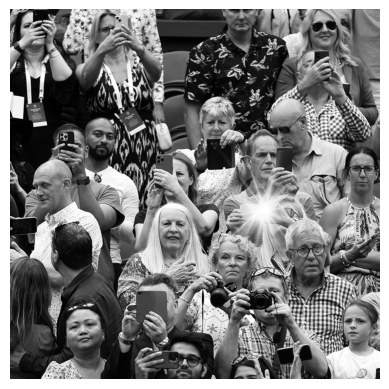

In [74]:
import cv2
img_np=np.array(img)

img_bgr=cv2.cvtColor(img_np,cv2.COLOR_RGB2BGR)
img_gray=cv2.cvtColor(img_bgr,cv2.COLOR_BGR2GRAY)

plt.imshow(img_gray,cmap='gray')
plt.axis("off")



In [75]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def convolve(img, kernel):
    # dimensions
    img_h, img_w = img.shape
    k_h, k_w = kernel.shape

    # Calculate padding
    # padding so the kernel center can sit on the edge pixels
    pad_h = k_h // 2
    pad_w = k_w // 2

    # Appling padding using 'reflect' mode
    # This mirrors the pixels at the boundary to reduce edge artifacts
    padded_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='reflect')

    # Create an empty output image
    output = np.zeros_like(img)

    # Slide the window
    # We iterate over the original image coordinates
    for i in range(img_h):
        for j in range(img_w):
            # Extract the Region of Interest (ROI) from the padded image
            # The ROI size must match the kernel size
            roi = padded_img[i : i + k_h, j : j + k_w]

            # Perform element-wise multiplication (*) and sum the result
            output[i, j] = np.sum(roi * kernel)

    return output

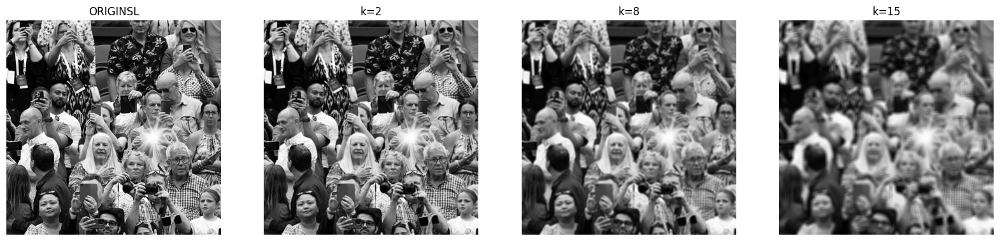

In [76]:
def average_blur_gray(img, ksize):
  kernel=np.ones((ksize,ksize)) / np.sum(ksize*ksize)
  return convolve(img, kernel)


plt.figure(figsize=(20,6))

plt.subplot(1,4,1); plt.imshow(img_gray,cmap='gray'); plt.title("ORIGINSL"); plt.axis('off')

blur_img_gray = average_blur_gray(img_gray,3)
plt.subplot(1,4,2); plt.imshow(blur_img_gray,cmap='gray'); plt.title("k=2"); plt.axis('off')

blur_img_gray = average_blur_gray(img_gray,8)
plt.subplot(1,4,3); plt.imshow(blur_img_gray,cmap='gray'); plt.title("k=8"); plt.axis('off')

blur_img_gray = average_blur_gray(img_gray,15)
plt.subplot(1,4,4); plt.imshow(blur_img_gray,cmap='gray'); plt.title("k=15"); plt.axis('off')
plt.show()


<Figure size 2000x600 with 0 Axes>

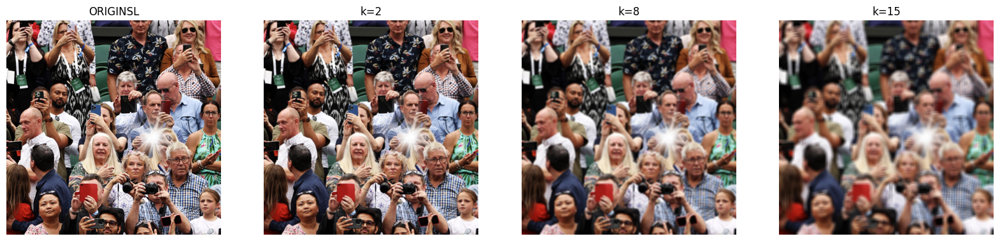

In [77]:
def average_blur_gray(img, ksize):
    """
    Creates a box kernel and convolves it with a gray image.
    """
    # Creating a matrix of ones (Box Filter)
    # divide by ksize*ksize to normalize (ensure sum is 1)
    # If we don't normalize, the image will get incredibly bright (white)
    kernel = np.ones((ksize, ksize)) / (ksize * ksize)

    return convolve(img, kernel)

def average_blur_rgb(img, ksize):
    """
    Applies average blur to each channel of an RGB image.
    """
    # Split channels
    r = img[:, :, 0]
    g = img[:, :, 1]
    b = img[:, :, 2]

   # Apply blur to each
    r_blur = average_blur_gray(r, ksize)
    g_blur = average_blur_gray(g, ksize)
    b_blur = average_blur_gray(b, ksize)

    # Stack them back together (Depth-wise stack)
    return np.dstack((r_blur, g_blur, b_blur))


plt.figure(figsize=(20,6))

plt.figure(figsize=(20,6))

plt.subplot(1,4,1); plt.imshow(img_np); plt.title("ORIGINSL"); plt.axis('off')

blur_img_rgb = average_blur_rgb(img_np,3)
plt.subplot(1,4,2); plt.imshow(blur_img_rgb); plt.title("k=2"); plt.axis('off')

blur_img_rgb = average_blur_rgb(img_np,8)
plt.subplot(1,4,3); plt.imshow(blur_img_rgb); plt.title("k=8"); plt.axis('off')

blur_img_rgb = average_blur_rgb(img_np,15)
plt.subplot(1,4,4); plt.imshow(blur_img_rgb); plt.title("k=15"); plt.axis('off')
plt.show()

In [78]:
def gaussian_kernel(ksize, sigma):
    """
    Generates a normalized 2D Gaussian kernel.
    """
    # 1. Create a coordinate grid centered at 0
    # For ksize=3, we want indices [-1, 0, 1]
    # np.arange(3) -> [0, 1, 2] -> subtract 1 -> [-1, 0, 1]
    ax = np.arange(ksize) - (ksize // 2)
    xx, yy = np.meshgrid(ax, ax) # xx is x-coords, yy is y-coords

    # 2. Apply the 2D Gaussian formula
    # G(x, y) = (1 / (2*pi*sigma^2)) * exp( -(x^2 + y^2) / (2*sigma^2) )
    kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))

    # 3. Normalize!
    # The sum of the kernel MUST be 1, otherwise brightness changes.
    kernel = kernel / np.sum(kernel)

    return kernel

def gaussian_blur_rgb(img, ksize, sigma):
    """
    Helper to apply gaussian kernel to RGB
    """
    kernel = gaussian_kernel(ksize, sigma)

    r = convolve(img[:,:,0], kernel)
    g = convolve(img[:,:,1], kernel)
    b = convolve(img[:,:,2], kernel)

    return np.dstack((r, g, b))

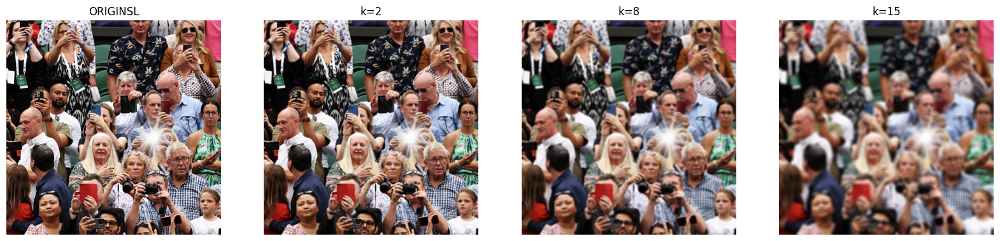

In [79]:

plt.figure(figsize=(20,6))
plt.subplot(1,4,1); plt.imshow(img_np); plt.title("ORIGINSL"); plt.axis('off')

G_blur_img_rgb = gaussian_blur_rgb(img_np, 3, 2)
plt.subplot(1,4,2); plt.imshow(G_blur_img_rgb); plt.title("k=2"); plt.axis('off')

G_blur_img_rgb = gaussian_blur_rgb(img_np, 8, 5)
plt.subplot(1,4,3); plt.imshow(G_blur_img_rgb); plt.title("k=8"); plt.axis('off')

G_blur_img_rgb = gaussian_blur_rgb(img_np, 15, 10)
plt.subplot(1,4,4); plt.imshow(G_blur_img_rgb); plt.title("k=15"); plt.axis('off')
plt.show()


### Part B

#### Task - Sobel Edge Detection (NumPy Only)
Implement Sobel X and Sobel Y filters manually using convolution. Apply on the grayscale image.

Compute:
1. Gx
2. Gy
3. Gradient magnitude

Normalize to 0–255 and save the edge map. Threshold if you wish to, if you do then make the thresholding part clear using code comments.

In [80]:
# Your PART B codes follow here. You can create more cells under this. Write clean and commented code.

(np.float64(-0.5), np.float64(815.5), np.float64(815.5), np.float64(-0.5))

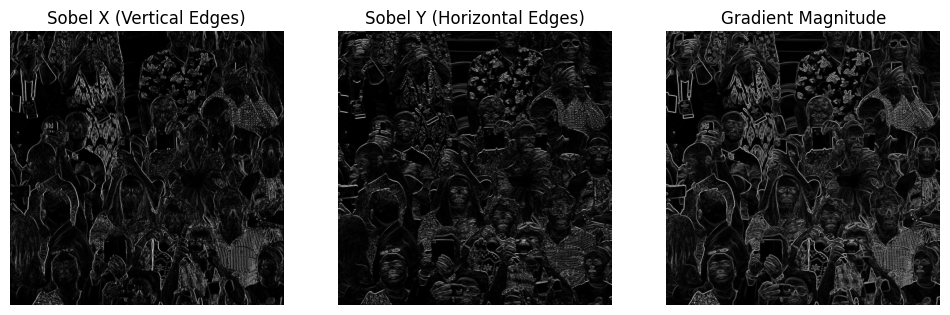

In [81]:
def sobel_edge_detection(img):
    # 1. Convert to Float
    # We need floats because gradients can be negative!
    img_float = img.astype(np.float32)

    # 2. Define Kernels
    # Sobel X: Difference in Horizontal direction (detects vertical edges)
    kx = np.array([[-1, 0, 1],
                   [-2, 0, 2],
                   [-1, 0, 1]])

    # Sobel Y: Difference in Vertical direction (detects horizontal edges)
    ky = np.array([[-1, -2, -1],
                   [ 0,  0,  0],
                   [ 1,  2,  1]])

    # 3. Apply Convolution
    # Uses the convolve function i wrote in Task 1
    gx = convolve(img_float, kx)
    gy = convolve(img_float, ky)

    # 4. Compute Gradient Magnitude
    # Pythagorean theorem to combine X and Y gradients
    magnitude = np.sqrt(gx**2 + gy**2)

    # 5. Normalize to 0-255
    # The magnitude range is unknown (could be 0 to >1000).
    # We scale it so the max value becomes 255.
    norm_magnitude = (magnitude / np.max(magnitude)) * 255

    # Convert back to uint8 for display/saving
    edge_map = norm_magnitude.astype(np.uint8)

    return gx, gy, edge_map

gx, gy, edges = sobel_edge_detection(img_gray)


plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
plt.title("Sobel X (Vertical Edges)")
plt.imshow(np.abs(gx), cmap='gray') # Use abs to see negative edges
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title("Sobel Y (Horizontal Edges)")
plt.imshow(np.abs(gy), cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title("Gradient Magnitude")
plt.imshow(edges, cmap='gray')
plt.axis('off')



### Part C

#### Task 1 — Laplacian Sharpening ( Only Numpy and Grayscale )
1. Use any 3×3 Laplacian kernel (4-connected or 8-connected).

2. Compute:
* <code>lap = convolve(img, laplacian_kernel)</code>
* <code>sharp = img - lap * alpha</code> where alpha ∈ [0.2, 1].

3. Now, put alpha = 1, if you had chosen a different value earlier. Get a new output. Then use the code in the lecture to do the same using cv2. Now, use python to verify if both numpy with alpha = 1 and cv2 give the exact same output ( Compare the matrices )

#### Task 2 - Unsharp Masking ( Only Numpy and Grayscale )
1. Apply Gaussian blur (from Part 1).
2. Subtract blurred image from original: <code> mask = img - blurred </code>
3. Add scaled mask back: <code>sharp = img + alpha * mask</code> , where you can choose any value of alpha.
4. See how negative values of alpha will give you a blurred image.  



In [82]:
# Your PART C codes follow here. You can create more cells under this. Write clean and commented code.

In [83]:
def laplacian_sharpening(img, alpha=1.0):

    # Convert to float to handle negative values during subtraction
    img_float = img.astype(np.float32)

    # Define Laplacian Kernel (Negative Center)
    lap_kernel = np.array([[0,  1, 0],
                           [1, -4, 1],
                           [0,  1, 0]])

    # Convolve
    # (Assuming you have 'convolve' from Part A defined)
    lap = convolve(img_float, lap_kernel)

    # Sharpen
    # sharp = img - (alpha * lap)
    sharp = img_float - (alpha * lap)

    # Clip and Convert

    sharp = np.clip(sharp, 0, 255)

    return sharp.astype(np.uint8), lap


def verify_with_cv2(img, numpy_result, kernel):

    # cv2.filter2D does the convolution
    # -1 means 'same depth as source image
    cv2_result = cv2.filter2D(img, -1, kernel, borderType=cv2.BORDER_REFLECT)

    # Compare matrices
    # We use np.allclose because floating point math can have tiny variations
    # But for integer images, they should be identical.
    match = np.allclose(numpy_result, cv2_result)

    diff = np.abs(numpy_result.astype(int) - cv2_result.astype(int)).sum()
    print(f"Match: {match}")
    print(f"Total Difference Sum: {diff}")

    return cv2_result

In [84]:
def unsharp_masking(img, ksize=5, sigma=1.0, alpha=1.0):
    """
    Sharpening by Unsharp Masking.
    Formula: Sharpened = Original + alpha * (Original - Blurred)
    """
    img_float = img.astype(np.float32)

    # Apply Gaussian Blur
    # (Using the function wrote in Part A.
    g_kernel = gaussian_kernel(ksize, sigma)
    blurred = convolve(img_float, g_kernel)

    # Create the Mask (High Frequency Details)
    mask = img_float - blurred

    # Add scaled mask back to image
    sharp = img_float + (alpha * mask)

    # Clip and Convert
    sharp = np.clip(sharp, 0, 255)

    return sharp.astype(np.uint8), mask

 Verifying Laplacian Convolution
Match: False
Total Difference Sum: 8771300


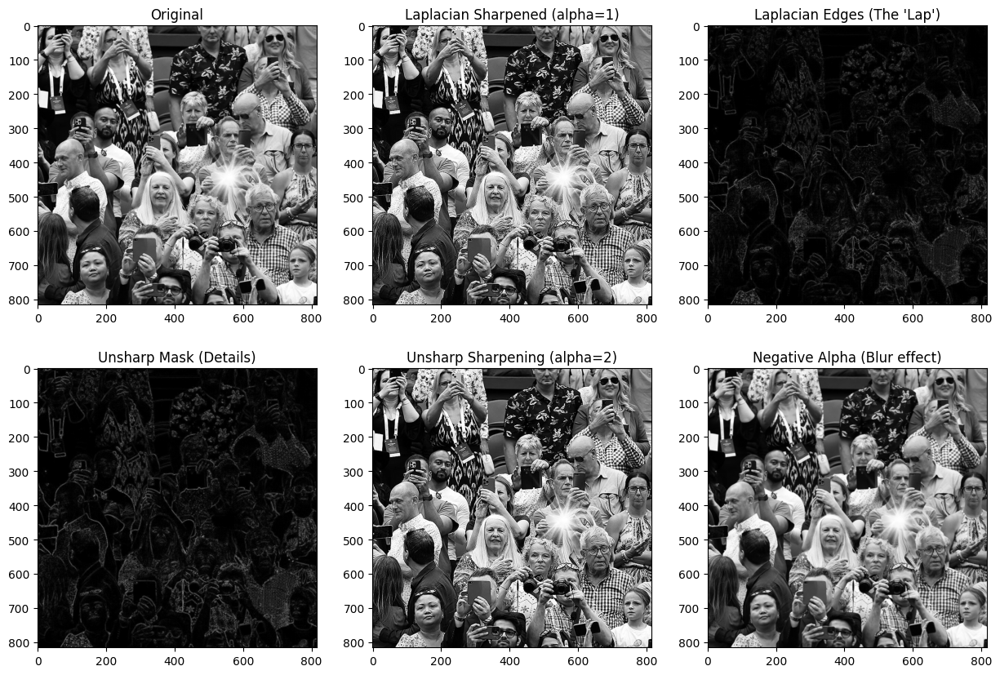

In [85]:
sharp_lap, lap_val = laplacian_sharpening(img_gray, alpha=1.0)

# Verify with CV2
# Note: We must pass the calculation of (img - lap) to compare final output
# But usually verification is done on the CONVOLUTION step specifically.
# Let's verify the convolution part:
lap_kernel = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
print(" Verifying Laplacian Convolution")

verify_with_cv2(img_gray, lap_val, lap_kernel)


# Try alpha = 2.0 for strong sharpening
# Try alpha = -0.5 to see the blurring effect mentioned in prompt!
sharp_unsharp, mask = unsharp_masking(img_gray, ksize=5, sigma=1.0, alpha=2.0)
blur_unsharp, _ = unsharp_masking(img_gray, ksize=5, sigma=1.0, alpha=-0.5)


# Display
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(img_gray, cmap='gray')

plt.subplot(2, 3, 2)
plt.title("Laplacian Sharpened (alpha=1)")
plt.imshow(sharp_lap, cmap='gray')

plt.subplot(2, 3, 3)
plt.title("Laplacian Edges (The 'Lap')")
plt.imshow(np.abs(lap_val), cmap='gray')  # abs to see details

plt.subplot(2, 3, 4)
plt.title("Unsharp Mask (Details)")
plt.imshow(np.abs(mask), cmap='gray')

plt.subplot(2, 3, 5)
plt.title("Unsharp Sharpening (alpha=2)")
plt.imshow(sharp_unsharp, cmap='gray')

plt.subplot(2, 3, 6)
plt.title("Negative Alpha (Blur effect)")
plt.imshow(blur_unsharp, cmap='gray')

plt.show()


### Part D

#### Task - Frequency Analysis (LPF & HPF Verification)
Compute the magnitude spectrum of the original image, gaussian blurred image and the unsharp masking image. Now, play with the alpha value in sharpening and gaussian kernel and notice how the magntude spectrum changes.
Then, in code comments, explain your observations of dark and bright areas in the magnitude spectrum. In nutshell, verify how convolution is actually filtering frequencies depending on the kernel.

In [86]:
# Your PART D codes follow here. You can create more cells under this. Write clean and commented code.

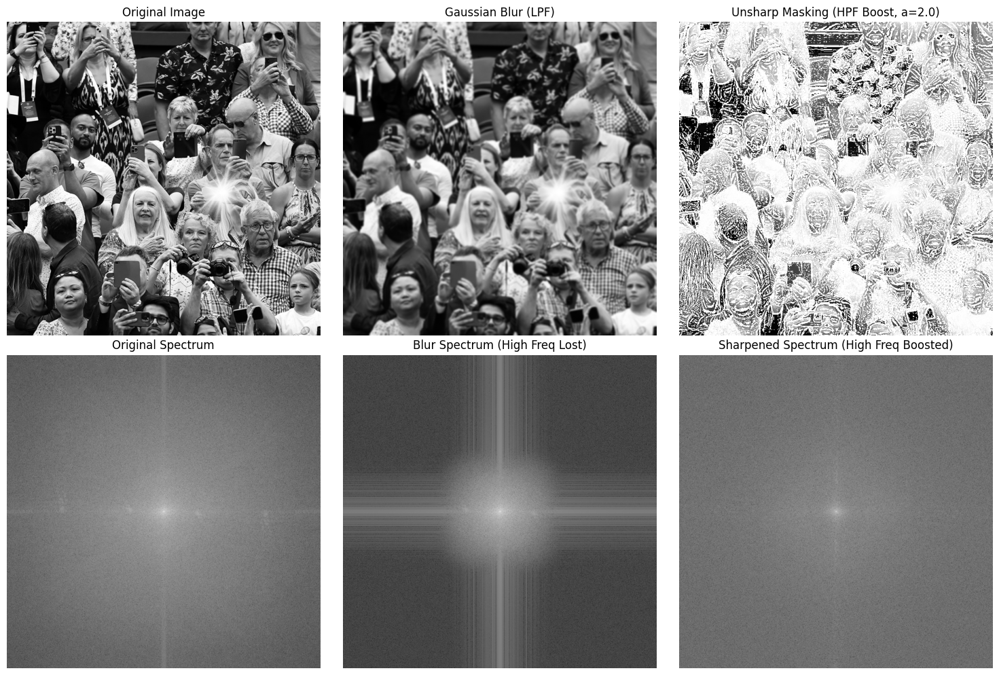

'\nOBSERVATIONS:\n\n1. Spectrum Basics: \n   Center = Low frequencies (smooth areas)\n   Corners = High frequencies (edges/details)\n\n2. Gaussian Blur (LPF):\n   Outer corners get darker \n   Reason is Gaussian is a Low Paas Filter it blocks high frequencies wiping out the edge details in the spectrum\n\n3. Unsharp Masking (HPF Boost):\n   Outer corners get brighter/whiter\n   Reason: We are explicitly adding the edges (high freq) back into the image, effectively amplifying the high-frequency signals\n'

In [87]:
def get_magnitude_spectrum(img):
    """
    Computes the Magnitude Spectrum of an image using NumPy FFT.
    """
    # Convert to float
    img_float = img.astype(np.float32)

    # Compute 2D Fourier Transform (Spatial -> Frequency)
    f = np.fft.fft2(img_float)

    # Shift zero-frequency component to center
    fshift = np.fft.fftshift(f)

    # Compute Magnitude (Log scale to visualize huge range)
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)

    return magnitude_spectrum

# Generate Filtered Images

# LPF: Gaussian Blur (Blocks High Frequencies)
# Using cv2 for speed/verification here, or swap with your manual gaussian_blur function
blur = cv2.GaussianBlur(img_gray, (9, 9), sigmaX=2.0)

# HPF Boost: Unsharp Masking (Boosts High Frequencies)
# Formula: Sharp = Original + alpha * (Original - Blur)
alpha = 2.0
mask = img_gray.astype(float) - blur.astype(float)
sharp = cv2.addWeighted(img_gray, 1.0, mask.astype(np.uint8), alpha, 0)


spec_orig = get_magnitude_spectrum(img_gray)
spec_blur = get_magnitude_spectrum(blur)
spec_sharp = get_magnitude_spectrum(sharp)


plt.figure(figsize=(15, 10))

# Row 1: The Spatial Images
plt.subplot(2, 3, 1)
plt.imshow(img_gray, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title("Gaussian Blur (LPF)")
plt.imshow(blur, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title(f"Unsharp Masking (HPF Boost, a={alpha})")
plt.imshow(sharp, cmap='gray')
plt.axis('off')

# Row 2: The Frequency Spectra
plt.subplot(2, 3, 4)
plt.imshow(spec_orig, cmap='gray')
plt.title("Original Spectrum")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(spec_blur, cmap='gray')
plt.title("Blur Spectrum (High Freq Lost)")
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(spec_sharp, cmap='gray')
plt.title("Sharpened Spectrum (High Freq Boosted)")
plt.axis('off')

plt.tight_layout()
plt.show()

# 5. REQUIRED EXPLANATION
"""
OBSERVATIONS:

1. Spectrum Basics:
   Center = Low frequencies (smooth areas)
   Corners = High frequencies (edges/details)

2. Gaussian Blur (LPF):
   Outer corners get darker
   Reason is Gaussian is a Low Paas Filter it blocks high frequencies wiping out the edge details in the spectrum

3. Unsharp Masking (HPF Boost):
   Outer corners get brighter/whiter
   Reason: We are explicitly adding the edges (high freq) back into the image, effectively amplifying the high-frequency signals
"""

### Part E

#### Task - Custom Colour Kernel (Detect Yellow Leaf Edges)

**Instructions :**
* At the start of the assignment .ipynb file, you will find a code cell in section 1, run it to see an image with a yellow leaf amongst green leaves.
* Design a 3×3 or 5×5 custom kernel applied separately to each channel that highlights the edges where any other colour transitions into a yellowish hue.

**Hints :**

* Yellow = (R high, G high, B low)

* Dark green = (G high, R low, B low)

**Steps:**

1. Analyze the RGB values of green & yellow regions.

2. Create a custom kernel that responds strongly to change from green to yellow in:
* Red matrices of RGB
* Green matrices of RGB
* Optionally R - G difference
* Think about the gradient in Red - Green. Is there a huge change the value of R-G when colour changes from Green to Yellow ? If yes, try to exploit it.

3. Combine the response maps.

4. Get a clean outline around the leaf.

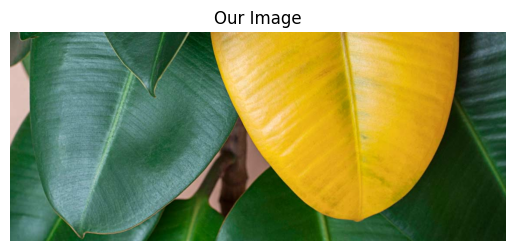

In [88]:
plt.imshow(img_part5)
plt.axis("off")
plt.title("Our Image")
plt.show()

In [89]:
# Your PART E codes follow here. You can create more cells under this. Write clean and commented code.

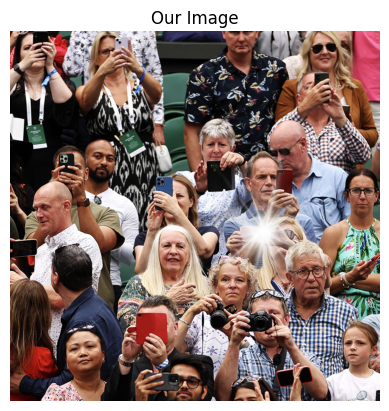

In [90]:
plt.imshow(img)
plt.axis("off")
plt.title("Our Image")
plt.show()

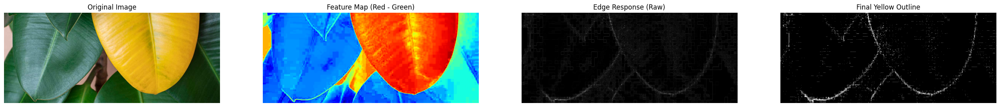

In [91]:
def detect_yellow_edges(img):

    # Convert to float to handle negative subtractions
    img_float = img.astype(np.float32)

    # Extract Channels
    r = img_float[:, :, 0]
    g = img_float[:, :, 1]
    b = img_float[:, :, 2]

    #  Create the Feature Map (R - G)
    # Green Leaf: Low R - High G = Very Negative
    # Yellow Leaf: High R - High G ~ 0
    # The "Edge" is the steep cliff between Negative and Zero.
    diff_map = r - g


    # I want to detect rapid changes. A Laplacian kernel is perfect for this.
    # It calculates the 2nd derivative (curvature) of the image intensity.
    kernel = np.array([[0,  1, 0],
                       [1, -4, 1],
                       [0,  1, 0]])

    # Apply Kernel

    # in cv function edge_response = cv2.filter2D(diff_map, -1, kernel)
    #for sake of more points i am using numpy :)
    edge_response = convolve(diff_map, kernel)

    # Post-Processing
    # The edges might be negative or positive. Take absolute value.
    edge_mag = np.abs(edge_response)

    # Normalize to 0-255 for display
    edge_norm = cv2.normalize(edge_mag, None, 0, 255, cv2.NORM_MINMAX)
    edge_norm = edge_norm.astype(np.uint8)

    # Threshold to clean up noise just experimenting
    # Keep only strong edges
    _, clean_edges = cv2.threshold(edge_norm, 40, 255, cv2.THRESH_BINARY)

    return diff_map, edge_norm, clean_edges

diff_map, edge_norm, clean_edges = detect_yellow_edges(img_part5)

plt.figure(figsize=(32, 10))

plt.subplot(1, 4, 1)
plt.title("Original Image")
plt.imshow(img_part5)
plt.axis('off')

plt.subplot(1, 4, 2)
plt.title("Feature Map (Red - Green)")
plt.imshow(diff_map, cmap='jet')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.title("Edge Response (Raw)")
plt.imshow(edge_norm, cmap='gray')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.title("Final Yellow Outline")
plt.imshow(clean_edges, cmap='gray')
plt.axis('off')

plt.show()

### Bonus - Part F

#### Task - Color Manipulation Using Lecture 2 Concepts

**NOTE :** only for this, you can use cv2 functions, no need of doing everything in Numpy. Although there are still more brownie parts for Numpy hardwork.

1. Convert the RGB image to HSV. Use your rgb_to_hsv() from Lecture 2 Assignment - free Numopy points ;)) .
2. Identify pixels belonging to the yellow leaf using an HSV mask. (maybe take help from Part E or design a new hue mask)
3. Now use your full brain and chnage the colour of the leaf to red.

Convert back to RGB.

Display the final result.

For reference, heres the image I expect as a result. And its not actually tough, easy 5 lines code.
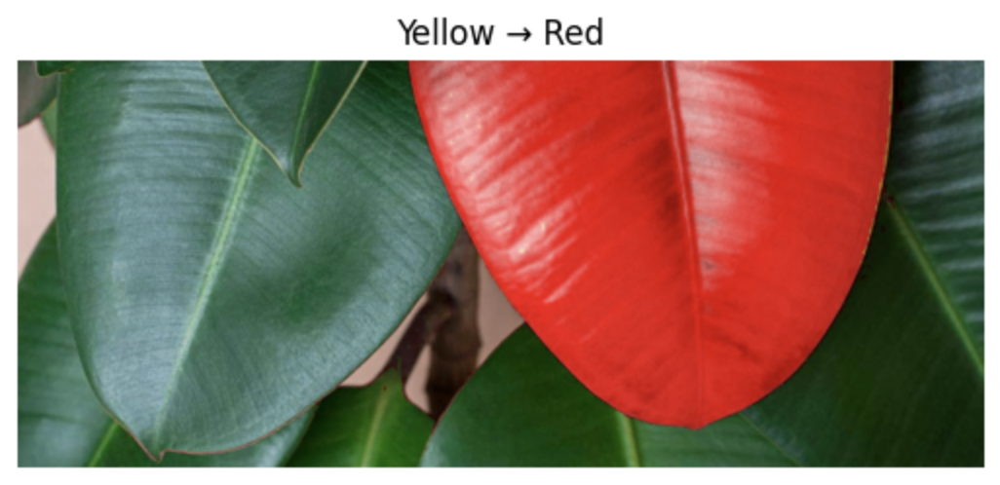

Also, we can change to a less brighter colour
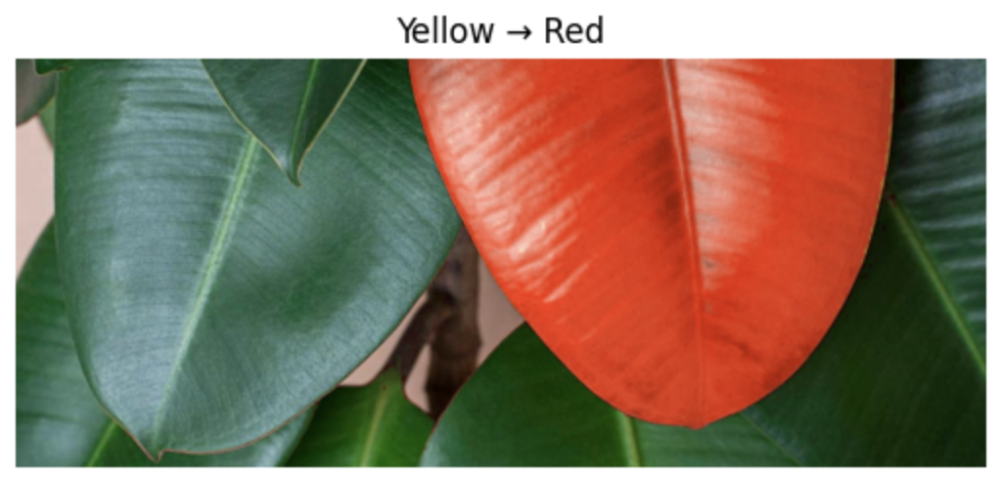

In [92]:
# Your BONUS PART codes follow here. You can create more cells under this. Write clean and commented code.

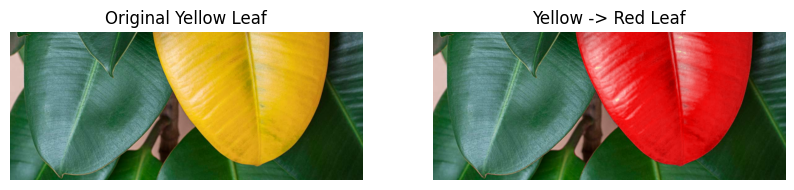

In [93]:
def rgb_to_hsv(rgb_img):
  hsv_img=np.zeros_like(rgb_img)  #same shape as input
  for i in range(rgb_img.shape[0]):
    for j in range(rgb_img.shape[1]):
      pixel=rgb_img[i,j]
      r, g, b = pixel / 255.0       # normalising as img taken can be non normaslised


      max_val=max(r,g,b)          #max among r,b,g
      min_val=min(r,g,b)
      delta=max_val-min_val
      #calculation for hue
      if delta==0:
        h=0
      elif max_val==r:
        h=60*((g-b)/delta % 6)
      elif max_val==g:
        h=120+(60*(b-r)/delta)
      else:
         h=240+(60*(r-g)/delta)
      #calculation for saturation
      if max_val==0:
        s=0
      else:
        s=delta/max_val
      # calculation for value
      v=max_val

      hsv_img[i,j] = [(h+360)%360*0.5, s*255, v*255]
  return hsv_img.astype(np.uint8)



# Convert to HSV
# just for recall can be done by ab yaad rahega cv2.cvtColor(img, cv2.COLOR_RGB2HSV) works too
hsv_img = rgb_to_hsv(img_part5)

# Create the Mask for Yellow
# Yellow in OpenCV HSV is typically hue range [20, 35] just serched
lower_yellow = np.array([15, 80, 80])  # Min Hue, Min Sat, Min Val
upper_yellow = np.array([35, 255, 255]) # Max Hue, Max Sat, Max Val

# Use cv2.inRange for the mask
mask = cv2.inRange(hsv_img, lower_yellow, upper_yellow)

# Change Color (The "Brain" part)
# I want Red. Red hue is 0 (or 179).
# taking the Hue channel (index 0) and set pixels where mask > 0 to 0.
hsv_img[:, :, 0][mask > 0] = 0  # 0 is pure Red

# 4. Convert back to RGB
# Using cv2 for the return
final_img = cv2.cvtColor(hsv_img, cv2.COLOR_HSV2RGB)

# 5. Display
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title("Original Yellow Leaf")
plt.imshow(img_part5)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Yellow -> Red Leaf")
plt.imshow(final_img)
plt.axis('off')

plt.show()

In [94]:
#once trying with my image

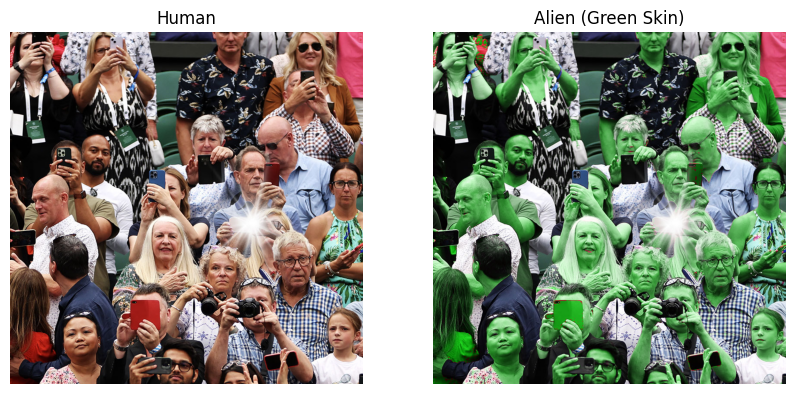

In [103]:
# Convert to HSV
hsv_img = rgb_to_hsv(img_np) # Assuming img_np is a photo of a person

# 1. Create the Mask for SKIN
# Skin is tricky, but usually falls in Hue [0, 20] (Oranges/Reds)
# We use moderate Saturation (don't want to pick up white walls or black clothes)
lower_skin = np.array([0, 15, 10])
upper_skin = np.array([40, 255, 255])   #needed to change many times

mask = cv2.inRange(hsv_img, lower_skin, upper_skin)

# 2. Change Color (The Alien Part)
# We want Green. Green Hue is ~60 in OpenCV (120 degrees)
# Or try 100 for Avatar Blue!
target_hue = 60

# Apply the new hue only where the mask is active
hsv_img[:, :, 0][mask > 0] = target_hue

# 3. Convert back to RGB
final_img = cv2.cvtColor(hsv_img, cv2.COLOR_HSV2RGB)

# 4. Display
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title("Human")
plt.imshow(img_np)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Alien (Green Skin)")
plt.imshow(final_img)
plt.axis('off')

plt.show()

#now all looks alien :)